Data Requisition (Kaggle) + Importing Libraries

In [ ]:
# Mount your Google Drive.
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
competition_name = "awsaf49/coco-2017-dataset"

# Mount your Google Drive.
from google.colab import drive
drive.mount("/content/drive")

kaggle_creds_path = "/content/drive/MyDrive/ML_Projects/Image_Captioning/Dataset/kaggle.json"

! pip install kaggle --quiet
! mkdir ~/.kaggle
! cp /content/drive/MyDrive/Image_Captioning/Dataset/kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

#! kaggle datasets download -d {competition_name}

!kaggle datasets download -d {competition_name} -p /content/drive/MyDrive/Image_Captioning/Dataset


#! mkdir /content/drive/MyDrive/Image_Captioning/Dataset
#! unzip {competition_name + ".zip"} -d kaggle_data

# Unmount your Google Drive
#drive.flush_and_unmount()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
mkdir: cannot create directory ‘/root/.kaggle’: File exists
100% 25.0G/25.0G [17:55<00:00, 25.9MB/s]
100% 25.0G/25.0G [17:55<00:00, 25.0MB/s]


In [ ]:
!unzip -j /content/drive/MyDrive/Image_Captioning/Dataset/coco-2017-dataset.zip 'coco2017/train2017/*' -d /content/drive/MyDrive/TrainingImgs

In [ ]:
import os
import glob

# Specify the directory containing the images
image_directory = "/content/drive/MyDrive/TrainingImgs"

# Use glob to get a list of all image files in the directory
image_files = glob.glob(os.path.join(image_directory, '*.jpg'))  # Adjust the file extension as needed

# Get the number of images
num_images = len(image_files)

print(f"Number of images in the directory: {num_images}")

In [ ]:
import urllib.request
import os
import json
import warnings
warnings.filterwarnings('ignore')
import collections
import string
from pycocotools.coco import COCO

import random
from tqdm import tqdm
import numpy as np
import pickle

# Tensorflow & Keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.layers import Embedding, LSTM, add, Concatenate, Reshape, concatenate, Bidirectional
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications.inception_v3 import preprocess_input
from keras import Input

# Loading Training Data (Images + Captions) and Preprocessing

In [ ]:
annotations='/content/drive/MyDrive/coco2017/annotations/captions_train2017.json'
image_directory ="/content/drive/MyDrive/TrainingImgs"

In [ ]:
# Function for loading json data
def loading_json_data(annotations):
  with open(annotations, 'r') as annotation:
    annotation_json=json.load(annotation)
  return annotation_json

# Formatting captions - changing to lower case and removing captions
def annotation_json_formatting(caption):
  punctuation_removal=str.maketrans('','',string.punctuation)
  caption = [word.lower().translate(punctuation_removal) for word in caption.split()]
  return ' '.join(caption)

# Storing the formatted caption and metadata in a collection dictionary
def annnotated_data_storage(annotations):
  annotation_json=loading_json_data(annotations)
  #print(annotation_json['annotations'][3])
  Oraganized_data=collections.defaultdict(list)
  for item in annotation_json['annotations']:
    formatted_caption= annotation_json_formatting(item['caption'])
    #print(formatted_caption)
    image_filename= f"{item['image_id']:012}.jpg"
    image_path= os.path.join(image_directory,image_filename)
    # creating a deafultdict in list format storing the image paths and respective captions
    Oraganized_data[image_path].append(formatted_caption)
  return dict(Oraganized_data)

  # organizing data and storing as a dictionary
Oraganized_imagepath_captions=annnotated_data_storage(annotations)

Reducing the size of the dataset

In [ ]:
# Reducing the dataset size by sampling a subset
imagepath_caption_reduce = dict(random.sample(dict(Oraganized_imagepath_captions).items(),
                              int(len(dict(Oraganized_imagepath_captions)) * 0.5)))

Storing Image IDs and their path

In [ ]:
# Mapping Image IDs to the Oragnized default dict

def path_to_image_id_mapping(caption_collection):
    Mapping=collections.defaultdict(list)
    for img_path, captions_list in caption_collection.items():
        img_identifier = os.path.basename(img_path).rstrip('.jpg')
        Mapping[img_identifier] = captions_list
    return dict(Mapping)

# Substituiting Image paths with Image ID
ImageID_captions_reduce = path_to_image_id_mapping(imagepath_caption_reduce)
# extracting all the image ids and storing
ImageIDs = list(ImageID_captions_reduce.keys())
# extracting all the images and storing
ImagePaths = list(imagepath_caption_reduce.keys())

Processing the caption

In [ ]:
lines =[f"{path} {description}"
        for path,description_list in ImageID_captions_reduce.items()
        for description in description_list ]
print(lines[:2])

# Initializing a dictionary to hold batch of processed descriptions
descriptions_batch = {}
#processing each line in the description as
for line in tqdm(lines):
  if not line.strip():
    continue
  imgid, *img_description = line.split()
  # Adding 'startseq' and 'endseq' tokens to each description
  if imgid in list(ImageID_captions_reduce.keys()):
    desc = 'startseq {} endseq'.format(' '.join(img_description))
    descriptions_batch.setdefault(imgid, []).append(desc)

['000000039509 two people lay on the beach under umbrellas facing the water', '000000039509 if you have some people on a beach by the ocean']


100%|██████████| 295886/295886 [05:44<00:00, 857.98it/s]


Vector embedding of captions using GloVe

In [ ]:
from typing_extensions import Counter
import itertools
#creating file with all processed sequences
captions_batch = list(itertools.chain.from_iterable(descriptions_batch.values()))
#Genearting vocabulary from caption
words=[word for sent in captions_batch for word in sent.split()]
vocab = [word for word, count in Counter(words).items() if count >=10]

# Creating word-to-index and index-to-word mappings
wordtoix = {word: index+1 for index, word in enumerate(vocab)}
ixtoword = {index: word for word, index in wordtoix.items()}
vocab_size= len(ixtoword) + 1

# determining the max length of description
alldesc = [desc for descs in descriptions_batch.values() for desc in descs]
maxlen = max(map(lambda x: len(x.split()), alldesc))

#dictionary for storing word embeddings
embedding_map={}
with open('/content/drive/MyDrive/Image_Captioning/Dataset/glove.6B.200d.txt',encoding="utf-8") as f:
  for line in f:
    values = line.strip().split()
    embedding_map[values[0]] = np.asarray(values[1:], dtype='float32')

# Defining the embedding dimension
embedding_dim = 200
embedding_mat = np.zeros((vocab_size, embedding_dim))

# Populating the embedding matrix with known embeddings
embeddings_keep = {wordtoix[word]: embedding_map[word] for word in wordtoix if word in embedding_map}
for index, embeds in embeddings_keep.items():
    embedding_mat[index] = embeds


In [ ]:
# Set GPU device
physical_devices = tf.config.list_physical_devices('GPU')
if not physical_devices:
    raise RuntimeError("No GPU devices found.")
tf.config.experimental.set_memory_growth(physical_devices[0], True)

Extracting Image features using Inception V3 and storing in dictionary

In [ ]:
# Setting up the InceptionV3 model for image feature extraction
base_model = InceptionV3(weights='imagenet')
model_new = Model(inputs=base_model.input, outputs=base_model.layers[-2].output)

# Function to preprocess input images for the model
def image_preprocessing(im_path):
    image = load_img(im_path, target_size=(299, 299))
    image_arr = img_to_array(image)
    image_arr = np.expand_dims(image_arr, axis=0)
    return preprocess_input(image_arr)

# Extracting feature vectors from preprocessed images
def fetch_encoding(im_path):
    processed_image = image_preprocessing(im_path)
    feature_vector = model_new.predict(processed_image)
    return np.squeeze(feature_vector)

# Processing all training images to get their feature vectors
#ImagePaths = [...]  # Specify your list of image paths
training_data = {os.path.basename(im_path): fetch_encoding(im_path) for im_path in tqdm(ImagePaths)}

# Defining the path to save the training data
save_path = '/content/drive/MyDrive/training_data_final.pkl'

# Saving the training data to a file using pickle
with open(save_path, 'wb') as file:
    pickle.dump(training_data, file, protocol=pickle.HIGHEST_PROTOCOL)

print("Training data saved successfully.")

96112376/96112376 [==============================] - 0s 0us/step


  0%|          | 0/59143 [00:00<?, ?it/s]

1/1 [==============================] - 3s 3s/step


  0%|          | 1/59143 [00:03<59:51:58,  3.64s/it]

1/1 [==============================] - 0s 25ms/step


  0%|          | 3/59143 [00:03<16:36:24,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


  0%|          | 5/59143 [00:03<8:44:04,  1.88it/s] 

1/1 [==============================] - 0s 26ms/step


  0%|          | 7/59143 [00:04<5:36:42,  2.93it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 9/59143 [00:04<4:02:59,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 11/59143 [00:04<3:06:36,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 13/59143 [00:04<2:34:20,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 15/59143 [00:04<2:09:55,  7.58it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 17/59143 [00:04<1:53:33,  8.68it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 19/59143 [00:05<1:43:55,  9.48it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 21/59143 [00:05<1:37:14, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 23/59143 [00:05<1:33:06, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 25/59143 [00:05<1:29:35, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 27/59143 [00:05<1:28:54, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 29/59143 [00:06<1:28:16, 11.16it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 31/59143 [00:06<1:27:35, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 33/59143 [00:06<1:27:05, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 35/59143 [00:06<1:27:01, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 37/59143 [00:06<1:25:32, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 39/59143 [00:06<1:28:04, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 41/59143 [00:07<1:27:17, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 43/59143 [00:07<1:26:08, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 45/59143 [00:07<1:24:17, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 47/59143 [00:07<1:24:23, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 49/59143 [00:07<1:22:59, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 51/59143 [00:07<1:23:24, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 53/59143 [00:08<1:21:58, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 55/59143 [00:08<1:21:48, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 57/59143 [00:08<1:22:24, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 59/59143 [00:08<1:23:24, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 61/59143 [00:08<1:22:34, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 63/59143 [00:08<1:22:04, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 65/59143 [00:09<1:21:41, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 67/59143 [00:09<1:21:06, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 69/59143 [00:09<1:19:51, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 71/59143 [00:09<1:19:17, 12.42it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 73/59143 [00:09<1:18:58, 12.47it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 75/59143 [00:09<1:18:54, 12.48it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 77/59143 [00:10<1:19:11, 12.43it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 79/59143 [00:10<1:20:59, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 81/59143 [00:10<1:20:26, 12.24it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 83/59143 [00:10<1:20:10, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 85/59143 [00:10<1:19:56, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 87/59143 [00:10<1:19:32, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 89/59143 [00:11<1:19:38, 12.36it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 91/59143 [00:11<1:20:53, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 93/59143 [00:11<1:23:07, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 95/59143 [00:11<1:23:52, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 97/59143 [00:11<1:22:31, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 99/59143 [00:11<1:21:37, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 101/59143 [00:12<1:21:26, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 103/59143 [00:12<1:22:35, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 105/59143 [00:12<1:21:04, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 107/59143 [00:12<1:18:44, 12.50it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 109/59143 [00:12<1:19:30, 12.37it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 111/59143 [00:12<1:19:38, 12.35it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 113/59143 [00:12<1:19:47, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 115/59143 [00:13<1:19:47, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 117/59143 [00:13<1:20:13, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 119/59143 [00:13<1:20:37, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 121/59143 [00:13<1:24:49, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 123/59143 [00:13<1:25:43, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 125/59143 [00:14<1:23:54, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 127/59143 [00:14<1:22:36, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 129/59143 [00:14<1:22:26, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 131/59143 [00:14<1:23:46, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 133/59143 [00:14<1:22:13, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 135/59143 [00:14<1:22:07, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 137/59143 [00:15<1:20:56, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 139/59143 [00:15<1:23:23, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 141/59143 [00:15<1:23:51, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 143/59143 [00:15<1:23:52, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 145/59143 [00:15<1:22:09, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 147/59143 [00:15<1:21:46, 12.02it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 149/59143 [00:16<1:22:11, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 151/59143 [00:16<1:21:34, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 153/59143 [00:16<1:21:39, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 155/59143 [00:16<1:20:32, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 157/59143 [00:16<1:25:04, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 159/59143 [00:16<1:25:11, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 161/59143 [00:17<1:22:58, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 163/59143 [00:17<1:22:42, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 165/59143 [00:17<1:22:37, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 167/59143 [00:17<1:22:35, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 169/59143 [00:17<1:22:32, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 171/59143 [00:17<1:21:54, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 173/59143 [00:18<1:21:34, 12.05it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 175/59143 [00:18<1:19:41, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 177/59143 [00:18<1:19:37, 12.34it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 179/59143 [00:18<1:22:08, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 181/59143 [00:18<1:22:38, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 183/59143 [00:18<1:22:43, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 185/59143 [00:19<1:21:43, 12.02it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 187/59143 [00:19<1:24:31, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 189/59143 [00:19<1:25:12, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 191/59143 [00:19<1:25:34, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 193/59143 [00:19<1:24:51, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 195/59143 [00:19<1:24:23, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 197/59143 [00:20<1:24:13, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 199/59143 [00:20<1:22:27, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 201/59143 [00:20<1:22:26, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 203/59143 [00:20<1:22:21, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 205/59143 [00:20<1:23:22, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 207/59143 [00:20<1:23:13, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 209/59143 [00:21<1:21:23, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 211/59143 [00:21<1:22:31, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 213/59143 [00:21<1:23:56, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 215/59143 [00:21<2:20:17,  7.00it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 217/59143 [00:22<2:02:51,  7.99it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 219/59143 [00:22<1:49:51,  8.94it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 221/59143 [00:22<1:40:50,  9.74it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 223/59143 [00:22<1:35:13, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 225/59143 [00:22<1:31:31, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 227/59143 [00:22<1:28:18, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 229/59143 [00:23<1:26:15, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 231/59143 [00:23<1:24:32, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 233/59143 [00:23<1:25:05, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 235/59143 [00:23<1:24:09, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 237/59143 [00:23<1:23:54, 11.70it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 239/59143 [00:23<1:22:34, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 241/59143 [00:24<1:21:50, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 243/59143 [00:24<1:22:21, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 245/59143 [00:24<1:22:06, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 247/59143 [00:24<1:22:43, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 249/59143 [00:24<1:23:12, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 251/59143 [00:24<1:23:19, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 253/59143 [00:25<1:23:10, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 255/59143 [00:25<1:24:57, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 257/59143 [00:25<1:23:45, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 259/59143 [00:25<1:22:57, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 261/59143 [00:25<1:23:35, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 263/59143 [00:26<1:23:37, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 265/59143 [00:26<1:21:10, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 267/59143 [00:26<1:20:13, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 269/59143 [00:26<1:20:52, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 271/59143 [00:26<1:21:18, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 273/59143 [00:26<1:20:29, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 275/59143 [00:26<1:19:04, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 277/59143 [00:27<1:19:44, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 279/59143 [00:27<1:19:14, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 281/59143 [00:27<1:19:40, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 283/59143 [00:27<1:20:56, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 285/59143 [00:27<1:21:13, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 287/59143 [00:27<1:23:11, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 289/59143 [00:28<1:23:34, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 291/59143 [00:28<1:22:35, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 293/59143 [00:28<1:22:43, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 295/59143 [00:28<1:21:59, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 297/59143 [00:28<1:22:37, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 299/59143 [00:28<1:22:15, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 301/59143 [00:29<1:20:33, 12.18it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 303/59143 [00:29<1:19:07, 12.39it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 305/59143 [00:29<1:20:44, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 307/59143 [00:29<1:20:37, 12.16it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 309/59143 [00:29<1:21:34, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 311/59143 [00:29<1:22:52, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 313/59143 [00:30<1:22:11, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 315/59143 [00:30<1:22:12, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 317/59143 [00:30<1:20:50, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 319/59143 [00:30<1:20:13, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 321/59143 [00:30<1:20:14, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 323/59143 [00:30<1:21:36, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 325/59143 [00:31<1:21:19, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 327/59143 [00:31<1:22:01, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 329/59143 [00:31<1:22:28, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 331/59143 [00:31<1:24:24, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 333/59143 [00:31<1:25:49, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 335/59143 [00:32<1:25:10, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 337/59143 [00:32<1:24:19, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 339/59143 [00:32<1:23:52, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 341/59143 [00:32<1:23:37, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 343/59143 [00:32<1:25:19, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 345/59143 [00:32<1:25:41, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 347/59143 [00:33<1:24:44, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 349/59143 [00:33<1:23:42, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 351/59143 [00:33<1:24:58, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 353/59143 [00:33<1:24:37, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 355/59143 [00:33<1:25:30, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 357/59143 [00:33<1:24:24, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 359/59143 [00:34<1:23:34, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 361/59143 [00:34<1:24:27, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 363/59143 [00:34<1:24:12, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 365/59143 [00:34<1:23:27, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 367/59143 [00:34<1:22:48, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 369/59143 [00:34<1:23:27, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 371/59143 [00:35<1:24:00, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 373/59143 [00:35<1:24:31, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 375/59143 [00:35<1:23:17, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 377/59143 [00:35<1:22:08, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 379/59143 [00:35<1:22:35, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 381/59143 [00:35<1:22:00, 11.94it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 383/59143 [00:36<1:21:59, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 385/59143 [00:36<1:22:33, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 387/59143 [00:36<1:20:42, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 389/59143 [00:36<1:21:51, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 391/59143 [00:36<1:21:52, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 393/59143 [00:36<1:20:41, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 395/59143 [00:37<1:20:05, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 397/59143 [00:37<1:20:47, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 399/59143 [00:37<1:19:55, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 401/59143 [00:37<1:19:45, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 403/59143 [00:37<1:19:23, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 405/59143 [00:37<1:19:03, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 407/59143 [00:38<1:21:23, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 409/59143 [00:38<1:20:33, 12.15it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 411/59143 [00:38<1:21:39, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 413/59143 [00:38<1:20:31, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 415/59143 [00:38<1:19:37, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 417/59143 [00:38<1:20:22, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 419/59143 [00:39<1:20:26, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 421/59143 [00:39<1:20:15, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 423/59143 [00:39<1:19:35, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 425/59143 [00:39<1:20:27, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 427/59143 [00:39<1:21:28, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 429/59143 [00:39<1:21:04, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 431/59143 [00:40<1:20:10, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 433/59143 [00:40<1:20:25, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 435/59143 [00:40<1:21:13, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 437/59143 [00:40<1:21:12, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 439/59143 [00:40<1:20:54, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 441/59143 [00:40<1:19:31, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 443/59143 [00:41<1:18:32, 12.45it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 445/59143 [00:41<1:21:11, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 447/59143 [00:41<1:21:10, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 449/59143 [00:41<1:21:23, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 451/59143 [00:41<1:20:42, 12.12it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 453/59143 [00:41<1:21:11, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 455/59143 [00:42<1:21:23, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 457/59143 [00:42<1:22:29, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 459/59143 [00:42<1:20:54, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 461/59143 [00:42<1:21:22, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 463/59143 [00:42<1:22:08, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 465/59143 [00:42<1:20:52, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 467/59143 [00:43<1:21:00, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 469/59143 [00:43<1:20:23, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 471/59143 [00:43<1:21:12, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 473/59143 [00:43<1:22:05, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 475/59143 [00:43<1:21:50, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 477/59143 [00:43<1:21:58, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 479/59143 [00:44<1:21:08, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 481/59143 [00:44<1:22:05, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 483/59143 [00:44<1:21:45, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 485/59143 [00:44<1:23:19, 11.73it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 487/59143 [00:44<1:22:51, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 489/59143 [00:44<1:23:52, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 491/59143 [00:45<1:25:07, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 493/59143 [00:45<1:25:33, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 495/59143 [00:45<1:24:59, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 497/59143 [00:45<1:26:22, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 499/59143 [00:45<1:25:31, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 501/59143 [00:45<1:25:30, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 503/59143 [00:46<1:25:14, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 505/59143 [00:46<1:24:08, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 507/59143 [00:46<1:22:40, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 509/59143 [00:46<1:22:56, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 511/59143 [00:46<1:24:36, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 513/59143 [00:46<1:24:12, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 515/59143 [00:47<1:23:47, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 517/59143 [00:47<1:23:46, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 519/59143 [00:47<1:24:09, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 521/59143 [00:47<1:22:52, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 523/59143 [00:47<1:22:45, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 525/59143 [00:47<1:22:57, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 527/59143 [00:48<1:23:34, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 529/59143 [00:48<1:23:05, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 531/59143 [00:48<1:21:27, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 533/59143 [00:48<1:21:51, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 535/59143 [00:48<1:20:40, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 537/59143 [00:48<1:21:23, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 539/59143 [00:49<1:21:24, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 541/59143 [00:49<1:20:47, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 543/59143 [00:49<1:21:06, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 545/59143 [00:49<1:20:06, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 547/59143 [00:49<1:21:03, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 549/59143 [00:49<1:20:13, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 551/59143 [00:50<1:20:45, 12.09it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 553/59143 [00:50<1:20:06, 12.19it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 555/59143 [00:50<1:20:45, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 557/59143 [00:50<1:20:49, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 559/59143 [00:50<1:20:10, 12.18it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 561/59143 [00:50<1:18:50, 12.38it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 563/59143 [00:51<1:20:21, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 565/59143 [00:51<1:20:29, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 567/59143 [00:51<1:19:31, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 569/59143 [00:51<1:19:36, 12.26it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 571/59143 [00:51<1:21:04, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 573/59143 [00:51<1:22:38, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 575/59143 [00:52<1:23:20, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 577/59143 [00:52<1:28:22, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 579/59143 [00:52<1:26:36, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 581/59143 [00:52<1:25:31, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 583/59143 [00:52<1:25:34, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 585/59143 [00:53<1:23:51, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 587/59143 [00:53<1:24:07, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 589/59143 [00:53<1:23:12, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 591/59143 [00:53<1:23:40, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 593/59143 [00:53<1:22:54, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 595/59143 [00:53<1:23:01, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 597/59143 [00:54<1:21:12, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 599/59143 [00:54<1:19:51, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 601/59143 [00:54<1:21:49, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 603/59143 [00:54<1:21:50, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 605/59143 [00:54<1:21:36, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 607/59143 [00:54<1:21:23, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 609/59143 [00:55<1:21:48, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 611/59143 [00:55<1:21:32, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 613/59143 [00:55<1:20:31, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 615/59143 [00:55<1:21:26, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 617/59143 [00:55<1:20:26, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 619/59143 [00:55<1:21:37, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 621/59143 [00:56<1:21:10, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 623/59143 [00:56<1:21:31, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 625/59143 [00:56<1:20:33, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 627/59143 [00:56<1:19:57, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 629/59143 [00:56<1:21:51, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 631/59143 [00:56<1:21:23, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 633/59143 [00:57<1:20:40, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 635/59143 [00:57<1:20:44, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 637/59143 [00:57<1:20:39, 12.09it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 639/59143 [00:57<1:21:54, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 641/59143 [00:57<1:22:23, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 643/59143 [00:57<1:23:34, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 645/59143 [00:58<1:23:28, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 647/59143 [00:58<1:25:01, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 649/59143 [00:58<1:25:15, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 651/59143 [00:58<1:25:48, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 653/59143 [00:58<1:26:43, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 655/59143 [00:58<1:25:27, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 657/59143 [00:59<1:26:03, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 659/59143 [00:59<1:24:34, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 661/59143 [00:59<1:24:36, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 663/59143 [00:59<1:23:11, 11.72it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 665/59143 [00:59<1:24:56, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 667/59143 [00:59<1:24:02, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 669/59143 [01:00<1:23:11, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 671/59143 [01:00<1:23:32, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 673/59143 [01:00<1:23:48, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 675/59143 [01:00<1:25:12, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 677/59143 [01:00<1:25:11, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 679/59143 [01:01<1:22:48, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 681/59143 [01:01<1:21:29, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 683/59143 [01:01<1:20:02, 12.17it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 685/59143 [01:01<1:22:54, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 687/59143 [01:01<1:22:26, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 689/59143 [01:01<1:22:58, 11.74it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 691/59143 [01:02<1:22:35, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 693/59143 [01:02<1:24:03, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 695/59143 [01:02<1:22:36, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 697/59143 [01:02<1:22:07, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 699/59143 [01:02<1:20:53, 12.04it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 701/59143 [01:02<1:20:27, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 703/59143 [01:03<1:20:11, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 705/59143 [01:03<1:20:07, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 707/59143 [01:03<1:20:15, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 709/59143 [01:03<1:20:11, 12.14it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 711/59143 [01:03<1:19:06, 12.31it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 713/59143 [01:03<1:20:26, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 715/59143 [01:03<1:18:53, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 717/59143 [01:04<1:19:08, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 719/59143 [01:04<1:19:57, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 721/59143 [01:04<1:20:35, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 723/59143 [01:04<1:20:37, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 725/59143 [01:04<1:20:00, 12.17it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 727/59143 [01:04<1:19:25, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 729/59143 [01:05<1:19:24, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 731/59143 [01:05<1:21:36, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 733/59143 [01:05<1:21:48, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 735/59143 [01:05<1:21:17, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 737/59143 [01:05<1:21:33, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 739/59143 [01:05<1:20:06, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 741/59143 [01:06<1:18:24, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 743/59143 [01:06<1:19:06, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 745/59143 [01:06<1:17:48, 12.51it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 747/59143 [01:06<1:19:03, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 749/59143 [01:06<1:19:08, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 751/59143 [01:06<1:19:42, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 753/59143 [01:07<1:18:48, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 755/59143 [01:07<1:18:32, 12.39it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 757/59143 [01:07<1:20:04, 12.15it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 759/59143 [01:07<1:20:12, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 761/59143 [01:07<1:19:50, 12.19it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 763/59143 [01:07<1:19:10, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 765/59143 [01:08<1:19:16, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 767/59143 [01:08<1:20:39, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 769/59143 [01:08<1:20:51, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 771/59143 [01:08<1:23:50, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 773/59143 [01:08<1:21:44, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 775/59143 [01:08<1:20:44, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 777/59143 [01:09<1:21:30, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 779/59143 [01:09<1:21:03, 12.00it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 781/59143 [01:09<1:20:39, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 783/59143 [01:09<1:20:01, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 785/59143 [01:09<1:19:04, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 787/59143 [01:09<1:21:03, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 789/59143 [01:10<1:20:42, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 791/59143 [01:10<1:19:00, 12.31it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 793/59143 [01:10<1:19:01, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 795/59143 [01:10<1:21:27, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 797/59143 [01:10<1:20:55, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 799/59143 [01:10<1:21:33, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 801/59143 [01:11<1:21:34, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 803/59143 [01:11<1:20:47, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 805/59143 [01:11<1:22:41, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 807/59143 [01:11<1:23:20, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 809/59143 [01:11<1:24:43, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 811/59143 [01:11<1:23:34, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 813/59143 [01:12<1:22:49, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 815/59143 [01:12<1:24:06, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 817/59143 [01:12<1:23:07, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 819/59143 [01:12<1:23:39, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 821/59143 [01:12<1:23:44, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 823/59143 [01:12<1:23:50, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 825/59143 [01:13<1:24:33, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 827/59143 [01:13<1:25:14, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 829/59143 [01:13<1:24:59, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 831/59143 [01:13<1:23:42, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 833/59143 [01:13<1:25:12, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 835/59143 [01:14<1:22:46, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 837/59143 [01:14<1:20:53, 12.01it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 839/59143 [01:14<1:21:59, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 841/59143 [01:14<1:24:09, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 843/59143 [01:14<1:23:05, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 845/59143 [01:14<1:23:20, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 847/59143 [01:15<1:21:33, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 849/59143 [01:15<1:21:33, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 851/59143 [01:15<1:22:36, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 853/59143 [01:15<1:22:34, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 855/59143 [01:15<1:20:52, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 857/59143 [01:15<1:21:13, 11.96it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 859/59143 [01:16<1:20:34, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 861/59143 [01:16<1:21:20, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 863/59143 [01:16<1:22:37, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 865/59143 [01:16<1:21:24, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 867/59143 [01:16<1:19:55, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 869/59143 [01:16<1:19:27, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 871/59143 [01:17<1:19:49, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 873/59143 [01:17<1:20:32, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 875/59143 [01:17<1:21:15, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 877/59143 [01:17<1:24:12, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 879/59143 [01:17<1:24:04, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 881/59143 [01:17<1:23:02, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 883/59143 [01:18<1:23:43, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 885/59143 [01:18<1:22:33, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 887/59143 [01:18<1:22:17, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 889/59143 [01:18<1:22:43, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 891/59143 [01:18<1:23:10, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 893/59143 [01:18<1:22:15, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 895/59143 [01:19<1:20:57, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 897/59143 [01:19<1:20:49, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 899/59143 [01:19<1:19:41, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 901/59143 [01:19<1:20:19, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 903/59143 [01:19<1:19:29, 12.21it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 905/59143 [01:19<1:19:52, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 907/59143 [01:20<1:20:57, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 909/59143 [01:20<1:20:50, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 911/59143 [01:20<1:19:24, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 913/59143 [01:20<1:19:52, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 915/59143 [01:20<1:20:46, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 917/59143 [01:20<1:20:09, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 919/59143 [01:21<1:19:06, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 921/59143 [01:21<1:18:45, 12.32it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 923/59143 [01:21<1:19:02, 12.28it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 925/59143 [01:21<1:20:11, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 927/59143 [01:21<1:19:18, 12.23it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 929/59143 [01:21<1:19:45, 12.16it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 931/59143 [01:22<1:18:05, 12.42it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 933/59143 [01:22<1:17:03, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 935/59143 [01:22<1:18:29, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 937/59143 [01:22<1:16:48, 12.63it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 939/59143 [01:22<1:17:32, 12.51it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 941/59143 [01:22<1:18:28, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 943/59143 [01:23<1:19:09, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 945/59143 [01:23<1:18:52, 12.30it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 947/59143 [01:23<1:19:35, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 949/59143 [01:23<1:20:06, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 951/59143 [01:23<1:20:34, 12.04it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 953/59143 [01:23<1:21:31, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 955/59143 [01:24<1:22:20, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 957/59143 [01:24<1:21:02, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 959/59143 [01:24<1:21:12, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 961/59143 [01:24<1:21:26, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 963/59143 [01:24<1:21:33, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 965/59143 [01:24<1:22:53, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 967/59143 [01:25<1:23:07, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 969/59143 [01:25<1:23:23, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 971/59143 [01:25<1:23:42, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 973/59143 [01:25<1:23:56, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 975/59143 [01:25<1:22:44, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 977/59143 [01:25<1:22:43, 11.72it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 979/59143 [01:26<1:21:50, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 981/59143 [01:26<1:22:36, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 983/59143 [01:26<1:21:37, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 985/59143 [01:26<1:22:06, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 987/59143 [01:26<1:22:34, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 989/59143 [01:26<1:22:11, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 991/59143 [01:27<1:20:14, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 993/59143 [01:27<1:20:07, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 995/59143 [01:27<1:19:21, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 997/59143 [01:27<1:19:54, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 999/59143 [01:27<1:20:02, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1001/59143 [01:27<1:19:26, 12.20it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1003/59143 [01:28<1:19:41, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1005/59143 [01:28<1:19:16, 12.22it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1007/59143 [01:28<1:18:32, 12.34it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1009/59143 [01:28<1:19:15, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1011/59143 [01:28<1:18:48, 12.29it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1013/59143 [01:28<1:19:20, 12.21it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1015/59143 [01:29<1:19:20, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1017/59143 [01:29<1:20:32, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1019/59143 [01:29<1:20:16, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1021/59143 [01:29<1:18:36, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1023/59143 [01:29<1:18:08, 12.40it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1025/59143 [01:29<1:18:50, 12.28it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1027/59143 [01:30<1:20:19, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1029/59143 [01:30<1:19:39, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1031/59143 [01:30<1:20:02, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1033/59143 [01:30<1:19:26, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1035/59143 [01:30<1:18:33, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1037/59143 [01:30<1:20:23, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1039/59143 [01:30<1:18:58, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1041/59143 [01:31<1:19:53, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1043/59143 [01:31<1:18:56, 12.27it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1045/59143 [01:31<1:20:13, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1047/59143 [01:31<1:19:57, 12.11it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1049/59143 [01:31<1:19:40, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1051/59143 [01:31<1:18:56, 12.27it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 1053/59143 [01:32<1:17:55, 12.42it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1055/59143 [01:32<1:18:46, 12.29it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1057/59143 [01:32<1:18:19, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1059/59143 [01:32<1:18:04, 12.40it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1061/59143 [01:32<1:17:55, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1063/59143 [01:32<1:18:52, 12.27it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1065/59143 [01:33<1:29:57, 10.76it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1067/59143 [01:33<1:26:51, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1069/59143 [01:33<1:24:53, 11.40it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1071/59143 [01:33<1:23:06, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1073/59143 [01:33<1:22:48, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1075/59143 [01:34<1:21:39, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1077/59143 [01:34<1:20:56, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1079/59143 [01:34<1:20:48, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1081/59143 [01:34<1:20:17, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1083/59143 [01:34<1:21:48, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1085/59143 [01:34<1:20:22, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1087/59143 [01:35<1:20:21, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1089/59143 [01:35<1:20:17, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1091/59143 [01:35<1:21:02, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1093/59143 [01:35<1:19:45, 12.13it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1095/59143 [01:35<1:18:40, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1097/59143 [01:35<1:19:01, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1099/59143 [01:35<1:18:35, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1101/59143 [01:36<1:18:20, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1103/59143 [01:36<1:19:05, 12.23it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1105/59143 [01:36<1:19:02, 12.24it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1107/59143 [01:36<1:18:19, 12.35it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1109/59143 [01:36<1:19:13, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1111/59143 [01:36<1:19:32, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1113/59143 [01:37<1:19:52, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1115/59143 [01:37<1:21:43, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1117/59143 [01:37<1:20:41, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1119/59143 [01:37<1:20:58, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1121/59143 [01:37<1:20:32, 12.01it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1123/59143 [01:37<1:20:44, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1125/59143 [01:38<1:20:48, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1127/59143 [01:38<1:21:17, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1129/59143 [01:38<1:21:21, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1131/59143 [01:38<1:19:55, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1133/59143 [01:38<1:21:29, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1135/59143 [01:38<1:21:36, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1137/59143 [01:39<1:23:32, 11.57it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 1139/59143 [01:39<1:24:18, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1141/59143 [01:39<1:23:58, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1143/59143 [01:39<1:24:18, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1145/59143 [01:39<1:24:18, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1147/59143 [01:40<1:23:30, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1149/59143 [01:40<1:22:42, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1151/59143 [01:40<1:23:00, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1153/59143 [01:40<1:21:42, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1155/59143 [01:40<1:22:31, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1157/59143 [01:40<1:22:36, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1159/59143 [01:41<1:21:38, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1161/59143 [01:41<1:22:49, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1163/59143 [01:41<1:23:28, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1165/59143 [01:41<1:24:40, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1167/59143 [01:41<1:21:38, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1169/59143 [01:41<1:22:07, 11.77it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1171/59143 [01:42<1:20:36, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1173/59143 [01:42<1:19:32, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1175/59143 [01:42<1:18:31, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1177/59143 [01:42<1:19:54, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1179/59143 [01:42<1:19:28, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1181/59143 [01:42<1:19:25, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1183/59143 [01:43<1:20:44, 11.97it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1185/59143 [01:43<1:21:41, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1187/59143 [01:43<1:22:35, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1189/59143 [01:43<1:22:13, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1191/59143 [01:43<1:21:14, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1193/59143 [01:43<1:21:19, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1195/59143 [01:44<1:21:10, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1197/59143 [01:44<1:20:48, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1199/59143 [01:44<1:20:43, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1201/59143 [01:44<1:21:11, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1203/59143 [01:44<1:20:11, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1205/59143 [01:44<1:20:09, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1207/59143 [01:45<1:20:12, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1209/59143 [01:45<1:20:50, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1211/59143 [01:45<1:21:39, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1213/59143 [01:45<1:21:54, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1215/59143 [01:45<1:19:55, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1217/59143 [01:45<1:19:56, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1219/59143 [01:46<1:19:31, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1221/59143 [01:46<1:18:26, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1223/59143 [01:46<1:18:05, 12.36it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1225/59143 [01:46<1:18:03, 12.37it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1227/59143 [01:46<1:18:15, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1229/59143 [01:46<1:19:36, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1231/59143 [01:47<1:17:44, 12.42it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1233/59143 [01:47<1:18:18, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1235/59143 [01:47<1:18:34, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1237/59143 [01:47<1:18:45, 12.25it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1239/59143 [01:47<1:21:51, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1241/59143 [01:47<1:21:34, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1243/59143 [01:48<1:19:40, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1245/59143 [01:48<1:19:36, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1247/59143 [01:48<1:20:57, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1249/59143 [01:48<1:20:52, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1251/59143 [01:48<1:20:54, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1253/59143 [01:48<1:20:30, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1255/59143 [01:49<1:21:44, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1257/59143 [01:49<1:22:46, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1259/59143 [01:49<1:23:12, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1261/59143 [01:49<1:22:26, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1263/59143 [01:49<1:21:11, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1265/59143 [01:49<1:20:52, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1267/59143 [01:50<1:22:23, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1269/59143 [01:50<1:21:42, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1271/59143 [01:50<1:22:28, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1273/59143 [01:50<1:22:13, 11.73it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 1275/59143 [01:50<1:24:13, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1277/59143 [01:50<1:23:50, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1279/59143 [01:51<1:22:25, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1281/59143 [01:51<1:22:21, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1283/59143 [01:51<1:22:02, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1285/59143 [01:51<1:23:44, 11.51it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 1287/59143 [01:51<1:24:55, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1289/59143 [01:51<1:23:49, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1291/59143 [01:52<1:22:26, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1293/59143 [01:52<1:21:07, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1295/59143 [01:52<1:23:19, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1297/59143 [01:52<1:24:26, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1299/59143 [01:52<1:25:10, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1301/59143 [01:53<1:24:29, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1303/59143 [01:53<1:23:28, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1305/59143 [01:53<1:22:34, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1307/59143 [01:53<1:21:55, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1309/59143 [01:53<1:20:55, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1311/59143 [01:53<1:19:58, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1313/59143 [01:54<1:21:25, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1315/59143 [01:54<1:21:15, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1317/59143 [01:54<1:20:30, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1319/59143 [01:54<1:20:44, 11.94it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1321/59143 [01:54<1:19:45, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1323/59143 [01:54<1:20:45, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1325/59143 [01:55<1:19:38, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1327/59143 [01:55<1:20:23, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1329/59143 [01:55<1:20:38, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1331/59143 [01:55<1:21:06, 11.88it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1333/59143 [01:55<1:19:28, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1335/59143 [01:55<1:18:33, 12.26it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1337/59143 [01:56<1:17:42, 12.40it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1339/59143 [01:56<1:18:07, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1341/59143 [01:56<1:19:05, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1343/59143 [01:56<1:19:40, 12.09it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1345/59143 [01:56<1:18:41, 12.24it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1347/59143 [01:56<1:18:05, 12.34it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1349/59143 [01:56<1:16:37, 12.57it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1351/59143 [01:57<1:18:08, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1353/59143 [01:57<1:18:08, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1355/59143 [01:57<1:19:08, 12.17it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1357/59143 [01:57<1:19:34, 12.10it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1359/59143 [01:57<1:19:54, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 1361/59143 [01:57<1:22:27, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1363/59143 [01:58<1:22:49, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1365/59143 [01:58<1:23:02, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 1367/59143 [01:58<1:23:35, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1369/59143 [01:58<1:22:54, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1371/59143 [01:58<1:20:21, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1373/59143 [01:59<1:19:25, 12.12it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1375/59143 [01:59<1:18:23, 12.28it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1377/59143 [01:59<1:18:18, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1379/59143 [01:59<1:19:24, 12.12it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1381/59143 [01:59<1:18:04, 12.33it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1383/59143 [01:59<1:18:56, 12.19it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1385/59143 [01:59<1:19:16, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1387/59143 [02:00<1:19:02, 12.18it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1389/59143 [02:00<1:19:16, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1391/59143 [02:00<1:18:06, 12.32it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1393/59143 [02:00<1:18:42, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1395/59143 [02:00<1:18:18, 12.29it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1397/59143 [02:00<1:17:54, 12.35it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1399/59143 [02:01<1:18:44, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1401/59143 [02:01<1:19:24, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1403/59143 [02:01<1:20:04, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1405/59143 [02:01<1:19:42, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1407/59143 [02:01<1:19:48, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1409/59143 [02:01<1:18:36, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1411/59143 [02:02<1:18:39, 12.23it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1413/59143 [02:02<1:17:43, 12.38it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1415/59143 [02:02<1:20:04, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1417/59143 [02:02<1:26:01, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1419/59143 [02:02<1:24:04, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1421/59143 [02:02<1:22:00, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1423/59143 [02:03<1:22:27, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1425/59143 [02:03<1:23:38, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1427/59143 [02:03<1:23:28, 11.52it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 1429/59143 [02:03<1:25:05, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1431/59143 [02:03<1:25:18, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1433/59143 [02:04<1:25:01, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1435/59143 [02:04<1:23:04, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1437/59143 [02:04<1:22:40, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1439/59143 [02:04<1:22:37, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1441/59143 [02:04<1:21:17, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1443/59143 [02:04<1:22:15, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1445/59143 [02:05<1:22:07, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1447/59143 [02:05<1:23:08, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1449/59143 [02:05<1:22:29, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1451/59143 [02:05<1:23:20, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1453/59143 [02:05<1:24:42, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 1455/59143 [02:05<1:24:47, 11.34it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1457/59143 [02:06<1:23:19, 11.54it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1459/59143 [02:06<1:20:58, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 1461/59143 [02:06<1:21:01, 11.86it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 1463/59143 [02:06<1:19:46, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1465/59143 [02:06<1:19:26, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1467/59143 [02:06<1:19:13, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1469/59143 [02:07<1:17:36, 12.39it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1471/59143 [02:07<1:19:11, 12.14it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1473/59143 [02:07<1:19:39, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 1475/59143 [02:07<1:19:30, 12.09it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 1477/59143 [02:07<1:19:13, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1479/59143 [02:07<1:20:59, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1481/59143 [02:08<1:20:39, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1483/59143 [02:08<1:19:20, 12.11it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 1485/59143 [02:08<1:18:26, 12.25it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1487/59143 [02:08<1:19:00, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1489/59143 [02:08<1:19:32, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1491/59143 [02:08<1:18:49, 12.19it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1493/59143 [02:09<1:19:12, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1495/59143 [02:09<1:18:03, 12.31it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1497/59143 [02:09<1:18:08, 12.30it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1499/59143 [02:09<1:19:01, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1501/59143 [02:09<1:19:11, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1503/59143 [02:09<1:20:17, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1505/59143 [02:10<1:19:34, 12.07it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 1507/59143 [02:10<1:19:43, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1509/59143 [02:10<1:19:21, 12.10it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1511/59143 [02:10<1:18:51, 12.18it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1513/59143 [02:10<1:17:23, 12.41it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1515/59143 [02:10<1:17:17, 12.43it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1517/59143 [02:11<1:24:20, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1519/59143 [02:11<2:37:43,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1521/59143 [02:11<2:17:33,  6.98it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1523/59143 [02:12<2:01:44,  7.89it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1525/59143 [02:12<1:51:02,  8.65it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1527/59143 [02:12<1:43:39,  9.26it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1529/59143 [02:12<1:37:58,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1531/59143 [02:12<1:34:06, 10.20it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1533/59143 [02:13<1:29:52, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1535/59143 [02:13<1:27:41, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1537/59143 [02:13<1:26:35, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1539/59143 [02:13<1:25:25, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1541/59143 [02:13<1:25:38, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1543/59143 [02:13<1:25:37, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1545/59143 [02:14<1:25:13, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1547/59143 [02:14<1:25:41, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1549/59143 [02:14<1:24:09, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1551/59143 [02:14<1:23:44, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1553/59143 [02:14<1:22:52, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1555/59143 [02:14<1:23:29, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1557/59143 [02:15<1:23:08, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1559/59143 [02:15<1:22:31, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1561/59143 [02:15<1:22:54, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1563/59143 [02:15<1:23:46, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1565/59143 [02:15<1:22:13, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1567/59143 [02:15<1:21:59, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1569/59143 [02:16<1:23:16, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1571/59143 [02:16<1:24:40, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1573/59143 [02:16<1:23:36, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1575/59143 [02:16<1:23:18, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1577/59143 [02:16<1:23:12, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1579/59143 [02:16<1:22:06, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1581/59143 [02:17<1:23:30, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1583/59143 [02:17<1:27:16, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1585/59143 [02:17<1:26:08, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1587/59143 [02:17<1:24:36, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1589/59143 [02:17<1:24:53, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1591/59143 [02:18<1:25:09, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1593/59143 [02:18<1:24:29, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1595/59143 [02:18<1:23:45, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1597/59143 [02:18<1:22:44, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1599/59143 [02:18<1:23:19, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1601/59143 [02:18<1:23:09, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1603/59143 [02:19<1:23:29, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1605/59143 [02:19<1:22:46, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1607/59143 [02:19<1:35:11, 10.07it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1609/59143 [02:19<1:31:02, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1611/59143 [02:19<1:28:00, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1613/59143 [02:20<1:27:07, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1615/59143 [02:20<1:24:35, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1617/59143 [02:20<1:23:06, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1619/59143 [02:20<1:22:05, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1621/59143 [02:20<1:20:42, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1623/59143 [02:20<1:21:44, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1625/59143 [02:21<1:20:54, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1627/59143 [02:21<1:23:04, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1629/59143 [02:21<1:22:37, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1631/59143 [02:21<1:22:48, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1633/59143 [02:21<1:21:19, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1635/59143 [02:21<1:21:24, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1637/59143 [02:22<1:22:47, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1639/59143 [02:22<1:20:25, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1641/59143 [02:22<1:19:53, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1643/59143 [02:22<1:20:11, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1645/59143 [02:22<1:21:17, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1647/59143 [02:22<1:20:00, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1649/59143 [02:23<1:19:13, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1651/59143 [02:23<1:19:18, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1653/59143 [02:23<1:21:36, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1655/59143 [02:23<1:22:38, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1657/59143 [02:23<1:22:03, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1659/59143 [02:23<1:21:32, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1661/59143 [02:24<1:20:29, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1663/59143 [02:24<1:20:32, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1665/59143 [02:24<1:20:12, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1667/59143 [02:24<1:21:26, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1669/59143 [02:24<1:19:58, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1671/59143 [02:24<1:20:38, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1673/59143 [02:25<1:22:20, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1675/59143 [02:25<1:22:17, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1677/59143 [02:25<1:22:00, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1679/59143 [02:25<1:21:17, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1681/59143 [02:25<1:21:08, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1683/59143 [02:25<1:20:50, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1685/59143 [02:26<1:20:12, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1687/59143 [02:26<1:19:00, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1689/59143 [02:26<1:19:47, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1691/59143 [02:26<1:20:07, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1693/59143 [02:26<1:19:33, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1695/59143 [02:26<1:19:14, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1697/59143 [02:27<1:19:40, 12.02it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1699/59143 [02:27<1:20:14, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1701/59143 [02:27<1:21:45, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1703/59143 [02:27<1:21:26, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1705/59143 [02:27<1:20:32, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1707/59143 [02:27<1:21:00, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1709/59143 [02:28<1:20:59, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1711/59143 [02:28<1:21:18, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1713/59143 [02:28<1:20:56, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1715/59143 [02:28<1:20:09, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1717/59143 [02:28<1:18:53, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1719/59143 [02:28<1:19:55, 11.98it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1721/59143 [02:29<1:21:48, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1723/59143 [02:29<1:22:55, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1725/59143 [02:29<1:21:56, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1727/59143 [02:29<1:20:43, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1729/59143 [02:29<1:22:53, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1731/59143 [02:30<1:22:23, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1733/59143 [02:30<1:23:51, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1735/59143 [02:30<1:23:43, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1737/59143 [02:30<1:23:23, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1739/59143 [02:30<1:24:06, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1741/59143 [02:30<1:21:58, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1743/59143 [02:31<1:22:32, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1745/59143 [02:31<1:22:17, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1747/59143 [02:31<1:23:31, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1749/59143 [02:31<1:22:22, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1751/59143 [02:31<1:22:10, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1753/59143 [02:31<1:21:34, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1755/59143 [02:32<1:21:31, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1757/59143 [02:32<1:22:06, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1759/59143 [02:32<1:21:05, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1761/59143 [02:32<1:20:21, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1763/59143 [02:32<1:22:43, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1765/59143 [02:32<1:21:23, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1767/59143 [02:33<1:20:55, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1769/59143 [02:33<1:20:58, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1771/59143 [02:33<1:22:10, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 1773/59143 [02:33<1:21:43, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1775/59143 [02:33<1:23:20, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1777/59143 [02:33<1:21:35, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1779/59143 [02:34<1:20:13, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1781/59143 [02:34<1:20:39, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1783/59143 [02:34<1:20:42, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1785/59143 [02:34<1:21:55, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1787/59143 [02:34<1:20:38, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1789/59143 [02:34<1:20:21, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1791/59143 [02:35<1:21:55, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1793/59143 [02:35<1:21:07, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1795/59143 [02:35<1:21:56, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1797/59143 [02:35<1:21:05, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1799/59143 [02:35<1:20:21, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1801/59143 [02:35<1:18:40, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1803/59143 [02:36<1:19:12, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1805/59143 [02:36<1:20:09, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1807/59143 [02:36<1:19:14, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1809/59143 [02:36<1:18:42, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1811/59143 [02:36<1:19:55, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1813/59143 [02:37<1:21:02, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1815/59143 [02:37<1:21:53, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1817/59143 [02:37<1:21:21, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1819/59143 [02:37<1:21:42, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1821/59143 [02:37<1:21:34, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1823/59143 [02:37<1:21:49, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1825/59143 [02:38<1:20:25, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1827/59143 [02:38<1:20:13, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1829/59143 [02:38<1:19:35, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1831/59143 [02:38<1:22:25, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1833/59143 [02:38<1:20:45, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1835/59143 [02:38<1:20:52, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1837/59143 [02:39<1:20:27, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1839/59143 [02:39<1:20:32, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1841/59143 [02:39<1:21:17, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1843/59143 [02:39<1:20:45, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1845/59143 [02:39<1:20:18, 11.89it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 1847/59143 [02:39<1:31:56, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1849/59143 [02:40<1:29:04, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1851/59143 [02:40<1:25:51, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1853/59143 [02:40<1:23:50, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1855/59143 [02:40<1:21:37, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1857/59143 [02:40<1:21:01, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1859/59143 [02:40<1:22:24, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1861/59143 [02:41<1:21:47, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1863/59143 [02:41<1:20:37, 11.84it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1865/59143 [02:41<1:20:21, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1867/59143 [02:41<1:18:53, 12.10it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1869/59143 [02:41<1:20:52, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1871/59143 [02:41<1:20:44, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1873/59143 [02:42<1:20:16, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1875/59143 [02:42<1:22:04, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1877/59143 [02:42<1:21:54, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1879/59143 [02:42<1:23:10, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1881/59143 [02:42<1:23:38, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1883/59143 [02:43<1:22:05, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1885/59143 [02:43<1:21:09, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1887/59143 [02:43<1:23:37, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1889/59143 [02:43<1:23:33, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1891/59143 [02:43<1:23:14, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1893/59143 [02:43<1:22:27, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1895/59143 [02:44<1:22:22, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1897/59143 [02:44<1:23:28, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1899/59143 [02:44<1:24:32, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1901/59143 [02:44<1:23:48, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1903/59143 [02:44<1:22:59, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1905/59143 [02:44<1:24:46, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1907/59143 [02:45<1:25:34, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1909/59143 [02:45<1:27:16, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1911/59143 [02:45<1:25:27, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1913/59143 [02:45<1:23:45, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1915/59143 [02:45<1:23:12, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1917/59143 [02:45<1:20:45, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1919/59143 [02:46<1:20:20, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1921/59143 [02:46<1:20:36, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1923/59143 [02:46<1:20:57, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1925/59143 [02:46<1:22:02, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1927/59143 [02:46<1:21:43, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1929/59143 [02:47<1:19:56, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1931/59143 [02:47<1:20:18, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1933/59143 [02:47<1:22:02, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1935/59143 [02:47<1:21:52, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1937/59143 [02:47<1:21:33, 11.69it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 1939/59143 [02:47<1:21:02, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1941/59143 [02:48<1:20:06, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1943/59143 [02:48<1:20:40, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1945/59143 [02:48<1:21:11, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1947/59143 [02:48<1:20:54, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1949/59143 [02:48<1:20:32, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1951/59143 [02:48<1:19:47, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1953/59143 [02:49<1:19:25, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1955/59143 [02:49<1:19:54, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1957/59143 [02:49<1:20:21, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1959/59143 [02:49<1:21:39, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1961/59143 [02:49<1:21:37, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1963/59143 [02:49<1:21:10, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1965/59143 [02:50<1:20:18, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1967/59143 [02:50<1:19:51, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1969/59143 [02:50<1:18:43, 12.11it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1971/59143 [02:50<1:20:48, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1973/59143 [02:50<1:20:04, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1975/59143 [02:50<1:18:56, 12.07it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1977/59143 [02:51<1:20:58, 11.77it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 1979/59143 [02:51<1:24:12, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1981/59143 [02:51<1:24:21, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1983/59143 [02:51<1:22:41, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1985/59143 [02:51<1:21:56, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1987/59143 [02:51<1:22:18, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1989/59143 [02:52<1:23:19, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1991/59143 [02:52<1:22:51, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 1993/59143 [02:52<1:22:33, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 1995/59143 [02:52<1:22:13, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 1997/59143 [02:52<1:24:07, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 1999/59143 [02:53<1:23:29, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2001/59143 [02:53<1:22:56, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2003/59143 [02:53<1:22:42, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2005/59143 [02:53<1:22:41, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2007/59143 [02:53<1:22:18, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2009/59143 [02:53<1:20:44, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2011/59143 [02:54<1:19:48, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2013/59143 [02:54<1:20:31, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2015/59143 [02:54<1:21:19, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2017/59143 [02:54<1:20:47, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2019/59143 [02:54<1:19:39, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2021/59143 [02:54<1:20:20, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2023/59143 [02:55<1:19:31, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2025/59143 [02:55<1:21:07, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2027/59143 [02:55<1:22:04, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2029/59143 [02:55<1:22:13, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2031/59143 [02:55<1:21:45, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2033/59143 [02:55<1:22:05, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2035/59143 [02:56<1:23:12, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2037/59143 [02:56<1:21:20, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2039/59143 [02:56<1:21:08, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2041/59143 [02:56<1:23:33, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2043/59143 [02:56<1:23:01, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2045/59143 [02:56<1:22:50, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 2047/59143 [02:57<1:23:00, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2049/59143 [02:57<1:22:16, 11.57it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 2051/59143 [02:57<1:22:34, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2053/59143 [02:57<1:23:40, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 2055/59143 [02:57<1:23:41, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2057/59143 [02:57<1:22:25, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2059/59143 [02:58<1:23:40, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 2061/59143 [02:58<1:24:36, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 2063/59143 [02:58<1:24:09, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 2065/59143 [02:58<1:22:36, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 2067/59143 [02:58<1:21:38, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 2069/59143 [02:59<1:22:10, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2071/59143 [02:59<1:23:20, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2073/59143 [02:59<1:21:26, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2075/59143 [02:59<1:20:53, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2077/59143 [02:59<1:19:30, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2079/59143 [02:59<1:20:57, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2081/59143 [03:00<1:19:44, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2083/59143 [03:00<1:20:11, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2085/59143 [03:00<1:18:25, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2087/59143 [03:00<1:18:40, 12.09it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2089/59143 [03:00<1:19:51, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2091/59143 [03:00<1:18:57, 12.04it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2093/59143 [03:01<1:18:10, 12.16it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2095/59143 [03:01<1:18:20, 12.14it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2097/59143 [03:01<1:19:02, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2099/59143 [03:01<1:20:38, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2101/59143 [03:01<1:19:39, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2103/59143 [03:01<1:19:11, 12.00it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2105/59143 [03:02<1:21:36, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2107/59143 [03:02<1:22:38, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2109/59143 [03:02<1:22:20, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2111/59143 [03:02<1:20:43, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2113/59143 [03:02<1:19:48, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2115/59143 [03:02<1:18:40, 12.08it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2117/59143 [03:03<1:20:41, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2119/59143 [03:03<1:21:23, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2121/59143 [03:03<1:22:04, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2123/59143 [03:03<1:22:02, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2125/59143 [03:03<1:23:01, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2127/59143 [03:03<1:23:37, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2129/59143 [03:04<1:21:23, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2131/59143 [03:04<1:20:33, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2133/59143 [03:04<1:19:45, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2135/59143 [03:04<1:21:01, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2137/59143 [03:04<1:20:04, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2139/59143 [03:04<1:20:03, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2141/59143 [03:05<1:20:04, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2143/59143 [03:05<1:21:28, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2145/59143 [03:05<1:21:17, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2147/59143 [03:05<1:21:05, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2149/59143 [03:05<1:21:49, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2151/59143 [03:05<1:19:31, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2153/59143 [03:06<1:19:31, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2155/59143 [03:06<1:18:33, 12.09it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2157/59143 [03:06<1:18:36, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2159/59143 [03:06<1:19:31, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2161/59143 [03:06<1:19:00, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2163/59143 [03:06<1:20:41, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2165/59143 [03:07<1:19:28, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2167/59143 [03:07<1:19:07, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2169/59143 [03:07<1:19:03, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2171/59143 [03:07<1:19:58, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2173/59143 [03:07<1:18:58, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2175/59143 [03:07<1:18:46, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2177/59143 [03:08<1:18:24, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2179/59143 [03:08<1:17:50, 12.20it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2181/59143 [03:08<1:20:12, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2183/59143 [03:08<1:20:37, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2185/59143 [03:08<1:20:31, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2187/59143 [03:08<1:20:42, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2189/59143 [03:09<1:20:14, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2191/59143 [03:09<1:21:27, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2193/59143 [03:09<1:21:36, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2195/59143 [03:09<1:21:12, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2197/59143 [03:09<1:21:12, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 2199/59143 [03:10<1:22:48, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2201/59143 [03:10<1:22:53, 11.45it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 2203/59143 [03:10<1:21:28, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2205/59143 [03:10<1:20:55, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2207/59143 [03:10<1:20:26, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2209/59143 [03:10<1:21:08, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▎         | 2211/59143 [03:11<1:22:29, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 2213/59143 [03:11<1:23:35, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 2215/59143 [03:11<1:23:17, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 2217/59143 [03:11<1:23:01, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2219/59143 [03:11<1:21:52, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2221/59143 [03:11<1:22:28, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2223/59143 [03:12<1:20:45, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2225/59143 [03:12<1:20:25, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2227/59143 [03:12<1:21:27, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2229/59143 [03:12<1:19:21, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2231/59143 [03:12<1:18:19, 12.11it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2233/59143 [03:12<1:18:35, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2235/59143 [03:13<1:18:32, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2237/59143 [03:13<1:21:04, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2239/59143 [03:13<1:20:34, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2241/59143 [03:13<1:20:05, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2243/59143 [03:13<1:19:18, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2245/59143 [03:13<1:20:15, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2247/59143 [03:14<1:19:12, 11.97it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2249/59143 [03:14<1:18:46, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2251/59143 [03:14<1:18:50, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2253/59143 [03:14<1:18:54, 12.02it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2255/59143 [03:14<1:19:57, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2257/59143 [03:14<1:19:29, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2259/59143 [03:15<1:20:35, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2261/59143 [03:15<1:20:52, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2263/59143 [03:15<1:22:16, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2265/59143 [03:15<1:24:30, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2267/59143 [03:15<1:22:06, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2269/59143 [03:15<1:21:00, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2271/59143 [03:16<1:20:52, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2273/59143 [03:16<1:20:48, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2275/59143 [03:16<1:20:21, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2277/59143 [03:16<1:18:53, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2279/59143 [03:16<1:19:07, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2281/59143 [03:16<1:17:37, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2283/59143 [03:17<1:19:09, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2285/59143 [03:17<1:18:59, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2287/59143 [03:17<1:19:36, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2289/59143 [03:17<1:19:46, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2291/59143 [03:17<1:19:39, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2293/59143 [03:18<1:19:26, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2295/59143 [03:18<1:20:38, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2297/59143 [03:18<1:20:35, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2299/59143 [03:18<1:20:33, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2301/59143 [03:18<1:19:39, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2303/59143 [03:18<1:19:38, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2305/59143 [03:19<1:17:55, 12.16it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2307/59143 [03:19<1:18:40, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2309/59143 [03:19<1:18:56, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2311/59143 [03:19<1:20:32, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2313/59143 [03:19<1:20:10, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2315/59143 [03:19<1:20:07, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2317/59143 [03:20<1:20:14, 11.80it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2319/59143 [03:20<1:18:43, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2321/59143 [03:20<1:18:42, 12.03it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2323/59143 [03:20<1:19:39, 11.89it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2325/59143 [03:20<1:18:53, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2327/59143 [03:20<1:18:44, 12.03it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2329/59143 [03:21<1:18:34, 12.05it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2331/59143 [03:21<1:18:47, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2333/59143 [03:21<1:18:26, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2335/59143 [03:21<1:19:09, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2337/59143 [03:21<1:19:40, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2339/59143 [03:21<1:20:54, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2341/59143 [03:22<1:20:09, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2343/59143 [03:22<1:20:23, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2345/59143 [03:22<1:20:03, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2347/59143 [03:22<1:19:11, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2349/59143 [03:22<1:20:45, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 2351/59143 [03:22<1:21:55, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2353/59143 [03:23<1:22:46, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2355/59143 [03:23<1:21:40, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2357/59143 [03:23<1:23:30, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2359/59143 [03:23<1:23:31, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2361/59143 [03:23<1:23:50, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2363/59143 [03:23<1:23:48, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2365/59143 [03:24<1:23:05, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2367/59143 [03:24<1:25:24, 11.08it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 2369/59143 [03:24<1:25:02, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2371/59143 [03:24<1:23:17, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2373/59143 [03:24<1:22:42, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2375/59143 [03:25<1:22:01, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2377/59143 [03:25<1:21:39, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2379/59143 [03:25<1:22:02, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2381/59143 [03:25<1:20:57, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2383/59143 [03:25<1:21:14, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2385/59143 [03:25<1:22:00, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2387/59143 [03:26<1:19:57, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2389/59143 [03:26<1:19:36, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2391/59143 [03:26<1:19:35, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2393/59143 [03:26<1:19:59, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2395/59143 [03:26<1:20:26, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2397/59143 [03:26<1:20:44, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2399/59143 [03:27<1:20:25, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2401/59143 [03:27<1:19:29, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2403/59143 [03:27<1:20:01, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2405/59143 [03:27<1:19:56, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2407/59143 [03:27<1:20:38, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2409/59143 [03:27<1:21:07, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2411/59143 [03:28<1:21:20, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2413/59143 [03:28<1:21:26, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2415/59143 [03:28<1:19:56, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2417/59143 [03:28<1:20:59, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2419/59143 [03:28<1:20:07, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2421/59143 [03:28<1:20:36, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2423/59143 [03:29<1:19:40, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2425/59143 [03:29<1:18:57, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2427/59143 [03:29<1:20:56, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2429/59143 [03:29<1:20:10, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2431/59143 [03:29<1:18:17, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2433/59143 [03:29<1:17:49, 12.15it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2435/59143 [03:30<1:18:26, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2437/59143 [03:30<1:17:36, 12.18it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2439/59143 [03:30<1:18:47, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2441/59143 [03:30<1:19:05, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2443/59143 [03:30<1:18:44, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2445/59143 [03:30<1:17:54, 12.13it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2447/59143 [03:31<1:17:52, 12.13it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2449/59143 [03:31<1:17:22, 12.21it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2451/59143 [03:31<1:18:46, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2453/59143 [03:31<1:18:57, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2455/59143 [03:31<1:19:03, 11.95it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2457/59143 [03:31<1:20:17, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2459/59143 [03:32<1:19:14, 11.92it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2461/59143 [03:32<1:18:03, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2463/59143 [03:32<1:19:36, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2465/59143 [03:32<1:19:07, 11.94it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 2467/59143 [03:32<1:22:15, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2469/59143 [03:32<1:24:42, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2471/59143 [03:33<1:24:42, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2473/59143 [03:33<1:23:52, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2475/59143 [03:33<1:25:30, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2477/59143 [03:33<1:23:17, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2479/59143 [03:33<1:23:35, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2481/59143 [03:34<1:23:00, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2483/59143 [03:34<1:22:00, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2485/59143 [03:34<1:22:11, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2487/59143 [03:34<1:22:10, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2489/59143 [03:34<1:22:19, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2491/59143 [03:34<1:21:46, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2493/59143 [03:35<1:22:33, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2495/59143 [03:35<1:22:54, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2497/59143 [03:35<1:21:47, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2499/59143 [03:35<1:22:04, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2501/59143 [03:35<1:22:04, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2503/59143 [03:35<1:23:31, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2505/59143 [03:36<1:21:32, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 2507/59143 [03:36<1:20:13, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2509/59143 [03:36<1:24:33, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2511/59143 [03:36<1:23:57, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2513/59143 [03:36<1:23:18, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2515/59143 [03:36<1:22:41, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2517/59143 [03:37<1:23:49, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2519/59143 [03:37<1:23:15, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2521/59143 [03:37<1:25:23, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2523/59143 [03:37<1:24:54, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2525/59143 [03:37<1:23:24, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2527/59143 [03:38<1:22:02, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2529/59143 [03:38<1:22:35, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2531/59143 [03:38<1:22:44, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2533/59143 [03:38<1:22:14, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2535/59143 [03:38<1:20:49, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2537/59143 [03:38<1:20:46, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2539/59143 [03:39<1:21:49, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2541/59143 [03:39<1:21:24, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2543/59143 [03:39<1:20:54, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2545/59143 [03:39<1:20:41, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2547/59143 [03:39<1:19:23, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2549/59143 [03:39<1:22:15, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2551/59143 [03:40<1:22:13, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2553/59143 [03:40<1:20:00, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2555/59143 [03:40<1:19:00, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2557/59143 [03:40<1:17:47, 12.12it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2559/59143 [03:40<1:19:13, 11.90it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2561/59143 [03:40<1:19:17, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2563/59143 [03:41<1:18:33, 12.00it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2565/59143 [03:41<1:17:26, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2567/59143 [03:41<1:20:05, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2569/59143 [03:41<1:19:50, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2571/59143 [03:41<1:19:40, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2573/59143 [03:41<1:19:42, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2575/59143 [03:42<1:18:49, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2577/59143 [03:42<1:20:41, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2579/59143 [03:42<1:20:57, 11.65it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2581/59143 [03:42<1:20:13, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2583/59143 [03:42<1:19:41, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2585/59143 [03:42<1:18:49, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2587/59143 [03:43<1:19:44, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2589/59143 [03:43<1:20:03, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2591/59143 [03:43<1:18:36, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2593/59143 [03:43<1:19:21, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2595/59143 [03:43<1:20:52, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2597/59143 [03:43<1:19:30, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2599/59143 [03:44<1:19:57, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2601/59143 [03:44<1:19:36, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2603/59143 [03:44<1:19:47, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2605/59143 [03:44<1:20:19, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2607/59143 [03:44<1:19:40, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2609/59143 [03:45<1:19:24, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2611/59143 [03:45<1:19:41, 11.82it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2613/59143 [03:45<1:19:42, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2615/59143 [03:45<1:22:05, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2617/59143 [03:45<1:22:40, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2619/59143 [03:45<1:22:33, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2621/59143 [03:46<1:21:19, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2623/59143 [03:46<1:21:49, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2625/59143 [03:46<1:21:29, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2627/59143 [03:46<1:20:53, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2629/59143 [03:46<1:21:16, 11.59it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 2631/59143 [03:46<1:20:29, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2633/59143 [03:47<1:19:45, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2635/59143 [03:47<1:18:34, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2637/59143 [03:47<1:18:21, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2639/59143 [03:47<1:18:17, 12.03it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 2641/59143 [03:47<1:18:32, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2643/59143 [03:47<1:20:03, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2645/59143 [03:48<1:18:56, 11.93it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2647/59143 [03:48<1:20:03, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2649/59143 [03:48<1:19:36, 11.83it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2651/59143 [03:48<1:20:44, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 2653/59143 [03:48<1:22:38, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 2655/59143 [03:48<1:24:31, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 2657/59143 [03:49<1:24:00, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 2659/59143 [03:49<1:21:16, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 2661/59143 [03:49<1:22:03, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2663/59143 [03:49<1:22:49, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2665/59143 [03:49<1:22:03, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2667/59143 [03:49<1:19:53, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2669/59143 [03:50<1:19:44, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2671/59143 [03:50<1:20:37, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2673/59143 [03:50<1:21:59, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2675/59143 [03:50<1:22:01, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2677/59143 [03:50<1:22:34, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2679/59143 [03:51<1:21:25, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2681/59143 [03:51<1:21:31, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2683/59143 [03:51<1:20:46, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2685/59143 [03:51<1:19:42, 11.80it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 2687/59143 [03:51<1:21:40, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2689/59143 [03:51<1:21:41, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2691/59143 [03:52<1:21:47, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2693/59143 [03:52<1:21:55, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2695/59143 [03:52<1:19:36, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2697/59143 [03:52<1:21:53, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2699/59143 [03:52<1:22:03, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2701/59143 [03:52<1:20:55, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2703/59143 [03:53<1:20:52, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2705/59143 [03:53<1:20:48, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2707/59143 [03:53<1:21:16, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2709/59143 [03:53<1:20:23, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2711/59143 [03:53<1:20:10, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2713/59143 [03:53<1:21:10, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2715/59143 [03:54<1:20:19, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2717/59143 [03:54<1:21:36, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2719/59143 [03:54<1:21:38, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2721/59143 [03:54<1:20:07, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2723/59143 [03:54<1:19:20, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2725/59143 [03:54<1:20:37, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2727/59143 [03:55<1:19:25, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2729/59143 [03:55<1:18:37, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2731/59143 [03:55<1:17:23, 12.15it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 2733/59143 [03:55<1:17:52, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2735/59143 [03:55<1:20:15, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2737/59143 [03:56<1:20:43, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2739/59143 [03:56<1:20:56, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2741/59143 [03:56<1:20:33, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2743/59143 [03:56<1:18:08, 12.03it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2745/59143 [03:56<1:19:32, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2747/59143 [03:56<1:18:57, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 2749/59143 [03:57<1:17:48, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2751/59143 [03:57<1:17:52, 12.07it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2753/59143 [03:57<1:18:48, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2755/59143 [03:57<1:19:09, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2757/59143 [03:57<1:18:36, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2759/59143 [03:57<1:19:44, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2761/59143 [03:58<1:19:39, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2763/59143 [03:58<1:21:12, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2765/59143 [03:58<1:22:02, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2767/59143 [03:58<1:22:12, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2769/59143 [03:58<1:21:29, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2771/59143 [03:58<1:19:55, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2773/59143 [03:59<1:18:26, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2775/59143 [03:59<1:18:04, 12.03it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2777/59143 [03:59<1:16:46, 12.24it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2779/59143 [03:59<1:16:59, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2781/59143 [03:59<1:18:24, 11.98it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2783/59143 [03:59<1:19:04, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2785/59143 [04:00<1:19:02, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2787/59143 [04:00<1:19:01, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2789/59143 [04:00<1:18:34, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2791/59143 [04:00<1:20:15, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2793/59143 [04:00<1:20:09, 11.72it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 2795/59143 [04:00<1:20:29, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2797/59143 [04:01<1:20:23, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2799/59143 [04:01<1:19:52, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2801/59143 [04:01<1:22:08, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2803/59143 [04:01<1:21:34, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2805/59143 [04:01<1:20:26, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2807/59143 [04:01<1:21:29, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2809/59143 [04:02<1:21:35, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2811/59143 [04:02<1:20:12, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2813/59143 [04:02<1:20:25, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2815/59143 [04:02<1:19:21, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2817/59143 [04:02<1:19:50, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2819/59143 [04:02<1:20:22, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2821/59143 [04:03<1:20:36, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2823/59143 [04:03<1:22:18, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2825/59143 [04:03<1:21:56, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2827/59143 [04:03<1:23:26, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2829/59143 [04:03<1:23:29, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2831/59143 [04:04<1:23:16, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2833/59143 [04:04<1:21:49, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2835/59143 [04:04<1:21:30, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 2837/59143 [04:05<2:37:10,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2839/59143 [04:05<2:15:42,  6.92it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2841/59143 [04:05<2:00:20,  7.80it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2843/59143 [04:05<1:47:39,  8.72it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2845/59143 [04:05<1:40:48,  9.31it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2847/59143 [04:05<1:37:21,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 2849/59143 [04:06<1:32:57, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2851/59143 [04:06<1:29:49, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2853/59143 [04:06<1:25:48, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2855/59143 [04:06<1:25:56, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2857/59143 [04:06<1:24:52, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2859/59143 [04:07<1:24:11, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2861/59143 [04:07<1:24:09, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2863/59143 [04:07<1:22:54, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2865/59143 [04:07<1:24:47, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2867/59143 [04:07<1:26:57, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2869/59143 [04:07<1:25:24, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2871/59143 [04:08<1:24:11, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2873/59143 [04:08<1:24:03, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 2875/59143 [04:08<1:24:26, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2877/59143 [04:08<1:24:23, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2879/59143 [04:08<1:24:11, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2881/59143 [04:09<1:22:13, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2883/59143 [04:09<1:23:14, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2885/59143 [04:09<1:22:21, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2887/59143 [04:09<1:22:19, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2889/59143 [04:09<1:21:21, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2891/59143 [04:09<1:22:39, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2893/59143 [04:10<1:21:37, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2895/59143 [04:10<1:20:50, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2897/59143 [04:10<1:20:02, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2899/59143 [04:10<1:19:48, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2901/59143 [04:10<1:21:07, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2903/59143 [04:10<1:19:55, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2905/59143 [04:11<1:19:09, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2907/59143 [04:11<1:18:11, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2909/59143 [04:11<1:19:04, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2911/59143 [04:11<1:20:11, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2913/59143 [04:11<1:19:50, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2915/59143 [04:11<1:21:04, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2917/59143 [04:12<1:21:48, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2919/59143 [04:12<1:21:55, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2921/59143 [04:12<1:21:03, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2923/59143 [04:12<1:20:53, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2925/59143 [04:12<1:19:57, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 2927/59143 [04:12<1:19:18, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2929/59143 [04:13<1:21:12, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2931/59143 [04:13<1:22:12, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2933/59143 [04:13<1:21:09, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2935/59143 [04:13<1:21:43, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2937/59143 [04:13<1:21:15, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2939/59143 [04:14<1:20:56, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2941/59143 [04:14<1:22:01, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2943/59143 [04:14<1:23:39, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 2945/59143 [04:14<1:24:26, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2947/59143 [04:14<1:25:17, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 2949/59143 [04:14<1:25:08, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2951/59143 [04:15<1:23:05, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2953/59143 [04:15<1:22:53, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 2955/59143 [04:15<1:25:28, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 2957/59143 [04:15<1:26:05, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2959/59143 [04:15<1:25:23, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2961/59143 [04:16<1:24:47, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 2963/59143 [04:16<1:23:33, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2965/59143 [04:16<1:24:14, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2967/59143 [04:16<1:22:51, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 2969/59143 [04:16<1:23:52, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2971/59143 [04:16<1:23:51, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2973/59143 [04:17<1:24:14, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2975/59143 [04:17<1:24:20, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2977/59143 [04:17<1:24:10, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 2979/59143 [04:17<1:23:55, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2981/59143 [04:17<1:23:17, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 2983/59143 [04:17<1:23:19, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 2985/59143 [04:18<1:21:23, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 2987/59143 [04:18<1:20:12, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2989/59143 [04:18<1:20:53, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2991/59143 [04:18<1:23:15, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 2993/59143 [04:18<1:21:37, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 2995/59143 [04:19<1:20:51, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 2997/59143 [04:19<1:20:57, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 2999/59143 [04:19<1:20:24, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3001/59143 [04:19<1:23:08, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3003/59143 [04:19<1:21:45, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3005/59143 [04:19<1:21:36, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3007/59143 [04:20<1:21:46, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3009/59143 [04:20<1:23:03, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3011/59143 [04:20<1:24:13, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3013/59143 [04:20<1:21:21, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3015/59143 [04:20<1:20:56, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3017/59143 [04:20<1:21:12, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3019/59143 [04:21<1:22:09, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3021/59143 [04:21<1:21:28, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3023/59143 [04:21<1:21:53, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3025/59143 [04:21<1:21:10, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3027/59143 [04:21<1:26:07, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3029/59143 [04:22<1:24:27, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3031/59143 [04:22<1:22:24, 11.35it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 3033/59143 [04:22<1:22:47, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3035/59143 [04:22<1:21:52, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3037/59143 [04:22<1:22:02, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3039/59143 [04:22<1:20:42, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3041/59143 [04:23<1:20:03, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3043/59143 [04:23<1:19:55, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3045/59143 [04:23<1:20:11, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3047/59143 [04:23<1:21:13, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3049/59143 [04:23<1:20:53, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3051/59143 [04:23<1:21:03, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3053/59143 [04:24<1:21:15, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3055/59143 [04:24<1:22:18, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3057/59143 [04:24<1:21:21, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3059/59143 [04:24<1:21:38, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3061/59143 [04:24<1:28:57, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3063/59143 [04:25<1:27:35, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3065/59143 [04:25<1:27:19, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3067/59143 [04:25<1:27:16, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3069/59143 [04:25<1:25:53, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3071/59143 [04:25<1:24:11, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3073/59143 [04:25<1:24:19, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3075/59143 [04:26<1:22:50, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3077/59143 [04:26<1:20:56, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3079/59143 [04:26<1:20:45, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3081/59143 [04:26<1:20:36, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3083/59143 [04:26<1:21:55, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3085/59143 [04:26<1:21:18, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3087/59143 [04:27<1:20:16, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3089/59143 [04:27<1:19:47, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 3091/59143 [04:27<1:23:37, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 3093/59143 [04:27<1:26:26, 10.81it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3095/59143 [04:27<1:27:51, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3097/59143 [04:28<1:27:07, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3099/59143 [04:28<1:28:05, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3101/59143 [04:28<1:27:31, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3103/59143 [04:28<1:27:42, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▌         | 3105/59143 [04:28<1:28:06, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3107/59143 [04:28<1:26:09, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3109/59143 [04:29<1:25:36, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3111/59143 [04:29<1:25:24, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3113/59143 [04:29<1:24:37, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3115/59143 [04:29<1:22:53, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3117/59143 [04:29<1:22:17, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3119/59143 [04:30<1:24:44, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3121/59143 [04:30<1:24:12, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3123/59143 [04:30<1:23:42, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3125/59143 [04:30<1:22:56, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3127/59143 [04:30<1:21:33, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3129/59143 [04:30<1:22:12, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3131/59143 [04:31<1:21:09, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3133/59143 [04:31<1:19:20, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3135/59143 [04:31<1:20:25, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3137/59143 [04:31<1:20:50, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3139/59143 [04:31<1:21:27, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3141/59143 [04:31<1:20:40, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3143/59143 [04:32<1:19:54, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3145/59143 [04:32<1:20:23, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3147/59143 [04:32<1:20:56, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3149/59143 [04:32<1:20:02, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3151/59143 [04:32<1:20:00, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3153/59143 [04:33<1:20:30, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3155/59143 [04:33<1:20:38, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3157/59143 [04:33<1:20:34, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3159/59143 [04:33<1:20:54, 11.53it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 3161/59143 [04:33<1:21:27, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3163/59143 [04:33<1:21:05, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3165/59143 [04:34<1:22:14, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3167/59143 [04:34<1:21:02, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3169/59143 [04:34<1:21:21, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3171/59143 [04:34<1:20:42, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3173/59143 [04:34<1:19:54, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3175/59143 [04:34<1:21:16, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3177/59143 [04:35<1:21:31, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3179/59143 [04:35<1:21:05, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3181/59143 [04:35<1:20:14, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3183/59143 [04:35<1:21:09, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3185/59143 [04:35<1:22:00, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3187/59143 [04:35<1:21:20, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3189/59143 [04:36<1:19:44, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3191/59143 [04:36<1:18:38, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3193/59143 [04:36<1:19:01, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3195/59143 [04:36<1:18:58, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3197/59143 [04:36<1:22:27, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3199/59143 [04:36<1:20:01, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3201/59143 [04:37<1:19:56, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3203/59143 [04:37<1:20:56, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3205/59143 [04:37<1:20:10, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3207/59143 [04:37<1:18:53, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3209/59143 [04:37<1:18:36, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3211/59143 [04:38<1:19:51, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3213/59143 [04:38<1:18:33, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3215/59143 [04:38<1:17:56, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3217/59143 [04:38<1:17:57, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3219/59143 [04:38<1:18:18, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3221/59143 [04:38<1:19:30, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3223/59143 [04:39<1:19:13, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3225/59143 [04:39<1:19:20, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3227/59143 [04:39<1:20:02, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3229/59143 [04:39<1:20:16, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3231/59143 [04:39<1:20:01, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3233/59143 [04:39<1:18:43, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 3235/59143 [04:40<1:18:41, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3237/59143 [04:40<1:18:36, 11.85it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 3239/59143 [04:40<1:18:14, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▌         | 3241/59143 [04:40<1:20:14, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3243/59143 [04:40<1:20:03, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 3245/59143 [04:40<1:20:03, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3247/59143 [04:41<1:20:56, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 3249/59143 [04:41<1:21:34, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 3251/59143 [04:41<1:22:20, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3253/59143 [04:41<1:22:32, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3255/59143 [04:41<1:23:13, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3257/59143 [04:41<1:23:50, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3259/59143 [04:42<1:21:39, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3261/59143 [04:42<1:21:29, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3263/59143 [04:42<1:20:24, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3265/59143 [04:42<1:21:55, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3267/59143 [04:42<1:21:53, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3269/59143 [04:43<1:21:01, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3271/59143 [04:43<1:21:27, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3273/59143 [04:43<1:20:00, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3275/59143 [04:43<1:21:13, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3277/59143 [04:43<1:20:12, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3279/59143 [04:43<1:19:51, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3281/59143 [04:44<1:19:46, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3283/59143 [04:44<1:18:35, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3285/59143 [04:44<1:20:14, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3287/59143 [04:44<1:20:15, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3289/59143 [04:44<1:19:44, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3291/59143 [04:44<1:19:36, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3293/59143 [04:45<1:19:48, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3295/59143 [04:45<1:20:43, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3297/59143 [04:45<1:21:02, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3299/59143 [04:45<1:21:05, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3301/59143 [04:45<1:24:19, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3303/59143 [04:45<1:22:47, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3305/59143 [04:46<1:21:32, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3307/59143 [04:46<1:21:17, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3309/59143 [04:46<1:20:52, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3311/59143 [04:46<1:19:08, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3313/59143 [04:46<1:20:35, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3315/59143 [04:46<1:20:34, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3317/59143 [04:47<1:20:56, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3319/59143 [04:47<1:20:49, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3321/59143 [04:47<1:22:33, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3323/59143 [04:47<1:23:11, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3325/59143 [04:47<1:22:23, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3327/59143 [04:48<1:21:34, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3329/59143 [04:48<1:19:48, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3331/59143 [04:48<1:19:27, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3333/59143 [04:48<1:19:21, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3335/59143 [04:48<1:19:50, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3337/59143 [04:48<1:18:23, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3339/59143 [04:49<1:19:09, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3341/59143 [04:49<1:19:25, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3343/59143 [04:49<1:20:28, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3345/59143 [04:49<1:20:33, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3347/59143 [04:49<1:19:58, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3349/59143 [04:49<1:20:44, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3351/59143 [04:50<1:21:09, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3353/59143 [04:50<1:18:41, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3355/59143 [04:50<1:18:16, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3357/59143 [04:50<1:18:22, 11.86it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3359/59143 [04:50<1:19:02, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3361/59143 [04:50<1:19:11, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3363/59143 [04:51<1:18:30, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3365/59143 [04:51<1:18:19, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3367/59143 [04:51<1:20:55, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3369/59143 [04:51<1:20:41, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3371/59143 [04:51<1:23:23, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3373/59143 [04:52<1:22:06, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3375/59143 [04:52<1:20:33, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3377/59143 [04:52<1:22:13, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3379/59143 [04:52<1:20:51, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3381/59143 [04:52<1:20:25, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3383/59143 [04:52<1:22:58, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3385/59143 [04:53<1:22:29, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3387/59143 [04:53<1:22:01, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3389/59143 [04:53<1:20:19, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3391/59143 [04:53<1:20:35, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3393/59143 [04:53<1:21:56, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 3395/59143 [04:53<1:24:56, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3397/59143 [04:54<1:25:31, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3399/59143 [04:54<1:24:55, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 3401/59143 [04:54<1:24:41, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3403/59143 [04:54<1:23:11, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3405/59143 [04:54<1:24:33, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3407/59143 [04:55<1:25:29, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 3409/59143 [04:55<1:25:36, 10.85it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3411/59143 [04:55<1:23:18, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3413/59143 [04:55<1:22:32, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3415/59143 [04:55<1:23:05, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3417/59143 [04:55<1:24:06, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3419/59143 [04:56<1:22:56, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3421/59143 [04:56<1:21:30, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3423/59143 [04:56<1:23:06, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3425/59143 [04:56<1:21:57, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3427/59143 [04:56<1:20:48, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3429/59143 [04:56<1:20:10, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3431/59143 [04:57<1:19:37, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3433/59143 [04:57<1:20:01, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3435/59143 [04:57<1:20:31, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3437/59143 [04:57<1:20:41, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3439/59143 [04:57<1:20:29, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3441/59143 [04:58<1:21:07, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3443/59143 [04:58<1:21:50, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3445/59143 [04:58<1:21:11, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3447/59143 [04:58<1:21:49, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3449/59143 [04:58<1:21:42, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3451/59143 [04:58<1:21:09, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3453/59143 [04:59<1:20:04, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3455/59143 [04:59<1:19:29, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3457/59143 [04:59<1:18:35, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3459/59143 [04:59<1:18:31, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3461/59143 [04:59<1:18:59, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3463/59143 [04:59<1:21:07, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3465/59143 [05:00<1:20:41, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3467/59143 [05:00<1:20:18, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3469/59143 [05:00<1:20:04, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3471/59143 [05:00<1:19:05, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3473/59143 [05:00<1:19:55, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3475/59143 [05:00<1:19:35, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3477/59143 [05:01<1:17:49, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3479/59143 [05:01<1:19:09, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3481/59143 [05:01<1:21:59, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3483/59143 [05:01<1:20:29, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3485/59143 [05:01<1:20:17, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3487/59143 [05:02<1:21:20, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3489/59143 [05:02<1:19:26, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3491/59143 [05:02<1:18:47, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3493/59143 [05:02<1:19:36, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3495/59143 [05:02<1:19:13, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3497/59143 [05:02<1:21:07, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3499/59143 [05:03<1:19:18, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3501/59143 [05:03<1:19:18, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3503/59143 [05:03<1:19:37, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3505/59143 [05:03<1:20:51, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3507/59143 [05:03<1:21:10, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3509/59143 [05:03<1:21:57, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3511/59143 [05:04<1:21:53, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3513/59143 [05:04<1:20:45, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3515/59143 [05:04<1:21:06, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3517/59143 [05:04<1:23:31, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3519/59143 [05:04<1:21:49, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3521/59143 [05:04<1:21:39, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3523/59143 [05:05<1:21:05, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3525/59143 [05:05<1:21:44, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3527/59143 [05:05<1:20:50, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3529/59143 [05:05<1:21:37, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3531/59143 [05:05<1:21:14, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3533/59143 [05:06<1:20:43, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3535/59143 [05:06<1:19:17, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3537/59143 [05:06<1:18:43, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3539/59143 [05:06<1:19:15, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3541/59143 [05:06<1:17:36, 11.94it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3543/59143 [05:06<1:21:15, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3545/59143 [05:07<1:19:37, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 3547/59143 [05:07<1:21:54, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3549/59143 [05:07<1:20:35, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3551/59143 [05:07<1:21:30, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3553/59143 [05:07<1:21:20, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3555/59143 [05:07<1:20:32, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3557/59143 [05:08<1:20:53, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3559/59143 [05:08<1:22:53, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3561/59143 [05:08<1:23:55, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3563/59143 [05:08<1:22:18, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3565/59143 [05:08<1:23:52, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3567/59143 [05:08<1:21:53, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3569/59143 [05:09<1:21:40, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3571/59143 [05:09<1:22:58, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3573/59143 [05:09<1:22:51, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3575/59143 [05:09<1:22:51, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3577/59143 [05:09<1:23:24, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3579/59143 [05:10<1:23:20, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3581/59143 [05:10<1:20:39, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3583/59143 [05:10<1:18:34, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3585/59143 [05:10<1:18:43, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3587/59143 [05:10<1:17:31, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3589/59143 [05:10<1:17:02, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3591/59143 [05:11<1:16:05, 12.17it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3593/59143 [05:11<1:16:52, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3595/59143 [05:11<1:16:30, 12.10it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3597/59143 [05:11<1:15:59, 12.18it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3599/59143 [05:11<1:16:51, 12.04it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3601/59143 [05:11<1:17:23, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3603/59143 [05:12<1:17:41, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3605/59143 [05:12<1:17:32, 11.94it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3607/59143 [05:12<1:17:45, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3609/59143 [05:12<1:19:27, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3611/59143 [05:12<1:18:24, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3613/59143 [05:12<1:17:47, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3615/59143 [05:13<1:17:54, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3617/59143 [05:13<1:18:37, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3619/59143 [05:13<1:17:39, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3621/59143 [05:13<1:17:21, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3623/59143 [05:13<1:18:46, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3625/59143 [05:13<1:17:49, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3627/59143 [05:14<1:19:21, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3629/59143 [05:14<1:19:28, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3631/59143 [05:14<1:19:19, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3633/59143 [05:14<1:18:27, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3635/59143 [05:14<1:20:39, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3637/59143 [05:14<1:22:05, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3639/59143 [05:15<1:20:42, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3641/59143 [05:15<1:20:20, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3643/59143 [05:15<1:18:35, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3645/59143 [05:15<1:18:51, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3647/59143 [05:15<1:17:45, 11.90it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 3649/59143 [05:15<1:18:11, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3651/59143 [05:16<1:17:47, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3653/59143 [05:16<1:16:56, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3655/59143 [05:16<1:19:39, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3657/59143 [05:16<1:19:25, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3659/59143 [05:16<1:20:07, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3661/59143 [05:17<1:19:32, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3663/59143 [05:17<1:18:55, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3665/59143 [05:17<1:19:46, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3667/59143 [05:17<1:20:08, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3669/59143 [05:17<1:20:23, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3671/59143 [05:17<1:20:53, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3673/59143 [05:18<1:23:30, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3675/59143 [05:18<1:23:25, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3677/59143 [05:18<1:22:54, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3679/59143 [05:18<1:21:35, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3681/59143 [05:18<1:19:35, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 3683/59143 [05:18<1:20:13, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3685/59143 [05:19<1:18:22, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 3687/59143 [05:19<1:19:07, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3689/59143 [05:19<1:19:19, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 3691/59143 [05:19<1:22:37, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3693/59143 [05:19<1:22:32, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 3695/59143 [05:20<1:22:14, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3697/59143 [05:20<1:21:50, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3699/59143 [05:20<1:21:17, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3701/59143 [05:20<1:21:18, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3703/59143 [05:20<1:21:05, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3705/59143 [05:20<1:20:08, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3707/59143 [05:21<1:19:29, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3709/59143 [05:21<1:21:11, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3711/59143 [05:21<1:21:26, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3713/59143 [05:21<1:30:34, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3715/59143 [05:21<1:28:34, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3717/59143 [05:21<1:26:03, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3719/59143 [05:22<1:26:10, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3721/59143 [05:22<1:25:23, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3723/59143 [05:22<1:24:25, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3725/59143 [05:22<1:23:30, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3727/59143 [05:22<1:22:56, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 3729/59143 [05:23<1:23:57, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3731/59143 [05:23<1:22:14, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3733/59143 [05:23<1:21:19, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3735/59143 [05:23<1:20:25, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3737/59143 [05:23<1:20:35, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3739/59143 [05:23<1:19:15, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3741/59143 [05:24<1:19:16, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3743/59143 [05:24<1:19:23, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3745/59143 [05:24<1:19:55, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3747/59143 [05:24<1:21:46, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3749/59143 [05:24<1:20:57, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3751/59143 [05:24<1:20:14, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3753/59143 [05:25<1:20:45, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3755/59143 [05:25<1:21:04, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3757/59143 [05:25<1:20:56, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3759/59143 [05:25<1:19:38, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3761/59143 [05:25<1:20:26, 11.47it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 3763/59143 [05:26<1:18:47, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3765/59143 [05:26<1:19:35, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3767/59143 [05:26<1:18:57, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3769/59143 [05:26<1:19:17, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3771/59143 [05:26<1:18:20, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3773/59143 [05:26<1:17:37, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3775/59143 [05:27<1:17:25, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3777/59143 [05:27<1:18:04, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3779/59143 [05:27<1:18:35, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3781/59143 [05:27<1:19:43, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3783/59143 [05:27<1:19:19, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3785/59143 [05:27<1:20:24, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3787/59143 [05:28<1:18:52, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3789/59143 [05:28<1:18:14, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3791/59143 [05:28<1:18:40, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3793/59143 [05:28<1:21:10, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▋         | 3795/59143 [05:28<1:20:47, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3797/59143 [05:28<1:19:47, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3799/59143 [05:29<1:19:31, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3801/59143 [05:29<1:18:27, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3803/59143 [05:29<1:19:46, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3805/59143 [05:29<1:19:33, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3807/59143 [05:29<1:19:01, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3809/59143 [05:30<1:23:48, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3811/59143 [05:30<1:21:21, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3813/59143 [05:30<1:21:33, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3815/59143 [05:30<1:20:43, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3817/59143 [05:30<1:20:18, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3819/59143 [05:30<1:20:20, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3821/59143 [05:31<1:20:32, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3823/59143 [05:31<1:19:55, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 3825/59143 [05:31<1:20:11, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3827/59143 [05:31<1:19:36, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3829/59143 [05:31<1:19:27, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3831/59143 [05:31<1:19:58, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3833/59143 [05:32<1:19:45, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3835/59143 [05:32<1:18:54, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 3837/59143 [05:32<1:18:55, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3839/59143 [05:32<1:20:23, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 3841/59143 [05:32<1:19:53, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 3843/59143 [05:32<1:19:53, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3845/59143 [05:33<1:20:43, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3847/59143 [05:33<1:20:57, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3849/59143 [05:33<1:21:55, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3851/59143 [05:33<1:21:37, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3853/59143 [05:33<1:21:32, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3855/59143 [05:34<1:21:51, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3857/59143 [05:34<1:23:17, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3859/59143 [05:34<1:25:08, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3861/59143 [05:34<1:23:46, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3863/59143 [05:34<1:24:18, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3865/59143 [05:34<1:21:54, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3867/59143 [05:35<1:22:43, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3869/59143 [05:35<1:21:42, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3871/59143 [05:35<1:21:55, 11.25it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 3873/59143 [05:35<1:20:46, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3875/59143 [05:35<1:21:29, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3877/59143 [05:35<1:21:01, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 3879/59143 [05:36<1:21:55, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3881/59143 [05:36<1:22:23, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3883/59143 [05:36<1:21:22, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3885/59143 [05:36<1:20:21, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3887/59143 [05:36<1:20:29, 11.44it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 3889/59143 [05:37<1:20:01, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3891/59143 [05:37<1:19:35, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3893/59143 [05:37<1:21:20, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3895/59143 [05:37<1:20:21, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3897/59143 [05:37<1:19:22, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3899/59143 [05:37<1:19:46, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3901/59143 [05:38<1:21:02, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3903/59143 [05:38<1:20:07, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3905/59143 [05:38<1:19:13, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3907/59143 [05:38<1:19:20, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3909/59143 [05:38<1:19:06, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3911/59143 [05:38<1:18:55, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3913/59143 [05:39<1:19:07, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3915/59143 [05:39<1:18:56, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3917/59143 [05:39<1:19:14, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3919/59143 [05:39<1:18:44, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 3921/59143 [05:39<1:21:12, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3923/59143 [05:39<1:19:18, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3925/59143 [05:40<1:19:53, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 3927/59143 [05:40<1:17:34, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3929/59143 [05:40<1:16:50, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3931/59143 [05:40<1:19:41, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3933/59143 [05:40<1:18:24, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3935/59143 [05:40<1:17:19, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3937/59143 [05:41<1:16:34, 12.02it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3939/59143 [05:41<1:16:17, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3941/59143 [05:41<1:18:30, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3943/59143 [05:41<1:17:43, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3945/59143 [05:41<1:17:09, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3947/59143 [05:41<1:16:38, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3949/59143 [05:42<1:16:14, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3951/59143 [05:42<1:17:30, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3953/59143 [05:42<1:18:58, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3955/59143 [05:42<1:18:10, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3957/59143 [05:42<1:18:03, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3959/59143 [05:43<1:17:57, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3961/59143 [05:43<1:17:28, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3963/59143 [05:43<1:18:07, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3965/59143 [05:43<1:18:53, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3967/59143 [05:43<1:18:00, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3969/59143 [05:43<1:18:46, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3971/59143 [05:44<1:28:18, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3973/59143 [05:44<1:24:53, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3975/59143 [05:44<1:23:24, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3977/59143 [05:44<1:22:28, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3979/59143 [05:44<1:23:07, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3981/59143 [05:44<1:21:15, 11.31it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 3983/59143 [05:45<1:21:28, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3985/59143 [05:45<1:20:04, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3987/59143 [05:45<1:20:02, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3989/59143 [05:45<1:19:03, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3991/59143 [05:45<1:19:17, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 3993/59143 [05:45<1:19:07, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 3995/59143 [05:46<1:19:01, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 3997/59143 [05:46<1:18:02, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 3999/59143 [05:46<1:19:58, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4001/59143 [05:46<1:21:09, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4003/59143 [05:46<1:22:29, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4005/59143 [05:47<1:22:55, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4007/59143 [05:47<1:21:20, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4009/59143 [05:47<1:22:14, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4011/59143 [05:47<1:20:53, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4013/59143 [05:47<1:23:27, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4015/59143 [05:47<1:21:47, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4017/59143 [05:48<1:19:01, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4019/59143 [05:48<1:18:41, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4021/59143 [05:48<1:18:48, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4023/59143 [05:48<1:21:25, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4025/59143 [05:48<1:20:57, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4027/59143 [05:48<1:20:35, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4029/59143 [05:49<1:20:49, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4031/59143 [05:49<1:20:31, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4033/59143 [05:49<1:22:44, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4035/59143 [05:49<1:21:52, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4037/59143 [05:49<1:21:00, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4039/59143 [05:50<1:18:49, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4041/59143 [05:50<1:18:54, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4043/59143 [05:50<1:18:46, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4045/59143 [05:50<1:18:22, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4047/59143 [05:50<1:18:10, 11.75it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 4049/59143 [05:50<1:17:30, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4051/59143 [05:51<1:18:18, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4053/59143 [05:51<1:19:12, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4055/59143 [05:51<1:19:52, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4057/59143 [05:51<1:19:23, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4059/59143 [05:51<1:20:18, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4061/59143 [05:51<1:20:37, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4063/59143 [05:52<1:19:06, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4065/59143 [05:52<1:18:25, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4067/59143 [05:52<1:19:10, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4069/59143 [05:52<1:19:48, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4071/59143 [05:52<1:19:05, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4073/59143 [05:52<1:19:03, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4075/59143 [05:53<1:20:39, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4077/59143 [05:53<1:21:02, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4079/59143 [05:53<1:21:37, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4081/59143 [05:53<1:18:59, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4083/59143 [05:53<1:18:02, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 4085/59143 [05:53<1:15:59, 12.08it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4087/59143 [05:54<1:15:29, 12.16it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4089/59143 [05:54<1:15:47, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4091/59143 [05:54<1:16:45, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4093/59143 [05:54<1:16:07, 12.05it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4095/59143 [05:54<1:18:27, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4097/59143 [05:55<1:18:22, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4099/59143 [05:55<1:18:46, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4101/59143 [05:55<1:16:57, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4103/59143 [05:55<1:18:06, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4105/59143 [05:55<1:19:33, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4107/59143 [05:55<1:18:57, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4109/59143 [05:56<1:19:13, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4111/59143 [05:56<1:19:04, 11.60it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 4113/59143 [05:56<1:16:58, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4115/59143 [05:56<1:17:37, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4117/59143 [05:56<1:16:38, 11.97it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 4119/59143 [05:56<1:16:03, 12.06it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4121/59143 [05:57<1:15:11, 12.20it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4123/59143 [05:57<1:15:58, 12.07it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4125/59143 [05:57<1:15:36, 12.13it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4127/59143 [05:57<1:23:14, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4129/59143 [05:57<1:22:22, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4131/59143 [05:57<1:21:35, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4133/59143 [05:58<1:22:03, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4135/59143 [05:58<1:20:38, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4137/59143 [05:58<1:19:35, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4139/59143 [05:58<1:19:05, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4141/59143 [05:58<1:20:12, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4143/59143 [05:58<1:20:45, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4145/59143 [05:59<1:21:07, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4147/59143 [05:59<1:20:05, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4149/59143 [05:59<1:19:52, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4151/59143 [05:59<1:20:57, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4153/59143 [06:00<2:35:44,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4155/59143 [06:00<2:13:05,  6.89it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4157/59143 [06:00<1:57:21,  7.81it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4159/59143 [06:00<1:47:05,  8.56it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4161/59143 [06:01<1:41:04,  9.07it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4163/59143 [06:01<1:35:59,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4165/59143 [06:01<1:34:25,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4167/59143 [06:01<1:30:18, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4169/59143 [06:01<1:29:49, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4171/59143 [06:02<1:29:35, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4173/59143 [06:02<1:28:06, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4175/59143 [06:02<1:26:16, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4177/59143 [06:02<1:23:54, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4179/59143 [06:02<1:25:42, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4181/59143 [06:02<1:24:05, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4183/59143 [06:03<1:23:06, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4185/59143 [06:03<1:21:42, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4187/59143 [06:03<1:22:54, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4189/59143 [06:03<1:22:11, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4191/59143 [06:03<1:21:16, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4193/59143 [06:04<1:22:01, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4195/59143 [06:04<1:23:43, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4197/59143 [06:04<1:26:36, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4199/59143 [06:04<1:25:15, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4201/59143 [06:04<1:25:36, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4203/59143 [06:04<1:24:53, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4205/59143 [06:05<1:26:24, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4207/59143 [06:05<1:29:30, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4209/59143 [06:05<1:28:32, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4211/59143 [06:05<1:27:05, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4213/59143 [06:05<1:27:57, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 4215/59143 [06:06<1:30:11, 10.15it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4217/59143 [06:06<1:28:23, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4219/59143 [06:06<1:27:47, 10.43it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4221/59143 [06:06<1:24:36, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4223/59143 [06:06<1:26:48, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4225/59143 [06:07<1:25:21, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4227/59143 [06:07<1:23:34, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4229/59143 [06:07<1:24:00, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4231/59143 [06:07<1:23:25, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4233/59143 [06:07<1:23:45, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4235/59143 [06:07<1:23:16, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4237/59143 [06:08<1:21:10, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4239/59143 [06:08<1:21:21, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4241/59143 [06:08<1:20:07, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4243/59143 [06:08<1:21:55, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4245/59143 [06:08<1:20:35, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4247/59143 [06:09<1:21:17, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4249/59143 [06:09<1:20:56, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4251/59143 [06:09<1:21:42, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4253/59143 [06:09<1:21:29, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4255/59143 [06:09<1:21:28, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4257/59143 [06:09<1:20:48, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4259/59143 [06:10<1:22:08, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4261/59143 [06:10<1:22:48, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4263/59143 [06:10<1:30:47, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4265/59143 [06:10<1:26:16, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4267/59143 [06:10<1:23:07, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4269/59143 [06:11<1:24:29, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4271/59143 [06:11<1:23:54, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4273/59143 [06:11<1:23:32, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4275/59143 [06:11<1:22:27, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4277/59143 [06:11<1:20:21, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4279/59143 [06:11<1:22:44, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4281/59143 [06:12<1:20:46, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4283/59143 [06:12<1:19:30, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4285/59143 [06:12<1:19:19, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4287/59143 [06:12<1:18:31, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4289/59143 [06:12<1:20:26, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4291/59143 [06:13<1:20:32, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4293/59143 [06:13<1:22:23, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4295/59143 [06:13<1:21:02, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4297/59143 [06:13<1:21:23, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4299/59143 [06:13<1:21:15, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4301/59143 [06:13<1:21:34, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4303/59143 [06:14<1:21:55, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4305/59143 [06:14<1:22:05, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4307/59143 [06:14<1:22:28, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4309/59143 [06:14<1:23:54, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4311/59143 [06:14<1:22:58, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4313/59143 [06:14<1:22:34, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4315/59143 [06:15<1:24:04, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4317/59143 [06:15<1:23:45, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4319/59143 [06:15<1:24:25, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4321/59143 [06:15<1:23:33, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4323/59143 [06:15<1:22:42, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4325/59143 [06:16<1:23:56, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4327/59143 [06:16<1:24:00, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4329/59143 [06:16<1:22:11, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4331/59143 [06:16<1:20:30, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4333/59143 [06:16<1:21:40, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4335/59143 [06:16<1:21:47, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4337/59143 [06:17<1:20:53, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4339/59143 [06:17<1:19:25, 11.50it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 4341/59143 [06:17<1:21:56, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4343/59143 [06:17<1:25:30, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4345/59143 [06:17<1:22:49, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4347/59143 [06:18<1:20:26, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4349/59143 [06:18<1:19:29, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4351/59143 [06:18<1:19:42, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4353/59143 [06:18<1:21:14, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4355/59143 [06:18<1:19:33, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 4357/59143 [06:18<1:19:07, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4359/59143 [06:19<1:19:29, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4361/59143 [06:19<1:21:18, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4363/59143 [06:19<1:21:03, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4365/59143 [06:19<1:21:35, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4367/59143 [06:19<1:20:35, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4369/59143 [06:19<1:19:50, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4371/59143 [06:20<1:23:12, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4373/59143 [06:20<1:21:07, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4375/59143 [06:20<1:19:31, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4377/59143 [06:20<1:19:41, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4379/59143 [06:20<1:21:10, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4381/59143 [06:21<1:20:15, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4383/59143 [06:21<1:19:30, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4385/59143 [06:21<1:21:10, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4387/59143 [06:21<1:20:23, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4389/59143 [06:21<1:21:16, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4391/59143 [06:21<1:21:28, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4393/59143 [06:22<1:21:49, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4395/59143 [06:22<1:21:23, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4397/59143 [06:22<1:22:11, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4399/59143 [06:22<1:23:32, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4401/59143 [06:22<1:24:47, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4403/59143 [06:23<1:24:41, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4405/59143 [06:23<1:24:04, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 4407/59143 [06:23<1:24:12, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4409/59143 [06:23<1:23:17, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4411/59143 [06:23<1:21:24, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4413/59143 [06:23<1:20:01, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4415/59143 [06:24<1:19:29, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4417/59143 [06:24<1:19:06, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4419/59143 [06:24<1:19:54, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4421/59143 [06:24<1:20:30, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4423/59143 [06:24<1:19:58, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4425/59143 [06:24<1:20:07, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 4427/59143 [06:25<1:20:51, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4429/59143 [06:25<1:19:26, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 4431/59143 [06:25<1:20:38, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 4433/59143 [06:25<1:20:05, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 4435/59143 [06:25<1:22:15, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4437/59143 [06:26<1:21:14, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4439/59143 [06:26<1:21:40, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4441/59143 [06:26<1:21:54, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4443/59143 [06:26<1:22:34, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4445/59143 [06:26<1:21:00, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4447/59143 [06:26<1:20:48, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4449/59143 [06:27<1:20:30, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4451/59143 [06:27<1:20:02, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4453/59143 [06:27<1:20:51, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4455/59143 [06:27<1:22:39, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4457/59143 [06:27<1:23:41, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4459/59143 [06:28<1:22:18, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4461/59143 [06:28<1:23:31, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4463/59143 [06:28<1:22:39, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4465/59143 [06:28<1:23:05, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4467/59143 [06:28<1:22:32, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4469/59143 [06:28<1:21:27, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4471/59143 [06:29<1:21:18, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4473/59143 [06:29<1:20:08, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4475/59143 [06:29<1:21:09, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4477/59143 [06:29<1:18:46, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4479/59143 [06:29<1:18:35, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4481/59143 [06:29<1:21:03, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4483/59143 [06:30<1:20:29, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4485/59143 [06:30<1:18:11, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4487/59143 [06:30<1:17:46, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4489/59143 [06:30<1:18:13, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4491/59143 [06:30<1:18:15, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4493/59143 [06:30<1:17:12, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4495/59143 [06:31<1:18:36, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4497/59143 [06:31<1:18:48, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4499/59143 [06:31<1:19:30, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4501/59143 [06:31<1:18:32, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4503/59143 [06:31<1:18:45, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4505/59143 [06:32<1:18:21, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4507/59143 [06:32<1:17:44, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4509/59143 [06:32<1:18:34, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4511/59143 [06:32<1:18:49, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4513/59143 [06:32<1:19:46, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4515/59143 [06:32<1:19:22, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4517/59143 [06:33<1:21:05, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4519/59143 [06:33<1:19:36, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4521/59143 [06:33<1:18:21, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4523/59143 [06:33<1:16:51, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4525/59143 [06:33<1:16:58, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4527/59143 [06:33<1:17:32, 11.74it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 4529/59143 [06:34<1:17:44, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4531/59143 [06:34<1:20:14, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4533/59143 [06:34<1:21:12, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4535/59143 [06:34<1:19:30, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4537/59143 [06:34<1:20:28, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4539/59143 [06:34<1:19:11, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4541/59143 [06:35<1:20:17, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4543/59143 [06:35<1:18:56, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4545/59143 [06:35<1:21:19, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4547/59143 [06:35<1:21:13, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4549/59143 [06:35<1:21:44, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4551/59143 [06:36<1:20:23, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4553/59143 [06:36<1:20:13, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4555/59143 [06:36<1:19:35, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4557/59143 [06:36<1:21:13, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4559/59143 [06:36<1:21:14, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4561/59143 [06:36<1:21:00, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4563/59143 [06:37<1:19:04, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4565/59143 [06:37<1:18:54, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4567/59143 [06:37<1:18:57, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4569/59143 [06:37<1:18:37, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4571/59143 [06:37<1:19:38, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4573/59143 [06:37<1:20:29, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4575/59143 [06:38<1:20:18, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4577/59143 [06:38<1:20:56, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4579/59143 [06:38<1:18:50, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4581/59143 [06:38<1:18:04, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4583/59143 [06:38<1:18:18, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4585/59143 [06:39<1:18:32, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4587/59143 [06:39<1:20:33, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4589/59143 [06:39<1:19:40, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4591/59143 [06:39<1:21:10, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4593/59143 [06:39<1:20:48, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4595/59143 [06:39<1:21:05, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4597/59143 [06:40<1:22:13, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4599/59143 [06:40<1:21:42, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4601/59143 [06:40<1:20:52, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4603/59143 [06:40<1:20:35, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4605/59143 [06:40<1:21:30, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4607/59143 [06:40<1:19:12, 11.48it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 4609/59143 [06:41<1:21:02, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4611/59143 [06:41<1:21:09, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4613/59143 [06:41<1:19:56, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4615/59143 [06:41<1:19:20, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4617/59143 [06:41<1:19:15, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4619/59143 [06:42<1:22:42, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4621/59143 [06:42<1:20:47, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4623/59143 [06:42<1:19:32, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4625/59143 [06:42<1:18:49, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4627/59143 [06:42<1:20:27, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4629/59143 [06:42<1:18:47, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4631/59143 [06:43<1:17:51, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4633/59143 [06:43<1:17:54, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4635/59143 [06:43<1:17:21, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4637/59143 [06:43<1:19:26, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4639/59143 [06:43<1:18:43, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4641/59143 [06:43<1:18:24, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4643/59143 [06:44<1:17:14, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4645/59143 [06:44<1:18:19, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4647/59143 [06:44<1:19:03, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4649/59143 [06:44<1:19:51, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4651/59143 [06:44<1:17:54, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4653/59143 [06:44<1:18:14, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4655/59143 [06:45<1:20:25, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4657/59143 [06:45<1:19:27, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4659/59143 [06:45<1:19:54, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4661/59143 [06:45<1:20:02, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4663/59143 [06:45<1:19:14, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4665/59143 [06:46<1:18:39, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4667/59143 [06:46<1:19:19, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4669/59143 [06:46<1:18:12, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4671/59143 [06:46<1:17:27, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4673/59143 [06:46<1:16:57, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4675/59143 [06:46<1:18:57, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4677/59143 [06:47<1:19:09, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4679/59143 [06:47<1:20:26, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4681/59143 [06:47<1:18:39, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4683/59143 [06:47<1:19:43, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4685/59143 [06:47<1:19:14, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4687/59143 [06:47<1:18:29, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4689/59143 [06:48<1:18:00, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4691/59143 [06:48<1:17:33, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4693/59143 [06:48<1:18:25, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4695/59143 [06:48<1:18:18, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4697/59143 [06:48<1:20:04, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4699/59143 [06:48<1:17:45, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4701/59143 [06:49<1:19:17, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4703/59143 [06:49<1:18:48, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4705/59143 [06:49<1:18:37, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4707/59143 [06:49<1:18:11, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4709/59143 [06:49<1:17:08, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4711/59143 [06:50<1:17:50, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4713/59143 [06:50<1:18:05, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4715/59143 [06:50<1:17:54, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4717/59143 [06:50<1:17:36, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4719/59143 [06:50<1:16:22, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4721/59143 [06:50<1:19:18, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4723/59143 [06:51<1:19:43, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4725/59143 [06:51<1:17:34, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4727/59143 [06:51<1:17:43, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4729/59143 [06:51<1:21:48, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4731/59143 [06:51<1:20:04, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4733/59143 [06:51<1:20:52, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4735/59143 [06:52<1:21:30, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4737/59143 [06:52<1:24:11, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4739/59143 [06:52<1:26:11, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4741/59143 [06:52<1:26:39, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4743/59143 [06:52<1:24:31, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4745/59143 [06:53<1:25:21, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4747/59143 [06:53<1:27:15, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4749/59143 [06:53<1:24:56, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4751/59143 [06:53<1:25:25, 10.61it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4753/59143 [06:53<1:24:22, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4755/59143 [06:54<1:22:51, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4757/59143 [06:54<1:23:11, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4759/59143 [06:54<1:21:09, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4761/59143 [06:54<1:22:08, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4763/59143 [06:54<1:22:15, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4765/59143 [06:54<1:23:27, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4767/59143 [06:55<1:22:54, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4769/59143 [06:55<1:24:22, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4771/59143 [06:55<1:22:46, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4773/59143 [06:55<1:21:04, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4775/59143 [06:55<1:21:25, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4777/59143 [06:56<1:19:25, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4779/59143 [06:56<1:19:04, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4781/59143 [06:56<1:17:42, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4783/59143 [06:56<1:18:21, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4785/59143 [06:56<1:16:54, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4787/59143 [06:56<1:17:32, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4789/59143 [06:57<1:18:24, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4791/59143 [06:57<1:18:14, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4793/59143 [06:57<1:19:21, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4795/59143 [06:57<1:19:24, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4797/59143 [06:57<1:19:50, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4799/59143 [06:57<1:19:52, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4801/59143 [06:58<1:18:26, 11.55it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 4803/59143 [06:58<1:20:52, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4805/59143 [06:58<1:21:16, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4807/59143 [06:58<1:20:58, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4809/59143 [06:58<1:20:13, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4811/59143 [06:58<1:20:06, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4813/59143 [06:59<1:19:44, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4815/59143 [06:59<1:20:55, 11.19it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 4817/59143 [06:59<1:20:32, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4819/59143 [06:59<1:18:42, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4821/59143 [06:59<1:19:14, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4823/59143 [07:00<1:17:45, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4825/59143 [07:00<1:17:17, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4827/59143 [07:00<1:18:57, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4829/59143 [07:00<1:19:33, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4831/59143 [07:00<1:19:52, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4833/59143 [07:00<1:20:44, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4835/59143 [07:01<1:20:20, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4837/59143 [07:01<1:18:32, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4839/59143 [07:01<1:19:12, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4841/59143 [07:01<1:19:04, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4843/59143 [07:01<1:19:01, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4845/59143 [07:01<1:18:00, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4847/59143 [07:02<1:18:59, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4849/59143 [07:02<1:17:52, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4851/59143 [07:02<1:18:07, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4853/59143 [07:02<1:17:21, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4855/59143 [07:02<1:17:24, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4857/59143 [07:02<1:17:52, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4859/59143 [07:03<1:16:50, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4861/59143 [07:03<1:17:58, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4863/59143 [07:03<1:16:56, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4865/59143 [07:03<1:17:05, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4867/59143 [07:03<1:18:46, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4869/59143 [07:04<1:18:08, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4871/59143 [07:04<1:17:55, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4873/59143 [07:04<1:18:38, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4875/59143 [07:04<1:19:16, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4877/59143 [07:04<1:19:00, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4879/59143 [07:04<1:19:06, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4881/59143 [07:05<1:18:43, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4883/59143 [07:05<1:19:04, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4885/59143 [07:05<1:20:34, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4887/59143 [07:05<1:20:57, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4889/59143 [07:05<1:20:11, 11.28it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4891/59143 [07:05<1:20:20, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4893/59143 [07:06<1:21:01, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4895/59143 [07:06<1:21:31, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4897/59143 [07:06<1:20:48, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4899/59143 [07:06<1:21:28, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4901/59143 [07:06<1:22:00, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4903/59143 [07:07<1:23:05, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4905/59143 [07:07<1:21:41, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4907/59143 [07:07<1:21:18, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4909/59143 [07:07<1:23:46, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4911/59143 [07:07<1:22:43, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4913/59143 [07:07<1:23:13, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 4915/59143 [07:08<1:23:21, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 4917/59143 [07:08<1:26:01, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4919/59143 [07:08<1:24:59, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4921/59143 [07:08<1:23:27, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4923/59143 [07:08<1:22:20, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4925/59143 [07:09<1:18:46, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4927/59143 [07:09<1:19:09, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4929/59143 [07:09<1:17:04, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4931/59143 [07:09<1:18:35, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4933/59143 [07:09<1:18:00, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4935/59143 [07:09<1:18:31, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4937/59143 [07:10<1:19:17, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4939/59143 [07:10<1:19:06, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4941/59143 [07:10<1:18:25, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4943/59143 [07:10<1:18:19, 11.53it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 4945/59143 [07:10<1:18:53, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4947/59143 [07:10<1:19:15, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4949/59143 [07:11<1:19:26, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4951/59143 [07:11<1:19:45, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4953/59143 [07:11<1:20:29, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4955/59143 [07:11<1:18:52, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4957/59143 [07:11<1:19:16, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4959/59143 [07:12<1:19:26, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4961/59143 [07:12<1:17:27, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4963/59143 [07:12<1:17:19, 11.68it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4965/59143 [07:12<1:16:34, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 4967/59143 [07:12<1:16:17, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4969/59143 [07:12<1:19:09, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4971/59143 [07:13<1:17:51, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4973/59143 [07:13<1:18:43, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4975/59143 [07:13<1:18:30, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4977/59143 [07:13<1:19:11, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4979/59143 [07:13<1:19:45, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4981/59143 [07:13<1:19:29, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4983/59143 [07:14<1:20:40, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4985/59143 [07:14<1:20:19, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4987/59143 [07:14<1:20:04, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 4989/59143 [07:14<1:20:33, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4991/59143 [07:14<1:19:06, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4993/59143 [07:14<1:17:55, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4995/59143 [07:15<1:18:38, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 4997/59143 [07:15<1:18:56, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 4999/59143 [07:15<1:19:53, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5001/59143 [07:15<1:20:18, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 5003/59143 [07:15<1:21:20, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5005/59143 [07:16<1:21:02, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 5007/59143 [07:16<1:21:49, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5009/59143 [07:16<1:21:17, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 5011/59143 [07:16<1:21:26, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 5013/59143 [07:16<1:20:00, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 5015/59143 [07:16<1:21:12, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5017/59143 [07:17<1:20:35, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5019/59143 [07:17<1:21:44, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 5021/59143 [07:17<1:22:30, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 5023/59143 [07:17<1:21:38, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 5025/59143 [07:17<1:19:20, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 5027/59143 [07:18<1:22:05, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5029/59143 [07:18<1:23:39, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5031/59143 [07:18<1:21:59, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5033/59143 [07:18<1:23:01, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 5035/59143 [07:18<1:26:08, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5037/59143 [07:19<1:25:06, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5039/59143 [07:19<1:25:46, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5041/59143 [07:19<1:24:45, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5043/59143 [07:19<1:26:12, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5045/59143 [07:19<1:24:53, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5047/59143 [07:19<1:26:46, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5049/59143 [07:20<1:24:22, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5051/59143 [07:20<1:24:24, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5053/59143 [07:20<1:23:44, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5055/59143 [07:20<1:23:04, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5057/59143 [07:20<1:23:57, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5059/59143 [07:21<1:23:04, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5061/59143 [07:21<1:22:56, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5063/59143 [07:21<1:22:04, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5065/59143 [07:21<1:20:56, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5067/59143 [07:21<1:19:30, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5069/59143 [07:21<1:21:28, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5071/59143 [07:22<1:21:27, 11.06it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 5073/59143 [07:22<1:21:20, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5075/59143 [07:22<1:20:31, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5077/59143 [07:22<1:18:44, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5079/59143 [07:22<1:21:48, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5081/59143 [07:23<1:20:52, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5083/59143 [07:23<1:21:23, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5085/59143 [07:23<1:22:02, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5087/59143 [07:23<1:20:29, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5089/59143 [07:23<1:20:29, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5091/59143 [07:23<1:17:53, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5093/59143 [07:24<1:17:27, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5095/59143 [07:24<1:17:52, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5097/59143 [07:24<1:16:56, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5099/59143 [07:24<1:17:51, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5101/59143 [07:24<1:18:10, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5103/59143 [07:24<1:17:02, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5105/59143 [07:25<1:17:54, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5107/59143 [07:25<1:19:16, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5109/59143 [07:25<1:19:11, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5111/59143 [07:25<1:17:27, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5113/59143 [07:25<1:17:00, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5115/59143 [07:25<1:17:42, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5117/59143 [07:26<1:16:29, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5119/59143 [07:26<1:16:47, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5121/59143 [07:26<1:17:35, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5123/59143 [07:26<1:16:09, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5125/59143 [07:26<1:17:09, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5127/59143 [07:27<1:18:29, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5129/59143 [07:27<1:17:58, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5131/59143 [07:27<1:18:04, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5133/59143 [07:27<1:17:46, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5135/59143 [07:27<1:18:30, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5137/59143 [07:27<1:20:36, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5139/59143 [07:28<1:19:58, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5141/59143 [07:28<1:19:57, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5143/59143 [07:28<1:19:50, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5145/59143 [07:28<1:18:41, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5147/59143 [07:28<1:18:09, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5149/59143 [07:28<1:18:10, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5151/59143 [07:29<1:16:58, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 5153/59143 [07:29<1:17:42, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5155/59143 [07:29<1:18:48, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5157/59143 [07:29<1:19:40, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5159/59143 [07:29<1:18:30, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 5161/59143 [07:29<1:19:20, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5163/59143 [07:30<1:19:00, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 5165/59143 [07:30<1:17:24, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5167/59143 [07:30<1:18:01, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5169/59143 [07:30<1:17:59, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5171/59143 [07:30<1:19:12, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 5173/59143 [07:31<1:18:58, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 5175/59143 [07:31<1:17:49, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5177/59143 [07:31<1:17:23, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5179/59143 [07:31<1:17:09, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5181/59143 [07:31<1:18:32, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5183/59143 [07:31<1:18:10, 11.50it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5185/59143 [07:32<1:21:33, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5187/59143 [07:32<1:19:18, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5189/59143 [07:32<1:18:13, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5191/59143 [07:32<1:18:51, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5193/59143 [07:32<1:20:13, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5195/59143 [07:32<1:20:47, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5197/59143 [07:33<1:19:47, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5199/59143 [07:33<1:21:49, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5201/59143 [07:33<1:19:46, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5203/59143 [07:33<1:19:33, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5205/59143 [07:33<1:22:04, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5207/59143 [07:34<1:22:16, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5209/59143 [07:34<1:22:11, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5211/59143 [07:34<1:20:36, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5213/59143 [07:34<1:21:05, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5215/59143 [07:34<1:21:50, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5217/59143 [07:34<1:24:44, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5219/59143 [07:35<1:24:22, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5221/59143 [07:35<1:21:58, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5223/59143 [07:35<1:22:21, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5225/59143 [07:35<1:24:17, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5227/59143 [07:35<1:23:24, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5229/59143 [07:36<1:23:26, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5231/59143 [07:36<1:22:06, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5233/59143 [07:36<1:20:57, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5235/59143 [07:36<1:21:51, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5237/59143 [07:36<1:21:01, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5239/59143 [07:36<1:18:03, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5241/59143 [07:37<1:19:01, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5243/59143 [07:37<1:18:16, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5245/59143 [07:37<1:19:24, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5247/59143 [07:37<1:20:14, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5249/59143 [07:37<1:17:40, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5251/59143 [07:37<1:16:12, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5253/59143 [07:38<1:15:55, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5255/59143 [07:38<1:17:34, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5257/59143 [07:38<1:17:31, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5259/59143 [07:38<1:19:45, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5261/59143 [07:38<1:18:49, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5263/59143 [07:39<1:19:18, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5265/59143 [07:39<1:19:30, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5267/59143 [07:39<1:18:09, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5269/59143 [07:39<1:16:35, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5271/59143 [07:39<1:17:56, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5273/59143 [07:39<1:19:22, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5275/59143 [07:40<1:19:18, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5277/59143 [07:40<1:19:22, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5279/59143 [07:40<1:17:22, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5281/59143 [07:40<1:18:56, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5283/59143 [07:40<1:19:38, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5285/59143 [07:40<1:18:26, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5287/59143 [07:41<1:18:07, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5289/59143 [07:41<1:16:47, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5291/59143 [07:41<1:17:11, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5293/59143 [07:41<1:18:20, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5295/59143 [07:41<1:17:48, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5297/59143 [07:42<1:16:21, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5299/59143 [07:42<1:16:44, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5301/59143 [07:42<1:15:42, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5303/59143 [07:42<1:14:54, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5305/59143 [07:42<1:15:26, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5307/59143 [07:42<1:15:59, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5309/59143 [07:43<1:17:51, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5311/59143 [07:43<1:16:55, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5313/59143 [07:43<1:17:08, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5315/59143 [07:43<1:18:26, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5317/59143 [07:43<1:17:31, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5319/59143 [07:43<1:17:57, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5321/59143 [07:44<1:17:10, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5323/59143 [07:44<1:15:48, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5325/59143 [07:44<1:16:01, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5327/59143 [07:44<1:17:40, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5329/59143 [07:44<1:18:44, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5331/59143 [07:44<1:16:56, 11.66it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5333/59143 [07:45<1:18:16, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5335/59143 [07:45<1:19:56, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5337/59143 [07:45<1:22:05, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5339/59143 [07:45<1:23:40, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5341/59143 [07:45<1:24:38, 10.59it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5343/59143 [07:46<1:22:19, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5345/59143 [07:46<1:22:17, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5347/59143 [07:46<1:20:20, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5349/59143 [07:46<1:22:55, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5351/59143 [07:46<1:23:09, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5353/59143 [07:46<1:20:58, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5355/59143 [07:47<1:22:59, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5357/59143 [07:47<1:21:41, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5359/59143 [07:47<1:20:42, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5361/59143 [07:47<1:18:50, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5363/59143 [07:47<1:19:11, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5365/59143 [07:48<1:18:04, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5367/59143 [07:48<1:19:45, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5369/59143 [07:48<1:19:35, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5371/59143 [07:48<1:17:52, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5373/59143 [07:48<1:18:41, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5375/59143 [07:48<1:17:43, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5377/59143 [07:49<1:16:19, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5379/59143 [07:49<1:17:48, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5381/59143 [07:49<1:18:52, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 5383/59143 [07:49<1:21:23, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5385/59143 [07:49<1:19:44, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5387/59143 [07:49<1:18:43, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5389/59143 [07:50<1:17:00, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5391/59143 [07:50<1:18:13, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5393/59143 [07:50<1:16:51, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5395/59143 [07:50<1:18:00, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5397/59143 [07:50<1:18:48, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5399/59143 [07:50<1:16:58, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5401/59143 [07:51<1:18:48, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5403/59143 [07:51<1:18:47, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5405/59143 [07:51<1:19:19, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5407/59143 [07:51<1:18:49, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5409/59143 [07:51<1:20:24, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5411/59143 [07:52<1:19:28, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5413/59143 [07:52<1:19:28, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5415/59143 [07:52<1:18:14, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5417/59143 [07:52<1:19:11, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5419/59143 [07:52<1:20:12, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5421/59143 [07:52<1:19:02, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5423/59143 [07:53<1:19:00, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5425/59143 [07:53<1:19:12, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5427/59143 [07:53<1:17:45, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5429/59143 [07:53<1:17:29, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5431/59143 [07:53<1:18:01, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5433/59143 [07:53<1:18:45, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5435/59143 [07:54<1:19:14, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5437/59143 [07:54<1:18:32, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5439/59143 [07:54<1:17:31, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5441/59143 [07:54<1:18:03, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5443/59143 [07:54<1:18:12, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5445/59143 [07:55<1:17:27, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5447/59143 [07:55<1:17:37, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5449/59143 [07:55<1:18:20, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5451/59143 [07:55<1:18:41, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5453/59143 [07:55<1:19:50, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 5455/59143 [07:55<1:17:53, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5457/59143 [07:56<2:30:36,  5.94it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5459/59143 [07:56<2:10:24,  6.86it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5461/59143 [07:56<1:54:53,  7.79it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5463/59143 [07:57<1:45:04,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5465/59143 [07:57<1:38:58,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5467/59143 [07:57<1:36:20,  9.29it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5469/59143 [07:57<1:33:41,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5471/59143 [07:57<1:30:36,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 5473/59143 [07:58<1:28:49, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5475/59143 [07:58<1:29:25, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 5477/59143 [07:58<1:31:19,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5479/59143 [07:58<1:28:56, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5481/59143 [07:58<1:26:15, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5483/59143 [07:59<1:28:53, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5485/59143 [07:59<1:27:32, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5487/59143 [07:59<1:32:06,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5489/59143 [07:59<1:28:48, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5491/59143 [07:59<1:27:39, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5493/59143 [08:00<1:28:10, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5495/59143 [08:00<1:27:39, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5497/59143 [08:00<1:27:28, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5499/59143 [08:00<1:26:22, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5501/59143 [08:00<1:29:14, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5503/59143 [08:01<1:27:05, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5505/59143 [08:01<1:27:05, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5507/59143 [08:01<1:27:07, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5509/59143 [08:01<1:25:06, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5511/59143 [08:01<1:26:35, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5513/59143 [08:02<1:25:08, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5515/59143 [08:02<1:24:03, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5517/59143 [08:02<1:23:19, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5519/59143 [08:02<1:23:00, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5521/59143 [08:02<1:22:21, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5523/59143 [08:02<1:20:48, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5525/59143 [08:03<1:19:44, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5527/59143 [08:03<1:18:10, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5529/59143 [08:03<1:19:58, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5531/59143 [08:03<1:20:10, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5533/59143 [08:03<1:21:27, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5535/59143 [08:04<1:20:02, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5537/59143 [08:04<1:23:10, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5539/59143 [08:04<1:21:23, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5541/59143 [08:04<1:20:50, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5543/59143 [08:04<1:22:06, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5545/59143 [08:04<1:21:23, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5547/59143 [08:05<1:21:49, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5549/59143 [08:05<1:21:35, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5551/59143 [08:05<1:21:28, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5553/59143 [08:05<1:20:22, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5555/59143 [08:05<1:22:35, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5557/59143 [08:06<1:21:45, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5559/59143 [08:06<1:21:34, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5561/59143 [08:06<1:21:19, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5563/59143 [08:06<1:22:39, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5565/59143 [08:06<1:25:30, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5567/59143 [08:06<1:23:25, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 5569/59143 [08:07<1:23:35, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5571/59143 [08:07<1:21:56, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5573/59143 [08:07<1:22:41, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5575/59143 [08:07<1:24:18, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 5577/59143 [08:07<1:24:22, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5579/59143 [08:08<1:22:23, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5581/59143 [08:08<1:21:18, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5583/59143 [08:08<1:23:01, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5585/59143 [08:08<1:20:42, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5587/59143 [08:08<1:20:52, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5589/59143 [08:08<1:19:23, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5591/59143 [08:09<1:19:41, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5593/59143 [08:09<1:18:45, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5595/59143 [08:09<1:19:15, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5597/59143 [08:09<1:18:42, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5599/59143 [08:09<1:19:20, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5601/59143 [08:10<1:21:05, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 5603/59143 [08:10<1:20:57, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5605/59143 [08:10<1:19:49, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 5607/59143 [08:10<1:20:07, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5609/59143 [08:10<1:19:33, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5611/59143 [08:10<1:21:50, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 5613/59143 [08:11<1:21:37, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5615/59143 [08:11<1:19:27, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 5617/59143 [08:11<1:19:37, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5619/59143 [08:11<1:21:10, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5621/59143 [08:11<1:22:44, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5623/59143 [08:12<1:21:50, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5625/59143 [08:12<1:20:49, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5627/59143 [08:12<1:21:12, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5629/59143 [08:12<1:23:21, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5631/59143 [08:12<1:24:44, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5633/59143 [08:12<1:22:46, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 5635/59143 [08:13<1:23:42, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5637/59143 [08:13<1:23:44, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5639/59143 [08:13<1:23:32, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5641/59143 [08:13<1:21:08, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5643/59143 [08:13<1:19:59, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5645/59143 [08:14<1:18:42, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5647/59143 [08:14<1:22:21, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5649/59143 [08:14<1:23:19, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5651/59143 [08:14<1:23:56, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5653/59143 [08:14<1:22:53, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5655/59143 [08:15<1:22:20, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5657/59143 [08:15<1:21:27, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5659/59143 [08:15<1:20:35, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5661/59143 [08:15<1:20:47, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5663/59143 [08:15<1:19:29, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5665/59143 [08:15<1:22:02, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5667/59143 [08:16<1:19:46, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5669/59143 [08:16<1:20:07, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5671/59143 [08:16<1:19:12, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5673/59143 [08:16<1:19:28, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5675/59143 [08:16<1:18:09, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5677/59143 [08:16<1:17:45, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5679/59143 [08:17<1:17:15, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5681/59143 [08:17<1:18:31, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5683/59143 [08:17<1:19:53, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5685/59143 [08:17<1:19:03, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5687/59143 [08:17<1:20:50, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5689/59143 [08:18<1:20:42, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5691/59143 [08:18<1:21:18, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5693/59143 [08:18<1:19:12, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5695/59143 [08:18<1:20:13, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5697/59143 [08:18<1:19:21, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5699/59143 [08:18<1:18:11, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5701/59143 [08:19<1:20:30, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5703/59143 [08:19<1:19:20, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5705/59143 [08:19<1:19:41, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5707/59143 [08:19<1:20:07, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5709/59143 [08:19<1:20:01, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5711/59143 [08:20<1:19:58, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5713/59143 [08:20<1:19:39, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5715/59143 [08:20<1:18:07, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5717/59143 [08:20<1:17:42, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5719/59143 [08:20<1:19:03, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 5721/59143 [08:20<1:19:41, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5723/59143 [08:21<1:19:58, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5725/59143 [08:21<1:18:22, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5727/59143 [08:21<1:18:11, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5729/59143 [08:21<1:17:28, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5731/59143 [08:21<1:16:46, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5733/59143 [08:21<1:17:12, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5735/59143 [08:22<1:16:25, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5737/59143 [08:22<1:16:26, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5739/59143 [08:22<1:17:56, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5741/59143 [08:22<1:19:57, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5743/59143 [08:22<1:20:06, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5745/59143 [08:23<1:19:46, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5747/59143 [08:23<1:20:31, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5749/59143 [08:23<1:22:14, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5751/59143 [08:23<1:20:26, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5753/59143 [08:23<1:19:01, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5755/59143 [08:23<1:19:37, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5757/59143 [08:24<1:19:13, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5759/59143 [08:24<1:18:05, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5761/59143 [08:24<1:18:12, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5763/59143 [08:24<1:18:26, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 5765/59143 [08:24<1:18:30, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5767/59143 [08:24<1:20:22, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5769/59143 [08:25<1:22:33, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5771/59143 [08:25<1:21:51, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5773/59143 [08:25<1:21:46, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5775/59143 [08:25<1:22:51, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5777/59143 [08:25<1:24:54, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5779/59143 [08:26<1:24:26, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5781/59143 [08:26<1:24:33, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5783/59143 [08:26<1:22:11, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5785/59143 [08:26<1:22:26, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5787/59143 [08:26<1:22:55, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 5789/59143 [08:27<1:22:18, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5791/59143 [08:27<1:21:44, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5793/59143 [08:27<1:23:21, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5795/59143 [08:27<1:23:58, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5797/59143 [08:27<1:24:32, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5799/59143 [08:27<1:24:55, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5801/59143 [08:28<1:22:16, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5803/59143 [08:28<1:22:03, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5805/59143 [08:28<1:21:07, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5807/59143 [08:28<1:19:15, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5809/59143 [08:28<1:20:22, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5811/59143 [08:29<1:21:59, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5813/59143 [08:29<1:21:46, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5815/59143 [08:29<1:22:57, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5817/59143 [08:29<1:22:17, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5819/59143 [08:29<1:20:08, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5821/59143 [08:29<1:19:43, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5823/59143 [08:30<1:19:49, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5825/59143 [08:30<1:20:25, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5827/59143 [08:30<1:19:53, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5829/59143 [08:30<1:21:43, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5831/59143 [08:30<1:20:26, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5833/59143 [08:31<1:18:21, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5835/59143 [08:31<1:18:08, 11.37it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 5837/59143 [08:31<1:17:42, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5839/59143 [08:31<1:19:48, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 5841/59143 [08:31<1:19:28, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5843/59143 [08:31<1:18:51, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5845/59143 [08:32<1:17:16, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5847/59143 [08:32<1:18:14, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5849/59143 [08:32<1:18:52, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5851/59143 [08:32<1:17:27, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5853/59143 [08:32<1:17:02, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5855/59143 [08:32<1:15:53, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5857/59143 [08:33<1:18:47, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5859/59143 [08:33<1:18:47, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5861/59143 [08:33<1:20:55, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5863/59143 [08:33<1:19:44, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5865/59143 [08:33<1:19:19, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5867/59143 [08:34<1:20:33, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5869/59143 [08:34<1:19:51, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5871/59143 [08:34<1:18:18, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5873/59143 [08:34<1:17:03, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5875/59143 [08:34<1:18:50, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5877/59143 [08:34<1:19:33, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 5879/59143 [08:35<1:20:03, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5881/59143 [08:35<1:20:19, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5883/59143 [08:35<1:19:29, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5885/59143 [08:35<1:20:40, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5887/59143 [08:35<1:19:32, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5889/59143 [08:36<1:18:31, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5891/59143 [08:36<1:18:01, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 5893/59143 [08:36<1:18:38, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5895/59143 [08:36<1:18:57, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5897/59143 [08:36<1:17:32, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5899/59143 [08:36<1:16:43, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5901/59143 [08:37<1:15:44, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5903/59143 [08:37<1:16:35, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 5905/59143 [08:37<1:16:52, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5907/59143 [08:37<1:16:55, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5909/59143 [08:37<1:17:32, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 5911/59143 [08:37<1:18:09, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 5913/59143 [08:38<1:20:30, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5915/59143 [08:38<1:22:06, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5917/59143 [08:38<1:20:50, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5919/59143 [08:38<1:20:30, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 5921/59143 [08:38<1:20:19, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5923/59143 [08:39<1:20:09, 11.06it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 5925/59143 [08:39<1:21:15, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5927/59143 [08:39<1:22:00, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5929/59143 [08:39<1:21:03, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5931/59143 [08:39<1:21:52, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 5933/59143 [08:39<1:22:45, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5935/59143 [08:40<1:22:44, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5937/59143 [08:40<1:21:22, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 5939/59143 [08:40<1:21:41, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 5941/59143 [08:40<1:21:57, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5943/59143 [08:40<1:22:36, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5945/59143 [08:41<1:19:31, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5947/59143 [08:41<1:18:27, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5949/59143 [08:41<1:18:46, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 5951/59143 [08:41<1:19:03, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5953/59143 [08:41<1:18:42, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5955/59143 [08:41<1:17:57, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5957/59143 [08:42<1:16:46, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5959/59143 [08:42<1:18:47, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5961/59143 [08:42<1:17:37, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5963/59143 [08:42<1:16:40, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5965/59143 [08:42<1:16:36, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5967/59143 [08:43<1:21:10, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5969/59143 [08:43<1:21:52, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5971/59143 [08:43<1:20:07, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5973/59143 [08:43<1:20:30, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5975/59143 [08:43<1:19:48, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5977/59143 [08:43<1:20:36, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5979/59143 [08:44<1:21:17, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 5981/59143 [08:44<1:20:49, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5983/59143 [08:44<1:19:54, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5985/59143 [08:44<1:18:03, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5987/59143 [08:44<1:17:31, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5989/59143 [08:44<1:17:39, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5991/59143 [08:45<1:16:24, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5993/59143 [08:45<1:16:48, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 5995/59143 [08:45<1:19:02, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 5997/59143 [08:45<1:17:13, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 5999/59143 [08:45<1:18:16, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6001/59143 [08:46<1:17:10, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6003/59143 [08:46<1:17:50, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6005/59143 [08:46<1:17:27, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6007/59143 [08:46<1:17:22, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6009/59143 [08:46<1:17:31, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6011/59143 [08:46<1:17:17, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6013/59143 [08:47<1:18:04, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6015/59143 [08:47<1:16:53, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6017/59143 [08:47<1:17:26, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6019/59143 [08:47<1:15:54, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6021/59143 [08:47<1:15:57, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6023/59143 [08:47<1:16:33, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6025/59143 [08:48<1:16:37, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6027/59143 [08:48<1:18:44, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6029/59143 [08:48<1:18:14, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6031/59143 [08:48<1:17:39, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6033/59143 [08:48<1:18:38, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6035/59143 [08:49<1:17:14, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6037/59143 [08:49<1:19:08, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6039/59143 [08:49<1:17:35, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6041/59143 [08:49<1:19:35, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6043/59143 [08:49<1:19:01, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6045/59143 [08:49<1:20:24, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6047/59143 [08:50<1:19:55, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6049/59143 [08:50<1:19:49, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6051/59143 [08:50<1:20:39, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6053/59143 [08:50<1:18:34, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6055/59143 [08:50<1:17:35, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6057/59143 [08:50<1:16:12, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6059/59143 [08:51<1:16:30, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6061/59143 [08:51<1:19:52, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6063/59143 [08:51<1:20:50, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6065/59143 [08:51<1:20:08, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6067/59143 [08:51<1:19:03, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6069/59143 [08:52<1:19:46, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6071/59143 [08:52<1:18:54, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6073/59143 [08:52<1:21:14, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6075/59143 [08:52<1:19:49, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6077/59143 [08:52<1:20:23, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6079/59143 [08:52<1:20:36, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6081/59143 [08:53<1:20:49, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 6083/59143 [08:53<1:21:42, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6085/59143 [08:53<1:20:42, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6087/59143 [08:53<1:20:32, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6089/59143 [08:53<1:20:09, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6091/59143 [08:54<1:19:04, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6093/59143 [08:54<1:18:53, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6095/59143 [08:54<1:19:07, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6097/59143 [08:54<1:19:17, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6099/59143 [08:54<1:19:28, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6101/59143 [08:54<1:18:48, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6103/59143 [08:55<1:18:22, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6105/59143 [08:55<1:18:40, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6107/59143 [08:55<1:20:02, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6109/59143 [08:55<1:17:58, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6111/59143 [08:55<1:17:03, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6113/59143 [08:56<1:18:59, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6115/59143 [08:56<1:18:58, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6117/59143 [08:56<1:18:10, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6119/59143 [08:56<1:20:00, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6121/59143 [08:56<1:19:39, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6123/59143 [08:56<1:18:11, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6125/59143 [08:57<1:17:47, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6127/59143 [08:57<1:17:57, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6129/59143 [08:57<1:18:46, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6131/59143 [08:57<1:18:19, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6133/59143 [08:57<1:20:01, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6135/59143 [08:57<1:18:27, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6137/59143 [08:58<1:19:12, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6139/59143 [08:58<1:19:02, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6141/59143 [08:58<1:19:04, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6143/59143 [08:58<1:19:33, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6145/59143 [08:58<1:19:50, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6147/59143 [08:59<1:18:46, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6149/59143 [08:59<1:18:12, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6151/59143 [08:59<1:16:20, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6153/59143 [08:59<1:17:20, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6155/59143 [08:59<1:15:43, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6157/59143 [08:59<1:16:14, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6159/59143 [09:00<1:16:55, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6161/59143 [09:00<1:17:13, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6163/59143 [09:00<1:16:00, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6165/59143 [09:00<1:14:33, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6167/59143 [09:00<1:15:03, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6169/59143 [09:00<1:16:16, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6171/59143 [09:01<1:17:52, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6173/59143 [09:01<1:17:47, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 6175/59143 [09:01<1:19:50, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6177/59143 [09:01<1:19:32, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6179/59143 [09:01<1:17:15, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6181/59143 [09:02<1:18:43, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6183/59143 [09:02<1:18:18, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6185/59143 [09:02<1:18:32, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6187/59143 [09:02<1:18:25, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6189/59143 [09:02<1:19:24, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6191/59143 [09:02<1:18:44, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6193/59143 [09:03<1:20:25, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6195/59143 [09:03<1:20:34, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 6197/59143 [09:03<1:18:56, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 6199/59143 [09:03<1:20:52, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6201/59143 [09:03<1:18:50, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6203/59143 [09:03<1:17:00, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 6205/59143 [09:04<1:15:50, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6207/59143 [09:04<1:16:37, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 6209/59143 [09:04<1:18:38, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6211/59143 [09:04<1:18:25, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6213/59143 [09:04<1:19:44, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6215/59143 [09:05<1:19:18, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6217/59143 [09:05<1:20:48, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6219/59143 [09:05<1:21:18, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 6221/59143 [09:05<1:22:34, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6223/59143 [09:05<1:21:35, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6225/59143 [09:05<1:20:27, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6227/59143 [09:06<1:20:47, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6229/59143 [09:06<1:20:30, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6231/59143 [09:06<1:20:14, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6233/59143 [09:06<1:21:48, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6235/59143 [09:06<1:22:42, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6237/59143 [09:07<1:20:16, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6239/59143 [09:07<1:18:41, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6241/59143 [09:07<1:18:57, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6243/59143 [09:07<1:20:21, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6245/59143 [09:07<1:20:31, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6247/59143 [09:07<1:17:49, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6249/59143 [09:08<1:18:25, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6251/59143 [09:08<1:18:06, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6253/59143 [09:08<1:20:01, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6255/59143 [09:08<1:18:47, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6257/59143 [09:08<1:18:45, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6259/59143 [09:09<1:18:11, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6261/59143 [09:09<1:16:55, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6263/59143 [09:09<1:15:50, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6265/59143 [09:09<1:15:53, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6267/59143 [09:09<1:14:42, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6269/59143 [09:09<1:14:22, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6271/59143 [09:10<1:15:47, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6273/59143 [09:10<1:16:53, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6275/59143 [09:10<1:16:27, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6277/59143 [09:10<1:15:40, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6279/59143 [09:10<1:15:57, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6281/59143 [09:10<1:16:55, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6283/59143 [09:11<1:15:59, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6285/59143 [09:11<1:17:31, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6287/59143 [09:11<1:15:53, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6289/59143 [09:11<1:15:25, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6291/59143 [09:11<1:17:12, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6293/59143 [09:12<1:18:37, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6295/59143 [09:12<1:17:22, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6297/59143 [09:12<1:16:24, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6299/59143 [09:12<1:15:47, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6301/59143 [09:12<1:16:53, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6303/59143 [09:12<1:15:51, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6305/59143 [09:13<1:16:15, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6307/59143 [09:13<1:22:24, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6309/59143 [09:13<1:21:39, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6311/59143 [09:13<1:20:17, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6313/59143 [09:13<1:18:22, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6315/59143 [09:13<1:17:36, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6317/59143 [09:14<1:17:13, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6319/59143 [09:14<1:17:40, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6321/59143 [09:14<1:16:09, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6323/59143 [09:14<1:14:14, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6325/59143 [09:14<1:16:03, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6327/59143 [09:14<1:16:54, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6329/59143 [09:15<1:18:04, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6331/59143 [09:15<1:17:03, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6333/59143 [09:15<1:16:26, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6335/59143 [09:15<1:16:04, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6337/59143 [09:15<1:19:15, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6339/59143 [09:16<1:18:32, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6341/59143 [09:16<1:20:24, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6343/59143 [09:16<1:18:28, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6345/59143 [09:16<1:16:23, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6347/59143 [09:16<1:16:11, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6349/59143 [09:16<1:16:02, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6351/59143 [09:17<1:14:10, 11.86it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6353/59143 [09:17<1:14:20, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6355/59143 [09:17<1:15:42, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6357/59143 [09:17<1:18:43, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6359/59143 [09:17<1:18:08, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6361/59143 [09:17<1:17:48, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6363/59143 [09:18<1:17:33, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6365/59143 [09:18<1:17:53, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6367/59143 [09:18<1:18:44, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6369/59143 [09:18<1:18:36, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6371/59143 [09:18<1:16:49, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6373/59143 [09:19<1:18:02, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6375/59143 [09:19<1:18:56, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6377/59143 [09:19<1:18:14, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6379/59143 [09:19<1:18:12, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6381/59143 [09:19<1:18:11, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6383/59143 [09:19<1:19:21, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6385/59143 [09:20<1:19:42, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6387/59143 [09:20<1:18:20, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6389/59143 [09:20<1:17:43, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6391/59143 [09:20<1:18:54, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6393/59143 [09:20<1:19:59, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6395/59143 [09:21<1:18:16, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6397/59143 [09:21<1:16:39, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6399/59143 [09:21<1:15:55, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6401/59143 [09:21<1:17:39, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6403/59143 [09:21<1:18:50, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6405/59143 [09:21<1:20:31, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6407/59143 [09:22<1:20:13, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6409/59143 [09:22<1:17:56, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6411/59143 [09:22<1:18:56, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6413/59143 [09:22<1:16:44, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6415/59143 [09:22<1:14:36, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6417/59143 [09:22<1:15:18, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6419/59143 [09:23<1:15:50, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6421/59143 [09:23<1:14:07, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6423/59143 [09:23<1:14:30, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6425/59143 [09:23<1:15:22, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6427/59143 [09:23<1:17:01, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6429/59143 [09:23<1:18:51, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6431/59143 [09:24<1:18:35, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6433/59143 [09:24<1:17:53, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6435/59143 [09:24<1:18:34, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6437/59143 [09:24<1:17:56, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6439/59143 [09:24<1:16:49, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6441/59143 [09:25<1:18:14, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6443/59143 [09:25<1:18:35, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6445/59143 [09:25<1:17:29, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6447/59143 [09:25<1:17:04, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6449/59143 [09:25<1:16:34, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6451/59143 [09:25<1:17:32, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6453/59143 [09:26<1:16:53, 11.42it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 6455/59143 [09:26<1:16:15, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6457/59143 [09:26<1:16:11, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6459/59143 [09:26<1:16:06, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6461/59143 [09:26<1:14:57, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6463/59143 [09:26<1:15:53, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6465/59143 [09:27<1:16:54, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6467/59143 [09:27<1:17:17, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6469/59143 [09:27<1:16:11, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6471/59143 [09:27<1:17:14, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6473/59143 [09:27<1:17:57, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6475/59143 [09:28<1:19:53, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6477/59143 [09:28<1:20:23, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6479/59143 [09:28<1:19:38, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6481/59143 [09:28<1:18:59, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6483/59143 [09:28<1:18:22, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6485/59143 [09:28<1:18:23, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6487/59143 [09:29<1:20:01, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6489/59143 [09:29<1:18:38, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6491/59143 [09:29<1:18:16, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6493/59143 [09:29<1:18:02, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6495/59143 [09:29<1:18:40, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6497/59143 [09:30<1:17:38, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6499/59143 [09:30<1:18:40, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6501/59143 [09:30<1:17:52, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6503/59143 [09:30<1:18:06, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6505/59143 [09:30<1:18:47, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6507/59143 [09:30<1:19:29, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6509/59143 [09:31<1:20:31, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6511/59143 [09:31<1:21:47, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6513/59143 [09:31<1:21:34, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6515/59143 [09:31<1:20:06, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 6517/59143 [09:31<1:20:05, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6519/59143 [09:32<1:18:00, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6521/59143 [09:32<1:18:54, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6523/59143 [09:32<1:18:25, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6525/59143 [09:32<1:19:50, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6527/59143 [09:32<1:18:47, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6529/59143 [09:32<1:18:55, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6531/59143 [09:33<1:20:28, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6533/59143 [09:33<1:20:36, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6535/59143 [09:33<1:20:01, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6537/59143 [09:33<1:18:43, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6539/59143 [09:33<1:22:24, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6541/59143 [09:34<1:20:55, 10.83it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 6543/59143 [09:34<1:21:44, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6545/59143 [09:34<1:21:08, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6547/59143 [09:34<1:24:09, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6549/59143 [09:34<1:21:11, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6551/59143 [09:34<1:20:11, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6553/59143 [09:35<1:21:42, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6555/59143 [09:35<1:20:27, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6557/59143 [09:35<1:21:24, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6559/59143 [09:35<1:18:33, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6561/59143 [09:35<1:17:22, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6563/59143 [09:36<1:17:25, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6565/59143 [09:36<1:17:32, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6567/59143 [09:36<1:16:34, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6569/59143 [09:36<1:16:56, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6571/59143 [09:36<1:19:11, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6573/59143 [09:36<1:18:08, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6575/59143 [09:37<1:18:11, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 6577/59143 [09:37<1:19:17, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6579/59143 [09:37<1:18:38, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6581/59143 [09:37<1:19:01, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6583/59143 [09:37<1:18:24, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6585/59143 [09:37<1:17:55, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 6587/59143 [09:38<1:19:17, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6589/59143 [09:38<1:18:38, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6591/59143 [09:38<1:17:42, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6593/59143 [09:38<1:19:44, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6595/59143 [09:38<1:18:29, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6597/59143 [09:39<1:19:21, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6599/59143 [09:39<1:17:33, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6601/59143 [09:39<1:17:56, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6603/59143 [09:39<1:17:57, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6605/59143 [09:39<1:19:19, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6607/59143 [09:39<1:18:41, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6609/59143 [09:40<1:17:43, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6611/59143 [09:40<1:18:43, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6613/59143 [09:40<1:18:12, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6615/59143 [09:40<1:17:50, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6617/59143 [09:40<1:15:44, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6619/59143 [09:41<1:16:29, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6621/59143 [09:41<1:16:59, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6623/59143 [09:41<1:17:01, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6625/59143 [09:41<1:18:53, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6627/59143 [09:41<1:16:14, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6629/59143 [09:41<1:17:40, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6631/59143 [09:42<1:18:22, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6633/59143 [09:42<1:18:16, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6635/59143 [09:42<1:16:44, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6637/59143 [09:42<1:17:06, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6639/59143 [09:42<1:15:47, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6641/59143 [09:42<1:15:15, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6643/59143 [09:43<1:15:15, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 6645/59143 [09:43<1:15:11, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 6647/59143 [09:43<1:18:57, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 6649/59143 [09:43<1:17:49, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6651/59143 [09:43<1:18:04, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 6653/59143 [09:44<1:17:02, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6655/59143 [09:44<1:15:47, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6657/59143 [09:44<1:18:36, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6659/59143 [09:44<1:20:43, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6661/59143 [09:44<1:19:14, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6663/59143 [09:44<1:18:09, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6665/59143 [09:45<1:17:45, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6667/59143 [09:45<1:18:59, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6669/59143 [09:45<1:19:06, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6671/59143 [09:45<1:19:28, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6673/59143 [09:45<1:18:26, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6675/59143 [09:46<1:20:20, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6677/59143 [09:46<1:18:03, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6679/59143 [09:46<1:20:32, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6681/59143 [09:46<1:20:55, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6683/59143 [09:46<1:20:22, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6685/59143 [09:46<1:20:16, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6687/59143 [09:47<1:19:17, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6689/59143 [09:47<1:18:52, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 6691/59143 [09:47<1:19:59, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6693/59143 [09:47<1:23:03, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6695/59143 [09:47<1:22:15, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6697/59143 [09:48<1:19:38, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6699/59143 [09:48<1:19:43, 10.96it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 6701/59143 [09:48<1:16:20, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6703/59143 [09:48<1:18:15, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6705/59143 [09:48<1:16:29, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6707/59143 [09:48<1:15:19, 11.60it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6709/59143 [09:49<1:15:43, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6711/59143 [09:49<1:16:25, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6713/59143 [09:49<1:17:19, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6715/59143 [09:49<1:17:40, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6717/59143 [09:49<1:16:26, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6719/59143 [09:49<1:16:27, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6721/59143 [09:50<1:16:01, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6723/59143 [09:50<1:16:18, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6725/59143 [09:50<1:15:28, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6727/59143 [09:50<1:15:14, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6729/59143 [09:50<1:14:28, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6731/59143 [09:50<1:15:31, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6733/59143 [09:51<1:17:07, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6735/59143 [09:51<1:16:43, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 6737/59143 [09:51<1:15:46, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6739/59143 [09:51<1:18:04, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6741/59143 [09:51<1:18:01, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6743/59143 [09:52<1:17:47, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6745/59143 [09:52<1:16:12, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6747/59143 [09:52<1:16:02, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6749/59143 [09:52<1:16:53, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6751/59143 [09:52<1:16:54, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6753/59143 [09:52<1:15:37, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 6755/59143 [09:53<1:14:47, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 6757/59143 [09:53<1:16:38, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6759/59143 [09:54<2:29:13,  5.85it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 6760/59143 [09:54<2:18:27,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6762/59143 [09:54<1:59:41,  7.29it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6763/59143 [09:54<1:54:09,  7.65it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6765/59143 [09:54<1:43:17,  8.45it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█▏        | 6766/59143 [09:54<1:42:01,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 6767/59143 [09:54<1:40:50,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6768/59143 [09:54<1:37:59,  8.91it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6770/59143 [09:55<1:29:50,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6772/59143 [09:55<1:26:28, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 6774/59143 [09:55<1:26:35, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6776/59143 [09:55<1:28:31,  9.86it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█▏        | 6777/59143 [09:55<1:28:53,  9.82it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█▏        | 6778/59143 [09:55<1:30:02,  9.69it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█▏        | 6779/59143 [09:56<1:31:09,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█▏        | 6780/59143 [09:56<1:30:12,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 6781/59143 [09:56<1:29:50,  9.71it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█▏        | 6782/59143 [09:56<1:31:15,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6784/59143 [09:56<1:25:45, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6786/59143 [09:56<1:26:14, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6788/59143 [09:56<1:26:50, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6789/59143 [09:57<1:26:55, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█▏        | 6790/59143 [09:57<1:29:26,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6792/59143 [09:57<1:25:55, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6794/59143 [09:57<1:25:25, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 6796/59143 [09:57<1:26:12, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 6798/59143 [09:57<1:26:22, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 6800/59143 [09:58<1:25:25, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 6802/59143 [09:58<1:26:04, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 6804/59143 [09:58<1:26:56, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 6806/59143 [09:58<1:25:57, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 6808/59143 [09:58<1:27:51,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6810/59143 [09:59<1:26:07, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6812/59143 [09:59<1:26:20, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6814/59143 [09:59<1:28:05,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6816/59143 [09:59<1:26:25, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6818/59143 [09:59<1:24:14, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6820/59143 [10:00<1:25:19, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 6822/59143 [10:00<1:25:10, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6824/59143 [10:00<1:24:56, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6826/59143 [10:00<1:25:40, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6828/59143 [10:00<1:23:11, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6830/59143 [10:01<1:24:55, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6832/59143 [10:01<1:23:13, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6834/59143 [10:01<1:22:30, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6836/59143 [10:01<1:21:23, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6838/59143 [10:01<1:23:47, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6840/59143 [10:01<1:21:52, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6842/59143 [10:02<1:22:01, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6844/59143 [10:02<1:21:21, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6846/59143 [10:02<1:21:03, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 6848/59143 [10:02<1:23:19, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6850/59143 [10:02<1:23:16, 10.47it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 6852/59143 [10:03<1:23:34, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6854/59143 [10:03<1:21:41, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6856/59143 [10:03<1:22:13, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6858/59143 [10:03<1:21:57, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6860/59143 [10:03<1:21:35, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6862/59143 [10:04<1:20:52, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6864/59143 [10:04<1:19:26, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6866/59143 [10:04<1:19:38, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6868/59143 [10:04<1:20:32, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6870/59143 [10:04<1:20:17, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6872/59143 [10:04<1:19:41, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6874/59143 [10:05<1:21:58, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 6876/59143 [10:05<1:22:51, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6878/59143 [10:05<1:21:29, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6880/59143 [10:05<1:20:58, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6882/59143 [10:05<1:20:32, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6884/59143 [10:06<1:21:50, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6886/59143 [10:06<1:21:56, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6888/59143 [10:06<1:21:36, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6890/59143 [10:06<1:19:48, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6892/59143 [10:06<1:20:41, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6894/59143 [10:06<1:20:07, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6896/59143 [10:07<1:20:05, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6898/59143 [10:07<1:19:26, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6900/59143 [10:07<1:22:46, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6902/59143 [10:07<1:23:21, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6904/59143 [10:07<1:21:48, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6906/59143 [10:08<1:19:54, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6908/59143 [10:08<1:20:06, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6910/59143 [10:08<1:19:56, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6912/59143 [10:08<1:19:43, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6914/59143 [10:08<1:20:20, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6916/59143 [10:09<1:19:43, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6918/59143 [10:09<1:20:14, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 6920/59143 [10:09<1:20:36, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6922/59143 [10:09<1:21:41, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6924/59143 [10:09<1:21:20, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6926/59143 [10:09<1:20:02, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6928/59143 [10:10<1:20:20, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6930/59143 [10:10<1:21:44, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6932/59143 [10:10<1:20:53, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6934/59143 [10:10<1:19:38, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6936/59143 [10:10<1:18:54, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 6938/59143 [10:11<1:21:27, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6940/59143 [10:11<1:23:08, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6942/59143 [10:11<1:20:34, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6944/59143 [10:11<1:19:27, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6946/59143 [10:11<1:19:43, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6948/59143 [10:12<1:23:39, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6950/59143 [10:12<1:21:57, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6952/59143 [10:12<1:21:34, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6954/59143 [10:12<1:20:00, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6956/59143 [10:12<1:20:38, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6958/59143 [10:12<1:21:32, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6960/59143 [10:13<1:20:04, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6962/59143 [10:13<1:19:01, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6964/59143 [10:13<1:19:18, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6966/59143 [10:13<1:23:32, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6968/59143 [10:13<1:21:44, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6970/59143 [10:14<1:20:14, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6972/59143 [10:14<1:19:51, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6974/59143 [10:14<1:21:06, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 6976/59143 [10:14<1:19:17, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 6978/59143 [10:14<1:19:11, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6980/59143 [10:14<1:17:54, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6982/59143 [10:15<1:18:09, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6984/59143 [10:15<1:19:54, 10.88it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 6986/59143 [10:15<1:22:09, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6988/59143 [10:15<1:21:33, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6990/59143 [10:15<1:20:05, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6992/59143 [10:16<1:19:29, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6994/59143 [10:16<1:18:19, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 6996/59143 [10:16<1:16:48, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 6998/59143 [10:16<1:17:52, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7000/59143 [10:16<1:17:37, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7002/59143 [10:16<1:18:16, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7004/59143 [10:17<1:19:05, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7006/59143 [10:17<1:18:39, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7008/59143 [10:17<1:19:15, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7010/59143 [10:17<1:19:26, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7012/59143 [10:17<1:20:42, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7014/59143 [10:18<1:18:55, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7016/59143 [10:18<1:17:31, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7018/59143 [10:18<1:17:20, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7020/59143 [10:18<1:19:11, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7022/59143 [10:18<1:19:58, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7024/59143 [10:18<1:20:05, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7026/59143 [10:19<1:19:06, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7028/59143 [10:19<1:17:24, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7030/59143 [10:19<1:21:12, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7032/59143 [10:19<1:21:16, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7034/59143 [10:19<1:18:36, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7036/59143 [10:20<1:17:53, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7038/59143 [10:20<1:20:40, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7040/59143 [10:20<1:20:41, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7042/59143 [10:20<1:18:50, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7044/59143 [10:20<1:19:10, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7046/59143 [10:20<1:17:53, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7048/59143 [10:21<1:20:12, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7050/59143 [10:21<1:19:46, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7052/59143 [10:21<1:18:40, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7054/59143 [10:21<1:17:52, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7056/59143 [10:21<1:18:48, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7058/59143 [10:22<1:17:38, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7060/59143 [10:22<1:17:31, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7062/59143 [10:22<1:17:53, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7064/59143 [10:22<1:17:06, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7066/59143 [10:22<1:19:38, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7068/59143 [10:22<1:19:22, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 7070/59143 [10:23<1:18:04, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7072/59143 [10:23<1:18:44, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7074/59143 [10:23<1:20:37, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7076/59143 [10:23<1:18:57, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7078/59143 [10:23<1:19:12, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 7080/59143 [10:24<1:20:38, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7082/59143 [10:24<1:20:17, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7084/59143 [10:24<1:20:39, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7086/59143 [10:24<1:21:11, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7088/59143 [10:24<1:20:58, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7090/59143 [10:25<1:21:27, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7092/59143 [10:25<1:23:27, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7094/59143 [10:25<1:23:33, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7096/59143 [10:25<1:22:12, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 7098/59143 [10:25<1:21:22, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7100/59143 [10:25<1:22:19, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7102/59143 [10:26<1:22:51, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7104/59143 [10:26<1:20:31, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 7106/59143 [10:26<1:21:02, 10.70it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 7108/59143 [10:26<1:19:54, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7110/59143 [10:26<1:21:21, 10.66it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 7112/59143 [10:27<1:21:19, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7114/59143 [10:27<1:20:30, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7116/59143 [10:27<1:20:03, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7118/59143 [10:27<1:19:24, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7120/59143 [10:27<1:20:50, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7122/59143 [10:28<1:19:06, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7124/59143 [10:28<1:18:58, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7126/59143 [10:28<1:18:57, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7128/59143 [10:28<1:19:36, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7130/59143 [10:28<1:17:34, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7132/59143 [10:28<1:16:13, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7134/59143 [10:29<1:17:05, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7136/59143 [10:29<1:15:19, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7138/59143 [10:29<1:17:57, 11.12it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 7140/59143 [10:29<1:18:32, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7142/59143 [10:29<1:17:08, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7144/59143 [10:29<1:17:40, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7146/59143 [10:30<1:17:07, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7148/59143 [10:30<1:17:27, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7150/59143 [10:30<1:17:24, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7152/59143 [10:30<1:16:40, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7154/59143 [10:30<1:16:07, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7156/59143 [10:31<1:18:16, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7158/59143 [10:31<1:17:53, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7160/59143 [10:31<1:18:40, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7162/59143 [10:31<1:17:05, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7164/59143 [10:31<1:16:52, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7166/59143 [10:31<1:18:15, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7168/59143 [10:32<1:18:23, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7170/59143 [10:32<1:17:08, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7172/59143 [10:32<1:17:40, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7174/59143 [10:32<1:18:42, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7176/59143 [10:32<1:17:49, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7178/59143 [10:33<1:16:46, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7180/59143 [10:33<1:15:34, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7182/59143 [10:33<1:15:14, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7184/59143 [10:33<1:18:20, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7186/59143 [10:33<1:17:59, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7188/59143 [10:33<1:17:26, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7190/59143 [10:34<1:17:12, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7192/59143 [10:34<1:20:11, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7194/59143 [10:34<1:18:11, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7196/59143 [10:34<1:18:29, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7198/59143 [10:34<1:17:26, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7200/59143 [10:34<1:17:05, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7202/59143 [10:35<1:17:23, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7204/59143 [10:35<1:18:14, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7206/59143 [10:35<1:19:08, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7208/59143 [10:35<1:18:06, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7210/59143 [10:35<1:18:58, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7212/59143 [10:36<1:17:19, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7214/59143 [10:36<1:16:54, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7216/59143 [10:36<1:16:40, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7218/59143 [10:36<1:16:11, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7220/59143 [10:36<1:16:55, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7222/59143 [10:36<1:17:05, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7224/59143 [10:37<1:17:04, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7226/59143 [10:37<1:16:34, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7228/59143 [10:37<1:20:12, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7230/59143 [10:37<1:20:59, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7232/59143 [10:37<1:20:08, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7234/59143 [10:38<1:18:14, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7236/59143 [10:38<1:17:04, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7238/59143 [10:38<1:20:09, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7240/59143 [10:38<1:21:08, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 7242/59143 [10:38<1:20:22, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7244/59143 [10:38<1:20:25, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7246/59143 [10:39<1:18:59, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7248/59143 [10:39<1:19:01, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7250/59143 [10:39<1:20:54, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7252/59143 [10:39<1:20:41, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7254/59143 [10:39<1:19:27, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7256/59143 [10:40<1:21:30, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7258/59143 [10:40<1:21:16, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7260/59143 [10:40<1:21:01, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7262/59143 [10:40<1:18:41, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7264/59143 [10:40<1:17:50, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7266/59143 [10:40<1:16:59, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7268/59143 [10:41<1:21:09, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7270/59143 [10:41<1:18:53, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7272/59143 [10:41<1:19:40, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7274/59143 [10:41<1:20:02, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7276/59143 [10:41<1:19:41, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7278/59143 [10:42<1:16:32, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7280/59143 [10:42<1:16:04, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7282/59143 [10:42<1:15:05, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7284/59143 [10:42<1:16:53, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7286/59143 [10:42<1:17:43, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7288/59143 [10:42<1:16:56, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7290/59143 [10:43<1:17:10, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7292/59143 [10:43<1:17:22, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7294/59143 [10:43<1:18:22, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7296/59143 [10:43<1:18:36, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7298/59143 [10:43<1:17:29, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7300/59143 [10:44<1:16:31, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7302/59143 [10:44<1:17:06, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7304/59143 [10:44<1:18:28, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7306/59143 [10:44<1:17:19, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7308/59143 [10:44<1:15:55, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7310/59143 [10:44<1:15:37, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7312/59143 [10:45<1:18:23, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7314/59143 [10:45<1:17:32, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7316/59143 [10:45<1:17:49, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7318/59143 [10:45<1:17:39, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7320/59143 [10:45<1:17:58, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7322/59143 [10:46<1:17:13, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7324/59143 [10:46<1:16:41, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 7326/59143 [10:46<1:17:23, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7328/59143 [10:46<1:18:17, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7330/59143 [10:46<1:18:55, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7332/59143 [10:46<1:18:52, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7334/59143 [10:47<1:18:39, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7336/59143 [10:47<1:16:46, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7338/59143 [10:47<1:16:40, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7340/59143 [10:47<1:17:51, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7342/59143 [10:47<1:16:36, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7344/59143 [10:47<1:15:49, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7346/59143 [10:48<1:17:05, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7348/59143 [10:48<1:17:48, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7350/59143 [10:48<1:17:45, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7352/59143 [10:48<1:17:32, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7354/59143 [10:48<1:17:18, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7356/59143 [10:49<1:16:30, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7358/59143 [10:49<1:17:28, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7360/59143 [10:49<1:18:02, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7362/59143 [10:49<1:18:09, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7364/59143 [10:49<1:17:26, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7366/59143 [10:49<1:18:44, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7368/59143 [10:50<1:18:38, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7370/59143 [10:50<1:16:48, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7372/59143 [10:50<1:15:16, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 7374/59143 [10:50<1:14:56, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 7376/59143 [10:50<1:18:35, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7378/59143 [10:51<1:18:48, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7380/59143 [10:51<1:19:05, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 7382/59143 [10:51<1:18:34, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7384/59143 [10:51<1:17:15, 11.17it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 7386/59143 [10:51<1:21:16, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 7388/59143 [10:51<1:20:16, 10.74it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 7390/59143 [10:52<1:20:55, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 7392/59143 [10:52<1:20:52, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7394/59143 [10:52<1:22:16, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7396/59143 [10:52<1:22:41, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7398/59143 [10:52<1:23:04, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7400/59143 [10:53<1:22:17, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7402/59143 [10:53<1:21:00, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7404/59143 [10:53<1:23:53, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7406/59143 [10:53<1:22:16, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7408/59143 [10:53<1:21:16, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7410/59143 [10:54<1:19:59, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7412/59143 [10:54<1:20:33, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7414/59143 [10:54<1:20:37, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7416/59143 [10:54<1:17:43, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7418/59143 [10:54<1:16:36, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7420/59143 [10:54<1:15:44, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7422/59143 [10:55<1:19:07, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7424/59143 [10:55<1:19:43, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7426/59143 [10:55<1:18:47, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7428/59143 [10:55<1:19:24, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7430/59143 [10:55<1:18:49, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7432/59143 [10:56<1:17:31, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7434/59143 [10:56<1:18:01, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7436/59143 [10:56<1:17:09, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7438/59143 [10:56<1:15:13, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7440/59143 [10:56<1:14:48, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7442/59143 [10:56<1:14:58, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7444/59143 [10:57<1:16:44, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7446/59143 [10:57<1:16:57, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7448/59143 [10:57<1:19:57, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7450/59143 [10:57<1:17:51, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7452/59143 [10:57<1:17:55, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7454/59143 [10:58<1:17:11, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7456/59143 [10:58<1:18:58, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7458/59143 [10:58<1:19:37, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7460/59143 [10:58<1:18:50, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7462/59143 [10:58<1:18:03, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7464/59143 [10:58<1:19:05, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7466/59143 [10:59<1:17:04, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7468/59143 [10:59<1:17:30, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7470/59143 [10:59<1:16:54, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7472/59143 [10:59<1:15:29, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7474/59143 [10:59<1:15:05, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7476/59143 [11:00<1:18:10, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7478/59143 [11:00<1:19:53, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7480/59143 [11:00<1:17:43, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7482/59143 [11:00<1:16:25, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7484/59143 [11:00<1:20:08, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7486/59143 [11:00<1:18:12, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7488/59143 [11:01<1:17:32, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7490/59143 [11:01<1:16:53, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7492/59143 [11:01<1:17:48, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7494/59143 [11:01<1:16:58, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7496/59143 [11:01<1:18:42, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7498/59143 [11:02<1:18:45, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7500/59143 [11:02<1:16:42, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7502/59143 [11:02<1:17:07, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7504/59143 [11:02<1:16:39, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7506/59143 [11:02<1:15:08, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7508/59143 [11:02<1:16:37, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7510/59143 [11:03<1:16:16, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7512/59143 [11:03<1:17:13, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7514/59143 [11:03<1:15:58, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7516/59143 [11:03<1:14:58, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7518/59143 [11:03<1:16:08, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7520/59143 [11:03<1:15:30, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7522/59143 [11:04<1:16:47, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7524/59143 [11:04<1:18:44, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7526/59143 [11:04<1:19:07, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7528/59143 [11:04<1:17:52, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7530/59143 [11:04<1:21:49, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7532/59143 [11:05<1:20:38, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7534/59143 [11:05<1:18:52, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7536/59143 [11:05<1:18:58, 10.89it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7538/59143 [11:05<1:22:17, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7540/59143 [11:05<1:22:47, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7542/59143 [11:06<1:19:39, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7544/59143 [11:06<1:18:14, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7546/59143 [11:06<1:19:25, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7548/59143 [11:06<1:20:40, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7550/59143 [11:06<1:20:01, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7552/59143 [11:06<1:20:31, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7554/59143 [11:07<1:19:22, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7556/59143 [11:07<1:17:20, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7558/59143 [11:07<1:20:29, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7560/59143 [11:07<1:18:11, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7562/59143 [11:07<1:16:27, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7564/59143 [11:08<1:14:17, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7566/59143 [11:08<1:16:47, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7568/59143 [11:08<1:16:05, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7570/59143 [11:08<1:17:12, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7572/59143 [11:08<1:16:52, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7574/59143 [11:08<1:16:18, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7576/59143 [11:09<1:16:15, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7578/59143 [11:09<1:17:11, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7580/59143 [11:09<1:17:15, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7582/59143 [11:09<1:15:26, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7584/59143 [11:09<1:17:01, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7586/59143 [11:09<1:18:41, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7588/59143 [11:10<1:17:16, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7590/59143 [11:10<1:17:34, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7592/59143 [11:10<1:17:22, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7594/59143 [11:10<1:19:04, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7596/59143 [11:10<1:16:45, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7598/59143 [11:11<1:14:24, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7600/59143 [11:11<1:13:56, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7602/59143 [11:11<1:14:04, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7604/59143 [11:11<1:15:07, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7606/59143 [11:11<1:14:06, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7608/59143 [11:11<1:13:43, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7610/59143 [11:12<1:13:16, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7612/59143 [11:12<1:14:28, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7614/59143 [11:12<1:18:33, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7616/59143 [11:12<1:16:48, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7618/59143 [11:12<1:15:42, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7620/59143 [11:12<1:15:29, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7622/59143 [11:13<1:17:18, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7624/59143 [11:13<1:23:21, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7626/59143 [11:13<1:21:35, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7628/59143 [11:13<1:18:47, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7630/59143 [11:13<1:17:25, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7632/59143 [11:14<1:18:05, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7634/59143 [11:14<1:17:50, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7636/59143 [11:14<1:17:21, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7638/59143 [11:14<1:17:42, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7640/59143 [11:14<1:19:35, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7642/59143 [11:15<1:18:30, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7644/59143 [11:15<1:16:31, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7646/59143 [11:15<1:18:38, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7648/59143 [11:15<1:17:20, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7650/59143 [11:15<1:17:24, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7652/59143 [11:15<1:17:01, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7654/59143 [11:16<1:16:06, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7656/59143 [11:16<1:14:54, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7658/59143 [11:16<1:14:25, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7660/59143 [11:16<1:15:09, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7662/59143 [11:16<1:15:01, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7664/59143 [11:16<1:13:53, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7666/59143 [11:17<1:14:43, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7668/59143 [11:17<1:15:35, 11.35it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7670/59143 [11:17<1:17:42, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7672/59143 [11:17<1:18:47, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7674/59143 [11:17<1:16:45, 11.18it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7676/59143 [11:18<1:16:04, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7678/59143 [11:18<1:16:15, 11.25it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7680/59143 [11:18<1:17:43, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7682/59143 [11:18<1:16:29, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7684/59143 [11:18<1:16:46, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7686/59143 [11:18<1:18:03, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7688/59143 [11:19<1:17:03, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7690/59143 [11:19<1:16:50, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7692/59143 [11:19<1:16:46, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 7694/59143 [11:19<1:17:31, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7696/59143 [11:19<1:16:40, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7698/59143 [11:19<1:16:09, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7700/59143 [11:20<1:15:28, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7702/59143 [11:20<1:15:50, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7704/59143 [11:20<1:14:23, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7706/59143 [11:20<1:15:27, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7708/59143 [11:20<1:15:41, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7710/59143 [11:21<1:15:44, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7712/59143 [11:21<1:18:14, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7714/59143 [11:21<1:17:57, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7716/59143 [11:21<1:17:07, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7718/59143 [11:21<1:15:53, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7720/59143 [11:21<1:19:10, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7722/59143 [11:22<1:16:19, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7724/59143 [11:22<1:17:37, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7726/59143 [11:22<1:15:50, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7728/59143 [11:22<1:14:52, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7730/59143 [11:22<1:14:08, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7732/59143 [11:22<1:13:14, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7734/59143 [11:23<1:13:59, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7736/59143 [11:23<1:13:18, 11.69it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7738/59143 [11:23<1:14:17, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7740/59143 [11:23<1:15:40, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7742/59143 [11:23<1:17:41, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7744/59143 [11:24<1:15:55, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7746/59143 [11:24<1:16:39, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7748/59143 [11:24<1:17:16, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7750/59143 [11:24<1:16:48, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7752/59143 [11:24<1:16:33, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7754/59143 [11:24<1:15:47, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7756/59143 [11:25<1:17:33, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7758/59143 [11:25<1:17:03, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7760/59143 [11:25<1:16:59, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7762/59143 [11:25<1:15:36, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7764/59143 [11:25<1:14:51, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7766/59143 [11:26<1:13:19, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7768/59143 [11:26<1:13:40, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7770/59143 [11:26<1:16:23, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7772/59143 [11:26<1:15:51, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7774/59143 [11:26<1:14:30, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7776/59143 [11:26<1:14:43, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7778/59143 [11:27<1:14:02, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7780/59143 [11:27<1:15:54, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7782/59143 [11:27<1:15:27, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7784/59143 [11:27<1:15:07, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7786/59143 [11:27<1:15:33, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7788/59143 [11:27<1:17:02, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7790/59143 [11:28<1:17:00, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7792/59143 [11:28<1:15:26, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7794/59143 [11:28<1:14:03, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7796/59143 [11:28<1:14:25, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7798/59143 [11:28<1:14:27, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7800/59143 [11:28<1:14:06, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7802/59143 [11:29<1:13:30, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7804/59143 [11:29<1:14:00, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7806/59143 [11:29<1:14:33, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7808/59143 [11:29<1:16:48, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7810/59143 [11:29<1:15:26, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7812/59143 [11:30<1:16:07, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7814/59143 [11:30<1:14:00, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7816/59143 [11:30<1:13:20, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7818/59143 [11:30<1:13:32, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7820/59143 [11:30<1:15:46, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7822/59143 [11:30<1:17:24, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7824/59143 [11:31<1:16:12, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7826/59143 [11:31<1:16:05, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7828/59143 [11:31<1:17:07, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7830/59143 [11:31<1:16:16, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7832/59143 [11:31<1:15:10, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7834/59143 [11:32<1:17:01, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7836/59143 [11:32<1:15:07, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7838/59143 [11:32<1:16:49, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7840/59143 [11:32<1:15:50, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7842/59143 [11:32<1:16:31, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7844/59143 [11:32<1:17:18, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7846/59143 [11:33<1:15:41, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7848/59143 [11:33<1:15:38, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7850/59143 [11:33<1:14:31, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7852/59143 [11:33<1:16:07, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7854/59143 [11:33<1:18:31, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7856/59143 [11:33<1:17:47, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7858/59143 [11:34<1:16:33, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7860/59143 [11:34<1:15:39, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7862/59143 [11:34<1:16:13, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7864/59143 [11:34<1:16:19, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7866/59143 [11:34<1:14:34, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7868/59143 [11:35<1:15:57, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7870/59143 [11:35<1:16:30, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7872/59143 [11:35<1:18:12, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7874/59143 [11:35<1:17:09, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7876/59143 [11:35<1:16:51, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7878/59143 [11:35<1:15:38, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7880/59143 [11:36<1:15:25, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7882/59143 [11:36<1:15:49, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7884/59143 [11:36<1:15:42, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7886/59143 [11:36<1:16:30, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7888/59143 [11:36<1:16:27, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7890/59143 [11:36<1:14:58, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7892/59143 [11:37<1:13:43, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7894/59143 [11:37<1:13:26, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7896/59143 [11:37<1:14:21, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7898/59143 [11:37<1:14:14, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7900/59143 [11:37<1:14:22, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7902/59143 [11:38<1:14:09, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7904/59143 [11:38<1:13:05, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7906/59143 [11:38<1:12:40, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7908/59143 [11:38<1:16:16, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7910/59143 [11:38<1:16:53, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7912/59143 [11:38<1:17:43, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7914/59143 [11:39<1:16:43, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7916/59143 [11:39<1:18:31, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7918/59143 [11:39<1:17:24, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7920/59143 [11:39<1:15:43, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7922/59143 [11:39<1:14:47, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7924/59143 [11:39<1:14:19, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7926/59143 [11:40<1:15:17, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7928/59143 [11:40<1:14:49, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 7930/59143 [11:40<1:14:25, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7932/59143 [11:40<1:15:40, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7934/59143 [11:40<1:15:17, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7936/59143 [11:41<1:13:51, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7938/59143 [11:41<1:14:19, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7940/59143 [11:41<1:14:05, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7942/59143 [11:41<1:14:01, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7944/59143 [11:41<1:13:44, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7946/59143 [11:41<1:14:09, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7948/59143 [11:42<1:15:24, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7950/59143 [11:42<1:15:20, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7952/59143 [11:42<1:14:58, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7954/59143 [11:42<1:14:52, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7956/59143 [11:42<1:14:56, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7958/59143 [11:42<1:15:30, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7960/59143 [11:43<1:15:32, 11.29it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7962/59143 [11:43<1:17:28, 11.01it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 7964/59143 [11:43<1:18:28, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7966/59143 [11:43<1:16:44, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7968/59143 [11:43<1:17:10, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7970/59143 [11:44<1:16:11, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 7972/59143 [11:44<1:18:37, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7974/59143 [11:44<1:18:22, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 7976/59143 [11:44<1:17:34, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 7978/59143 [11:44<1:19:00, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 7980/59143 [11:44<1:18:24, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 7982/59143 [11:45<1:20:33, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 7984/59143 [11:45<1:19:40, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▎        | 7986/59143 [11:45<1:19:16, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 7988/59143 [11:45<1:16:50, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 7990/59143 [11:45<1:17:07, 11.05it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 7992/59143 [11:46<1:17:37, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 7994/59143 [11:46<1:16:19, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 7996/59143 [11:46<1:15:56, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 7998/59143 [11:46<1:17:59, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 8000/59143 [11:46<1:19:43, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8002/59143 [11:47<1:20:34, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8004/59143 [11:47<1:18:03, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8006/59143 [11:47<1:17:29, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8008/59143 [11:47<1:16:57, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8010/59143 [11:47<1:15:45, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 8012/59143 [11:47<1:14:24, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8014/59143 [11:48<1:14:19, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 8016/59143 [11:48<1:14:09, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8018/59143 [11:48<1:16:43, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 8020/59143 [11:48<1:15:09, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8022/59143 [11:48<1:14:49, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 8024/59143 [11:48<1:13:39, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8026/59143 [11:49<1:13:03, 11.66it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8028/59143 [11:49<1:14:21, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8030/59143 [11:49<1:14:04, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 8032/59143 [11:49<1:13:25, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8034/59143 [11:49<1:12:15, 11.79it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8036/59143 [11:49<1:12:47, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 8038/59143 [11:50<1:13:50, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8040/59143 [11:50<1:13:12, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 8042/59143 [11:50<1:13:47, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 8044/59143 [11:50<1:15:08, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8046/59143 [11:50<1:16:03, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8048/59143 [11:51<1:17:20, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8050/59143 [11:51<1:19:01, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8052/59143 [11:51<1:19:37, 10.69it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 8054/59143 [11:51<1:18:39, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8056/59143 [11:51<1:19:02, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8058/59143 [11:51<1:17:02, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8060/59143 [11:52<1:15:57, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 8062/59143 [11:52<1:15:17, 11.31it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8064/59143 [11:53<2:25:57,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8066/59143 [11:53<2:06:10,  6.75it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8067/59143 [11:53<1:59:01,  7.15it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▎        | 8068/59143 [11:53<1:52:49,  7.54it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8070/59143 [11:53<1:41:10,  8.41it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8072/59143 [11:53<1:35:18,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8073/59143 [11:53<1:33:57,  9.06it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8075/59143 [11:54<1:28:32,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8077/59143 [11:54<1:25:51,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8079/59143 [11:54<1:25:34,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8081/59143 [11:54<1:26:34,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8083/59143 [11:54<1:25:02, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8085/59143 [11:55<1:25:35,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8087/59143 [11:55<1:24:40, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8089/59143 [11:55<1:26:10,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8090/59143 [11:55<1:26:54,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8092/59143 [11:55<1:24:31, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8094/59143 [11:56<1:25:33,  9.95it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▎        | 8095/59143 [11:56<1:25:47,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8097/59143 [11:56<1:23:54, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8099/59143 [11:56<1:24:16, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8101/59143 [11:56<1:22:18, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8103/59143 [11:56<1:20:12, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▎        | 8105/59143 [11:57<1:21:25, 10.45it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8107/59143 [11:57<1:21:13, 10.47it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▎        | 8109/59143 [11:57<1:24:03, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 8111/59143 [11:57<1:23:25, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8113/59143 [11:57<1:22:48, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 8115/59143 [11:58<1:22:57, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 8117/59143 [11:58<1:25:01, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 8119/59143 [11:58<1:25:54,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 8120/59143 [11:58<1:26:05,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 8122/59143 [11:58<1:27:35,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8124/59143 [11:58<1:24:37, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 8126/59143 [11:59<1:25:17,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8128/59143 [11:59<1:24:03, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 8130/59143 [11:59<1:22:48, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 8132/59143 [11:59<1:22:37, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8134/59143 [11:59<1:24:15, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8136/59143 [12:00<1:25:03,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 8138/59143 [12:00<1:23:38, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8140/59143 [12:00<1:22:33, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8142/59143 [12:00<1:21:22, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8144/59143 [12:00<1:21:29, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8146/59143 [12:01<1:22:01, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8148/59143 [12:01<1:22:02, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8150/59143 [12:01<1:21:38, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8152/59143 [12:01<1:20:46, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8154/59143 [12:01<1:21:09, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8156/59143 [12:02<1:21:53, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8158/59143 [12:02<1:19:36, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8160/59143 [12:02<1:19:42, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8162/59143 [12:02<1:20:13, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8164/59143 [12:02<1:21:03, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8166/59143 [12:03<1:22:05, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8168/59143 [12:03<1:20:54, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8170/59143 [12:03<1:19:16, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8172/59143 [12:03<1:19:47, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8174/59143 [12:03<1:19:34, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8176/59143 [12:03<1:19:41, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8178/59143 [12:04<1:19:59, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8180/59143 [12:04<1:20:40, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8182/59143 [12:04<1:19:50, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8184/59143 [12:04<1:19:14, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8186/59143 [12:04<1:19:10, 10.73it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8188/59143 [12:05<1:19:03, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8190/59143 [12:05<1:20:57, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8192/59143 [12:05<1:20:48, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8194/59143 [12:05<1:19:36, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8196/59143 [12:05<1:19:27, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8198/59143 [12:06<1:19:21, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8200/59143 [12:06<1:19:00, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 8202/59143 [12:06<1:20:52, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8204/59143 [12:06<1:19:12, 10.72it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8206/59143 [12:06<1:18:26, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8208/59143 [12:06<1:19:06, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8210/59143 [12:07<1:19:27, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8212/59143 [12:07<1:18:45, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8214/59143 [12:07<1:20:21, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8216/59143 [12:07<1:20:37, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8218/59143 [12:07<1:19:56, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8220/59143 [12:08<1:18:21, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8222/59143 [12:08<1:17:20, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8224/59143 [12:08<1:16:14, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8226/59143 [12:08<1:19:04, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8228/59143 [12:08<1:20:55, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8230/59143 [12:08<1:19:48, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8232/59143 [12:09<1:20:22, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8234/59143 [12:09<1:20:25, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8236/59143 [12:09<1:20:56, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8238/59143 [12:09<1:21:46, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8240/59143 [12:09<1:20:48, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8242/59143 [12:10<1:20:08, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8244/59143 [12:10<1:23:26, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8246/59143 [12:10<1:22:08, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8248/59143 [12:10<1:22:45, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8250/59143 [12:10<1:22:21, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8252/59143 [12:11<1:23:20, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8254/59143 [12:11<1:22:20, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8256/59143 [12:11<1:23:24, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8258/59143 [12:11<1:22:08, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8260/59143 [12:11<1:23:01, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8262/59143 [12:12<1:22:07, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8264/59143 [12:12<1:19:28, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8266/59143 [12:12<1:19:09, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8268/59143 [12:12<1:19:23, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8270/59143 [12:12<1:19:49, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8272/59143 [12:13<1:19:56, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8274/59143 [12:13<1:19:53, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8276/59143 [12:13<1:22:05, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8278/59143 [12:13<1:20:30, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8280/59143 [12:13<1:20:24, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8282/59143 [12:13<1:18:16, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8284/59143 [12:14<1:18:26, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8286/59143 [12:14<1:16:33, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8288/59143 [12:14<1:17:31, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8290/59143 [12:14<1:17:13, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8292/59143 [12:14<1:16:57, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8294/59143 [12:15<1:16:48, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8296/59143 [12:15<1:18:01, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8298/59143 [12:15<1:17:59, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8300/59143 [12:15<1:18:13, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8302/59143 [12:15<1:18:31, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8304/59143 [12:15<1:17:11, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8306/59143 [12:16<1:16:17, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8308/59143 [12:16<1:17:08, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8310/59143 [12:16<1:16:17, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8312/59143 [12:16<1:16:59, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8314/59143 [12:16<1:16:14, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8316/59143 [12:17<1:20:33, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8318/59143 [12:17<1:21:06, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8320/59143 [12:17<1:19:29, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8322/59143 [12:17<1:17:50, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8324/59143 [12:17<1:17:05, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8326/59143 [12:18<1:18:06, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8328/59143 [12:18<1:17:06, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8330/59143 [12:18<1:16:30, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8332/59143 [12:18<1:15:08, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8334/59143 [12:18<1:18:20, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8336/59143 [12:18<1:17:36, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8338/59143 [12:19<1:17:03, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8340/59143 [12:19<1:15:41, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8342/59143 [12:19<1:14:20, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8344/59143 [12:19<1:16:53, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8346/59143 [12:19<1:17:41, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8348/59143 [12:19<1:17:50, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8350/59143 [12:20<1:16:32, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8352/59143 [12:20<1:16:20, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8354/59143 [12:20<1:18:56, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8356/59143 [12:20<1:17:55, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8358/59143 [12:20<1:18:48, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8360/59143 [12:21<1:18:46, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8362/59143 [12:21<1:19:24, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8364/59143 [12:21<1:19:09, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8366/59143 [12:21<1:19:35, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8368/59143 [12:21<1:18:30, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8370/59143 [12:22<1:17:34, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8372/59143 [12:22<1:17:31, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8374/59143 [12:22<1:17:37, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 8376/59143 [12:22<1:16:58, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8378/59143 [12:22<1:16:22, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8380/59143 [12:22<1:17:03, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8382/59143 [12:23<1:17:13, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8384/59143 [12:23<1:17:22, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8386/59143 [12:23<1:17:56, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8388/59143 [12:23<1:19:27, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8390/59143 [12:23<1:22:56, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8392/59143 [12:24<1:21:05, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8394/59143 [12:24<1:22:07, 10.30it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 8396/59143 [12:24<1:21:03, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8398/59143 [12:24<1:21:00, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8400/59143 [12:24<1:22:03, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8402/59143 [12:25<1:19:46, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8404/59143 [12:25<1:20:40, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8406/59143 [12:25<1:20:41, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8408/59143 [12:25<1:20:29, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8410/59143 [12:25<1:19:56, 10.58it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 8412/59143 [12:25<1:20:12, 10.54it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8414/59143 [12:26<1:19:19, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8416/59143 [12:26<1:20:53, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8418/59143 [12:26<1:21:56, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8420/59143 [12:26<1:21:25, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8422/59143 [12:26<1:19:25, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8424/59143 [12:27<1:20:59, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8426/59143 [12:27<1:22:45, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8428/59143 [12:27<1:21:48, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8430/59143 [12:27<1:20:07, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8432/59143 [12:27<1:19:51, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8434/59143 [12:28<1:19:03, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8436/59143 [12:28<1:19:49, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8438/59143 [12:28<1:19:43, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8440/59143 [12:28<1:18:21, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8442/59143 [12:28<1:18:04, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8444/59143 [12:29<1:17:36, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8446/59143 [12:29<1:16:12, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8448/59143 [12:29<1:16:38, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8450/59143 [12:29<1:16:42, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8452/59143 [12:29<1:15:20, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8454/59143 [12:29<1:16:39, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8456/59143 [12:30<1:16:49, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8458/59143 [12:30<1:17:18, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8460/59143 [12:30<1:16:11, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8462/59143 [12:30<1:16:28, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8464/59143 [12:30<1:17:13, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8466/59143 [12:30<1:16:41, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8468/59143 [12:31<1:18:16, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8470/59143 [12:31<1:17:40, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8472/59143 [12:31<1:18:09, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8474/59143 [12:31<1:18:33, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8476/59143 [12:31<1:17:11, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8478/59143 [12:32<1:15:51, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8480/59143 [12:32<1:16:05, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8482/59143 [12:32<1:18:34, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8484/59143 [12:32<1:17:28, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 8486/59143 [12:32<1:16:37, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8488/59143 [12:33<1:14:52, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8490/59143 [12:33<1:15:59, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8492/59143 [12:33<1:15:25, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8494/59143 [12:33<1:14:34, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8496/59143 [12:33<1:15:31, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8498/59143 [12:33<1:18:06, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8500/59143 [12:34<1:17:04, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8502/59143 [12:34<1:16:21, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8504/59143 [12:34<1:17:15, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8506/59143 [12:34<1:16:16, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8508/59143 [12:34<1:16:23, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8510/59143 [12:34<1:16:04, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8512/59143 [12:35<1:16:21, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8514/59143 [12:35<1:16:55, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8516/59143 [12:35<1:17:36, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8518/59143 [12:35<1:17:03, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8520/59143 [12:35<1:18:48, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8522/59143 [12:36<1:18:06, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8524/59143 [12:36<1:16:41, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8526/59143 [12:36<1:17:25, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8528/59143 [12:36<1:17:21, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8530/59143 [12:36<1:16:07, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8532/59143 [12:37<1:16:50, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8534/59143 [12:37<1:16:25, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8536/59143 [12:37<1:19:00, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8538/59143 [12:37<1:18:19, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8540/59143 [12:37<1:17:15, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8542/59143 [12:37<1:16:43, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8544/59143 [12:38<1:17:44, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8546/59143 [12:38<1:17:45, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 8548/59143 [12:38<1:17:28, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8550/59143 [12:38<1:18:30, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8552/59143 [12:38<1:18:10, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 8554/59143 [12:39<1:21:18, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 8556/59143 [12:39<1:22:42, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8558/59143 [12:39<1:21:17, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8560/59143 [12:39<1:20:45, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8562/59143 [12:39<1:22:36, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8564/59143 [12:40<1:21:54, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 8566/59143 [12:40<1:21:13, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 8568/59143 [12:40<1:19:41, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8570/59143 [12:40<1:18:04, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 8572/59143 [12:40<1:19:41, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 8574/59143 [12:40<1:19:01, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8576/59143 [12:41<1:17:23, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8578/59143 [12:41<1:15:20, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8580/59143 [12:41<1:15:52, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8582/59143 [12:41<1:15:33, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8584/59143 [12:41<1:15:28, 11.16it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 8586/59143 [12:42<1:14:35, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8588/59143 [12:42<1:13:07, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8590/59143 [12:42<1:14:49, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8592/59143 [12:42<1:15:29, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8594/59143 [12:42<1:16:10, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8596/59143 [12:42<1:17:45, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8598/59143 [12:43<1:17:50, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8600/59143 [12:43<1:17:43, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8602/59143 [12:43<1:20:11, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8604/59143 [12:43<1:18:19, 10.75it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 8606/59143 [12:43<1:18:28, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8608/59143 [12:44<1:18:36, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8610/59143 [12:44<1:17:28, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8612/59143 [12:44<1:17:19, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8614/59143 [12:44<1:16:01, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8616/59143 [12:44<1:17:17, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8618/59143 [12:44<1:17:38, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8620/59143 [12:45<1:16:04, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8622/59143 [12:45<1:15:42, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 8624/59143 [12:45<1:18:19, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8626/59143 [12:45<1:19:05, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8628/59143 [12:45<1:18:01, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8630/59143 [12:46<1:15:56, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8632/59143 [12:46<1:14:55, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 8634/59143 [12:46<1:16:32, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8636/59143 [12:46<1:16:34, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8638/59143 [12:46<1:15:09, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8640/59143 [12:46<1:15:14, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8642/59143 [12:47<1:14:25, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8644/59143 [12:47<1:14:59, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8646/59143 [12:47<1:16:48, 10.96it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 8648/59143 [12:47<1:16:01, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8650/59143 [12:47<1:15:59, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8652/59143 [12:48<1:15:40, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8654/59143 [12:48<1:15:18, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8656/59143 [12:48<1:15:28, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8658/59143 [12:48<1:14:46, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8660/59143 [12:48<1:14:50, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8662/59143 [12:48<1:14:08, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8664/59143 [12:49<1:15:08, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8666/59143 [12:49<1:14:25, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8668/59143 [12:49<1:15:07, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8670/59143 [12:49<1:13:54, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8672/59143 [12:49<1:14:11, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8674/59143 [12:49<1:15:18, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8676/59143 [12:50<1:15:19, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8678/59143 [12:50<1:15:51, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8680/59143 [12:50<1:14:47, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8682/59143 [12:50<1:16:12, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8684/59143 [12:50<1:16:55, 10.93it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 8686/59143 [12:51<1:16:35, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8688/59143 [12:51<1:20:56, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8690/59143 [12:51<1:21:15, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8692/59143 [12:51<1:19:50, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8694/59143 [12:51<1:19:00, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8696/59143 [12:52<1:18:16, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8698/59143 [12:52<1:16:34, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8700/59143 [12:52<1:20:46, 10.41it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 8702/59143 [12:52<1:20:49, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8704/59143 [12:52<1:20:24, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8706/59143 [12:53<1:20:29, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8708/59143 [12:53<1:21:01, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 8710/59143 [12:53<1:21:00, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8712/59143 [12:53<1:19:37, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8714/59143 [12:53<1:17:39, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8716/59143 [12:53<1:16:23, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8718/59143 [12:54<1:16:50, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8720/59143 [12:54<1:15:58, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8722/59143 [12:54<1:15:58, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8724/59143 [12:54<1:15:00, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8726/59143 [12:54<1:16:25, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8728/59143 [12:55<1:16:08, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8730/59143 [12:55<1:15:17, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8732/59143 [12:55<1:16:37, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8734/59143 [12:55<1:16:11, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8736/59143 [12:55<1:16:46, 10.94it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 8738/59143 [12:55<1:17:01, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8740/59143 [12:56<1:15:36, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8742/59143 [12:56<1:16:13, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8744/59143 [12:56<1:16:20, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8746/59143 [12:56<1:15:41, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8748/59143 [12:56<1:16:06, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8750/59143 [12:56<1:13:54, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8752/59143 [12:57<1:13:48, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8754/59143 [12:57<1:15:11, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8756/59143 [12:57<1:16:23, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8758/59143 [12:57<1:14:43, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8760/59143 [12:57<1:14:57, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8762/59143 [12:58<1:16:44, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8764/59143 [12:58<1:17:39, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8766/59143 [12:58<1:17:26, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 8768/59143 [12:58<1:18:20, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8770/59143 [12:58<1:17:05, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8772/59143 [12:59<1:17:13, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8774/59143 [12:59<1:17:58, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8776/59143 [12:59<1:17:57, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8778/59143 [12:59<1:16:54, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8780/59143 [12:59<1:16:54, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8782/59143 [12:59<1:15:14, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8784/59143 [13:00<1:14:48, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8786/59143 [13:00<1:15:52, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8788/59143 [13:00<1:15:58, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8790/59143 [13:00<1:15:33, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8792/59143 [13:00<1:15:46, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8794/59143 [13:01<1:17:29, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8796/59143 [13:01<1:16:02, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8798/59143 [13:01<1:16:11, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8800/59143 [13:01<1:18:05, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8802/59143 [13:01<1:18:15, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8804/59143 [13:01<1:17:59, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8806/59143 [13:02<1:16:06, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8808/59143 [13:02<1:17:02, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8810/59143 [13:02<1:16:21, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8812/59143 [13:02<1:16:42, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8814/59143 [13:02<1:15:31, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8816/59143 [13:03<1:14:36, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8818/59143 [13:03<1:16:10, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8820/59143 [13:03<1:16:39, 10.94it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 8822/59143 [13:03<1:19:22, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8824/59143 [13:03<1:19:37, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8826/59143 [13:03<1:18:41, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8828/59143 [13:04<1:17:50, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 8830/59143 [13:04<1:19:46, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8832/59143 [13:04<1:17:59, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 8834/59143 [13:04<1:17:44, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8836/59143 [13:04<1:17:52, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8838/59143 [13:05<1:16:10, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 8840/59143 [13:05<1:16:33, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8842/59143 [13:05<1:18:15, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8844/59143 [13:05<1:18:05, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8846/59143 [13:05<1:19:06, 10.60it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 8848/59143 [13:06<1:17:38, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 8850/59143 [13:06<1:20:01, 10.47it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 8852/59143 [13:06<1:22:29, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8854/59143 [13:06<1:22:26, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8856/59143 [13:06<1:21:03, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8858/59143 [13:06<1:17:49, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8860/59143 [13:07<1:16:11, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 8862/59143 [13:07<1:16:27, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 8864/59143 [13:07<1:17:04, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 8866/59143 [13:07<1:16:24, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8868/59143 [13:07<1:15:20, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 8870/59143 [13:08<1:14:22, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8872/59143 [13:08<1:15:46, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8874/59143 [13:08<1:15:20, 11.12it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 8876/59143 [13:08<1:17:01, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8878/59143 [13:08<1:15:57, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8880/59143 [13:08<1:15:08, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8882/59143 [13:09<1:15:56, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8884/59143 [13:09<1:14:52, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8886/59143 [13:09<1:15:23, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8888/59143 [13:09<1:13:29, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8890/59143 [13:09<1:13:49, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8892/59143 [13:10<1:13:20, 11.42it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 8894/59143 [13:10<1:14:01, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8896/59143 [13:10<1:14:16, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8898/59143 [13:10<1:13:34, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8900/59143 [13:10<1:15:41, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8902/59143 [13:10<1:14:30, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8904/59143 [13:11<1:13:27, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8906/59143 [13:11<1:14:31, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8908/59143 [13:11<1:15:06, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8910/59143 [13:11<1:14:55, 11.18it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 8912/59143 [13:11<1:14:06, 11.30it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 8914/59143 [13:11<1:14:35, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8916/59143 [13:12<1:13:08, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8918/59143 [13:12<1:14:12, 11.28it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 8920/59143 [13:12<1:13:38, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8922/59143 [13:12<1:15:27, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 8924/59143 [13:12<1:14:43, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8926/59143 [13:13<1:14:27, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8928/59143 [13:13<1:14:00, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8930/59143 [13:13<1:13:39, 11.36it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 8932/59143 [13:13<1:13:03, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8934/59143 [13:13<1:13:27, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8936/59143 [13:13<1:13:47, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8938/59143 [13:14<1:13:00, 11.46it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 8940/59143 [13:14<1:12:33, 11.53it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 8942/59143 [13:14<1:13:18, 11.41it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 8944/59143 [13:14<1:14:47, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8946/59143 [13:14<1:15:40, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8948/59143 [13:14<1:13:25, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8950/59143 [13:15<1:14:40, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8952/59143 [13:15<1:15:02, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8954/59143 [13:15<1:14:47, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8956/59143 [13:15<1:13:50, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 8958/59143 [13:15<1:15:53, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8960/59143 [13:16<1:14:52, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8962/59143 [13:16<1:14:36, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8964/59143 [13:16<1:15:28, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8966/59143 [13:16<1:15:28, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8968/59143 [13:16<1:15:41, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8970/59143 [13:16<1:15:25, 11.09it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 8972/59143 [13:17<1:18:33, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8974/59143 [13:17<1:17:26, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8976/59143 [13:17<1:18:06, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8978/59143 [13:17<1:19:43, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8980/59143 [13:17<1:17:45, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 8982/59143 [13:18<1:18:03, 10.71it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 8984/59143 [13:18<1:17:14, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 8986/59143 [13:18<1:16:41, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 8988/59143 [13:18<1:17:21, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 8990/59143 [13:18<1:19:54, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8992/59143 [13:19<1:17:22, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8994/59143 [13:19<1:15:26, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 8996/59143 [13:19<1:15:06, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 8998/59143 [13:19<1:16:04, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9000/59143 [13:19<1:15:54, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9002/59143 [13:19<1:15:43, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9004/59143 [13:20<1:15:04, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9006/59143 [13:20<1:15:25, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9008/59143 [13:20<1:14:55, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9010/59143 [13:20<1:14:01, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9012/59143 [13:20<1:14:28, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9014/59143 [13:20<1:13:18, 11.40it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 9016/59143 [13:21<1:12:22, 11.54it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 9018/59143 [13:21<1:14:03, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9020/59143 [13:21<1:12:14, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9022/59143 [13:21<1:11:44, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9024/59143 [13:21<1:11:56, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9026/59143 [13:22<1:12:43, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9028/59143 [13:22<1:12:45, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9030/59143 [13:22<1:13:28, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9032/59143 [13:22<1:13:21, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9034/59143 [13:22<1:14:09, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9036/59143 [13:22<1:16:15, 10.95it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 9038/59143 [13:23<1:16:05, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9040/59143 [13:23<1:14:16, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9042/59143 [13:23<1:15:17, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9044/59143 [13:23<1:14:26, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9046/59143 [13:23<1:15:01, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9048/59143 [13:23<1:13:40, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9050/59143 [13:24<1:13:16, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9052/59143 [13:24<1:12:31, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9054/59143 [13:24<1:13:34, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9056/59143 [13:24<1:13:36, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9058/59143 [13:24<1:14:51, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9060/59143 [13:25<1:14:30, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9062/59143 [13:25<1:15:11, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9064/59143 [13:25<1:14:50, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9066/59143 [13:25<1:13:35, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9068/59143 [13:25<1:14:25, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9070/59143 [13:25<1:13:58, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9072/59143 [13:26<1:13:08, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9074/59143 [13:26<1:14:29, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 9076/59143 [13:26<1:12:55, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9078/59143 [13:26<1:13:28, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 9080/59143 [13:26<1:13:53, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9082/59143 [13:26<1:15:29, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9084/59143 [13:27<1:14:47, 11.16it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 9086/59143 [13:27<1:15:40, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9088/59143 [13:27<1:14:34, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9090/59143 [13:27<1:14:20, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9092/59143 [13:27<1:15:23, 11.06it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 9094/59143 [13:28<1:17:05, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9096/59143 [13:28<1:18:42, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9098/59143 [13:28<1:17:59, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9100/59143 [13:28<1:18:47, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 9102/59143 [13:28<1:17:21, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9104/59143 [13:29<1:14:42, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9106/59143 [13:29<1:12:47, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9108/59143 [13:29<1:14:06, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9110/59143 [13:29<1:14:10, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9112/59143 [13:29<1:14:06, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9114/59143 [13:29<1:15:13, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9116/59143 [13:30<1:14:31, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9118/59143 [13:30<1:16:20, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9120/59143 [13:30<1:14:50, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9122/59143 [13:30<1:16:18, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9124/59143 [13:30<1:16:51, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9126/59143 [13:31<1:17:18, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9128/59143 [13:31<1:16:26, 10.90it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 9130/59143 [13:31<1:19:11, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9132/59143 [13:31<1:18:45, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9134/59143 [13:31<1:17:00, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 9136/59143 [13:31<1:19:19, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9138/59143 [13:32<1:17:55, 10.70it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 9140/59143 [13:32<1:19:02, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 9142/59143 [13:32<1:18:51, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9144/59143 [13:32<1:18:50, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9146/59143 [13:32<1:17:26, 10.76it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 9148/59143 [13:33<1:17:45, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9150/59143 [13:33<1:15:26, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9152/59143 [13:33<1:15:15, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9154/59143 [13:33<1:14:59, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 9156/59143 [13:33<1:15:07, 11.09it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 9158/59143 [13:33<1:16:28, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 9160/59143 [13:34<1:15:00, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 9162/59143 [13:34<1:14:41, 11.15it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 9164/59143 [13:34<1:15:22, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 9166/59143 [13:34<1:14:42, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9168/59143 [13:34<1:14:02, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9170/59143 [13:35<1:13:12, 11.38it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9172/59143 [13:35<1:14:03, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9174/59143 [13:35<1:13:25, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9176/59143 [13:35<1:13:10, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9178/59143 [13:35<1:12:20, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9180/59143 [13:35<1:12:10, 11.54it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9182/59143 [13:36<1:13:37, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9184/59143 [13:36<1:12:39, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 9186/59143 [13:36<1:11:30, 11.64it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9188/59143 [13:36<1:11:08, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9190/59143 [13:36<1:14:39, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9192/59143 [13:36<1:13:28, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9194/59143 [13:37<1:13:51, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9196/59143 [13:37<1:13:21, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9198/59143 [13:37<1:14:26, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9200/59143 [13:37<1:14:37, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9202/59143 [13:37<1:15:11, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9204/59143 [13:38<1:13:33, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9206/59143 [13:38<1:15:11, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9208/59143 [13:38<1:13:03, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9210/59143 [13:38<1:13:27, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9212/59143 [13:38<1:14:38, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9214/59143 [13:38<1:14:20, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9216/59143 [13:39<1:12:53, 11.42it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9218/59143 [13:39<1:15:25, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9220/59143 [13:39<1:13:50, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9222/59143 [13:39<1:13:14, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9224/59143 [13:39<1:14:28, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9226/59143 [13:39<1:14:30, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9228/59143 [13:40<1:15:11, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9230/59143 [13:40<1:14:31, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9232/59143 [13:40<1:14:07, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9234/59143 [13:40<1:12:45, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9236/59143 [13:40<1:13:22, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9238/59143 [13:41<1:12:28, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9240/59143 [13:41<1:12:19, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9242/59143 [13:41<1:13:28, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 9244/59143 [13:41<1:11:24, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9246/59143 [13:41<1:11:41, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9248/59143 [13:41<1:11:40, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9250/59143 [13:42<1:10:20, 11.82it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9252/59143 [13:42<1:10:29, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 9254/59143 [13:42<1:12:01, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9256/59143 [13:42<1:20:25, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9258/59143 [13:42<1:16:43, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9260/59143 [13:42<1:14:37, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9262/59143 [13:43<1:14:10, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9264/59143 [13:43<1:15:20, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9266/59143 [13:43<1:16:27, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9268/59143 [13:43<1:17:04, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9270/59143 [13:43<1:16:36, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9272/59143 [13:44<1:14:36, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9274/59143 [13:44<1:16:17, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9276/59143 [13:44<1:15:14, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9278/59143 [13:44<1:14:57, 11.09it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9280/59143 [13:44<1:15:34, 11.00it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9282/59143 [13:45<1:18:02, 10.65it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9284/59143 [13:45<1:18:09, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9286/59143 [13:45<1:17:21, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9288/59143 [13:45<1:16:31, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9290/59143 [13:45<1:15:15, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9292/59143 [13:45<1:17:17, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9294/59143 [13:46<1:16:11, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9296/59143 [13:46<1:15:27, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9298/59143 [13:46<1:15:29, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9300/59143 [13:46<1:13:04, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9302/59143 [13:46<1:13:05, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9304/59143 [13:46<1:13:14, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9306/59143 [13:47<1:12:54, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9308/59143 [13:47<1:13:41, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9310/59143 [13:47<1:14:17, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9312/59143 [13:47<1:13:47, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9314/59143 [13:47<1:13:11, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9316/59143 [13:48<1:12:52, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9318/59143 [13:48<1:13:24, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9320/59143 [13:48<1:13:05, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 9322/59143 [13:48<1:12:13, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9324/59143 [13:48<1:11:29, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9326/59143 [13:48<1:12:00, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9328/59143 [13:49<1:12:12, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9330/59143 [13:49<1:12:34, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9332/59143 [13:49<1:14:49, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9334/59143 [13:49<1:13:38, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9336/59143 [13:49<1:13:20, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9338/59143 [13:49<1:12:37, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9340/59143 [13:50<1:12:08, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9342/59143 [13:50<1:12:33, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9344/59143 [13:50<1:12:22, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9346/59143 [13:50<1:12:49, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9348/59143 [13:50<1:13:03, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9350/59143 [13:51<1:12:40, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9352/59143 [13:51<1:13:22, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9354/59143 [13:51<1:12:57, 11.37it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9356/59143 [13:51<1:14:58, 11.07it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9358/59143 [13:52<2:26:33,  5.66it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9359/59143 [13:52<2:15:29,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9361/59143 [13:52<1:56:27,  7.12it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9363/59143 [13:52<1:45:24,  7.87it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9365/59143 [13:53<1:37:39,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9366/59143 [13:53<1:35:02,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9368/59143 [13:53<1:28:56,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9370/59143 [13:53<1:25:28,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9372/59143 [13:53<1:23:48,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9374/59143 [13:53<1:24:04,  9.87it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9376/59143 [13:54<1:23:14,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9378/59143 [13:54<1:22:28, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9380/59143 [13:54<1:21:53, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9382/59143 [13:54<1:20:58, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9384/59143 [13:54<1:23:41,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9386/59143 [13:55<1:22:10, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9388/59143 [13:55<1:21:50, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9390/59143 [13:55<1:21:40, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9392/59143 [13:55<1:23:44,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9394/59143 [13:55<1:22:07, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9396/59143 [13:56<1:20:29, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9398/59143 [13:56<1:19:42, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9400/59143 [13:56<1:19:06, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9402/59143 [13:56<1:23:14,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9404/59143 [13:56<1:23:33,  9.92it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9405/59143 [13:56<1:24:28,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9406/59143 [13:57<1:24:44,  9.78it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9408/59143 [13:57<1:22:38, 10.03it/s]

1/1 [==============================] - 0s 48ms/step


 16%|█▌        | 9410/59143 [13:57<1:26:44,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9411/59143 [13:57<1:26:49,  9.55it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 9412/59143 [13:57<1:28:41,  9.34it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9413/59143 [13:57<1:28:22,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9415/59143 [13:57<1:23:31,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9417/59143 [13:58<1:23:28,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9418/59143 [13:58<1:23:22,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9419/59143 [13:58<1:27:25,  9.48it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9420/59143 [13:58<1:29:21,  9.27it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9421/59143 [13:58<1:29:12,  9.29it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9422/59143 [13:58<1:27:58,  9.42it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9423/59143 [13:58<1:27:06,  9.51it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9425/59143 [13:59<1:23:27,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9426/59143 [13:59<1:23:32,  9.92it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9427/59143 [13:59<1:25:40,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9428/59143 [13:59<1:28:58,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9429/59143 [13:59<1:27:38,  9.45it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9431/59143 [13:59<1:23:36,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9433/59143 [13:59<1:20:30, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9435/59143 [14:00<1:21:02, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9437/59143 [14:00<1:19:15, 10.45it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9439/59143 [14:00<1:21:31, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9441/59143 [14:00<1:21:36, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9443/59143 [14:00<1:22:16, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9445/59143 [14:01<1:22:10, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9447/59143 [14:01<1:21:56, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9449/59143 [14:01<1:20:54, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9451/59143 [14:01<1:18:25, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9453/59143 [14:01<1:18:35, 10.54it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9455/59143 [14:01<1:19:44, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9457/59143 [14:02<1:21:40, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9459/59143 [14:02<1:21:07, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9461/59143 [14:02<1:20:47, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9463/59143 [14:02<1:22:53,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9465/59143 [14:02<1:22:44, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9467/59143 [14:03<1:20:45, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9469/59143 [14:03<1:20:39, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9471/59143 [14:03<1:19:31, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9473/59143 [14:03<1:18:06, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9475/59143 [14:03<1:20:40, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9477/59143 [14:04<1:19:56, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9479/59143 [14:04<1:19:40, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9481/59143 [14:04<1:18:39, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9483/59143 [14:04<1:19:44, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9485/59143 [14:04<1:18:51, 10.49it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 9487/59143 [14:05<1:19:14, 10.44it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 9489/59143 [14:05<1:18:42, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9491/59143 [14:05<1:18:08, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9493/59143 [14:05<1:19:42, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9495/59143 [14:05<1:17:54, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9497/59143 [14:06<1:16:01, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9499/59143 [14:06<1:15:53, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9501/59143 [14:06<1:18:12, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9503/59143 [14:06<1:20:40, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 9505/59143 [14:06<1:21:12, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9507/59143 [14:06<1:20:01, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9509/59143 [14:07<1:19:18, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9511/59143 [14:07<1:23:06,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9513/59143 [14:07<1:22:34, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9515/59143 [14:07<1:21:17, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9517/59143 [14:07<1:19:08, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9519/59143 [14:08<1:18:55, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9521/59143 [14:08<1:18:14, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9523/59143 [14:08<1:19:50, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9525/59143 [14:08<1:19:28, 10.41it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 9527/59143 [14:08<1:20:44, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9529/59143 [14:09<1:20:37, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9531/59143 [14:09<1:18:44, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9533/59143 [14:09<1:17:35, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9535/59143 [14:09<1:15:42, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9537/59143 [14:09<1:18:05, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9539/59143 [14:10<1:17:32, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9541/59143 [14:10<1:18:11, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9543/59143 [14:10<1:18:39, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9545/59143 [14:10<1:18:19, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9547/59143 [14:10<1:20:28, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9549/59143 [14:11<1:20:34, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9551/59143 [14:11<1:21:01, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9553/59143 [14:11<1:20:05, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9555/59143 [14:11<1:20:17, 10.29it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 9557/59143 [14:11<1:22:35, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9559/59143 [14:12<1:23:49,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9561/59143 [14:12<1:21:34, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9563/59143 [14:12<1:20:09, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 9565/59143 [14:12<1:21:45, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9567/59143 [14:12<1:21:40, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9569/59143 [14:13<1:23:19,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9571/59143 [14:13<1:20:05, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9573/59143 [14:13<1:21:07, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 9575/59143 [14:13<1:18:23, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9577/59143 [14:13<1:16:29, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 9579/59143 [14:13<1:16:47, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9581/59143 [14:14<1:14:48, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9583/59143 [14:14<1:16:46, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9585/59143 [14:14<1:17:13, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9587/59143 [14:14<1:17:25, 10.67it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9589/59143 [14:14<1:17:53, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9591/59143 [14:15<1:17:14, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9593/59143 [14:15<1:16:38, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9595/59143 [14:15<1:17:18, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9597/59143 [14:15<1:17:23, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9599/59143 [14:15<1:16:40, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 9601/59143 [14:15<1:19:20, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 9603/59143 [14:16<1:19:08, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 9605/59143 [14:16<1:20:03, 10.31it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 9607/59143 [14:16<1:18:39, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 9609/59143 [14:16<1:20:24, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9611/59143 [14:16<1:19:15, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9613/59143 [14:17<1:17:39, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9615/59143 [14:17<1:15:48, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9617/59143 [14:17<1:15:02, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9619/59143 [14:17<1:17:11, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9621/59143 [14:17<1:16:27, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▋        | 9623/59143 [14:18<1:18:25, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9625/59143 [14:18<1:17:29, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9627/59143 [14:18<1:16:26, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9629/59143 [14:18<1:16:09, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9631/59143 [14:18<1:15:19, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9633/59143 [14:18<1:16:12, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9635/59143 [14:19<1:16:41, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 9637/59143 [14:19<1:16:46, 10.75it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 9639/59143 [14:19<1:17:20, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9641/59143 [14:19<1:15:49, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9643/59143 [14:19<1:14:55, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9645/59143 [14:20<1:17:12, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9647/59143 [14:20<1:17:05, 10.70it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▋        | 9649/59143 [14:20<1:19:47, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9651/59143 [14:20<1:18:24, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9653/59143 [14:20<1:20:33, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9655/59143 [14:21<1:19:29, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9657/59143 [14:21<1:18:12, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9659/59143 [14:21<1:17:06, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9661/59143 [14:21<1:17:02, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9663/59143 [14:21<1:17:16, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9665/59143 [14:21<1:17:34, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9667/59143 [14:22<1:16:51, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9669/59143 [14:22<1:15:32, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9671/59143 [14:22<1:14:04, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9673/59143 [14:22<1:15:25, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9675/59143 [14:22<1:14:21, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9677/59143 [14:23<1:18:27, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9679/59143 [14:23<1:17:16, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9681/59143 [14:23<1:17:30, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9683/59143 [14:23<1:16:16, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9685/59143 [14:23<1:15:53, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9687/59143 [14:24<1:15:01, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9689/59143 [14:24<1:16:26, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9691/59143 [14:24<1:19:57, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9693/59143 [14:24<1:17:52, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9695/59143 [14:24<1:16:56, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9697/59143 [14:24<1:17:19, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9699/59143 [14:25<1:18:36, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9701/59143 [14:25<1:18:16, 10.53it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 9703/59143 [14:25<1:19:47, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9705/59143 [14:25<1:20:56, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9707/59143 [14:25<1:18:48, 10.46it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▋        | 9709/59143 [14:26<1:18:54, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9711/59143 [14:26<1:17:49, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9713/59143 [14:26<1:16:45, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 9715/59143 [14:26<1:17:04, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9717/59143 [14:26<1:16:45, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9719/59143 [14:27<1:14:41, 11.03it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 9721/59143 [14:27<1:14:55, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9723/59143 [14:27<1:14:15, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9725/59143 [14:27<1:14:42, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9727/59143 [14:27<1:16:08, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9729/59143 [14:27<1:16:47, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 9731/59143 [14:28<1:19:48, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9733/59143 [14:28<1:18:51, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9735/59143 [14:28<1:19:35, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9737/59143 [14:28<1:18:15, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9739/59143 [14:28<1:18:13, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9741/59143 [14:29<1:16:51, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9743/59143 [14:29<1:15:23, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▋        | 9745/59143 [14:29<1:18:52, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 9747/59143 [14:29<1:17:48, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9749/59143 [14:29<1:16:54, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 9751/59143 [14:30<1:16:41, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 9753/59143 [14:30<1:16:40, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9755/59143 [14:30<1:14:29, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 9757/59143 [14:30<1:13:40, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9759/59143 [14:30<1:14:14, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9761/59143 [14:30<1:13:45, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9763/59143 [14:31<1:16:01, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9765/59143 [14:31<1:16:31, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9767/59143 [14:31<1:16:14, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9769/59143 [14:31<1:16:13, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9771/59143 [14:31<1:16:05, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9773/59143 [14:32<1:15:12, 10.94it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 9775/59143 [14:32<1:15:21, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9777/59143 [14:32<1:15:48, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9779/59143 [14:32<1:14:49, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9781/59143 [14:32<1:14:52, 10.99it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9783/59143 [14:32<1:17:14, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9785/59143 [14:33<1:17:00, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9787/59143 [14:33<1:16:32, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9789/59143 [14:33<1:16:47, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9791/59143 [14:33<1:16:31, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9793/59143 [14:33<1:15:40, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9795/59143 [14:34<1:14:44, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9797/59143 [14:34<1:14:28, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9799/59143 [14:34<1:15:51, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9801/59143 [14:34<1:15:45, 10.86it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 9803/59143 [14:34<1:15:11, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9805/59143 [14:34<1:14:38, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9807/59143 [14:35<1:15:24, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9809/59143 [14:35<1:15:31, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9811/59143 [14:35<1:15:05, 10.95it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 9813/59143 [14:35<1:16:06, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9815/59143 [14:35<1:15:47, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9817/59143 [14:36<1:16:11, 10.79it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 9819/59143 [14:36<1:19:57, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9821/59143 [14:36<1:18:41, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9823/59143 [14:36<1:16:26, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9825/59143 [14:36<1:18:11, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 9827/59143 [14:37<1:19:55, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9829/59143 [14:37<1:18:39, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9831/59143 [14:37<1:19:16, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9833/59143 [14:37<1:19:07, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9835/59143 [14:37<1:18:26, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9837/59143 [14:38<1:17:01, 10.67it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 9839/59143 [14:38<1:17:09, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9841/59143 [14:38<1:18:55, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9843/59143 [14:38<1:18:37, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9845/59143 [14:38<1:20:58, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9847/59143 [14:39<1:20:53, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9849/59143 [14:39<1:19:06, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9851/59143 [14:39<1:17:27, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9853/59143 [14:39<1:17:40, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9855/59143 [14:39<1:15:24, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9857/59143 [14:39<1:15:20, 10.90it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 9859/59143 [14:40<1:14:31, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9861/59143 [14:40<1:15:40, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9863/59143 [14:40<1:15:09, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9865/59143 [14:40<1:15:02, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9867/59143 [14:40<1:14:44, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9869/59143 [14:41<1:14:34, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9871/59143 [14:41<1:16:21, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9873/59143 [14:41<1:18:11, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9875/59143 [14:41<1:17:19, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9877/59143 [14:41<1:16:14, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9879/59143 [14:41<1:17:03, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9881/59143 [14:42<1:16:24, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9883/59143 [14:42<1:14:39, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9885/59143 [14:42<1:13:43, 11.14it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9887/59143 [14:42<1:13:47, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 9889/59143 [14:42<1:15:17, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9891/59143 [14:43<1:15:14, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9893/59143 [14:43<1:20:55, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9895/59143 [14:43<1:19:14, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9897/59143 [14:43<1:19:45, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9899/59143 [14:43<1:16:57, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9901/59143 [14:44<1:16:23, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9903/59143 [14:44<1:15:00, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9905/59143 [14:44<1:15:44, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9907/59143 [14:44<1:16:51, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9909/59143 [14:44<1:18:05, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9911/59143 [14:44<1:16:56, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9913/59143 [14:45<1:16:39, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 9915/59143 [14:45<1:18:38, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9917/59143 [14:45<1:17:28, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9919/59143 [14:45<1:15:22, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9921/59143 [14:45<1:14:30, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9923/59143 [14:46<1:15:08, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 9925/59143 [14:46<1:19:27, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9927/59143 [14:46<1:17:50, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9929/59143 [14:46<1:16:12, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9931/59143 [14:46<1:15:31, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9933/59143 [14:46<1:15:00, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9935/59143 [14:47<1:14:33, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9937/59143 [14:47<1:13:16, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9939/59143 [14:47<1:12:20, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9941/59143 [14:47<1:13:59, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9943/59143 [14:47<1:16:08, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9945/59143 [14:48<1:15:22, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9947/59143 [14:48<1:16:09, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9949/59143 [14:48<1:16:40, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9951/59143 [14:48<1:15:49, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9953/59143 [14:48<1:18:31, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 9955/59143 [14:49<1:17:15, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9957/59143 [14:49<1:16:00, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9959/59143 [14:49<1:15:21, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9961/59143 [14:49<1:17:46, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9963/59143 [14:49<1:17:12, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9965/59143 [14:49<1:16:54, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9967/59143 [14:50<1:16:11, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9969/59143 [14:50<1:14:35, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 9971/59143 [14:50<1:16:20, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9973/59143 [14:50<1:15:56, 10.79it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 9975/59143 [14:50<1:17:03, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 9977/59143 [14:51<1:17:02, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9979/59143 [14:51<1:16:40, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 9981/59143 [14:51<1:19:01, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9983/59143 [14:51<1:20:03, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9985/59143 [14:51<1:19:42, 10.28it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 9987/59143 [14:52<1:19:43, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9989/59143 [14:52<1:18:51, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9991/59143 [14:52<1:17:57, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 9993/59143 [14:52<1:19:03, 10.36it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 9995/59143 [14:52<1:20:33, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 9997/59143 [14:53<1:20:39, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 9999/59143 [14:53<1:19:03, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10001/59143 [14:53<1:16:58, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10003/59143 [14:53<1:15:52, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10005/59143 [14:53<1:16:02, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10007/59143 [14:53<1:16:53, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10009/59143 [14:54<1:17:18, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10011/59143 [14:54<1:15:39, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10013/59143 [14:54<1:14:06, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10015/59143 [14:54<1:15:09, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10017/59143 [14:54<1:15:59, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10019/59143 [14:55<1:14:03, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10021/59143 [14:55<1:16:57, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10023/59143 [14:55<1:16:19, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10025/59143 [14:55<1:17:15, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10027/59143 [14:55<1:18:55, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10029/59143 [14:55<1:16:49, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10031/59143 [14:56<1:15:38, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10033/59143 [14:56<1:15:02, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10035/59143 [14:56<1:15:36, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10037/59143 [14:56<1:14:15, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10039/59143 [14:56<1:12:18, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10041/59143 [14:57<1:12:14, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10043/59143 [14:57<1:12:41, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10045/59143 [14:57<1:11:58, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10047/59143 [14:57<1:13:08, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10049/59143 [14:57<1:13:14, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10051/59143 [14:57<1:12:30, 11.28it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 10053/59143 [14:58<1:15:28, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10055/59143 [14:58<1:16:02, 10.76it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10057/59143 [14:58<1:16:25, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10059/59143 [14:58<1:14:24, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10061/59143 [14:58<1:13:39, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10063/59143 [14:59<1:13:00, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10065/59143 [14:59<1:11:27, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10067/59143 [14:59<1:10:56, 11.53it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10069/59143 [14:59<1:10:39, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10071/59143 [14:59<1:11:18, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10073/59143 [14:59<1:11:46, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10075/59143 [15:00<1:11:44, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10077/59143 [15:00<1:11:27, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10079/59143 [15:00<1:11:42, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10081/59143 [15:00<1:12:03, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10083/59143 [15:00<1:12:22, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10085/59143 [15:00<1:14:16, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10087/59143 [15:01<1:14:31, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10089/59143 [15:01<1:16:16, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10091/59143 [15:01<1:18:25, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10093/59143 [15:01<1:17:36, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10095/59143 [15:01<1:18:00, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10097/59143 [15:02<1:17:34, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10099/59143 [15:02<1:18:44, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10101/59143 [15:02<1:17:05, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10103/59143 [15:02<1:16:06, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10105/59143 [15:02<1:16:09, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10107/59143 [15:03<1:14:55, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10109/59143 [15:03<1:15:21, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10111/59143 [15:03<1:16:41, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10113/59143 [15:03<1:13:57, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10115/59143 [15:03<1:16:06, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10117/59143 [15:03<1:15:43, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10119/59143 [15:04<1:17:21, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10121/59143 [15:04<1:18:12, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10123/59143 [15:04<1:16:18, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10125/59143 [15:04<1:14:47, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10127/59143 [15:04<1:16:43, 10.65it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 10129/59143 [15:05<1:16:58, 10.61it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 10131/59143 [15:05<1:16:30, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10133/59143 [15:05<1:16:21, 10.70it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 10135/59143 [15:05<1:18:08, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10137/59143 [15:05<1:18:08, 10.45it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 10139/59143 [15:06<1:16:45, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10141/59143 [15:06<1:14:59, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10143/59143 [15:06<1:15:50, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 10145/59143 [15:06<1:16:55, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10147/59143 [15:06<1:15:50, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10149/59143 [15:06<1:13:48, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10151/59143 [15:07<1:14:05, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10153/59143 [15:07<1:15:30, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10155/59143 [15:07<1:14:52, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10157/59143 [15:07<1:14:24, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10159/59143 [15:07<1:13:04, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10161/59143 [15:08<1:11:35, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10163/59143 [15:08<1:11:31, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10165/59143 [15:08<1:11:19, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10167/59143 [15:08<1:13:29, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10169/59143 [15:08<1:12:15, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10171/59143 [15:08<1:14:23, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10173/59143 [15:09<1:14:55, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10175/59143 [15:09<1:14:09, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10177/59143 [15:09<1:14:11, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10179/59143 [15:09<1:14:45, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10181/59143 [15:09<1:14:38, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10183/59143 [15:10<1:12:56, 11.19it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 10185/59143 [15:10<1:13:52, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10187/59143 [15:10<1:13:17, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10189/59143 [15:10<1:14:44, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10191/59143 [15:10<1:13:32, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10193/59143 [15:10<1:12:46, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10195/59143 [15:11<1:13:33, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10197/59143 [15:11<1:12:09, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10199/59143 [15:11<1:13:47, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10201/59143 [15:11<1:12:54, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10203/59143 [15:11<1:14:06, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10205/59143 [15:12<1:14:47, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10207/59143 [15:12<1:14:46, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10209/59143 [15:12<1:12:58, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10211/59143 [15:12<1:11:58, 11.33it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 10213/59143 [15:12<1:15:38, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10215/59143 [15:12<1:13:44, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10217/59143 [15:13<1:13:51, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10219/59143 [15:13<1:15:22, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10221/59143 [15:13<1:15:33, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10223/59143 [15:13<1:14:26, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10225/59143 [15:13<1:14:56, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10227/59143 [15:14<1:13:32, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10229/59143 [15:14<1:12:35, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10231/59143 [15:14<1:13:28, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10233/59143 [15:14<1:12:09, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10235/59143 [15:14<1:12:44, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10237/59143 [15:14<1:11:48, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10239/59143 [15:15<1:13:19, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10241/59143 [15:15<1:12:45, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10243/59143 [15:15<1:13:53, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10245/59143 [15:15<1:12:20, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10247/59143 [15:15<1:12:44, 11.20it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 10249/59143 [15:16<1:14:07, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10251/59143 [15:16<1:16:08, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10253/59143 [15:16<1:17:01, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10255/59143 [15:16<1:15:04, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10257/59143 [15:16<1:14:13, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10259/59143 [15:16<1:15:47, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10261/59143 [15:17<1:15:58, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10263/59143 [15:17<1:17:33, 10.50it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 10265/59143 [15:17<1:18:46, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10267/59143 [15:17<1:15:18, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10269/59143 [15:17<1:14:12, 10.98it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10271/59143 [15:18<1:15:20, 10.81it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 10273/59143 [15:18<1:15:12, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10275/59143 [15:18<1:15:20, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10277/59143 [15:18<1:15:34, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10279/59143 [15:18<1:16:57, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10281/59143 [15:18<1:15:56, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10283/59143 [15:19<1:15:34, 10.77it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 10285/59143 [15:19<1:16:10, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10287/59143 [15:19<1:16:25, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10289/59143 [15:19<1:16:16, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10291/59143 [15:19<1:14:27, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10293/59143 [15:20<1:16:44, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10295/59143 [15:20<1:16:04, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10297/59143 [15:20<1:15:52, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10299/59143 [15:20<1:14:33, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10301/59143 [15:20<1:12:51, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10303/59143 [15:21<1:13:04, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10305/59143 [15:21<1:12:39, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10307/59143 [15:21<1:12:51, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10309/59143 [15:21<1:12:59, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10311/59143 [15:21<1:11:24, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10313/59143 [15:21<1:12:28, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10315/59143 [15:22<1:12:17, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10317/59143 [15:22<1:12:27, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10319/59143 [15:22<1:11:37, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10321/59143 [15:22<1:10:41, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10323/59143 [15:22<1:09:44, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10325/59143 [15:22<1:11:11, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10327/59143 [15:23<1:12:12, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10329/59143 [15:23<1:12:52, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10331/59143 [15:23<1:11:04, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10333/59143 [15:23<1:09:56, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10335/59143 [15:23<1:12:03, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 10337/59143 [15:24<1:11:59, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10339/59143 [15:24<1:12:34, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 10341/59143 [15:24<1:14:02, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 10343/59143 [15:24<1:15:01, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 10345/59143 [15:24<1:13:39, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 10347/59143 [15:24<1:12:29, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 10349/59143 [15:25<1:11:33, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10351/59143 [15:25<1:12:07, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10353/59143 [15:25<1:12:49, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10355/59143 [15:25<1:11:52, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10357/59143 [15:25<1:13:15, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10359/59143 [15:25<1:13:33, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10361/59143 [15:26<1:14:10, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10363/59143 [15:26<1:13:59, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10365/59143 [15:26<1:13:04, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10367/59143 [15:26<1:13:26, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10369/59143 [15:26<1:14:17, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10371/59143 [15:27<1:14:51, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10373/59143 [15:27<1:14:09, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10375/59143 [15:27<1:14:26, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10377/59143 [15:27<1:14:36, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10379/59143 [15:27<1:14:38, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10381/59143 [15:28<1:15:30, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10383/59143 [15:28<1:17:16, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10385/59143 [15:28<1:16:30, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10387/59143 [15:28<1:13:44, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10389/59143 [15:28<1:12:51, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10391/59143 [15:28<1:13:56, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10393/59143 [15:29<1:13:47, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10395/59143 [15:29<1:13:27, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10397/59143 [15:29<1:13:33, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10399/59143 [15:29<1:15:30, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10401/59143 [15:29<1:14:37, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10403/59143 [15:30<1:13:52, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10405/59143 [15:30<1:15:08, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10407/59143 [15:30<1:14:22, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10409/59143 [15:30<1:13:38, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10411/59143 [15:30<1:14:39, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10413/59143 [15:30<1:14:27, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10415/59143 [15:31<1:13:15, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10417/59143 [15:31<1:12:58, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10419/59143 [15:31<1:14:50, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10421/59143 [15:31<1:14:39, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10423/59143 [15:31<1:14:09, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10425/59143 [15:32<1:15:32, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10427/59143 [15:32<1:14:43, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10429/59143 [15:32<1:14:20, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10431/59143 [15:32<1:13:43, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10433/59143 [15:32<1:14:37, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10435/59143 [15:32<1:14:50, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10437/59143 [15:33<1:15:14, 10.79it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10439/59143 [15:33<1:16:00, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10441/59143 [15:33<1:14:16, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10443/59143 [15:33<1:15:40, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10445/59143 [15:33<1:13:03, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10447/59143 [15:34<1:12:20, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10449/59143 [15:34<1:12:03, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10451/59143 [15:34<1:11:40, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10453/59143 [15:34<1:13:37, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10455/59143 [15:34<1:12:17, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10457/59143 [15:34<1:10:50, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10459/59143 [15:35<1:11:04, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10461/59143 [15:35<1:10:25, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10463/59143 [15:35<1:12:41, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10465/59143 [15:35<1:12:05, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10467/59143 [15:35<1:11:52, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10469/59143 [15:35<1:10:51, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10471/59143 [15:36<1:13:20, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10473/59143 [15:36<1:13:56, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10475/59143 [15:36<1:13:22, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10477/59143 [15:36<1:13:03, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 10479/59143 [15:36<1:12:23, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10481/59143 [15:37<1:12:19, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10483/59143 [15:37<1:10:55, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10485/59143 [15:37<1:11:29, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10487/59143 [15:37<1:11:42, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10489/59143 [15:37<1:12:45, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10491/59143 [15:37<1:15:26, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10493/59143 [15:38<1:14:31, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10495/59143 [15:38<1:13:01, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10497/59143 [15:38<1:12:37, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10499/59143 [15:38<1:12:59, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10501/59143 [15:38<1:12:09, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10503/59143 [15:39<1:11:18, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10505/59143 [15:39<1:12:17, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10507/59143 [15:39<1:11:02, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10509/59143 [15:39<1:12:01, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10511/59143 [15:39<1:10:11, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10513/59143 [15:39<1:11:08, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10515/59143 [15:40<1:10:57, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10517/59143 [15:40<1:11:58, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10519/59143 [15:40<1:12:41, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10521/59143 [15:40<1:11:01, 11.41it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10523/59143 [15:40<1:12:21, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10525/59143 [15:40<1:10:53, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10527/59143 [15:41<1:11:52, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10529/59143 [15:41<1:13:22, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10531/59143 [15:41<1:12:03, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10533/59143 [15:41<1:12:40, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10535/59143 [15:41<1:12:11, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10537/59143 [15:42<1:13:33, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10539/59143 [15:42<1:11:29, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10541/59143 [15:42<1:09:21, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10543/59143 [15:42<1:09:40, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10545/59143 [15:42<1:11:55, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10547/59143 [15:42<1:12:01, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10549/59143 [15:43<1:11:53, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10551/59143 [15:43<1:12:03, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10553/59143 [15:43<1:11:23, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10555/59143 [15:43<1:13:23, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10557/59143 [15:43<1:14:19, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10559/59143 [15:44<1:13:29, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10561/59143 [15:44<1:12:42, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10563/59143 [15:44<1:13:53, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10565/59143 [15:44<1:14:38, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10567/59143 [15:44<1:13:45, 10.98it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10569/59143 [15:44<1:15:07, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10571/59143 [15:45<1:14:20, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10573/59143 [15:45<1:13:53, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10575/59143 [15:45<1:14:09, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10577/59143 [15:45<1:13:56, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10579/59143 [15:45<1:14:08, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10581/59143 [15:46<1:13:53, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10583/59143 [15:46<1:12:26, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10585/59143 [15:46<1:11:48, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10587/59143 [15:46<1:11:37, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10589/59143 [15:46<1:11:49, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10591/59143 [15:46<1:12:09, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10593/59143 [15:47<1:11:47, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10595/59143 [15:47<1:11:08, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10597/59143 [15:47<1:11:40, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10599/59143 [15:47<1:12:23, 11.17it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10601/59143 [15:47<1:13:03, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10603/59143 [15:47<1:11:46, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10605/59143 [15:48<1:10:37, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 10607/59143 [15:48<1:10:28, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10609/59143 [15:48<1:12:17, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10611/59143 [15:48<1:12:23, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10613/59143 [15:48<1:12:10, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10615/59143 [15:49<1:10:49, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10617/59143 [15:49<1:10:19, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10619/59143 [15:49<1:11:12, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10621/59143 [15:49<1:11:37, 11.29it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10623/59143 [15:49<1:11:42, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10625/59143 [15:49<1:10:33, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10627/59143 [15:50<1:11:09, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10629/59143 [15:50<1:10:14, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10631/59143 [15:50<1:10:23, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10633/59143 [15:50<1:10:46, 11.42it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10635/59143 [15:50<1:12:03, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10637/59143 [15:50<1:14:44, 10.82it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10639/59143 [15:51<1:14:59, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10641/59143 [15:51<1:15:57, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10643/59143 [15:51<1:15:03, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10645/59143 [15:51<1:16:13, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10647/59143 [15:52<2:30:58,  5.35it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10649/59143 [15:52<2:09:35,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10650/59143 [15:52<2:01:27,  6.65it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10652/59143 [15:53<1:46:52,  7.56it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10653/59143 [15:53<1:43:38,  7.80it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10654/59143 [15:53<1:40:27,  8.04it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10656/59143 [15:53<1:32:16,  8.76it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10657/59143 [15:53<1:29:58,  8.98it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10659/59143 [15:53<1:24:39,  9.55it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10661/59143 [15:53<1:23:17,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10663/59143 [15:54<1:22:47,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10665/59143 [15:54<1:21:20,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10667/59143 [15:54<1:20:05, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10669/59143 [15:54<1:18:43, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10671/59143 [15:54<1:16:42, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10673/59143 [15:55<1:19:11, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10675/59143 [15:55<1:19:27, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10677/59143 [15:55<1:17:44, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10679/59143 [15:55<1:17:15, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10681/59143 [15:55<1:18:44, 10.26it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10683/59143 [15:56<1:17:00, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10685/59143 [15:56<1:18:27, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10687/59143 [15:56<1:18:02, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10689/59143 [15:56<1:16:06, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10691/59143 [15:56<1:18:39, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10693/59143 [15:57<1:17:15, 10.45it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10695/59143 [15:57<1:18:07, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10697/59143 [15:57<1:17:40, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10699/59143 [15:57<1:18:34, 10.27it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10701/59143 [15:57<1:21:44,  9.88it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 10703/59143 [15:58<1:21:49,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10705/59143 [15:58<1:23:45,  9.64it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10707/59143 [15:58<1:22:48,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10709/59143 [15:58<1:23:33,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10710/59143 [15:58<1:23:25,  9.68it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10712/59143 [15:58<1:22:27,  9.79it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10714/59143 [15:59<1:22:14,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10716/59143 [15:59<1:20:35, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10718/59143 [15:59<1:20:41, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10720/59143 [15:59<1:18:06, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10722/59143 [15:59<1:17:11, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10724/59143 [16:00<1:17:15, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10726/59143 [16:00<1:18:07, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10728/59143 [16:00<1:18:37, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10730/59143 [16:00<1:16:34, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10732/59143 [16:00<1:17:07, 10.46it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 10734/59143 [16:01<1:18:52, 10.23it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 10736/59143 [16:01<1:20:37, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10738/59143 [16:01<1:20:13, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10740/59143 [16:01<1:17:47, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 10742/59143 [16:01<1:18:37, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10744/59143 [16:02<1:16:58, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10746/59143 [16:02<1:18:47, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10748/59143 [16:02<1:17:20, 10.43it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10750/59143 [16:02<1:18:21, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10752/59143 [16:02<1:17:52, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10754/59143 [16:03<1:18:40, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10756/59143 [16:03<1:17:36, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10758/59143 [16:03<1:17:16, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10760/59143 [16:03<1:17:13, 10.44it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10762/59143 [16:03<1:18:14, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10764/59143 [16:04<1:19:20, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10766/59143 [16:04<1:18:42, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10768/59143 [16:04<1:16:56, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10770/59143 [16:04<1:16:22, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10772/59143 [16:04<1:16:41, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10774/59143 [16:04<1:16:14, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10776/59143 [16:05<1:16:43, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10778/59143 [16:05<1:17:17, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10780/59143 [16:05<1:16:31, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10782/59143 [16:05<1:17:17, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10784/59143 [16:05<1:16:41, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10786/59143 [16:06<1:15:14, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10788/59143 [16:06<1:16:19, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10790/59143 [16:06<1:16:45, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10792/59143 [16:06<1:16:53, 10.48it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10794/59143 [16:06<1:19:26, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10796/59143 [16:07<1:18:42, 10.24it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10798/59143 [16:07<1:18:24, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10800/59143 [16:07<1:20:07, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10802/59143 [16:07<1:18:29, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10804/59143 [16:07<1:18:03, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10806/59143 [16:08<1:17:53, 10.34it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 10808/59143 [16:08<1:18:23, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10810/59143 [16:08<1:17:05, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10812/59143 [16:08<1:17:24, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10814/59143 [16:08<1:16:17, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10816/59143 [16:09<1:20:15, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10818/59143 [16:09<1:20:45,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10820/59143 [16:09<1:19:45, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10822/59143 [16:09<1:18:02, 10.32it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10824/59143 [16:09<1:17:00, 10.46it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10826/59143 [16:09<1:17:23, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10828/59143 [16:10<1:20:58,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10830/59143 [16:10<1:19:37, 10.11it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 10832/59143 [16:10<1:18:20, 10.28it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 10834/59143 [16:10<1:19:24, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10836/59143 [16:11<1:21:46,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10838/59143 [16:11<1:20:44,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10840/59143 [16:11<1:18:20, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10842/59143 [16:11<1:16:25, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10844/59143 [16:11<1:16:07, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10846/59143 [16:11<1:18:07, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10848/59143 [16:12<1:17:14, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10850/59143 [16:12<1:16:54, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10852/59143 [16:12<1:17:22, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10854/59143 [16:12<1:18:01, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10856/59143 [16:12<1:15:52, 10.61it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 10858/59143 [16:13<1:17:18, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10860/59143 [16:13<1:17:30, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10862/59143 [16:13<1:15:31, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10864/59143 [16:13<1:15:41, 10.63it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 10866/59143 [16:13<1:15:44, 10.62it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10868/59143 [16:14<1:15:44, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10870/59143 [16:14<1:15:33, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10872/59143 [16:14<1:16:57, 10.45it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10874/59143 [16:14<1:16:16, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10876/59143 [16:14<1:16:35, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10878/59143 [16:14<1:15:14, 10.69it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10880/59143 [16:15<1:18:18, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10882/59143 [16:15<1:18:01, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10884/59143 [16:15<1:18:51, 10.20it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 10886/59143 [16:15<1:19:41, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10888/59143 [16:15<1:19:18, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10890/59143 [16:16<1:18:04, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10892/59143 [16:16<1:16:35, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10894/59143 [16:16<1:15:29, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10896/59143 [16:16<1:15:21, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10898/59143 [16:16<1:13:25, 10.95it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10900/59143 [16:17<1:14:26, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10902/59143 [16:17<1:14:08, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10904/59143 [16:17<1:14:31, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10906/59143 [16:17<1:13:12, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 10908/59143 [16:17<1:15:34, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 10910/59143 [16:18<1:14:06, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 10912/59143 [16:18<1:14:08, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10914/59143 [16:18<1:14:09, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10916/59143 [16:18<1:12:40, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10918/59143 [16:18<1:14:21, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10920/59143 [16:18<1:14:06, 10.84it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 10922/59143 [16:19<1:15:20, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10924/59143 [16:19<1:14:19, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10926/59143 [16:19<1:17:31, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10928/59143 [16:19<1:15:57, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10930/59143 [16:19<1:15:51, 10.59it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 10932/59143 [16:20<1:16:11, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 10934/59143 [16:20<1:14:38, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 10936/59143 [16:20<1:14:46, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 10938/59143 [16:20<1:13:50, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 10940/59143 [16:20<1:13:21, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10942/59143 [16:20<1:12:18, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10944/59143 [16:21<1:15:05, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 10946/59143 [16:21<1:14:23, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10948/59143 [16:21<1:14:51, 10.73it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 10950/59143 [16:21<1:15:01, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 10952/59143 [16:21<1:14:33, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10954/59143 [16:22<1:16:50, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10956/59143 [16:22<1:14:26, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 10958/59143 [16:22<1:15:02, 10.70it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▊        | 10960/59143 [16:22<1:17:43, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10962/59143 [16:22<1:19:27, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10964/59143 [16:23<1:18:10, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 10966/59143 [16:23<1:16:51, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10968/59143 [16:23<1:16:21, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10970/59143 [16:23<1:15:54, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10972/59143 [16:23<1:15:51, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10974/59143 [16:24<1:16:21, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10976/59143 [16:24<1:15:42, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 10978/59143 [16:24<1:15:51, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 10980/59143 [16:24<1:17:26, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 10982/59143 [16:24<1:15:22, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10984/59143 [16:24<1:16:37, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10986/59143 [16:25<1:16:07, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 10988/59143 [16:25<1:15:44, 10.60it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▊        | 10990/59143 [16:25<1:18:35, 10.21it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▊        | 10992/59143 [16:25<1:21:36,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10994/59143 [16:25<1:19:25, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 10996/59143 [16:26<1:15:08, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 10998/59143 [16:26<1:17:03, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11000/59143 [16:26<1:16:41, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11002/59143 [16:26<1:14:15, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11004/59143 [16:26<1:13:25, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11006/59143 [16:27<1:12:12, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11008/59143 [16:27<1:13:45, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11010/59143 [16:27<1:13:13, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11012/59143 [16:27<1:13:25, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 11014/59143 [16:27<1:12:53, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11016/59143 [16:27<1:14:55, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 11018/59143 [16:28<1:17:22, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11020/59143 [16:28<1:14:54, 10.71it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 11022/59143 [16:28<1:15:04, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11024/59143 [16:28<1:14:07, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11026/59143 [16:28<1:15:16, 10.65it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 11028/59143 [16:29<1:14:48, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11030/59143 [16:29<1:13:27, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 11032/59143 [16:29<1:12:38, 11.04it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 11034/59143 [16:29<1:13:43, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11036/59143 [16:29<1:14:49, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 11038/59143 [16:30<1:13:50, 10.86it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 11040/59143 [16:30<1:14:29, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11042/59143 [16:30<1:14:18, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11044/59143 [16:30<1:15:07, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 11046/59143 [16:30<1:13:58, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11048/59143 [16:30<1:13:25, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11050/59143 [16:31<1:12:57, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11052/59143 [16:31<1:12:26, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11054/59143 [16:31<1:15:38, 10.60it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 11056/59143 [16:31<1:15:25, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 11058/59143 [16:31<1:14:27, 10.76it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 11060/59143 [16:32<1:15:21, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11062/59143 [16:32<1:13:46, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11064/59143 [16:32<1:14:05, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 11066/59143 [16:32<1:13:12, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 11068/59143 [16:32<1:13:04, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11070/59143 [16:32<1:12:10, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11072/59143 [16:33<1:12:31, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11074/59143 [16:33<1:12:18, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11076/59143 [16:33<1:12:13, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11078/59143 [16:33<1:12:56, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11080/59143 [16:33<1:13:22, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▊        | 11082/59143 [16:34<1:14:45, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11084/59143 [16:34<1:13:28, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 11086/59143 [16:34<1:14:18, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 11088/59143 [16:34<1:12:59, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11090/59143 [16:34<1:14:42, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11092/59143 [16:34<1:14:25, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11094/59143 [16:35<1:14:42, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11096/59143 [16:35<1:14:05, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11098/59143 [16:35<1:13:03, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11100/59143 [16:35<1:14:02, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11102/59143 [16:35<1:15:09, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11104/59143 [16:36<1:14:39, 10.72it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11106/59143 [16:36<1:15:25, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11108/59143 [16:36<1:16:50, 10.42it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 11110/59143 [16:36<1:16:09, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11112/59143 [16:36<1:14:52, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11114/59143 [16:37<1:13:39, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11116/59143 [16:37<1:13:26, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11118/59143 [16:37<1:13:05, 10.95it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11120/59143 [16:37<1:15:04, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11122/59143 [16:37<1:16:20, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11124/59143 [16:38<1:17:39, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11126/59143 [16:38<1:16:29, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11128/59143 [16:38<1:18:02, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11130/59143 [16:38<1:17:06, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11132/59143 [16:38<1:15:42, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11134/59143 [16:38<1:15:36, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11136/59143 [16:39<1:17:23, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11138/59143 [16:39<1:17:04, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11140/59143 [16:39<1:14:02, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11142/59143 [16:39<1:12:46, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11144/59143 [16:39<1:14:55, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11146/59143 [16:40<1:14:00, 10.81it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11148/59143 [16:40<1:12:37, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11150/59143 [16:40<1:12:27, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11152/59143 [16:40<1:11:15, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11154/59143 [16:40<1:11:52, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11156/59143 [16:40<1:11:27, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11158/59143 [16:41<1:11:55, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11160/59143 [16:41<1:11:13, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11162/59143 [16:41<1:12:04, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11164/59143 [16:41<1:11:47, 11.14it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11166/59143 [16:41<1:15:03, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11168/59143 [16:42<1:13:33, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11170/59143 [16:42<1:12:31, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11172/59143 [16:42<1:13:20, 10.90it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11174/59143 [16:42<1:15:11, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11176/59143 [16:42<1:14:34, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11178/59143 [16:42<1:12:29, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11180/59143 [16:43<1:10:30, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11182/59143 [16:43<1:11:29, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11184/59143 [16:43<1:11:02, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11186/59143 [16:43<1:10:31, 11.33it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11188/59143 [16:43<1:10:47, 11.29it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11190/59143 [16:44<1:12:35, 11.01it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11192/59143 [16:44<1:12:02, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11194/59143 [16:44<1:12:16, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11196/59143 [16:44<1:11:30, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11198/59143 [16:44<1:11:01, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11200/59143 [16:44<1:11:48, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11202/59143 [16:45<1:13:25, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11204/59143 [16:45<1:13:07, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11206/59143 [16:45<1:12:32, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11208/59143 [16:45<1:14:33, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11210/59143 [16:45<1:13:37, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11212/59143 [16:46<1:13:52, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11214/59143 [16:46<1:13:22, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11216/59143 [16:46<1:12:50, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11218/59143 [16:46<1:14:25, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11220/59143 [16:46<1:14:31, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11222/59143 [16:46<1:14:07, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11224/59143 [16:47<1:14:52, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11226/59143 [16:47<1:16:24, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11228/59143 [16:47<1:15:59, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11230/59143 [16:47<1:14:11, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11232/59143 [16:47<1:13:17, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11234/59143 [16:48<1:12:55, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11236/59143 [16:48<1:13:32, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11238/59143 [16:48<1:13:25, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11240/59143 [16:48<1:12:43, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11242/59143 [16:48<1:12:06, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11244/59143 [16:49<1:12:30, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11246/59143 [16:49<1:11:58, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11248/59143 [16:49<1:12:54, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11250/59143 [16:49<1:14:42, 10.68it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 11252/59143 [16:49<1:14:41, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11254/59143 [16:49<1:16:37, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11256/59143 [16:50<1:16:35, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11258/59143 [16:50<1:14:56, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11260/59143 [16:50<1:14:22, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11262/59143 [16:50<1:14:08, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11264/59143 [16:50<1:14:04, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11266/59143 [16:51<1:13:32, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11268/59143 [16:51<1:15:48, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11270/59143 [16:51<1:14:48, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11272/59143 [16:51<1:18:01, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11274/59143 [16:51<1:17:45, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11276/59143 [16:52<1:16:35, 10.42it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11278/59143 [16:52<1:19:07, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11280/59143 [16:52<1:19:01, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11282/59143 [16:52<1:17:49, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11284/59143 [16:52<1:16:33, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11286/59143 [16:53<1:16:28, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11288/59143 [16:53<1:14:02, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11290/59143 [16:53<1:15:36, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11292/59143 [16:53<1:13:53, 10.79it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11294/59143 [16:53<1:13:57, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11296/59143 [16:53<1:13:23, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11298/59143 [16:54<1:12:55, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11300/59143 [16:54<1:12:42, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11302/59143 [16:54<1:12:40, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11304/59143 [16:54<1:12:52, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11306/59143 [16:54<1:12:53, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11308/59143 [16:55<1:14:22, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11310/59143 [16:55<1:12:33, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11312/59143 [16:55<1:13:10, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11314/59143 [16:55<1:12:09, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11316/59143 [16:55<1:12:37, 10.98it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11318/59143 [16:55<1:12:09, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11320/59143 [16:56<1:11:35, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11322/59143 [16:56<1:11:03, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11324/59143 [16:56<1:11:09, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11326/59143 [16:56<1:14:41, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11328/59143 [16:56<1:13:54, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11330/59143 [16:57<1:13:03, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11332/59143 [16:57<1:12:57, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11334/59143 [16:57<1:13:03, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11336/59143 [16:57<1:13:33, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11338/59143 [16:57<1:13:37, 10.82it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11340/59143 [16:57<1:13:53, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11342/59143 [16:58<1:13:59, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11344/59143 [16:58<1:14:21, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11346/59143 [16:58<1:13:27, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11348/59143 [16:58<1:12:43, 10.95it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11350/59143 [16:58<1:15:04, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11352/59143 [16:59<1:15:11, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11354/59143 [16:59<1:15:18, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11356/59143 [16:59<1:15:31, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11358/59143 [16:59<1:12:42, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11360/59143 [16:59<1:11:29, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11362/59143 [16:59<1:12:50, 10.93it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11364/59143 [17:00<1:12:59, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11366/59143 [17:00<1:12:58, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11368/59143 [17:00<1:12:06, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11370/59143 [17:00<1:14:11, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11372/59143 [17:00<1:13:30, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11374/59143 [17:01<1:13:04, 10.90it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11376/59143 [17:01<1:14:26, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11378/59143 [17:01<1:15:10, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11380/59143 [17:01<1:13:33, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11382/59143 [17:01<1:14:39, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11384/59143 [17:02<1:12:31, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11386/59143 [17:02<1:14:01, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11388/59143 [17:02<1:16:14, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11390/59143 [17:02<1:17:46, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11392/59143 [17:02<1:17:56, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11394/59143 [17:03<1:17:02, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11396/59143 [17:03<1:15:20, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11398/59143 [17:03<1:15:50, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11400/59143 [17:03<1:14:00, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11402/59143 [17:03<1:15:30, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11404/59143 [17:03<1:14:18, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11406/59143 [17:04<1:13:32, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11408/59143 [17:04<1:14:07, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11410/59143 [17:04<1:14:26, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11412/59143 [17:04<1:14:41, 10.65it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 11414/59143 [17:04<1:14:54, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11416/59143 [17:05<1:16:10, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11418/59143 [17:05<1:16:49, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11420/59143 [17:05<1:16:08, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11422/59143 [17:05<1:14:36, 10.66it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11424/59143 [17:05<1:15:04, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11426/59143 [17:06<1:14:26, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11428/59143 [17:06<1:12:27, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11430/59143 [17:06<1:12:06, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11432/59143 [17:06<1:11:27, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11434/59143 [17:06<1:13:32, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11436/59143 [17:06<1:13:53, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11438/59143 [17:07<1:12:39, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11440/59143 [17:07<1:11:36, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11442/59143 [17:07<1:11:51, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11444/59143 [17:07<1:14:13, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11446/59143 [17:07<1:12:55, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11448/59143 [17:07<1:11:00, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11450/59143 [17:08<1:10:42, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11452/59143 [17:08<1:10:23, 11.29it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11454/59143 [17:08<1:12:06, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11456/59143 [17:08<1:11:24, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11458/59143 [17:08<1:10:56, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11460/59143 [17:09<1:09:15, 11.48it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 11462/59143 [17:09<1:11:55, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11464/59143 [17:09<1:12:37, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11466/59143 [17:09<1:11:50, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11468/59143 [17:09<1:11:12, 11.16it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11470/59143 [17:09<1:11:59, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11472/59143 [17:10<1:12:25, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11474/59143 [17:10<1:12:23, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11476/59143 [17:10<1:10:50, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11478/59143 [17:10<1:10:49, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11480/59143 [17:10<1:12:48, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11482/59143 [17:11<1:13:05, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11484/59143 [17:11<1:11:39, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11486/59143 [17:11<1:11:04, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11488/59143 [17:11<1:10:33, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11490/59143 [17:11<1:10:37, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11492/59143 [17:11<1:10:20, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11494/59143 [17:12<1:10:52, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11496/59143 [17:12<1:12:48, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11498/59143 [17:12<1:19:47,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11500/59143 [17:12<1:16:04, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 11502/59143 [17:12<1:15:24, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11504/59143 [17:13<1:14:31, 10.65it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 11506/59143 [17:13<1:13:52, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11508/59143 [17:13<1:12:47, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11510/59143 [17:13<1:10:57, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 11512/59143 [17:13<1:09:57, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11514/59143 [17:13<1:09:32, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11516/59143 [17:14<1:09:53, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 11518/59143 [17:14<1:11:38, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11520/59143 [17:14<1:13:27, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11522/59143 [17:14<1:13:08, 10.85it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 11524/59143 [17:14<1:12:11, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 11526/59143 [17:15<1:12:59, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 11528/59143 [17:15<1:14:37, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 11530/59143 [17:15<1:14:54, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 11532/59143 [17:15<1:14:24, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11534/59143 [17:15<1:15:50, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11536/59143 [17:16<1:14:57, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11538/59143 [17:16<1:14:27, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11540/59143 [17:16<1:13:48, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11542/59143 [17:16<1:15:15, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11544/59143 [17:16<1:15:26, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11546/59143 [17:16<1:12:39, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11548/59143 [17:17<1:15:17, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11550/59143 [17:17<1:15:13, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11552/59143 [17:17<1:16:06, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11554/59143 [17:17<1:13:56, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11556/59143 [17:17<1:13:16, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11558/59143 [17:18<1:12:11, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11560/59143 [17:18<1:11:46, 11.05it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11562/59143 [17:18<1:14:02, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11564/59143 [17:18<1:13:09, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11566/59143 [17:18<1:12:31, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11568/59143 [17:19<1:12:27, 10.94it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11570/59143 [17:19<1:12:49, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11572/59143 [17:19<1:11:01, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11574/59143 [17:19<1:11:35, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11576/59143 [17:19<1:11:02, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11578/59143 [17:19<1:10:45, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11580/59143 [17:20<1:11:20, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11582/59143 [17:20<1:09:40, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11584/59143 [17:20<1:08:14, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11586/59143 [17:20<1:08:18, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11588/59143 [17:20<1:08:19, 11.60it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11590/59143 [17:20<1:08:41, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11592/59143 [17:21<1:09:10, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11594/59143 [17:21<1:09:39, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11596/59143 [17:21<1:08:26, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11598/59143 [17:21<1:09:03, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11600/59143 [17:21<1:08:42, 11.53it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11602/59143 [17:21<1:09:24, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11604/59143 [17:22<1:08:18, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11606/59143 [17:22<1:09:34, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11608/59143 [17:22<1:09:57, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11610/59143 [17:22<1:08:56, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11612/59143 [17:22<1:08:39, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11614/59143 [17:23<1:08:17, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11616/59143 [17:23<1:10:28, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11618/59143 [17:23<1:09:45, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11620/59143 [17:23<1:09:49, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11622/59143 [17:23<1:09:10, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11624/59143 [17:23<1:08:42, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11626/59143 [17:24<1:10:22, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11628/59143 [17:24<1:10:41, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11630/59143 [17:24<1:09:43, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11632/59143 [17:24<1:09:59, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11634/59143 [17:24<1:09:14, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11636/59143 [17:24<1:10:26, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11638/59143 [17:25<1:09:40, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11640/59143 [17:25<1:09:29, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11642/59143 [17:25<1:10:08, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11644/59143 [17:25<1:10:19, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11646/59143 [17:25<1:10:17, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11648/59143 [17:26<1:09:49, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11650/59143 [17:26<1:10:04, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11652/59143 [17:26<1:09:32, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11654/59143 [17:26<1:10:40, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11656/59143 [17:26<1:11:20, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11658/59143 [17:26<1:09:53, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11660/59143 [17:27<1:08:50, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11662/59143 [17:27<1:10:31, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11664/59143 [17:27<1:11:00, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11666/59143 [17:27<1:10:40, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11668/59143 [17:27<1:10:15, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11670/59143 [17:27<1:10:30, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11672/59143 [17:28<1:10:52, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11674/59143 [17:28<1:11:46, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11676/59143 [17:28<1:12:27, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11678/59143 [17:28<1:11:00, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11680/59143 [17:28<1:12:05, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11682/59143 [17:29<1:13:26, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11684/59143 [17:29<1:14:22, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11686/59143 [17:29<1:13:36, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11688/59143 [17:29<1:13:05, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11690/59143 [17:29<1:13:41, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11692/59143 [17:30<1:13:32, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11694/59143 [17:30<1:11:41, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11696/59143 [17:30<1:11:51, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11698/59143 [17:30<1:13:07, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11700/59143 [17:30<1:13:01, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11702/59143 [17:30<1:12:17, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11704/59143 [17:31<1:10:45, 11.17it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 11706/59143 [17:31<1:11:14, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11708/59143 [17:31<1:14:18, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11710/59143 [17:31<1:12:35, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11712/59143 [17:31<1:12:03, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11714/59143 [17:32<1:11:14, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 11716/59143 [17:32<1:10:36, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11718/59143 [17:32<1:10:20, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11720/59143 [17:32<1:09:37, 11.35it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11722/59143 [17:32<1:10:41, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11724/59143 [17:32<1:10:20, 11.23it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11726/59143 [17:33<1:10:50, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11728/59143 [17:33<1:11:53, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11730/59143 [17:33<1:10:58, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11732/59143 [17:33<1:09:30, 11.37it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11734/59143 [17:33<1:12:12, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11736/59143 [17:33<1:10:50, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11738/59143 [17:34<1:09:58, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11740/59143 [17:34<1:10:23, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11742/59143 [17:34<1:09:52, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11744/59143 [17:34<1:12:08, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11746/59143 [17:34<1:11:49, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11748/59143 [17:35<1:12:40, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11750/59143 [17:35<1:13:16, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11752/59143 [17:35<1:12:29, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11754/59143 [17:35<1:12:40, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11756/59143 [17:35<1:12:45, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11758/59143 [17:35<1:10:59, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11760/59143 [17:36<1:10:25, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11762/59143 [17:36<1:11:16, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11764/59143 [17:36<1:09:30, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11766/59143 [17:36<1:09:15, 11.40it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 11768/59143 [17:36<1:12:05, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11770/59143 [17:37<1:10:49, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11772/59143 [17:37<1:11:34, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11774/59143 [17:37<1:10:38, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11776/59143 [17:37<1:10:18, 11.23it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 11778/59143 [17:37<1:09:33, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11780/59143 [17:37<1:10:40, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11782/59143 [17:38<1:10:32, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11784/59143 [17:38<1:10:04, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11786/59143 [17:38<1:11:26, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11788/59143 [17:38<1:10:36, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11790/59143 [17:38<1:10:45, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11792/59143 [17:39<1:10:31, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11794/59143 [17:39<1:09:55, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11796/59143 [17:39<1:09:27, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11798/59143 [17:39<1:10:12, 11.24it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 11800/59143 [17:39<1:11:16, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11802/59143 [17:39<1:10:50, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 11804/59143 [17:40<1:10:47, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11806/59143 [17:40<1:09:12, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11808/59143 [17:40<1:09:47, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11810/59143 [17:40<1:08:32, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 11812/59143 [17:40<1:10:21, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11814/59143 [17:40<1:09:25, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11816/59143 [17:41<1:09:16, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11818/59143 [17:41<1:10:36, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11820/59143 [17:41<1:11:40, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 11822/59143 [17:41<1:10:41, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 11824/59143 [17:41<1:11:28, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 11826/59143 [17:42<1:11:59, 10.95it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 11828/59143 [17:42<1:11:18, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11830/59143 [17:42<1:10:53, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11832/59143 [17:42<1:10:58, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11834/59143 [17:42<1:10:18, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11836/59143 [17:42<1:11:39, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11838/59143 [17:43<1:15:32, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11840/59143 [17:43<1:13:42, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11842/59143 [17:43<1:14:35, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11844/59143 [17:43<1:15:10, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11846/59143 [17:43<1:15:29, 10.44it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11848/59143 [17:44<1:14:17, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11850/59143 [17:44<1:12:59, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11852/59143 [17:44<1:10:57, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11854/59143 [17:44<1:12:04, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11856/59143 [17:44<1:10:46, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11858/59143 [17:45<1:10:55, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11860/59143 [17:45<1:11:05, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11862/59143 [17:45<1:12:05, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11864/59143 [17:45<1:11:38, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11866/59143 [17:45<1:11:13, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11868/59143 [17:45<1:10:53, 11.12it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 11870/59143 [17:46<1:11:27, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11872/59143 [17:46<1:12:28, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11874/59143 [17:46<1:11:56, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11876/59143 [17:46<1:10:08, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11878/59143 [17:46<1:09:03, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11880/59143 [17:46<1:09:51, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11882/59143 [17:47<1:08:44, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11884/59143 [17:47<1:09:38, 11.31it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11886/59143 [17:47<1:10:07, 11.23it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11888/59143 [17:47<1:09:31, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11890/59143 [17:47<1:10:37, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11892/59143 [17:48<1:09:06, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 11894/59143 [17:48<1:09:37, 11.31it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11896/59143 [17:48<1:11:03, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11898/59143 [17:48<1:10:34, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11900/59143 [17:48<1:10:34, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11902/59143 [17:48<1:09:46, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11904/59143 [17:49<1:09:14, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11906/59143 [17:49<1:08:29, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11908/59143 [17:49<1:08:35, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11910/59143 [17:49<1:08:39, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11912/59143 [17:49<1:08:01, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11914/59143 [17:49<1:08:30, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 11916/59143 [17:50<1:10:39, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 20%|██        | 11918/59143 [17:50<1:08:23, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 11920/59143 [17:50<1:08:44, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11922/59143 [17:50<1:08:15, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11924/59143 [17:50<1:09:16, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11926/59143 [17:51<1:11:17, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11928/59143 [17:51<1:11:07, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11930/59143 [17:51<1:10:55, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 11932/59143 [17:51<1:10:08, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 11934/59143 [17:51<1:10:54, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11936/59143 [17:52<2:25:08,  5.42it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11938/59143 [17:52<2:04:23,  6.32it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11939/59143 [17:52<1:57:14,  6.71it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11940/59143 [17:52<1:49:32,  7.18it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11941/59143 [17:53<1:43:14,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11943/59143 [17:53<1:34:51,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11945/59143 [17:53<1:27:48,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 11947/59143 [17:53<1:22:18,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11949/59143 [17:53<1:21:46,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11951/59143 [17:54<1:20:23,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11953/59143 [17:54<1:20:29,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11955/59143 [17:54<1:21:18,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11957/59143 [17:54<1:18:55,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11959/59143 [17:54<1:17:27, 10.15it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11961/59143 [17:55<1:18:21, 10.04it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11963/59143 [17:55<1:18:49,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11965/59143 [17:55<1:17:52, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 11967/59143 [17:55<1:17:13, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11969/59143 [17:55<1:17:37, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11971/59143 [17:56<1:19:50,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11973/59143 [17:56<1:18:51,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 11975/59143 [17:56<1:17:39, 10.12it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11977/59143 [17:56<1:19:01,  9.95it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 11979/59143 [17:56<1:20:24,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11980/59143 [17:56<1:20:25,  9.77it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 11981/59143 [17:57<1:20:52,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11983/59143 [17:57<1:19:31,  9.88it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11985/59143 [17:57<1:19:06,  9.94it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 11986/59143 [17:57<1:20:37,  9.75it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 11988/59143 [17:57<1:21:21,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11990/59143 [17:58<1:20:32,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 11991/59143 [17:58<1:22:20,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11992/59143 [17:58<1:21:58,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 11994/59143 [17:58<1:18:58,  9.95it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11995/59143 [17:58<1:19:21,  9.90it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 11996/59143 [17:58<1:20:37,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 11997/59143 [17:58<1:24:02,  9.35it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 11998/59143 [17:58<1:25:58,  9.14it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 12000/59143 [17:59<1:22:18,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12001/59143 [17:59<1:22:03,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12003/59143 [17:59<1:19:10,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12005/59143 [17:59<1:17:53, 10.09it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12006/59143 [17:59<1:20:52,  9.71it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12007/59143 [17:59<1:20:41,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12008/59143 [17:59<1:21:01,  9.70it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 12009/59143 [17:59<1:20:36,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12010/59143 [18:00<1:21:35,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12012/59143 [18:00<1:19:29,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12013/59143 [18:00<1:19:33,  9.87it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 12014/59143 [18:00<1:20:03,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12015/59143 [18:00<1:21:50,  9.60it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 12017/59143 [18:00<1:19:45,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12019/59143 [18:00<1:16:43, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12021/59143 [18:01<1:16:38, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12023/59143 [18:01<1:16:19, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12025/59143 [18:01<1:21:03,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12027/59143 [18:01<1:19:11,  9.92it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12029/59143 [18:01<1:18:21, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12031/59143 [18:02<1:16:24, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12033/59143 [18:02<1:17:39, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12035/59143 [18:02<1:17:17, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12037/59143 [18:02<1:15:26, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12039/59143 [18:02<1:14:40, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12041/59143 [18:03<1:15:11, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12043/59143 [18:03<1:16:24, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12045/59143 [18:03<1:14:52, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12047/59143 [18:03<1:14:21, 10.56it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12049/59143 [18:03<1:14:36, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12051/59143 [18:04<1:15:46, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12053/59143 [18:04<1:16:43, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12055/59143 [18:04<1:16:45, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12057/59143 [18:04<1:16:37, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12059/59143 [18:04<1:15:54, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12061/59143 [18:05<1:17:29, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12063/59143 [18:05<1:18:53,  9.95it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12065/59143 [18:05<1:17:58, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12067/59143 [18:05<1:17:26, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12069/59143 [18:05<1:18:56,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12070/59143 [18:05<1:19:07,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12072/59143 [18:06<1:17:12, 10.16it/s]

1/1 [==============================] - 0s 39ms/step


 20%|██        | 12074/59143 [18:06<1:18:30,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12076/59143 [18:06<1:16:02, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12078/59143 [18:06<1:16:19, 10.28it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 12080/59143 [18:06<1:17:20, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12082/59143 [18:07<1:18:19, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12084/59143 [18:07<1:16:55, 10.20it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12086/59143 [18:07<1:17:14, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 12088/59143 [18:07<1:17:14, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12090/59143 [18:07<1:17:19, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12092/59143 [18:08<1:16:01, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12094/59143 [18:08<1:14:55, 10.47it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 12096/59143 [18:08<1:16:38, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12098/59143 [18:08<1:17:21, 10.14it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12100/59143 [18:08<1:17:10, 10.16it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12102/59143 [18:09<1:15:49, 10.34it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 12104/59143 [18:09<1:17:10, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 12106/59143 [18:09<1:20:03,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12108/59143 [18:09<1:18:00, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12110/59143 [18:09<1:16:44, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12112/59143 [18:10<1:16:10, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12114/59143 [18:10<1:15:59, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 12116/59143 [18:10<1:18:46,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 12118/59143 [18:10<1:17:18, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 12120/59143 [18:10<1:15:52, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 12122/59143 [18:11<1:13:43, 10.63it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 12124/59143 [18:11<1:15:50, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12126/59143 [18:11<1:14:58, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12128/59143 [18:11<1:14:39, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12130/59143 [18:11<1:15:52, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12132/59143 [18:12<1:15:39, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12134/59143 [18:12<1:16:57, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12136/59143 [18:12<1:15:42, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12138/59143 [18:12<1:15:12, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12140/59143 [18:12<1:15:02, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12142/59143 [18:12<1:15:42, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12144/59143 [18:13<1:16:57, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12146/59143 [18:13<1:15:20, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12148/59143 [18:13<1:15:03, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12150/59143 [18:13<1:15:28, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12152/59143 [18:13<1:15:23, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12154/59143 [18:14<1:13:55, 10.59it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 12156/59143 [18:14<1:14:14, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12158/59143 [18:14<1:14:19, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12160/59143 [18:14<1:15:29, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12162/59143 [18:14<1:14:02, 10.58it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 12164/59143 [18:15<1:14:00, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12166/59143 [18:15<1:15:32, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12168/59143 [18:15<1:15:30, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12170/59143 [18:15<1:17:50, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12172/59143 [18:15<1:15:24, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12174/59143 [18:16<1:14:26, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12176/59143 [18:16<1:13:14, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12178/59143 [18:16<1:14:41, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12180/59143 [18:16<1:14:04, 10.57it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12182/59143 [18:16<1:14:43, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12184/59143 [18:17<1:15:50, 10.32it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 12186/59143 [18:17<1:15:32, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12188/59143 [18:17<1:17:06, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12190/59143 [18:17<1:17:17, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12192/59143 [18:17<1:18:21,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12194/59143 [18:18<1:18:14, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12196/59143 [18:18<1:17:42, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12198/59143 [18:18<1:28:12,  8.87it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12200/59143 [18:18<1:24:02,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12202/59143 [18:18<1:20:05,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12204/59143 [18:19<1:17:23, 10.11it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 12206/59143 [18:19<1:18:01, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12208/59143 [18:19<1:17:05, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12210/59143 [18:19<1:16:04, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12212/59143 [18:19<1:15:13, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12214/59143 [18:20<1:14:44, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12216/59143 [18:20<1:13:18, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12218/59143 [18:20<1:12:27, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12220/59143 [18:20<1:12:31, 10.78it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 12222/59143 [18:20<1:14:24, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12224/59143 [18:20<1:14:24, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12226/59143 [18:21<1:13:10, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12228/59143 [18:21<1:10:55, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12230/59143 [18:21<1:10:54, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12232/59143 [18:21<1:12:49, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12234/59143 [18:21<1:11:23, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12236/59143 [18:22<1:12:51, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12238/59143 [18:22<1:12:07, 10.84it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12240/59143 [18:22<1:16:03, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12242/59143 [18:22<1:19:43,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12244/59143 [18:22<1:18:33,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12246/59143 [18:23<1:16:49, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12248/59143 [18:23<1:19:11,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12250/59143 [18:23<1:20:40,  9.69it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 12252/59143 [18:23<1:21:12,  9.62it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 12253/59143 [18:23<1:22:01,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12255/59143 [18:23<1:19:13,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12257/59143 [18:24<1:17:46, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12259/59143 [18:24<1:18:57,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12261/59143 [18:24<1:17:24, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12263/59143 [18:24<1:16:48, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12265/59143 [18:24<1:17:17, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12267/59143 [18:25<1:16:10, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12269/59143 [18:25<1:16:34, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12271/59143 [18:25<1:17:00, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12273/59143 [18:25<1:16:01, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12275/59143 [18:25<1:14:16, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12277/59143 [18:26<1:14:50, 10.44it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12279/59143 [18:26<1:14:05, 10.54it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12281/59143 [18:26<1:12:54, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12283/59143 [18:26<1:13:02, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12285/59143 [18:26<1:13:08, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12287/59143 [18:27<1:14:31, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12289/59143 [18:27<1:15:03, 10.40it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12291/59143 [18:27<1:15:12, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12293/59143 [18:27<1:15:15, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12295/59143 [18:27<1:17:06, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12297/59143 [18:28<1:16:20, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12299/59143 [18:28<1:16:47, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12301/59143 [18:28<1:15:50, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12303/59143 [18:28<1:16:02, 10.27it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 12305/59143 [18:28<1:20:04,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12306/59143 [18:28<1:22:35,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12307/59143 [18:29<1:22:19,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12309/59143 [18:29<1:17:55, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12311/59143 [18:29<1:15:54, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12313/59143 [18:29<1:19:29,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12315/59143 [18:29<1:17:23, 10.09it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 12317/59143 [18:30<1:17:14, 10.10it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12319/59143 [18:30<1:16:51, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12321/59143 [18:30<1:16:22, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12323/59143 [18:30<1:16:53, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12325/59143 [18:30<1:15:42, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12327/59143 [18:31<1:14:07, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12329/59143 [18:31<1:12:39, 10.74it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12331/59143 [18:31<1:13:29, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12333/59143 [18:31<1:14:43, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12335/59143 [18:31<1:13:57, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12337/59143 [18:31<1:13:26, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12339/59143 [18:32<1:12:14, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12341/59143 [18:32<1:12:06, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12343/59143 [18:32<1:11:37, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12345/59143 [18:32<1:11:24, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12347/59143 [18:32<1:12:18, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12349/59143 [18:33<1:11:39, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12351/59143 [18:33<1:12:59, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12353/59143 [18:33<1:11:32, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12355/59143 [18:33<1:11:03, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12357/59143 [18:33<1:10:16, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12359/59143 [18:33<1:11:02, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12361/59143 [18:34<1:09:34, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12363/59143 [18:34<1:09:26, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12365/59143 [18:34<1:10:52, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12367/59143 [18:34<1:09:53, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12369/59143 [18:34<1:10:09, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12371/59143 [18:35<1:10:12, 11.10it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12373/59143 [18:35<1:11:36, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12375/59143 [18:35<1:09:36, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12377/59143 [18:35<1:11:16, 10.94it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 12379/59143 [18:35<1:14:09, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12381/59143 [18:35<1:14:00, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12383/59143 [18:36<1:14:22, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12385/59143 [18:36<1:13:31, 10.60it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12387/59143 [18:36<1:15:23, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12389/59143 [18:36<1:17:16, 10.08it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 12391/59143 [18:36<1:18:28,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12393/59143 [18:37<1:17:23, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 12395/59143 [18:37<1:17:57,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12397/59143 [18:37<1:17:06, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12399/59143 [18:37<1:14:43, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12401/59143 [18:37<1:14:21, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12403/59143 [18:38<1:13:49, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12405/59143 [18:38<1:14:11, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12407/59143 [18:38<1:14:20, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12409/59143 [18:38<1:12:57, 10.68it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12411/59143 [18:38<1:14:06, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12413/59143 [18:39<1:13:46, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12415/59143 [18:39<1:13:02, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12417/59143 [18:39<1:12:01, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12419/59143 [18:39<1:10:34, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12421/59143 [18:39<1:09:41, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12423/59143 [18:39<1:09:11, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12425/59143 [18:40<1:09:08, 11.26it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12427/59143 [18:40<1:09:15, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12429/59143 [18:40<1:08:51, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12431/59143 [18:40<1:09:46, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12433/59143 [18:40<1:10:24, 11.06it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12435/59143 [18:41<1:12:52, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12437/59143 [18:41<1:10:59, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12439/59143 [18:41<1:10:59, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12441/59143 [18:41<1:11:19, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12443/59143 [18:41<1:10:12, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12445/59143 [18:41<1:09:54, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12447/59143 [18:42<1:08:56, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12449/59143 [18:42<1:10:18, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12451/59143 [18:42<1:10:56, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12453/59143 [18:42<1:11:33, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12455/59143 [18:42<1:10:22, 11.06it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12457/59143 [18:43<1:10:33, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12459/59143 [18:43<1:14:02, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12461/59143 [18:43<1:13:07, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12463/59143 [18:43<1:11:47, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12465/59143 [18:43<1:10:46, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12467/59143 [18:43<1:10:01, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12469/59143 [18:44<1:11:56, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12471/59143 [18:44<1:11:18, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12473/59143 [18:44<1:10:42, 11.00it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12475/59143 [18:44<1:09:48, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12477/59143 [18:44<1:10:10, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12479/59143 [18:45<1:10:49, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12481/59143 [18:45<1:10:24, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12483/59143 [18:45<1:10:26, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12485/59143 [18:45<1:10:00, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12487/59143 [18:45<1:11:58, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12489/59143 [18:45<1:11:18, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12491/59143 [18:46<1:11:56, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12493/59143 [18:46<1:10:51, 10.97it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12495/59143 [18:46<1:11:52, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 12497/59143 [18:46<1:12:58, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12499/59143 [18:46<1:11:28, 10.88it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12501/59143 [18:47<1:11:26, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12503/59143 [18:47<1:10:01, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12505/59143 [18:47<1:11:39, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12507/59143 [18:47<1:11:45, 10.83it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12509/59143 [18:47<1:11:00, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12511/59143 [18:47<1:10:24, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12513/59143 [18:48<1:12:21, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12515/59143 [18:48<1:10:56, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12517/59143 [18:48<1:10:33, 11.01it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 12519/59143 [18:48<1:15:12, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12521/59143 [18:48<1:13:59, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12523/59143 [18:49<1:14:42, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12525/59143 [18:49<1:13:54, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12527/59143 [18:49<1:13:04, 10.63it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 12529/59143 [18:49<1:13:05, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12531/59143 [18:49<1:14:59, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12533/59143 [18:50<1:14:31, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12535/59143 [18:50<1:14:34, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 12537/59143 [18:50<1:14:40, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12539/59143 [18:50<1:13:09, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12541/59143 [18:50<1:17:29, 10.02it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 12543/59143 [18:51<1:15:40, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12545/59143 [18:51<1:15:40, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12547/59143 [18:51<1:14:54, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 12549/59143 [18:51<1:17:02, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12551/59143 [18:51<1:16:27, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12553/59143 [18:52<1:16:13, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12555/59143 [18:52<1:15:02, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 12557/59143 [18:52<1:14:50, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12559/59143 [18:52<1:14:42, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12561/59143 [18:52<1:13:26, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 12563/59143 [18:52<1:13:12, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 12565/59143 [18:53<1:12:28, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 12567/59143 [18:53<1:12:04, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12569/59143 [18:53<1:11:34, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12571/59143 [18:53<1:12:11, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12573/59143 [18:53<1:12:12, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12575/59143 [18:54<1:11:01, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12577/59143 [18:54<1:12:10, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12579/59143 [18:54<1:10:14, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12581/59143 [18:54<1:09:04, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12583/59143 [18:54<1:08:14, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12585/59143 [18:54<1:09:31, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12587/59143 [18:55<1:09:47, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12589/59143 [18:55<1:08:19, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12591/59143 [18:55<1:07:55, 11.42it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12593/59143 [18:55<1:08:27, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12595/59143 [18:55<1:09:53, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12597/59143 [18:56<1:10:21, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 12599/59143 [18:56<1:08:33, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12601/59143 [18:56<1:07:37, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12603/59143 [18:56<1:08:23, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12605/59143 [18:56<1:08:05, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12607/59143 [18:56<1:08:18, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12609/59143 [18:57<1:08:44, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12611/59143 [18:57<1:08:16, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12613/59143 [18:57<1:11:19, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12615/59143 [18:57<1:11:56, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12617/59143 [18:57<1:11:38, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12619/59143 [18:58<1:12:39, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12621/59143 [18:58<1:12:21, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12623/59143 [18:58<1:13:20, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12625/59143 [18:58<1:11:51, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 12627/59143 [18:58<1:12:18, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12629/59143 [18:58<1:11:03, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12631/59143 [18:59<1:10:09, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12633/59143 [18:59<1:09:38, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12635/59143 [18:59<1:08:23, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12637/59143 [18:59<1:10:12, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12639/59143 [18:59<1:09:23, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12641/59143 [19:00<1:10:17, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 12643/59143 [19:00<1:08:33, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12645/59143 [19:00<1:07:49, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12647/59143 [19:00<1:09:05, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 12649/59143 [19:00<1:07:53, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12651/59143 [19:00<1:09:42, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12653/59143 [19:01<1:08:03, 11.38it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 12655/59143 [19:01<1:09:11, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12657/59143 [19:01<1:09:59, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12659/59143 [19:01<1:11:31, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12661/59143 [19:01<1:11:36, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12663/59143 [19:01<1:10:27, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12665/59143 [19:02<1:09:56, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12667/59143 [19:02<1:09:00, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12669/59143 [19:02<1:11:15, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12671/59143 [19:02<1:10:34, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12673/59143 [19:02<1:09:14, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12675/59143 [19:03<1:10:00, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12677/59143 [19:03<1:10:08, 11.04it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12679/59143 [19:03<1:11:02, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12681/59143 [19:03<1:12:27, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12683/59143 [19:03<1:13:18, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██▏       | 12685/59143 [19:04<1:11:38, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12687/59143 [19:04<1:12:34, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██▏       | 12689/59143 [19:04<1:12:04, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12691/59143 [19:04<1:13:51, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12693/59143 [19:04<1:13:17, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12695/59143 [19:04<1:13:17, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12697/59143 [19:05<1:12:48, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 12699/59143 [19:05<1:13:39, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12701/59143 [19:05<1:11:07, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12703/59143 [19:05<1:10:28, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12705/59143 [19:05<1:11:46, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 12707/59143 [19:06<1:10:16, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██▏       | 12709/59143 [19:06<1:09:37, 11.11it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 12711/59143 [19:06<1:09:41, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 12713/59143 [19:06<1:09:10, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██▏       | 12715/59143 [19:06<1:09:22, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12717/59143 [19:06<1:08:53, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12719/59143 [19:07<1:10:21, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12721/59143 [19:07<1:09:41, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12723/59143 [19:07<1:11:58, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12725/59143 [19:07<1:12:29, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12727/59143 [19:07<1:10:32, 10.97it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 12729/59143 [19:08<1:10:10, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12731/59143 [19:08<1:10:22, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12733/59143 [19:08<1:10:26, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12735/59143 [19:08<1:12:00, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12737/59143 [19:08<1:12:39, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12739/59143 [19:08<1:10:49, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12741/59143 [19:09<1:11:04, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12743/59143 [19:09<1:10:47, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12745/59143 [19:09<1:09:54, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12747/59143 [19:09<1:09:38, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12749/59143 [19:09<1:09:13, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12751/59143 [19:10<1:09:38, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12753/59143 [19:10<1:08:15, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12755/59143 [19:10<1:07:22, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12757/59143 [19:10<1:07:19, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12759/59143 [19:10<1:08:19, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12761/59143 [19:10<1:08:19, 11.31it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12763/59143 [19:11<1:08:08, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12765/59143 [19:11<1:06:19, 11.65it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12767/59143 [19:11<1:06:21, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12769/59143 [19:11<1:07:58, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12771/59143 [19:11<1:07:57, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12773/59143 [19:11<1:07:16, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12775/59143 [19:12<1:07:09, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12777/59143 [19:12<1:07:18, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12779/59143 [19:12<1:08:48, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12781/59143 [19:12<1:07:37, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12783/59143 [19:12<1:08:47, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12785/59143 [19:13<1:08:32, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12787/59143 [19:13<1:09:27, 11.12it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12789/59143 [19:13<1:09:29, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12791/59143 [19:13<1:10:19, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12793/59143 [19:13<1:10:00, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12795/59143 [19:13<1:09:51, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12797/59143 [19:14<1:09:00, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12799/59143 [19:14<1:08:30, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12801/59143 [19:14<1:10:32, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12803/59143 [19:14<1:09:59, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12805/59143 [19:14<1:10:05, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12807/59143 [19:15<1:09:40, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12809/59143 [19:15<1:08:31, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12811/59143 [19:15<1:08:14, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12813/59143 [19:15<1:11:19, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12815/59143 [19:15<1:12:27, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12817/59143 [19:15<1:11:03, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12819/59143 [19:16<1:12:04, 10.71it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 12821/59143 [19:16<1:11:44, 10.76it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12823/59143 [19:16<1:11:53, 10.74it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 12825/59143 [19:16<1:13:13, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12827/59143 [19:16<1:13:55, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12829/59143 [19:17<1:12:25, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12831/59143 [19:17<1:11:47, 10.75it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12833/59143 [19:17<1:12:48, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12835/59143 [19:17<1:11:19, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12837/59143 [19:17<1:11:12, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12839/59143 [19:17<1:09:16, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12841/59143 [19:18<1:10:31, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12843/59143 [19:18<1:12:35, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12845/59143 [19:18<1:13:35, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12847/59143 [19:18<1:12:15, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12849/59143 [19:18<1:11:53, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12851/59143 [19:19<1:11:52, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12853/59143 [19:19<1:09:35, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12855/59143 [19:19<1:09:20, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12857/59143 [19:19<1:10:25, 10.95it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12859/59143 [19:19<1:11:39, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12861/59143 [19:20<1:09:19, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12863/59143 [19:20<1:08:15, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12865/59143 [19:20<1:07:28, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 12867/59143 [19:20<1:07:33, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12869/59143 [19:20<1:08:37, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12871/59143 [19:20<1:08:01, 11.34it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 12873/59143 [19:21<1:08:52, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12875/59143 [19:21<1:08:44, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12877/59143 [19:21<1:11:00, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12879/59143 [19:21<1:10:50, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12881/59143 [19:21<1:10:57, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12883/59143 [19:22<1:10:48, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12885/59143 [19:22<1:10:39, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12887/59143 [19:22<1:09:37, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12889/59143 [19:22<1:08:27, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12891/59143 [19:22<1:07:57, 11.34it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12893/59143 [19:22<1:10:05, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12895/59143 [19:23<1:10:50, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12897/59143 [19:23<1:09:53, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12899/59143 [19:23<1:08:46, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12901/59143 [19:23<1:08:33, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12903/59143 [19:23<1:08:02, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12905/59143 [19:23<1:09:19, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12907/59143 [19:24<1:08:41, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12909/59143 [19:24<1:08:38, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12911/59143 [19:24<1:08:31, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12913/59143 [19:24<1:07:41, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12915/59143 [19:24<1:08:44, 11.21it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12917/59143 [19:25<1:10:27, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12919/59143 [19:25<1:09:20, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12921/59143 [19:25<1:08:20, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12923/59143 [19:25<1:09:37, 11.06it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12925/59143 [19:25<1:09:27, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12927/59143 [19:25<1:08:01, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12929/59143 [19:26<1:07:48, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12931/59143 [19:26<1:06:42, 11.54it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12933/59143 [19:26<1:08:25, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12935/59143 [19:26<1:07:57, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12937/59143 [19:26<1:07:39, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12939/59143 [19:26<1:07:59, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12941/59143 [19:27<1:09:01, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12943/59143 [19:27<1:10:22, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12945/59143 [19:27<1:09:58, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12947/59143 [19:27<1:09:06, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12949/59143 [19:27<1:08:30, 11.24it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12951/59143 [19:28<1:10:40, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 12953/59143 [19:28<1:08:52, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 12955/59143 [19:28<1:07:08, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12957/59143 [19:28<1:08:30, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12959/59143 [19:28<1:09:43, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12961/59143 [19:28<1:10:08, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12963/59143 [19:29<1:10:00, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12965/59143 [19:29<1:09:23, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12967/59143 [19:29<1:09:21, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12969/59143 [19:29<1:10:25, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12971/59143 [19:29<1:09:35, 11.06it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12973/59143 [19:30<1:11:11, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12975/59143 [19:30<1:12:00, 10.69it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 12977/59143 [19:30<1:12:45, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12979/59143 [19:30<1:14:11, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 12981/59143 [19:30<1:13:08, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 12983/59143 [19:31<1:12:32, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 12985/59143 [19:31<1:11:50, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 12987/59143 [19:31<1:12:10, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12989/59143 [19:31<1:11:46, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12991/59143 [19:31<1:13:34, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 12993/59143 [19:31<1:12:40, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12995/59143 [19:32<1:10:10, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 12997/59143 [19:32<1:10:14, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 12999/59143 [19:32<1:08:18, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13001/59143 [19:32<1:07:09, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13003/59143 [19:32<1:07:25, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13005/59143 [19:33<1:06:36, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13007/59143 [19:33<1:08:49, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13009/59143 [19:33<1:09:01, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13011/59143 [19:33<1:06:47, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13013/59143 [19:33<1:05:46, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13015/59143 [19:33<1:07:13, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13017/59143 [19:34<1:07:29, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13019/59143 [19:34<1:08:38, 11.20it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13021/59143 [19:34<1:09:13, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13023/59143 [19:34<1:09:41, 11.03it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13025/59143 [19:34<1:10:07, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13027/59143 [19:34<1:08:40, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13029/59143 [19:35<1:12:38, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13031/59143 [19:35<1:11:03, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13033/59143 [19:35<1:10:26, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13035/59143 [19:35<1:08:41, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13037/59143 [19:35<1:07:37, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13039/59143 [19:36<1:07:06, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13041/59143 [19:36<1:06:49, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13043/59143 [19:36<1:09:15, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13045/59143 [19:36<1:07:56, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13047/59143 [19:36<1:06:16, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13049/59143 [19:36<1:07:07, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13051/59143 [19:37<1:13:26, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13053/59143 [19:37<1:13:01, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13055/59143 [19:37<1:12:10, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13057/59143 [19:37<1:11:16, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13059/59143 [19:37<1:09:36, 11.03it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13061/59143 [19:38<1:10:42, 10.86it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13063/59143 [19:38<1:11:02, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13065/59143 [19:38<1:10:50, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13067/59143 [19:38<1:11:38, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13069/59143 [19:38<1:11:09, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13071/59143 [19:39<1:11:23, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13073/59143 [19:39<1:10:09, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13075/59143 [19:39<1:09:33, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13077/59143 [19:39<1:08:41, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13079/59143 [19:39<1:08:20, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13081/59143 [19:39<1:07:30, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13083/59143 [19:40<1:08:36, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13085/59143 [19:40<1:07:32, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13087/59143 [19:40<1:07:07, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13089/59143 [19:40<1:09:02, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13091/59143 [19:40<1:08:27, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13093/59143 [19:40<1:08:40, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13095/59143 [19:41<1:08:28, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13097/59143 [19:41<1:08:37, 11.18it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13099/59143 [19:41<1:09:04, 11.11it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13101/59143 [19:41<1:09:04, 11.11it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13103/59143 [19:41<1:11:20, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13105/59143 [19:42<1:11:21, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13107/59143 [19:42<1:11:56, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13109/59143 [19:42<1:11:29, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13111/59143 [19:42<1:12:23, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13113/59143 [19:42<1:11:22, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13115/59143 [19:42<1:11:51, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13117/59143 [19:43<1:11:13, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13119/59143 [19:43<1:12:02, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13121/59143 [19:43<1:09:47, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13123/59143 [19:43<1:08:52, 11.14it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13125/59143 [19:43<1:10:09, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13127/59143 [19:44<1:10:50, 10.83it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 13129/59143 [19:44<1:11:43, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13131/59143 [19:44<1:10:01, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13133/59143 [19:44<1:11:11, 10.77it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 13135/59143 [19:44<1:13:39, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13137/59143 [19:45<1:13:47, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13139/59143 [19:45<1:12:52, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13141/59143 [19:45<1:10:21, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13143/59143 [19:45<1:10:00, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13145/59143 [19:45<1:09:52, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13147/59143 [19:45<1:08:31, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13149/59143 [19:46<1:07:51, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13151/59143 [19:46<1:07:53, 11.29it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13153/59143 [19:46<1:08:32, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13155/59143 [19:46<1:08:15, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13157/59143 [19:46<1:07:39, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13159/59143 [19:46<1:06:52, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13161/59143 [19:47<1:07:55, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13163/59143 [19:47<1:07:00, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13165/59143 [19:47<1:07:20, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13167/59143 [19:47<1:07:49, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13169/59143 [19:47<1:08:02, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13171/59143 [19:48<1:09:31, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13173/59143 [19:48<1:08:14, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 13175/59143 [19:48<1:06:34, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13177/59143 [19:48<1:06:01, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13179/59143 [19:48<1:06:39, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13181/59143 [19:48<1:07:53, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13183/59143 [19:49<1:07:22, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13185/59143 [19:49<1:06:08, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13187/59143 [19:49<1:05:33, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13189/59143 [19:49<1:06:50, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13191/59143 [19:49<1:06:45, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13193/59143 [19:49<1:06:25, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13195/59143 [19:50<1:05:53, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13197/59143 [19:50<1:06:08, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13199/59143 [19:50<1:06:40, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13201/59143 [19:50<1:06:29, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13203/59143 [19:50<1:06:55, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13205/59143 [19:51<1:07:59, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13207/59143 [19:51<1:08:10, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13209/59143 [19:51<1:08:37, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13211/59143 [19:51<1:09:11, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 13213/59143 [19:51<1:08:37, 11.16it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13215/59143 [19:51<1:10:13, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 13217/59143 [19:52<1:10:02, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 13219/59143 [19:52<1:08:22, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13221/59143 [19:52<1:08:41, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 13223/59143 [19:52<1:07:56, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13225/59143 [19:53<2:17:27,  5.57it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 13226/59143 [19:53<2:08:07,  5.97it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13227/59143 [19:53<1:58:28,  6.46it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13228/59143 [19:53<1:49:13,  7.01it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13230/59143 [19:53<1:36:27,  7.93it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13232/59143 [19:54<1:27:44,  8.72it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 13233/59143 [19:54<1:27:34,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13235/59143 [19:54<1:22:34,  9.27it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13236/59143 [19:54<1:21:26,  9.39it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13237/59143 [19:54<1:20:47,  9.47it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 13238/59143 [19:54<1:20:23,  9.52it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13239/59143 [19:54<1:20:40,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13241/59143 [19:55<1:17:35,  9.86it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13243/59143 [19:55<1:19:33,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13244/59143 [19:55<1:19:57,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13245/59143 [19:55<1:19:54,  9.57it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13246/59143 [19:55<1:19:07,  9.67it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13247/59143 [19:55<1:20:51,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13249/59143 [19:55<1:19:11,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13250/59143 [19:55<1:19:00,  9.68it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13251/59143 [19:56<1:23:16,  9.18it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13252/59143 [19:56<1:21:30,  9.38it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13254/59143 [19:56<1:19:35,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13256/59143 [19:56<1:17:32,  9.86it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13257/59143 [19:56<1:17:27,  9.87it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13258/59143 [19:56<1:18:48,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13260/59143 [19:57<1:18:13,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13262/59143 [19:57<1:16:53,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13264/59143 [19:57<1:16:26, 10.00it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 13265/59143 [19:57<1:18:34,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13266/59143 [19:57<1:20:26,  9.51it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13267/59143 [19:57<1:20:01,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13268/59143 [19:57<1:20:20,  9.52it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13269/59143 [19:57<1:23:24,  9.17it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 13270/59143 [19:58<1:24:00,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13271/59143 [19:58<1:22:14,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13273/59143 [19:58<1:19:56,  9.56it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 13274/59143 [19:58<1:19:33,  9.61it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13275/59143 [19:58<1:19:19,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13277/59143 [19:58<1:17:32,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13278/59143 [19:58<1:23:03,  9.20it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 13279/59143 [19:59<1:21:27,  9.38it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 13281/59143 [19:59<1:19:26,  9.62it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 13282/59143 [19:59<1:19:36,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13284/59143 [19:59<1:16:34,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13286/59143 [19:59<1:14:23, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13288/59143 [19:59<1:15:58, 10.06it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 13290/59143 [20:00<1:16:15, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 13292/59143 [20:00<1:15:23, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13294/59143 [20:00<1:14:23, 10.27it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 13296/59143 [20:00<1:16:38,  9.97it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 13297/59143 [20:00<1:19:04,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 13299/59143 [20:01<1:16:37,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13301/59143 [20:01<1:15:36, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 13303/59143 [20:01<1:15:22, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 13305/59143 [20:01<1:18:57,  9.68it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 13307/59143 [20:01<1:17:49,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13309/59143 [20:02<1:15:40, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13311/59143 [20:02<1:15:46, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13313/59143 [20:02<1:14:20, 10.27it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 13315/59143 [20:02<1:16:04, 10.04it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13317/59143 [20:02<1:15:24, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13319/59143 [20:02<1:13:32, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13321/59143 [20:03<1:12:44, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13323/59143 [20:03<1:14:14, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13325/59143 [20:03<1:15:23, 10.13it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13327/59143 [20:03<1:14:44, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13329/59143 [20:03<1:14:43, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13331/59143 [20:04<1:15:13, 10.15it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13333/59143 [20:04<1:18:07,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13335/59143 [20:04<1:17:16,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13337/59143 [20:04<1:15:04, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13339/59143 [20:04<1:15:57, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13341/59143 [20:05<1:18:10,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13343/59143 [20:05<1:16:39,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13344/59143 [20:05<1:16:38,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13346/59143 [20:05<1:15:08, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13348/59143 [20:05<1:14:08, 10.29it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13350/59143 [20:06<1:15:34, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13352/59143 [20:06<1:16:24,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13354/59143 [20:06<1:13:52, 10.33it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13356/59143 [20:06<1:14:58, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13358/59143 [20:06<1:15:18, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13360/59143 [20:07<1:14:59, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13362/59143 [20:07<1:16:21,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13364/59143 [20:07<1:15:24, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13366/59143 [20:07<1:14:26, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13368/59143 [20:07<1:15:33, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13370/59143 [20:08<1:13:43, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13372/59143 [20:08<1:13:37, 10.36it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 13374/59143 [20:08<1:14:34, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13376/59143 [20:08<1:14:09, 10.29it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13378/59143 [20:08<1:17:06,  9.89it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 13379/59143 [20:08<1:17:54,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13381/59143 [20:09<1:15:10, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13383/59143 [20:09<1:15:28, 10.10it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13385/59143 [20:09<1:15:11, 10.14it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 13387/59143 [20:09<1:19:54,  9.54it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 13388/59143 [20:09<1:20:41,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13390/59143 [20:10<1:17:36,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13391/59143 [20:10<1:18:03,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13393/59143 [20:10<1:15:34, 10.09it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 13395/59143 [20:10<1:16:15, 10.00it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 13396/59143 [20:10<1:16:37,  9.95it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13398/59143 [20:10<1:15:42, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13400/59143 [20:11<1:13:19, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13402/59143 [20:11<1:17:55,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13404/59143 [20:11<1:15:36, 10.08it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 13406/59143 [20:11<1:17:59,  9.77it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 13407/59143 [20:11<1:18:46,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13409/59143 [20:11<1:16:19,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13411/59143 [20:12<1:13:40, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13413/59143 [20:12<1:12:44, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13415/59143 [20:12<1:13:47, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13417/59143 [20:12<1:12:36, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13419/59143 [20:12<1:12:11, 10.56it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13421/59143 [20:13<1:13:26, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13423/59143 [20:13<1:14:44, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13425/59143 [20:13<1:14:04, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13427/59143 [20:13<1:17:22,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13429/59143 [20:13<1:15:43, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13431/59143 [20:14<1:12:43, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13433/59143 [20:14<1:12:41, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13435/59143 [20:14<1:13:26, 10.37it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13437/59143 [20:14<1:13:21, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13439/59143 [20:14<1:15:01, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13441/59143 [20:15<1:15:26, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13443/59143 [20:15<1:14:59, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13445/59143 [20:15<1:13:15, 10.40it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13447/59143 [20:15<1:14:01, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13449/59143 [20:15<1:13:42, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13451/59143 [20:16<1:14:44, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13453/59143 [20:16<1:13:06, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13455/59143 [20:16<1:12:05, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13457/59143 [20:16<1:10:44, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13459/59143 [20:16<1:12:21, 10.52it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13461/59143 [20:16<1:12:22, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13463/59143 [20:17<1:11:20, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13465/59143 [20:17<1:11:51, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13467/59143 [20:17<1:11:26, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13469/59143 [20:17<1:12:42, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13471/59143 [20:17<1:13:06, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13473/59143 [20:18<1:12:23, 10.51it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 13475/59143 [20:18<1:12:15, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13477/59143 [20:18<1:12:44, 10.46it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13479/59143 [20:18<1:12:10, 10.54it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13481/59143 [20:18<1:13:33, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13483/59143 [20:19<1:12:51, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13485/59143 [20:19<1:12:00, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13487/59143 [20:19<1:12:29, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13489/59143 [20:19<1:12:29, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13491/59143 [20:19<1:12:22, 10.51it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13493/59143 [20:19<1:11:58, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13495/59143 [20:20<1:12:40, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13497/59143 [20:20<1:11:33, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13499/59143 [20:20<1:10:25, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13501/59143 [20:20<1:10:15, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13503/59143 [20:20<1:11:10, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13505/59143 [20:21<1:11:00, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13507/59143 [20:21<1:10:37, 10.77it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13509/59143 [20:21<1:10:07, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13511/59143 [20:21<1:09:57, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13513/59143 [20:21<1:13:57, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13515/59143 [20:22<1:12:43, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13517/59143 [20:22<1:10:42, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13519/59143 [20:22<1:09:44, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13521/59143 [20:22<1:08:49, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13523/59143 [20:22<1:11:38, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13525/59143 [20:22<1:11:13, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13527/59143 [20:23<1:10:43, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13529/59143 [20:23<1:11:57, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13531/59143 [20:23<1:14:45, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13533/59143 [20:23<1:14:25, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13535/59143 [20:23<1:12:58, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13537/59143 [20:24<1:13:20, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13539/59143 [20:24<1:13:09, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13541/59143 [20:24<1:15:00, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13543/59143 [20:24<1:15:13, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13545/59143 [20:24<1:13:09, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13547/59143 [20:25<1:13:25, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13549/59143 [20:25<1:13:14, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13551/59143 [20:25<1:12:26, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13553/59143 [20:25<1:10:46, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13555/59143 [20:25<1:10:59, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13557/59143 [20:26<1:10:12, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13559/59143 [20:26<1:11:58, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13561/59143 [20:26<1:11:14, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13563/59143 [20:26<1:10:29, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13565/59143 [20:26<1:10:01, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13567/59143 [20:26<1:11:04, 10.69it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13569/59143 [20:27<1:11:38, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13571/59143 [20:27<1:10:59, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13573/59143 [20:27<1:10:54, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13575/59143 [20:27<1:11:25, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13577/59143 [20:27<1:12:13, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13579/59143 [20:28<1:10:59, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13581/59143 [20:28<1:09:48, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13583/59143 [20:28<1:08:55, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13585/59143 [20:28<1:10:01, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13587/59143 [20:28<1:10:56, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13589/59143 [20:29<1:09:22, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13591/59143 [20:29<1:09:21, 10.95it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13593/59143 [20:29<1:09:35, 10.91it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13595/59143 [20:29<1:12:25, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13597/59143 [20:29<1:10:57, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13599/59143 [20:29<1:09:28, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13601/59143 [20:30<1:11:40, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13603/59143 [20:30<1:12:22, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13605/59143 [20:30<1:10:50, 10.71it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13607/59143 [20:30<1:10:48, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13609/59143 [20:30<1:11:49, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13611/59143 [20:31<1:11:11, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13613/59143 [20:31<1:11:22, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13615/59143 [20:31<1:11:47, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13617/59143 [20:31<1:11:47, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13619/59143 [20:31<1:11:16, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13621/59143 [20:32<1:11:33, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13623/59143 [20:32<1:10:17, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13625/59143 [20:32<1:09:50, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13627/59143 [20:32<1:09:44, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13629/59143 [20:32<1:10:40, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13631/59143 [20:32<1:11:42, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13633/59143 [20:33<1:10:23, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13635/59143 [20:33<1:10:20, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13637/59143 [20:33<1:08:39, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13639/59143 [20:33<1:09:08, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13641/59143 [20:33<1:09:06, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13643/59143 [20:34<1:07:16, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13645/59143 [20:34<1:07:27, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13647/59143 [20:34<1:08:51, 11.01it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13649/59143 [20:34<1:10:29, 10.76it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13651/59143 [20:34<1:10:00, 10.83it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13653/59143 [20:34<1:10:32, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13655/59143 [20:35<1:11:36, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13657/59143 [20:35<1:12:56, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13659/59143 [20:35<1:12:42, 10.43it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 13661/59143 [20:35<1:13:31, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13663/59143 [20:35<1:11:45, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13665/59143 [20:36<1:14:16, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13667/59143 [20:36<1:15:06, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 13669/59143 [20:36<1:14:24, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13671/59143 [20:36<1:12:38, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13673/59143 [20:36<1:10:59, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13675/59143 [20:37<1:12:10, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13677/59143 [20:37<1:11:35, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13679/59143 [20:37<1:13:57, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13681/59143 [20:37<1:12:16, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13683/59143 [20:37<1:11:11, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13685/59143 [20:38<1:11:51, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13687/59143 [20:38<1:11:37, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13689/59143 [20:38<1:10:35, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13691/59143 [20:38<1:09:02, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13693/59143 [20:38<1:10:03, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13695/59143 [20:38<1:08:52, 11.00it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13697/59143 [20:39<1:08:58, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13699/59143 [20:39<1:08:12, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13701/59143 [20:39<1:08:04, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13703/59143 [20:39<1:09:05, 10.96it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13705/59143 [20:39<1:09:57, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13707/59143 [20:40<1:10:06, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13709/59143 [20:40<1:09:58, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13711/59143 [20:40<1:11:38, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13713/59143 [20:40<1:09:42, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13715/59143 [20:40<1:07:52, 11.15it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13717/59143 [20:40<1:08:11, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13719/59143 [20:41<1:07:32, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13721/59143 [20:41<1:08:13, 11.10it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 13723/59143 [20:41<1:09:15, 10.93it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13725/59143 [20:41<1:09:04, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13727/59143 [20:41<1:09:34, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13729/59143 [20:42<1:09:56, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13731/59143 [20:42<1:11:27, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13733/59143 [20:42<1:10:03, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13735/59143 [20:42<1:09:37, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13737/59143 [20:42<1:09:55, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13739/59143 [20:42<1:10:55, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13741/59143 [20:43<1:09:14, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13743/59143 [20:43<1:09:32, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13745/59143 [20:43<1:09:49, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13747/59143 [20:43<1:09:05, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13749/59143 [20:43<1:11:19, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13751/59143 [20:44<1:11:35, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13753/59143 [20:44<1:11:24, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13755/59143 [20:44<1:11:39, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13757/59143 [20:44<1:10:13, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13759/59143 [20:44<1:09:38, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13761/59143 [20:45<1:08:58, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13763/59143 [20:45<1:09:09, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13765/59143 [20:45<1:08:19, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13767/59143 [20:45<1:10:22, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13769/59143 [20:45<1:09:08, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13771/59143 [20:45<1:08:53, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13773/59143 [20:46<1:08:02, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13775/59143 [20:46<1:08:20, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 13777/59143 [20:46<1:09:27, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13779/59143 [20:46<1:09:45, 10.84it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 13781/59143 [20:46<1:10:35, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13783/59143 [20:47<1:10:03, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13785/59143 [20:47<1:10:28, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13787/59143 [20:47<1:10:45, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13789/59143 [20:47<1:10:45, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13791/59143 [20:47<1:09:43, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13793/59143 [20:47<1:10:06, 10.78it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13795/59143 [20:48<1:10:06, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13797/59143 [20:48<1:09:26, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13799/59143 [20:48<1:09:04, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13801/59143 [20:48<1:08:42, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13803/59143 [20:48<1:12:08, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13805/59143 [20:49<1:11:40, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13807/59143 [20:49<1:10:14, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13809/59143 [20:49<1:13:01, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13811/59143 [20:49<1:13:55, 10.22it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 13813/59143 [20:49<1:13:05, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13815/59143 [20:50<1:12:01, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13817/59143 [20:50<1:10:05, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13819/59143 [20:50<1:09:47, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13821/59143 [20:50<1:12:00, 10.49it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 13823/59143 [20:50<1:13:37, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13825/59143 [20:51<1:13:04, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13827/59143 [20:51<1:12:14, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13829/59143 [20:51<1:13:29, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13831/59143 [20:51<1:10:49, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13833/59143 [20:51<1:10:32, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13835/59143 [20:51<1:10:40, 10.68it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 13837/59143 [20:52<1:11:33, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13839/59143 [20:52<1:11:01, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13841/59143 [20:52<1:09:25, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13843/59143 [20:52<1:09:23, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13845/59143 [20:52<1:09:53, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13847/59143 [20:53<1:13:43, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13849/59143 [20:53<1:12:33, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13851/59143 [20:53<1:11:20, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13853/59143 [20:53<1:09:48, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13855/59143 [20:53<1:08:36, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13857/59143 [20:54<1:10:14, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13859/59143 [20:54<1:10:01, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13861/59143 [20:54<1:10:06, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13863/59143 [20:54<1:10:35, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13865/59143 [20:54<1:11:10, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13867/59143 [20:54<1:10:45, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13869/59143 [20:55<1:09:59, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 13871/59143 [20:55<1:08:19, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13873/59143 [20:55<1:07:15, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13875/59143 [20:55<1:07:45, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13877/59143 [20:55<1:07:38, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 13879/59143 [20:55<1:06:31, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13881/59143 [20:56<1:06:00, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13883/59143 [20:56<1:06:27, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13885/59143 [20:56<1:06:08, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 13887/59143 [20:56<1:06:10, 11.40it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 13889/59143 [20:56<1:09:05, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13891/59143 [20:57<1:09:20, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 13893/59143 [20:57<1:10:09, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 13895/59143 [20:57<1:10:22, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 13897/59143 [20:57<1:10:45, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13899/59143 [20:57<1:10:46, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13901/59143 [20:58<1:12:14, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13903/59143 [20:58<1:12:13, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13905/59143 [20:58<1:11:36, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13907/59143 [20:58<1:11:08, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13909/59143 [20:58<1:09:50, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 13911/59143 [20:58<1:10:14, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 13913/59143 [20:59<1:08:32, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13915/59143 [20:59<1:08:12, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13917/59143 [20:59<1:08:18, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13919/59143 [20:59<1:08:45, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13921/59143 [20:59<1:08:51, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 13923/59143 [21:00<1:08:56, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13925/59143 [21:00<1:08:23, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13927/59143 [21:00<1:08:21, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13929/59143 [21:00<1:10:21, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13931/59143 [21:00<1:09:18, 10.87it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 13933/59143 [21:00<1:08:53, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13935/59143 [21:01<1:07:47, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13937/59143 [21:01<1:07:11, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13939/59143 [21:01<1:10:56, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13941/59143 [21:01<1:10:06, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13943/59143 [21:01<1:11:31, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13945/59143 [21:02<1:10:03, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13947/59143 [21:02<1:10:17, 10.72it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 13949/59143 [21:02<1:10:01, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13951/59143 [21:02<1:09:58, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13953/59143 [21:02<1:10:25, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13955/59143 [21:03<1:08:28, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13957/59143 [21:03<1:09:36, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13959/59143 [21:03<1:10:08, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 13961/59143 [21:03<1:10:25, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13963/59143 [21:03<1:12:03, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13965/59143 [21:03<1:11:36, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 13967/59143 [21:04<1:10:41, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13969/59143 [21:04<1:11:14, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13971/59143 [21:04<1:12:26, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13973/59143 [21:04<1:10:27, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13975/59143 [21:04<1:12:06, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 13977/59143 [21:05<1:10:37, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13979/59143 [21:05<1:10:30, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13981/59143 [21:05<1:09:48, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 13983/59143 [21:05<1:08:46, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13985/59143 [21:05<1:10:05, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 13987/59143 [21:06<1:08:56, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13989/59143 [21:06<1:09:07, 10.89it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 13991/59143 [21:06<1:08:03, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 13993/59143 [21:06<1:09:12, 10.87it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 13995/59143 [21:06<1:08:58, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 13997/59143 [21:06<1:08:25, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 13999/59143 [21:07<1:07:47, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14001/59143 [21:07<1:08:02, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14003/59143 [21:07<1:09:48, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 14005/59143 [21:07<1:08:45, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 14007/59143 [21:07<1:07:56, 11.07it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 14009/59143 [21:08<1:08:29, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 14011/59143 [21:08<1:08:15, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 14013/59143 [21:08<1:07:59, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 14015/59143 [21:08<1:07:52, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 14017/59143 [21:08<1:06:54, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14019/59143 [21:08<1:06:58, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14021/59143 [21:09<1:07:48, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 14023/59143 [21:09<1:07:39, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 14025/59143 [21:09<1:06:52, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 14027/59143 [21:09<1:06:34, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14029/59143 [21:09<1:07:47, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 14031/59143 [21:09<1:08:44, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 14033/59143 [21:10<1:08:42, 10.94it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 14035/59143 [21:10<1:09:16, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 14037/59143 [21:10<1:09:16, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 14039/59143 [21:10<1:09:29, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14041/59143 [21:10<1:09:19, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 14043/59143 [21:11<1:07:30, 11.13it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 14045/59143 [21:11<1:07:47, 11.09it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14047/59143 [21:11<1:08:34, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14049/59143 [21:11<1:08:03, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14051/59143 [21:11<1:08:10, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14053/59143 [21:11<1:07:29, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14055/59143 [21:12<1:07:44, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14057/59143 [21:12<1:07:45, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14059/59143 [21:12<1:07:59, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14061/59143 [21:12<1:06:23, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14063/59143 [21:12<1:07:18, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14065/59143 [21:13<1:06:23, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14067/59143 [21:13<1:06:35, 11.28it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14069/59143 [21:13<1:06:12, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14071/59143 [21:13<1:05:53, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14073/59143 [21:13<1:06:30, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14075/59143 [21:13<1:07:46, 11.08it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14077/59143 [21:14<1:08:16, 11.00it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14079/59143 [21:14<1:08:19, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14081/59143 [21:14<1:08:09, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14083/59143 [21:14<1:07:58, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14085/59143 [21:14<1:10:12, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14087/59143 [21:15<1:08:59, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14089/59143 [21:15<1:08:42, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14091/59143 [21:15<1:08:28, 10.96it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14093/59143 [21:15<1:10:05, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14095/59143 [21:15<1:10:37, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14097/59143 [21:16<1:11:18, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14099/59143 [21:16<1:10:33, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14101/59143 [21:16<1:10:52, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14103/59143 [21:16<1:09:33, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14105/59143 [21:16<1:11:11, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14107/59143 [21:16<1:10:04, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14109/59143 [21:17<1:08:09, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14111/59143 [21:17<1:08:43, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14113/59143 [21:17<1:10:00, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14115/59143 [21:17<1:08:43, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14117/59143 [21:17<1:08:50, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14119/59143 [21:18<1:08:01, 11.03it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14121/59143 [21:18<1:09:09, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14123/59143 [21:18<1:09:03, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14125/59143 [21:18<1:07:50, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14127/59143 [21:18<1:06:30, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14129/59143 [21:18<1:08:02, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14131/59143 [21:19<1:07:40, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14133/59143 [21:19<1:07:38, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14135/59143 [21:19<1:07:43, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14137/59143 [21:19<1:06:21, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14139/59143 [21:19<1:07:32, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14141/59143 [21:20<1:08:34, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14143/59143 [21:20<1:09:26, 10.80it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 14145/59143 [21:20<1:08:15, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14147/59143 [21:20<1:08:17, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14149/59143 [21:20<1:07:53, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14151/59143 [21:20<1:07:22, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14153/59143 [21:21<1:07:19, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14155/59143 [21:21<1:07:04, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14157/59143 [21:21<1:07:56, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14159/59143 [21:21<1:07:45, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14161/59143 [21:21<1:06:30, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14163/59143 [21:21<1:06:22, 11.29it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14165/59143 [21:22<1:06:59, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14167/59143 [21:22<1:09:06, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14169/59143 [21:22<1:08:33, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14171/59143 [21:22<1:06:53, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 14173/59143 [21:22<1:06:05, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14175/59143 [21:23<1:05:41, 11.41it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14177/59143 [21:23<1:05:57, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14179/59143 [21:23<1:05:42, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14181/59143 [21:23<1:05:45, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14183/59143 [21:23<1:06:49, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14185/59143 [21:23<1:06:46, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14187/59143 [21:24<1:05:56, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14189/59143 [21:24<1:05:30, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14191/59143 [21:24<1:05:43, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14193/59143 [21:24<1:06:29, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14195/59143 [21:24<1:06:06, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14197/59143 [21:24<1:05:21, 11.46it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14199/59143 [21:25<1:06:08, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14201/59143 [21:25<1:06:57, 11.19it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14203/59143 [21:25<1:07:43, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14205/59143 [21:25<1:06:31, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14207/59143 [21:25<1:06:33, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14209/59143 [21:26<1:06:39, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14211/59143 [21:26<1:08:16, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14213/59143 [21:26<1:08:28, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14215/59143 [21:26<1:07:24, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14217/59143 [21:26<1:06:33, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14219/59143 [21:26<1:06:40, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14221/59143 [21:27<1:06:36, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14223/59143 [21:27<1:06:57, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14225/59143 [21:27<1:07:04, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14227/59143 [21:27<1:07:05, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14229/59143 [21:27<1:08:52, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14231/59143 [21:28<1:08:30, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14233/59143 [21:28<1:08:21, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14235/59143 [21:28<1:08:38, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14237/59143 [21:28<1:08:47, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14239/59143 [21:28<1:08:16, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14241/59143 [21:28<1:08:55, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14243/59143 [21:29<1:10:09, 10.67it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14245/59143 [21:29<1:11:25, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14247/59143 [21:29<1:10:22, 10.63it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 14249/59143 [21:29<1:11:13, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14251/59143 [21:29<1:10:44, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14253/59143 [21:30<1:10:16, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14255/59143 [21:30<1:11:23, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14257/59143 [21:30<1:10:06, 10.67it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 14259/59143 [21:30<1:09:56, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14261/59143 [21:30<1:09:48, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14263/59143 [21:31<1:09:13, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14265/59143 [21:31<1:09:21, 10.78it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14267/59143 [21:31<1:08:52, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14269/59143 [21:31<1:09:05, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14271/59143 [21:31<1:08:00, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14273/59143 [21:31<1:07:29, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14275/59143 [21:32<1:06:07, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14277/59143 [21:32<1:07:11, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14279/59143 [21:32<1:07:16, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14281/59143 [21:32<1:05:56, 11.34it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14283/59143 [21:32<1:07:44, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14285/59143 [21:33<1:06:07, 11.31it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14287/59143 [21:33<1:06:00, 11.33it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14289/59143 [21:33<1:05:59, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14291/59143 [21:33<1:05:01, 11.50it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14293/59143 [21:33<1:07:08, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14295/59143 [21:33<1:06:58, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14297/59143 [21:34<1:06:19, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14299/59143 [21:34<1:05:14, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14301/59143 [21:34<1:06:15, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14303/59143 [21:34<1:06:38, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 14305/59143 [21:34<1:05:45, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14307/59143 [21:34<1:06:12, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14309/59143 [21:35<1:05:21, 11.43it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14311/59143 [21:35<1:06:52, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14313/59143 [21:35<1:05:28, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14315/59143 [21:35<1:05:07, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14317/59143 [21:35<1:05:19, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14319/59143 [21:36<1:05:01, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14321/59143 [21:36<1:05:36, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14323/59143 [21:36<1:06:06, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14325/59143 [21:36<1:04:49, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14327/59143 [21:36<1:03:42, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14329/59143 [21:36<1:04:55, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14331/59143 [21:37<1:04:55, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14333/59143 [21:37<1:04:52, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14335/59143 [21:37<1:04:18, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14337/59143 [21:37<1:06:11, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14339/59143 [21:37<1:06:57, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14341/59143 [21:37<1:06:23, 11.25it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14343/59143 [21:38<1:06:24, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14345/59143 [21:38<1:06:06, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14347/59143 [21:38<1:07:19, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14349/59143 [21:38<1:07:31, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14351/59143 [21:38<1:07:57, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14353/59143 [21:39<1:07:08, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 14355/59143 [21:39<1:06:28, 11.23it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14357/59143 [21:39<1:07:47, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 14359/59143 [21:39<1:06:09, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14361/59143 [21:39<1:06:09, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14363/59143 [21:39<1:05:54, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14365/59143 [21:40<1:07:04, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14367/59143 [21:40<1:05:23, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14369/59143 [21:40<1:05:17, 11.43it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14371/59143 [21:40<1:06:06, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14373/59143 [21:40<1:06:01, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14375/59143 [21:40<1:06:25, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14377/59143 [21:41<1:07:34, 11.04it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14379/59143 [21:41<1:08:57, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14381/59143 [21:41<1:09:42, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14383/59143 [21:41<1:08:22, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14385/59143 [21:41<1:09:27, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14387/59143 [21:42<1:08:21, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14389/59143 [21:42<1:07:29, 11.05it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 14391/59143 [21:42<1:09:48, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14393/59143 [21:42<1:10:21, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14395/59143 [21:42<1:09:30, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14397/59143 [21:43<1:10:59, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14399/59143 [21:43<1:10:25, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14401/59143 [21:43<1:08:32, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14403/59143 [21:43<1:08:25, 10.90it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 14405/59143 [21:43<1:08:42, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14407/59143 [21:43<1:09:20, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14409/59143 [21:44<1:06:58, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14411/59143 [21:44<1:10:39, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14413/59143 [21:44<1:08:17, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14415/59143 [21:44<1:08:22, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14417/59143 [21:44<1:08:24, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14419/59143 [21:45<1:07:09, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14421/59143 [21:45<1:08:47, 10.83it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14423/59143 [21:45<1:08:16, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14425/59143 [21:45<1:07:05, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14427/59143 [21:45<1:06:25, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14429/59143 [21:45<1:07:39, 11.01it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 14431/59143 [21:46<1:06:57, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14433/59143 [21:46<1:05:28, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14435/59143 [21:46<1:06:05, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14437/59143 [21:46<1:05:56, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14439/59143 [21:46<1:06:29, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14441/59143 [21:47<1:06:09, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14443/59143 [21:47<1:05:12, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14445/59143 [21:47<1:05:43, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 14447/59143 [21:47<1:06:20, 11.23it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 14449/59143 [21:47<1:07:39, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14451/59143 [21:47<1:06:03, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14453/59143 [21:48<1:05:08, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14455/59143 [21:48<1:04:08, 11.61it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 14457/59143 [21:48<1:06:49, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14459/59143 [21:48<1:06:47, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14461/59143 [21:48<1:07:49, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14463/59143 [21:48<1:06:38, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14465/59143 [21:49<1:07:30, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14467/59143 [21:49<1:06:55, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14469/59143 [21:49<1:06:43, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 14471/59143 [21:49<1:05:59, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 14473/59143 [21:49<1:05:39, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14475/59143 [21:50<1:06:00, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14477/59143 [21:50<1:05:38, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14479/59143 [21:50<1:05:42, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 14481/59143 [21:50<1:04:57, 11.46it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 14483/59143 [21:50<1:05:50, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14485/59143 [21:50<1:06:14, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 14487/59143 [21:51<1:05:44, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 14489/59143 [21:51<1:05:02, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14491/59143 [21:51<1:04:53, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 14493/59143 [21:51<1:04:49, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14495/59143 [21:51<1:06:35, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 14497/59143 [21:51<1:05:49, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14499/59143 [21:52<1:05:38, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14501/59143 [21:52<1:05:16, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 14503/59143 [21:52<1:06:51, 11.13it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14505/59143 [21:53<2:17:03,  5.43it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14507/59143 [21:53<1:58:33,  6.28it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14509/59143 [21:53<1:44:23,  7.13it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14511/59143 [21:53<1:34:02,  7.91it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14512/59143 [21:54<1:30:59,  8.17it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14514/59143 [21:54<1:23:48,  8.87it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14516/59143 [21:54<1:22:32,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14517/59143 [21:54<1:22:18,  9.04it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14519/59143 [21:54<1:19:29,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14520/59143 [21:54<1:18:41,  9.45it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 14521/59143 [21:54<1:22:50,  8.98it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▍       | 14522/59143 [21:55<1:23:23,  8.92it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14524/59143 [21:55<1:18:30,  9.47it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14526/59143 [21:55<1:16:37,  9.70it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 14527/59143 [21:55<1:17:46,  9.56it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14528/59143 [21:55<1:17:03,  9.65it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14529/59143 [21:55<1:17:32,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14530/59143 [21:55<1:18:32,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14532/59143 [21:56<1:18:50,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14534/59143 [21:56<1:16:47,  9.68it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14536/59143 [21:56<1:16:08,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14537/59143 [21:56<1:16:58,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14539/59143 [21:56<1:17:03,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14540/59143 [21:56<1:17:02,  9.65it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14541/59143 [21:57<1:16:55,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14542/59143 [21:57<1:18:50,  9.43it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14543/59143 [21:57<1:18:31,  9.47it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14544/59143 [21:57<1:17:25,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14546/59143 [21:57<1:16:46,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14548/59143 [21:57<1:17:52,  9.54it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14549/59143 [21:57<1:17:37,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14551/59143 [21:58<1:14:39,  9.95it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 14552/59143 [21:58<1:16:50,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14553/59143 [21:58<1:18:04,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14555/59143 [21:58<1:17:20,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14556/59143 [21:58<1:18:57,  9.41it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14557/59143 [21:58<1:20:07,  9.27it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14558/59143 [21:58<1:19:33,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14560/59143 [21:59<1:17:14,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14562/59143 [21:59<1:14:18, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14564/59143 [21:59<1:12:20, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14566/59143 [21:59<1:13:33, 10.10it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14568/59143 [21:59<1:13:56, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14570/59143 [21:59<1:13:07, 10.16it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14572/59143 [22:00<1:17:04,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14574/59143 [22:00<1:14:51,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14575/59143 [22:00<1:16:22,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14577/59143 [22:00<1:14:32,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14578/59143 [22:00<1:14:35,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14580/59143 [22:00<1:12:49, 10.20it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 14582/59143 [22:01<1:12:33, 10.24it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14584/59143 [22:01<1:14:10, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14586/59143 [22:01<1:12:51, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14588/59143 [22:01<1:15:05,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14589/59143 [22:01<1:14:59,  9.90it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14591/59143 [22:02<1:14:39,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14593/59143 [22:02<1:15:27,  9.84it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14595/59143 [22:02<1:14:05, 10.02it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14597/59143 [22:02<1:14:05, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14599/59143 [22:02<1:13:20, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14601/59143 [22:03<1:12:46, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14603/59143 [22:03<1:13:15, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14605/59143 [22:03<1:12:14, 10.27it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 14607/59143 [22:03<1:14:09, 10.01it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14609/59143 [22:03<1:14:00, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14611/59143 [22:04<1:16:13,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14613/59143 [22:04<1:13:48, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14615/59143 [22:04<1:12:54, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14617/59143 [22:04<1:11:28, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14619/59143 [22:04<1:11:34, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14621/59143 [22:05<1:13:06, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14623/59143 [22:05<1:11:52, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14625/59143 [22:05<1:10:34, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14627/59143 [22:05<1:09:48, 10.63it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 14629/59143 [22:05<1:12:36, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14631/59143 [22:06<1:11:42, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14633/59143 [22:06<1:12:18, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14635/59143 [22:06<1:12:12, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14637/59143 [22:06<1:11:39, 10.35it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14639/59143 [22:06<1:14:21,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14641/59143 [22:07<1:14:58,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14643/59143 [22:07<1:13:23, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14645/59143 [22:07<1:13:44, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14647/59143 [22:07<1:15:02,  9.88it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14648/59143 [22:07<1:15:49,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14649/59143 [22:07<1:16:48,  9.65it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14651/59143 [22:08<1:14:33,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14653/59143 [22:08<1:13:24, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14655/59143 [22:08<1:13:53, 10.03it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 14656/59143 [22:08<1:16:28,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14657/59143 [22:08<1:16:35,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14658/59143 [22:08<1:16:25,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14659/59143 [22:08<1:15:56,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14661/59143 [22:09<1:13:36, 10.07it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14662/59143 [22:09<1:15:57,  9.76it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14664/59143 [22:09<1:13:59, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14666/59143 [22:09<1:14:33,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14668/59143 [22:09<1:13:02, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14670/59143 [22:09<1:13:44, 10.05it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14672/59143 [22:10<1:14:16,  9.98it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 14673/59143 [22:10<1:14:17,  9.98it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 14675/59143 [22:10<1:17:07,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14677/59143 [22:10<1:14:27,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14678/59143 [22:10<1:14:35,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14679/59143 [22:10<1:15:08,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14681/59143 [22:11<1:14:14,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14682/59143 [22:11<1:14:34,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14684/59143 [22:11<1:12:56, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14686/59143 [22:11<1:11:49, 10.32it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14688/59143 [22:11<1:11:56, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14690/59143 [22:11<1:12:06, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14692/59143 [22:12<1:13:10, 10.12it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 14694/59143 [22:12<1:15:26,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14696/59143 [22:12<1:14:08,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14698/59143 [22:12<1:13:43, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14700/59143 [22:12<1:11:13, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14702/59143 [22:13<1:12:00, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14704/59143 [22:13<1:12:13, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14706/59143 [22:13<1:12:04, 10.27it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14708/59143 [22:13<1:10:02, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14710/59143 [22:13<1:10:09, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14712/59143 [22:14<1:12:21, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14714/59143 [22:14<1:14:02, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14716/59143 [22:14<1:13:57, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14718/59143 [22:14<1:12:37, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14720/59143 [22:14<1:14:00, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14722/59143 [22:15<1:12:46, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14724/59143 [22:15<1:11:58, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14726/59143 [22:15<1:11:06, 10.41it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14728/59143 [22:15<1:11:47, 10.31it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14730/59143 [22:15<1:14:02, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14732/59143 [22:16<1:12:25, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14734/59143 [22:16<1:11:56, 10.29it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 14736/59143 [22:16<1:10:32, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14738/59143 [22:16<1:11:10, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14740/59143 [22:16<1:12:22, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14742/59143 [22:16<1:10:40, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14744/59143 [22:17<1:10:05, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14746/59143 [22:17<1:09:02, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14748/59143 [22:17<1:10:53, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14750/59143 [22:17<1:10:33, 10.49it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14752/59143 [22:17<1:09:56, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 14754/59143 [22:18<1:08:58, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14756/59143 [22:18<1:07:48, 10.91it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 14758/59143 [22:18<1:09:51, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14760/59143 [22:18<1:09:46, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14762/59143 [22:18<1:09:04, 10.71it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 14764/59143 [22:19<1:10:40, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14766/59143 [22:19<1:12:14, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 14768/59143 [22:19<1:12:37, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14770/59143 [22:19<1:11:30, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 14772/59143 [22:19<1:09:51, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 14774/59143 [22:20<1:09:17, 10.67it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 14776/59143 [22:20<1:11:23, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 14778/59143 [22:20<1:10:19, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 14780/59143 [22:20<1:08:55, 10.73it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 14782/59143 [22:20<1:08:37, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 14784/59143 [22:20<1:10:46, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14786/59143 [22:21<1:10:28, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14788/59143 [22:21<1:08:44, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14790/59143 [22:21<1:09:28, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14792/59143 [22:21<1:09:50, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14794/59143 [22:21<1:10:54, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14796/59143 [22:22<1:10:48, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14798/59143 [22:22<1:09:50, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14800/59143 [22:22<1:11:29, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14802/59143 [22:22<1:12:17, 10.22it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14804/59143 [22:22<1:11:49, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14806/59143 [22:23<1:10:01, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14808/59143 [22:23<1:10:21, 10.50it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 14810/59143 [22:23<1:10:14, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 14812/59143 [22:23<1:12:11, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14814/59143 [22:23<1:11:46, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14816/59143 [22:24<1:11:23, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14818/59143 [22:24<1:10:58, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14820/59143 [22:24<1:12:55, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14822/59143 [22:24<1:11:31, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14824/59143 [22:24<1:11:06, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14826/59143 [22:25<1:10:01, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14828/59143 [22:25<1:10:17, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 14830/59143 [22:25<1:11:23, 10.34it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 14832/59143 [22:25<1:10:56, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14834/59143 [22:25<1:10:40, 10.45it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 14836/59143 [22:25<1:11:03, 10.39it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 14838/59143 [22:26<1:11:45, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14840/59143 [22:26<1:12:04, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14842/59143 [22:26<1:10:52, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14844/59143 [22:26<1:09:38, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 14846/59143 [22:26<1:09:13, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14848/59143 [22:27<1:08:59, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14850/59143 [22:27<1:08:57, 10.70it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 14852/59143 [22:27<1:10:05, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14854/59143 [22:27<1:10:10, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14856/59143 [22:27<1:11:17, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14858/59143 [22:28<1:10:56, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14860/59143 [22:28<1:10:41, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14862/59143 [22:28<1:10:09, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14864/59143 [22:28<1:10:16, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14866/59143 [22:28<1:10:16, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14868/59143 [22:29<1:08:54, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14870/59143 [22:29<1:09:04, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14872/59143 [22:29<1:08:18, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14874/59143 [22:29<1:08:50, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14876/59143 [22:29<1:08:00, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14878/59143 [22:29<1:09:00, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14880/59143 [22:30<1:08:40, 10.74it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 14882/59143 [22:30<1:08:44, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14884/59143 [22:30<1:10:52, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14886/59143 [22:30<1:10:22, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14888/59143 [22:30<1:10:12, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14890/59143 [22:31<1:09:27, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14892/59143 [22:31<1:10:15, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14894/59143 [22:31<1:10:02, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 14896/59143 [22:31<1:08:53, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14898/59143 [22:31<1:07:29, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14900/59143 [22:31<1:07:43, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14902/59143 [22:32<1:08:04, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14904/59143 [22:32<1:06:54, 11.02it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14906/59143 [22:32<1:05:58, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14908/59143 [22:32<1:05:05, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14910/59143 [22:32<1:06:53, 11.02it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▌       | 14912/59143 [22:33<1:08:55, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14914/59143 [22:33<1:09:40, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14916/59143 [22:33<1:11:10, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14918/59143 [22:33<1:11:47, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14920/59143 [22:33<1:13:31, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14922/59143 [22:34<1:14:31,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14924/59143 [22:34<1:12:34, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14926/59143 [22:34<1:10:48, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14928/59143 [22:34<1:12:32, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14930/59143 [22:34<1:12:09, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14932/59143 [22:35<1:11:21, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 14934/59143 [22:35<1:11:09, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14936/59143 [22:35<1:11:01, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14938/59143 [22:35<1:11:52, 10.25it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 14940/59143 [22:35<1:12:51, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14942/59143 [22:36<1:11:43, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14944/59143 [22:36<1:10:13, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14946/59143 [22:36<1:09:18, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14948/59143 [22:36<1:10:00, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14950/59143 [22:36<1:09:45, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14952/59143 [22:36<1:08:55, 10.69it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 14954/59143 [22:37<1:10:17, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14956/59143 [22:37<1:09:43, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14958/59143 [22:37<1:08:33, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14960/59143 [22:37<1:07:29, 10.91it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14962/59143 [22:37<1:07:30, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14964/59143 [22:38<1:07:21, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14966/59143 [22:38<1:08:27, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 14968/59143 [22:38<1:07:00, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14970/59143 [22:38<1:06:40, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14972/59143 [22:38<1:06:36, 11.05it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 14974/59143 [22:38<1:08:01, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14976/59143 [22:39<1:06:05, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14978/59143 [22:39<1:06:38, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14980/59143 [22:39<1:06:22, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 14982/59143 [22:39<1:06:18, 11.10it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 14984/59143 [22:39<1:07:59, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 14986/59143 [22:40<1:07:27, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14988/59143 [22:40<1:05:42, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14990/59143 [22:40<1:04:10, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 14992/59143 [22:40<1:06:16, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 14994/59143 [22:40<1:06:18, 11.10it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 14996/59143 [22:40<1:07:42, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 14998/59143 [22:41<1:07:56, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 15000/59143 [22:41<1:06:33, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 15002/59143 [22:41<1:07:23, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15004/59143 [22:41<1:07:48, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15006/59143 [22:41<1:06:02, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15008/59143 [22:42<1:05:34, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15010/59143 [22:42<1:07:00, 10.98it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 15012/59143 [22:42<1:06:58, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15014/59143 [22:42<1:07:02, 10.97it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 15016/59143 [22:42<1:07:27, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15018/59143 [22:42<1:07:56, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15020/59143 [22:43<1:07:43, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 15022/59143 [22:43<1:07:25, 10.91it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 15024/59143 [22:43<1:06:48, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 15026/59143 [22:43<1:05:49, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15028/59143 [22:43<1:07:42, 10.86it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 15030/59143 [22:44<1:07:10, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15032/59143 [22:44<1:06:18, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15034/59143 [22:44<1:06:16, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15036/59143 [22:44<1:06:04, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15038/59143 [22:44<1:07:28, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 15040/59143 [22:45<1:10:10, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15042/59143 [22:45<1:09:01, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 15044/59143 [22:45<1:09:01, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 15046/59143 [22:45<1:09:10, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15048/59143 [22:45<1:08:09, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15050/59143 [22:45<1:07:32, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15052/59143 [22:46<1:06:07, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15054/59143 [22:46<1:05:05, 11.29it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 15056/59143 [22:46<1:06:14, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15058/59143 [22:46<1:05:14, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15060/59143 [22:46<1:05:27, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 15062/59143 [22:46<1:05:02, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15064/59143 [22:47<1:07:11, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 15066/59143 [22:47<1:08:13, 10.77it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 15068/59143 [22:47<1:09:20, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 15070/59143 [22:47<1:08:02, 10.80it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 15072/59143 [22:47<1:12:17, 10.16it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 15074/59143 [22:48<1:11:46, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 15076/59143 [22:48<1:11:05, 10.33it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 15078/59143 [22:48<1:09:48, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 15080/59143 [22:48<1:08:53, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15082/59143 [22:48<1:10:25, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15084/59143 [22:49<1:08:50, 10.67it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15086/59143 [22:49<1:09:00, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15088/59143 [22:49<1:12:08, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15090/59143 [22:49<1:10:30, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15092/59143 [22:49<1:12:33, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15094/59143 [22:50<1:12:37, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15096/59143 [22:50<1:10:39, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15098/59143 [22:50<1:10:27, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15100/59143 [22:50<1:08:51, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15102/59143 [22:50<1:07:48, 10.83it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15104/59143 [22:51<1:08:21, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15106/59143 [22:51<1:06:48, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15108/59143 [22:51<1:06:22, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15110/59143 [22:51<1:06:47, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15112/59143 [22:51<1:05:50, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15114/59143 [22:51<1:06:36, 11.02it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15116/59143 [22:52<1:06:20, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15118/59143 [22:52<1:08:03, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15120/59143 [22:52<1:08:31, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15122/59143 [22:52<1:07:23, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15124/59143 [22:52<1:07:27, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15126/59143 [22:53<1:08:49, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15128/59143 [22:53<1:09:35, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15130/59143 [22:53<1:09:15, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15132/59143 [22:53<1:08:48, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15134/59143 [22:53<1:08:39, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15136/59143 [22:53<1:08:00, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15138/59143 [22:54<1:07:27, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15140/59143 [22:54<1:06:13, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15142/59143 [22:54<1:06:34, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15144/59143 [22:54<1:04:49, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15146/59143 [22:54<1:06:12, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15148/59143 [22:55<1:08:38, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15150/59143 [22:55<1:08:12, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15152/59143 [22:55<1:08:27, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15154/59143 [22:55<1:07:12, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15156/59143 [22:55<1:07:29, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15158/59143 [22:55<1:06:31, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15160/59143 [22:56<1:05:52, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15162/59143 [22:56<1:05:35, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15164/59143 [22:56<1:07:02, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15166/59143 [22:56<1:06:08, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15168/59143 [22:56<1:06:05, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15170/59143 [22:57<1:04:04, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15172/59143 [22:57<1:04:29, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15174/59143 [22:57<1:05:28, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15176/59143 [22:57<1:06:06, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15178/59143 [22:57<1:04:45, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15180/59143 [22:57<1:05:14, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15182/59143 [22:58<1:07:04, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15184/59143 [22:58<1:07:24, 10.87it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 15186/59143 [22:58<1:08:20, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15188/59143 [22:58<1:08:00, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15190/59143 [22:58<1:08:10, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15192/59143 [22:59<1:08:19, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15194/59143 [22:59<1:07:38, 10.83it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15196/59143 [22:59<1:06:51, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15198/59143 [22:59<1:05:58, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15200/59143 [22:59<1:07:02, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15202/59143 [22:59<1:05:37, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15204/59143 [23:00<1:05:22, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15206/59143 [23:00<1:04:53, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15208/59143 [23:00<1:06:12, 11.06it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15210/59143 [23:00<1:09:02, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15212/59143 [23:00<1:07:41, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15214/59143 [23:01<1:07:24, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15216/59143 [23:01<1:08:02, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15218/59143 [23:01<1:09:37, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15220/59143 [23:01<1:09:51, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15222/59143 [23:01<1:09:15, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15224/59143 [23:01<1:08:19, 10.71it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 15226/59143 [23:02<1:08:34, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15228/59143 [23:02<1:09:53, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15230/59143 [23:02<1:09:40, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15232/59143 [23:02<1:09:01, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15234/59143 [23:02<1:07:51, 10.79it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15236/59143 [23:03<1:07:30, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15238/59143 [23:03<1:08:06, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15240/59143 [23:03<1:08:10, 10.73it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15242/59143 [23:03<1:07:25, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15244/59143 [23:03<1:08:18, 10.71it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15246/59143 [23:04<1:09:03, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15248/59143 [23:04<1:08:08, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15250/59143 [23:04<1:06:38, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15252/59143 [23:04<1:06:49, 10.95it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15254/59143 [23:04<1:07:58, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15256/59143 [23:04<1:07:28, 10.84it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15258/59143 [23:05<1:07:36, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15260/59143 [23:05<1:09:41, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15262/59143 [23:05<1:08:22, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15264/59143 [23:05<1:07:54, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15266/59143 [23:05<1:07:50, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15268/59143 [23:06<1:06:27, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15270/59143 [23:06<1:05:30, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15272/59143 [23:06<1:05:19, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15274/59143 [23:06<1:06:24, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15276/59143 [23:06<1:05:54, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15278/59143 [23:06<1:04:55, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15280/59143 [23:07<1:04:33, 11.32it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15282/59143 [23:07<1:07:43, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15284/59143 [23:07<1:07:35, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15286/59143 [23:07<1:07:34, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15288/59143 [23:07<1:06:55, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15290/59143 [23:08<1:07:04, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15292/59143 [23:08<1:07:08, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15294/59143 [23:08<1:06:23, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15296/59143 [23:08<1:05:43, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15298/59143 [23:08<1:06:16, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15300/59143 [23:08<1:07:34, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15302/59143 [23:09<1:06:25, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15304/59143 [23:09<1:06:34, 10.97it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15306/59143 [23:09<1:06:21, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15308/59143 [23:09<1:05:44, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15310/59143 [23:09<1:05:19, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15312/59143 [23:10<1:05:16, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15314/59143 [23:10<1:05:31, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15316/59143 [23:10<1:04:48, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15318/59143 [23:10<1:05:25, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15320/59143 [23:10<1:04:18, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15322/59143 [23:10<1:05:25, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15324/59143 [23:11<1:05:15, 11.19it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15326/59143 [23:11<1:06:53, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15328/59143 [23:11<1:06:41, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15330/59143 [23:11<1:05:40, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15332/59143 [23:11<1:05:40, 11.12it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15334/59143 [23:12<1:05:37, 11.13it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15336/59143 [23:12<1:07:41, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15338/59143 [23:12<1:07:38, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 15340/59143 [23:12<1:06:29, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15342/59143 [23:12<1:06:33, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15344/59143 [23:12<1:08:35, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15346/59143 [23:13<1:07:53, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15348/59143 [23:13<1:08:11, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15350/59143 [23:13<1:06:22, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15352/59143 [23:13<1:06:25, 10.99it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15354/59143 [23:13<1:09:52, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15356/59143 [23:14<1:08:05, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15358/59143 [23:14<1:08:10, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15360/59143 [23:14<1:08:50, 10.60it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15362/59143 [23:14<1:10:33, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15364/59143 [23:14<1:08:31, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15366/59143 [23:15<1:08:36, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15368/59143 [23:15<1:09:10, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15370/59143 [23:15<1:10:19, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15372/59143 [23:15<1:09:42, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15374/59143 [23:15<1:09:19, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15376/59143 [23:15<1:07:57, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15378/59143 [23:16<1:07:01, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15380/59143 [23:16<1:07:13, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15382/59143 [23:16<1:09:05, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15384/59143 [23:16<1:07:46, 10.76it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 15386/59143 [23:16<1:07:09, 10.86it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15388/59143 [23:17<1:07:50, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15390/59143 [23:17<1:08:01, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15392/59143 [23:17<1:07:32, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15394/59143 [23:17<1:06:46, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15396/59143 [23:17<1:06:45, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15398/59143 [23:18<1:07:24, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15400/59143 [23:18<1:05:31, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15402/59143 [23:18<1:05:51, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15404/59143 [23:18<1:05:53, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15406/59143 [23:18<1:04:43, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15408/59143 [23:18<1:05:27, 11.14it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15410/59143 [23:19<1:05:29, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15412/59143 [23:19<1:04:56, 11.22it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15414/59143 [23:19<1:05:38, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15416/59143 [23:19<1:08:02, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15418/59143 [23:19<1:08:11, 10.69it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15420/59143 [23:20<1:08:26, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15422/59143 [23:20<1:08:50, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15424/59143 [23:20<1:08:38, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15426/59143 [23:20<1:08:05, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15428/59143 [23:20<1:06:02, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15430/59143 [23:20<1:06:20, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15432/59143 [23:21<1:05:42, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15434/59143 [23:21<1:05:08, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15436/59143 [23:21<1:05:51, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15438/59143 [23:21<1:05:18, 11.15it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15440/59143 [23:21<1:07:02, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15442/59143 [23:22<1:05:49, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15444/59143 [23:22<1:06:13, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15446/59143 [23:22<1:05:42, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15448/59143 [23:22<1:06:34, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15450/59143 [23:22<1:05:47, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15452/59143 [23:22<1:09:04, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15454/59143 [23:23<1:07:50, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15456/59143 [23:23<1:06:09, 11.01it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 15458/59143 [23:23<1:06:15, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15460/59143 [23:23<1:07:15, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15462/59143 [23:23<1:06:57, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15464/59143 [23:24<1:06:28, 10.95it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 15466/59143 [23:24<1:07:04, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15468/59143 [23:24<1:05:55, 11.04it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15470/59143 [23:24<1:07:47, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15472/59143 [23:24<1:06:19, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15474/59143 [23:24<1:06:50, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15476/59143 [23:25<1:06:45, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15478/59143 [23:25<1:05:22, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15480/59143 [23:25<1:06:21, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15482/59143 [23:25<1:05:46, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15484/59143 [23:25<1:05:23, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 15486/59143 [23:26<1:05:22, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15488/59143 [23:26<1:06:05, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15490/59143 [23:26<1:05:52, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15492/59143 [23:26<1:06:00, 11.02it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15494/59143 [23:26<1:06:05, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15496/59143 [23:26<1:05:53, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15498/59143 [23:27<1:07:48, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15500/59143 [23:27<1:07:57, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 15502/59143 [23:27<1:09:15, 10.50it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 15504/59143 [23:27<1:09:13, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 15506/59143 [23:27<1:07:43, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15508/59143 [23:28<1:09:33, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15510/59143 [23:28<1:09:05, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 15512/59143 [23:28<1:09:22, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 15514/59143 [23:28<1:08:38, 10.59it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 15516/59143 [23:28<1:10:55, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15518/59143 [23:29<1:10:21, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15520/59143 [23:29<1:10:56, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 15522/59143 [23:29<1:09:36, 10.45it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 15524/59143 [23:29<1:08:41, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15526/59143 [23:29<1:09:37, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 15528/59143 [23:30<1:11:09, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15530/59143 [23:30<1:12:39, 10.00it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15532/59143 [23:30<1:10:19, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15534/59143 [23:30<1:09:35, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15536/59143 [23:30<1:07:35, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15538/59143 [23:30<1:07:55, 10.70it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 15540/59143 [23:31<1:08:47, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15542/59143 [23:31<1:07:07, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 15544/59143 [23:31<1:08:23, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15546/59143 [23:31<1:06:55, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15548/59143 [23:31<1:07:07, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15550/59143 [23:32<1:06:30, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15552/59143 [23:32<1:07:16, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15554/59143 [23:32<1:05:35, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15556/59143 [23:32<1:04:07, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15558/59143 [23:32<1:04:56, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15560/59143 [23:32<1:04:06, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15562/59143 [23:33<1:05:28, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15564/59143 [23:33<1:05:56, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 15566/59143 [23:33<1:06:32, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15568/59143 [23:33<1:06:00, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15570/59143 [23:33<1:07:46, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15572/59143 [23:34<1:07:09, 10.81it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 15574/59143 [23:34<1:06:37, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15576/59143 [23:34<1:07:29, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15578/59143 [23:34<1:06:15, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15580/59143 [23:34<1:07:04, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15582/59143 [23:34<1:06:09, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15584/59143 [23:35<1:06:12, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15586/59143 [23:35<1:07:17, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15588/59143 [23:35<1:07:22, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15590/59143 [23:35<1:06:07, 10.98it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 15592/59143 [23:35<1:07:45, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15594/59143 [23:36<1:08:48, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15596/59143 [23:36<1:08:35, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15598/59143 [23:36<1:09:26, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15600/59143 [23:36<1:08:16, 10.63it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▋       | 15602/59143 [23:36<1:09:57, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15604/59143 [23:37<1:08:57, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 15606/59143 [23:37<1:08:13, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15608/59143 [23:37<1:08:43, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 15610/59143 [23:37<1:08:24, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15612/59143 [23:37<1:07:05, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15614/59143 [23:37<1:05:48, 11.02it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 15616/59143 [23:38<1:08:35, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15618/59143 [23:38<1:08:16, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15620/59143 [23:38<1:08:20, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15622/59143 [23:38<1:05:59, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15624/59143 [23:38<1:07:28, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15626/59143 [23:39<1:07:35, 10.73it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 15628/59143 [23:39<1:09:00, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15630/59143 [23:39<1:08:25, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15632/59143 [23:39<1:06:44, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15634/59143 [23:39<1:06:47, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15636/59143 [23:40<1:07:14, 10.78it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 15638/59143 [23:40<1:08:23, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 15640/59143 [23:40<1:06:54, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15642/59143 [23:40<1:06:57, 10.83it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 15644/59143 [23:40<1:09:01, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15646/59143 [23:41<1:08:49, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 15648/59143 [23:41<1:09:01, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15650/59143 [23:41<1:07:02, 10.81it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 15652/59143 [23:41<1:07:37, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15654/59143 [23:41<1:08:06, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15656/59143 [23:41<1:07:17, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 15658/59143 [23:42<1:06:30, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 15660/59143 [23:42<1:05:37, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 15662/59143 [23:42<1:05:51, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 15664/59143 [23:42<1:07:26, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15666/59143 [23:42<1:09:00, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 15668/59143 [23:43<1:06:54, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 15670/59143 [23:43<1:07:48, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 15672/59143 [23:43<1:11:01, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15674/59143 [23:43<1:10:03, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15676/59143 [23:43<1:08:12, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15678/59143 [23:43<1:07:04, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15680/59143 [23:44<1:08:02, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15682/59143 [23:44<1:07:49, 10.68it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15684/59143 [23:44<1:07:48, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15686/59143 [23:44<1:05:46, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15688/59143 [23:44<1:05:22, 11.08it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15690/59143 [23:45<1:06:11, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15692/59143 [23:45<1:05:41, 11.02it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15694/59143 [23:45<1:05:23, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15696/59143 [23:45<1:04:52, 11.16it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15698/59143 [23:45<1:07:53, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15700/59143 [23:46<1:08:51, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15702/59143 [23:46<1:06:14, 10.93it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15704/59143 [23:46<1:06:17, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15706/59143 [23:46<1:04:44, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15708/59143 [23:46<1:04:33, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15710/59143 [23:46<1:04:59, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15712/59143 [23:47<1:04:24, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 15714/59143 [23:47<1:03:56, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15716/59143 [23:47<1:04:36, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15718/59143 [23:47<1:05:32, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15720/59143 [23:47<1:04:40, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15722/59143 [23:47<1:04:19, 11.25it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15724/59143 [23:48<1:03:13, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15726/59143 [23:48<1:03:56, 11.32it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15728/59143 [23:48<1:04:01, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15730/59143 [23:48<1:04:17, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15732/59143 [23:48<1:04:14, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15734/59143 [23:49<1:03:45, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15736/59143 [23:49<1:04:51, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15738/59143 [23:49<1:03:25, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 15740/59143 [23:49<1:03:51, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 15742/59143 [23:49<1:02:59, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15744/59143 [23:49<1:03:42, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15746/59143 [23:50<1:03:57, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 15748/59143 [23:50<1:04:10, 11.27it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15750/59143 [23:50<1:03:38, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15752/59143 [23:50<1:04:10, 11.27it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15754/59143 [23:50<1:03:59, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15756/59143 [23:50<1:03:49, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15758/59143 [23:51<1:03:18, 11.42it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15760/59143 [23:51<1:03:45, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15762/59143 [23:51<1:04:19, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15764/59143 [23:51<1:04:02, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15766/59143 [23:51<1:03:54, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15768/59143 [23:52<1:04:14, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 15770/59143 [23:52<1:03:00, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15772/59143 [23:52<1:03:20, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 15774/59143 [23:52<1:04:16, 11.24it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15776/59143 [23:52<1:04:38, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 15778/59143 [23:52<1:04:50, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15780/59143 [23:53<1:05:07, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15782/59143 [23:53<2:12:35,  5.45it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15784/59143 [23:54<1:53:26,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15785/59143 [23:54<1:46:25,  6.79it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15787/59143 [23:54<1:35:42,  7.55it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15788/59143 [23:54<1:36:46,  7.47it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15789/59143 [23:54<1:33:48,  7.70it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15791/59143 [23:54<1:25:02,  8.50it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15793/59143 [23:55<1:20:22,  8.99it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15794/59143 [23:55<1:19:23,  9.10it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15795/59143 [23:55<1:20:20,  8.99it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15797/59143 [23:55<1:16:22,  9.46it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 15798/59143 [23:55<1:18:25,  9.21it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15800/59143 [23:55<1:14:33,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15801/59143 [23:55<1:15:10,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15802/59143 [23:55<1:14:52,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15804/59143 [23:56<1:14:01,  9.76it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15805/59143 [23:56<1:13:54,  9.77it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15806/59143 [23:56<1:15:24,  9.58it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15807/59143 [23:56<1:18:35,  9.19it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15808/59143 [23:56<1:17:37,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15810/59143 [23:56<1:14:53,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15812/59143 [23:57<1:12:10, 10.01it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15814/59143 [23:57<1:10:25, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15816/59143 [23:57<1:13:23,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15817/59143 [23:57<1:16:07,  9.49it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15819/59143 [23:57<1:14:43,  9.66it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15820/59143 [23:57<1:14:36,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15821/59143 [23:57<1:14:33,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15823/59143 [23:58<1:12:15,  9.99it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15825/59143 [23:58<1:13:07,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15827/59143 [23:58<1:12:22,  9.97it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15828/59143 [23:58<1:14:13,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15829/59143 [23:58<1:14:20,  9.71it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 15830/59143 [23:58<1:14:04,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15832/59143 [23:59<1:10:38, 10.22it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15834/59143 [23:59<1:11:14, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15836/59143 [23:59<1:09:47, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15838/59143 [23:59<1:10:32, 10.23it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15840/59143 [23:59<1:09:29, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15842/59143 [23:59<1:08:30, 10.54it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15844/59143 [24:00<1:10:55, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15846/59143 [24:00<1:10:01, 10.30it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15848/59143 [24:00<1:10:40, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15850/59143 [24:00<1:11:50, 10.04it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15852/59143 [24:01<1:12:28,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15854/59143 [24:01<1:10:56, 10.17it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 15856/59143 [24:01<1:11:38, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15858/59143 [24:01<1:10:14, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15860/59143 [24:01<1:09:20, 10.40it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15862/59143 [24:01<1:10:43, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15864/59143 [24:02<1:09:13, 10.42it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15866/59143 [24:02<1:09:38, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15868/59143 [24:02<1:09:12, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15870/59143 [24:02<1:10:32, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15872/59143 [24:02<1:09:28, 10.38it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 15874/59143 [24:03<1:08:28, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15876/59143 [24:03<1:08:32, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15878/59143 [24:03<1:09:37, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15880/59143 [24:03<1:11:16, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15882/59143 [24:03<1:11:32, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15884/59143 [24:04<1:10:17, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15886/59143 [24:04<1:10:41, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15888/59143 [24:04<1:11:02, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15890/59143 [24:04<1:12:24,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15891/59143 [24:04<1:13:22,  9.82it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 15893/59143 [24:05<1:11:53, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15895/59143 [24:05<1:11:38, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15897/59143 [24:05<1:11:11, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15899/59143 [24:05<1:11:44, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15901/59143 [24:05<1:11:41, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15903/59143 [24:05<1:11:12, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15905/59143 [24:06<1:10:45, 10.18it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15907/59143 [24:06<1:12:20,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15909/59143 [24:06<1:10:22, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15911/59143 [24:06<1:10:24, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15913/59143 [24:06<1:10:51, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15915/59143 [24:07<1:09:15, 10.40it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15917/59143 [24:07<1:12:05,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15919/59143 [24:07<1:12:37,  9.92it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15920/59143 [24:07<1:13:14,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15922/59143 [24:07<1:11:50, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15923/59143 [24:07<1:13:41,  9.78it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 15924/59143 [24:08<1:14:17,  9.70it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 15925/59143 [24:08<1:16:11,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15927/59143 [24:08<1:14:46,  9.63it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15928/59143 [24:08<1:15:08,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15930/59143 [24:08<1:12:49,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15931/59143 [24:08<1:13:15,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15932/59143 [24:08<1:13:06,  9.85it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15933/59143 [24:09<1:14:01,  9.73it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15934/59143 [24:09<1:18:40,  9.15it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15936/59143 [24:09<1:15:31,  9.53it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 15937/59143 [24:09<1:15:18,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15939/59143 [24:09<1:12:15,  9.97it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 15941/59143 [24:09<1:13:01,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15943/59143 [24:10<1:14:53,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15944/59143 [24:10<1:14:30,  9.66it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 15946/59143 [24:10<1:13:17,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15948/59143 [24:10<1:11:10, 10.11it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15950/59143 [24:10<1:09:46, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15952/59143 [24:10<1:11:01, 10.14it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 15954/59143 [24:11<1:10:02, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 15956/59143 [24:11<1:09:19, 10.38it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 15958/59143 [24:11<1:09:59, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15960/59143 [24:11<1:10:04, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15962/59143 [24:11<1:11:38, 10.05it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 15964/59143 [24:12<1:11:38, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15966/59143 [24:12<1:10:59, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15968/59143 [24:12<1:10:15, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15970/59143 [24:12<1:11:49, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 15972/59143 [24:12<1:10:05, 10.27it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15974/59143 [24:13<1:09:57, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15976/59143 [24:13<1:09:49, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15978/59143 [24:13<1:08:18, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15980/59143 [24:13<1:09:41, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15982/59143 [24:13<1:08:51, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 15984/59143 [24:14<1:10:35, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 15986/59143 [24:14<1:09:18, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15988/59143 [24:14<1:09:48, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 15990/59143 [24:14<1:09:20, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15992/59143 [24:14<1:09:43, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15994/59143 [24:15<1:08:23, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 15996/59143 [24:15<1:08:33, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 15998/59143 [24:15<1:08:57, 10.43it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 16000/59143 [24:15<1:10:32, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16002/59143 [24:15<1:10:52, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16004/59143 [24:15<1:10:18, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16006/59143 [24:16<1:10:42, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16008/59143 [24:16<1:10:10, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16010/59143 [24:16<1:10:57, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16012/59143 [24:16<1:10:48, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16014/59143 [24:16<1:08:39, 10.47it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 16016/59143 [24:17<1:10:47, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16018/59143 [24:17<1:10:30, 10.19it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16020/59143 [24:17<1:10:39, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16022/59143 [24:17<1:09:21, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16024/59143 [24:17<1:09:57, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16026/59143 [24:18<1:10:35, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16028/59143 [24:18<1:09:40, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16030/59143 [24:18<1:08:32, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16032/59143 [24:18<1:08:01, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 16034/59143 [24:18<1:09:11, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16036/59143 [24:19<1:07:43, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16038/59143 [24:19<1:07:30, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16040/59143 [24:19<1:07:47, 10.60it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16042/59143 [24:19<1:08:43, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16044/59143 [24:19<1:08:43, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16046/59143 [24:20<1:07:36, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16048/59143 [24:20<1:08:31, 10.48it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 16050/59143 [24:20<1:10:22, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16052/59143 [24:20<1:11:18, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 16054/59143 [24:20<1:10:31, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16056/59143 [24:21<1:11:16, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16058/59143 [24:21<1:09:37, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16060/59143 [24:21<1:10:24, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16062/59143 [24:21<1:09:44, 10.30it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16064/59143 [24:21<1:11:26, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16066/59143 [24:22<1:09:57, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16068/59143 [24:22<1:09:30, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16070/59143 [24:22<1:09:37, 10.31it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 16072/59143 [24:22<1:10:07, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16074/59143 [24:22<1:10:04, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16076/59143 [24:22<1:09:45, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16078/59143 [24:23<1:10:47, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16080/59143 [24:23<1:09:33, 10.32it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16082/59143 [24:23<1:09:19, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16084/59143 [24:23<1:08:29, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16086/59143 [24:23<1:08:15, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16088/59143 [24:24<1:09:28, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16090/59143 [24:24<1:08:45, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16092/59143 [24:24<1:08:11, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16094/59143 [24:24<1:08:23, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16096/59143 [24:24<1:09:35, 10.31it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 16098/59143 [24:25<1:10:13, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16100/59143 [24:25<1:07:45, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16102/59143 [24:25<1:07:03, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16104/59143 [24:25<1:07:14, 10.67it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 16106/59143 [24:25<1:09:16, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16108/59143 [24:26<1:07:40, 10.60it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16110/59143 [24:26<1:06:35, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16112/59143 [24:26<1:05:29, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16114/59143 [24:26<1:07:23, 10.64it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 16116/59143 [24:26<1:06:49, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16118/59143 [24:26<1:05:49, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16120/59143 [24:27<1:06:02, 10.86it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16122/59143 [24:27<1:05:47, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16124/59143 [24:27<1:08:43, 10.43it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16126/59143 [24:27<1:08:10, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16128/59143 [24:27<1:07:01, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16130/59143 [24:28<1:06:30, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16132/59143 [24:28<1:09:07, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16134/59143 [24:28<1:06:43, 10.74it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 16136/59143 [24:28<1:07:07, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16138/59143 [24:28<1:06:50, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16140/59143 [24:29<1:05:49, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16142/59143 [24:29<1:06:58, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16144/59143 [24:29<1:06:19, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16146/59143 [24:29<1:07:03, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16148/59143 [24:29<1:05:45, 10.90it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16150/59143 [24:29<1:08:15, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16152/59143 [24:30<1:07:50, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16154/59143 [24:30<1:06:24, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16156/59143 [24:30<1:06:24, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16158/59143 [24:30<1:06:37, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16160/59143 [24:30<1:08:31, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16162/59143 [24:31<1:08:25, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 16164/59143 [24:31<1:07:49, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16166/59143 [24:31<1:08:02, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16168/59143 [24:31<1:06:55, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16170/59143 [24:31<1:06:59, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16172/59143 [24:32<1:06:08, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16174/59143 [24:32<1:05:21, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16176/59143 [24:32<1:04:31, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16178/59143 [24:32<1:07:02, 10.68it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16180/59143 [24:32<1:06:49, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16182/59143 [24:32<1:05:43, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16184/59143 [24:33<1:05:13, 10.98it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 16186/59143 [24:33<1:08:09, 10.50it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 16188/59143 [24:33<1:09:07, 10.36it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16190/59143 [24:33<1:09:35, 10.29it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 16192/59143 [24:33<1:09:26, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16194/59143 [24:34<1:08:20, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16196/59143 [24:34<1:10:17, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16198/59143 [24:34<1:11:47,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16200/59143 [24:34<1:10:26, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16202/59143 [24:34<1:09:59, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16204/59143 [24:35<1:09:24, 10.31it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 16206/59143 [24:35<1:10:46, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16208/59143 [24:35<1:10:06, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16210/59143 [24:35<1:07:43, 10.56it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 16212/59143 [24:35<1:08:52, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16214/59143 [24:36<1:08:50, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16216/59143 [24:36<1:07:48, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16218/59143 [24:36<1:07:38, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16220/59143 [24:36<1:07:12, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16222/59143 [24:36<1:05:07, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16224/59143 [24:36<1:05:48, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16226/59143 [24:37<1:05:08, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16228/59143 [24:37<1:04:43, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16230/59143 [24:37<1:04:32, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 16232/59143 [24:37<1:05:48, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16234/59143 [24:37<1:05:31, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16236/59143 [24:38<1:04:59, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16238/59143 [24:38<1:04:58, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16240/59143 [24:38<1:04:16, 11.12it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 16242/59143 [24:38<1:05:11, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16244/59143 [24:38<1:04:11, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16246/59143 [24:38<1:04:39, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 16248/59143 [24:39<1:04:38, 11.06it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16250/59143 [24:39<1:05:40, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 16252/59143 [24:39<1:04:30, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 16254/59143 [24:39<1:04:05, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16256/59143 [24:39<1:03:54, 11.19it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 16258/59143 [24:40<1:04:51, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 16260/59143 [24:40<1:05:32, 10.90it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 16262/59143 [24:40<1:06:56, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 16264/59143 [24:40<1:06:30, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16266/59143 [24:40<1:06:48, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16268/59143 [24:40<1:08:19, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16270/59143 [24:41<1:09:38, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16272/59143 [24:41<1:07:33, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16274/59143 [24:41<1:06:17, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16276/59143 [24:41<1:06:10, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16278/59143 [24:41<1:08:17, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16280/59143 [24:42<1:06:44, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16282/59143 [24:42<1:06:01, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16284/59143 [24:42<1:05:23, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16286/59143 [24:42<1:05:31, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16288/59143 [24:42<1:06:15, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16290/59143 [24:43<1:04:56, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16292/59143 [24:43<1:05:48, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16294/59143 [24:43<1:05:29, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16296/59143 [24:43<1:06:08, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16298/59143 [24:43<1:05:12, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16300/59143 [24:43<1:03:59, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16302/59143 [24:44<1:03:28, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16304/59143 [24:44<1:06:11, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16306/59143 [24:44<1:06:04, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16308/59143 [24:44<1:06:06, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16310/59143 [24:44<1:06:14, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16312/59143 [24:45<1:05:41, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16314/59143 [24:45<1:07:50, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16316/59143 [24:45<1:08:27, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16318/59143 [24:45<1:08:21, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16320/59143 [24:45<1:07:09, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16322/59143 [24:45<1:05:43, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16324/59143 [24:46<1:06:51, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16326/59143 [24:46<1:06:26, 10.74it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16328/59143 [24:46<1:07:28, 10.58it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16330/59143 [24:46<1:09:39, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16332/59143 [24:46<1:09:32, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16334/59143 [24:47<1:07:40, 10.54it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16336/59143 [24:47<1:07:19, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16338/59143 [24:47<1:07:48, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16340/59143 [24:47<1:07:47, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16342/59143 [24:47<1:08:45, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16344/59143 [24:48<1:07:27, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16346/59143 [24:48<1:06:35, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16348/59143 [24:48<1:06:15, 10.76it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16350/59143 [24:48<1:08:06, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16352/59143 [24:48<1:06:43, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16354/59143 [24:49<1:05:47, 10.84it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16356/59143 [24:49<1:06:47, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16358/59143 [24:49<1:05:48, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16360/59143 [24:49<1:08:03, 10.48it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16362/59143 [24:49<1:07:52, 10.50it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16364/59143 [24:49<1:05:44, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16366/59143 [24:50<1:05:10, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16368/59143 [24:50<1:05:14, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16370/59143 [24:50<1:04:22, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16372/59143 [24:50<1:04:53, 10.98it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16374/59143 [24:50<1:05:10, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16376/59143 [24:51<1:04:07, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16378/59143 [24:51<1:06:07, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16380/59143 [24:51<1:06:35, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16382/59143 [24:51<1:07:03, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16384/59143 [24:51<1:05:57, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16386/59143 [24:51<1:06:30, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16388/59143 [24:52<1:05:42, 10.84it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16390/59143 [24:52<1:06:51, 10.66it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16392/59143 [24:52<1:06:08, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16394/59143 [24:52<1:04:31, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16396/59143 [24:52<1:05:46, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16398/59143 [24:53<1:04:02, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16400/59143 [24:53<1:03:40, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16402/59143 [24:53<1:04:54, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16404/59143 [24:53<1:05:03, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16406/59143 [24:53<1:07:59, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16408/59143 [24:54<1:06:03, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16410/59143 [24:54<1:04:38, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16412/59143 [24:54<1:04:12, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16414/59143 [24:54<1:05:43, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16416/59143 [24:54<1:05:03, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16418/59143 [24:54<1:05:29, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16420/59143 [24:55<1:07:59, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16422/59143 [24:55<1:08:17, 10.43it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16424/59143 [24:55<1:07:29, 10.55it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16426/59143 [24:55<1:06:00, 10.79it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16428/59143 [24:55<1:05:28, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16430/59143 [24:56<1:04:21, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16432/59143 [24:56<1:04:54, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16434/59143 [24:56<1:04:03, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16436/59143 [24:56<1:05:10, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16438/59143 [24:56<1:04:00, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16440/59143 [24:56<1:04:26, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16442/59143 [24:57<1:04:23, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16444/59143 [24:57<1:03:07, 11.27it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16446/59143 [24:57<1:04:36, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16448/59143 [24:57<1:04:55, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16450/59143 [24:57<1:05:32, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16452/59143 [24:58<1:05:26, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16454/59143 [24:58<1:04:55, 10.96it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16456/59143 [24:58<1:06:26, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16458/59143 [24:58<1:06:38, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16460/59143 [24:58<1:06:10, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16462/59143 [24:58<1:04:49, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16464/59143 [24:59<1:02:56, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16466/59143 [24:59<1:02:51, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16468/59143 [24:59<1:04:49, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16470/59143 [24:59<1:04:22, 11.05it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 16472/59143 [24:59<1:05:30, 10.86it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16474/59143 [25:00<1:05:53, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16476/59143 [25:00<1:08:27, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16478/59143 [25:00<1:07:37, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16480/59143 [25:00<1:07:54, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16482/59143 [25:00<1:06:30, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16484/59143 [25:00<1:05:46, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16486/59143 [25:01<1:06:10, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16488/59143 [25:01<1:05:38, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16490/59143 [25:01<1:07:17, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16492/59143 [25:01<1:06:48, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16494/59143 [25:01<1:06:19, 10.72it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 16496/59143 [25:02<1:09:45, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16498/59143 [25:02<1:08:38, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16500/59143 [25:02<1:09:41, 10.20it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16502/59143 [25:02<1:08:14, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16504/59143 [25:02<1:09:08, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16506/59143 [25:03<1:08:34, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16508/59143 [25:03<1:07:05, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16510/59143 [25:03<1:05:09, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16512/59143 [25:03<1:04:21, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16514/59143 [25:03<1:04:37, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16516/59143 [25:03<1:04:12, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16518/59143 [25:04<1:03:40, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16520/59143 [25:04<1:03:11, 11.24it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16522/59143 [25:04<1:06:01, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16524/59143 [25:04<1:05:17, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16526/59143 [25:04<1:04:24, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16528/59143 [25:05<1:04:20, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16530/59143 [25:05<1:04:12, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16532/59143 [25:05<1:04:26, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16534/59143 [25:05<1:04:15, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 16536/59143 [25:05<1:05:03, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16538/59143 [25:05<1:04:15, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16540/59143 [25:06<1:05:03, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16542/59143 [25:06<1:06:10, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16544/59143 [25:06<1:04:38, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16546/59143 [25:06<1:03:23, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16548/59143 [25:06<1:03:45, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16550/59143 [25:07<1:03:57, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16552/59143 [25:07<1:03:17, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16554/59143 [25:07<1:02:52, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16556/59143 [25:07<1:03:44, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16558/59143 [25:07<1:04:52, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16560/59143 [25:07<1:03:40, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16562/59143 [25:08<1:04:50, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16564/59143 [25:08<1:05:48, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16566/59143 [25:08<1:07:32, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16568/59143 [25:08<1:08:25, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16570/59143 [25:08<1:09:21, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16572/59143 [25:09<1:08:00, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16574/59143 [25:09<1:07:42, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16576/59143 [25:09<1:07:21, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16578/59143 [25:09<1:06:58, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16580/59143 [25:09<1:07:37, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16582/59143 [25:10<1:06:03, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16584/59143 [25:10<1:05:29, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16586/59143 [25:10<1:05:53, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16588/59143 [25:10<1:04:36, 10.98it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16590/59143 [25:10<1:04:46, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16592/59143 [25:10<1:04:25, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16594/59143 [25:11<1:06:04, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16596/59143 [25:11<1:04:47, 10.94it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16598/59143 [25:11<1:06:18, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16600/59143 [25:11<1:04:59, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16602/59143 [25:11<1:04:18, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16604/59143 [25:12<1:05:20, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16606/59143 [25:12<1:05:38, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16608/59143 [25:12<1:04:19, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16610/59143 [25:12<1:03:57, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16612/59143 [25:12<1:04:12, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16614/59143 [25:12<1:02:58, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16616/59143 [25:13<1:04:30, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16618/59143 [25:13<1:03:54, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16620/59143 [25:13<1:03:49, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16622/59143 [25:13<1:05:26, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16624/59143 [25:13<1:06:20, 10.68it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 16626/59143 [25:14<1:06:33, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16628/59143 [25:14<1:05:44, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16630/59143 [25:14<1:07:03, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16632/59143 [25:14<1:06:59, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16634/59143 [25:14<1:07:50, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16636/59143 [25:15<1:06:04, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16638/59143 [25:15<1:05:40, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16640/59143 [25:15<1:05:20, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16642/59143 [25:15<1:05:30, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16644/59143 [25:15<1:05:18, 10.85it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16646/59143 [25:15<1:06:11, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16648/59143 [25:16<1:07:54, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16650/59143 [25:16<1:06:44, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16652/59143 [25:16<1:04:50, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16654/59143 [25:16<1:04:57, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16656/59143 [25:16<1:04:28, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16658/59143 [25:17<1:08:43, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16660/59143 [25:17<1:06:31, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16662/59143 [25:17<1:05:46, 10.76it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16664/59143 [25:17<1:04:38, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16666/59143 [25:17<1:04:11, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16668/59143 [25:17<1:03:01, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 16670/59143 [25:18<1:01:51, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16672/59143 [25:18<1:02:02, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16674/59143 [25:18<1:01:45, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16676/59143 [25:18<1:02:17, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16678/59143 [25:18<1:04:28, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16680/59143 [25:19<1:02:57, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16682/59143 [25:19<1:03:03, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16684/59143 [25:19<1:02:21, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16686/59143 [25:19<1:03:40, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16688/59143 [25:19<1:03:05, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16690/59143 [25:19<1:01:39, 11.48it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16692/59143 [25:20<1:03:27, 11.15it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16694/59143 [25:20<1:03:21, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16696/59143 [25:20<1:02:11, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16698/59143 [25:20<1:01:32, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16700/59143 [25:20<1:00:55, 11.61it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16702/59143 [25:20<1:00:27, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16704/59143 [25:21<1:02:06, 11.39it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16706/59143 [25:21<1:01:51, 11.43it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16708/59143 [25:21<1:02:00, 11.41it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16710/59143 [25:21<1:03:22, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16712/59143 [25:21<1:03:05, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16714/59143 [25:22<1:04:14, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16716/59143 [25:22<1:03:32, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16718/59143 [25:22<1:02:57, 11.23it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16720/59143 [25:22<1:03:12, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16722/59143 [25:22<1:03:58, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16724/59143 [25:22<1:03:27, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16726/59143 [25:23<1:03:51, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16728/59143 [25:23<1:02:21, 11.34it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 16730/59143 [25:23<1:02:03, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16732/59143 [25:23<1:03:05, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16734/59143 [25:23<1:01:20, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16736/59143 [25:24<1:01:34, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16738/59143 [25:24<1:00:54, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16740/59143 [25:24<1:01:55, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16742/59143 [25:24<1:01:58, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16744/59143 [25:24<1:03:39, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16746/59143 [25:24<1:02:47, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16748/59143 [25:25<1:02:50, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16750/59143 [25:25<1:02:57, 11.22it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16752/59143 [25:25<1:02:20, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16754/59143 [25:25<1:01:49, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16756/59143 [25:25<1:00:06, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16758/59143 [25:25<1:04:33, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16760/59143 [25:26<1:03:53, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16762/59143 [25:26<1:03:18, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16764/59143 [25:26<1:04:34, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16766/59143 [25:26<1:04:12, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16768/59143 [25:26<1:05:59, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16770/59143 [25:27<1:05:03, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16772/59143 [25:27<1:04:40, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16774/59143 [25:27<1:04:18, 10.98it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16776/59143 [25:27<1:06:40, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16778/59143 [25:27<1:07:14, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16780/59143 [25:27<1:04:39, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16782/59143 [25:28<1:03:49, 11.06it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16784/59143 [25:28<1:04:30, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16786/59143 [25:28<1:06:24, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16788/59143 [25:28<1:07:22, 10.48it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 16790/59143 [25:28<1:07:45, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16792/59143 [25:29<1:06:04, 10.68it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16794/59143 [25:29<1:08:00, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 16796/59143 [25:29<1:06:42, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 16798/59143 [25:29<1:06:02, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16800/59143 [25:29<1:04:40, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16802/59143 [25:30<1:03:12, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16804/59143 [25:30<1:04:07, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16806/59143 [25:30<1:03:47, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16808/59143 [25:30<1:05:11, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16810/59143 [25:30<1:03:57, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16812/59143 [25:30<1:03:03, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16814/59143 [25:31<1:03:09, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16816/59143 [25:31<1:02:14, 11.33it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16818/59143 [25:31<1:04:30, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 16820/59143 [25:31<1:03:15, 11.15it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 16822/59143 [25:31<1:03:56, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16824/59143 [25:32<1:03:07, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16826/59143 [25:32<1:02:42, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16828/59143 [25:32<1:02:56, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16830/59143 [25:32<1:03:18, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16832/59143 [25:32<1:03:07, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16834/59143 [25:32<1:03:01, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16836/59143 [25:33<1:01:40, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16838/59143 [25:33<1:00:10, 11.72it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 16840/59143 [25:33<1:01:00, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 16842/59143 [25:33<1:01:13, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16844/59143 [25:33<1:01:16, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16846/59143 [25:33<1:00:30, 11.65it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 16848/59143 [25:34<1:01:01, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 16850/59143 [25:34<1:01:38, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 16852/59143 [25:34<1:02:29, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 16854/59143 [25:34<1:02:02, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16856/59143 [25:34<1:01:24, 11.48it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 16858/59143 [25:35<1:04:05, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16860/59143 [25:35<1:04:12, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16862/59143 [25:35<1:04:41, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16864/59143 [25:35<1:02:53, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 16866/59143 [25:35<1:01:50, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16868/59143 [25:35<1:03:16, 11.13it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 16870/59143 [25:36<1:03:38, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16872/59143 [25:36<1:02:23, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16874/59143 [25:36<1:01:45, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16876/59143 [25:36<1:01:33, 11.44it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 16878/59143 [25:36<1:01:20, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16880/59143 [25:36<1:01:13, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 16882/59143 [25:37<1:01:08, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16884/59143 [25:37<1:01:47, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16886/59143 [25:37<1:03:37, 11.07it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 16888/59143 [25:37<1:04:18, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 16890/59143 [25:37<1:03:24, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16892/59143 [25:38<1:02:31, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16894/59143 [25:38<1:02:04, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16896/59143 [25:38<1:02:21, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16898/59143 [25:38<1:02:46, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 16900/59143 [25:38<1:01:19, 11.48it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 16902/59143 [25:38<1:03:55, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16904/59143 [25:39<1:03:16, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16906/59143 [25:39<1:04:08, 10.97it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 16908/59143 [25:39<1:03:51, 11.02it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 16910/59143 [25:39<1:04:16, 10.95it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 16912/59143 [25:39<1:05:51, 10.69it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 16914/59143 [25:40<1:04:45, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16916/59143 [25:40<1:02:50, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 16918/59143 [25:40<1:02:24, 11.28it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 16920/59143 [25:40<1:02:11, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16922/59143 [25:40<1:02:32, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16924/59143 [25:40<1:03:41, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16926/59143 [25:41<1:04:03, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16928/59143 [25:41<1:03:48, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16930/59143 [25:41<1:03:23, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16932/59143 [25:41<1:03:55, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16934/59143 [25:41<1:03:03, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16936/59143 [25:41<1:02:52, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16938/59143 [25:42<1:03:07, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16940/59143 [25:42<1:04:27, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16942/59143 [25:42<1:04:10, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16944/59143 [25:42<1:04:56, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16946/59143 [25:42<1:04:31, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16948/59143 [25:43<1:03:55, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16950/59143 [25:43<1:03:49, 11.02it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 16952/59143 [25:43<1:03:47, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16954/59143 [25:43<1:02:31, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16956/59143 [25:43<1:02:13, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16958/59143 [25:43<1:02:12, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16960/59143 [25:44<1:00:46, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16962/59143 [25:44<1:01:00, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16964/59143 [25:44<1:02:59, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16966/59143 [25:44<1:01:59, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16968/59143 [25:44<1:01:46, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16970/59143 [25:45<1:01:54, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16972/59143 [25:45<1:02:00, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16974/59143 [25:45<1:01:50, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16976/59143 [25:45<1:02:57, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16978/59143 [25:45<1:02:31, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16980/59143 [25:45<1:03:06, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16982/59143 [25:46<1:02:49, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 16984/59143 [25:46<1:02:51, 11.18it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 16986/59143 [25:46<1:05:38, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 16988/59143 [25:46<1:04:23, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16990/59143 [25:46<1:03:35, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 16992/59143 [25:47<1:03:46, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16994/59143 [25:47<1:03:12, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 16996/59143 [25:47<1:02:49, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▊       | 16998/59143 [25:47<1:03:17, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 17000/59143 [25:47<1:03:17, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 17002/59143 [25:47<1:02:22, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17004/59143 [25:48<1:01:11, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17006/59143 [25:48<1:00:20, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17008/59143 [25:48<1:00:24, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17010/59143 [25:48<1:00:30, 11.60it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17012/59143 [25:48<1:01:10, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17014/59143 [25:48<1:03:22, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17016/59143 [25:49<1:02:46, 11.19it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17018/59143 [25:49<1:02:19, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17020/59143 [25:49<1:03:06, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17022/59143 [25:49<1:02:58, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17024/59143 [25:49<1:02:14, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17026/59143 [25:50<1:01:58, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17028/59143 [25:50<1:02:22, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 17030/59143 [25:50<1:00:46, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17032/59143 [25:50<1:02:39, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17034/59143 [25:50<1:01:38, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17036/59143 [25:50<1:02:10, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17038/59143 [25:51<1:01:59, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17040/59143 [25:51<1:03:01, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17042/59143 [25:51<1:02:18, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17044/59143 [25:51<1:02:51, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17046/59143 [25:51<1:01:52, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17048/59143 [25:51<1:01:07, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 17050/59143 [25:52<1:01:37, 11.38it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17052/59143 [25:52<1:02:04, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17054/59143 [25:52<1:02:32, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 17056/59143 [25:52<1:01:42, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17058/59143 [25:52<1:03:05, 11.12it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17060/59143 [25:53<2:09:08,  5.43it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17061/59143 [25:53<1:58:44,  5.91it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17062/59143 [25:53<1:49:09,  6.42it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17064/59143 [25:54<1:35:09,  7.37it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17066/59143 [25:54<1:25:37,  8.19it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17067/59143 [25:54<1:23:36,  8.39it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17068/59143 [25:54<1:23:21,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17070/59143 [25:54<1:18:23,  8.95it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17071/59143 [25:54<1:17:47,  9.01it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17073/59143 [25:55<1:16:17,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17074/59143 [25:55<1:15:47,  9.25it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17075/59143 [25:55<1:15:04,  9.34it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17076/59143 [25:55<1:14:10,  9.45it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17077/59143 [25:55<1:17:07,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17078/59143 [25:55<1:17:37,  9.03it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17080/59143 [25:55<1:12:15,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17081/59143 [25:55<1:12:42,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17082/59143 [25:55<1:13:03,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17083/59143 [25:56<1:12:19,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17084/59143 [25:56<1:11:53,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17086/59143 [25:56<1:10:11,  9.99it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▉       | 17087/59143 [25:56<1:12:30,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17089/59143 [25:56<1:09:27, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17091/59143 [25:56<1:09:56, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17093/59143 [25:57<1:09:13, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17095/59143 [25:57<1:10:58,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17097/59143 [25:57<1:09:48, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17099/59143 [25:57<1:09:34, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17101/59143 [25:57<1:09:40, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17103/59143 [25:58<1:08:29, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17105/59143 [25:58<1:10:48,  9.89it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17106/59143 [25:58<1:10:53,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17107/59143 [25:58<1:11:08,  9.85it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17108/59143 [25:58<1:11:14,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17109/59143 [25:58<1:10:58,  9.87it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17110/59143 [25:58<1:11:38,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17112/59143 [25:58<1:09:01, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17114/59143 [25:59<1:09:40, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17116/59143 [25:59<1:09:08, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17118/59143 [25:59<1:08:58, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17120/59143 [25:59<1:09:01, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17122/59143 [25:59<1:10:47,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17124/59143 [26:00<1:10:21,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17126/59143 [26:00<1:07:53, 10.31it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17128/59143 [26:00<1:07:26, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17130/59143 [26:00<1:06:44, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17132/59143 [26:00<1:07:57, 10.30it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17134/59143 [26:01<1:06:49, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17136/59143 [26:01<1:07:23, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17138/59143 [26:01<1:08:03, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17140/59143 [26:01<1:08:05, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17142/59143 [26:01<1:07:17, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17144/59143 [26:02<1:06:33, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17146/59143 [26:02<1:05:43, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17148/59143 [26:02<1:05:18, 10.72it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 17150/59143 [26:02<1:08:16, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17152/59143 [26:02<1:08:14, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17154/59143 [26:03<1:06:41, 10.49it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17156/59143 [26:03<1:06:58, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17158/59143 [26:03<1:08:00, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17160/59143 [26:03<1:08:18, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17162/59143 [26:03<1:06:39, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17164/59143 [26:03<1:06:17, 10.55it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17166/59143 [26:04<1:07:16, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17168/59143 [26:04<1:10:20,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17170/59143 [26:04<1:09:16, 10.10it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17172/59143 [26:04<1:09:37, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17174/59143 [26:04<1:08:15, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17176/59143 [26:05<1:11:45,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17178/59143 [26:05<1:10:14,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17180/59143 [26:05<1:08:31, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17182/59143 [26:05<1:08:26, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17184/59143 [26:05<1:07:42, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17186/59143 [26:06<1:09:25, 10.07it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17188/59143 [26:06<1:09:04, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17190/59143 [26:06<1:08:58, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17192/59143 [26:06<1:07:56, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17194/59143 [26:06<1:08:12, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17196/59143 [26:07<1:10:14,  9.95it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17198/59143 [26:07<1:09:55, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17200/59143 [26:07<1:09:52, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17202/59143 [26:07<1:10:32,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17203/59143 [26:07<1:11:13,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17204/59143 [26:07<1:11:28,  9.78it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17205/59143 [26:08<1:11:40,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17207/59143 [26:08<1:08:43, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17209/59143 [26:08<1:08:25, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17211/59143 [26:08<1:08:22, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17213/59143 [26:08<1:09:13, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17215/59143 [26:09<1:09:41, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17217/59143 [26:09<1:09:42, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17219/59143 [26:09<1:08:07, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17221/59143 [26:09<1:08:06, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17223/59143 [26:09<1:07:54, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17225/59143 [26:10<1:08:40, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17227/59143 [26:10<1:08:39, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17229/59143 [26:10<1:08:05, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17231/59143 [26:10<1:09:46, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17233/59143 [26:10<1:08:30, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17235/59143 [26:11<1:07:58, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17237/59143 [26:11<1:10:28,  9.91it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17239/59143 [26:11<1:10:40,  9.88it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 17241/59143 [26:11<1:09:35, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17243/59143 [26:11<1:08:47, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17245/59143 [26:12<1:07:33, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17247/59143 [26:12<1:07:11, 10.39it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17249/59143 [26:12<1:08:20, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17251/59143 [26:12<1:10:03,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17253/59143 [26:12<1:08:07, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17255/59143 [26:12<1:06:43, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17257/59143 [26:13<1:08:40, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17259/59143 [26:13<1:07:07, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17261/59143 [26:13<1:08:07, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17263/59143 [26:13<1:09:46, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17265/59143 [26:13<1:09:44, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17267/59143 [26:14<1:10:14,  9.94it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17269/59143 [26:14<1:09:27, 10.05it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 17271/59143 [26:14<1:09:07, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17273/59143 [26:14<1:07:08, 10.39it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 17275/59143 [26:14<1:08:48, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17277/59143 [26:15<1:08:00, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17279/59143 [26:15<1:07:06, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17281/59143 [26:15<1:06:55, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17283/59143 [26:15<1:06:15, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17285/59143 [26:15<1:07:52, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17287/59143 [26:16<1:07:02, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17289/59143 [26:16<1:06:13, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17291/59143 [26:16<1:07:15, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17293/59143 [26:16<1:06:00, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17295/59143 [26:16<1:06:43, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17297/59143 [26:17<1:06:25, 10.50it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17299/59143 [26:17<1:08:24, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17301/59143 [26:17<1:07:57, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17303/59143 [26:17<1:10:09,  9.94it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 17304/59143 [26:17<1:10:12,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17306/59143 [26:17<1:08:15, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17308/59143 [26:18<1:07:05, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17310/59143 [26:18<1:07:12, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17312/59143 [26:18<1:08:11, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17314/59143 [26:18<1:07:55, 10.26it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17316/59143 [26:18<1:08:07, 10.23it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17318/59143 [26:19<1:07:53, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17320/59143 [26:19<1:08:42, 10.15it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17322/59143 [26:19<1:09:30, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17324/59143 [26:19<1:09:04, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17326/59143 [26:19<1:09:09, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17328/59143 [26:20<1:10:14,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17330/59143 [26:20<1:10:09,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17331/59143 [26:20<1:10:11,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17332/59143 [26:20<1:10:47,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17334/59143 [26:20<1:09:50,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17336/59143 [26:20<1:08:39, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17338/59143 [26:21<1:07:43, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17340/59143 [26:21<1:09:25, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17342/59143 [26:21<1:09:27, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17344/59143 [26:21<1:08:39, 10.15it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17346/59143 [26:21<1:09:15, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17348/59143 [26:22<1:10:36,  9.87it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17349/59143 [26:22<1:10:51,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17351/59143 [26:22<1:10:07,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17352/59143 [26:22<1:10:42,  9.85it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 17353/59143 [26:22<1:11:16,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17354/59143 [26:22<1:10:54,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17356/59143 [26:22<1:09:26, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17357/59143 [26:23<1:11:06,  9.79it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 17358/59143 [26:23<1:10:54,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17360/59143 [26:23<1:09:58,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17362/59143 [26:23<1:08:11, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17364/59143 [26:23<1:05:34, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17366/59143 [26:23<1:06:27, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17368/59143 [26:24<1:06:02, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17370/59143 [26:24<1:07:35, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17372/59143 [26:24<1:06:27, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17374/59143 [26:24<1:06:48, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17376/59143 [26:24<1:09:09, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17378/59143 [26:25<1:07:22, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 17380/59143 [26:25<1:06:35, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17382/59143 [26:25<1:05:16, 10.66it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17384/59143 [26:25<1:04:19, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17386/59143 [26:25<1:06:15, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17388/59143 [26:25<1:05:33, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17390/59143 [26:26<1:04:53, 10.72it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 17392/59143 [26:26<1:05:43, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17394/59143 [26:26<1:06:33, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17396/59143 [26:26<1:06:15, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17398/59143 [26:26<1:05:06, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17400/59143 [26:27<1:05:05, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17402/59143 [26:27<1:04:37, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17404/59143 [26:27<1:08:44, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17406/59143 [26:27<1:07:40, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17408/59143 [26:27<1:07:41, 10.28it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 17410/59143 [26:28<1:08:00, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17412/59143 [26:28<1:07:56, 10.24it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 17414/59143 [26:28<1:08:27, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17416/59143 [26:28<1:07:42, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17418/59143 [26:28<1:05:43, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17420/59143 [26:29<1:06:49, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17422/59143 [26:29<1:08:33, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 17424/59143 [26:29<1:07:55, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17426/59143 [26:29<1:07:56, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17428/59143 [26:29<1:06:50, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17430/59143 [26:30<1:06:24, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 17432/59143 [26:30<1:06:17, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17434/59143 [26:30<1:05:17, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 17436/59143 [26:30<1:05:06, 10.68it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17438/59143 [26:30<1:05:23, 10.63it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 17440/59143 [26:30<1:06:51, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17442/59143 [26:31<1:06:05, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 17444/59143 [26:31<1:05:21, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 17446/59143 [26:31<1:05:12, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17448/59143 [26:31<1:06:44, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17450/59143 [26:31<1:05:43, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17452/59143 [26:32<1:05:26, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17454/59143 [26:32<1:04:52, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17456/59143 [26:32<1:06:10, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17458/59143 [26:32<1:08:19, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17460/59143 [26:32<1:08:00, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17462/59143 [26:33<1:07:44, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17464/59143 [26:33<1:08:01, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17466/59143 [26:33<1:08:16, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17468/59143 [26:33<1:08:25, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17470/59143 [26:33<1:06:46, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17472/59143 [26:34<1:05:40, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17474/59143 [26:34<1:06:09, 10.50it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17476/59143 [26:34<1:09:03, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17478/59143 [26:34<1:08:08, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17480/59143 [26:34<1:07:17, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17482/59143 [26:35<1:06:41, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17484/59143 [26:35<1:06:31, 10.44it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 17486/59143 [26:35<1:07:43, 10.25it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17488/59143 [26:35<1:06:52, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17490/59143 [26:35<1:05:55, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17492/59143 [26:35<1:05:36, 10.58it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17494/59143 [26:36<1:05:54, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17496/59143 [26:36<1:05:41, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17498/59143 [26:36<1:06:06, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17500/59143 [26:36<1:04:07, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17502/59143 [26:36<1:04:12, 10.81it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 17504/59143 [26:37<1:06:03, 10.50it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17506/59143 [26:37<1:05:33, 10.58it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17508/59143 [26:37<1:05:10, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17510/59143 [26:37<1:04:51, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17512/59143 [26:37<1:10:57,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17514/59143 [26:38<1:08:30, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17516/59143 [26:38<1:08:05, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17518/59143 [26:38<1:06:31, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17520/59143 [26:38<1:05:18, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17522/59143 [26:38<1:05:36, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17524/59143 [26:39<1:04:31, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17526/59143 [26:39<1:03:53, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17528/59143 [26:39<1:03:12, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17530/59143 [26:39<1:04:07, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17532/59143 [26:39<1:04:11, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17534/59143 [26:39<1:03:31, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17536/59143 [26:40<1:03:16, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17538/59143 [26:40<1:02:43, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17540/59143 [26:40<1:03:29, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17542/59143 [26:40<1:04:05, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17544/59143 [26:40<1:03:23, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17546/59143 [26:41<1:01:50, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17548/59143 [26:41<1:01:27, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17550/59143 [26:41<1:01:49, 11.21it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17552/59143 [26:41<1:02:07, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17554/59143 [26:41<1:03:01, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17556/59143 [26:41<1:02:01, 11.17it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17558/59143 [26:42<1:03:59, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17560/59143 [26:42<1:05:15, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17562/59143 [26:42<1:04:47, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17564/59143 [26:42<1:04:20, 10.77it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 17566/59143 [26:42<1:05:18, 10.61it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17568/59143 [26:43<1:04:48, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17570/59143 [26:43<1:04:31, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17572/59143 [26:43<1:04:22, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17574/59143 [26:43<1:03:27, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17576/59143 [26:43<1:04:57, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17578/59143 [26:43<1:03:14, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17580/59143 [26:44<1:02:34, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17582/59143 [26:44<1:02:15, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17584/59143 [26:44<1:02:54, 11.01it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 17586/59143 [26:44<1:04:21, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17588/59143 [26:44<1:03:11, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17590/59143 [26:45<1:03:43, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17592/59143 [26:45<1:04:02, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17594/59143 [26:45<1:04:17, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17596/59143 [26:45<1:06:06, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17598/59143 [26:45<1:05:39, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17600/59143 [26:46<1:05:10, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17602/59143 [26:46<1:04:48, 10.68it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17604/59143 [26:46<1:05:12, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17606/59143 [26:46<1:05:45, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17608/59143 [26:46<1:05:05, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17610/59143 [26:46<1:05:00, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17612/59143 [26:47<1:04:00, 10.81it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 17614/59143 [26:47<1:06:05, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17616/59143 [26:47<1:04:30, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17618/59143 [26:47<1:04:47, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17620/59143 [26:47<1:05:05, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17622/59143 [26:48<1:05:23, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17624/59143 [26:48<1:05:33, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17626/59143 [26:48<1:05:40, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17628/59143 [26:48<1:05:21, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17630/59143 [26:48<1:04:01, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17632/59143 [26:49<1:03:54, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17634/59143 [26:49<1:03:39, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17636/59143 [26:49<1:04:48, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17638/59143 [26:49<1:04:20, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17640/59143 [26:49<1:04:18, 10.76it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17642/59143 [26:49<1:05:16, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17644/59143 [26:50<1:03:43, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17646/59143 [26:50<1:04:15, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17648/59143 [26:50<1:03:01, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17650/59143 [26:50<1:03:47, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17652/59143 [26:50<1:04:26, 10.73it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 17654/59143 [26:51<1:03:10, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17656/59143 [26:51<1:03:32, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17658/59143 [26:51<1:03:07, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17660/59143 [26:51<1:02:45, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17662/59143 [26:51<1:04:28, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17664/59143 [26:51<1:04:37, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17666/59143 [26:52<1:03:50, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17668/59143 [26:52<1:03:41, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17670/59143 [26:52<1:04:00, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17672/59143 [26:52<1:03:59, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17674/59143 [26:52<1:03:41, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17676/59143 [26:53<1:04:20, 10.74it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 17678/59143 [26:53<1:04:03, 10.79it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 17680/59143 [26:53<1:03:22, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17682/59143 [26:53<1:02:03, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17684/59143 [26:53<1:01:02, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17686/59143 [26:53<1:02:11, 11.11it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 17688/59143 [26:54<1:02:27, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 17690/59143 [26:54<1:01:58, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17692/59143 [26:54<1:01:40, 11.20it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 17694/59143 [26:54<1:01:10, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17696/59143 [26:54<1:02:49, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17698/59143 [26:55<1:02:35, 11.04it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 17700/59143 [26:55<1:03:07, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17702/59143 [26:55<1:02:43, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 17704/59143 [26:55<1:05:11, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17706/59143 [26:55<1:04:06, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17708/59143 [26:55<1:04:43, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17710/59143 [26:56<1:03:06, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17712/59143 [26:56<1:02:31, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17714/59143 [26:56<1:03:30, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17716/59143 [26:56<1:03:32, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17718/59143 [26:56<1:03:33, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 17720/59143 [26:57<1:03:04, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17722/59143 [26:57<1:02:33, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17724/59143 [26:57<1:02:00, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17726/59143 [26:57<1:02:39, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 17728/59143 [26:57<1:02:45, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17730/59143 [26:57<1:02:42, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 17732/59143 [26:58<1:02:44, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17734/59143 [26:58<1:03:03, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17736/59143 [26:58<1:05:39, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17738/59143 [26:58<1:04:30, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 17740/59143 [26:58<1:04:27, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 17742/59143 [26:59<1:06:12, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17744/59143 [26:59<1:06:29, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17746/59143 [26:59<1:05:48, 10.49it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 17748/59143 [26:59<1:05:03, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 17750/59143 [26:59<1:05:45, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17752/59143 [27:00<1:06:47, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17754/59143 [27:00<1:04:55, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17756/59143 [27:00<1:04:03, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17758/59143 [27:00<1:03:17, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17760/59143 [27:00<1:03:42, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17762/59143 [27:00<1:03:18, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17764/59143 [27:01<1:02:50, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17766/59143 [27:01<1:02:46, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17768/59143 [27:01<1:03:50, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 17770/59143 [27:01<1:02:48, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17772/59143 [27:01<1:02:45, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17774/59143 [27:02<1:01:25, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17776/59143 [27:02<1:00:11, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17778/59143 [27:02<1:01:44, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17780/59143 [27:02<1:02:11, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17782/59143 [27:02<1:02:38, 11.01it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 17784/59143 [27:02<1:03:44, 10.81it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17786/59143 [27:03<1:03:48, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17788/59143 [27:03<1:02:47, 10.98it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 17790/59143 [27:03<1:03:59, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17792/59143 [27:03<1:02:53, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17794/59143 [27:03<1:02:08, 11.09it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17796/59143 [27:04<1:02:44, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17798/59143 [27:04<1:01:37, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17800/59143 [27:04<1:01:56, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17802/59143 [27:04<1:02:06, 11.09it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 17804/59143 [27:04<1:02:27, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17806/59143 [27:04<1:03:07, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17808/59143 [27:05<1:03:43, 10.81it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17810/59143 [27:05<1:02:56, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 17812/59143 [27:05<1:02:44, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17814/59143 [27:05<1:03:30, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17816/59143 [27:05<1:03:41, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17818/59143 [27:06<1:02:30, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17820/59143 [27:06<1:02:02, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17822/59143 [27:06<1:02:55, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17824/59143 [27:06<1:01:45, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17826/59143 [27:06<1:01:27, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17828/59143 [27:06<1:01:12, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17830/59143 [27:07<1:04:01, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17832/59143 [27:07<1:03:43, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17834/59143 [27:07<1:02:20, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17836/59143 [27:07<1:01:36, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17838/59143 [27:07<1:02:37, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17840/59143 [27:08<1:03:41, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17842/59143 [27:08<1:02:37, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17844/59143 [27:08<1:01:31, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17846/59143 [27:08<1:00:40, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17848/59143 [27:08<59:59, 11.47it/s]  

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17850/59143 [27:08<1:03:55, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17852/59143 [27:09<1:04:13, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17854/59143 [27:09<1:02:00, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17856/59143 [27:09<1:01:08, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 17858/59143 [27:09<1:00:46, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17860/59143 [27:09<1:02:32, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17862/59143 [27:10<1:01:59, 11.10it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17864/59143 [27:10<1:02:22, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17866/59143 [27:10<1:00:44, 11.33it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17868/59143 [27:10<1:02:13, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17870/59143 [27:10<1:01:30, 11.18it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17872/59143 [27:10<1:00:56, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17874/59143 [27:11<1:01:23, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17876/59143 [27:11<1:01:41, 11.15it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17878/59143 [27:11<1:02:34, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17880/59143 [27:11<1:02:00, 11.09it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17882/59143 [27:11<1:01:43, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17884/59143 [27:12<1:02:40, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17886/59143 [27:12<1:04:59, 10.58it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 17888/59143 [27:12<1:04:24, 10.67it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17890/59143 [27:12<1:04:13, 10.71it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 17892/59143 [27:12<1:03:11, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17894/59143 [27:12<1:02:27, 11.01it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 17896/59143 [27:13<1:04:20, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17898/59143 [27:13<1:03:41, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17900/59143 [27:13<1:02:58, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17902/59143 [27:13<1:03:10, 10.88it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17904/59143 [27:13<1:04:24, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17906/59143 [27:14<1:02:12, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17908/59143 [27:14<1:02:14, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17910/59143 [27:14<1:01:39, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17912/59143 [27:14<1:03:12, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17914/59143 [27:14<1:04:51, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 17916/59143 [27:15<1:05:04, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17918/59143 [27:15<1:05:17, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17920/59143 [27:15<1:03:22, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17922/59143 [27:15<1:05:19, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17924/59143 [27:15<1:03:44, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17926/59143 [27:15<1:04:05, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17928/59143 [27:16<1:02:40, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17930/59143 [27:16<1:03:07, 10.88it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 17932/59143 [27:16<1:04:34, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17934/59143 [27:16<1:04:27, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17936/59143 [27:16<1:03:20, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 17938/59143 [27:17<1:01:30, 11.17it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 17940/59143 [27:17<1:02:25, 11.00it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 17942/59143 [27:17<1:03:10, 10.87it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 17944/59143 [27:17<1:02:56, 10.91it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 17946/59143 [27:17<1:01:29, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17948/59143 [27:17<1:01:12, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17950/59143 [27:18<1:00:53, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17952/59143 [27:18<1:01:33, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17954/59143 [27:18<1:01:10, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17956/59143 [27:18<1:00:37, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17958/59143 [27:18<1:01:40, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17960/59143 [27:19<1:01:15, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 17962/59143 [27:19<1:01:33, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 17964/59143 [27:19<1:00:33, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17966/59143 [27:19<1:05:10, 10.53it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 17968/59143 [27:19<1:04:58, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17970/59143 [27:19<1:03:13, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17972/59143 [27:20<1:03:16, 10.84it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17974/59143 [27:20<1:02:38, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17976/59143 [27:20<1:02:49, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17978/59143 [27:20<1:02:01, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17980/59143 [27:20<1:01:32, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17982/59143 [27:21<1:00:29, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 17984/59143 [27:21<59:51, 11.46it/s]  

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17986/59143 [27:21<1:00:18, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 17988/59143 [27:21<59:51, 11.46it/s]  

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17990/59143 [27:21<59:31, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 17992/59143 [27:21<59:12, 11.58it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 17994/59143 [27:22<1:00:40, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 17996/59143 [27:22<59:01, 11.62it/s]  

1/1 [==============================] - 0s 35ms/step


 30%|███       | 17998/59143 [27:22<59:56, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 18000/59143 [27:22<59:08, 11.59it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 18002/59143 [27:22<1:00:56, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 18004/59143 [27:22<1:02:16, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18006/59143 [27:23<1:00:45, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18008/59143 [27:23<1:00:37, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18010/59143 [27:23<1:00:42, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18012/59143 [27:23<1:01:56, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18014/59143 [27:23<1:00:39, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 18016/59143 [27:23<59:26, 11.53it/s]  

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18018/59143 [27:24<59:30, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18020/59143 [27:24<59:32, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18022/59143 [27:24<1:00:50, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 18024/59143 [27:24<1:00:30, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18026/59143 [27:24<1:00:52, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 18028/59143 [27:25<1:00:39, 11.30it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 18030/59143 [27:25<1:02:56, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 18032/59143 [27:25<1:02:24, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 18034/59143 [27:25<1:02:30, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 18036/59143 [27:25<1:03:18, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 18038/59143 [27:25<1:02:20, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18040/59143 [27:26<1:02:11, 11.01it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 18042/59143 [27:26<1:03:16, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18044/59143 [27:26<1:03:29, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18046/59143 [27:26<1:03:55, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18048/59143 [27:26<1:04:29, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18050/59143 [27:27<1:03:28, 10.79it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 18052/59143 [27:27<1:04:03, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18054/59143 [27:27<1:02:57, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18056/59143 [27:27<1:04:01, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18058/59143 [27:27<1:05:22, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18060/59143 [27:28<1:04:29, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18062/59143 [27:28<1:03:41, 10.75it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18064/59143 [27:28<1:02:44, 10.91it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18066/59143 [27:28<1:02:46, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18068/59143 [27:28<1:06:26, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18070/59143 [27:28<1:04:10, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18072/59143 [27:29<1:02:26, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18074/59143 [27:29<1:03:00, 10.86it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18076/59143 [27:29<1:02:16, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18078/59143 [27:29<1:01:27, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18080/59143 [27:29<1:00:43, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18082/59143 [27:30<59:44, 11.45it/s]  

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18084/59143 [27:30<1:00:45, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18086/59143 [27:30<1:01:41, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18088/59143 [27:30<1:01:33, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18090/59143 [27:30<1:01:12, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18092/59143 [27:30<1:02:03, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18094/59143 [27:31<1:01:48, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18096/59143 [27:31<1:01:39, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18098/59143 [27:31<1:01:59, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18100/59143 [27:31<1:01:32, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18102/59143 [27:31<1:03:39, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18104/59143 [27:32<1:01:26, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18106/59143 [27:32<1:01:00, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18108/59143 [27:32<59:40, 11.46it/s]  

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18110/59143 [27:32<59:51, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18112/59143 [27:32<59:50, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18114/59143 [27:32<59:42, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18116/59143 [27:33<1:00:27, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18118/59143 [27:33<59:20, 11.52it/s]  

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18120/59143 [27:33<59:43, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18122/59143 [27:33<1:00:27, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18124/59143 [27:33<1:01:12, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18126/59143 [27:33<1:00:01, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18128/59143 [27:34<59:24, 11.51it/s]  

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18130/59143 [27:34<1:00:05, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18132/59143 [27:34<1:00:31, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18134/59143 [27:34<59:49, 11.42it/s]  

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18136/59143 [27:34<59:29, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18138/59143 [27:35<59:34, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18140/59143 [27:35<1:00:01, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18142/59143 [27:35<59:47, 11.43it/s]  

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18144/59143 [27:35<58:50, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18146/59143 [27:35<58:11, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18148/59143 [27:35<59:47, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18150/59143 [27:36<58:50, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18152/59143 [27:36<59:53, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18154/59143 [27:36<59:48, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18156/59143 [27:36<1:01:12, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18158/59143 [27:36<1:00:57, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18160/59143 [27:36<1:00:44, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18162/59143 [27:37<1:00:47, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18164/59143 [27:37<1:00:49, 11.23it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18166/59143 [27:37<1:01:09, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18168/59143 [27:37<1:00:35, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18170/59143 [27:37<1:00:41, 11.25it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 18172/59143 [27:38<1:01:10, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18174/59143 [27:38<1:00:52, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18176/59143 [27:38<1:01:47, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18178/59143 [27:38<1:04:18, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18180/59143 [27:38<1:04:34, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18182/59143 [27:38<1:04:58, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18184/59143 [27:39<1:05:53, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18186/59143 [27:39<1:04:56, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18188/59143 [27:39<1:05:06, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18190/59143 [27:39<1:04:07, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18192/59143 [27:39<1:04:12, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18194/59143 [27:40<1:04:17, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18196/59143 [27:40<1:02:47, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18198/59143 [27:40<1:03:40, 10.72it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18200/59143 [27:40<1:03:00, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18202/59143 [27:40<1:05:53, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18204/59143 [27:41<1:04:05, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18206/59143 [27:41<1:03:30, 10.74it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 18208/59143 [27:41<1:03:12, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18210/59143 [27:41<1:03:06, 10.81it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18212/59143 [27:41<1:02:40, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18214/59143 [27:41<1:02:07, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18216/59143 [27:42<1:00:35, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18218/59143 [27:42<58:47, 11.60it/s]  

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18220/59143 [27:42<1:00:34, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18222/59143 [27:42<1:00:29, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18224/59143 [27:42<59:58, 11.37it/s]  

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18226/59143 [27:42<59:38, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18228/59143 [27:43<1:00:39, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18230/59143 [27:43<59:52, 11.39it/s]  

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18232/59143 [27:43<1:00:14, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18234/59143 [27:43<59:42, 11.42it/s]  

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18236/59143 [27:43<1:01:23, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18238/59143 [27:44<1:00:28, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18240/59143 [27:44<58:48, 11.59it/s]  

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18242/59143 [27:44<59:33, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18244/59143 [27:44<59:02, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18246/59143 [27:44<59:35, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18248/59143 [27:44<59:50, 11.39it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18250/59143 [27:45<1:01:13, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18252/59143 [27:45<1:01:38, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18254/59143 [27:45<1:00:01, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18256/59143 [27:45<1:01:11, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18258/59143 [27:45<1:01:18, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18260/59143 [27:45<1:00:30, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18262/59143 [27:46<1:00:59, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18264/59143 [27:46<1:01:22, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18266/59143 [27:46<1:00:40, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18268/59143 [27:46<59:48, 11.39it/s]  

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18270/59143 [27:46<1:00:31, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18272/59143 [27:47<59:16, 11.49it/s]  

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18274/59143 [27:47<1:00:24, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18276/59143 [27:47<1:00:03, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18278/59143 [27:47<59:42, 11.41it/s]  

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18280/59143 [27:47<59:44, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18282/59143 [27:47<58:32, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18284/59143 [27:48<59:57, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18286/59143 [27:48<1:00:11, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18288/59143 [27:48<1:01:08, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18290/59143 [27:48<1:00:26, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18292/59143 [27:48<1:01:10, 11.13it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 18294/59143 [27:49<1:01:55, 11.00it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 18296/59143 [27:49<1:02:40, 10.86it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18298/59143 [27:49<1:02:24, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18300/59143 [27:49<1:01:55, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18302/59143 [27:49<1:01:30, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18304/59143 [27:49<1:01:53, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18306/59143 [27:50<1:02:22, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18308/59143 [27:50<1:01:10, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18310/59143 [27:50<1:01:46, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 18312/59143 [27:50<1:00:45, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18314/59143 [27:50<1:01:27, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 18316/59143 [27:51<1:01:23, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18318/59143 [27:51<1:00:53, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18320/59143 [27:51<1:01:59, 10.98it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18322/59143 [27:51<1:02:20, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18324/59143 [27:51<1:03:15, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18326/59143 [27:51<1:02:50, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18328/59143 [27:52<1:04:53, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18330/59143 [27:52<1:04:32, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18332/59143 [27:52<1:02:47, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18334/59143 [27:52<1:01:18, 11.09it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18336/59143 [27:52<1:03:07, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18338/59143 [27:53<1:04:22, 10.56it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 18340/59143 [27:53<1:04:13, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 18342/59143 [27:53<1:03:05, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 18344/59143 [27:53<1:04:21, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18346/59143 [27:53<1:03:46, 10.66it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 18348/59143 [27:54<2:10:15,  5.22it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███       | 18350/59143 [27:54<1:52:47,  6.03it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18352/59143 [27:55<1:38:45,  6.88it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18354/59143 [27:55<1:30:06,  7.54it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18355/59143 [27:55<1:27:27,  7.77it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 18357/59143 [27:55<1:20:13,  8.47it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18359/59143 [27:55<1:15:06,  9.05it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18361/59143 [27:55<1:12:12,  9.41it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18363/59143 [27:56<1:10:34,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18365/59143 [27:56<1:10:19,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18367/59143 [27:56<1:08:37,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18369/59143 [27:56<1:07:33, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18371/59143 [27:56<1:06:23, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18373/59143 [27:57<1:06:43, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18375/59143 [27:57<1:08:50,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18377/59143 [27:57<1:07:05, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18379/59143 [27:57<1:06:58, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18381/59143 [27:57<1:07:16, 10.10it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 18383/59143 [27:58<1:09:32,  9.77it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 18385/59143 [27:58<1:09:37,  9.76it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 18387/59143 [27:58<1:08:53,  9.86it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 18389/59143 [27:58<1:09:10,  9.82it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 18391/59143 [27:58<1:09:37,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18392/59143 [27:59<1:09:52,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18394/59143 [27:59<1:08:35,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18396/59143 [27:59<1:07:15, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18398/59143 [27:59<1:05:50, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18400/59143 [27:59<1:06:53, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18402/59143 [28:00<1:06:04, 10.28it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 18404/59143 [28:00<1:07:07, 10.12it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18406/59143 [28:00<1:07:19, 10.09it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18408/59143 [28:00<1:06:03, 10.28it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 18410/59143 [28:00<1:08:26,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18411/59143 [28:00<1:08:37,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18413/59143 [28:01<1:06:58, 10.14it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18415/59143 [28:01<1:07:14, 10.10it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18417/59143 [28:01<1:08:13,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18418/59143 [28:01<1:09:14,  9.80it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 18419/59143 [28:01<1:09:05,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18421/59143 [28:01<1:08:08,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18423/59143 [28:02<1:06:06, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18425/59143 [28:02<1:06:22, 10.22it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18427/59143 [28:02<1:06:49, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18429/59143 [28:02<1:05:27, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18431/59143 [28:02<1:05:27, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18433/59143 [28:03<1:05:22, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18435/59143 [28:03<1:07:37, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18437/59143 [28:03<1:07:40, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18439/59143 [28:03<1:05:51, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 18441/59143 [28:03<1:06:09, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 18443/59143 [28:04<1:05:24, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18445/59143 [28:04<1:06:55, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18447/59143 [28:04<1:06:57, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 18449/59143 [28:04<1:05:52, 10.29it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18451/59143 [28:04<1:07:03, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18453/59143 [28:05<1:06:47, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18455/59143 [28:05<1:10:02,  9.68it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 18456/59143 [28:05<1:09:46,  9.72it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 18458/59143 [28:05<1:08:28,  9.90it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 18460/59143 [28:05<1:07:32, 10.04it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 18462/59143 [28:05<1:08:11,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 18463/59143 [28:06<1:09:40,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18465/59143 [28:06<1:08:46,  9.86it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 18466/59143 [28:06<1:08:37,  9.88it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18468/59143 [28:06<1:06:51, 10.14it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 18470/59143 [28:06<1:07:28, 10.05it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 18472/59143 [28:06<1:07:22, 10.06it/s]

1/1 [==============================] - 0s 52ms/step


 31%|███       | 18474/59143 [28:07<1:11:26,  9.49it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18475/59143 [28:07<1:11:29,  9.48it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18476/59143 [28:07<1:12:35,  9.34it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 18477/59143 [28:07<1:11:55,  9.42it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 18478/59143 [28:07<1:11:44,  9.45it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 18479/59143 [28:07<1:10:43,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 18481/59143 [28:07<1:10:47,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18483/59143 [28:08<1:08:31,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18484/59143 [28:08<1:09:09,  9.80it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18486/59143 [28:08<1:08:01,  9.96it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 18488/59143 [28:08<1:05:23, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18490/59143 [28:08<1:07:19, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18492/59143 [28:09<1:06:27, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18494/59143 [28:09<1:05:49, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18496/59143 [28:09<1:05:43, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 18498/59143 [28:09<1:05:06, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18500/59143 [28:09<1:06:40, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18502/59143 [28:10<1:07:15, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18504/59143 [28:10<1:08:27,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18506/59143 [28:10<1:07:51,  9.98it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18507/59143 [28:10<1:07:54,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18508/59143 [28:10<1:08:52,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18510/59143 [28:10<1:08:00,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18512/59143 [28:11<1:06:36, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18514/59143 [28:11<1:05:57, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18516/59143 [28:11<1:05:33, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18518/59143 [28:11<1:06:48, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18520/59143 [28:11<1:06:27, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18522/59143 [28:12<1:07:55,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18524/59143 [28:12<1:06:29, 10.18it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███▏      | 18526/59143 [28:12<1:07:49,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 18528/59143 [28:12<1:06:24, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18530/59143 [28:12<1:05:13, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18532/59143 [28:12<1:05:12, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18534/59143 [28:13<1:05:03, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18536/59143 [28:13<1:05:56, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18538/59143 [28:13<1:05:01, 10.41it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18540/59143 [28:13<1:05:09, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18542/59143 [28:13<1:05:11, 10.38it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 18544/59143 [28:14<1:07:29, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18546/59143 [28:14<1:05:39, 10.31it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███▏      | 18548/59143 [28:14<1:05:18, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18550/59143 [28:14<1:04:00, 10.57it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███▏      | 18552/59143 [28:14<1:05:11, 10.38it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███▏      | 18554/59143 [28:15<1:07:24, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18556/59143 [28:15<1:06:09, 10.22it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18558/59143 [28:15<1:05:43, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18560/59143 [28:15<1:04:25, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18562/59143 [28:15<1:04:55, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 18564/59143 [28:16<1:03:47, 10.60it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18566/59143 [28:16<1:03:56, 10.58it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███▏      | 18568/59143 [28:16<1:04:18, 10.52it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18570/59143 [28:16<1:04:16, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18572/59143 [28:16<1:05:27, 10.33it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 18574/59143 [28:17<1:03:58, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18576/59143 [28:17<1:03:42, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18578/59143 [28:17<1:03:58, 10.57it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███▏      | 18580/59143 [28:17<1:05:44, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18582/59143 [28:17<1:05:05, 10.39it/s]

1/1 [==============================] - 0s 48ms/step


 31%|███▏      | 18584/59143 [28:17<1:05:41, 10.29it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███▏      | 18586/59143 [28:18<1:06:36, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18588/59143 [28:18<1:06:02, 10.23it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 18590/59143 [28:18<1:08:43,  9.84it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███▏      | 18592/59143 [28:18<1:06:52, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18594/59143 [28:18<1:05:54, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18596/59143 [28:19<1:06:49, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18598/59143 [28:19<1:08:21,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18599/59143 [28:19<1:08:31,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 18601/59143 [28:19<1:06:25, 10.17it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 18603/59143 [28:19<1:06:47, 10.12it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 18605/59143 [28:20<1:06:56, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18607/59143 [28:20<1:08:01,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 18608/59143 [28:20<1:09:29,  9.72it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 18609/59143 [28:20<1:10:12,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 18611/59143 [28:20<1:09:28,  9.72it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███▏      | 18613/59143 [28:20<1:13:07,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18615/59143 [28:21<1:10:39,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18617/59143 [28:21<1:11:44,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18619/59143 [28:21<1:09:07,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18621/59143 [28:21<1:06:55, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18623/59143 [28:21<1:06:44, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 18625/59143 [28:22<1:06:18, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 18627/59143 [28:22<1:05:53, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 18629/59143 [28:22<1:05:46, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18631/59143 [28:22<1:05:18, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18633/59143 [28:22<1:05:45, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18635/59143 [28:23<1:06:06, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18637/59143 [28:23<1:05:23, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18639/59143 [28:23<1:04:46, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18641/59143 [28:23<1:06:10, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18643/59143 [28:23<1:05:03, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18645/59143 [28:24<1:05:49, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18647/59143 [28:24<1:05:15, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18649/59143 [28:24<1:06:20, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18651/59143 [28:24<1:06:50, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18653/59143 [28:24<1:07:24, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18655/59143 [28:25<1:06:01, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18657/59143 [28:25<1:06:01, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18659/59143 [28:25<1:05:11, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18661/59143 [28:25<1:04:09, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18663/59143 [28:25<1:04:36, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18665/59143 [28:25<1:04:29, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18667/59143 [28:26<1:03:14, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18669/59143 [28:26<1:01:58, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18671/59143 [28:26<1:02:48, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18673/59143 [28:26<1:04:13, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18675/59143 [28:26<1:03:54, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18677/59143 [28:27<1:03:41, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18679/59143 [28:27<1:03:01, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18681/59143 [28:27<1:04:06, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18683/59143 [28:27<1:02:59, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18685/59143 [28:27<1:03:50, 10.56it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18687/59143 [28:28<1:03:25, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18689/59143 [28:28<1:03:20, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18691/59143 [28:28<1:04:27, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18693/59143 [28:28<1:04:13, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18695/59143 [28:28<1:02:53, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18697/59143 [28:28<1:03:25, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18699/59143 [28:29<1:06:15, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18701/59143 [28:29<1:05:56, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18703/59143 [28:29<1:03:23, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18705/59143 [28:29<1:03:43, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18707/59143 [28:29<1:02:43, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18709/59143 [28:30<1:04:42, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18711/59143 [28:30<1:04:02, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18713/59143 [28:30<1:02:49, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18715/59143 [28:30<1:03:37, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18717/59143 [28:30<1:04:50, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18719/59143 [28:31<1:04:23, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18721/59143 [28:31<1:04:42, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18723/59143 [28:31<1:05:30, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18725/59143 [28:31<1:04:01, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18727/59143 [28:31<1:06:38, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18729/59143 [28:32<1:05:20, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18731/59143 [28:32<1:06:04, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18733/59143 [28:32<1:05:47, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18735/59143 [28:32<1:07:04, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18737/59143 [28:32<1:07:07, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18739/59143 [28:33<1:05:35, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18741/59143 [28:33<1:05:09, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18743/59143 [28:33<1:04:13, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18745/59143 [28:33<1:04:56, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18747/59143 [28:33<1:04:19, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18749/59143 [28:34<1:06:17, 10.15it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18751/59143 [28:34<1:06:05, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18753/59143 [28:34<1:06:02, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18755/59143 [28:34<1:06:51, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18757/59143 [28:34<1:05:49, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18759/59143 [28:34<1:05:03, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18761/59143 [28:35<1:03:51, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18763/59143 [28:35<1:04:42, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18765/59143 [28:35<1:04:03, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18767/59143 [28:35<1:04:37, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18769/59143 [28:35<1:03:41, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18771/59143 [28:36<1:02:45, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18773/59143 [28:36<1:02:56, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18775/59143 [28:36<1:03:28, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18777/59143 [28:36<1:02:33, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18779/59143 [28:36<1:02:27, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18781/59143 [28:37<1:02:40, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18783/59143 [28:37<1:03:49, 10.54it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18785/59143 [28:37<1:03:16, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18787/59143 [28:37<1:01:48, 10.88it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18789/59143 [28:37<1:03:03, 10.67it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18791/59143 [28:38<1:03:49, 10.54it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 18793/59143 [28:38<1:03:50, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18795/59143 [28:38<1:02:47, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18797/59143 [28:38<1:02:02, 10.84it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18799/59143 [28:38<1:02:48, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18801/59143 [28:38<1:02:37, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18803/59143 [28:39<1:02:52, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18805/59143 [28:39<1:02:22, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18807/59143 [28:39<1:02:00, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18809/59143 [28:39<1:02:42, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18811/59143 [28:39<1:02:58, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18813/59143 [28:40<1:01:53, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18815/59143 [28:40<1:01:47, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18817/59143 [28:40<1:02:36, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18819/59143 [28:40<1:02:13, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18821/59143 [28:40<1:01:51, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18823/59143 [28:40<1:02:16, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18825/59143 [28:41<1:02:29, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18827/59143 [28:41<1:02:39, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18829/59143 [28:41<1:03:37, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18831/59143 [28:41<1:03:24, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18833/59143 [28:41<1:04:39, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18835/59143 [28:42<1:05:47, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18837/59143 [28:42<1:04:44, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18839/59143 [28:42<1:02:47, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18841/59143 [28:42<1:02:25, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18843/59143 [28:42<1:01:32, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18845/59143 [28:43<1:03:05, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18847/59143 [28:43<1:02:18, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18849/59143 [28:43<1:03:35, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18851/59143 [28:43<1:03:18, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18853/59143 [28:43<1:03:30, 10.57it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 18855/59143 [28:43<1:02:25, 10.76it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18857/59143 [28:44<1:03:31, 10.57it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18859/59143 [28:44<1:03:04, 10.64it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 18861/59143 [28:44<1:04:45, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18863/59143 [28:44<1:05:27, 10.25it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 18865/59143 [28:44<1:05:08, 10.31it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18867/59143 [28:45<1:05:45, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18869/59143 [28:45<1:05:33, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18871/59143 [28:45<1:06:28, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18873/59143 [28:45<1:05:57, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18875/59143 [28:45<1:04:19, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18877/59143 [28:46<1:03:42, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18879/59143 [28:46<1:03:26, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18881/59143 [28:46<1:04:53, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18883/59143 [28:46<1:06:40, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18885/59143 [28:46<1:05:41, 10.21it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18887/59143 [28:47<1:09:02,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18889/59143 [28:47<1:09:02,  9.72it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18890/59143 [28:47<1:09:36,  9.64it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18891/59143 [28:47<1:09:11,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18893/59143 [28:47<1:06:14, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18895/59143 [28:47<1:04:23, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18897/59143 [28:48<1:01:54, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18899/59143 [28:48<1:02:32, 10.72it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 18901/59143 [28:48<1:03:01, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 18903/59143 [28:48<1:01:32, 10.90it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18905/59143 [28:48<1:01:10, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 18907/59143 [28:49<1:01:13, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18909/59143 [28:49<1:03:07, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18911/59143 [28:49<1:01:42, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18913/59143 [28:49<1:01:39, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18915/59143 [28:49<1:01:10, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18917/59143 [28:49<1:02:50, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18919/59143 [28:50<1:02:12, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18921/59143 [28:50<1:00:49, 11.02it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18923/59143 [28:50<1:01:04, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18925/59143 [28:50<1:03:41, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18927/59143 [28:50<1:03:14, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18929/59143 [28:51<1:01:31, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18931/59143 [28:51<1:02:36, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18933/59143 [28:51<1:03:16, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18935/59143 [28:51<1:04:01, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18937/59143 [28:51<1:05:02, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18939/59143 [28:52<1:03:52, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18941/59143 [28:52<1:03:19, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18943/59143 [28:52<1:05:37, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18945/59143 [28:52<1:05:46, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18947/59143 [28:52<1:04:14, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18949/59143 [28:52<1:03:46, 10.50it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 18951/59143 [28:53<1:03:54, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18953/59143 [28:53<1:03:57, 10.47it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 18955/59143 [28:53<1:03:35, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18957/59143 [28:53<1:02:08, 10.78it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 18959/59143 [28:53<1:03:18, 10.58it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18961/59143 [28:54<1:02:55, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 18963/59143 [28:54<1:02:56, 10.64it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 18965/59143 [28:54<1:02:27, 10.72it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 18967/59143 [28:54<1:02:49, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18969/59143 [28:54<1:01:09, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18971/59143 [28:55<1:02:08, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18973/59143 [28:55<1:01:56, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18975/59143 [28:55<1:01:43, 10.85it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18977/59143 [28:55<1:02:12, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 18979/59143 [28:55<1:02:09, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18981/59143 [28:55<1:02:06, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 18983/59143 [28:56<1:01:38, 10.86it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18985/59143 [28:56<1:02:29, 10.71it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18987/59143 [28:56<1:02:09, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 18989/59143 [28:56<1:02:12, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 18991/59143 [28:56<1:02:45, 10.66it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 18993/59143 [28:57<1:01:57, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 18995/59143 [28:57<1:01:20, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18997/59143 [28:57<1:02:36, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 18999/59143 [28:57<1:02:50, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19001/59143 [28:57<1:03:30, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19003/59143 [28:58<1:02:41, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19005/59143 [28:58<1:02:34, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19007/59143 [28:58<1:03:35, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19009/59143 [28:58<1:04:40, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19011/59143 [28:58<1:04:46, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19013/59143 [28:58<1:05:09, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19015/59143 [28:59<1:06:33, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19017/59143 [28:59<1:05:26, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19019/59143 [28:59<1:04:21, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19021/59143 [28:59<1:04:11, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19023/59143 [28:59<1:03:44, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19025/59143 [29:00<1:03:38, 10.51it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19027/59143 [29:00<1:03:33, 10.52it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19029/59143 [29:00<1:02:40, 10.67it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19031/59143 [29:00<1:05:25, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19033/59143 [29:00<1:04:57, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19035/59143 [29:01<1:03:20, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19037/59143 [29:01<1:02:32, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19039/59143 [29:01<1:04:05, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19041/59143 [29:01<1:03:19, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19043/59143 [29:01<1:03:32, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19045/59143 [29:02<1:01:58, 10.78it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 19047/59143 [29:02<1:01:20, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19049/59143 [29:02<1:00:13, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19051/59143 [29:02<1:00:32, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19053/59143 [29:02<1:00:11, 11.10it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19055/59143 [29:02<59:48, 11.17it/s]  

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19057/59143 [29:03<1:00:55, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19059/59143 [29:03<1:01:01, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19061/59143 [29:03<1:00:39, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19063/59143 [29:03<1:00:43, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19065/59143 [29:03<1:01:24, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19067/59143 [29:04<1:00:07, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19069/59143 [29:04<1:00:37, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19071/59143 [29:04<1:01:21, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19073/59143 [29:04<1:02:54, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19075/59143 [29:04<1:02:38, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19077/59143 [29:04<1:01:35, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19079/59143 [29:05<1:01:46, 10.81it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 19081/59143 [29:05<1:03:10, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19083/59143 [29:05<1:02:19, 10.71it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 19085/59143 [29:05<1:01:59, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19087/59143 [29:05<1:02:39, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19089/59143 [29:06<1:01:24, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19091/59143 [29:06<1:01:34, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19093/59143 [29:06<1:01:06, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19095/59143 [29:06<1:01:06, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19097/59143 [29:06<1:00:55, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19099/59143 [29:06<1:00:28, 11.04it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 19101/59143 [29:07<1:00:53, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19103/59143 [29:07<1:01:41, 10.82it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 19105/59143 [29:07<1:02:39, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19107/59143 [29:07<1:01:26, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19109/59143 [29:07<1:01:03, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19111/59143 [29:08<1:01:29, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19113/59143 [29:08<1:01:09, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19115/59143 [29:08<1:00:26, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19117/59143 [29:08<1:01:12, 10.90it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 19119/59143 [29:08<1:02:13, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19121/59143 [29:08<1:00:14, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19123/59143 [29:09<1:01:31, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19125/59143 [29:09<1:00:02, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19127/59143 [29:09<59:27, 11.22it/s]  

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19129/59143 [29:09<59:05, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19131/59143 [29:09<59:08, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19133/59143 [29:10<1:01:05, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19135/59143 [29:10<1:01:32, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19137/59143 [29:10<1:01:47, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19139/59143 [29:10<1:01:03, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 19141/59143 [29:10<1:02:07, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19143/59143 [29:11<1:04:45, 10.30it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 19145/59143 [29:11<1:05:29, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19147/59143 [29:11<1:03:35, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19149/59143 [29:11<1:02:29, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19151/59143 [29:11<1:03:40, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19153/59143 [29:11<1:04:12, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19155/59143 [29:12<1:03:12, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19157/59143 [29:12<1:03:07, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19159/59143 [29:12<1:03:51, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19161/59143 [29:12<1:03:12, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19163/59143 [29:12<1:01:19, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19165/59143 [29:13<1:02:03, 10.74it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 19167/59143 [29:13<1:01:40, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19169/59143 [29:13<1:01:09, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19171/59143 [29:13<1:01:32, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19173/59143 [29:13<1:02:04, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19175/59143 [29:14<1:01:24, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19177/59143 [29:14<1:02:04, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19179/59143 [29:14<1:00:17, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19181/59143 [29:14<1:00:10, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19183/59143 [29:14<59:02, 11.28it/s]  

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 19185/59143 [29:14<57:53, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19187/59143 [29:15<59:05, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19189/59143 [29:15<59:10, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19191/59143 [29:15<1:00:44, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 19193/59143 [29:15<59:16, 11.23it/s]  

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19195/59143 [29:15<1:00:43, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19197/59143 [29:16<1:00:27, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19199/59143 [29:16<59:44, 11.14it/s]  

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19201/59143 [29:16<59:12, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19203/59143 [29:16<58:37, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19205/59143 [29:16<1:01:06, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 19207/59143 [29:16<1:00:42, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 19209/59143 [29:17<1:00:18, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 19211/59143 [29:17<1:00:03, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 19213/59143 [29:17<59:05, 11.26it/s]  

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19215/59143 [29:17<1:00:36, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 19217/59143 [29:17<1:00:12, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 19219/59143 [29:17<59:57, 11.10it/s]  

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 19221/59143 [29:18<1:00:32, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19223/59143 [29:18<1:01:13, 10.87it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19225/59143 [29:18<1:01:02, 10.90it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19227/59143 [29:18<1:00:39, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19229/59143 [29:18<1:01:02, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19231/59143 [29:19<1:00:33, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19233/59143 [29:19<1:02:17, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19235/59143 [29:19<1:02:31, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19237/59143 [29:19<1:02:41, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19239/59143 [29:19<1:01:52, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19241/59143 [29:20<1:03:12, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19243/59143 [29:20<1:02:19, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19245/59143 [29:20<1:01:43, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19247/59143 [29:20<1:00:05, 11.06it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19249/59143 [29:20<1:01:39, 10.78it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19251/59143 [29:20<1:03:23, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19253/59143 [29:21<1:02:38, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19255/59143 [29:21<1:01:45, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19257/59143 [29:21<1:01:49, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19259/59143 [29:21<1:02:03, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19261/59143 [29:21<1:02:35, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19263/59143 [29:22<1:01:37, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19265/59143 [29:22<1:02:31, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19267/59143 [29:22<1:01:25, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19269/59143 [29:22<1:01:58, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19271/59143 [29:22<1:01:03, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19273/59143 [29:22<59:04, 11.25it/s]  

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19275/59143 [29:23<58:26, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19277/59143 [29:23<59:10, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19279/59143 [29:23<59:02, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19281/59143 [29:23<58:54, 11.28it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19283/59143 [29:23<58:53, 11.28it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19285/59143 [29:24<1:02:50, 10.57it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19287/59143 [29:24<1:03:59, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19289/59143 [29:24<1:02:55, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19291/59143 [29:24<1:02:37, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19293/59143 [29:24<1:01:04, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19295/59143 [29:25<1:03:43, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19297/59143 [29:25<1:03:51, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19299/59143 [29:25<1:02:55, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19301/59143 [29:25<1:02:38, 10.60it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19303/59143 [29:25<1:02:04, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19305/59143 [29:25<1:02:40, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19307/59143 [29:26<1:02:09, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19309/59143 [29:26<1:00:57, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19311/59143 [29:26<1:00:34, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19313/59143 [29:26<1:01:08, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19315/59143 [29:26<1:02:43, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19317/59143 [29:27<1:02:10, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19319/59143 [29:27<1:01:23, 10.81it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19321/59143 [29:27<1:00:20, 11.00it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19323/59143 [29:27<1:00:54, 10.90it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 19325/59143 [29:27<1:00:54, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19327/59143 [29:27<59:28, 11.16it/s]  

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19329/59143 [29:28<59:25, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19331/59143 [29:28<59:08, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19333/59143 [29:28<1:00:48, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19335/59143 [29:28<1:01:23, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19337/59143 [29:28<1:00:35, 10.95it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19339/59143 [29:29<1:00:14, 11.01it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19341/59143 [29:29<1:01:16, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19343/59143 [29:29<59:43, 11.11it/s]  

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19345/59143 [29:29<58:21, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19347/59143 [29:29<58:45, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19349/59143 [29:29<58:49, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19351/59143 [29:30<59:35, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19353/59143 [29:30<1:00:18, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19355/59143 [29:30<59:41, 11.11it/s]  

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19357/59143 [29:30<58:18, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19359/59143 [29:30<58:35, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19361/59143 [29:31<57:35, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19363/59143 [29:31<58:28, 11.34it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19365/59143 [29:31<57:58, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19367/59143 [29:31<58:03, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19369/59143 [29:31<1:00:05, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19371/59143 [29:31<1:00:05, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19373/59143 [29:32<1:00:05, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19375/59143 [29:32<58:43, 11.29it/s]  

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19377/59143 [29:32<59:21, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19379/59143 [29:32<59:40, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19381/59143 [29:32<59:45, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19383/59143 [29:32<58:45, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19385/59143 [29:33<57:36, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19387/59143 [29:33<58:35, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19389/59143 [29:33<58:41, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19391/59143 [29:33<58:25, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19393/59143 [29:33<58:23, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19395/59143 [29:34<56:38, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19397/59143 [29:34<58:29, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19399/59143 [29:34<59:19, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19401/59143 [29:34<59:18, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19403/59143 [29:34<59:15, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19405/59143 [29:34<59:04, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19407/59143 [29:35<1:01:07, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19409/59143 [29:35<1:00:44, 10.90it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19411/59143 [29:35<59:52, 11.06it/s]  

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19413/59143 [29:35<58:17, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19415/59143 [29:35<59:08, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19417/59143 [29:36<59:02, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19419/59143 [29:36<58:48, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19421/59143 [29:36<58:21, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19423/59143 [29:36<57:49, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19425/59143 [29:36<58:58, 11.22it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19427/59143 [29:36<58:56, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19429/59143 [29:37<59:28, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19431/59143 [29:37<59:04, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19433/59143 [29:37<1:01:06, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19435/59143 [29:37<1:02:03, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19437/59143 [29:37<1:02:00, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19439/59143 [29:38<1:00:41, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19441/59143 [29:38<1:00:37, 10.91it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 19443/59143 [29:38<1:01:40, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19445/59143 [29:38<1:01:39, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19447/59143 [29:38<1:01:32, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19449/59143 [29:38<59:47, 11.06it/s]  

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19451/59143 [29:39<1:01:04, 10.83it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19453/59143 [29:39<1:01:42, 10.72it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19455/59143 [29:39<1:01:01, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19457/59143 [29:39<58:56, 11.22it/s]  

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19459/59143 [29:39<59:03, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19461/59143 [29:40<1:01:29, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19463/59143 [29:40<1:02:09, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19465/59143 [29:40<1:01:32, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19467/59143 [29:40<1:01:34, 10.74it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19469/59143 [29:40<1:01:59, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19471/59143 [29:40<59:32, 11.11it/s]  

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19473/59143 [29:41<59:11, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19475/59143 [29:41<59:30, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19477/59143 [29:41<59:48, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19479/59143 [29:41<58:46, 11.25it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19481/59143 [29:41<59:38, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19483/59143 [29:42<58:45, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19485/59143 [29:42<58:10, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19487/59143 [29:42<58:18, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19489/59143 [29:42<59:20, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19491/59143 [29:42<58:13, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19493/59143 [29:42<57:34, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19495/59143 [29:43<57:58, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19497/59143 [29:43<59:31, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19499/59143 [29:43<59:14, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19501/59143 [29:43<58:52, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19503/59143 [29:43<57:40, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19505/59143 [29:43<57:00, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19507/59143 [29:44<59:01, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19509/59143 [29:44<59:02, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19511/59143 [29:44<58:44, 11.24it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19513/59143 [29:44<57:47, 11.43it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19515/59143 [29:44<58:01, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19517/59143 [29:45<57:49, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19519/59143 [29:45<57:52, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19521/59143 [29:45<56:54, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19523/59143 [29:45<58:09, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19525/59143 [29:45<58:24, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19527/59143 [29:45<58:19, 11.32it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19529/59143 [29:46<59:13, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19531/59143 [29:46<57:33, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19533/59143 [29:46<58:04, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19535/59143 [29:46<57:43, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19537/59143 [29:46<59:11, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19539/59143 [29:46<58:09, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19541/59143 [29:47<58:14, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19543/59143 [29:47<58:35, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19545/59143 [29:47<57:30, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19547/59143 [29:47<57:49, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19549/59143 [29:47<57:58, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19551/59143 [29:48<59:06, 11.16it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19553/59143 [29:48<1:00:30, 10.90it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19555/59143 [29:48<1:00:08, 10.97it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19557/59143 [29:48<1:01:52, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19559/59143 [29:48<1:00:13, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19561/59143 [29:48<1:01:09, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19563/59143 [29:49<59:51, 11.02it/s]  

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19565/59143 [29:49<59:03, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19567/59143 [29:49<59:22, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19569/59143 [29:49<59:12, 11.14it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19571/59143 [29:49<58:56, 11.19it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19573/59143 [29:50<58:20, 11.30it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19575/59143 [29:50<58:25, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 19577/59143 [29:50<56:55, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19579/59143 [29:50<57:27, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19581/59143 [29:50<1:01:36, 10.70it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19583/59143 [29:50<1:01:21, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19585/59143 [29:51<1:00:45, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19587/59143 [29:51<59:35, 11.06it/s]  

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19589/59143 [29:51<1:00:35, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19591/59143 [29:51<1:00:39, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 19593/59143 [29:51<1:02:31, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19595/59143 [29:52<1:01:15, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19597/59143 [29:52<1:00:09, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19599/59143 [29:52<1:01:04, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19601/59143 [29:52<1:00:42, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19603/59143 [29:52<1:00:08, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19605/59143 [29:52<1:00:58, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19607/59143 [29:53<1:01:02, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19609/59143 [29:53<1:00:14, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19611/59143 [29:53<1:02:09, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 19613/59143 [29:53<1:00:52, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 19615/59143 [29:53<59:59, 10.98it/s]  

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19617/59143 [29:54<1:59:39,  5.51it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19619/59143 [29:54<1:43:04,  6.39it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19620/59143 [29:54<1:37:09,  6.78it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19622/59143 [29:55<1:26:35,  7.61it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19623/59143 [29:55<1:23:41,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19625/59143 [29:55<1:18:02,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19627/59143 [29:55<1:13:08,  9.01it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19628/59143 [29:55<1:13:00,  9.02it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19629/59143 [29:55<1:11:38,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19631/59143 [29:56<1:08:39,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19632/59143 [29:56<1:08:23,  9.63it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19633/59143 [29:56<1:08:16,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19634/59143 [29:56<1:08:31,  9.61it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19635/59143 [29:56<1:09:26,  9.48it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 19637/59143 [29:56<1:06:03,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19639/59143 [29:56<1:06:44,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19641/59143 [29:57<1:04:25, 10.22it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 19643/59143 [29:57<1:07:56,  9.69it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 19645/59143 [29:57<1:07:39,  9.73it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19647/59143 [29:57<1:06:52,  9.84it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19649/59143 [29:57<1:06:14,  9.94it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 19651/59143 [29:58<1:06:32,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19652/59143 [29:58<1:07:15,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19654/59143 [29:58<1:06:29,  9.90it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19656/59143 [29:58<1:06:29,  9.90it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19658/59143 [29:58<1:06:35,  9.88it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19660/59143 [29:59<1:05:16, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19662/59143 [29:59<1:06:25,  9.91it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19664/59143 [29:59<1:04:31, 10.20it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19666/59143 [29:59<1:03:37, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19668/59143 [29:59<1:02:23, 10.54it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19670/59143 [29:59<1:04:58, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19672/59143 [30:00<1:04:12, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19674/59143 [30:00<1:03:34, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19676/59143 [30:00<1:04:27, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19678/59143 [30:00<1:05:14, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19680/59143 [30:00<1:07:18,  9.77it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 19681/59143 [30:01<1:07:14,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19682/59143 [30:01<1:07:00,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19684/59143 [30:01<1:06:03,  9.95it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19685/59143 [30:01<1:06:10,  9.94it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19687/59143 [30:01<1:06:29,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19688/59143 [30:01<1:08:14,  9.64it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19689/59143 [30:01<1:08:56,  9.54it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19691/59143 [30:02<1:06:36,  9.87it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19693/59143 [30:02<1:05:22, 10.06it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 19695/59143 [30:02<1:04:47, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19697/59143 [30:02<1:05:55,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19698/59143 [30:02<1:08:14,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19700/59143 [30:03<1:05:44, 10.00it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 19702/59143 [30:03<1:05:17, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19704/59143 [30:03<1:03:55, 10.28it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19706/59143 [30:03<1:04:48, 10.14it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 19708/59143 [30:03<1:04:59, 10.11it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 19710/59143 [30:03<1:05:27, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19712/59143 [30:04<1:04:04, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19714/59143 [30:04<1:03:10, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19716/59143 [30:04<1:06:51,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19717/59143 [30:04<1:07:39,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19719/59143 [30:04<1:06:06,  9.94it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19721/59143 [30:05<1:07:28,  9.74it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19723/59143 [30:05<1:06:41,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19724/59143 [30:05<1:09:12,  9.49it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 19725/59143 [30:05<1:08:47,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19726/59143 [30:05<1:08:16,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19728/59143 [30:05<1:06:44,  9.84it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19730/59143 [30:06<1:05:52,  9.97it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███▎      | 19732/59143 [30:06<1:06:50,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19733/59143 [30:06<1:07:45,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19734/59143 [30:06<1:08:11,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19736/59143 [30:06<1:07:40,  9.71it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19737/59143 [30:06<1:09:16,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19739/59143 [30:06<1:07:44,  9.70it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 19741/59143 [30:07<1:06:15,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19742/59143 [30:07<1:07:12,  9.77it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 19743/59143 [30:07<1:07:39,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19744/59143 [30:07<1:07:15,  9.76it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 19745/59143 [30:07<1:07:34,  9.72it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 19747/59143 [30:07<1:06:04,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19749/59143 [30:07<1:03:48, 10.29it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 19751/59143 [30:08<1:07:31,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19753/59143 [30:08<1:05:58,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19755/59143 [30:08<1:05:27, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19757/59143 [30:08<1:04:20, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19759/59143 [30:08<1:04:24, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19761/59143 [30:09<1:07:34,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19763/59143 [30:09<1:06:03,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19765/59143 [30:09<1:04:51, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19767/59143 [30:09<1:04:03, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19769/59143 [30:09<1:05:23, 10.04it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19771/59143 [30:10<1:05:04, 10.08it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 19773/59143 [30:10<1:05:32, 10.01it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 19775/59143 [30:10<1:05:34, 10.01it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 19777/59143 [30:10<1:04:53, 10.11it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 19779/59143 [30:10<1:07:01,  9.79it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 19781/59143 [30:11<1:07:25,  9.73it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 19783/59143 [30:11<1:05:15, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19785/59143 [30:11<1:03:23, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 19787/59143 [30:11<1:05:27, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 19789/59143 [30:11<1:05:10, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19791/59143 [30:12<1:04:40, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19793/59143 [30:12<1:04:42, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19795/59143 [30:12<1:03:46, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19797/59143 [30:12<1:05:42,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 19799/59143 [30:12<1:05:48,  9.96it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 19800/59143 [30:13<1:06:18,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19802/59143 [30:13<1:06:34,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 19804/59143 [30:13<1:04:16, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19806/59143 [30:13<1:05:43,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19808/59143 [30:13<1:04:13, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 19810/59143 [30:14<1:03:21, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 19812/59143 [30:14<1:02:20, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19814/59143 [30:14<1:04:51, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19816/59143 [30:14<1:05:17, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19818/59143 [30:14<1:05:31, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19820/59143 [30:15<1:05:01, 10.08it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19822/59143 [30:15<1:05:15, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19824/59143 [30:15<1:05:03, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19826/59143 [30:15<1:03:24, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19828/59143 [30:15<1:03:16, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19830/59143 [30:15<1:03:07, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19832/59143 [30:16<1:04:31, 10.15it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 19834/59143 [30:16<1:04:06, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19836/59143 [30:16<1:02:49, 10.43it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19838/59143 [30:16<1:03:03, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19840/59143 [30:16<1:03:37, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19842/59143 [30:17<1:05:48,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19843/59143 [30:17<1:06:34,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19844/59143 [30:17<1:06:30,  9.85it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▎      | 19845/59143 [30:17<1:08:37,  9.54it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 19847/59143 [30:17<1:09:37,  9.41it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19848/59143 [30:17<1:09:40,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19849/59143 [30:17<1:09:04,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19850/59143 [30:18<1:11:44,  9.13it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19851/59143 [30:18<1:11:47,  9.12it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▎      | 19853/59143 [30:18<1:10:01,  9.35it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19854/59143 [30:18<1:09:56,  9.36it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▎      | 19855/59143 [30:18<1:10:35,  9.28it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▎      | 19857/59143 [30:18<1:08:44,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19859/59143 [30:18<1:08:04,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19860/59143 [30:19<1:08:13,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19862/59143 [30:19<1:07:22,  9.72it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▎      | 19864/59143 [30:19<1:08:04,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 19865/59143 [30:19<1:08:18,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19866/59143 [30:19<1:08:33,  9.55it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19867/59143 [30:19<1:08:32,  9.55it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▎      | 19868/59143 [30:19<1:11:08,  9.20it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 19869/59143 [30:20<1:09:59,  9.35it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▎      | 19870/59143 [30:20<1:10:43,  9.25it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19871/59143 [30:20<1:09:58,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19873/59143 [30:20<1:05:20, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19874/59143 [30:20<1:05:34,  9.98it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19875/59143 [30:20<1:07:01,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19877/59143 [30:20<1:04:42, 10.11it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 19879/59143 [30:21<1:04:41, 10.12it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▎      | 19880/59143 [30:21<1:06:48,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19882/59143 [30:21<1:05:22, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19884/59143 [30:21<1:03:06, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19886/59143 [30:21<1:03:23, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19888/59143 [30:21<1:03:48, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 19890/59143 [30:22<1:04:34, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19892/59143 [30:22<1:03:47, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 19894/59143 [30:22<1:02:30, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19896/59143 [30:22<1:03:48, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19898/59143 [30:22<1:03:41, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19900/59143 [30:23<1:04:28, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19902/59143 [30:23<1:05:11, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19904/59143 [30:23<1:05:42,  9.95it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 19905/59143 [30:23<1:06:11,  9.88it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 19907/59143 [30:23<1:05:32,  9.98it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19909/59143 [30:24<1:04:30, 10.14it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 19911/59143 [30:24<1:04:09, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19913/59143 [30:24<1:03:51, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19915/59143 [30:24<1:03:29, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19917/59143 [30:24<1:02:45, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19919/59143 [30:24<1:02:58, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19921/59143 [30:25<1:03:47, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 19923/59143 [30:25<1:05:28,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19925/59143 [30:25<1:05:04, 10.04it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███▎      | 19927/59143 [30:25<1:05:25,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 19929/59143 [30:25<1:05:44,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19930/59143 [30:26<1:06:11,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 19931/59143 [30:26<1:07:59,  9.61it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▎      | 19933/59143 [30:26<1:07:38,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19935/59143 [30:26<1:05:06, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19937/59143 [30:26<1:03:33, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19939/59143 [30:26<1:03:15, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19941/59143 [30:27<1:03:46, 10.25it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▎      | 19943/59143 [30:27<1:03:34, 10.28it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 19945/59143 [30:27<1:03:02, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19947/59143 [30:27<1:02:13, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19949/59143 [30:27<1:03:20, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 19951/59143 [30:28<1:02:04, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19953/59143 [30:28<1:01:45, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 19955/59143 [30:28<1:02:18, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 19957/59143 [30:28<1:02:32, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 19959/59143 [30:28<1:03:20, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 19961/59143 [30:29<1:02:39, 10.42it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 19963/59143 [30:29<1:03:11, 10.33it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 19965/59143 [30:29<1:03:44, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 19967/59143 [30:29<1:02:29, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 19969/59143 [30:29<1:04:43, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 19971/59143 [30:30<1:03:37, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 19973/59143 [30:30<1:04:44, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 19975/59143 [30:30<1:05:00, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 19977/59143 [30:30<1:05:58,  9.89it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 19978/59143 [30:30<1:06:28,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 19980/59143 [30:30<1:04:50, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 19982/59143 [30:31<1:03:57, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 19984/59143 [30:31<1:04:04, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 19986/59143 [30:31<1:06:03,  9.88it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 19987/59143 [30:31<1:07:02,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 19989/59143 [30:31<1:05:49,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 19990/59143 [30:31<1:06:18,  9.84it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 19992/59143 [30:32<1:04:59, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 19994/59143 [30:32<1:03:34, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 19996/59143 [30:32<1:04:00, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 19998/59143 [30:32<1:04:29, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20000/59143 [30:32<1:04:47, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20002/59143 [30:33<1:05:03, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20004/59143 [30:33<1:05:47,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20005/59143 [30:33<1:06:03,  9.87it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 20006/59143 [30:33<1:06:37,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20008/59143 [30:33<1:05:35,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20010/59143 [30:33<1:04:27, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20012/59143 [30:34<1:03:34, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20014/59143 [30:34<1:04:52, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20016/59143 [30:34<1:04:48, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20018/59143 [30:34<1:03:35, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20020/59143 [30:34<1:02:37, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20022/59143 [30:35<1:03:53, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20024/59143 [30:35<1:03:22, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20026/59143 [30:35<1:02:45, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20028/59143 [30:35<1:02:50, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20030/59143 [30:35<1:03:21, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20032/59143 [30:36<1:03:57, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20034/59143 [30:36<1:03:42, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20036/59143 [30:36<1:03:17, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20038/59143 [30:36<1:01:27, 10.61it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 20040/59143 [30:36<1:03:04, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20042/59143 [30:37<1:01:58, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20044/59143 [30:37<1:01:59, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20046/59143 [30:37<1:02:11, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20048/59143 [30:37<1:02:26, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20050/59143 [30:37<1:03:34, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20052/59143 [30:38<1:02:45, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20054/59143 [30:38<1:01:52, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20056/59143 [30:38<1:00:21, 10.79it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 20058/59143 [30:38<1:04:05, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20060/59143 [30:38<1:02:49, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20062/59143 [30:38<1:02:00, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20064/59143 [30:39<1:00:44, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20066/59143 [30:39<1:00:24, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20068/59143 [30:39<1:01:03, 10.67it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20070/59143 [30:39<1:01:39, 10.56it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 20072/59143 [30:39<1:01:13, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20074/59143 [30:40<1:01:09, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20076/59143 [30:40<1:01:28, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20078/59143 [30:40<1:01:03, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20080/59143 [30:40<1:01:22, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20082/59143 [30:40<1:02:05, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20084/59143 [30:41<1:00:40, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20086/59143 [30:41<1:01:55, 10.51it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 20088/59143 [30:41<1:01:31, 10.58it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 20090/59143 [30:41<1:01:31, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20092/59143 [30:41<59:54, 10.86it/s]  

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20094/59143 [30:41<1:00:19, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20096/59143 [30:42<1:01:32, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20098/59143 [30:42<1:00:30, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20100/59143 [30:42<1:00:34, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20102/59143 [30:42<1:00:21, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20104/59143 [30:42<1:01:31, 10.57it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 20106/59143 [30:43<1:01:51, 10.52it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20108/59143 [30:43<1:00:44, 10.71it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▍      | 20110/59143 [30:43<1:01:29, 10.58it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 20112/59143 [30:43<1:02:13, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20114/59143 [30:43<1:03:24, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20116/59143 [30:44<1:02:28, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20118/59143 [30:44<1:01:55, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20120/59143 [30:44<1:02:49, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20122/59143 [30:44<1:03:58, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20124/59143 [30:44<1:03:16, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20126/59143 [30:45<1:02:25, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20128/59143 [30:45<1:01:43, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20130/59143 [30:45<1:01:11, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20132/59143 [30:45<1:01:59, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20134/59143 [30:45<1:02:50, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20136/59143 [30:45<1:01:47, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20138/59143 [30:46<1:01:00, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20140/59143 [30:46<1:02:01, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20142/59143 [30:46<1:01:58, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20144/59143 [30:46<1:02:33, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20146/59143 [30:46<1:01:19, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20148/59143 [30:47<59:56, 10.84it/s]  

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20150/59143 [30:47<1:02:44, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20152/59143 [30:47<1:01:09, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20154/59143 [30:47<59:59, 10.83it/s]  

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20156/59143 [30:47<1:01:08, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20158/59143 [30:48<1:00:25, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20160/59143 [30:48<1:00:34, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20162/59143 [30:48<1:00:08, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20164/59143 [30:48<59:08, 10.98it/s]  

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20166/59143 [30:48<58:39, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20168/59143 [30:48<59:08, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20170/59143 [30:49<59:07, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20172/59143 [30:49<59:12, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20174/59143 [30:49<58:09, 11.17it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 20176/59143 [30:49<1:00:56, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20178/59143 [30:49<1:00:33, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20180/59143 [30:50<59:09, 10.98it/s]  

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20182/59143 [30:50<58:36, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20184/59143 [30:50<58:15, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20186/59143 [30:50<59:27, 10.92it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20188/59143 [30:50<1:00:21, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20190/59143 [30:50<58:39, 11.07it/s]  

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20192/59143 [30:51<59:07, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20194/59143 [30:51<59:57, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20196/59143 [30:51<1:01:15, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20198/59143 [30:51<1:00:02, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20200/59143 [30:51<59:13, 10.96it/s]  

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20202/59143 [30:52<58:41, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20204/59143 [30:52<59:13, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20206/59143 [30:52<59:55, 10.83it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20208/59143 [30:52<1:00:26, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20210/59143 [30:52<1:00:59, 10.64it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20212/59143 [30:53<1:01:12, 10.60it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 20214/59143 [30:53<1:03:05, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20216/59143 [30:53<1:02:32, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20218/59143 [30:53<1:01:27, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20220/59143 [30:53<1:00:44, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20222/59143 [30:53<1:01:41, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20224/59143 [30:54<1:01:08, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20226/59143 [30:54<1:00:58, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20228/59143 [30:54<1:00:13, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20230/59143 [30:54<59:45, 10.85it/s]  

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 20232/59143 [30:54<1:00:37, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20234/59143 [30:55<1:00:20, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20236/59143 [30:55<59:46, 10.85it/s]  

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20238/59143 [30:55<59:59, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20240/59143 [30:55<1:00:44, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20242/59143 [30:55<1:01:23, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20244/59143 [30:56<1:01:28, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20246/59143 [30:56<1:01:52, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20248/59143 [30:56<1:00:12, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20250/59143 [30:56<1:01:05, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20252/59143 [30:56<1:01:32, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20254/59143 [30:56<1:01:38, 10.51it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 20256/59143 [30:57<1:02:10, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20258/59143 [30:57<1:08:17,  9.49it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20259/59143 [30:57<1:08:11,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20260/59143 [30:57<1:07:42,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20262/59143 [30:57<1:06:01,  9.81it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20264/59143 [30:58<1:04:00, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20266/59143 [30:58<1:04:35, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20268/59143 [30:58<1:04:40, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20270/59143 [30:58<1:04:02, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20272/59143 [30:58<1:02:42, 10.33it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20274/59143 [30:58<1:02:08, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20276/59143 [30:59<1:00:11, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20278/59143 [30:59<1:02:37, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20280/59143 [30:59<1:02:08, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20282/59143 [30:59<1:02:03, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20284/59143 [30:59<1:02:19, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20286/59143 [31:00<1:02:13, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20288/59143 [31:00<1:00:16, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20290/59143 [31:00<58:51, 11.00it/s]  

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20292/59143 [31:00<58:39, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20294/59143 [31:00<58:19, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20296/59143 [31:01<58:20, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20298/59143 [31:01<58:11, 11.12it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 20300/59143 [31:01<59:03, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20302/59143 [31:01<59:11, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20304/59143 [31:01<59:38, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20306/59143 [31:01<58:59, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20308/59143 [31:02<59:38, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20310/59143 [31:02<58:46, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20312/59143 [31:02<58:48, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20314/59143 [31:02<59:46, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20316/59143 [31:02<59:29, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20318/59143 [31:03<58:01, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20320/59143 [31:03<58:44, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20322/59143 [31:03<58:44, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20324/59143 [31:03<59:24, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20326/59143 [31:03<1:00:11, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20328/59143 [31:03<1:01:09, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20330/59143 [31:04<1:00:48, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20332/59143 [31:04<1:01:07, 10.58it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 20334/59143 [31:04<1:00:54, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20336/59143 [31:04<59:25, 10.88it/s]  

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 20338/59143 [31:04<1:00:09, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 20340/59143 [31:05<1:00:20, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20342/59143 [31:05<1:00:37, 10.67it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 20344/59143 [31:05<1:01:24, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20346/59143 [31:05<59:34, 10.85it/s]  

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20348/59143 [31:05<59:28, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20350/59143 [31:05<59:16, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20352/59143 [31:06<59:57, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20354/59143 [31:06<59:07, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20356/59143 [31:06<58:41, 11.02it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 20358/59143 [31:06<59:15, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 20360/59143 [31:06<58:47, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20362/59143 [31:07<1:00:08, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20364/59143 [31:07<59:36, 10.84it/s]  

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 20366/59143 [31:07<58:58, 10.96it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20368/59143 [31:07<59:56, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20370/59143 [31:07<58:25, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20372/59143 [31:07<57:37, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20374/59143 [31:08<57:06, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20376/59143 [31:08<58:22, 11.07it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 20378/59143 [31:08<59:11, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20380/59143 [31:08<59:50, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20382/59143 [31:08<59:27, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20384/59143 [31:09<59:01, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20386/59143 [31:09<59:14, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 20388/59143 [31:09<59:27, 10.86it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 20390/59143 [31:09<59:14, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20392/59143 [31:09<58:59, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 20394/59143 [31:10<59:40, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 20396/59143 [31:10<1:00:49, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20398/59143 [31:10<59:19, 10.89it/s]  

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 20400/59143 [31:10<59:45, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 20402/59143 [31:10<1:01:10, 10.55it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 20404/59143 [31:10<1:02:28, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20406/59143 [31:11<1:01:11, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20408/59143 [31:11<1:01:44, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20410/59143 [31:11<1:01:19, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20412/59143 [31:11<59:13, 10.90it/s]  

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20414/59143 [31:11<1:00:30, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20416/59143 [31:12<1:00:21, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20418/59143 [31:12<59:56, 10.77it/s]  

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20420/59143 [31:12<58:00, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20422/59143 [31:12<58:56, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20424/59143 [31:12<59:43, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20426/59143 [31:13<1:00:24, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20428/59143 [31:13<59:24, 10.86it/s]  

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20430/59143 [31:13<57:46, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20432/59143 [31:13<58:48, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 20434/59143 [31:13<57:21, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20436/59143 [31:13<56:53, 11.34it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 20438/59143 [31:14<57:49, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20440/59143 [31:14<56:19, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20442/59143 [31:14<57:49, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20444/59143 [31:14<58:14, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20446/59143 [31:14<59:52, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20448/59143 [31:14<58:59, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 20450/59143 [31:15<59:04, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20452/59143 [31:15<58:02, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20454/59143 [31:15<57:26, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20456/59143 [31:15<57:08, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20458/59143 [31:15<57:48, 11.15it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 20460/59143 [31:16<58:26, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20462/59143 [31:16<57:48, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20464/59143 [31:16<57:00, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20466/59143 [31:16<58:28, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20468/59143 [31:16<57:24, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20470/59143 [31:16<58:25, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20472/59143 [31:17<56:50, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20474/59143 [31:17<56:20, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20476/59143 [31:17<57:18, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20478/59143 [31:17<57:36, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20480/59143 [31:17<56:28, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20482/59143 [31:17<56:29, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20484/59143 [31:18<56:23, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20486/59143 [31:18<57:04, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20488/59143 [31:18<58:04, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20490/59143 [31:18<57:38, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20492/59143 [31:18<57:48, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20494/59143 [31:19<56:16, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20496/59143 [31:19<58:31, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20498/59143 [31:19<58:01, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20500/59143 [31:19<57:18, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20502/59143 [31:19<56:58, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20504/59143 [31:19<56:43, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20506/59143 [31:20<57:15, 11.25it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▍      | 20508/59143 [31:20<57:56, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20510/59143 [31:20<56:49, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20512/59143 [31:20<56:23, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20514/59143 [31:20<56:11, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20516/59143 [31:21<57:18, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 20518/59143 [31:21<57:13, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20520/59143 [31:21<57:48, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20522/59143 [31:21<55:45, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20524/59143 [31:21<56:10, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20526/59143 [31:21<56:55, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20528/59143 [31:22<56:47, 11.33it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20530/59143 [31:22<56:15, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20532/59143 [31:22<56:22, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20534/59143 [31:22<56:36, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20536/59143 [31:22<56:40, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20538/59143 [31:22<57:14, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20540/59143 [31:23<58:42, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20542/59143 [31:23<59:53, 10.74it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 20544/59143 [31:23<1:01:37, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20546/59143 [31:23<59:16, 10.85it/s]  

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20548/59143 [31:23<58:51, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20550/59143 [31:24<59:18, 10.85it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▍      | 20552/59143 [31:24<1:02:00, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20554/59143 [31:24<1:01:21, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20556/59143 [31:24<1:00:35, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20558/59143 [31:24<1:00:08, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20560/59143 [31:25<59:44, 10.77it/s]  

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 20562/59143 [31:25<1:01:48, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20564/59143 [31:25<1:00:39, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20566/59143 [31:25<59:15, 10.85it/s]  

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20568/59143 [31:25<57:59, 11.09it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 20570/59143 [31:25<1:00:12, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20572/59143 [31:26<59:12, 10.86it/s]  

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20574/59143 [31:26<59:31, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20576/59143 [31:26<1:00:08, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20578/59143 [31:26<59:58, 10.72it/s]  

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 20580/59143 [31:26<59:20, 10.83it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 20582/59143 [31:27<59:36, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20584/59143 [31:27<59:56, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20586/59143 [31:27<1:00:39, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20588/59143 [31:27<1:00:40, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20590/59143 [31:27<1:00:33, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 20592/59143 [31:28<59:02, 10.88it/s]  

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20594/59143 [31:28<58:03, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20596/59143 [31:28<58:36, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20598/59143 [31:28<57:46, 11.12it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 20600/59143 [31:28<56:54, 11.29it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 20602/59143 [31:28<56:26, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20604/59143 [31:29<55:04, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20606/59143 [31:29<58:11, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20608/59143 [31:29<58:35, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20610/59143 [31:29<58:19, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20612/59143 [31:29<56:52, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20614/59143 [31:29<56:10, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20616/59143 [31:30<56:31, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20618/59143 [31:30<56:23, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20620/59143 [31:30<56:37, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20622/59143 [31:30<57:20, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20624/59143 [31:30<57:32, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20626/59143 [31:31<57:38, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20628/59143 [31:31<57:16, 11.21it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 20630/59143 [31:31<57:24, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20632/59143 [31:31<57:47, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20634/59143 [31:31<58:15, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20636/59143 [31:31<58:29, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20638/59143 [31:32<58:04, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20640/59143 [31:32<57:14, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20642/59143 [31:32<58:03, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20644/59143 [31:32<57:27, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20646/59143 [31:32<57:05, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20648/59143 [31:33<56:41, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20650/59143 [31:33<56:13, 11.41it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 20652/59143 [31:33<56:06, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20654/59143 [31:33<55:45, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20656/59143 [31:33<56:06, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20658/59143 [31:33<56:56, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20660/59143 [31:34<57:08, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20662/59143 [31:34<56:31, 11.35it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▍      | 20664/59143 [31:34<57:33, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20666/59143 [31:34<57:06, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20668/59143 [31:34<57:10, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 20670/59143 [31:34<57:51, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20672/59143 [31:35<58:04, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20674/59143 [31:35<56:21, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20676/59143 [31:35<56:20, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20678/59143 [31:35<56:47, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20680/59143 [31:35<56:01, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 20682/59143 [31:36<55:59, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 20684/59143 [31:36<55:18, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20686/59143 [31:36<56:34, 11.33it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▍      | 20688/59143 [31:36<58:52, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20690/59143 [31:36<58:55, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20692/59143 [31:36<59:00, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 20694/59143 [31:37<59:11, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20696/59143 [31:37<59:49, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 20698/59143 [31:37<58:03, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 20700/59143 [31:37<57:40, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20702/59143 [31:37<57:40, 11.11it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20704/59143 [31:38<56:42, 11.30it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▌      | 20706/59143 [31:38<58:30, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20708/59143 [31:38<58:08, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20710/59143 [31:38<57:58, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20712/59143 [31:38<58:30, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20714/59143 [31:38<59:18, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20716/59143 [31:39<57:38, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20718/59143 [31:39<57:55, 11.06it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20720/59143 [31:39<58:22, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20722/59143 [31:39<58:30, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20724/59143 [31:39<58:09, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20726/59143 [31:40<57:29, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20728/59143 [31:40<56:56, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20730/59143 [31:40<57:00, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20732/59143 [31:40<57:28, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20734/59143 [31:40<56:23, 11.35it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20736/59143 [31:40<56:50, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20738/59143 [31:41<55:02, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20740/59143 [31:41<55:11, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20742/59143 [31:41<55:21, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20744/59143 [31:41<55:00, 11.63it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20746/59143 [31:41<55:43, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20748/59143 [31:41<55:44, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20750/59143 [31:42<56:13, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20752/59143 [31:42<56:21, 11.35it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20754/59143 [31:42<56:16, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20756/59143 [31:42<55:09, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20758/59143 [31:42<54:40, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20760/59143 [31:42<55:53, 11.45it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20762/59143 [31:43<56:01, 11.42it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20764/59143 [31:43<55:31, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 20766/59143 [31:43<55:05, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20768/59143 [31:43<55:04, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20770/59143 [31:43<55:57, 11.43it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20772/59143 [31:44<55:25, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20774/59143 [31:44<55:36, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20776/59143 [31:44<55:06, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20778/59143 [31:44<55:46, 11.47it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20780/59143 [31:44<56:12, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20782/59143 [31:44<56:01, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20784/59143 [31:45<55:44, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20786/59143 [31:45<55:53, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20788/59143 [31:45<55:19, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20790/59143 [31:45<55:53, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 20792/59143 [31:45<55:09, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20794/59143 [31:45<55:15, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20796/59143 [31:46<56:13, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20798/59143 [31:46<56:37, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20800/59143 [31:46<57:19, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20802/59143 [31:46<56:23, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20804/59143 [31:46<55:50, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20806/59143 [31:46<56:26, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20808/59143 [31:47<57:18, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20810/59143 [31:47<57:28, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20812/59143 [31:47<57:34, 11.10it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 20814/59143 [31:47<55:34, 11.50it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 20816/59143 [31:47<57:02, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20818/59143 [31:48<55:52, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 20820/59143 [31:48<54:59, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 20822/59143 [31:48<54:23, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20824/59143 [31:48<54:08, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20826/59143 [31:48<55:23, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20828/59143 [31:48<55:57, 11.41it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20830/59143 [31:49<55:56, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20832/59143 [31:49<54:36, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20834/59143 [31:49<55:50, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20836/59143 [31:49<57:15, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20838/59143 [31:49<56:50, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20840/59143 [31:49<56:19, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20842/59143 [31:50<56:06, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20844/59143 [31:50<57:21, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20846/59143 [31:50<56:45, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20848/59143 [31:50<57:04, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20850/59143 [31:50<59:38, 10.70it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 20852/59143 [31:51<59:19, 10.76it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▌      | 20854/59143 [31:51<1:00:13, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20856/59143 [31:51<59:23, 10.75it/s]  

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20858/59143 [31:51<1:00:33, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20860/59143 [31:51<1:01:00, 10.46it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20862/59143 [31:52<1:01:27, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20864/59143 [31:52<1:00:48, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20866/59143 [31:52<59:32, 10.71it/s]  

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20868/59143 [31:52<59:26, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20870/59143 [31:52<57:46, 11.04it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20872/59143 [31:52<58:09, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20874/59143 [31:53<57:21, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 20876/59143 [31:53<58:00, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20878/59143 [31:53<57:44, 11.05it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20880/59143 [31:53<57:36, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 20882/59143 [31:53<57:02, 11.18it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 20884/59143 [31:54<55:38, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 20886/59143 [31:54<55:31, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 20888/59143 [31:54<56:01, 11.38it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 20890/59143 [31:55<1:56:03,  5.49it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20892/59143 [31:55<1:39:40,  6.40it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20893/59143 [31:55<1:34:22,  6.75it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20895/59143 [31:55<1:21:38,  7.81it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20896/59143 [31:55<1:18:38,  8.11it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 20898/59143 [31:55<1:14:24,  8.57it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▌      | 20900/59143 [31:56<1:10:50,  9.00it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20902/59143 [31:56<1:07:38,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20903/59143 [31:56<1:06:54,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20905/59143 [31:56<1:05:14,  9.77it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20907/59143 [31:56<1:04:30,  9.88it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20909/59143 [31:57<1:03:14, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20911/59143 [31:57<1:02:58, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20913/59143 [31:57<1:02:07, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20915/59143 [31:57<1:01:40, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20917/59143 [31:57<1:04:58,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20919/59143 [31:58<1:04:56,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20920/59143 [31:58<1:05:23,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20921/59143 [31:58<1:06:02,  9.65it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 20923/59143 [31:58<1:04:52,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20925/59143 [31:58<1:07:08,  9.49it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20927/59143 [31:58<1:07:11,  9.48it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20929/59143 [31:59<1:04:21,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20930/59143 [31:59<1:04:25,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20932/59143 [31:59<1:04:13,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20934/59143 [31:59<1:02:59, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20936/59143 [31:59<1:01:41, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20938/59143 [31:59<1:01:18, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20940/59143 [32:00<1:01:54, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20942/59143 [32:00<1:01:05, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20944/59143 [32:00<1:03:39, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20946/59143 [32:00<1:02:47, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20948/59143 [32:00<1:01:53, 10.28it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 20950/59143 [32:01<1:02:28, 10.19it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20952/59143 [32:01<1:04:05,  9.93it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▌      | 20954/59143 [32:01<1:04:54,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 20956/59143 [32:01<1:02:28, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20958/59143 [32:01<1:01:12, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20960/59143 [32:02<1:02:12, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20962/59143 [32:02<1:02:39, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20964/59143 [32:02<1:02:21, 10.21it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20966/59143 [32:02<1:02:10, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20968/59143 [32:02<1:01:27, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20970/59143 [32:03<1:02:52, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20972/59143 [32:03<1:02:27, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20974/59143 [32:03<1:04:01,  9.94it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20976/59143 [32:03<1:04:59,  9.79it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▌      | 20978/59143 [32:03<1:05:32,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20979/59143 [32:04<1:05:33,  9.70it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 20981/59143 [32:04<1:05:08,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 20983/59143 [32:04<1:05:35,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20984/59143 [32:04<1:05:25,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 20985/59143 [32:04<1:05:18,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20987/59143 [32:04<1:03:30, 10.01it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▌      | 20988/59143 [32:04<1:07:14,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 20989/59143 [32:05<1:06:41,  9.54it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 20990/59143 [32:05<1:08:22,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 20992/59143 [32:05<1:05:09,  9.76it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 20993/59143 [32:05<1:05:32,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 20994/59143 [32:05<1:05:42,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 20996/59143 [32:05<1:03:52,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 20997/59143 [32:05<1:05:38,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 20999/59143 [32:06<1:02:38, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21001/59143 [32:06<1:01:47, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21003/59143 [32:06<1:01:02, 10.41it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21005/59143 [32:06<1:01:02, 10.41it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21007/59143 [32:06<1:01:23, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21009/59143 [32:07<1:01:19, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21011/59143 [32:07<1:01:30, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21013/59143 [32:07<1:01:28, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21015/59143 [32:07<1:01:41, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21017/59143 [32:07<1:03:04, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21019/59143 [32:07<1:01:17, 10.37it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 21021/59143 [32:08<1:01:43, 10.29it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21023/59143 [32:08<1:01:42, 10.30it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 21025/59143 [32:08<1:04:33,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21027/59143 [32:08<1:09:07,  9.19it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21029/59143 [32:09<1:05:57,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21031/59143 [32:09<1:03:23, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21033/59143 [32:09<1:02:15, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21035/59143 [32:09<1:03:12, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21037/59143 [32:09<1:01:29, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21039/59143 [32:09<1:01:53, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21041/59143 [32:10<1:03:18, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21043/59143 [32:10<1:04:28,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21045/59143 [32:10<1:03:43,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21046/59143 [32:10<1:04:12,  9.89it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 21047/59143 [32:10<1:04:32,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21049/59143 [32:11<1:01:46, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21051/59143 [32:11<1:01:49, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21053/59143 [32:11<1:03:23, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21055/59143 [32:11<1:02:43, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21057/59143 [32:11<1:01:22, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21059/59143 [32:11<1:03:07, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21061/59143 [32:12<1:02:51, 10.10it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21063/59143 [32:12<1:02:55, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21065/59143 [32:12<1:02:54, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21067/59143 [32:12<1:02:58, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21069/59143 [32:12<1:01:19, 10.35it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 21071/59143 [32:13<1:02:55, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21073/59143 [32:13<1:02:22, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21075/59143 [32:13<1:01:16, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21077/59143 [32:13<1:00:22, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21079/59143 [32:13<1:02:51, 10.09it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21081/59143 [32:14<1:02:15, 10.19it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21083/59143 [32:14<1:01:31, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21085/59143 [32:14<1:01:41, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21087/59143 [32:14<1:01:04, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21089/59143 [32:14<1:02:26, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21091/59143 [32:15<1:02:47, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21093/59143 [32:15<1:01:49, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21095/59143 [32:15<1:01:40, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21097/59143 [32:15<1:00:23, 10.50it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21099/59143 [32:15<1:01:52, 10.25it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21101/59143 [32:16<1:03:12, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21103/59143 [32:16<1:02:29, 10.14it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 21105/59143 [32:16<1:03:12, 10.03it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 21107/59143 [32:16<1:04:42,  9.80it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21108/59143 [32:16<1:08:21,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21110/59143 [32:17<1:05:18,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21112/59143 [32:17<1:05:25,  9.69it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 21114/59143 [32:17<1:04:31,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21115/59143 [32:17<1:05:56,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21116/59143 [32:17<1:06:26,  9.54it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21117/59143 [32:17<1:06:45,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21119/59143 [32:17<1:05:01,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21121/59143 [32:18<1:02:17, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21123/59143 [32:18<1:03:28,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21125/59143 [32:18<1:03:55,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21127/59143 [32:18<1:02:28, 10.14it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 21129/59143 [32:18<1:03:27,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21131/59143 [32:19<1:03:31,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21133/59143 [32:19<1:01:33, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21135/59143 [32:19<1:03:06, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21137/59143 [32:19<1:02:34, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21139/59143 [32:19<1:02:01, 10.21it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 21141/59143 [32:20<1:01:34, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21143/59143 [32:20<1:01:15, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21145/59143 [32:20<1:01:16, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21147/59143 [32:20<1:01:17, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21149/59143 [32:20<1:01:45, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21151/59143 [32:21<1:00:21, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21153/59143 [32:21<1:00:23, 10.49it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21155/59143 [32:21<1:00:01, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21157/59143 [32:21<59:05, 10.71it/s]  

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21159/59143 [32:21<59:09, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21161/59143 [32:22<1:00:22, 10.49it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 21163/59143 [32:22<1:01:34, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21165/59143 [32:22<1:01:08, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21167/59143 [32:22<1:00:21, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21169/59143 [32:22<59:37, 10.62it/s]  

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21171/59143 [32:22<1:00:50, 10.40it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21173/59143 [32:23<59:51, 10.57it/s]  

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21175/59143 [32:23<58:42, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21177/59143 [32:23<59:14, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21179/59143 [32:23<1:00:57, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21181/59143 [32:23<1:00:55, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21183/59143 [32:24<59:59, 10.54it/s]  

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21185/59143 [32:24<59:40, 10.60it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 21187/59143 [32:24<59:38, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21189/59143 [32:24<1:01:13, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21191/59143 [32:24<1:00:09, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21193/59143 [32:25<59:21, 10.65it/s]  

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21195/59143 [32:25<59:46, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21197/59143 [32:25<1:01:17, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21199/59143 [32:25<1:00:43, 10.41it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21201/59143 [32:25<1:02:07, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21203/59143 [32:26<1:00:33, 10.44it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21205/59143 [32:26<1:00:50, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21207/59143 [32:26<1:01:25, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21209/59143 [32:26<1:01:34, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21211/59143 [32:26<1:01:40, 10.25it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21213/59143 [32:27<59:55, 10.55it/s]  

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21215/59143 [32:27<58:25, 10.82it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21217/59143 [32:27<1:00:40, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21219/59143 [32:27<1:03:06, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21221/59143 [32:27<1:02:26, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21223/59143 [32:27<1:02:50, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21225/59143 [32:28<1:04:28,  9.80it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 21226/59143 [32:28<1:05:06,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21228/59143 [32:28<1:02:57, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21230/59143 [32:28<1:02:36, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21232/59143 [32:28<1:00:15, 10.49it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 21234/59143 [32:29<1:01:47, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21236/59143 [32:29<1:02:07, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21238/59143 [32:29<1:01:06, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21240/59143 [32:29<1:00:05, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21242/59143 [32:29<1:00:25, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21244/59143 [32:30<1:02:13, 10.15it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 21246/59143 [32:30<1:04:52,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21248/59143 [32:30<1:03:41,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21250/59143 [32:30<1:02:29, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21252/59143 [32:30<1:02:52, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21254/59143 [32:31<1:02:36, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21256/59143 [32:31<1:01:04, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21258/59143 [32:31<1:01:34, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21260/59143 [32:31<1:01:16, 10.30it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 21262/59143 [32:31<1:04:28,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21264/59143 [32:32<1:03:31,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21266/59143 [32:32<1:01:23, 10.28it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21268/59143 [32:32<1:02:08, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21270/59143 [32:32<1:01:04, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21272/59143 [32:32<1:03:51,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21274/59143 [32:33<1:00:22, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21276/59143 [32:33<59:37, 10.59it/s]  

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21278/59143 [32:33<1:00:24, 10.45it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21280/59143 [32:33<1:00:03, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21282/59143 [32:33<59:25, 10.62it/s]  

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21284/59143 [32:33<58:51, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21286/59143 [32:34<59:32, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21288/59143 [32:34<59:14, 10.65it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21290/59143 [32:34<1:00:02, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21292/59143 [32:34<58:45, 10.74it/s]  

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21294/59143 [32:34<1:00:09, 10.49it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21296/59143 [32:35<1:00:33, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21298/59143 [32:35<1:01:19, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21300/59143 [32:35<1:00:48, 10.37it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 21302/59143 [32:35<1:00:26, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21304/59143 [32:35<59:21, 10.62it/s]  

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21306/59143 [32:36<58:52, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21308/59143 [32:36<59:32, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21310/59143 [32:36<58:51, 10.71it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21312/59143 [32:36<59:56, 10.52it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 21314/59143 [32:36<1:00:03, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21316/59143 [32:36<1:00:00, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21318/59143 [32:37<59:58, 10.51it/s]  

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 21320/59143 [32:37<59:26, 10.60it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21322/59143 [32:37<1:00:08, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 21324/59143 [32:37<59:13, 10.64it/s]  

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21326/59143 [32:37<1:00:40, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21328/59143 [32:38<59:37, 10.57it/s]  

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21330/59143 [32:38<57:38, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21332/59143 [32:38<57:40, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21334/59143 [32:38<58:52, 10.70it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 21336/59143 [32:38<59:34, 10.58it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21338/59143 [32:39<58:52, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21340/59143 [32:39<57:44, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21342/59143 [32:39<58:39, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21344/59143 [32:39<1:00:28, 10.42it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 21346/59143 [32:39<1:00:40, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21348/59143 [32:39<58:18, 10.80it/s]  

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21350/59143 [32:40<58:33, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21352/59143 [32:40<59:52, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21354/59143 [32:40<58:52, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21356/59143 [32:40<58:19, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21358/59143 [32:40<59:28, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21360/59143 [32:41<1:00:42, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21362/59143 [32:41<1:00:57, 10.33it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 21364/59143 [32:41<1:00:54, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21366/59143 [32:41<59:35, 10.57it/s]  

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21368/59143 [32:41<59:19, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21370/59143 [32:42<59:28, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21372/59143 [32:42<1:01:33, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 21374/59143 [32:42<1:01:36, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21376/59143 [32:42<1:01:04, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21378/59143 [32:42<1:01:39, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21380/59143 [32:43<1:01:24, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21382/59143 [32:43<1:01:13, 10.28it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21384/59143 [32:43<1:00:17, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 21386/59143 [32:43<1:00:57, 10.32it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 21388/59143 [32:43<1:02:00, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21390/59143 [32:44<59:37, 10.55it/s]  

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21392/59143 [32:44<59:21, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21394/59143 [32:44<1:00:03, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21396/59143 [32:44<1:01:43, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 21398/59143 [32:44<1:04:05,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21400/59143 [32:45<1:03:32,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21402/59143 [32:45<1:02:06, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21404/59143 [32:45<1:01:32, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21406/59143 [32:45<1:01:41, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21408/59143 [32:45<1:00:04, 10.47it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 21410/59143 [32:45<58:38, 10.72it/s]  

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21412/59143 [32:46<57:20, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21414/59143 [32:46<56:38, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21416/59143 [32:46<58:33, 10.74it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 21418/59143 [32:46<58:53, 10.68it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 21420/59143 [32:46<1:00:04, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21422/59143 [32:47<57:33, 10.92it/s]  

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21424/59143 [32:47<58:16, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21426/59143 [32:47<59:53, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 21428/59143 [32:47<58:57, 10.66it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21430/59143 [32:47<58:45, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 21432/59143 [32:48<58:08, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 21434/59143 [32:48<58:23, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 21436/59143 [32:48<59:00, 10.65it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 21438/59143 [32:48<59:28, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21440/59143 [32:48<58:43, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21442/59143 [32:48<58:15, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21444/59143 [32:49<58:26, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21446/59143 [32:49<58:38, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21448/59143 [32:49<57:20, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21450/59143 [32:49<56:51, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21452/59143 [32:49<58:40, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21454/59143 [32:50<59:11, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21456/59143 [32:50<57:59, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21458/59143 [32:50<57:10, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21460/59143 [32:50<57:31, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 21462/59143 [32:50<59:47, 10.50it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 21464/59143 [32:50<1:00:08, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21466/59143 [32:51<59:37, 10.53it/s]  

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 21468/59143 [32:51<1:01:22, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21470/59143 [32:51<1:02:07, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21472/59143 [32:51<1:01:05, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21474/59143 [32:51<59:37, 10.53it/s]  

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21476/59143 [32:52<58:00, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21478/59143 [32:52<57:41, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21480/59143 [32:52<58:35, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21482/59143 [32:52<58:14, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21484/59143 [32:52<59:05, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21486/59143 [32:53<57:58, 10.82it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▋      | 21488/59143 [32:53<57:52, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21490/59143 [32:53<56:49, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21492/59143 [32:53<56:10, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 21494/59143 [32:53<58:11, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 21496/59143 [32:53<56:40, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21498/59143 [32:54<56:15, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21500/59143 [32:54<57:04, 10.99it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21502/59143 [32:54<57:07, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21504/59143 [32:54<54:54, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21506/59143 [32:54<55:31, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21508/59143 [32:55<57:23, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21510/59143 [32:55<57:36, 10.89it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▋      | 21512/59143 [32:55<58:29, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21514/59143 [32:55<57:15, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21516/59143 [32:55<58:33, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21518/59143 [32:55<57:46, 10.85it/s]

1/1 [==============================] - 0s 48ms/step


 36%|███▋      | 21520/59143 [32:56<59:44, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 21522/59143 [32:56<59:02, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21524/59143 [32:56<59:11, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 21526/59143 [32:56<1:00:11, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21528/59143 [32:56<1:00:12, 10.41it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▋      | 21530/59143 [32:57<59:58, 10.45it/s]  

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21532/59143 [32:57<59:08, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21534/59143 [32:57<1:00:32, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21536/59143 [32:57<1:00:57, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 21538/59143 [32:57<1:00:45, 10.32it/s]

1/1 [==============================] - 0s 54ms/step


 36%|███▋      | 21540/59143 [32:58<1:01:49, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 21542/59143 [32:58<1:01:38, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 21544/59143 [32:58<1:03:11,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21546/59143 [32:58<1:02:07, 10.09it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 21548/59143 [32:58<1:00:25, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 21550/59143 [32:59<57:19, 10.93it/s]  

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21552/59143 [32:59<57:41, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21554/59143 [32:59<58:23, 10.73it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 21556/59143 [32:59<58:30, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21558/59143 [32:59<57:27, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21560/59143 [32:59<56:54, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21562/59143 [33:00<57:40, 10.86it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 21564/59143 [33:00<57:56, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21566/59143 [33:00<57:26, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21568/59143 [33:00<56:39, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21570/59143 [33:00<56:16, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 21572/59143 [33:01<58:11, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 21574/59143 [33:01<57:52, 10.82it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 21576/59143 [33:01<58:38, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21578/59143 [33:01<57:46, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21580/59143 [33:01<57:29, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 21582/59143 [33:01<55:37, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 21584/59143 [33:02<55:37, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 21586/59143 [33:02<55:52, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21588/59143 [33:02<56:06, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21590/59143 [33:02<56:59, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21592/59143 [33:02<56:57, 10.99it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21594/59143 [33:03<57:22, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21596/59143 [33:03<57:20, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21598/59143 [33:03<59:00, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21600/59143 [33:03<57:43, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21602/59143 [33:03<57:58, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21604/59143 [33:04<57:16, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21606/59143 [33:04<55:05, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21608/59143 [33:04<56:46, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21610/59143 [33:04<57:48, 10.82it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21612/59143 [33:04<58:13, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21614/59143 [33:04<56:49, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21616/59143 [33:05<57:16, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21618/59143 [33:05<56:37, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21620/59143 [33:05<56:20, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21622/59143 [33:05<56:26, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21624/59143 [33:05<56:35, 11.05it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21626/59143 [33:06<59:02, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21628/59143 [33:06<57:36, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21630/59143 [33:06<58:42, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21632/59143 [33:06<58:32, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21634/59143 [33:06<58:27, 10.70it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21636/59143 [33:06<58:12, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21638/59143 [33:07<57:06, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21640/59143 [33:07<57:27, 10.88it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 21642/59143 [33:07<57:09, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21644/59143 [33:07<58:33, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21646/59143 [33:07<56:56, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21648/59143 [33:08<55:46, 11.20it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21650/59143 [33:08<54:49, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21652/59143 [33:08<56:25, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21654/59143 [33:08<57:17, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21656/59143 [33:08<58:06, 10.75it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 21658/59143 [33:08<1:00:16, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21660/59143 [33:09<58:16, 10.72it/s]  

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21662/59143 [33:09<1:00:03, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21664/59143 [33:09<1:01:24, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21666/59143 [33:09<1:00:49, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21668/59143 [33:09<59:07, 10.56it/s]  

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21670/59143 [33:10<59:08, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21672/59143 [33:10<58:55, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21674/59143 [33:10<58:47, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21676/59143 [33:10<57:34, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21678/59143 [33:10<58:43, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21680/59143 [33:11<59:01, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21682/59143 [33:11<58:03, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21684/59143 [33:11<57:52, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21686/59143 [33:11<57:50, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21688/59143 [33:11<58:01, 10.76it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 21690/59143 [33:11<59:34, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21692/59143 [33:12<58:22, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21694/59143 [33:12<57:29, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21696/59143 [33:12<56:57, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21698/59143 [33:12<57:55, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21700/59143 [33:12<56:42, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21702/59143 [33:13<55:40, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21704/59143 [33:13<57:03, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21706/59143 [33:13<55:53, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21708/59143 [33:13<58:29, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21710/59143 [33:13<58:05, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21712/59143 [33:14<57:28, 10.85it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 21714/59143 [33:14<58:31, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21716/59143 [33:14<59:56, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21718/59143 [33:14<59:33, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21720/59143 [33:14<57:54, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21722/59143 [33:14<56:27, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21724/59143 [33:15<56:59, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21726/59143 [33:15<57:39, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21728/59143 [33:15<57:13, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21730/59143 [33:15<55:25, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21732/59143 [33:15<55:19, 11.27it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21734/59143 [33:16<55:23, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21736/59143 [33:16<54:29, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21738/59143 [33:16<56:14, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21740/59143 [33:16<56:12, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21742/59143 [33:16<58:15, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21744/59143 [33:16<58:18, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21746/59143 [33:17<57:09, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21748/59143 [33:17<57:42, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21750/59143 [33:17<55:46, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21752/59143 [33:17<56:36, 11.01it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21754/59143 [33:17<55:53, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21756/59143 [33:18<56:29, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21758/59143 [33:18<56:02, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21760/59143 [33:18<56:17, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21762/59143 [33:18<56:57, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21764/59143 [33:18<55:35, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21766/59143 [33:18<55:06, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21768/59143 [33:19<55:54, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21770/59143 [33:19<56:31, 11.02it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21772/59143 [33:19<57:08, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21774/59143 [33:19<56:08, 11.09it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21776/59143 [33:19<56:28, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21778/59143 [33:20<1:03:37,  9.79it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21780/59143 [33:20<1:01:23, 10.14it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 21782/59143 [33:20<59:44, 10.42it/s]  

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21784/59143 [33:20<57:48, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21786/59143 [33:20<56:45, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21788/59143 [33:20<56:44, 10.97it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 21790/59143 [33:21<57:16, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21792/59143 [33:21<56:26, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21794/59143 [33:21<57:05, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21796/59143 [33:21<56:37, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21798/59143 [33:21<57:13, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21800/59143 [33:22<56:52, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21802/59143 [33:22<56:02, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21804/59143 [33:22<57:23, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21806/59143 [33:22<56:27, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21808/59143 [33:22<57:08, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21810/59143 [33:22<57:40, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21812/59143 [33:23<58:05, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21814/59143 [33:23<57:31, 10.82it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 21816/59143 [33:23<59:06, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21818/59143 [33:23<57:05, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21820/59143 [33:23<57:36, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21822/59143 [33:24<57:07, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21824/59143 [33:24<55:31, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21826/59143 [33:24<58:42, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 21828/59143 [33:24<57:49, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21830/59143 [33:24<56:15, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21832/59143 [33:25<56:15, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21834/59143 [33:25<56:41, 10.97it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 21836/59143 [33:25<56:59, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21838/59143 [33:25<57:13, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21840/59143 [33:25<55:48, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21842/59143 [33:25<56:06, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21844/59143 [33:26<55:28, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21846/59143 [33:26<54:34, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21848/59143 [33:26<54:41, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21850/59143 [33:26<53:36, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21852/59143 [33:26<53:58, 11.51it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21854/59143 [33:26<55:18, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21856/59143 [33:27<55:20, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21858/59143 [33:27<54:54, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21860/59143 [33:27<55:11, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21862/59143 [33:27<57:49, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21864/59143 [33:27<58:07, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21866/59143 [33:28<57:57, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21868/59143 [33:28<56:07, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21870/59143 [33:28<56:07, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21872/59143 [33:28<56:52, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21874/59143 [33:28<56:24, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21876/59143 [33:28<56:11, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21878/59143 [33:29<55:27, 11.20it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21880/59143 [33:29<56:02, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21882/59143 [33:29<55:23, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21884/59143 [33:29<54:51, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21886/59143 [33:29<54:09, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21888/59143 [33:30<54:21, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21890/59143 [33:30<54:43, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21892/59143 [33:30<54:53, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21894/59143 [33:30<55:01, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 21896/59143 [33:30<53:35, 11.58it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21898/59143 [33:30<55:49, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21900/59143 [33:31<55:46, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21902/59143 [33:31<54:28, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21904/59143 [33:31<55:45, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21906/59143 [33:31<56:45, 10.93it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21908/59143 [33:31<58:31, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21910/59143 [33:32<57:30, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21912/59143 [33:32<56:34, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21914/59143 [33:32<55:24, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21916/59143 [33:32<55:29, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21918/59143 [33:32<55:03, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21920/59143 [33:32<54:51, 11.31it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21922/59143 [33:33<55:17, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21924/59143 [33:33<53:43, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21926/59143 [33:33<54:19, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21928/59143 [33:33<54:01, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21930/59143 [33:33<53:53, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21932/59143 [33:33<54:37, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21934/59143 [33:34<55:03, 11.26it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 21936/59143 [33:34<55:40, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21938/59143 [33:34<55:09, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21940/59143 [33:34<56:58, 10.88it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 21942/59143 [33:34<56:59, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21944/59143 [33:35<57:28, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 21946/59143 [33:35<57:48, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21948/59143 [33:35<57:31, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21950/59143 [33:35<57:33, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21952/59143 [33:35<56:42, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21954/59143 [33:35<56:27, 10.98it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 21956/59143 [33:36<56:01, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21958/59143 [33:36<56:39, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21960/59143 [33:36<56:57, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21962/59143 [33:36<58:51, 10.53it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 21964/59143 [33:36<58:08, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 21966/59143 [33:37<57:02, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21968/59143 [33:37<56:37, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21970/59143 [33:37<58:12, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 21972/59143 [33:37<59:11, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21974/59143 [33:37<57:57, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21976/59143 [33:38<56:28, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21978/59143 [33:38<55:51, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21980/59143 [33:38<56:45, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21982/59143 [33:38<56:50, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 21984/59143 [33:38<56:12, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21986/59143 [33:38<56:19, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 21988/59143 [33:39<56:05, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21990/59143 [33:39<55:26, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21992/59143 [33:39<54:16, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 21994/59143 [33:39<54:51, 11.29it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 21996/59143 [33:39<55:08, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 21998/59143 [33:39<55:07, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22000/59143 [33:40<55:19, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22002/59143 [33:40<54:24, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22004/59143 [33:40<53:43, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22006/59143 [33:40<53:20, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22008/59143 [33:40<55:56, 11.06it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 22010/59143 [33:41<55:09, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22012/59143 [33:41<54:44, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22014/59143 [33:41<54:04, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22016/59143 [33:41<55:17, 11.19it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 22018/59143 [33:41<55:22, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22020/59143 [33:41<54:19, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22022/59143 [33:42<55:27, 11.16it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 22024/59143 [33:42<54:48, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22026/59143 [33:42<54:28, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22028/59143 [33:42<54:20, 11.38it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 22030/59143 [33:42<55:13, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22032/59143 [33:42<53:30, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22034/59143 [33:43<56:01, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22036/59143 [33:43<56:29, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 22038/59143 [33:43<55:53, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22040/59143 [33:43<54:29, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22042/59143 [33:43<55:28, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22044/59143 [33:44<55:04, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22046/59143 [33:44<54:27, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22048/59143 [33:44<54:30, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22050/59143 [33:44<55:53, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22052/59143 [33:44<55:56, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22054/59143 [33:44<56:16, 10.98it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 22056/59143 [33:45<56:54, 10.86it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 22058/59143 [33:45<58:22, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22060/59143 [33:45<57:45, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22062/59143 [33:45<59:21, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22064/59143 [33:45<57:31, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22066/59143 [33:46<56:17, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22068/59143 [33:46<56:28, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22070/59143 [33:46<56:00, 11.03it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 22072/59143 [33:46<56:39, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22074/59143 [33:46<55:15, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22076/59143 [33:46<54:41, 11.30it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 22078/59143 [33:47<55:25, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22080/59143 [33:47<54:54, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22082/59143 [33:47<55:00, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22084/59143 [33:47<55:27, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22086/59143 [33:47<55:53, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22088/59143 [33:48<55:02, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22090/59143 [33:48<56:09, 10.99it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 22092/59143 [33:48<55:44, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22094/59143 [33:48<55:11, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22096/59143 [33:48<1:05:10,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22098/59143 [33:49<1:01:25, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22100/59143 [33:49<1:00:18, 10.24it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 22102/59143 [33:49<1:04:04,  9.63it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22104/59143 [33:49<1:01:18, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22106/59143 [33:49<1:00:03, 10.28it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 22108/59143 [33:50<59:16, 10.41it/s]  

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22110/59143 [33:50<59:10, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22112/59143 [33:50<58:04, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22114/59143 [33:50<57:08, 10.80it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 22116/59143 [33:50<58:05, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 22118/59143 [33:50<56:40, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22120/59143 [33:51<56:38, 10.89it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 22122/59143 [33:51<57:36, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22124/59143 [33:51<59:21, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22126/59143 [33:51<57:48, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22128/59143 [33:51<57:23, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 22130/59143 [33:52<57:49, 10.67it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22132/59143 [33:52<56:18, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22134/59143 [33:52<56:15, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22136/59143 [33:52<56:50, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22138/59143 [33:52<55:28, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22140/59143 [33:52<55:39, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22142/59143 [33:53<56:15, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22144/59143 [33:53<56:18, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 22146/59143 [33:53<53:56, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22148/59143 [33:53<53:41, 11.48it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 22150/59143 [33:53<54:02, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22152/59143 [33:54<53:46, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22154/59143 [33:54<54:11, 11.38it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 22156/59143 [33:54<54:12, 11.37it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 22158/59143 [33:54<54:48, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22160/59143 [33:54<53:19, 11.56it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22162/59143 [33:54<55:13, 11.16it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 22164/59143 [33:55<55:43, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 22166/59143 [33:55<54:58, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 22168/59143 [33:55<55:28, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 22170/59143 [33:55<53:50, 11.44it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 22172/59143 [33:56<1:48:50,  5.66it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 22174/59143 [33:56<1:34:28,  6.52it/s]

1/1 [==============================] - 0s 51ms/step


 37%|███▋      | 22176/59143 [33:56<1:25:01,  7.25it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 22178/59143 [33:56<1:16:38,  8.04it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22180/59143 [33:57<1:11:38,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22182/59143 [33:57<1:07:13,  9.16it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 22184/59143 [33:57<1:06:18,  9.29it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22186/59143 [33:57<1:03:01,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22188/59143 [33:57<1:01:41,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22190/59143 [33:58<1:03:41,  9.67it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22192/59143 [33:58<1:04:04,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22194/59143 [33:58<1:03:05,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22195/59143 [33:58<1:03:42,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22196/59143 [33:58<1:03:30,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22197/59143 [33:58<1:03:20,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22198/59143 [33:58<1:03:23,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22200/59143 [33:59<1:00:42, 10.14it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22202/59143 [33:59<1:00:30, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22204/59143 [33:59<58:54, 10.45it/s]  

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22206/59143 [33:59<59:11, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22208/59143 [33:59<1:00:42, 10.14it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 22210/59143 [34:00<1:00:47, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22212/59143 [34:00<58:55, 10.44it/s]  

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22214/59143 [34:00<59:57, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22216/59143 [34:00<1:01:29, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22218/59143 [34:00<1:00:04, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22220/59143 [34:01<1:00:20, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22222/59143 [34:01<59:09, 10.40it/s]  

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22224/59143 [34:01<1:00:19, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22226/59143 [34:01<1:01:30, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22228/59143 [34:01<1:01:11, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22230/59143 [34:02<1:00:46, 10.12it/s]

1/1 [==============================] - 0s 52ms/step


 38%|███▊      | 22232/59143 [34:02<1:01:00, 10.08it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22234/59143 [34:02<1:02:57,  9.77it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22236/59143 [34:02<1:03:04,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22237/59143 [34:02<1:03:33,  9.68it/s]

1/1 [==============================] - 0s 51ms/step


 38%|███▊      | 22239/59143 [34:03<1:04:20,  9.56it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22240/59143 [34:03<1:04:06,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22241/59143 [34:03<1:05:00,  9.46it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22243/59143 [34:03<1:07:03,  9.17it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22245/59143 [34:03<1:04:35,  9.52it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22246/59143 [34:03<1:04:11,  9.58it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22248/59143 [34:03<1:02:48,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22250/59143 [34:04<1:02:21,  9.86it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22252/59143 [34:04<1:02:50,  9.78it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 22254/59143 [34:04<1:02:28,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22256/59143 [34:04<1:00:12, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22258/59143 [34:04<59:34, 10.32it/s]  

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22260/59143 [34:05<1:01:39,  9.97it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 22262/59143 [34:05<1:01:57,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22264/59143 [34:05<1:00:01, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22266/59143 [34:05<59:24, 10.35it/s]  

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22268/59143 [34:05<59:17, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22270/59143 [34:06<59:52, 10.26it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 22272/59143 [34:06<1:00:31, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22274/59143 [34:06<59:30, 10.33it/s]  

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22276/59143 [34:06<59:56, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22278/59143 [34:06<1:01:59,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22279/59143 [34:07<1:03:04,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22280/59143 [34:07<1:02:58,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22282/59143 [34:07<1:00:03, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22284/59143 [34:07<59:53, 10.26it/s]  

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22286/59143 [34:07<59:58, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22288/59143 [34:07<1:00:49, 10.10it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 22290/59143 [34:08<1:00:38, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22292/59143 [34:08<59:34, 10.31it/s]  

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22294/59143 [34:08<59:57, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22296/59143 [34:08<1:00:28, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22298/59143 [34:08<1:02:55,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22300/59143 [34:09<1:01:03, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22302/59143 [34:09<59:41, 10.29it/s]  

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22304/59143 [34:09<59:45, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22306/59143 [34:09<1:00:40, 10.12it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22308/59143 [34:09<59:48, 10.26it/s]  

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22310/59143 [34:10<58:44, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22312/59143 [34:10<58:11, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22314/59143 [34:10<59:27, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22316/59143 [34:10<1:01:29,  9.98it/s]

1/1 [==============================] - 0s 51ms/step


 38%|███▊      | 22318/59143 [34:10<1:02:20,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22320/59143 [34:11<1:00:54, 10.08it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22322/59143 [34:11<1:01:48,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22324/59143 [34:11<1:01:56,  9.91it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22326/59143 [34:11<1:00:49, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22328/59143 [34:11<1:00:03, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22330/59143 [34:12<59:16, 10.35it/s]  

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22332/59143 [34:12<58:34, 10.47it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22334/59143 [34:12<59:06, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22336/59143 [34:12<59:03, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22338/59143 [34:12<59:15, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22340/59143 [34:13<59:23, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22342/59143 [34:13<1:01:18, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22344/59143 [34:13<1:00:41, 10.11it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 22346/59143 [34:13<1:01:03, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22348/59143 [34:13<59:51, 10.25it/s]  

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22350/59143 [34:14<59:28, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22352/59143 [34:14<1:00:23, 10.15it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 22354/59143 [34:14<1:01:11, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22356/59143 [34:14<1:00:54, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22358/59143 [34:14<1:01:11, 10.02it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22360/59143 [34:15<1:02:49,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22361/59143 [34:15<1:03:18,  9.68it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22362/59143 [34:15<1:04:15,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22364/59143 [34:15<1:01:01, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22365/59143 [34:15<1:01:47,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22367/59143 [34:15<1:00:00, 10.21it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22369/59143 [34:15<1:02:59,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22371/59143 [34:16<1:02:14,  9.85it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22372/59143 [34:16<1:02:55,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22374/59143 [34:16<1:01:31,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22376/59143 [34:16<1:01:29,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22378/59143 [34:16<1:03:39,  9.63it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22380/59143 [34:17<1:02:45,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22382/59143 [34:17<1:01:13, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22384/59143 [34:17<1:01:41,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22385/59143 [34:17<1:02:11,  9.85it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22386/59143 [34:17<1:03:22,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22387/59143 [34:17<1:04:34,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22389/59143 [34:17<1:02:58,  9.73it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 22391/59143 [34:18<1:02:21,  9.82it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22393/59143 [34:18<1:00:48, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22395/59143 [34:18<59:19, 10.33it/s]  

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22397/59143 [34:18<1:01:45,  9.92it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22398/59143 [34:18<1:02:07,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22400/59143 [34:19<1:01:14, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22401/59143 [34:19<1:02:53,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22403/59143 [34:19<1:00:26, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22405/59143 [34:19<1:01:26,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22407/59143 [34:19<1:00:26, 10.13it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 22409/59143 [34:19<1:00:29, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22411/59143 [34:20<58:46, 10.42it/s]  

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22413/59143 [34:20<58:24, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22415/59143 [34:20<58:50, 10.40it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 22417/59143 [34:20<59:52, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22419/59143 [34:20<58:16, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22421/59143 [34:21<57:49, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22423/59143 [34:21<59:53, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22425/59143 [34:21<58:51, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22427/59143 [34:21<57:36, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22429/59143 [34:21<58:39, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22431/59143 [34:22<58:57, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22433/59143 [34:22<1:00:45, 10.07it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22435/59143 [34:22<59:31, 10.28it/s]  

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22437/59143 [34:22<57:53, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22439/59143 [34:22<58:03, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22441/59143 [34:23<58:57, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22443/59143 [34:23<58:51, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22445/59143 [34:23<58:55, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22447/59143 [34:23<59:28, 10.28it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 22449/59143 [34:23<59:05, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22451/59143 [34:24<58:59, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22453/59143 [34:24<57:32, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22455/59143 [34:24<58:24, 10.47it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22457/59143 [34:24<58:43, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22459/59143 [34:24<57:41, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22461/59143 [34:24<59:40, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22463/59143 [34:25<59:49, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22465/59143 [34:25<1:00:10, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22467/59143 [34:25<59:17, 10.31it/s]  

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22469/59143 [34:25<59:31, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22471/59143 [34:25<1:00:29, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22473/59143 [34:26<59:55, 10.20it/s]  

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 22475/59143 [34:26<58:55, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22477/59143 [34:26<57:37, 10.60it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22479/59143 [34:26<58:53, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22481/59143 [34:26<58:07, 10.51it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 22483/59143 [34:27<57:53, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22485/59143 [34:27<57:28, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22487/59143 [34:27<58:22, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22489/59143 [34:27<58:23, 10.46it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 22491/59143 [34:27<1:00:11, 10.15it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22493/59143 [34:28<1:00:15, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22495/59143 [34:28<1:00:37, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22497/59143 [34:28<1:00:48, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22499/59143 [34:28<59:53, 10.20it/s]  

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22501/59143 [34:28<59:56, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22503/59143 [34:29<1:00:52, 10.03it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22505/59143 [34:29<1:02:40,  9.74it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 22507/59143 [34:29<1:02:14,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22509/59143 [34:29<1:01:22,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22511/59143 [34:29<1:00:59, 10.01it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22513/59143 [34:30<1:02:05,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22514/59143 [34:30<1:02:28,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22515/59143 [34:30<1:02:21,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22517/59143 [34:30<1:01:07,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22519/59143 [34:30<1:00:41, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22521/59143 [34:30<1:00:56, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22523/59143 [34:31<59:52, 10.19it/s]  

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22525/59143 [34:31<59:38, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22527/59143 [34:31<59:55, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22529/59143 [34:31<59:08, 10.32it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 22531/59143 [34:31<58:47, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22533/59143 [34:32<58:41, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22535/59143 [34:32<57:50, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22537/59143 [34:32<57:14, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22539/59143 [34:32<56:11, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22541/59143 [34:32<57:26, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22543/59143 [34:32<57:34, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22545/59143 [34:33<57:25, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22547/59143 [34:33<57:42, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22549/59143 [34:33<58:52, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22551/59143 [34:33<58:05, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22553/59143 [34:33<57:54, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22555/59143 [34:34<57:23, 10.63it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22557/59143 [34:34<57:54, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22559/59143 [34:34<57:53, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22561/59143 [34:34<58:16, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22563/59143 [34:34<58:30, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22565/59143 [34:35<57:54, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22567/59143 [34:35<57:34, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22569/59143 [34:35<59:35, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22571/59143 [34:35<59:22, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22573/59143 [34:35<58:32, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22575/59143 [34:36<57:08, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22577/59143 [34:36<57:25, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22579/59143 [34:36<56:40, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22581/59143 [34:36<57:15, 10.64it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22583/59143 [34:36<57:15, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22585/59143 [34:36<56:20, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22587/59143 [34:37<56:50, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22589/59143 [34:37<57:10, 10.66it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 22591/59143 [34:37<57:39, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22593/59143 [34:37<56:52, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22595/59143 [34:37<58:10, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22597/59143 [34:38<56:59, 10.69it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22599/59143 [34:38<58:29, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22601/59143 [34:38<56:59, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22603/59143 [34:38<57:12, 10.65it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 22605/59143 [34:38<58:16, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22607/59143 [34:39<56:41, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22609/59143 [34:39<59:18, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22611/59143 [34:39<59:33, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22613/59143 [34:39<59:33, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22615/59143 [34:39<58:00, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22617/59143 [34:39<58:25, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22619/59143 [34:40<57:39, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22621/59143 [34:40<56:45, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22623/59143 [34:40<58:08, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22625/59143 [34:40<57:19, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22627/59143 [34:40<57:49, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22629/59143 [34:41<56:31, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22631/59143 [34:41<57:15, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22633/59143 [34:41<1:00:19, 10.09it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 22635/59143 [34:41<1:00:25, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22637/59143 [34:41<59:20, 10.25it/s]  

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22639/59143 [34:42<58:40, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22641/59143 [34:42<59:26, 10.23it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 22643/59143 [34:42<59:23, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22645/59143 [34:42<58:45, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22647/59143 [34:42<59:41, 10.19it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 22649/59143 [34:43<1:00:28, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22651/59143 [34:43<1:00:11, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22653/59143 [34:43<59:33, 10.21it/s]  

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22655/59143 [34:43<59:26, 10.23it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22657/59143 [34:43<1:01:13,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22659/59143 [34:44<1:00:21, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22661/59143 [34:44<1:00:01, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22663/59143 [34:44<58:48, 10.34it/s]  

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22665/59143 [34:44<57:04, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22667/59143 [34:44<57:33, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22669/59143 [34:45<58:37, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22671/59143 [34:45<58:08, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22673/59143 [34:45<58:37, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22675/59143 [34:45<58:51, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22677/59143 [34:45<58:39, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22679/59143 [34:45<58:05, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22681/59143 [34:46<56:41, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22683/59143 [34:46<56:14, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22685/59143 [34:46<57:44, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22687/59143 [34:46<57:53, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22689/59143 [34:46<57:45, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22691/59143 [34:47<58:15, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22693/59143 [34:47<55:43, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22695/59143 [34:47<56:13, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22697/59143 [34:47<57:20, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22699/59143 [34:47<57:23, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22701/59143 [34:48<56:29, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22703/59143 [34:48<57:44, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22705/59143 [34:48<58:17, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22707/59143 [34:48<57:07, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22709/59143 [34:48<56:41, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22711/59143 [34:48<57:12, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22713/59143 [34:49<58:22, 10.40it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 22715/59143 [34:49<57:28, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22717/59143 [34:49<56:25, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22719/59143 [34:49<55:19, 10.97it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 22721/59143 [34:49<54:54, 11.05it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22723/59143 [34:50<56:10, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22725/59143 [34:50<55:48, 10.88it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 22727/59143 [34:50<55:42, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22729/59143 [34:50<54:01, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22731/59143 [34:50<56:09, 10.81it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22733/59143 [34:51<55:17, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 22735/59143 [34:51<54:26, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22737/59143 [34:51<55:22, 10.96it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 22739/59143 [34:51<55:49, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22741/59143 [34:51<56:21, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22743/59143 [34:51<56:12, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22745/59143 [34:52<56:11, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 22747/59143 [34:52<56:47, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22749/59143 [34:52<58:34, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22751/59143 [34:52<57:31, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22753/59143 [34:52<57:46, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22755/59143 [34:53<55:41, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 22757/59143 [34:53<55:37, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22759/59143 [34:53<57:00, 10.64it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 22761/59143 [34:53<57:28, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 22763/59143 [34:53<56:08, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 22765/59143 [34:53<56:00, 10.82it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 22767/59143 [34:54<56:12, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 22769/59143 [34:54<56:50, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22771/59143 [34:54<57:31, 10.54it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 22773/59143 [34:54<56:16, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22775/59143 [34:54<56:27, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22777/59143 [34:55<57:59, 10.45it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 22779/59143 [34:55<57:38, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 22781/59143 [34:55<59:07, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22783/59143 [34:55<58:29, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 22785/59143 [34:55<59:19, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22787/59143 [34:56<57:23, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22789/59143 [34:56<57:54, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22791/59143 [34:56<57:31, 10.53it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▊      | 22793/59143 [34:56<58:21, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22795/59143 [34:56<58:32, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22797/59143 [34:57<58:01, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22799/59143 [34:57<57:33, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22801/59143 [34:57<57:44, 10.49it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▊      | 22803/59143 [34:57<57:50, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22805/59143 [34:57<58:15, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22807/59143 [34:57<57:07, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22809/59143 [34:58<58:11, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22811/59143 [34:58<57:21, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 22813/59143 [34:58<57:18, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22815/59143 [34:58<58:13, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22817/59143 [34:58<57:30, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22819/59143 [34:59<56:34, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22821/59143 [34:59<56:27, 10.72it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 22823/59143 [34:59<57:24, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22825/59143 [34:59<56:24, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22827/59143 [34:59<56:45, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22829/59143 [35:00<57:28, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22831/59143 [35:00<58:39, 10.32it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▊      | 22833/59143 [35:00<57:10, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 22835/59143 [35:00<56:19, 10.74it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▊      | 22837/59143 [35:00<56:51, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22839/59143 [35:01<55:40, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22841/59143 [35:01<57:18, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 22843/59143 [35:01<56:09, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22845/59143 [35:01<55:27, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22847/59143 [35:01<55:09, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22849/59143 [35:01<56:59, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22851/59143 [35:02<59:45, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22853/59143 [35:02<56:43, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22855/59143 [35:02<55:26, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22857/59143 [35:02<55:44, 10.85it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 22859/59143 [35:02<56:21, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22861/59143 [35:03<54:50, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22863/59143 [35:03<55:25, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22865/59143 [35:03<54:45, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22867/59143 [35:03<55:37, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22869/59143 [35:03<54:08, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22871/59143 [35:03<54:53, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22873/59143 [35:04<55:10, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22875/59143 [35:04<54:03, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22877/59143 [35:04<55:03, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22879/59143 [35:04<55:15, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22881/59143 [35:04<54:41, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22883/59143 [35:05<54:39, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22885/59143 [35:05<56:38, 10.67it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 22887/59143 [35:05<55:55, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22889/59143 [35:05<54:46, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22891/59143 [35:05<53:53, 11.21it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▊      | 22893/59143 [35:05<54:59, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22895/59143 [35:06<55:41, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22897/59143 [35:06<55:24, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22899/59143 [35:06<54:42, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22901/59143 [35:06<52:54, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22903/59143 [35:06<54:01, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22905/59143 [35:07<53:45, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 22907/59143 [35:07<53:27, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 22909/59143 [35:07<55:03, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 22911/59143 [35:07<56:20, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 22913/59143 [35:07<57:31, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▊      | 22915/59143 [35:08<58:57, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 22917/59143 [35:08<58:39, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 22919/59143 [35:08<1:00:44,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 22920/59143 [35:08<1:00:48,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 22921/59143 [35:08<1:02:26,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 22923/59143 [35:08<1:01:15,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22925/59143 [35:09<57:53, 10.43it/s]  

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22927/59143 [35:09<58:08, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22929/59143 [35:09<57:04, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22931/59143 [35:09<58:43, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 22933/59143 [35:09<55:54, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 22935/59143 [35:09<55:05, 10.95it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 22937/59143 [35:10<55:47, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 22939/59143 [35:10<55:32, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22941/59143 [35:10<56:39, 10.65it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 22943/59143 [35:10<56:18, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22945/59143 [35:10<55:37, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22947/59143 [35:11<55:47, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22949/59143 [35:11<55:43, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22951/59143 [35:11<54:57, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22953/59143 [35:11<54:08, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22955/59143 [35:11<54:43, 11.02it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 22957/59143 [35:11<56:11, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22959/59143 [35:12<54:55, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22961/59143 [35:12<54:29, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22963/59143 [35:12<54:14, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22965/59143 [35:12<52:30, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22967/59143 [35:12<53:49, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22969/59143 [35:13<53:55, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22971/59143 [35:13<53:09, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22973/59143 [35:13<53:31, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22975/59143 [35:13<53:01, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22977/59143 [35:13<54:07, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22979/59143 [35:13<54:56, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 22981/59143 [35:14<55:04, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 22983/59143 [35:14<54:18, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22985/59143 [35:14<55:01, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 22987/59143 [35:14<54:34, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22989/59143 [35:14<53:32, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22991/59143 [35:14<53:12, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22993/59143 [35:15<53:06, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 22995/59143 [35:15<54:32, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 22997/59143 [35:15<53:26, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 22999/59143 [35:15<54:25, 11.07it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 23001/59143 [35:15<54:51, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23003/59143 [35:16<54:26, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23005/59143 [35:16<54:12, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 23007/59143 [35:16<55:15, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23009/59143 [35:16<55:51, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23011/59143 [35:16<55:50, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23013/59143 [35:16<55:15, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23015/59143 [35:17<53:22, 11.28it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23017/59143 [35:17<53:35, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23019/59143 [35:17<53:27, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23021/59143 [35:17<54:51, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23023/59143 [35:17<55:02, 10.94it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 23025/59143 [35:18<54:59, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23027/59143 [35:18<55:35, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23029/59143 [35:18<56:05, 10.73it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 23031/59143 [35:18<57:51, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23033/59143 [35:18<55:15, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23035/59143 [35:19<54:37, 11.02it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 23037/59143 [35:19<55:00, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23039/59143 [35:19<54:31, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23041/59143 [35:19<54:44, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23043/59143 [35:19<54:24, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23045/59143 [35:19<53:49, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23047/59143 [35:20<53:54, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23049/59143 [35:20<55:51, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23051/59143 [35:20<55:20, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23053/59143 [35:20<54:44, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23055/59143 [35:20<55:44, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23057/59143 [35:21<56:46, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23059/59143 [35:21<55:35, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23061/59143 [35:21<56:14, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23063/59143 [35:21<58:47, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23065/59143 [35:21<58:20, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23067/59143 [35:22<58:46, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23069/59143 [35:22<57:42, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23071/59143 [35:22<57:14, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23073/59143 [35:22<56:36, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23075/59143 [35:22<56:57, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23077/59143 [35:22<57:17, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23079/59143 [35:23<56:57, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23081/59143 [35:23<55:09, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23083/59143 [35:23<55:03, 10.92it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 23085/59143 [35:23<57:28, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23087/59143 [35:23<56:59, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23089/59143 [35:24<56:12, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23091/59143 [35:24<54:12, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23093/59143 [35:24<54:32, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23095/59143 [35:24<56:05, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23097/59143 [35:24<55:02, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23099/59143 [35:24<54:32, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23101/59143 [35:25<55:38, 10.80it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 23103/59143 [35:25<56:54, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23105/59143 [35:25<55:29, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23107/59143 [35:25<55:31, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23109/59143 [35:25<54:50, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23111/59143 [35:26<54:19, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23113/59143 [35:26<53:39, 11.19it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23115/59143 [35:26<53:06, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23117/59143 [35:26<52:29, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23119/59143 [35:26<52:40, 11.40it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 23121/59143 [35:26<55:24, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23123/59143 [35:27<54:15, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23125/59143 [35:27<55:27, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23127/59143 [35:27<54:44, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23129/59143 [35:27<53:50, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23131/59143 [35:27<55:27, 10.82it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 23133/59143 [35:28<54:40, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23135/59143 [35:28<53:35, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23137/59143 [35:28<53:10, 11.28it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 23139/59143 [35:28<54:05, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23141/59143 [35:28<53:10, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23143/59143 [35:28<54:17, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 23145/59143 [35:29<52:59, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23147/59143 [35:29<53:10, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23149/59143 [35:29<53:57, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23151/59143 [35:29<54:07, 11.08it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23153/59143 [35:29<54:21, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23155/59143 [35:30<54:23, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23157/59143 [35:30<54:52, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23159/59143 [35:30<55:21, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23161/59143 [35:30<55:58, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23163/59143 [35:30<56:13, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23165/59143 [35:30<55:16, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23167/59143 [35:31<55:43, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23169/59143 [35:31<54:25, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23171/59143 [35:31<54:42, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23173/59143 [35:31<53:55, 11.12it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 23175/59143 [35:31<54:28, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23177/59143 [35:32<52:58, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23179/59143 [35:32<53:19, 11.24it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 23181/59143 [35:32<53:26, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23183/59143 [35:32<52:03, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23185/59143 [35:32<53:03, 11.30it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23187/59143 [35:32<53:37, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23189/59143 [35:33<52:56, 11.32it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23191/59143 [35:33<54:49, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23193/59143 [35:33<54:09, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23195/59143 [35:33<53:28, 11.20it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 23197/59143 [35:33<53:24, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23199/59143 [35:33<51:53, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23201/59143 [35:34<52:50, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23203/59143 [35:34<55:10, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23205/59143 [35:34<54:13, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23207/59143 [35:34<54:37, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23209/59143 [35:34<54:28, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23211/59143 [35:35<56:29, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 23213/59143 [35:35<58:12, 10.29it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 23215/59143 [35:35<58:43, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23217/59143 [35:35<55:57, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23219/59143 [35:35<55:00, 10.89it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 23221/59143 [35:36<56:37, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23223/59143 [35:36<54:21, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23225/59143 [35:36<55:03, 10.87it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 23227/59143 [35:36<54:58, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23229/59143 [35:36<54:35, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23231/59143 [35:36<55:13, 10.84it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 23233/59143 [35:37<54:45, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23235/59143 [35:37<54:31, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23237/59143 [35:37<54:11, 11.04it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23239/59143 [35:37<53:56, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23241/59143 [35:37<52:48, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23243/59143 [35:38<52:31, 11.39it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 23245/59143 [35:38<51:55, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23247/59143 [35:38<52:24, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23249/59143 [35:38<54:35, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23251/59143 [35:38<53:19, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23253/59143 [35:38<53:10, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23255/59143 [35:39<53:33, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23257/59143 [35:39<54:08, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23259/59143 [35:39<55:05, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23261/59143 [35:39<55:14, 10.83it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 23263/59143 [35:39<54:52, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23265/59143 [35:40<54:28, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23267/59143 [35:40<53:46, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23269/59143 [35:40<52:47, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23271/59143 [35:40<52:49, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23273/59143 [35:40<51:46, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23275/59143 [35:40<53:26, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23277/59143 [35:41<53:14, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 23279/59143 [35:41<54:09, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23281/59143 [35:41<52:56, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23283/59143 [35:41<54:05, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23285/59143 [35:41<55:00, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23287/59143 [35:41<53:23, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23289/59143 [35:42<53:35, 11.15it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23291/59143 [35:42<52:42, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23293/59143 [35:42<52:32, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23295/59143 [35:42<53:06, 11.25it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 23297/59143 [35:42<52:53, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23299/59143 [35:43<51:22, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23301/59143 [35:43<52:24, 11.40it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 23303/59143 [35:43<54:20, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23305/59143 [35:43<53:28, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 23307/59143 [35:43<53:37, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23309/59143 [35:43<53:47, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23311/59143 [35:44<53:44, 11.11it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 23313/59143 [35:44<54:08, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23315/59143 [35:44<53:16, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23317/59143 [35:44<53:53, 11.08it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 23319/59143 [35:44<54:00, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23321/59143 [35:45<54:02, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23323/59143 [35:45<53:42, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23325/59143 [35:45<52:08, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23327/59143 [35:45<52:28, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23329/59143 [35:45<51:43, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23331/59143 [35:45<52:47, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23333/59143 [35:46<52:44, 11.32it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 23335/59143 [35:46<53:08, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23337/59143 [35:46<52:45, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23339/59143 [35:46<54:24, 10.97it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 23341/59143 [35:46<54:00, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 23343/59143 [35:46<53:18, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 23345/59143 [35:47<52:47, 11.30it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 23347/59143 [35:47<53:51, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23349/59143 [35:47<53:51, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 23351/59143 [35:47<54:48, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 23353/59143 [35:47<55:04, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 23355/59143 [35:48<53:54, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 23357/59143 [35:48<56:26, 10.57it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 23359/59143 [35:48<55:19, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 23361/59143 [35:48<54:34, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23363/59143 [35:48<56:36, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23365/59143 [35:48<54:11, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23367/59143 [35:49<57:26, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23369/59143 [35:49<57:35, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23371/59143 [35:49<57:03, 10.45it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 23373/59143 [35:49<56:45, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23375/59143 [35:49<56:00, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23377/59143 [35:50<56:13, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23379/59143 [35:50<56:11, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23381/59143 [35:50<55:15, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23383/59143 [35:50<53:57, 11.05it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 23385/59143 [35:50<54:57, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23387/59143 [35:51<52:36, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23389/59143 [35:51<52:23, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23391/59143 [35:51<50:54, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23393/59143 [35:51<52:09, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23395/59143 [35:51<52:07, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23397/59143 [35:51<52:23, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23399/59143 [35:52<53:13, 11.19it/s]

1/1 [==============================] - 0s 48ms/step


 40%|███▉      | 23401/59143 [35:52<55:52, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23403/59143 [35:52<54:37, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23405/59143 [35:52<55:31, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23407/59143 [35:52<54:47, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23409/59143 [35:53<52:41, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23411/59143 [35:53<53:12, 11.19it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 23413/59143 [35:53<53:33, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23415/59143 [35:53<52:50, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23417/59143 [35:53<52:02, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23419/59143 [35:53<51:36, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 23421/59143 [35:54<51:41, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23423/59143 [35:54<52:29, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23425/59143 [35:54<52:40, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23427/59143 [35:54<52:28, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23429/59143 [35:54<52:42, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23431/59143 [35:54<52:00, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 23433/59143 [35:55<52:56, 11.24it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███▉      | 23435/59143 [35:55<53:52, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 23437/59143 [35:55<53:08, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23439/59143 [35:56<1:47:37,  5.53it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23440/59143 [35:56<1:39:28,  5.98it/s]

1/1 [==============================] - 0s 56ms/step


 40%|███▉      | 23441/59143 [35:56<1:33:54,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23442/59143 [35:56<1:26:13,  6.90it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███▉      | 23444/59143 [35:56<1:15:01,  7.93it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23445/59143 [35:56<1:11:54,  8.27it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23447/59143 [35:57<1:06:14,  8.98it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23448/59143 [35:57<1:06:02,  9.01it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23449/59143 [35:57<1:04:36,  9.21it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23451/59143 [35:57<1:01:05,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23452/59143 [35:57<1:01:42,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23454/59143 [35:57<1:00:24,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23455/59143 [35:57<1:00:53,  9.77it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 23457/59143 [35:58<1:02:24,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23459/59143 [35:58<59:56,  9.92it/s]  

1/1 [==============================] - 0s 50ms/step


 40%|███▉      | 23460/59143 [35:58<1:01:22,  9.69it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23461/59143 [35:58<1:01:01,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23463/59143 [35:58<59:42,  9.96it/s]  

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23465/59143 [35:58<59:06, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23467/59143 [35:59<59:01, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23469/59143 [35:59<59:16, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23471/59143 [35:59<59:31,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23473/59143 [35:59<57:52, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23475/59143 [35:59<59:33,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23477/59143 [36:00<58:09, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23479/59143 [36:00<58:08, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23481/59143 [36:00<58:40, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23483/59143 [36:00<1:01:26,  9.67it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 23485/59143 [36:00<1:01:54,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23487/59143 [36:01<59:23, 10.01it/s]  

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23489/59143 [36:01<59:07, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23491/59143 [36:01<1:01:20,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23492/59143 [36:01<1:01:40,  9.63it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 23493/59143 [36:01<1:02:29,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23494/59143 [36:01<1:02:37,  9.49it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 23496/59143 [36:02<1:01:28,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23498/59143 [36:02<59:13, 10.03it/s]  

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23500/59143 [36:02<57:44, 10.29it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23502/59143 [36:02<1:01:02,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23503/59143 [36:02<1:00:54,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23504/59143 [36:02<1:03:57,  9.29it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23506/59143 [36:03<1:01:29,  9.66it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 23507/59143 [36:03<1:01:56,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23509/59143 [36:03<1:00:17,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23510/59143 [36:03<1:02:17,  9.53it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23512/59143 [36:03<1:00:03,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23514/59143 [36:03<59:01, 10.06it/s]  

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23516/59143 [36:04<58:06, 10.22it/s]

1/1 [==============================] - 0s 52ms/step


 40%|███▉      | 23518/59143 [36:04<59:26,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23519/59143 [36:04<1:00:19,  9.84it/s]

1/1 [==============================] - 0s 48ms/step


 40%|███▉      | 23521/59143 [36:04<1:00:13,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23523/59143 [36:04<58:10, 10.20it/s]  

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23525/59143 [36:04<59:31,  9.97it/s]

1/1 [==============================] - 0s 51ms/step


 40%|███▉      | 23526/59143 [36:05<1:00:42,  9.78it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23527/59143 [36:05<1:00:35,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23528/59143 [36:05<1:01:37,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23530/59143 [36:05<59:44,  9.94it/s]  

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23532/59143 [36:05<58:53, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23534/59143 [36:05<57:49, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23536/59143 [36:06<58:27, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23538/59143 [36:06<1:00:06,  9.87it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 23540/59143 [36:06<59:04, 10.05it/s]  

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23542/59143 [36:06<58:05, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23544/59143 [36:06<57:36, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23546/59143 [36:07<59:27,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23548/59143 [36:07<58:37, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23550/59143 [36:07<58:10, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23552/59143 [36:07<59:03, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23554/59143 [36:07<57:47, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23556/59143 [36:08<58:04, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23558/59143 [36:08<57:56, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23560/59143 [36:08<58:23, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23562/59143 [36:08<1:00:25,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23564/59143 [36:08<59:50,  9.91it/s]  

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23565/59143 [36:08<1:00:39,  9.77it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 23566/59143 [36:09<1:01:11,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23567/59143 [36:09<1:01:21,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23569/59143 [36:09<58:09, 10.20it/s]  

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23571/59143 [36:09<59:09, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23573/59143 [36:09<1:00:16,  9.84it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 23575/59143 [36:09<1:00:35,  9.78it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 23577/59143 [36:10<59:06, 10.03it/s]  

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23579/59143 [36:10<57:53, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23581/59143 [36:10<57:15, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23583/59143 [36:10<58:08, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23585/59143 [36:10<57:09, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23587/59143 [36:11<56:18, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23589/59143 [36:11<56:40, 10.46it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 23591/59143 [36:11<57:45, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23593/59143 [36:11<57:44, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23595/59143 [36:11<57:22, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23597/59143 [36:12<58:41, 10.09it/s]

1/1 [==============================] - 0s 51ms/step


 40%|███▉      | 23599/59143 [36:12<59:07, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23601/59143 [36:12<59:18,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 23602/59143 [36:12<59:26,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23604/59143 [36:12<57:00, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23606/59143 [36:12<56:56, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23608/59143 [36:13<57:18, 10.33it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 23610/59143 [36:13<59:04, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23612/59143 [36:13<58:10, 10.18it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 23614/59143 [36:13<1:00:03,  9.86it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 23616/59143 [36:13<59:13, 10.00it/s]  

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 23618/59143 [36:14<57:49, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23620/59143 [36:14<1:00:05,  9.85it/s]

1/1 [==============================] - 0s 54ms/step


 40%|███▉      | 23621/59143 [36:14<1:01:50,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23622/59143 [36:14<1:01:49,  9.58it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 23624/59143 [36:14<1:01:27,  9.63it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23625/59143 [36:14<1:01:14,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23626/59143 [36:15<1:02:01,  9.54it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 23627/59143 [36:15<1:03:27,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23628/59143 [36:15<1:05:12,  9.08it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 23630/59143 [36:15<1:01:48,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23632/59143 [36:15<58:44, 10.07it/s]  

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23634/59143 [36:15<59:08, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23636/59143 [36:16<58:30, 10.11it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 23638/59143 [36:16<1:02:06,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23639/59143 [36:16<1:01:49,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 23640/59143 [36:16<1:01:16,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23641/59143 [36:16<1:01:25,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23642/59143 [36:16<1:01:59,  9.55it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 23644/59143 [36:16<1:01:28,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 23646/59143 [36:17<59:38,  9.92it/s]  

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 23647/59143 [36:17<59:48,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23649/59143 [36:17<57:40, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 23651/59143 [36:17<57:05, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23653/59143 [36:17<56:47, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 23655/59143 [36:17<57:42, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 23657/59143 [36:18<57:15, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23659/59143 [36:18<58:04, 10.18it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 23661/59143 [36:18<57:59, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23663/59143 [36:18<57:11, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23665/59143 [36:18<57:56, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23667/59143 [36:19<58:23, 10.13it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 23669/59143 [36:19<58:26, 10.12it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23671/59143 [36:19<57:10, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23673/59143 [36:19<58:04, 10.18it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23675/59143 [36:19<59:49,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23677/59143 [36:20<57:45, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23679/59143 [36:20<56:26, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23681/59143 [36:20<55:40, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23683/59143 [36:20<57:02, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23685/59143 [36:20<57:08, 10.34it/s]

1/1 [==============================] - 0s 47ms/step


 40%|████      | 23687/59143 [36:21<56:49, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23689/59143 [36:21<56:31, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23691/59143 [36:21<56:30, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23693/59143 [36:21<57:18, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23695/59143 [36:21<56:23, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23697/59143 [36:22<55:42, 10.61it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23699/59143 [36:22<55:33, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23701/59143 [36:22<55:54, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23703/59143 [36:22<55:12, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23705/59143 [36:22<55:24, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23707/59143 [36:22<56:06, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23709/59143 [36:23<55:36, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23711/59143 [36:23<56:24, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23713/59143 [36:23<57:17, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23715/59143 [36:23<58:15, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23717/59143 [36:23<57:09, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23719/59143 [36:24<57:55, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23721/59143 [36:24<59:40,  9.89it/s]

1/1 [==============================] - 0s 49ms/step


 40%|████      | 23723/59143 [36:24<1:00:01,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23725/59143 [36:24<58:34, 10.08it/s]  

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23727/59143 [36:24<59:55,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23729/59143 [36:25<1:00:47,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23731/59143 [36:25<59:05,  9.99it/s]  

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23733/59143 [36:25<58:14, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23735/59143 [36:25<57:40, 10.23it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 23737/59143 [36:25<57:03, 10.34it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23739/59143 [36:26<59:00, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23741/59143 [36:26<58:48, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23743/59143 [36:26<59:21,  9.94it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23745/59143 [36:26<57:52, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23747/59143 [36:26<58:26, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23749/59143 [36:27<57:31, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23751/59143 [36:27<59:32,  9.91it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23753/59143 [36:27<59:51,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23755/59143 [36:27<58:52, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23757/59143 [36:27<1:00:34,  9.74it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23758/59143 [36:28<1:00:59,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23759/59143 [36:28<1:01:39,  9.56it/s]

1/1 [==============================] - 0s 50ms/step


 40%|████      | 23761/59143 [36:28<1:01:02,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23763/59143 [36:28<59:23,  9.93it/s]  

1/1 [==============================] - 0s 38ms/step


 40%|████      | 23764/59143 [36:28<1:00:07,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23765/59143 [36:28<1:00:20,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23766/59143 [36:28<1:00:13,  9.79it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 23767/59143 [36:28<1:01:36,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23769/59143 [36:29<58:26, 10.09it/s]  

1/1 [==============================] - 0s 53ms/step


 40%|████      | 23770/59143 [36:29<1:00:26,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23772/59143 [36:29<58:35, 10.06it/s]  

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23773/59143 [36:29<1:00:10,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23774/59143 [36:29<1:00:26,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23776/59143 [36:29<59:36,  9.89it/s]  

1/1 [==============================] - 0s 39ms/step


 40%|████      | 23777/59143 [36:29<1:02:03,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23779/59143 [36:30<1:00:07,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23781/59143 [36:30<57:39, 10.22it/s]  

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23783/59143 [36:30<59:01,  9.98it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 23784/59143 [36:30<59:31,  9.90it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23786/59143 [36:30<58:19, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23788/59143 [36:31<58:51, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23790/59143 [36:31<57:26, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23792/59143 [36:31<57:23, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23794/59143 [36:31<57:17, 10.28it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 23796/59143 [36:31<57:56, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23798/59143 [36:32<57:39, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23800/59143 [36:32<56:22, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23802/59143 [36:32<56:18, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23804/59143 [36:32<55:47, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23806/59143 [36:32<56:43, 10.38it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23808/59143 [36:33<56:53, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23810/59143 [36:33<56:03, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23812/59143 [36:33<56:38, 10.40it/s]

1/1 [==============================] - 0s 49ms/step


 40%|████      | 23814/59143 [36:33<56:54, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23816/59143 [36:33<55:21, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23818/59143 [36:33<55:07, 10.68it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 23820/59143 [36:34<58:06, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23822/59143 [36:34<56:40, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23824/59143 [36:34<58:56,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23826/59143 [36:34<57:09, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23828/59143 [36:34<58:10, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23830/59143 [36:35<58:18, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23832/59143 [36:35<58:16, 10.10it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 23834/59143 [36:35<58:04, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23836/59143 [36:35<56:15, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23838/59143 [36:35<57:34, 10.22it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 23840/59143 [36:36<56:54, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23842/59143 [36:36<55:40, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23844/59143 [36:36<57:19, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23846/59143 [36:36<57:36, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23848/59143 [36:36<56:13, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23850/59143 [36:37<55:50, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23852/59143 [36:37<56:56, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23854/59143 [36:37<56:20, 10.44it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23856/59143 [36:37<56:17, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23858/59143 [36:37<54:51, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23860/59143 [36:38<56:04, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23862/59143 [36:38<55:33, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23864/59143 [36:38<56:25, 10.42it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 23866/59143 [36:38<57:54, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 23868/59143 [36:38<57:04, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23870/59143 [36:39<57:53, 10.15it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 23872/59143 [36:39<56:55, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23874/59143 [36:39<56:20, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23876/59143 [36:39<56:55, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 23878/59143 [36:39<55:31, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 23880/59143 [36:39<54:53, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23882/59143 [36:40<56:41, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23884/59143 [36:40<55:19, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23886/59143 [36:40<56:06, 10.47it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 23888/59143 [36:40<58:15, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23890/59143 [36:40<56:12, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23892/59143 [36:41<58:04, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23894/59143 [36:41<58:00, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23896/59143 [36:41<56:47, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23898/59143 [36:41<56:11, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23900/59143 [36:41<57:17, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23902/59143 [36:42<56:35, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23904/59143 [36:42<57:07, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23906/59143 [36:42<57:12, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23908/59143 [36:42<56:20, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23910/59143 [36:42<56:57, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23912/59143 [36:43<56:11, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23914/59143 [36:43<56:47, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23916/59143 [36:43<57:36, 10.19it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 23918/59143 [36:43<58:10, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23920/59143 [36:43<56:42, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23922/59143 [36:44<55:43, 10.54it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23924/59143 [36:44<54:38, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23926/59143 [36:44<53:29, 10.97it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 23928/59143 [36:44<56:08, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 23930/59143 [36:44<55:38, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23932/59143 [36:44<54:05, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23934/59143 [36:45<55:03, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23936/59143 [36:45<56:22, 10.41it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 23938/59143 [36:45<55:29, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23940/59143 [36:45<53:42, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 23942/59143 [36:45<54:23, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 23944/59143 [36:46<53:19, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23946/59143 [36:46<54:57, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 23948/59143 [36:46<55:42, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 23950/59143 [36:46<55:00, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 23952/59143 [36:46<54:20, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 23954/59143 [36:47<56:05, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 23956/59143 [36:47<57:49, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 23958/59143 [36:47<55:49, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 23960/59143 [36:47<56:49, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 23962/59143 [36:47<55:41, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 23964/59143 [36:47<56:32, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 23966/59143 [36:48<56:42, 10.34it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 23968/59143 [36:48<55:46, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 23970/59143 [36:48<54:57, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 23972/59143 [36:48<55:47, 10.51it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 23974/59143 [36:48<56:19, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 23976/59143 [36:49<54:40, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 23978/59143 [36:49<53:07, 11.03it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 23980/59143 [36:49<52:55, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 23982/59143 [36:49<54:17, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 23984/59143 [36:49<53:49, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 23986/59143 [36:49<52:49, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 23988/59143 [36:50<53:22, 10.98it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 23990/59143 [36:50<54:14, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 23992/59143 [36:50<56:04, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 23994/59143 [36:50<54:48, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 23996/59143 [36:50<54:06, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 23998/59143 [36:51<54:00, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24000/59143 [36:51<55:03, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24002/59143 [36:51<54:15, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24004/59143 [36:51<55:16, 10.60it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 24006/59143 [36:51<54:50, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24008/59143 [36:52<53:41, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24010/59143 [36:52<57:53, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24012/59143 [36:52<57:15, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24014/59143 [36:52<55:36, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24016/59143 [36:52<55:57, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24018/59143 [36:53<55:33, 10.54it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 24020/59143 [36:53<55:07, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24022/59143 [36:53<55:26, 10.56it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 24024/59143 [36:53<55:43, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24026/59143 [36:53<54:39, 10.71it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 24028/59143 [36:54<58:24, 10.02it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 24030/59143 [36:54<57:39, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24032/59143 [36:54<57:11, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24034/59143 [36:54<56:14, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24036/59143 [36:54<56:02, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24038/59143 [36:54<56:28, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24040/59143 [36:55<56:02, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24042/59143 [36:55<55:54, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 24044/59143 [36:55<56:41, 10.32it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 24046/59143 [36:55<58:24, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 24048/59143 [36:55<57:37, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24050/59143 [36:56<56:25, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24052/59143 [36:56<55:09, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24054/59143 [36:56<55:50, 10.47it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 24056/59143 [36:56<56:13, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24058/59143 [36:56<55:10, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24060/59143 [36:57<54:45, 10.68it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 24062/59143 [36:57<54:54, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24064/59143 [36:57<56:30, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24066/59143 [36:57<57:27, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24068/59143 [36:57<54:58, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24070/59143 [36:58<54:26, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24072/59143 [36:58<54:41, 10.69it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24074/59143 [36:58<54:54, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24076/59143 [36:58<54:48, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24078/59143 [36:58<54:45, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24080/59143 [36:58<53:52, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24082/59143 [36:59<54:40, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24084/59143 [36:59<55:12, 10.58it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 24086/59143 [36:59<54:32, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24088/59143 [36:59<53:09, 10.99it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24090/59143 [36:59<53:22, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24092/59143 [37:00<54:48, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24094/59143 [37:00<52:51, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24096/59143 [37:00<53:29, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24098/59143 [37:00<54:01, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24100/59143 [37:00<53:22, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24102/59143 [37:00<54:29, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24104/59143 [37:01<54:05, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24106/59143 [37:01<52:25, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24108/59143 [37:01<54:25, 10.73it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 24110/59143 [37:01<55:44, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24112/59143 [37:01<54:23, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24114/59143 [37:02<54:09, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24116/59143 [37:02<53:29, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24118/59143 [37:02<53:13, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24120/59143 [37:02<53:30, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24122/59143 [37:02<53:52, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24124/59143 [37:03<54:05, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24126/59143 [37:03<54:15, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24128/59143 [37:03<53:39, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24130/59143 [37:03<52:35, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24132/59143 [37:03<53:01, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24134/59143 [37:03<52:23, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24136/59143 [37:04<54:32, 10.70it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 24138/59143 [37:04<54:15, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24140/59143 [37:04<52:51, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24142/59143 [37:04<53:11, 10.97it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 24144/59143 [37:04<53:11, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24146/59143 [37:05<53:21, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24148/59143 [37:05<53:34, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24150/59143 [37:05<52:34, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24152/59143 [37:05<53:25, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24154/59143 [37:05<55:15, 10.55it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 24156/59143 [37:05<55:10, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24158/59143 [37:06<53:38, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24160/59143 [37:06<54:34, 10.68it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 24162/59143 [37:06<55:55, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24164/59143 [37:06<55:44, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24166/59143 [37:06<56:16, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24168/59143 [37:07<55:16, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24170/59143 [37:07<54:57, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24172/59143 [37:07<56:03, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24174/59143 [37:07<55:24, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24176/59143 [37:07<54:48, 10.63it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 24178/59143 [37:08<55:31, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24180/59143 [37:08<54:33, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24182/59143 [37:08<56:15, 10.36it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 24184/59143 [37:08<57:10, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24186/59143 [37:08<55:48, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24188/59143 [37:09<56:44, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24190/59143 [37:09<56:25, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24192/59143 [37:09<55:42, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24194/59143 [37:09<55:54, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24196/59143 [37:09<53:48, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24198/59143 [37:09<55:07, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24200/59143 [37:10<55:04, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24202/59143 [37:10<53:35, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24204/59143 [37:10<53:31, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24206/59143 [37:10<54:17, 10.73it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 24208/59143 [37:10<55:17, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24210/59143 [37:11<54:26, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24212/59143 [37:11<54:15, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24214/59143 [37:11<52:28, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24216/59143 [37:11<51:59, 11.20it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 24218/59143 [37:11<53:42, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24220/59143 [37:11<52:29, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24222/59143 [37:12<53:33, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24224/59143 [37:12<53:14, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24226/59143 [37:12<53:26, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24228/59143 [37:12<53:45, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24230/59143 [37:12<52:10, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24232/59143 [37:13<52:14, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24234/59143 [37:13<52:12, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24236/59143 [37:13<52:58, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24238/59143 [37:13<54:24, 10.69it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 24240/59143 [37:13<53:46, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24242/59143 [37:13<53:20, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24244/59143 [37:14<54:03, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24246/59143 [37:14<52:07, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24248/59143 [37:14<53:26, 10.88it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 24250/59143 [37:14<54:08, 10.74it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 24252/59143 [37:14<54:25, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24254/59143 [37:15<54:27, 10.68it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 24256/59143 [37:15<55:22, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24258/59143 [37:15<53:56, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24260/59143 [37:15<53:32, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24262/59143 [37:15<52:39, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24264/59143 [37:16<52:14, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24266/59143 [37:16<52:01, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24268/59143 [37:16<51:43, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24270/59143 [37:16<50:46, 11.45it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24272/59143 [37:16<52:35, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24274/59143 [37:16<53:56, 10.77it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 24276/59143 [37:17<57:12, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24278/59143 [37:17<54:23, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24280/59143 [37:17<55:15, 10.51it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 24282/59143 [37:17<55:33, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24284/59143 [37:17<53:30, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24286/59143 [37:18<53:40, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24288/59143 [37:18<52:44, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24290/59143 [37:18<53:38, 10.83it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 24292/59143 [37:18<54:35, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24294/59143 [37:18<54:02, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24296/59143 [37:18<53:27, 10.86it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 24298/59143 [37:19<53:33, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24300/59143 [37:19<54:55, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24302/59143 [37:19<56:05, 10.35it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 24304/59143 [37:19<55:48, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24306/59143 [37:19<55:19, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24308/59143 [37:20<55:04, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24310/59143 [37:20<53:36, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24312/59143 [37:20<54:25, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24314/59143 [37:20<54:37, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24316/59143 [37:20<55:15, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24318/59143 [37:21<57:04, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 24320/59143 [37:21<55:56, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24322/59143 [37:21<53:34, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24324/59143 [37:21<53:45, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24326/59143 [37:21<53:48, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24328/59143 [37:21<53:31, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24330/59143 [37:22<52:25, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24332/59143 [37:22<52:10, 11.12it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 24334/59143 [37:22<52:48, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24336/59143 [37:22<52:51, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 24338/59143 [37:22<53:28, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24340/59143 [37:23<52:19, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24342/59143 [37:23<52:47, 10.99it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 24344/59143 [37:23<51:55, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24346/59143 [37:23<54:55, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24348/59143 [37:23<55:10, 10.51it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 24350/59143 [37:24<53:04, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24352/59143 [37:24<53:16, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24354/59143 [37:24<52:39, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24356/59143 [37:24<52:37, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 24358/59143 [37:24<54:05, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24360/59143 [37:24<51:57, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24362/59143 [37:25<52:18, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24364/59143 [37:25<54:04, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24366/59143 [37:25<52:38, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24368/59143 [37:25<53:19, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24370/59143 [37:25<50:50, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24372/59143 [37:26<52:24, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 24374/59143 [37:26<52:30, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 24376/59143 [37:26<50:58, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 24378/59143 [37:26<51:26, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24380/59143 [37:26<50:55, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24382/59143 [37:26<52:09, 11.11it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 24384/59143 [37:27<52:04, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24386/59143 [37:27<51:10, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24388/59143 [37:27<50:59, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24390/59143 [37:27<51:14, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 24392/59143 [37:27<51:35, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 24394/59143 [37:27<51:52, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 24396/59143 [37:28<50:49, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24398/59143 [37:28<51:36, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24400/59143 [37:28<51:03, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24402/59143 [37:28<51:06, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 24404/59143 [37:28<51:29, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24406/59143 [37:29<50:59, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24408/59143 [37:29<51:38, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24410/59143 [37:29<53:27, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24412/59143 [37:29<51:52, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24414/59143 [37:29<51:59, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24416/59143 [37:29<50:42, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24418/59143 [37:30<51:57, 11.14it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████▏     | 24420/59143 [37:30<51:42, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24422/59143 [37:30<50:25, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24424/59143 [37:30<50:59, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24426/59143 [37:30<50:48, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24428/59143 [37:30<52:29, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24430/59143 [37:31<51:32, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24432/59143 [37:31<51:04, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24434/59143 [37:31<52:19, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24436/59143 [37:31<51:40, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24438/59143 [37:31<52:10, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24440/59143 [37:32<51:36, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24442/59143 [37:32<50:36, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24444/59143 [37:32<49:34, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24446/59143 [37:32<49:52, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24448/59143 [37:32<50:11, 11.52it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████▏     | 24450/59143 [37:32<50:27, 11.46it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 24452/59143 [37:33<51:53, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24454/59143 [37:33<54:09, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24456/59143 [37:33<53:18, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24458/59143 [37:33<53:18, 10.84it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 24460/59143 [37:33<55:20, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24462/59143 [37:34<53:37, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24464/59143 [37:34<53:54, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24466/59143 [37:34<52:09, 11.08it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24468/59143 [37:34<53:08, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24470/59143 [37:34<54:39, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24472/59143 [37:34<53:32, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24474/59143 [37:35<55:13, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24476/59143 [37:35<53:30, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24478/59143 [37:35<53:30, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24480/59143 [37:35<52:03, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24482/59143 [37:35<53:30, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24484/59143 [37:36<53:23, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24486/59143 [37:36<53:01, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24488/59143 [37:36<52:50, 10.93it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 24490/59143 [37:36<52:36, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24492/59143 [37:36<52:42, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24494/59143 [37:36<52:25, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24496/59143 [37:37<51:45, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24498/59143 [37:37<51:33, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 24500/59143 [37:37<51:46, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24502/59143 [37:37<51:26, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24504/59143 [37:37<50:47, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 24506/59143 [37:38<49:15, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 24508/59143 [37:38<49:44, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24510/59143 [37:38<49:22, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24512/59143 [37:38<49:31, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24514/59143 [37:38<49:14, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 24516/59143 [37:38<50:06, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 24518/59143 [37:39<49:40, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24520/59143 [37:39<50:22, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24522/59143 [37:39<50:54, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24524/59143 [37:39<50:25, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24526/59143 [37:39<49:31, 11.65it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████▏     | 24528/59143 [37:39<51:31, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24530/59143 [37:40<50:21, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24532/59143 [37:40<49:18, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24534/59143 [37:40<48:54, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 24536/59143 [37:40<49:16, 11.70it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████▏     | 24538/59143 [37:40<51:47, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 24540/59143 [37:40<50:18, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24542/59143 [37:41<49:24, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 24544/59143 [37:41<49:04, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24546/59143 [37:41<50:22, 11.45it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 24548/59143 [37:41<51:09, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24550/59143 [37:41<50:30, 11.41it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24552/59143 [37:42<50:41, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24554/59143 [37:42<49:36, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24556/59143 [37:42<50:13, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24558/59143 [37:42<49:09, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24560/59143 [37:42<50:29, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24562/59143 [37:42<49:42, 11.60it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24564/59143 [37:43<51:13, 11.25it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 24566/59143 [37:43<50:49, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24568/59143 [37:43<49:48, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24570/59143 [37:43<50:31, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24572/59143 [37:43<49:30, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24574/59143 [37:43<50:25, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24576/59143 [37:44<49:34, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24578/59143 [37:44<49:21, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24580/59143 [37:44<49:40, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24582/59143 [37:44<49:19, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24584/59143 [37:44<51:36, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24586/59143 [37:44<50:24, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24588/59143 [37:45<50:59, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24590/59143 [37:45<51:27, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24592/59143 [37:45<52:08, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24594/59143 [37:45<51:15, 11.23it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 24596/59143 [37:45<51:27, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24598/59143 [37:46<49:58, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24600/59143 [37:46<51:49, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24602/59143 [37:46<51:29, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24604/59143 [37:46<51:32, 11.17it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24606/59143 [37:46<53:41, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24608/59143 [37:46<52:25, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24610/59143 [37:47<54:50, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24612/59143 [37:47<53:31, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24614/59143 [37:47<53:49, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24616/59143 [37:47<52:19, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24618/59143 [37:47<52:42, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24620/59143 [37:48<53:27, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24622/59143 [37:48<52:37, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24624/59143 [37:48<52:02, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24626/59143 [37:48<50:25, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24628/59143 [37:48<50:56, 11.29it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 24630/59143 [37:48<52:45, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24632/59143 [37:49<51:58, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24634/59143 [37:49<51:59, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24636/59143 [37:49<51:06, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24638/59143 [37:49<51:50, 11.09it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24640/59143 [37:49<52:26, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24642/59143 [37:50<51:49, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24644/59143 [37:50<52:02, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24646/59143 [37:50<51:02, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24648/59143 [37:50<51:32, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24650/59143 [37:50<49:53, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24652/59143 [37:50<50:19, 11.42it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24654/59143 [37:51<50:28, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24656/59143 [37:51<50:39, 11.35it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24658/59143 [37:51<50:49, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24660/59143 [37:51<49:49, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24662/59143 [37:51<51:02, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24664/59143 [37:51<50:15, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24666/59143 [37:52<50:52, 11.30it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24668/59143 [37:52<50:55, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24670/59143 [37:52<50:05, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24672/59143 [37:52<50:04, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24674/59143 [37:52<50:07, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24676/59143 [37:53<50:56, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24678/59143 [37:53<51:47, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24680/59143 [37:53<50:37, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24682/59143 [37:53<51:04, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 24684/59143 [37:53<50:55, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24686/59143 [37:53<50:07, 11.46it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24688/59143 [37:54<50:57, 11.27it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 24690/59143 [37:54<52:36, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24692/59143 [37:54<51:43, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24694/59143 [37:54<51:50, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24696/59143 [37:54<50:03, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24698/59143 [37:55<50:23, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24700/59143 [37:55<50:40, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24702/59143 [37:55<50:55, 11.27it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24704/59143 [37:55<51:36, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 24706/59143 [37:55<51:51, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24708/59143 [37:55<53:23, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 24710/59143 [37:56<51:45, 11.09it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24712/59143 [37:56<1:43:36,  5.54it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24714/59143 [37:57<1:29:14,  6.43it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24716/59143 [37:57<1:19:13,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24717/59143 [37:57<1:15:55,  7.56it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24719/59143 [37:57<1:08:53,  8.33it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 24720/59143 [37:57<1:07:48,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24722/59143 [37:57<1:02:33,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24724/59143 [37:58<1:01:07,  9.39it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 24726/59143 [37:58<1:00:23,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24728/59143 [37:58<59:43,  9.60it/s]  

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 24729/59143 [37:58<59:45,  9.60it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24730/59143 [37:58<59:52,  9.58it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 24732/59143 [37:58<58:06,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24734/59143 [37:59<55:58, 10.24it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24736/59143 [37:59<57:12, 10.02it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 24738/59143 [37:59<1:01:37,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24740/59143 [37:59<59:30,  9.64it/s]  

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 24741/59143 [37:59<59:48,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24742/59143 [37:59<59:46,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24743/59143 [38:00<1:00:16,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24744/59143 [38:00<1:02:33,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24745/59143 [38:00<1:02:17,  9.20it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24746/59143 [38:00<1:03:58,  8.96it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24748/59143 [38:00<1:01:23,  9.34it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24750/59143 [38:00<58:41,  9.77it/s]  

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24751/59143 [38:00<59:43,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24752/59143 [38:00<59:10,  9.69it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24754/59143 [38:01<57:43,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24755/59143 [38:01<58:39,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24757/59143 [38:01<58:02,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24759/59143 [38:01<56:26, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24761/59143 [38:01<56:17, 10.18it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24763/59143 [38:02<56:10, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24765/59143 [38:02<57:13, 10.01it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 24766/59143 [38:02<58:06,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24768/59143 [38:02<56:07, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24770/59143 [38:02<54:52, 10.44it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 24772/59143 [38:02<56:07, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24774/59143 [38:03<56:14, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24776/59143 [38:03<56:04, 10.21it/s]

1/1 [==============================] - 0s 54ms/step


 42%|████▏     | 24778/59143 [38:03<56:42, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24780/59143 [38:03<56:11, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24782/59143 [38:03<57:16, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24784/59143 [38:04<56:05, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24786/59143 [38:04<56:03, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24788/59143 [38:04<58:29,  9.79it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 24790/59143 [38:04<58:51,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24791/59143 [38:04<59:38,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24792/59143 [38:04<59:24,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24793/59143 [38:05<59:19,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24795/59143 [38:05<57:21,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24797/59143 [38:05<56:27, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24799/59143 [38:05<56:46, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24801/59143 [38:05<57:46,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24803/59143 [38:06<56:12, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24805/59143 [38:06<56:45, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24807/59143 [38:06<55:42, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24809/59143 [38:06<56:18, 10.16it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24811/59143 [38:06<56:55, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24813/59143 [38:07<57:32,  9.94it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 24815/59143 [38:07<57:20,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24817/59143 [38:07<55:34, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24819/59143 [38:07<56:39, 10.10it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 24821/59143 [38:07<57:05, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24823/59143 [38:08<55:54, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24825/59143 [38:08<56:03, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24827/59143 [38:08<56:58, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24829/59143 [38:08<56:18, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24831/59143 [38:08<57:09, 10.01it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 24833/59143 [38:09<56:46, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24835/59143 [38:09<55:09, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24837/59143 [38:09<57:00, 10.03it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 24839/59143 [38:09<57:15,  9.98it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24841/59143 [38:09<56:13, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24843/59143 [38:09<55:28, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24845/59143 [38:10<56:01, 10.20it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24847/59143 [38:10<55:44, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24849/59143 [38:10<58:17,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24851/59143 [38:10<56:54, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24853/59143 [38:10<56:05, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24855/59143 [38:11<57:57,  9.86it/s]

1/1 [==============================] - 0s 56ms/step


 42%|████▏     | 24857/59143 [38:11<58:36,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24859/59143 [38:11<56:57, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24861/59143 [38:11<55:55, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24863/59143 [38:11<56:50, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24865/59143 [38:12<55:24, 10.31it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24867/59143 [38:12<56:24, 10.13it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24869/59143 [38:12<57:57,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24871/59143 [38:12<57:51,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24872/59143 [38:12<58:51,  9.70it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 24874/59143 [38:13<1:00:25,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24876/59143 [38:13<59:20,  9.62it/s]  

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24877/59143 [38:13<59:15,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24879/59143 [38:13<57:24,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24880/59143 [38:13<57:34,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24881/59143 [38:13<58:44,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24883/59143 [38:14<57:14,  9.97it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24885/59143 [38:14<56:56, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24886/59143 [38:14<57:36,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24888/59143 [38:14<56:08, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24890/59143 [38:14<57:53,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24891/59143 [38:14<58:00,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24893/59143 [38:15<58:57,  9.68it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 24894/59143 [38:15<1:00:15,  9.47it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24896/59143 [38:15<59:42,  9.56it/s]  

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24897/59143 [38:15<59:32,  9.59it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 24898/59143 [38:15<59:33,  9.58it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 24899/59143 [38:15<59:20,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24900/59143 [38:15<59:42,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24902/59143 [38:16<1:00:52,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24904/59143 [38:16<58:09,  9.81it/s]  

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 24905/59143 [38:16<58:22,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24907/59143 [38:16<55:55, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24909/59143 [38:16<56:44, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24911/59143 [38:16<56:09, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24913/59143 [38:17<56:03, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24915/59143 [38:17<54:58, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24917/59143 [38:17<53:12, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24919/59143 [38:17<54:58, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 24921/59143 [38:17<54:10, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 24923/59143 [38:18<53:55, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24925/59143 [38:18<53:18, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24927/59143 [38:18<53:53, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24929/59143 [38:18<53:50, 10.59it/s]

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 24931/59143 [38:18<54:46, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24933/59143 [38:18<54:00, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24935/59143 [38:19<54:55, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24937/59143 [38:19<55:35, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24939/59143 [38:19<56:39, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24941/59143 [38:19<56:31, 10.09it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 24943/59143 [38:19<56:38, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24945/59143 [38:20<58:29,  9.75it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 24946/59143 [38:20<59:10,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24948/59143 [38:20<56:22, 10.11it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 24950/59143 [38:20<55:40, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24952/59143 [38:20<56:53, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24954/59143 [38:21<57:09,  9.97it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 24956/59143 [38:21<56:41, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24958/59143 [38:21<54:37, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24960/59143 [38:21<55:22, 10.29it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 24962/59143 [38:21<56:20, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24964/59143 [38:22<56:13, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24966/59143 [38:22<55:17, 10.30it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 24968/59143 [38:22<55:37, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24970/59143 [38:22<54:08, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24972/59143 [38:22<56:17, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24974/59143 [38:22<54:04, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 24976/59143 [38:23<55:12, 10.31it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 24978/59143 [38:23<55:05, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24980/59143 [38:23<53:22, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24982/59143 [38:23<55:06, 10.33it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 24984/59143 [38:23<56:11, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 24986/59143 [38:24<54:43, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24988/59143 [38:24<55:45, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24990/59143 [38:24<56:07, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24992/59143 [38:24<55:48, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 24994/59143 [38:24<56:44, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 24996/59143 [38:25<55:46, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 24998/59143 [38:25<55:25, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25000/59143 [38:25<55:03, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 25002/59143 [38:25<56:24, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25004/59143 [38:25<58:31,  9.72it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 25006/59143 [38:26<58:25,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25008/59143 [38:26<57:26,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25010/59143 [38:26<55:41, 10.22it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 25012/59143 [38:26<54:47, 10.38it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25014/59143 [38:26<57:25,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25016/59143 [38:27<56:21, 10.09it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 25018/59143 [38:27<59:08,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 25019/59143 [38:27<58:56,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25020/59143 [38:27<58:42,  9.69it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 25022/59143 [38:27<59:33,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25024/59143 [38:27<58:03,  9.79it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 25025/59143 [38:28<59:17,  9.59it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25026/59143 [38:28<59:29,  9.56it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 25028/59143 [38:28<59:23,  9.57it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25029/59143 [38:28<59:36,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 25031/59143 [38:28<58:29,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25033/59143 [38:28<56:29, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25035/59143 [38:29<56:57,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25037/59143 [38:29<54:49, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25039/59143 [38:29<54:05, 10.51it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 25041/59143 [38:29<54:19, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25043/59143 [38:29<53:36, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25045/59143 [38:30<55:42, 10.20it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 25047/59143 [38:30<56:28, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25049/59143 [38:30<55:43, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25051/59143 [38:30<56:39, 10.03it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 25053/59143 [38:30<58:14,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25055/59143 [38:31<56:50,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25057/59143 [38:31<55:46, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25059/59143 [38:31<55:14, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25061/59143 [38:31<55:08, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25063/59143 [38:31<55:24, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 25065/59143 [38:32<55:27, 10.24it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 25067/59143 [38:32<55:45, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25069/59143 [38:32<54:39, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25071/59143 [38:32<56:11, 10.11it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 25073/59143 [38:32<55:54, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25075/59143 [38:33<55:42, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25077/59143 [38:33<56:26, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25079/59143 [38:33<54:31, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25081/59143 [38:33<54:32, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25083/59143 [38:33<53:21, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25085/59143 [38:33<54:34, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25087/59143 [38:34<54:07, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25089/59143 [38:34<54:12, 10.47it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 25091/59143 [38:34<54:54, 10.34it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 25093/59143 [38:34<55:18, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25095/59143 [38:34<55:05, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25097/59143 [38:35<54:44, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25099/59143 [38:35<56:13, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25101/59143 [38:35<54:04, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25103/59143 [38:35<54:15, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25105/59143 [38:35<52:30, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25107/59143 [38:36<52:48, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25109/59143 [38:36<51:46, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25111/59143 [38:36<51:13, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 25113/59143 [38:36<51:52, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 25115/59143 [38:36<53:06, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25117/59143 [38:36<53:19, 10.64it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 25119/59143 [38:37<54:38, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 25121/59143 [38:37<54:48, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25123/59143 [38:37<54:53, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25125/59143 [38:37<54:13, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 25127/59143 [38:37<56:02, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25129/59143 [38:38<55:05, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 25131/59143 [38:38<53:29, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 25133/59143 [38:38<53:21, 10.62it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 25135/59143 [38:38<54:37, 10.38it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25137/59143 [38:38<56:47,  9.98it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 25139/59143 [38:39<56:38, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25141/59143 [38:39<55:31, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25143/59143 [38:39<55:24, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25145/59143 [38:39<55:39, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25147/59143 [38:39<54:40, 10.36it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25149/59143 [38:40<56:10, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25151/59143 [38:40<54:35, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25153/59143 [38:40<56:17, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25155/59143 [38:40<55:34, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25157/59143 [38:40<55:23, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25159/59143 [38:41<56:33, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25161/59143 [38:41<55:36, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25163/59143 [38:41<56:50,  9.96it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 25165/59143 [38:41<56:20, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25167/59143 [38:41<55:21, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25169/59143 [38:42<55:03, 10.28it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25171/59143 [38:42<55:44, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25173/59143 [38:42<54:00, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25175/59143 [38:42<55:21, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25177/59143 [38:42<54:52, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25179/59143 [38:43<55:49, 10.14it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 25181/59143 [38:43<55:13, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25183/59143 [38:43<54:12, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25185/59143 [38:43<53:25, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25187/59143 [38:43<51:42, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25189/59143 [38:43<53:19, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25191/59143 [38:44<53:14, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25193/59143 [38:44<52:18, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25195/59143 [38:44<53:52, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25197/59143 [38:44<54:29, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25199/59143 [38:44<54:40, 10.35it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 25201/59143 [38:45<54:22, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25203/59143 [38:45<53:23, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25205/59143 [38:45<53:31, 10.57it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 25207/59143 [38:45<54:26, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25209/59143 [38:45<53:14, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25211/59143 [38:46<53:59, 10.47it/s]

1/1 [==============================] - 0s 59ms/step


 43%|████▎     | 25213/59143 [38:46<58:20,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25215/59143 [38:46<56:07, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25217/59143 [38:46<56:11, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25219/59143 [38:46<54:15, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25221/59143 [38:47<53:38, 10.54it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25223/59143 [38:47<54:03, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25225/59143 [38:47<54:10, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25227/59143 [38:47<53:52, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25229/59143 [38:47<52:41, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25231/59143 [38:48<53:28, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25233/59143 [38:48<52:56, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25235/59143 [38:48<52:51, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25237/59143 [38:48<52:09, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25239/59143 [38:48<50:39, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25241/59143 [38:48<51:26, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25243/59143 [38:49<50:43, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25245/59143 [38:49<51:45, 10.91it/s]

1/1 [==============================] - 0s 53ms/step


 43%|████▎     | 25247/59143 [38:49<52:49, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25249/59143 [38:49<52:37, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25251/59143 [38:49<53:02, 10.65it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 25253/59143 [38:50<56:38,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25255/59143 [38:50<54:55, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25257/59143 [38:50<54:40, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25259/59143 [38:50<52:48, 10.69it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25261/59143 [38:50<54:14, 10.41it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 25263/59143 [38:51<54:40, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25265/59143 [38:51<53:13, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25267/59143 [38:51<52:37, 10.73it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 25269/59143 [38:51<52:33, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25271/59143 [38:51<53:05, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25273/59143 [38:51<53:09, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25275/59143 [38:52<55:52, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25277/59143 [38:52<53:56, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25279/59143 [38:52<55:53, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25281/59143 [38:52<55:32, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25283/59143 [38:52<55:28, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25285/59143 [38:53<54:56, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25287/59143 [38:53<54:01, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25289/59143 [38:53<56:12, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25291/59143 [38:53<55:28, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25293/59143 [38:53<54:32, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25295/59143 [38:54<53:12, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25297/59143 [38:54<52:42, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25299/59143 [38:54<55:06, 10.24it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 25301/59143 [38:54<54:30, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25303/59143 [38:54<54:35, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25305/59143 [38:55<53:24, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25307/59143 [38:55<53:04, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25309/59143 [38:55<52:35, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25311/59143 [38:55<50:52, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25313/59143 [38:55<51:44, 10.90it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25315/59143 [38:55<52:07, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25317/59143 [38:56<51:01, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25319/59143 [38:56<51:25, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25321/59143 [38:56<50:11, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25323/59143 [38:56<50:20, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25325/59143 [38:56<50:33, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25327/59143 [38:57<50:58, 11.06it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25329/59143 [38:57<51:58, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25331/59143 [38:57<51:27, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25333/59143 [38:57<53:10, 10.60it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25335/59143 [38:57<52:01, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25337/59143 [38:57<52:43, 10.69it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 25339/59143 [38:58<53:45, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25341/59143 [38:58<52:10, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25343/59143 [38:58<54:00, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25345/59143 [38:58<53:16, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25347/59143 [38:58<53:58, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25349/59143 [38:59<52:36, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25351/59143 [38:59<53:40, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25353/59143 [38:59<52:48, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25355/59143 [38:59<52:07, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25357/59143 [38:59<53:34, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25359/59143 [39:00<52:10, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25361/59143 [39:00<52:49, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25363/59143 [39:00<53:20, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25365/59143 [39:00<51:46, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25367/59143 [39:00<52:45, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25369/59143 [39:00<51:51, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25371/59143 [39:01<52:25, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25373/59143 [39:01<51:52, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25375/59143 [39:01<52:10, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25377/59143 [39:01<50:51, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25379/59143 [39:01<52:55, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25381/59143 [39:02<53:43, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25383/59143 [39:02<52:17, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25385/59143 [39:02<51:51, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25387/59143 [39:02<51:37, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25389/59143 [39:02<52:03, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25391/59143 [39:03<52:37, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25393/59143 [39:03<51:50, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25395/59143 [39:03<52:14, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25397/59143 [39:03<52:55, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25399/59143 [39:03<51:53, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25401/59143 [39:04<54:45, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25403/59143 [39:04<53:00, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25405/59143 [39:04<52:36, 10.69it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25407/59143 [39:04<53:56, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25409/59143 [39:04<52:19, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25411/59143 [39:04<53:53, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25413/59143 [39:05<54:12, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25415/59143 [39:05<55:46, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25417/59143 [39:05<55:30, 10.13it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25419/59143 [39:05<56:13, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25421/59143 [39:05<54:52, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25423/59143 [39:06<54:19, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25425/59143 [39:06<53:55, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25427/59143 [39:06<54:34, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25429/59143 [39:06<54:03, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25431/59143 [39:06<53:00, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25433/59143 [39:07<54:39, 10.28it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 25435/59143 [39:07<54:37, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25437/59143 [39:07<53:59, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25439/59143 [39:07<53:33, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25441/59143 [39:07<52:32, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25443/59143 [39:08<53:19, 10.53it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 25445/59143 [39:08<53:36, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25447/59143 [39:08<52:22, 10.72it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 25449/59143 [39:08<51:40, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25451/59143 [39:08<51:35, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25453/59143 [39:08<51:16, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25455/59143 [39:09<51:12, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25457/59143 [39:09<50:58, 11.02it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25459/59143 [39:09<50:27, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25461/59143 [39:09<50:43, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25463/59143 [39:09<51:00, 11.01it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25465/59143 [39:10<51:44, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25467/59143 [39:10<50:18, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25469/59143 [39:10<50:54, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25471/59143 [39:10<50:57, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25473/59143 [39:10<50:37, 11.08it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 25475/59143 [39:10<50:26, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25477/59143 [39:11<49:07, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25479/59143 [39:11<50:15, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25481/59143 [39:11<49:17, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25483/59143 [39:11<49:33, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25485/59143 [39:11<48:42, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25487/59143 [39:11<49:19, 11.37it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 25489/59143 [39:12<51:32, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25491/59143 [39:12<50:43, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25493/59143 [39:12<51:11, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25495/59143 [39:12<50:46, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25497/59143 [39:12<51:43, 10.84it/s]

1/1 [==============================] - 0s 55ms/step


 43%|████▎     | 25499/59143 [39:13<52:29, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25501/59143 [39:13<51:13, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25503/59143 [39:13<51:22, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25505/59143 [39:13<50:07, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25507/59143 [39:13<51:01, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25509/59143 [39:13<50:33, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25511/59143 [39:14<50:24, 11.12it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 25513/59143 [39:14<51:01, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25515/59143 [39:14<51:27, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25517/59143 [39:14<51:50, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25519/59143 [39:14<50:20, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25521/59143 [39:15<51:34, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25523/59143 [39:15<50:46, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25525/59143 [39:15<52:14, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25527/59143 [39:15<52:44, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25529/59143 [39:15<51:24, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25531/59143 [39:16<51:03, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25533/59143 [39:16<52:10, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25535/59143 [39:16<51:51, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25537/59143 [39:16<50:17, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25539/59143 [39:16<51:04, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25541/59143 [39:16<50:24, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25543/59143 [39:17<51:14, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25545/59143 [39:17<52:17, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25547/59143 [39:17<51:17, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25549/59143 [39:17<51:12, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25551/59143 [39:17<49:45, 11.25it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25553/59143 [39:18<51:47, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25555/59143 [39:18<51:30, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25557/59143 [39:18<50:20, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25559/59143 [39:18<51:50, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25561/59143 [39:18<51:43, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25563/59143 [39:18<51:59, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25565/59143 [39:19<50:33, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25567/59143 [39:19<52:46, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25569/59143 [39:19<52:18, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25571/59143 [39:19<54:00, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25573/59143 [39:19<53:57, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25575/59143 [39:20<52:00, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25577/59143 [39:20<52:14, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25579/59143 [39:20<52:22, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25581/59143 [39:20<53:13, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25583/59143 [39:20<52:49, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25585/59143 [39:21<51:43, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25587/59143 [39:21<51:02, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25589/59143 [39:21<52:07, 10.73it/s]

1/1 [==============================] - 0s 54ms/step


 43%|████▎     | 25591/59143 [39:21<53:31, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25593/59143 [39:21<54:47, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25595/59143 [39:21<54:51, 10.19it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25597/59143 [39:22<52:59, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25599/59143 [39:22<52:01, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 25601/59143 [39:22<49:36, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25603/59143 [39:22<49:29, 11.29it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 25605/59143 [39:22<49:37, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25607/59143 [39:23<50:04, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25609/59143 [39:23<50:51, 10.99it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25611/59143 [39:23<50:09, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25613/59143 [39:23<50:00, 11.17it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 25615/59143 [39:23<51:24, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25617/59143 [39:23<50:14, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25619/59143 [39:24<49:32, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25621/59143 [39:24<49:04, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25623/59143 [39:24<49:48, 11.21it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 25625/59143 [39:24<51:20, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25627/59143 [39:24<51:39, 10.81it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25629/59143 [39:25<52:05, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25631/59143 [39:25<50:57, 10.96it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 25633/59143 [39:25<50:32, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25635/59143 [39:25<49:58, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25637/59143 [39:25<50:19, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25639/59143 [39:25<48:49, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25641/59143 [39:26<48:42, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25643/59143 [39:26<48:56, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25645/59143 [39:26<48:53, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 25647/59143 [39:26<48:11, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25649/59143 [39:26<49:32, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25651/59143 [39:26<50:51, 10.98it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 25653/59143 [39:27<52:26, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25655/59143 [39:27<52:15, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25657/59143 [39:27<52:18, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25659/59143 [39:27<50:19, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25661/59143 [39:27<53:25, 10.45it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 25663/59143 [39:28<53:02, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25665/59143 [39:28<50:48, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25667/59143 [39:28<50:32, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25669/59143 [39:28<49:07, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25671/59143 [39:28<50:58, 10.94it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 25673/59143 [39:29<50:49, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25675/59143 [39:29<50:03, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25677/59143 [39:29<50:46, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25679/59143 [39:29<49:25, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25681/59143 [39:29<50:51, 10.97it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 25683/59143 [39:29<52:13, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25685/59143 [39:30<50:31, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25687/59143 [39:30<50:18, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 25689/59143 [39:30<50:01, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25691/59143 [39:30<49:27, 11.27it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 25693/59143 [39:30<50:51, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25695/59143 [39:31<50:12, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 25697/59143 [39:31<49:31, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25699/59143 [39:31<49:42, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25701/59143 [39:31<50:11, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25703/59143 [39:31<49:44, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25705/59143 [39:31<50:41, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25707/59143 [39:32<49:47, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25709/59143 [39:32<50:25, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25711/59143 [39:32<49:22, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25713/59143 [39:32<51:23, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25715/59143 [39:32<51:33, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 25717/59143 [39:33<52:09, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 25719/59143 [39:33<53:09, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25721/59143 [39:33<51:29, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 25723/59143 [39:33<52:30, 10.61it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 25725/59143 [39:33<53:14, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 25727/59143 [39:33<53:21, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25729/59143 [39:34<54:05, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25731/59143 [39:34<53:18, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 25733/59143 [39:34<53:03, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25735/59143 [39:34<52:36, 10.58it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 25737/59143 [39:34<53:25, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25739/59143 [39:35<52:53, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25741/59143 [39:35<53:12, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25743/59143 [39:35<52:53, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25745/59143 [39:35<52:21, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25747/59143 [39:35<52:23, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25749/59143 [39:36<51:04, 10.90it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▎     | 25751/59143 [39:36<50:39, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25753/59143 [39:36<50:21, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25755/59143 [39:36<51:17, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25757/59143 [39:36<50:13, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25759/59143 [39:36<50:47, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25761/59143 [39:37<49:19, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25763/59143 [39:37<50:36, 10.99it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▎     | 25765/59143 [39:37<52:23, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25767/59143 [39:37<51:14, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25769/59143 [39:37<51:12, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25771/59143 [39:38<50:19, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25773/59143 [39:38<51:17, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 25775/59143 [39:38<49:53, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25777/59143 [39:38<50:36, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25779/59143 [39:38<50:20, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25781/59143 [39:38<50:09, 11.09it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 25783/59143 [39:39<50:02, 11.11it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 25785/59143 [39:39<49:24, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25787/59143 [39:39<49:56, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25789/59143 [39:39<49:44, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25791/59143 [39:39<50:02, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25793/59143 [39:40<49:07, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25795/59143 [39:40<49:23, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25797/59143 [39:40<48:25, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25799/59143 [39:40<48:47, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25801/59143 [39:40<47:59, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25803/59143 [39:40<49:49, 11.15it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 25805/59143 [39:41<49:50, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25807/59143 [39:41<49:43, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25809/59143 [39:41<50:16, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25811/59143 [39:41<48:58, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25813/59143 [39:41<49:39, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25815/59143 [39:41<49:16, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25817/59143 [39:42<49:30, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25819/59143 [39:42<47:54, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25821/59143 [39:42<48:07, 11.54it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▎     | 25823/59143 [39:42<48:17, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25825/59143 [39:42<47:57, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25827/59143 [39:43<49:05, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25829/59143 [39:43<47:58, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 25831/59143 [39:43<48:04, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25833/59143 [39:43<50:54, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25835/59143 [39:43<51:24, 10.80it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▎     | 25837/59143 [39:43<51:13, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25839/59143 [39:44<50:22, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25841/59143 [39:44<50:33, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25843/59143 [39:44<50:18, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25845/59143 [39:44<50:33, 10.98it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▎     | 25847/59143 [39:44<52:59, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25849/59143 [39:45<52:30, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25851/59143 [39:45<51:17, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25853/59143 [39:45<51:06, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25855/59143 [39:45<50:12, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25857/59143 [39:45<50:20, 11.02it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 25859/59143 [39:45<49:49, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▎     | 25861/59143 [39:46<48:58, 11.33it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 25863/59143 [39:46<50:30, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▎     | 25865/59143 [39:46<50:09, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25867/59143 [39:46<51:59, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 25869/59143 [39:46<51:06, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 25871/59143 [39:47<53:42, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25873/59143 [39:47<52:46, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 25875/59143 [39:47<52:13, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 25877/59143 [39:47<52:52, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25879/59143 [39:47<51:39, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25881/59143 [39:47<51:04, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25883/59143 [39:48<49:45, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25885/59143 [39:48<49:10, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25887/59143 [39:48<47:45, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25889/59143 [39:48<48:38, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25891/59143 [39:48<48:28, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25893/59143 [39:49<47:23, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25895/59143 [39:49<46:19, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25897/59143 [39:49<46:24, 11.94it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 25899/59143 [39:49<48:37, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25901/59143 [39:49<48:13, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25903/59143 [39:49<48:48, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25905/59143 [39:50<47:38, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25907/59143 [39:50<48:49, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25909/59143 [39:50<48:54, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25911/59143 [39:50<49:35, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 25913/59143 [39:50<49:22, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25915/59143 [39:50<49:16, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25917/59143 [39:51<50:36, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25919/59143 [39:51<49:54, 11.10it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 25921/59143 [39:51<50:50, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25923/59143 [39:51<49:13, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25925/59143 [39:51<49:25, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25927/59143 [39:52<49:21, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25929/59143 [39:52<49:40, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25931/59143 [39:52<49:11, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25933/59143 [39:52<49:32, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25935/59143 [39:52<49:46, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 25937/59143 [39:52<49:43, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25939/59143 [39:53<48:32, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25941/59143 [39:53<48:03, 11.52it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 25943/59143 [39:53<48:52, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25945/59143 [39:53<48:15, 11.47it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 25947/59143 [39:53<48:44, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25949/59143 [39:53<48:22, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25951/59143 [39:54<48:58, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25953/59143 [39:54<49:14, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25955/59143 [39:54<50:08, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25957/59143 [39:54<49:11, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25959/59143 [39:54<49:06, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25961/59143 [39:55<48:19, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25963/59143 [39:55<49:13, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25965/59143 [39:55<48:45, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25967/59143 [39:55<47:53, 11.55it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 25969/59143 [39:55<48:13, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25971/59143 [39:55<48:51, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 25973/59143 [39:56<50:16, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 25975/59143 [39:56<51:25, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25977/59143 [39:56<51:41, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 25979/59143 [39:56<51:48, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 25981/59143 [39:56<50:59, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25983/59143 [39:57<52:43, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25985/59143 [39:57<51:07, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 25987/59143 [39:57<51:12, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 25989/59143 [39:57<50:31, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 25991/59143 [39:57<50:51, 10.86it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 25993/59143 [39:58<1:45:14,  5.25it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 25994/59143 [39:58<1:36:56,  5.70it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 25995/59143 [39:58<1:29:25,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 25997/59143 [39:59<1:16:55,  7.18it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 25999/59143 [39:59<1:08:59,  8.01it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████▍     | 26000/59143 [39:59<1:08:21,  8.08it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26001/59143 [39:59<1:06:34,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26003/59143 [39:59<1:00:40,  9.10it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 26004/59143 [39:59<1:01:25,  8.99it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26006/59143 [39:59<57:20,  9.63it/s]  

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 26007/59143 [40:00<57:59,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26009/59143 [40:00<57:16,  9.64it/s]

1/1 [==============================] - 0s 60ms/step


 44%|████▍     | 26010/59143 [40:00<58:56,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26012/59143 [40:00<57:17,  9.64it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26013/59143 [40:00<57:02,  9.68it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26014/59143 [40:00<57:34,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26016/59143 [40:00<55:33,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26017/59143 [40:01<56:16,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26018/59143 [40:01<57:32,  9.60it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26020/59143 [40:01<57:10,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26022/59143 [40:01<54:55, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26023/59143 [40:01<55:27,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26025/59143 [40:01<53:53, 10.24it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26027/59143 [40:02<56:44,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26029/59143 [40:02<55:20,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26030/59143 [40:02<55:28,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26031/59143 [40:02<55:51,  9.88it/s]

1/1 [==============================] - 0s 55ms/step


 44%|████▍     | 26033/59143 [40:02<57:23,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26035/59143 [40:02<55:16,  9.98it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 26036/59143 [40:03<57:49,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26038/59143 [40:03<55:59,  9.85it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 26039/59143 [40:03<57:35,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26040/59143 [40:03<57:11,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26041/59143 [40:03<56:42,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26042/59143 [40:03<57:06,  9.66it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 26043/59143 [40:03<57:44,  9.55it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 26045/59143 [40:03<56:52,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26047/59143 [40:04<55:54,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26049/59143 [40:04<55:01, 10.02it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 26050/59143 [40:04<56:34,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26052/59143 [40:04<55:22,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26053/59143 [40:04<56:08,  9.82it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 26054/59143 [40:04<58:21,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26056/59143 [40:05<57:12,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26057/59143 [40:05<58:03,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26059/59143 [40:05<55:21,  9.96it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26060/59143 [40:05<57:22,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26062/59143 [40:05<54:59, 10.03it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 26063/59143 [40:05<57:31,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26065/59143 [40:05<56:22,  9.78it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 26066/59143 [40:06<58:34,  9.41it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 26067/59143 [40:06<58:59,  9.34it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26069/59143 [40:06<55:48,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26070/59143 [40:06<56:05,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26072/59143 [40:06<57:07,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26073/59143 [40:06<57:10,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26075/59143 [40:07<55:41,  9.89it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 26076/59143 [40:07<57:26,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26078/59143 [40:07<56:14,  9.80it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 26080/59143 [40:07<56:14,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26081/59143 [40:07<57:27,  9.59it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 26083/59143 [40:07<56:45,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26085/59143 [40:08<54:22, 10.13it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 26087/59143 [40:08<54:55, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26089/59143 [40:08<54:15, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26091/59143 [40:08<55:48,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26093/59143 [40:08<54:05, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26095/59143 [40:09<54:28, 10.11it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 26097/59143 [40:09<55:01, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26099/59143 [40:09<52:47, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26101/59143 [40:09<54:24, 10.12it/s]

1/1 [==============================] - 0s 55ms/step


 44%|████▍     | 26103/59143 [40:09<54:34, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26105/59143 [40:09<52:58, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26107/59143 [40:10<54:11, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26109/59143 [40:10<53:44, 10.24it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26111/59143 [40:10<53:32, 10.28it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 26113/59143 [40:10<54:20, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26115/59143 [40:10<53:06, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26117/59143 [40:11<52:53, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26119/59143 [40:11<53:30, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26121/59143 [40:11<54:22, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26123/59143 [40:11<53:39, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26125/59143 [40:11<54:38, 10.07it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26127/59143 [40:12<55:18,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26129/59143 [40:12<54:27, 10.10it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26131/59143 [40:12<55:10,  9.97it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 26132/59143 [40:12<57:16,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26134/59143 [40:12<56:28,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26136/59143 [40:13<55:34,  9.90it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26137/59143 [40:13<56:06,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26139/59143 [40:13<1:01:35,  8.93it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26140/59143 [40:13<1:02:10,  8.85it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26142/59143 [40:13<58:16,  9.44it/s]  

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 26143/59143 [40:13<57:50,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26145/59143 [40:14<57:19,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26147/59143 [40:14<56:30,  9.73it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26148/59143 [40:14<56:20,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26150/59143 [40:14<55:42,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26152/59143 [40:14<53:31, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26154/59143 [40:14<55:19,  9.94it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 26156/59143 [40:15<56:33,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26158/59143 [40:15<55:12,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26160/59143 [40:15<54:48, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26162/59143 [40:15<54:01, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26164/59143 [40:15<55:23,  9.92it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 26166/59143 [40:16<55:03,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26168/59143 [40:16<53:16, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26170/59143 [40:16<54:15, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26172/59143 [40:16<54:26, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26174/59143 [40:16<53:40, 10.24it/s]

1/1 [==============================] - 0s 54ms/step


 44%|████▍     | 26176/59143 [40:17<54:36, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26178/59143 [40:17<54:45, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26180/59143 [40:17<55:07,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26181/59143 [40:17<55:29,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26183/59143 [40:17<55:19,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26185/59143 [40:18<53:42, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26187/59143 [40:18<54:40, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26189/59143 [40:18<52:39, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26191/59143 [40:18<54:12, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26193/59143 [40:18<53:27, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26195/59143 [40:18<51:46, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26197/59143 [40:19<53:24, 10.28it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 26199/59143 [40:19<53:49, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26201/59143 [40:19<54:34, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26203/59143 [40:19<55:16,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26205/59143 [40:20<54:29, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26207/59143 [40:20<52:53, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26209/59143 [40:20<53:57, 10.17it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26211/59143 [40:20<53:33, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26213/59143 [40:20<52:15, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26215/59143 [40:20<52:43, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26217/59143 [40:21<51:25, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26219/59143 [40:21<52:56, 10.36it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 26221/59143 [40:21<53:03, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26223/59143 [40:21<51:56, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26225/59143 [40:21<52:26, 10.46it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 26227/59143 [40:22<54:47, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26229/59143 [40:22<54:08, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26231/59143 [40:22<53:29, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26233/59143 [40:22<52:45, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26235/59143 [40:22<52:25, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26237/59143 [40:23<52:37, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26239/59143 [40:23<53:51, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26241/59143 [40:23<54:11, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26243/59143 [40:23<53:16, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26245/59143 [40:23<54:15, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26247/59143 [40:24<52:45, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26249/59143 [40:24<53:12, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26251/59143 [40:24<53:18, 10.28it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26253/59143 [40:24<54:10, 10.12it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 26255/59143 [40:24<56:21,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26257/59143 [40:25<54:38, 10.03it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 26259/59143 [40:25<56:49,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26260/59143 [40:25<56:47,  9.65it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 26262/59143 [40:25<55:24,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26263/59143 [40:25<56:27,  9.71it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 26265/59143 [40:25<56:41,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26267/59143 [40:26<54:07, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26269/59143 [40:26<55:51,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26271/59143 [40:26<55:08,  9.94it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 26272/59143 [40:26<58:52,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26274/59143 [40:26<57:02,  9.61it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 26275/59143 [40:26<58:34,  9.35it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 26277/59143 [40:27<57:13,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 26279/59143 [40:27<57:04,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26280/59143 [40:27<56:55,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26281/59143 [40:27<58:00,  9.44it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 26282/59143 [40:27<59:10,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26284/59143 [40:27<56:08,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26286/59143 [40:28<55:59,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26288/59143 [40:28<54:05, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26290/59143 [40:28<55:07,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 26292/59143 [40:28<54:13, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26294/59143 [40:28<52:57, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26296/59143 [40:29<51:51, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26298/59143 [40:29<51:58, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26300/59143 [40:29<53:09, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26302/59143 [40:29<52:19, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 26304/59143 [40:29<50:49, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26306/59143 [40:29<51:02, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26308/59143 [40:30<51:46, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 26310/59143 [40:30<52:24, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 26312/59143 [40:30<51:24, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 26314/59143 [40:30<51:16, 10.67it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 26316/59143 [40:30<52:16, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 26318/59143 [40:31<52:59, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26320/59143 [40:31<53:47, 10.17it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▍     | 26322/59143 [40:31<53:42, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26324/59143 [40:31<52:04, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26326/59143 [40:31<52:59, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26328/59143 [40:32<51:36, 10.60it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26330/59143 [40:32<52:46, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26332/59143 [40:32<51:53, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26334/59143 [40:32<51:30, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26336/59143 [40:32<52:25, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26338/59143 [40:33<52:22, 10.44it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 26340/59143 [40:33<52:16, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26342/59143 [40:33<51:11, 10.68it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26344/59143 [40:33<52:49, 10.35it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26346/59143 [40:33<54:35, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26348/59143 [40:34<54:17, 10.07it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 26350/59143 [40:34<53:59, 10.12it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26352/59143 [40:34<53:42, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26354/59143 [40:34<54:31, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26356/59143 [40:34<53:16, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26358/59143 [40:35<54:06, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26360/59143 [40:35<53:07, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26362/59143 [40:35<55:08,  9.91it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 26364/59143 [40:35<54:50,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26366/59143 [40:35<55:27,  9.85it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 26368/59143 [40:36<54:41,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26370/59143 [40:36<52:52, 10.33it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26372/59143 [40:36<53:48, 10.15it/s]

1/1 [==============================] - 0s 53ms/step


 45%|████▍     | 26374/59143 [40:36<54:44,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26376/59143 [40:36<53:34, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26378/59143 [40:36<52:30, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26380/59143 [40:37<52:33, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26382/59143 [40:37<52:26, 10.41it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 26384/59143 [40:37<53:11, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26386/59143 [40:37<53:04, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26388/59143 [40:38<58:17,  9.37it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26389/59143 [40:38<58:54,  9.27it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26391/59143 [40:38<56:22,  9.68it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▍     | 26392/59143 [40:38<1:00:58,  8.95it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26393/59143 [40:38<1:00:36,  9.01it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26394/59143 [40:38<59:21,  9.20it/s]  

1/1 [==============================] - 0s 53ms/step


 45%|████▍     | 26395/59143 [40:38<59:55,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26397/59143 [40:38<57:00,  9.57it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26398/59143 [40:39<59:31,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26399/59143 [40:39<1:00:58,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26401/59143 [40:39<56:04,  9.73it/s]  

1/1 [==============================] - 0s 58ms/step


 45%|████▍     | 26402/59143 [40:39<58:40,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26404/59143 [40:39<54:28, 10.02it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▍     | 26406/59143 [40:39<54:28, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26407/59143 [40:40<56:29,  9.66it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 26409/59143 [40:40<56:10,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26411/59143 [40:40<54:17, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26412/59143 [40:40<54:24, 10.03it/s]

1/1 [==============================] - 0s 53ms/step


 45%|████▍     | 26413/59143 [40:40<57:02,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26415/59143 [40:40<55:14,  9.87it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 26416/59143 [40:40<57:46,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26417/59143 [40:41<57:02,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26419/59143 [40:41<54:54,  9.93it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26421/59143 [40:41<52:48, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26423/59143 [40:41<52:40, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26425/59143 [40:41<53:33, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26427/59143 [40:42<52:49, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26429/59143 [40:42<51:06, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26431/59143 [40:42<52:16, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26433/59143 [40:42<51:00, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26435/59143 [40:42<51:51, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26437/59143 [40:42<52:54, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26439/59143 [40:43<52:02, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26441/59143 [40:43<52:33, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26443/59143 [40:43<52:09, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26445/59143 [40:43<52:15, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26447/59143 [40:43<50:39, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26449/59143 [40:44<51:17, 10.62it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 26451/59143 [40:44<50:57, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26453/59143 [40:44<51:00, 10.68it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26455/59143 [40:44<51:22, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26457/59143 [40:44<50:24, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26459/59143 [40:45<50:38, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26461/59143 [40:45<51:37, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26463/59143 [40:45<52:18, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26465/59143 [40:45<51:39, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26467/59143 [40:45<51:50, 10.51it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26469/59143 [40:45<51:48, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26471/59143 [40:46<51:56, 10.48it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 26473/59143 [40:46<53:07, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26475/59143 [40:46<51:57, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26477/59143 [40:46<50:44, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26479/59143 [40:46<50:46, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26481/59143 [40:47<51:28, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26483/59143 [40:47<50:48, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26485/59143 [40:47<50:31, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26487/59143 [40:47<49:46, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26489/59143 [40:47<50:14, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26491/59143 [40:48<48:48, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26493/59143 [40:48<49:26, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26495/59143 [40:48<49:05, 11.08it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26497/59143 [40:48<50:54, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26499/59143 [40:48<50:02, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26501/59143 [40:48<50:21, 10.81it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26503/59143 [40:49<52:24, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26505/59143 [40:49<50:55, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26507/59143 [40:49<51:32, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26509/59143 [40:49<50:07, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26511/59143 [40:49<49:59, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26513/59143 [40:50<49:41, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26515/59143 [40:50<51:43, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26517/59143 [40:50<50:18, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26519/59143 [40:50<50:14, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 26521/59143 [40:50<49:48, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26523/59143 [40:50<49:45, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26525/59143 [40:51<51:01, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26527/59143 [40:51<51:26, 10.57it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26529/59143 [40:51<51:17, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 26531/59143 [40:51<50:29, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26533/59143 [40:52<57:06,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26535/59143 [40:52<54:34,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26537/59143 [40:52<54:31,  9.97it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26539/59143 [40:52<56:01,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26541/59143 [40:52<54:29,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 26543/59143 [40:52<54:25,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26545/59143 [40:53<52:57, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26547/59143 [40:53<52:34, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26549/59143 [40:53<50:49, 10.69it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 26551/59143 [40:53<52:48, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26553/59143 [40:53<51:43, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26555/59143 [40:54<50:54, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26557/59143 [40:54<49:22, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26559/59143 [40:54<49:00, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26561/59143 [40:54<49:03, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26563/59143 [40:54<49:57, 10.87it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 26565/59143 [40:55<49:28, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26567/59143 [40:55<48:54, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26569/59143 [40:55<50:31, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26571/59143 [40:55<50:06, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26573/59143 [40:55<51:03, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26575/59143 [40:55<51:12, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26577/59143 [40:56<51:26, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26579/59143 [40:56<52:00, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26581/59143 [40:56<50:52, 10.67it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 26583/59143 [40:56<51:15, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26585/59143 [40:56<51:17, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26587/59143 [40:57<51:02, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26589/59143 [40:57<49:58, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 26591/59143 [40:57<50:49, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26593/59143 [40:57<49:45, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 26595/59143 [40:57<49:37, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26597/59143 [40:57<49:38, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26599/59143 [40:58<51:20, 10.56it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 26601/59143 [40:58<52:02, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26603/59143 [40:58<50:33, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26605/59143 [40:58<50:15, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 26607/59143 [40:58<50:02, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26609/59143 [40:59<49:10, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 26611/59143 [40:59<47:59, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 26613/59143 [40:59<47:45, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26615/59143 [40:59<47:39, 11.38it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26617/59143 [40:59<47:57, 11.30it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26619/59143 [40:59<47:36, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26621/59143 [41:00<48:20, 11.21it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 26623/59143 [41:00<49:26, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26625/59143 [41:00<49:47, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26627/59143 [41:00<50:23, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26629/59143 [41:00<49:56, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26631/59143 [41:01<49:52, 10.86it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▌     | 26633/59143 [41:01<51:52, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26635/59143 [41:01<50:55, 10.64it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 26637/59143 [41:01<50:24, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26639/59143 [41:01<49:32, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26641/59143 [41:02<50:58, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26643/59143 [41:02<50:30, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26645/59143 [41:02<50:54, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26647/59143 [41:02<49:14, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26649/59143 [41:02<49:40, 10.90it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 26651/59143 [41:02<50:51, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26653/59143 [41:03<49:39, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26655/59143 [41:03<49:02, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26657/59143 [41:03<48:19, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26659/59143 [41:03<48:33, 11.15it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 26661/59143 [41:03<49:05, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26663/59143 [41:04<48:35, 11.14it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26665/59143 [41:04<50:57, 10.62it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 26667/59143 [41:04<52:18, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26669/59143 [41:04<51:03, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26671/59143 [41:04<51:48, 10.44it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26673/59143 [41:05<52:51, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26675/59143 [41:05<51:51, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26677/59143 [41:05<51:22, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26679/59143 [41:05<51:42, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 26681/59143 [41:05<52:21, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26683/59143 [41:05<51:20, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26685/59143 [41:06<51:47, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26687/59143 [41:06<50:36, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26689/59143 [41:06<51:30, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26691/59143 [41:06<49:57, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26693/59143 [41:06<50:20, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26695/59143 [41:07<50:39, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26697/59143 [41:07<50:58, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26699/59143 [41:07<51:59, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26701/59143 [41:07<50:40, 10.67it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 26703/59143 [41:07<51:37, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26705/59143 [41:08<50:39, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26707/59143 [41:08<51:53, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26709/59143 [41:08<49:57, 10.82it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 26711/59143 [41:08<50:34, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26713/59143 [41:08<50:26, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26715/59143 [41:08<51:34, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26717/59143 [41:09<51:04, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26719/59143 [41:09<49:45, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26721/59143 [41:09<48:20, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26723/59143 [41:09<49:06, 11.00it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 26725/59143 [41:09<51:13, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26727/59143 [41:10<50:24, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26729/59143 [41:10<50:00, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26731/59143 [41:10<48:49, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26733/59143 [41:10<49:17, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26735/59143 [41:10<48:51, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26737/59143 [41:10<49:29, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26739/59143 [41:11<48:40, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26741/59143 [41:11<48:32, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26743/59143 [41:11<48:19, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26745/59143 [41:11<47:59, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26747/59143 [41:11<47:33, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26749/59143 [41:12<47:27, 11.38it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 26751/59143 [41:12<48:26, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26753/59143 [41:12<48:02, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26755/59143 [41:12<48:14, 11.19it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 26757/59143 [41:12<49:14, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26759/59143 [41:12<50:15, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26761/59143 [41:13<49:41, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26763/59143 [41:13<49:08, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26765/59143 [41:13<48:01, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26767/59143 [41:13<49:17, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26769/59143 [41:13<48:13, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26771/59143 [41:14<50:15, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26773/59143 [41:14<48:55, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26775/59143 [41:14<48:48, 11.05it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 26777/59143 [41:14<48:33, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26779/59143 [41:14<48:15, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26781/59143 [41:14<47:40, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26783/59143 [41:15<46:46, 11.53it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26785/59143 [41:15<47:31, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26787/59143 [41:15<46:51, 11.51it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▌     | 26789/59143 [41:15<49:40, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26791/59143 [41:15<48:38, 11.09it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▌     | 26793/59143 [41:16<49:51, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26795/59143 [41:16<49:22, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26797/59143 [41:16<50:18, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26799/59143 [41:16<48:49, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26801/59143 [41:16<48:09, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26803/59143 [41:16<47:17, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26805/59143 [41:17<48:24, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26807/59143 [41:17<48:24, 11.13it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 26809/59143 [41:17<49:36, 10.86it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 26811/59143 [41:17<50:17, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26813/59143 [41:17<49:48, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26815/59143 [41:18<51:24, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26817/59143 [41:18<50:15, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26819/59143 [41:18<50:09, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26821/59143 [41:18<48:31, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26823/59143 [41:18<49:27, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26825/59143 [41:18<49:36, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26827/59143 [41:19<49:28, 10.88it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 26829/59143 [41:19<49:57, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26831/59143 [41:19<49:50, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26833/59143 [41:19<49:25, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26835/59143 [41:19<49:21, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26837/59143 [41:20<50:29, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26839/59143 [41:20<49:31, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26841/59143 [41:20<49:31, 10.87it/s]

1/1 [==============================] - 0s 52ms/step


 45%|████▌     | 26843/59143 [41:20<51:13, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26845/59143 [41:20<49:32, 10.86it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 26847/59143 [41:21<49:52, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26849/59143 [41:21<49:05, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26851/59143 [41:21<49:38, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26853/59143 [41:21<48:48, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26855/59143 [41:21<48:17, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 26857/59143 [41:21<47:45, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26859/59143 [41:22<49:14, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26861/59143 [41:22<48:50, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26863/59143 [41:22<49:17, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26865/59143 [41:22<48:19, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26867/59143 [41:22<48:22, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26869/59143 [41:22<46:41, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26871/59143 [41:23<48:32, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26873/59143 [41:23<47:27, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26875/59143 [41:23<48:01, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26877/59143 [41:23<47:24, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 26879/59143 [41:23<49:09, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26881/59143 [41:24<47:27, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26883/59143 [41:24<48:11, 11.16it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 26885/59143 [41:24<48:39, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26887/59143 [41:24<47:47, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26889/59143 [41:24<48:51, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26891/59143 [41:24<47:34, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 26893/59143 [41:25<48:35, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 26895/59143 [41:25<48:07, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26897/59143 [41:25<48:15, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26899/59143 [41:25<47:12, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26901/59143 [41:25<48:16, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 26903/59143 [41:26<47:31, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▌     | 26905/59143 [41:26<48:44, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26907/59143 [41:26<48:08, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 26909/59143 [41:26<48:06, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26911/59143 [41:26<48:17, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26913/59143 [41:26<48:26, 11.09it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 26915/59143 [41:27<50:14, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26917/59143 [41:27<48:53, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26919/59143 [41:27<48:50, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26921/59143 [41:27<47:36, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26923/59143 [41:27<47:49, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26925/59143 [41:27<47:32, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 26927/59143 [41:28<48:23, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26929/59143 [41:28<47:21, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26931/59143 [41:28<47:22, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26933/59143 [41:28<47:05, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26935/59143 [41:28<48:05, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26937/59143 [41:29<48:34, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26939/59143 [41:29<47:56, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26941/59143 [41:29<47:24, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26943/59143 [41:29<47:48, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26945/59143 [41:29<46:51, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26947/59143 [41:29<47:10, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26949/59143 [41:30<47:26, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26951/59143 [41:30<47:57, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26953/59143 [41:30<47:22, 11.33it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 26955/59143 [41:30<47:35, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26957/59143 [41:30<47:28, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26959/59143 [41:31<48:28, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26961/59143 [41:31<50:26, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26963/59143 [41:31<49:41, 10.79it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 26965/59143 [41:31<52:31, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26967/59143 [41:31<50:28, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26969/59143 [41:31<51:20, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26971/59143 [41:32<50:22, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26973/59143 [41:32<50:39, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26975/59143 [41:32<49:45, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26977/59143 [41:32<49:52, 10.75it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 26979/59143 [41:32<50:00, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26981/59143 [41:33<48:15, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 26983/59143 [41:33<48:26, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26985/59143 [41:33<50:29, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 26987/59143 [41:33<50:44, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26989/59143 [41:33<51:04, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26991/59143 [41:34<50:12, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 26993/59143 [41:34<47:41, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 26995/59143 [41:34<48:34, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 26997/59143 [41:34<48:29, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 26999/59143 [41:34<48:45, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27001/59143 [41:34<47:39, 11.24it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27003/59143 [41:35<50:08, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27005/59143 [41:35<49:32, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27007/59143 [41:35<49:20, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27009/59143 [41:35<49:27, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27011/59143 [41:35<48:29, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27013/59143 [41:36<46:54, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27015/59143 [41:36<48:03, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27017/59143 [41:36<47:36, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27019/59143 [41:36<47:13, 11.34it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27021/59143 [41:36<47:27, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27023/59143 [41:36<46:27, 11.52it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27025/59143 [41:37<46:53, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27027/59143 [41:37<47:29, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27029/59143 [41:37<48:19, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27031/59143 [41:37<47:14, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27033/59143 [41:37<49:00, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27035/59143 [41:37<47:50, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27037/59143 [41:38<47:51, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27039/59143 [41:38<47:00, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27041/59143 [41:38<46:58, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27043/59143 [41:38<47:20, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27045/59143 [41:38<47:20, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27047/59143 [41:39<46:34, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27049/59143 [41:39<48:12, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27051/59143 [41:39<48:04, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27053/59143 [41:39<47:40, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27055/59143 [41:39<48:05, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27057/59143 [41:39<48:03, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27059/59143 [41:40<48:28, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27061/59143 [41:40<49:20, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27063/59143 [41:40<49:22, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27065/59143 [41:40<47:57, 11.15it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27067/59143 [41:40<49:22, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27069/59143 [41:41<48:24, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27071/59143 [41:41<47:51, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27073/59143 [41:41<47:48, 11.18it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27075/59143 [41:41<48:13, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27077/59143 [41:41<47:10, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27079/59143 [41:41<48:16, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27081/59143 [41:42<46:49, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27083/59143 [41:42<46:50, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27085/59143 [41:42<46:02, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27087/59143 [41:42<47:51, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27089/59143 [41:42<47:34, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27091/59143 [41:42<48:58, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27093/59143 [41:43<48:30, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27095/59143 [41:43<48:45, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27097/59143 [41:43<47:54, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27099/59143 [41:43<48:40, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27101/59143 [41:43<48:56, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27103/59143 [41:44<48:55, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27105/59143 [41:44<49:06, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27107/59143 [41:44<52:19, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27109/59143 [41:44<51:09, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27111/59143 [41:44<49:52, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27113/59143 [41:45<51:32, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27115/59143 [41:45<52:19, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27117/59143 [41:45<51:34, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27119/59143 [41:45<50:00, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27121/59143 [41:45<49:51, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27123/59143 [41:45<48:56, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27125/59143 [41:46<49:02, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27127/59143 [41:46<48:04, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27129/59143 [41:46<49:38, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27131/59143 [41:46<48:36, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27133/59143 [41:46<50:39, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27135/59143 [41:47<50:00, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27137/59143 [41:47<48:39, 10.96it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27139/59143 [41:47<48:13, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27141/59143 [41:47<47:23, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27143/59143 [41:47<47:08, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27145/59143 [41:47<45:46, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27147/59143 [41:48<46:00, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27149/59143 [41:48<46:29, 11.47it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27151/59143 [41:48<47:06, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27153/59143 [41:48<46:14, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27155/59143 [41:48<46:47, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27157/59143 [41:49<46:41, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27159/59143 [41:49<46:47, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27161/59143 [41:49<47:00, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27163/59143 [41:49<48:43, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27165/59143 [41:49<46:59, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27167/59143 [41:49<47:31, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27169/59143 [41:50<47:45, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27171/59143 [41:50<48:25, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27173/59143 [41:50<47:33, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27175/59143 [41:50<48:10, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27177/59143 [41:50<46:53, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27179/59143 [41:50<48:03, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27181/59143 [41:51<46:39, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27183/59143 [41:51<48:29, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27185/59143 [41:51<47:35, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27187/59143 [41:51<48:50, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27189/59143 [41:51<47:51, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27191/59143 [41:52<48:39, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27193/59143 [41:52<48:24, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27195/59143 [41:52<47:38, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27197/59143 [41:52<46:57, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27199/59143 [41:52<47:14, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27201/59143 [41:52<47:04, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27203/59143 [41:53<47:35, 11.18it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▌     | 27205/59143 [41:53<48:27, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27207/59143 [41:53<47:27, 11.21it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 27209/59143 [41:53<47:56, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27211/59143 [41:53<47:10, 11.28it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27213/59143 [41:54<46:37, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27215/59143 [41:54<46:51, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27217/59143 [41:54<46:21, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27219/59143 [41:54<47:11, 11.28it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▌     | 27221/59143 [41:54<48:00, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27223/59143 [41:54<48:17, 11.01it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 27225/59143 [41:55<48:21, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27227/59143 [41:55<48:06, 11.06it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 27229/59143 [41:55<48:07, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27231/59143 [41:55<46:51, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27233/59143 [41:55<45:43, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27235/59143 [41:55<45:26, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27237/59143 [41:56<44:58, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27239/59143 [41:56<45:28, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 27241/59143 [41:56<44:04, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 27243/59143 [41:56<46:34, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27245/59143 [41:56<45:51, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 27247/59143 [41:57<46:22, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27249/59143 [41:57<46:09, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27251/59143 [41:57<47:15, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27253/59143 [41:57<47:13, 11.25it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27255/59143 [41:57<48:41, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27257/59143 [41:57<47:55, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 27259/59143 [41:58<48:53, 10.87it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27261/59143 [41:58<1:41:44,  5.22it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▌     | 27262/59143 [41:59<1:34:51,  5.60it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27264/59143 [41:59<1:19:56,  6.65it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 27266/59143 [41:59<1:12:05,  7.37it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27268/59143 [41:59<1:04:40,  8.22it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 27269/59143 [41:59<1:04:31,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27271/59143 [41:59<1:00:33,  8.77it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▌     | 27272/59143 [42:00<1:01:13,  8.68it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27273/59143 [42:00<59:27,  8.93it/s]  

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27274/59143 [42:00<57:57,  9.16it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 27276/59143 [42:00<56:17,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27277/59143 [42:00<55:36,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27278/59143 [42:00<56:07,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27280/59143 [42:00<54:18,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27282/59143 [42:01<52:15, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27284/59143 [42:01<53:06, 10.00it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 27286/59143 [42:01<53:29,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27287/59143 [42:01<53:54,  9.85it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 27289/59143 [42:01<51:57, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27291/59143 [42:01<52:00, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27293/59143 [42:02<51:25, 10.32it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 27295/59143 [42:02<51:58, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27297/59143 [42:02<52:00, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27299/59143 [42:02<51:26, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27301/59143 [42:02<50:36, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27303/59143 [42:03<51:42, 10.26it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 27305/59143 [42:03<53:39,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27307/59143 [42:03<52:48, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27309/59143 [42:03<52:03, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27311/59143 [42:03<50:39, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27313/59143 [42:04<50:42, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27315/59143 [42:04<52:21, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27317/59143 [42:04<53:18,  9.95it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 27319/59143 [42:04<52:25, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27321/59143 [42:04<51:25, 10.31it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 27323/59143 [42:05<53:15,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 27325/59143 [42:05<52:07, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27327/59143 [42:05<51:27, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27329/59143 [42:05<50:03, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27331/59143 [42:05<50:11, 10.56it/s]

1/1 [==============================] - 0s 58ms/step


 46%|████▌     | 27333/59143 [42:06<53:18,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27335/59143 [42:06<52:19, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 27337/59143 [42:06<52:11, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27339/59143 [42:06<50:59, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27341/59143 [42:06<53:13,  9.96it/s]

1/1 [==============================] - 0s 59ms/step


 46%|████▌     | 27343/59143 [42:07<53:47,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27345/59143 [42:07<52:33, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 27347/59143 [42:07<51:54, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 27349/59143 [42:07<51:39, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 27351/59143 [42:07<52:52, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 27353/59143 [42:08<51:19, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27355/59143 [42:08<51:45, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27357/59143 [42:08<50:42, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27359/59143 [42:08<51:57, 10.20it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 27361/59143 [42:08<51:42, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27363/59143 [42:09<50:36, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27365/59143 [42:09<51:14, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27367/59143 [42:09<51:12, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27369/59143 [42:09<52:34, 10.07it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 27371/59143 [42:09<51:42, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27373/59143 [42:09<51:53, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27375/59143 [42:10<52:19, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27377/59143 [42:10<53:56,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27379/59143 [42:10<53:40,  9.86it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 27381/59143 [42:10<52:40, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 27383/59143 [42:11<52:48, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 27385/59143 [42:11<53:03,  9.98it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▋     | 27386/59143 [42:11<56:06,  9.43it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27387/59143 [42:11<55:36,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27388/59143 [42:11<55:06,  9.60it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 27390/59143 [42:11<53:02,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 27391/59143 [42:11<53:01,  9.98it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▋     | 27393/59143 [42:12<53:43,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27395/59143 [42:12<53:09,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27397/59143 [42:12<52:51, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27399/59143 [42:12<51:58, 10.18it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 27401/59143 [42:12<53:52,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27403/59143 [42:13<52:50, 10.01it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 27405/59143 [42:13<54:40,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27407/59143 [42:13<52:40, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27409/59143 [42:13<52:18, 10.11it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▋     | 27411/59143 [42:13<52:29, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27413/59143 [42:14<53:14,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27415/59143 [42:14<53:15,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27416/59143 [42:14<53:56,  9.80it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▋     | 27418/59143 [42:14<54:56,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27420/59143 [42:14<53:24,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27422/59143 [42:14<54:45,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27424/59143 [42:15<53:19,  9.91it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 27425/59143 [42:15<54:16,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27427/59143 [42:15<52:15, 10.11it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 27429/59143 [42:15<52:02, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27431/59143 [42:15<52:06, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27433/59143 [42:16<52:22, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27435/59143 [42:16<52:21, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 27437/59143 [42:16<52:58,  9.97it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▋     | 27438/59143 [42:16<55:02,  9.60it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 27440/59143 [42:16<54:54,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27442/59143 [42:16<53:01,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27443/59143 [42:17<53:53,  9.80it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 27444/59143 [42:17<54:59,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27446/59143 [42:17<51:58, 10.17it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▋     | 27447/59143 [42:17<53:23,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27449/59143 [42:17<53:40,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27450/59143 [42:17<54:51,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27451/59143 [42:17<54:23,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27453/59143 [42:18<51:40, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27455/59143 [42:18<51:16, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27457/59143 [42:18<50:20, 10.49it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 27459/59143 [42:18<52:18, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27461/59143 [42:18<50:49, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27463/59143 [42:19<51:31, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 27465/59143 [42:19<51:59, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27467/59143 [42:19<51:57, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 27469/59143 [42:19<54:35,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27471/59143 [42:19<53:21,  9.89it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 27472/59143 [42:19<54:25,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27473/59143 [42:20<54:24,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27475/59143 [42:20<51:25, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27477/59143 [42:20<52:54,  9.97it/s]

1/1 [==============================] - 0s 53ms/step


 46%|████▋     | 27479/59143 [42:20<53:28,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27481/59143 [42:20<51:58, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 27483/59143 [42:21<51:48, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27485/59143 [42:21<51:36, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27487/59143 [42:21<51:25, 10.26it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 27489/59143 [42:21<54:55,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27491/59143 [42:21<52:52,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 27493/59143 [42:22<52:17, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27495/59143 [42:22<51:33, 10.23it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 27497/59143 [42:22<52:18, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 27499/59143 [42:22<51:25, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 27501/59143 [42:22<51:37, 10.21it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 27503/59143 [42:23<53:18,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27505/59143 [42:23<52:03, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27507/59143 [42:23<51:57, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27509/59143 [42:23<52:55,  9.96it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 27510/59143 [42:23<54:11,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27512/59143 [42:23<54:17,  9.71it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 27514/59143 [42:24<53:24,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27515/59143 [42:24<53:28,  9.86it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27517/59143 [42:24<52:21, 10.07it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 27519/59143 [42:24<52:37, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27521/59143 [42:24<53:28,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27522/59143 [42:24<54:19,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27524/59143 [42:25<52:15, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27526/59143 [42:25<53:02,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27528/59143 [42:25<51:39, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27530/59143 [42:25<52:16, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27532/59143 [42:25<51:09, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27534/59143 [42:26<53:08,  9.91it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 27536/59143 [42:26<52:07, 10.10it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27538/59143 [42:26<52:51,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27539/59143 [42:26<53:29,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27541/59143 [42:26<52:14, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27543/59143 [42:27<50:52, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27545/59143 [42:27<50:52, 10.35it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 27547/59143 [42:27<51:58, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27549/59143 [42:27<52:00, 10.12it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 27551/59143 [42:27<51:23, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27553/59143 [42:28<50:17, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27555/59143 [42:28<51:16, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27557/59143 [42:28<50:48, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27559/59143 [42:28<52:39, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27561/59143 [42:28<51:45, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27563/59143 [42:29<52:32, 10.02it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 27565/59143 [42:29<51:59, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27567/59143 [42:29<51:53, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27569/59143 [42:29<52:51,  9.96it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 27571/59143 [42:29<51:35, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27573/59143 [42:30<52:13, 10.08it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 27575/59143 [42:30<52:38,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27577/59143 [42:30<52:40,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27578/59143 [42:30<53:55,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27579/59143 [42:30<54:15,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27581/59143 [42:30<52:20, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27583/59143 [42:30<51:11, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27585/59143 [42:31<51:39, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27587/59143 [42:31<51:36, 10.19it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 27589/59143 [42:31<52:04, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27591/59143 [42:31<51:07, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27593/59143 [42:31<51:23, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27595/59143 [42:32<51:11, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27597/59143 [42:32<52:04, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27599/59143 [42:32<50:37, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27601/59143 [42:32<51:04, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27603/59143 [42:32<50:48, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27605/59143 [42:33<50:37, 10.38it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 27607/59143 [42:33<50:34, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27609/59143 [42:33<49:19, 10.66it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 27611/59143 [42:33<49:27, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27613/59143 [42:33<50:29, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27615/59143 [42:34<50:47, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27617/59143 [42:34<48:48, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27619/59143 [42:34<50:05, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27621/59143 [42:34<51:10, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27623/59143 [42:34<52:33, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27625/59143 [42:35<51:13, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27627/59143 [42:35<51:38, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27629/59143 [42:35<50:43, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27631/59143 [42:35<52:30, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27633/59143 [42:35<51:16, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27635/59143 [42:36<51:22, 10.22it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 27637/59143 [42:36<52:24, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27639/59143 [42:36<51:52, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27641/59143 [42:36<52:58,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27643/59143 [42:36<52:24, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27645/59143 [42:37<53:18,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27647/59143 [42:37<51:52, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27649/59143 [42:37<53:32,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27651/59143 [42:37<51:53, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27653/59143 [42:37<52:41,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27655/59143 [42:38<51:10, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27657/59143 [42:38<51:52, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27659/59143 [42:38<53:42,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27660/59143 [42:38<53:32,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27662/59143 [42:38<53:15,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27663/59143 [42:38<53:06,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27665/59143 [42:39<51:16, 10.23it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 27667/59143 [42:39<53:33,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27669/59143 [42:39<51:39, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27671/59143 [42:39<52:51,  9.92it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27672/59143 [42:39<52:52,  9.92it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 27674/59143 [42:39<52:24, 10.01it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 27676/59143 [42:40<52:22, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27678/59143 [42:40<52:36,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27680/59143 [42:40<51:39, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27682/59143 [42:40<52:43,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27684/59143 [42:40<52:18, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27686/59143 [42:41<52:24, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27688/59143 [42:41<51:08, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27690/59143 [42:41<49:53, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27692/59143 [42:41<49:35, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27694/59143 [42:41<49:49, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27696/59143 [42:42<49:10, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27698/59143 [42:42<47:52, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27700/59143 [42:42<49:51, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27702/59143 [42:42<48:40, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27704/59143 [42:42<49:54, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27706/59143 [42:43<48:21, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27708/59143 [42:43<48:57, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27710/59143 [42:43<48:37, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27712/59143 [42:43<49:36, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27714/59143 [42:43<49:26, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27716/59143 [42:43<50:38, 10.34it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 27718/59143 [42:44<50:03, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27720/59143 [42:44<49:17, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27722/59143 [42:44<50:31, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27724/59143 [42:44<49:45, 10.52it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 27726/59143 [42:44<50:28, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27728/59143 [42:45<50:14, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27730/59143 [42:45<50:37, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27732/59143 [42:45<49:11, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27734/59143 [42:45<48:37, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27736/59143 [42:45<48:13, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27738/59143 [42:46<49:43, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27740/59143 [42:46<50:28, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27742/59143 [42:46<51:21, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27744/59143 [42:46<50:19, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27746/59143 [42:46<51:20, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27748/59143 [42:47<50:49, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27750/59143 [42:47<50:41, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27752/59143 [42:47<49:38, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27754/59143 [42:47<49:43, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27756/59143 [42:47<47:53, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27758/59143 [42:47<49:39, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 27760/59143 [42:48<49:13, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27762/59143 [42:48<48:23, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27764/59143 [42:48<49:09, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27766/59143 [42:48<48:55, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27768/59143 [42:48<48:39, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27770/59143 [42:49<47:35, 10.99it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 27772/59143 [42:49<48:28, 10.78it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27774/59143 [42:49<49:14, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27776/59143 [42:49<53:01,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27778/59143 [42:49<52:04, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27780/59143 [42:50<54:04,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27782/59143 [42:50<52:34,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27784/59143 [42:50<52:55,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27786/59143 [42:50<52:03, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27788/59143 [42:50<51:43, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27790/59143 [42:51<50:25, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27792/59143 [42:51<50:38, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 27794/59143 [42:51<52:25,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27796/59143 [42:51<52:11, 10.01it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 27798/59143 [42:51<51:17, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27800/59143 [42:52<50:03, 10.44it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 27802/59143 [42:52<51:38, 10.12it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 27804/59143 [42:52<51:34, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27806/59143 [42:52<51:34, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27808/59143 [42:52<51:05, 10.22it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 27810/59143 [42:53<50:44, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27812/59143 [42:53<49:44, 10.50it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 27814/59143 [42:53<48:40, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27816/59143 [42:53<48:09, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27818/59143 [42:53<47:52, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27820/59143 [42:53<46:51, 11.14it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27822/59143 [42:54<47:24, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27824/59143 [42:54<46:31, 11.22it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 27826/59143 [42:54<47:42, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27828/59143 [42:54<46:32, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27830/59143 [42:54<46:51, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27832/59143 [42:55<46:12, 11.29it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27834/59143 [42:55<46:49, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27836/59143 [42:55<46:04, 11.32it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27838/59143 [42:55<46:00, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27840/59143 [42:55<46:15, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27842/59143 [42:55<47:58, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27844/59143 [42:56<47:13, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27846/59143 [42:56<47:43, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27848/59143 [42:56<47:15, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27850/59143 [42:56<47:52, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27852/59143 [42:56<47:00, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27854/59143 [42:57<48:48, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27856/59143 [42:57<47:51, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27858/59143 [42:57<49:53, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27860/59143 [42:57<49:08, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27862/59143 [42:57<48:32, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27864/59143 [42:57<48:01, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27866/59143 [42:58<49:30, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27868/59143 [42:58<50:23, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27870/59143 [42:58<49:36, 10.51it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 27872/59143 [42:58<51:19, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27874/59143 [42:58<49:19, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27876/59143 [42:59<51:16, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27878/59143 [42:59<50:29, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27880/59143 [42:59<49:43, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27882/59143 [42:59<47:19, 11.01it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 27884/59143 [42:59<48:14, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27886/59143 [43:00<47:15, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27888/59143 [43:00<48:19, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27890/59143 [43:00<47:10, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27892/59143 [43:00<47:20, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27894/59143 [43:00<47:09, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27896/59143 [43:00<47:48, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27898/59143 [43:01<46:47, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27900/59143 [43:01<47:35, 10.94it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 27902/59143 [43:01<49:32, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27904/59143 [43:01<48:02, 10.84it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 27906/59143 [43:01<48:27, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27908/59143 [43:02<47:37, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27910/59143 [43:02<47:52, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27912/59143 [43:02<47:33, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27914/59143 [43:02<48:33, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27916/59143 [43:02<47:36, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27918/59143 [43:02<47:45, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27920/59143 [43:03<47:50, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27922/59143 [43:03<50:06, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27924/59143 [43:03<48:36, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27926/59143 [43:03<48:23, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27928/59143 [43:03<47:44, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 27930/59143 [43:04<49:01, 10.61it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 27932/59143 [43:04<49:43, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27934/59143 [43:04<49:23, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27936/59143 [43:04<47:31, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27938/59143 [43:04<49:09, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27940/59143 [43:05<48:04, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27942/59143 [43:05<48:10, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27944/59143 [43:05<47:14, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27946/59143 [43:05<47:40, 10.91it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27948/59143 [43:05<49:13, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27950/59143 [43:05<48:40, 10.68it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 27952/59143 [43:06<48:48, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27954/59143 [43:06<46:55, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 27956/59143 [43:06<47:08, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27958/59143 [43:06<46:47, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27960/59143 [43:06<46:21, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27962/59143 [43:07<46:49, 11.10it/s]

1/1 [==============================] - 0s 52ms/step


 47%|████▋     | 27964/59143 [43:07<48:16, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27966/59143 [43:07<46:42, 11.12it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 27968/59143 [43:07<47:55, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27970/59143 [43:07<46:33, 11.16it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 27972/59143 [43:07<47:56, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27974/59143 [43:08<47:07, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27976/59143 [43:08<49:06, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 27978/59143 [43:08<47:26, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27980/59143 [43:08<47:09, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27982/59143 [43:08<46:25, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27984/59143 [43:09<46:24, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27986/59143 [43:09<47:36, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27988/59143 [43:09<48:08, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 27990/59143 [43:09<47:07, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 27992/59143 [43:09<46:45, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27994/59143 [43:09<47:09, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27996/59143 [43:10<47:32, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 27998/59143 [43:10<45:48, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28000/59143 [43:10<46:20, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28002/59143 [43:10<45:46, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28004/59143 [43:10<46:58, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28006/59143 [43:11<46:21, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28008/59143 [43:11<46:57, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28010/59143 [43:11<46:06, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28012/59143 [43:11<47:55, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28014/59143 [43:11<46:37, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28016/59143 [43:11<47:12, 10.99it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 28018/59143 [43:12<47:12, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28020/59143 [43:12<46:24, 11.18it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 28022/59143 [43:12<47:11, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28024/59143 [43:12<45:53, 11.30it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 28026/59143 [43:12<46:17, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28028/59143 [43:12<44:55, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28030/59143 [43:13<46:02, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 28032/59143 [43:13<46:07, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28034/59143 [43:13<46:37, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28036/59143 [43:13<45:57, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28038/59143 [43:13<47:34, 10.90it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 28040/59143 [43:14<48:38, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28042/59143 [43:14<47:19, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28044/59143 [43:14<49:18, 10.51it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 28046/59143 [43:14<49:46, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28048/59143 [43:14<47:58, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28050/59143 [43:15<48:14, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28052/59143 [43:15<47:44, 10.85it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 28054/59143 [43:15<47:05, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28056/59143 [43:15<46:12, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28058/59143 [43:15<47:49, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 28060/59143 [43:15<46:44, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28062/59143 [43:16<46:25, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 28064/59143 [43:16<46:07, 11.23it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 28066/59143 [43:16<48:29, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28068/59143 [43:16<47:56, 10.80it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 28070/59143 [43:16<48:32, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28072/59143 [43:17<48:18, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 28074/59143 [43:17<49:11, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28076/59143 [43:17<51:21, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 28078/59143 [43:17<50:31, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28080/59143 [43:17<48:53, 10.59it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 28082/59143 [43:18<50:35, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 28084/59143 [43:18<48:32, 10.66it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 28086/59143 [43:18<50:06, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28088/59143 [43:18<48:52, 10.59it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 28090/59143 [43:18<50:01, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 28092/59143 [43:18<49:36, 10.43it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 28094/59143 [43:19<49:44, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28096/59143 [43:19<49:30, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28098/59143 [43:19<49:43, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28100/59143 [43:19<47:47, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28102/59143 [43:19<48:24, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28104/59143 [43:20<48:52, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28106/59143 [43:20<47:43, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28108/59143 [43:20<47:02, 11.00it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 28110/59143 [43:20<47:24, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28112/59143 [43:20<46:49, 11.04it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28114/59143 [43:21<46:57, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28116/59143 [43:21<46:09, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28118/59143 [43:21<46:08, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28120/59143 [43:21<45:20, 11.40it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28122/59143 [43:21<46:48, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28124/59143 [43:21<46:24, 11.14it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 28126/59143 [43:22<46:56, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28128/59143 [43:22<46:36, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28130/59143 [43:22<46:03, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28132/59143 [43:22<46:38, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28134/59143 [43:22<46:46, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28136/59143 [43:22<46:19, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28138/59143 [43:23<47:21, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28140/59143 [43:23<46:05, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28142/59143 [43:23<48:06, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28144/59143 [43:23<46:21, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28146/59143 [43:23<46:14, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28148/59143 [43:24<45:46, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28150/59143 [43:24<47:06, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28152/59143 [43:24<46:07, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28154/59143 [43:24<46:03, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28156/59143 [43:24<45:33, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28158/59143 [43:24<46:39, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28160/59143 [43:25<46:27, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28162/59143 [43:25<47:52, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28164/59143 [43:25<46:50, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28166/59143 [43:25<46:52, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28168/59143 [43:25<46:23, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28170/59143 [43:26<46:49, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28172/59143 [43:26<46:03, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28174/59143 [43:26<47:14, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28176/59143 [43:26<46:01, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28178/59143 [43:26<47:19, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28180/59143 [43:26<47:45, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28182/59143 [43:27<47:48, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28184/59143 [43:27<46:25, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28186/59143 [43:27<47:38, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28188/59143 [43:27<47:02, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28190/59143 [43:27<47:44, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28192/59143 [43:28<46:49, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28194/59143 [43:28<46:38, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28196/59143 [43:28<47:15, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28198/59143 [43:28<46:45, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28200/59143 [43:28<45:27, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28202/59143 [43:28<45:52, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28204/59143 [43:29<45:58, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28206/59143 [43:29<47:10, 10.93it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28208/59143 [43:29<47:56, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28210/59143 [43:29<48:16, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28212/59143 [43:29<47:21, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28214/59143 [43:30<49:21, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28216/59143 [43:30<48:27, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28218/59143 [43:30<48:55, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28220/59143 [43:30<48:01, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28222/59143 [43:30<49:22, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28224/59143 [43:31<48:07, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28226/59143 [43:31<49:15, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28228/59143 [43:31<48:51, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28230/59143 [43:31<48:58, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28232/59143 [43:31<50:04, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28234/59143 [43:32<51:52,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28236/59143 [43:32<51:16, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28238/59143 [43:32<50:29, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28240/59143 [43:32<49:18, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28242/59143 [43:32<47:47, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28244/59143 [43:32<46:35, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28246/59143 [43:33<46:31, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28248/59143 [43:33<45:04, 11.42it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 28250/59143 [43:33<46:18, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28252/59143 [43:33<44:58, 11.45it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 28254/59143 [43:33<45:18, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28256/59143 [43:33<44:22, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28258/59143 [43:34<45:37, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28260/59143 [43:34<45:29, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28262/59143 [43:34<45:56, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28264/59143 [43:34<45:12, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28266/59143 [43:34<45:22, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28268/59143 [43:35<45:45, 11.25it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28270/59143 [43:35<46:48, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28272/59143 [43:35<45:42, 11.26it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28274/59143 [43:35<45:43, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28276/59143 [43:35<45:39, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28278/59143 [43:35<47:27, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28280/59143 [43:36<46:14, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28282/59143 [43:36<45:59, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28284/59143 [43:36<45:37, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28286/59143 [43:36<47:33, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28288/59143 [43:36<46:52, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28290/59143 [43:37<48:48, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28292/59143 [43:37<47:51, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28294/59143 [43:37<48:23, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28296/59143 [43:37<47:18, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28298/59143 [43:37<47:25, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28300/59143 [43:37<46:47, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28302/59143 [43:38<46:24, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28304/59143 [43:38<46:16, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28306/59143 [43:38<46:02, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28308/59143 [43:38<45:31, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28310/59143 [43:38<45:19, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28312/59143 [43:39<44:18, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28314/59143 [43:39<46:40, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28316/59143 [43:39<45:53, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28318/59143 [43:39<45:54, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28320/59143 [43:39<44:44, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28322/59143 [43:39<45:38, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28324/59143 [43:40<46:33, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28326/59143 [43:40<46:00, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28328/59143 [43:40<44:27, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28330/59143 [43:40<45:59, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28332/59143 [43:40<46:04, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28334/59143 [43:41<46:07, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28336/59143 [43:41<44:57, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28338/59143 [43:41<45:51, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28340/59143 [43:41<47:07, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28342/59143 [43:41<46:35, 11.02it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28344/59143 [43:41<46:56, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28346/59143 [43:42<45:44, 11.22it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 28348/59143 [43:42<46:11, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28350/59143 [43:42<45:37, 11.25it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 28352/59143 [43:42<45:37, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28354/59143 [43:42<45:51, 11.19it/s]

1/1 [==============================] - 0s 56ms/step


 48%|████▊     | 28356/59143 [43:43<47:47, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28358/59143 [43:43<47:05, 10.90it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 28360/59143 [43:43<47:38, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28362/59143 [43:43<46:11, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28364/59143 [43:43<44:30, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28366/59143 [43:43<44:54, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28368/59143 [43:44<45:39, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28370/59143 [43:44<48:04, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28372/59143 [43:44<46:23, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28374/59143 [43:44<46:58, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28376/59143 [43:44<46:19, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28378/59143 [43:44<46:44, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28380/59143 [43:45<45:35, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28382/59143 [43:45<46:17, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28384/59143 [43:45<45:52, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28386/59143 [43:45<47:30, 10.79it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 28388/59143 [43:45<50:52, 10.07it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28390/59143 [43:46<48:50, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28392/59143 [43:46<48:50, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28394/59143 [43:46<47:21, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28396/59143 [43:46<47:28, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28398/59143 [43:46<47:00, 10.90it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 28400/59143 [43:47<47:33, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28402/59143 [43:47<46:36, 10.99it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 28404/59143 [43:47<47:06, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28406/59143 [43:47<45:38, 11.22it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 28408/59143 [43:47<45:49, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28410/59143 [43:47<44:27, 11.52it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 28412/59143 [43:48<44:33, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28414/59143 [43:48<45:27, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28416/59143 [43:48<47:01, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28418/59143 [43:48<46:48, 10.94it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 28420/59143 [43:48<46:53, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28422/59143 [43:48<46:06, 11.11it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 28424/59143 [43:49<46:26, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28426/59143 [43:49<45:29, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28428/59143 [43:49<44:37, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 28430/59143 [43:49<44:19, 11.55it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28432/59143 [43:49<45:38, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28434/59143 [43:50<46:37, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28436/59143 [43:50<45:21, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28438/59143 [43:50<45:47, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28440/59143 [43:50<45:47, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28442/59143 [43:50<45:57, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28444/59143 [43:50<45:15, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28446/59143 [43:51<45:51, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28448/59143 [43:51<44:36, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28450/59143 [43:51<46:29, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28452/59143 [43:51<46:09, 11.08it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28454/59143 [43:51<46:58, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28456/59143 [43:52<45:50, 11.16it/s]

1/1 [==============================] - 0s 57ms/step


 48%|████▊     | 28458/59143 [43:52<47:46, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28460/59143 [43:52<46:27, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28462/59143 [43:52<46:15, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28464/59143 [43:52<46:00, 11.11it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 28466/59143 [43:52<46:08, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28468/59143 [43:53<45:42, 11.19it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 28470/59143 [43:53<45:59, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28472/59143 [43:53<44:46, 11.42it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 28474/59143 [43:53<45:39, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28476/59143 [43:53<45:31, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28478/59143 [43:53<44:34, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28480/59143 [43:54<46:18, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28482/59143 [43:54<44:52, 11.39it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28484/59143 [43:54<46:38, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28486/59143 [43:54<45:52, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28488/59143 [43:54<46:04, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28490/59143 [43:55<46:03, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28492/59143 [43:55<45:37, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28494/59143 [43:55<44:56, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28496/59143 [43:55<46:18, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28498/59143 [43:55<45:16, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28500/59143 [43:55<45:19, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28502/59143 [43:56<45:25, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28504/59143 [43:56<46:28, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28506/59143 [43:56<46:00, 11.10it/s]

1/1 [==============================] - 0s 51ms/step


 48%|████▊     | 28508/59143 [43:56<46:56, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28510/59143 [43:56<46:29, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28512/59143 [43:57<47:15, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28514/59143 [43:57<46:32, 10.97it/s]

1/1 [==============================] - 0s 54ms/step


 48%|████▊     | 28516/59143 [43:57<47:40, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 28518/59143 [43:57<46:36, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 28520/59143 [43:57<46:31, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28522/59143 [43:58<47:22, 10.77it/s]

1/1 [==============================] - 0s 59ms/step


 48%|████▊     | 28524/59143 [43:58<50:04, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28526/59143 [43:58<48:36, 10.50it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 28528/59143 [43:58<48:57, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 28530/59143 [43:58<47:55, 10.65it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 28532/59143 [43:58<47:53, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28534/59143 [43:59<46:38, 10.94it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 28536/59143 [43:59<47:03, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28538/59143 [43:59<45:47, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 28540/59143 [43:59<46:18, 11.01it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28542/59143 [44:00<1:33:55,  5.43it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28544/59143 [44:00<1:20:36,  6.33it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28545/59143 [44:00<1:16:03,  6.70it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28547/59143 [44:00<1:07:16,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 28548/59143 [44:01<1:05:43,  7.76it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28549/59143 [44:01<1:03:52,  7.98it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28551/59143 [44:01<57:37,  8.85it/s]  

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28552/59143 [44:01<56:41,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28554/59143 [44:01<52:47,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28556/59143 [44:01<51:17,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28558/59143 [44:02<50:58, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28560/59143 [44:02<52:01,  9.80it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28562/59143 [44:02<51:14,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28564/59143 [44:02<51:26,  9.91it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 28566/59143 [44:02<52:09,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28567/59143 [44:02<52:53,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28569/59143 [44:03<51:04,  9.98it/s]

1/1 [==============================] - 0s 63ms/step


 48%|████▊     | 28570/59143 [44:03<53:40,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28572/59143 [44:03<52:05,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28574/59143 [44:03<51:07,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28576/59143 [44:03<51:13,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28578/59143 [44:04<50:24, 10.10it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 28580/59143 [44:04<50:24, 10.10it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28582/59143 [44:04<52:03,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28584/59143 [44:04<50:31, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28586/59143 [44:04<51:40,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28588/59143 [44:05<50:27, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28590/59143 [44:05<51:19,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28592/59143 [44:05<50:29, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28594/59143 [44:05<51:06,  9.96it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 28596/59143 [44:05<49:58, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28598/59143 [44:06<49:48, 10.22it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 28600/59143 [44:06<49:59, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28602/59143 [44:06<49:18, 10.32it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28604/59143 [44:06<50:10, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28606/59143 [44:06<49:10, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28608/59143 [44:07<49:18, 10.32it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28610/59143 [44:07<49:31, 10.28it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 28612/59143 [44:07<51:51,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28614/59143 [44:07<50:04, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28616/59143 [44:07<49:58, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28618/59143 [44:08<48:30, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28620/59143 [44:08<49:42, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28622/59143 [44:08<50:03, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28624/59143 [44:08<49:33, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28626/59143 [44:08<48:47, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28628/59143 [44:09<49:20, 10.31it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 28630/59143 [44:09<52:37,  9.66it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 28631/59143 [44:09<53:28,  9.51it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28633/59143 [44:09<51:49,  9.81it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 28634/59143 [44:09<53:56,  9.43it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28636/59143 [44:09<51:36,  9.85it/s]

1/1 [==============================] - 0s 51ms/step


 48%|████▊     | 28638/59143 [44:10<51:38,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28639/59143 [44:10<52:12,  9.74it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 28641/59143 [44:10<52:57,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28643/59143 [44:10<52:00,  9.78it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 28645/59143 [44:10<51:40,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28647/59143 [44:10<50:11, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28649/59143 [44:11<51:32,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28650/59143 [44:11<51:32,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28651/59143 [44:11<51:35,  9.85it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 28652/59143 [44:11<53:18,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28653/59143 [44:11<53:51,  9.44it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28655/59143 [44:11<52:16,  9.72it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 28656/59143 [44:11<53:30,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28657/59143 [44:12<54:18,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28659/59143 [44:12<51:13,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 28660/59143 [44:12<51:52,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28662/59143 [44:12<50:07, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 28664/59143 [44:12<49:49, 10.19it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 28666/59143 [44:12<52:04,  9.75it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 28667/59143 [44:13<51:59,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28669/59143 [44:13<50:26, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28671/59143 [44:13<50:51,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28673/59143 [44:13<49:26, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28675/59143 [44:13<50:40, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 28677/59143 [44:13<49:41, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28679/59143 [44:14<49:48, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 28681/59143 [44:14<49:53, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 28683/59143 [44:14<49:28, 10.26it/s]

1/1 [==============================] - 0s 57ms/step


 49%|████▊     | 28685/59143 [44:14<51:31,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28687/59143 [44:14<50:08, 10.12it/s]

1/1 [==============================] - 0s 58ms/step


 49%|████▊     | 28689/59143 [44:15<51:05,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28691/59143 [44:15<50:10, 10.12it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 28693/59143 [44:15<50:23, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28695/59143 [44:15<49:14, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28697/59143 [44:15<49:48, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28699/59143 [44:16<49:46, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28701/59143 [44:16<49:39, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28703/59143 [44:16<49:54, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28705/59143 [44:16<50:55,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28707/59143 [44:16<50:32, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28709/59143 [44:17<51:01,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28711/59143 [44:17<51:16,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28712/59143 [44:17<51:42,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28714/59143 [44:17<49:33, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28716/59143 [44:17<50:32, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 28718/59143 [44:18<48:42, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28720/59143 [44:18<52:14,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28721/59143 [44:18<52:10,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28723/59143 [44:18<52:02,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28725/59143 [44:18<51:05,  9.92it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 28726/59143 [44:18<51:05,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28728/59143 [44:19<49:21, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28730/59143 [44:19<51:48,  9.78it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28732/59143 [44:19<50:25, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28734/59143 [44:19<50:40, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28736/59143 [44:19<49:38, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28738/59143 [44:20<51:48,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28740/59143 [44:20<50:08, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28742/59143 [44:20<50:22, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28744/59143 [44:20<49:18, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28746/59143 [44:20<50:36, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28748/59143 [44:21<50:25, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28750/59143 [44:21<49:52, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28752/59143 [44:21<50:02, 10.12it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28754/59143 [44:21<52:11,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28756/59143 [44:21<51:35,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28757/59143 [44:22<52:44,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28759/59143 [44:22<50:57,  9.94it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▊     | 28760/59143 [44:22<51:41,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28761/59143 [44:22<51:52,  9.76it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28763/59143 [44:22<50:45,  9.98it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 28764/59143 [44:22<52:00,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28766/59143 [44:22<51:49,  9.77it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▊     | 28767/59143 [44:23<53:47,  9.41it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28768/59143 [44:23<53:32,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28770/59143 [44:23<51:17,  9.87it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 28771/59143 [44:23<51:34,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28773/59143 [44:23<50:04, 10.11it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 28775/59143 [44:23<52:04,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28776/59143 [44:23<51:51,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28778/59143 [44:24<50:10, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28780/59143 [44:24<49:32, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28782/59143 [44:24<49:54, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28784/59143 [44:24<50:58,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28786/59143 [44:24<49:53, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28788/59143 [44:25<50:56,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28789/59143 [44:25<51:12,  9.88it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 28790/59143 [44:25<54:30,  9.28it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28791/59143 [44:25<53:46,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28793/59143 [44:25<52:28,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28794/59143 [44:25<52:44,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28796/59143 [44:25<50:12, 10.07it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▊     | 28798/59143 [44:26<50:04, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28800/59143 [44:26<49:20, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28802/59143 [44:26<50:12, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28804/59143 [44:26<48:53, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28806/59143 [44:26<49:25, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 28808/59143 [44:27<48:19, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28810/59143 [44:27<48:48, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28812/59143 [44:27<49:41, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28814/59143 [44:27<49:50, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28816/59143 [44:27<49:30, 10.21it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28818/59143 [44:28<50:02, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 28820/59143 [44:28<49:31, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 28822/59143 [44:28<49:52, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28824/59143 [44:28<49:21, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 28826/59143 [44:28<50:09, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 28828/59143 [44:29<49:18, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 28830/59143 [44:29<51:01,  9.90it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▊     | 28832/59143 [44:29<51:51,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28834/59143 [44:29<49:45, 10.15it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 28836/59143 [44:29<49:46, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28838/59143 [44:30<50:32,  9.99it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 28840/59143 [44:30<49:52, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28842/59143 [44:30<48:51, 10.34it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 28844/59143 [44:30<50:43,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28846/59143 [44:30<50:01, 10.09it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 28848/59143 [44:31<52:18,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28850/59143 [44:31<50:41,  9.96it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 28852/59143 [44:31<52:13,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28854/59143 [44:31<51:00,  9.90it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 28856/59143 [44:31<51:57,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28858/59143 [44:32<50:54,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28860/59143 [44:32<50:11, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28862/59143 [44:32<48:25, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28864/59143 [44:32<47:49, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28866/59143 [44:32<48:07, 10.49it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 28868/59143 [44:33<48:07, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28870/59143 [44:33<47:49, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28872/59143 [44:33<47:50, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28874/59143 [44:33<48:21, 10.43it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 28876/59143 [44:33<48:16, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28878/59143 [44:33<46:50, 10.77it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 28880/59143 [44:34<48:10, 10.47it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 28882/59143 [44:34<48:23, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28884/59143 [44:34<49:40, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28886/59143 [44:34<48:01, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28888/59143 [44:34<48:00, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28890/59143 [44:35<47:52, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28892/59143 [44:35<49:15, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28894/59143 [44:35<47:55, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28896/59143 [44:35<48:42, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28898/59143 [44:35<48:01, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28900/59143 [44:36<48:46, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28902/59143 [44:36<50:09, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28904/59143 [44:36<50:43,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28905/59143 [44:36<51:25,  9.80it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 28907/59143 [44:36<51:10,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28909/59143 [44:37<50:13, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28910/59143 [44:37<51:30,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28911/59143 [44:37<52:48,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28913/59143 [44:37<51:07,  9.86it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 28915/59143 [44:37<52:01,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28917/59143 [44:37<50:08, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28919/59143 [44:38<51:12,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 28920/59143 [44:38<52:27,  9.60it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28922/59143 [44:38<52:21,  9.62it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28923/59143 [44:38<52:07,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 28925/59143 [44:38<50:09, 10.04it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 28926/59143 [44:38<50:18, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28928/59143 [44:38<49:44, 10.12it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 28930/59143 [44:39<50:59,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28932/59143 [44:39<49:40, 10.13it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 28934/59143 [44:39<50:48,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28936/59143 [44:39<49:23, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28938/59143 [44:39<49:01, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28940/59143 [44:40<49:11, 10.23it/s]

1/1 [==============================] - 0s 55ms/step


 49%|████▉     | 28942/59143 [44:40<49:30, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28944/59143 [44:40<48:33, 10.37it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 28946/59143 [44:40<48:28, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28948/59143 [44:40<47:31, 10.59it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 28950/59143 [44:41<47:48, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28952/59143 [44:41<46:45, 10.76it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 28954/59143 [44:41<47:08, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 28956/59143 [44:41<47:26, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 28958/59143 [44:41<48:49, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28960/59143 [44:42<47:48, 10.52it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 28962/59143 [44:42<48:18, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28964/59143 [44:42<48:33, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28966/59143 [44:42<47:47, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28968/59143 [44:42<47:13, 10.65it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 28970/59143 [44:43<47:51, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28972/59143 [44:43<46:51, 10.73it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▉     | 28974/59143 [44:43<49:02, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28976/59143 [44:43<48:22, 10.39it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 28978/59143 [44:43<47:40, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 28980/59143 [44:43<46:10, 10.89it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 28982/59143 [44:44<48:40, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28984/59143 [44:44<47:52, 10.50it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 28986/59143 [44:44<48:07, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 28988/59143 [44:44<46:47, 10.74it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 28990/59143 [44:44<46:38, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 28992/59143 [44:45<47:34, 10.56it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 28994/59143 [44:45<50:40,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 28996/59143 [44:45<48:39, 10.32it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▉     | 28998/59143 [44:45<48:49, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29000/59143 [44:45<48:14, 10.41it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 29002/59143 [44:46<47:44, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29004/59143 [44:46<46:17, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29006/59143 [44:46<46:39, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29008/59143 [44:46<45:59, 10.92it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▉     | 29010/59143 [44:46<47:49, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29012/59143 [44:46<46:18, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29014/59143 [44:47<46:00, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29016/59143 [44:47<47:07, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29018/59143 [44:47<47:21, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29020/59143 [44:47<46:57, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29022/59143 [44:47<46:12, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29024/59143 [44:48<46:05, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29026/59143 [44:48<45:47, 10.96it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29028/59143 [44:48<47:29, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29030/59143 [44:48<46:20, 10.83it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29032/59143 [44:48<48:08, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29034/59143 [44:49<47:22, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29036/59143 [44:49<47:08, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 29038/59143 [44:49<48:19, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29040/59143 [44:49<49:25, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29042/59143 [44:49<48:05, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29044/59143 [44:50<48:50, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29046/59143 [44:50<48:54, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29048/59143 [44:50<48:01, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29050/59143 [44:50<47:17, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29052/59143 [44:50<47:55, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29054/59143 [44:50<47:48, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29056/59143 [44:51<49:20, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29058/59143 [44:51<49:09, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29060/59143 [44:51<49:05, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29062/59143 [44:51<48:12, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29064/59143 [44:51<49:43, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29066/59143 [44:52<48:12, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29068/59143 [44:52<48:15, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29070/59143 [44:52<47:03, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29072/59143 [44:52<48:01, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29074/59143 [44:52<47:43, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29076/59143 [44:53<47:56, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29078/59143 [44:53<47:12, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29080/59143 [44:53<47:53, 10.46it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 29082/59143 [44:53<50:25,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29084/59143 [44:53<49:26, 10.13it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 29086/59143 [44:54<49:10, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29088/59143 [44:54<48:01, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29090/59143 [44:54<47:49, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29092/59143 [44:54<47:06, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29094/59143 [44:54<46:43, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29096/59143 [44:54<46:18, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29098/59143 [44:55<46:12, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29100/59143 [44:55<46:21, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29102/59143 [44:55<46:43, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29104/59143 [44:55<45:52, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29106/59143 [44:55<45:46, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29108/59143 [44:56<45:01, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29110/59143 [44:56<46:48, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29112/59143 [44:56<46:47, 10.69it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 29114/59143 [44:56<46:19, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29116/59143 [44:56<45:40, 10.96it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29118/59143 [44:57<46:24, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29120/59143 [44:57<46:07, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29122/59143 [44:57<46:32, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29124/59143 [44:57<45:47, 10.92it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 29126/59143 [44:57<46:45, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29128/59143 [44:57<47:19, 10.57it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 29130/59143 [44:58<48:24, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29132/59143 [44:58<47:19, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29134/59143 [44:58<47:07, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29136/59143 [44:58<47:28, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29138/59143 [44:58<47:49, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29140/59143 [44:59<46:17, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29142/59143 [44:59<46:55, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29144/59143 [44:59<46:37, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29146/59143 [44:59<47:03, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29148/59143 [44:59<45:47, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29150/59143 [45:00<45:16, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29152/59143 [45:00<44:37, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29154/59143 [45:00<44:03, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29156/59143 [45:00<44:54, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29158/59143 [45:00<46:02, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29160/59143 [45:00<45:09, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29162/59143 [45:01<51:54,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29164/59143 [45:01<49:45, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29166/59143 [45:01<49:39, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29168/59143 [45:01<48:12, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29170/59143 [45:01<47:57, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29172/59143 [45:02<47:36, 10.49it/s]

1/1 [==============================] - 0s 59ms/step


 49%|████▉     | 29174/59143 [45:02<50:09,  9.96it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29176/59143 [45:02<47:43, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29178/59143 [45:02<47:18, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29180/59143 [45:02<48:34, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29182/59143 [45:03<48:25, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29184/59143 [45:03<50:17,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29186/59143 [45:03<48:39, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29188/59143 [45:03<48:04, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29190/59143 [45:03<47:56, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29192/59143 [45:04<48:53, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 29194/59143 [45:04<48:51, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 29196/59143 [45:04<48:53, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29198/59143 [45:04<47:27, 10.52it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 29200/59143 [45:04<49:09, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29202/59143 [45:05<47:58, 10.40it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 29204/59143 [45:05<49:20, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29206/59143 [45:05<48:19, 10.33it/s]

1/1 [==============================] - 0s 55ms/step


 49%|████▉     | 29208/59143 [45:05<49:02, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29210/59143 [45:05<48:06, 10.37it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 29212/59143 [45:05<47:57, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29214/59143 [45:06<47:09, 10.58it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 29216/59143 [45:06<48:11, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29218/59143 [45:06<47:34, 10.48it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 29220/59143 [45:06<47:09, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29222/59143 [45:06<46:04, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29224/59143 [45:07<44:36, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29226/59143 [45:07<45:25, 10.98it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 29228/59143 [45:07<46:08, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29230/59143 [45:07<45:51, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29232/59143 [45:07<45:14, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29234/59143 [45:08<46:23, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29236/59143 [45:08<45:59, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29238/59143 [45:08<46:14, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29240/59143 [45:08<45:19, 10.99it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 29242/59143 [45:08<46:05, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29244/59143 [45:08<45:05, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29246/59143 [45:09<46:02, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29248/59143 [45:09<46:51, 10.63it/s]

1/1 [==============================] - 0s 58ms/step


 49%|████▉     | 29250/59143 [45:09<48:28, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 29252/59143 [45:09<46:29, 10.72it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 29254/59143 [45:09<48:26, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 29256/59143 [45:10<47:06, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 29258/59143 [45:10<47:30, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29260/59143 [45:10<45:45, 10.88it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 29262/59143 [45:10<45:32, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29264/59143 [45:10<46:27, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29266/59143 [45:11<45:32, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29268/59143 [45:11<45:40, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29270/59143 [45:11<44:56, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 29272/59143 [45:11<46:57, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 29274/59143 [45:11<46:15, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29276/59143 [45:11<47:02, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29278/59143 [45:12<45:27, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29280/59143 [45:12<45:17, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29282/59143 [45:12<45:18, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29284/59143 [45:12<45:45, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29286/59143 [45:12<44:39, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29288/59143 [45:13<45:00, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29290/59143 [45:13<45:27, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29292/59143 [45:13<46:55, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29294/59143 [45:13<45:17, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29296/59143 [45:13<46:25, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29298/59143 [45:13<45:39, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29300/59143 [45:14<48:22, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29302/59143 [45:14<47:25, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29304/59143 [45:14<48:23, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29306/59143 [45:14<46:35, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29308/59143 [45:14<46:42, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29310/59143 [45:15<46:43, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29312/59143 [45:15<49:33, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29314/59143 [45:15<48:13, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29316/59143 [45:15<47:30, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29318/59143 [45:15<47:30, 10.46it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 29320/59143 [45:16<48:11, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29322/59143 [45:16<47:20, 10.50it/s]

1/1 [==============================] - 0s 47ms/step


 50%|████▉     | 29324/59143 [45:16<47:14, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29326/59143 [45:16<47:09, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29328/59143 [45:16<47:59, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29330/59143 [45:17<47:49, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29332/59143 [45:17<47:03, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 29334/59143 [45:17<47:28, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29336/59143 [45:17<47:50, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29338/59143 [45:17<47:42, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29340/59143 [45:17<47:14, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29342/59143 [45:18<48:44, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29344/59143 [45:18<47:23, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29346/59143 [45:18<48:10, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29348/59143 [45:18<47:14, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29350/59143 [45:18<47:14, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29352/59143 [45:19<45:46, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29354/59143 [45:19<48:36, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29356/59143 [45:19<47:25, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29358/59143 [45:19<47:00, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29360/59143 [45:19<45:35, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29362/59143 [45:20<46:53, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29364/59143 [45:20<46:17, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29366/59143 [45:20<46:03, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29368/59143 [45:20<45:16, 10.96it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 29370/59143 [45:20<45:37, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29372/59143 [45:20<45:02, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29374/59143 [45:21<45:41, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29376/59143 [45:21<45:43, 10.85it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 29378/59143 [45:21<45:41, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29380/59143 [45:21<44:30, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29382/59143 [45:21<45:23, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29384/59143 [45:22<46:35, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29386/59143 [45:22<45:57, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29388/59143 [45:22<46:36, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29390/59143 [45:22<46:58, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29392/59143 [45:22<47:25, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29394/59143 [45:23<45:18, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 29396/59143 [45:23<46:13, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29398/59143 [45:23<45:01, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29400/59143 [45:23<47:13, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29402/59143 [45:23<45:19, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29404/59143 [45:23<46:19, 10.70it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 29406/59143 [45:24<46:32, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 29408/59143 [45:24<47:33, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29410/59143 [45:24<46:19, 10.70it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 29412/59143 [45:24<46:34, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29414/59143 [45:24<45:38, 10.86it/s]

1/1 [==============================] - 0s 55ms/step


 50%|████▉     | 29416/59143 [45:25<46:37, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29418/59143 [45:25<46:27, 10.66it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 29420/59143 [45:25<48:01, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29422/59143 [45:25<46:10, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29424/59143 [45:25<44:55, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29426/59143 [45:26<46:16, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29428/59143 [45:26<45:06, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29430/59143 [45:26<45:58, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29432/59143 [45:26<44:52, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29434/59143 [45:26<44:46, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29436/59143 [45:26<44:33, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29438/59143 [45:27<44:39, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29440/59143 [45:27<43:56, 11.27it/s]

1/1 [==============================] - 0s 47ms/step


 50%|████▉     | 29442/59143 [45:27<44:38, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29444/59143 [45:27<45:02, 10.99it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 29446/59143 [45:27<45:56, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29448/59143 [45:28<45:16, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29450/59143 [45:28<45:34, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29452/59143 [45:28<45:48, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 29454/59143 [45:28<47:37, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29456/59143 [45:28<48:28, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29458/59143 [45:28<46:30, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29460/59143 [45:29<46:19, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29462/59143 [45:29<46:15, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29464/59143 [45:29<46:46, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29466/59143 [45:29<46:24, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29468/59143 [45:29<46:52, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29470/59143 [45:30<45:55, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29472/59143 [45:30<46:05, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29474/59143 [45:30<46:08, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29476/59143 [45:30<46:34, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29478/59143 [45:30<47:11, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29480/59143 [45:31<45:54, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29482/59143 [45:31<47:55, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29484/59143 [45:31<47:11, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29486/59143 [45:31<48:46, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29488/59143 [45:31<46:42, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29490/59143 [45:32<47:08, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29492/59143 [45:32<45:19, 10.90it/s]

1/1 [==============================] - 0s 52ms/step


 50%|████▉     | 29494/59143 [45:32<46:30, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29496/59143 [45:32<44:59, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29498/59143 [45:32<45:01, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29500/59143 [45:32<45:40, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29502/59143 [45:33<45:31, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29504/59143 [45:33<45:01, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29506/59143 [45:33<43:14, 11.42it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29508/59143 [45:33<43:49, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29510/59143 [45:33<42:57, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29512/59143 [45:33<43:17, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 29514/59143 [45:34<41:57, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29516/59143 [45:34<42:21, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29518/59143 [45:34<42:27, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29520/59143 [45:34<43:15, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29522/59143 [45:34<42:30, 11.62it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 29524/59143 [45:34<42:56, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29526/59143 [45:35<43:16, 11.41it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 29528/59143 [45:35<45:05, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29530/59143 [45:35<43:58, 11.23it/s]

1/1 [==============================] - 0s 52ms/step


 50%|████▉     | 29532/59143 [45:35<45:55, 10.74it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 29534/59143 [45:35<44:33, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29536/59143 [45:36<43:41, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29538/59143 [45:36<43:46, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29540/59143 [45:36<42:37, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29542/59143 [45:36<43:14, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29544/59143 [45:36<42:46, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 50%|████▉     | 29546/59143 [45:36<43:51, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29548/59143 [45:37<42:51, 11.51it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 29550/59143 [45:37<43:13, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29552/59143 [45:37<42:29, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 29554/59143 [45:37<43:09, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29556/59143 [45:37<43:11, 11.42it/s]

1/1 [==============================] - 0s 56ms/step


 50%|████▉     | 29558/59143 [45:38<45:16, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29560/59143 [45:38<43:33, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 29562/59143 [45:38<43:10, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29564/59143 [45:38<44:10, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 29566/59143 [45:38<43:39, 11.29it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 29568/59143 [45:38<44:32, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 29570/59143 [45:39<43:12, 11.41it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 29572/59143 [45:39<44:46, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29574/59143 [45:39<44:36, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29576/59143 [45:39<44:56, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29578/59143 [45:39<44:08, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29580/59143 [45:39<43:42, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29582/59143 [45:40<44:26, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29584/59143 [45:40<43:08, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29586/59143 [45:40<45:23, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29588/59143 [45:40<44:08, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29590/59143 [45:40<44:20, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29592/59143 [45:41<43:32, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29594/59143 [45:41<44:59, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29596/59143 [45:41<44:00, 11.19it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29598/59143 [45:41<45:05, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29600/59143 [45:41<45:51, 10.74it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 29602/59143 [45:42<47:18, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29604/59143 [45:42<46:35, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29606/59143 [45:42<47:32, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29608/59143 [45:42<46:53, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29610/59143 [45:42<46:13, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29612/59143 [45:42<46:40, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29614/59143 [45:43<46:09, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29616/59143 [45:43<46:47, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29618/59143 [45:43<46:41, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29620/59143 [45:43<47:43, 10.31it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29622/59143 [45:43<46:14, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 29624/59143 [45:44<46:33, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29626/59143 [45:44<45:27, 10.82it/s]

1/1 [==============================] - 0s 44ms/step


 50%|█████     | 29628/59143 [45:44<47:10, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29630/59143 [45:44<46:47, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29632/59143 [45:44<46:19, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29634/59143 [45:45<46:30, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29636/59143 [45:45<45:22, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29638/59143 [45:45<45:24, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29640/59143 [45:45<44:20, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29642/59143 [45:45<44:09, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29644/59143 [45:45<43:54, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29646/59143 [45:46<45:09, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29648/59143 [45:46<44:15, 11.11it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 29650/59143 [45:46<43:45, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29652/59143 [45:46<43:01, 11.42it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 29654/59143 [45:46<45:15, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29656/59143 [45:47<44:50, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29658/59143 [45:47<44:01, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29660/59143 [45:47<44:21, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29662/59143 [45:47<44:05, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29664/59143 [45:47<45:09, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29666/59143 [45:47<44:38, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29668/59143 [45:48<44:27, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29670/59143 [45:48<43:47, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29672/59143 [45:48<45:54, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29674/59143 [45:48<45:00, 10.91it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 29676/59143 [45:48<44:51, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29678/59143 [45:49<46:08, 10.64it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 29680/59143 [45:49<45:11, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29682/59143 [45:49<45:31, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29684/59143 [45:49<46:18, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29686/59143 [45:49<45:25, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29688/59143 [45:49<45:17, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29690/59143 [45:50<45:55, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29692/59143 [45:50<44:55, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29694/59143 [45:50<45:35, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29696/59143 [45:50<44:59, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29698/59143 [45:50<46:30, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29700/59143 [45:51<45:31, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29702/59143 [45:51<47:35, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29704/59143 [45:51<45:55, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 29706/59143 [45:51<45:56, 10.68it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29708/59143 [45:51<45:47, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29710/59143 [45:52<44:57, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29712/59143 [45:52<44:49, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29714/59143 [45:52<43:46, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29716/59143 [45:52<43:42, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29718/59143 [45:52<47:27, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29720/59143 [45:52<46:19, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29722/59143 [45:53<45:36, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29724/59143 [45:53<45:57, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29726/59143 [45:53<45:35, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29728/59143 [45:53<46:43, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29730/59143 [45:53<45:17, 10.82it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 29732/59143 [45:54<45:06, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29734/59143 [45:54<43:17, 11.32it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 29736/59143 [45:54<44:34, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29738/59143 [45:54<43:59, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29740/59143 [45:54<43:19, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29742/59143 [45:54<43:47, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29744/59143 [45:55<45:28, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29746/59143 [45:55<45:41, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29748/59143 [45:55<44:30, 11.01it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 29750/59143 [45:55<45:35, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29752/59143 [45:55<45:45, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29754/59143 [45:56<46:04, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29756/59143 [45:56<46:02, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29758/59143 [45:56<46:38, 10.50it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 29760/59143 [45:56<47:40, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 29762/59143 [45:56<46:52, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 29764/59143 [45:57<46:49, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29766/59143 [45:57<46:18, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29768/59143 [45:57<47:23, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29770/59143 [45:57<46:27, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29772/59143 [45:57<47:29, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29774/59143 [45:57<46:53, 10.44it/s]

1/1 [==============================] - 0s 57ms/step


 50%|█████     | 29776/59143 [45:58<48:29, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29778/59143 [45:58<46:02, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29780/59143 [45:58<45:35, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29782/59143 [45:58<46:36, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29784/59143 [45:58<44:49, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29786/59143 [45:59<43:54, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29788/59143 [45:59<42:47, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 29790/59143 [45:59<43:55, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 29792/59143 [45:59<42:55, 11.40it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 29794/59143 [45:59<43:47, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29796/59143 [45:59<42:40, 11.46it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 29798/59143 [46:00<43:39, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29800/59143 [46:00<43:16, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 29802/59143 [46:00<44:52, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29804/59143 [46:00<43:52, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29806/59143 [46:00<43:36, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 29808/59143 [46:01<44:57, 10.87it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 29810/59143 [46:01<1:29:43,  5.45it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29812/59143 [46:02<1:16:55,  6.35it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29813/59143 [46:02<1:12:25,  6.75it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29815/59143 [46:02<1:03:38,  7.68it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29817/59143 [46:02<59:28,  8.22it/s]  

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29819/59143 [46:02<54:35,  8.95it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 29821/59143 [46:02<52:03,  9.39it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29823/59143 [46:03<49:55,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29825/59143 [46:03<50:48,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29827/59143 [46:03<50:55,  9.59it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 29828/59143 [46:03<51:46,  9.44it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 29830/59143 [46:03<49:26,  9.88it/s]

1/1 [==============================] - 0s 54ms/step


 50%|█████     | 29832/59143 [46:04<49:30,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 29834/59143 [46:04<47:43, 10.24it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 29836/59143 [46:04<50:05,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29838/59143 [46:04<49:08,  9.94it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 29840/59143 [46:04<48:24, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29842/59143 [46:04<47:11, 10.35it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 29844/59143 [46:05<49:25,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29846/59143 [46:05<48:36, 10.05it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 29848/59143 [46:05<48:31, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 29850/59143 [46:05<47:45, 10.22it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 29852/59143 [46:05<47:51, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 29854/59143 [46:06<48:40, 10.03it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 29856/59143 [46:06<48:19, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 29858/59143 [46:06<46:52, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 29860/59143 [46:06<46:59, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 29862/59143 [46:06<47:07, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 29864/59143 [46:07<47:11, 10.34it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 29866/59143 [46:07<47:32, 10.26it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 29868/59143 [46:07<48:53,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29870/59143 [46:07<48:14, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29872/59143 [46:07<49:40,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 29874/59143 [46:08<49:20,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29875/59143 [46:08<49:36,  9.83it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 29876/59143 [46:08<51:38,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29878/59143 [46:08<49:45,  9.80it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 29880/59143 [46:08<50:54,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29881/59143 [46:08<50:44,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29882/59143 [46:09<51:03,  9.55it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████     | 29884/59143 [46:09<51:54,  9.39it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 29886/59143 [46:09<51:19,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29888/59143 [46:09<49:21,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29889/59143 [46:09<51:57,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29890/59143 [46:09<51:49,  9.41it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████     | 29892/59143 [46:10<51:22,  9.49it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29893/59143 [46:10<51:43,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29895/59143 [46:10<50:01,  9.75it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 29896/59143 [46:10<50:05,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29898/59143 [46:10<50:11,  9.71it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 29899/59143 [46:10<49:54,  9.77it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 29900/59143 [46:10<51:31,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29901/59143 [46:11<52:26,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29903/59143 [46:11<49:37,  9.82it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 29904/59143 [46:11<49:43,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29906/59143 [46:11<47:50, 10.18it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 29908/59143 [46:11<49:04,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 29910/59143 [46:11<48:30, 10.05it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 29912/59143 [46:12<48:39, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29914/59143 [46:12<47:45, 10.20it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 29916/59143 [46:12<48:33, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29918/59143 [46:12<49:34,  9.83it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 29920/59143 [46:12<49:53,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29922/59143 [46:13<48:42, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29924/59143 [46:13<48:33, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29926/59143 [46:13<49:21,  9.87it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 29928/59143 [46:13<48:53,  9.96it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 29930/59143 [46:13<48:36, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29932/59143 [46:14<48:44,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29934/59143 [46:14<47:28, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29936/59143 [46:14<48:56,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29938/59143 [46:14<47:38, 10.22it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 29940/59143 [46:14<48:24, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 29942/59143 [46:15<47:50, 10.17it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████     | 29944/59143 [46:15<50:59,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 29946/59143 [46:15<53:59,  9.01it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 29947/59143 [46:15<54:21,  8.95it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29948/59143 [46:15<54:17,  8.96it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29950/59143 [46:15<51:13,  9.50it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 29951/59143 [46:16<51:54,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29952/59143 [46:16<52:52,  9.20it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29953/59143 [46:16<52:52,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29955/59143 [46:16<54:43,  8.89it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29957/59143 [46:16<51:21,  9.47it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 29959/59143 [46:16<50:47,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29961/59143 [46:17<49:17,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29962/59143 [46:17<50:25,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29963/59143 [46:17<51:49,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29965/59143 [46:17<49:48,  9.76it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 29967/59143 [46:17<50:19,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29969/59143 [46:17<48:33, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 29971/59143 [46:18<49:10,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29973/59143 [46:18<47:33, 10.22it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████     | 29975/59143 [46:18<49:16,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29977/59143 [46:18<48:10, 10.09it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 29979/59143 [46:18<48:13, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29981/59143 [46:19<48:24, 10.04it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 29983/59143 [46:19<49:01,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 29984/59143 [46:19<49:12,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29986/59143 [46:19<48:19, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 29988/59143 [46:19<49:08,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29989/59143 [46:19<49:49,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29991/59143 [46:20<48:34, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 29993/59143 [46:20<47:08, 10.31it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 29995/59143 [46:20<47:25, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 29997/59143 [46:20<47:37, 10.20it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████     | 29999/59143 [46:20<50:47,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30000/59143 [46:21<50:50,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30002/59143 [46:21<48:38,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30004/59143 [46:21<49:38,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30006/59143 [46:21<47:56, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30008/59143 [46:21<49:31,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30010/59143 [46:22<48:25, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30012/59143 [46:22<48:54,  9.93it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30013/59143 [46:22<49:22,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30014/59143 [46:22<49:24,  9.83it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████     | 30015/59143 [46:22<52:08,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30016/59143 [46:22<53:59,  8.99it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30018/59143 [46:22<50:15,  9.66it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 30019/59143 [46:23<51:32,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30020/59143 [46:23<51:35,  9.41it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30021/59143 [46:23<50:51,  9.54it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████     | 30022/59143 [46:23<53:51,  9.01it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30023/59143 [46:23<52:31,  9.24it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30024/59143 [46:23<51:43,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30025/59143 [46:23<51:32,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30026/59143 [46:23<53:30,  9.07it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30028/59143 [46:24<50:21,  9.64it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████     | 30029/59143 [46:24<52:16,  9.28it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30031/59143 [46:24<49:48,  9.74it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30032/59143 [46:24<49:42,  9.76it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 30033/59143 [46:24<52:23,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30034/59143 [46:24<52:47,  9.19it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30035/59143 [46:24<52:48,  9.19it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30037/59143 [46:24<50:51,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30039/59143 [46:25<48:31, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30041/59143 [46:25<48:53,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30042/59143 [46:25<49:41,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30043/59143 [46:25<50:33,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30045/59143 [46:25<50:18,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30047/59143 [46:25<47:58, 10.11it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 30049/59143 [46:26<48:27, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30051/59143 [46:26<47:32, 10.20it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 30053/59143 [46:26<48:30, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30054/59143 [46:26<48:32,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30056/59143 [46:26<47:41, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30058/59143 [46:27<47:23, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30060/59143 [46:27<47:00, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30062/59143 [46:27<48:20, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30064/59143 [46:27<47:30, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30066/59143 [46:27<48:37,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30068/59143 [46:28<48:14, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30070/59143 [46:28<50:26,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30072/59143 [46:28<49:12,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30073/59143 [46:28<49:07,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30075/59143 [46:28<47:59, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30077/59143 [46:28<47:20, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30079/59143 [46:29<48:34,  9.97it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████     | 30081/59143 [46:29<49:19,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30083/59143 [46:29<47:44, 10.15it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 30085/59143 [46:29<47:46, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30087/59143 [46:29<47:45, 10.14it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30089/59143 [46:30<48:43,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30091/59143 [46:30<47:23, 10.22it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 30093/59143 [46:30<47:33, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30095/59143 [46:30<46:33, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30097/59143 [46:30<48:10, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30099/59143 [46:31<46:49, 10.34it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 30101/59143 [46:31<47:52, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30103/59143 [46:31<48:28,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30105/59143 [46:31<47:34, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30107/59143 [46:31<47:49, 10.12it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 30109/59143 [46:32<47:04, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30111/59143 [46:32<46:27, 10.42it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 30113/59143 [46:32<46:55, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30115/59143 [46:32<47:05, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30117/59143 [46:32<47:06, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30119/59143 [46:33<46:46, 10.34it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 30121/59143 [46:33<47:49, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30123/59143 [46:33<47:12, 10.25it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30125/59143 [46:33<47:45, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30127/59143 [46:33<47:10, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30129/59143 [46:34<47:12, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30131/59143 [46:34<47:01, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30133/59143 [46:34<45:59, 10.51it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30135/59143 [46:34<48:29,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30137/59143 [46:34<48:21, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30139/59143 [46:35<49:12,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30141/59143 [46:35<49:18,  9.80it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30143/59143 [46:35<50:40,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30144/59143 [46:35<50:23,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30146/59143 [46:35<49:16,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30147/59143 [46:35<49:36,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30149/59143 [46:36<48:04, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30151/59143 [46:36<47:58, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30153/59143 [46:36<49:07,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30154/59143 [46:36<49:40,  9.72it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 30155/59143 [46:36<51:30,  9.38it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30157/59143 [46:36<48:41,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30158/59143 [46:36<48:39,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30159/59143 [46:37<50:40,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30160/59143 [46:37<51:06,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30161/59143 [46:37<52:11,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30163/59143 [46:37<51:24,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30165/59143 [46:37<48:36,  9.94it/s]

1/1 [==============================] - 0s 60ms/step


 51%|█████     | 30167/59143 [46:37<49:43,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30169/59143 [46:38<48:05, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30170/59143 [46:38<48:36,  9.94it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 30171/59143 [46:38<48:41,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30173/59143 [46:38<47:07, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30175/59143 [46:38<47:03, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30177/59143 [46:38<45:52, 10.52it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 30179/59143 [46:39<48:03, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30181/59143 [46:39<47:30, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30183/59143 [46:39<48:41,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30185/59143 [46:39<48:19,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30187/59143 [46:39<47:33, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30189/59143 [46:40<49:12,  9.81it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 30191/59143 [46:40<48:46,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30193/59143 [46:40<47:18, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30195/59143 [46:40<46:36, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30197/59143 [46:40<47:58, 10.06it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████     | 30199/59143 [46:41<48:48,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30201/59143 [46:41<47:18, 10.20it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 30203/59143 [46:41<47:08, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30205/59143 [46:41<45:40, 10.56it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 30207/59143 [46:41<46:36, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30209/59143 [46:42<45:16, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30211/59143 [46:42<44:54, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30213/59143 [46:42<45:29, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30215/59143 [46:42<47:20, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30217/59143 [46:42<47:44, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30219/59143 [46:43<48:03, 10.03it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30221/59143 [46:43<47:50, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30223/59143 [46:43<46:54, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30225/59143 [46:43<48:09, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30227/59143 [46:43<47:09, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30229/59143 [46:44<47:16, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30231/59143 [46:44<46:03, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30233/59143 [46:44<45:45, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30235/59143 [46:44<46:01, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30237/59143 [46:44<46:12, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 30239/59143 [46:44<44:49, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30241/59143 [46:45<45:45, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30243/59143 [46:45<46:11, 10.43it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 30245/59143 [46:45<46:15, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30247/59143 [46:45<45:26, 10.60it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 30249/59143 [46:45<46:32, 10.35it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30251/59143 [46:46<46:10, 10.43it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 30253/59143 [46:46<48:15,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30255/59143 [46:46<47:27, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30257/59143 [46:46<46:01, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30259/59143 [46:46<47:17, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30261/59143 [46:47<46:14, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30263/59143 [46:47<46:23, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30265/59143 [46:47<45:29, 10.58it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 30267/59143 [46:47<45:57, 10.47it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 30269/59143 [46:47<45:06, 10.67it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30271/59143 [46:48<48:50,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30273/59143 [46:48<47:26, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30275/59143 [46:48<48:54,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30277/59143 [46:48<48:14,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30279/59143 [46:48<49:22,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30281/59143 [46:49<47:37, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30283/59143 [46:49<47:48, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30285/59143 [46:49<46:29, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30287/59143 [46:49<47:49, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30289/59143 [46:49<47:46, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30291/59143 [46:50<47:23, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 30293/59143 [46:50<47:21, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 30295/59143 [46:50<48:08,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30297/59143 [46:50<48:14,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30298/59143 [46:50<49:08,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 30300/59143 [46:50<48:08,  9.99it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 30302/59143 [46:51<48:17,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 30304/59143 [46:51<46:56, 10.24it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 30306/59143 [46:51<48:04, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 30308/59143 [46:51<46:54, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 30310/59143 [46:51<45:50, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30312/59143 [46:52<46:25, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30314/59143 [46:52<45:49, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30316/59143 [46:52<46:26, 10.34it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████▏    | 30318/59143 [46:52<48:28,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30320/59143 [46:52<47:25, 10.13it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████▏    | 30322/59143 [46:53<48:55,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30324/59143 [46:53<47:31, 10.11it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████▏    | 30326/59143 [46:53<48:48,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30328/59143 [46:53<47:22, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30330/59143 [46:53<47:19, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30332/59143 [46:54<46:23, 10.35it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████▏    | 30334/59143 [46:54<48:16,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 30336/59143 [46:54<46:56, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 30338/59143 [46:54<45:55, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30340/59143 [46:54<45:14, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30342/59143 [46:55<45:01, 10.66it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 30344/59143 [46:55<45:52, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30346/59143 [46:55<44:45, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30348/59143 [46:55<45:50, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30350/59143 [46:55<44:09, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30352/59143 [46:55<45:22, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30354/59143 [46:56<44:55, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30356/59143 [46:56<45:43, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 30358/59143 [46:56<46:00, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 30360/59143 [46:56<47:37, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30362/59143 [46:56<46:56, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 30364/59143 [46:57<46:45, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30366/59143 [46:57<46:03, 10.41it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████▏    | 30368/59143 [46:57<46:41, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30370/59143 [46:57<47:06, 10.18it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████▏    | 30372/59143 [46:57<47:54, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 30374/59143 [46:58<47:10, 10.16it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 30376/59143 [46:58<47:40, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30378/59143 [46:58<46:42, 10.26it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████▏    | 30380/59143 [46:58<47:59,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30382/59143 [46:58<45:56, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30384/59143 [46:59<44:24, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30386/59143 [46:59<45:01, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30388/59143 [46:59<45:22, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30390/59143 [46:59<44:50, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30392/59143 [46:59<44:27, 10.78it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████▏    | 30394/59143 [47:00<45:18, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30396/59143 [47:00<44:31, 10.76it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30398/59143 [47:00<45:30, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 30400/59143 [47:00<45:15, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30402/59143 [47:00<45:29, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30404/59143 [47:01<47:11, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30406/59143 [47:01<47:36, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30408/59143 [47:01<48:29,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30410/59143 [47:01<46:33, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 30412/59143 [47:01<47:13, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 30414/59143 [47:01<46:03, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30416/59143 [47:02<47:19, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30418/59143 [47:02<46:15, 10.35it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████▏    | 30420/59143 [47:02<47:02, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30422/59143 [47:02<45:05, 10.62it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████▏    | 30424/59143 [47:02<47:27, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30426/59143 [47:03<46:28, 10.30it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 30428/59143 [47:03<45:56, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30430/59143 [47:03<44:41, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30432/59143 [47:03<46:14, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 30434/59143 [47:03<47:42, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30436/59143 [47:04<46:41, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30438/59143 [47:04<46:38, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30440/59143 [47:04<45:38, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 30442/59143 [47:04<46:11, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30444/59143 [47:04<44:31, 10.74it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 30446/59143 [47:05<45:24, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30448/59143 [47:05<44:33, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 30450/59143 [47:05<45:14, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 30452/59143 [47:05<44:49, 10.67it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 30454/59143 [47:05<44:25, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 30456/59143 [47:05<43:28, 11.00it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████▏    | 30458/59143 [47:06<44:45, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30460/59143 [47:06<44:08, 10.83it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 30462/59143 [47:06<46:00, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30464/59143 [47:06<45:04, 10.61it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 30466/59143 [47:06<46:03, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30468/59143 [47:07<44:35, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30470/59143 [47:07<44:55, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30472/59143 [47:07<44:54, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30474/59143 [47:07<43:42, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30476/59143 [47:07<44:46, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30478/59143 [47:08<43:38, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30480/59143 [47:08<45:16, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30482/59143 [47:08<44:16, 10.79it/s]

1/1 [==============================] - 0s 54ms/step


 52%|█████▏    | 30484/59143 [47:08<45:03, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30486/59143 [47:08<44:10, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30488/59143 [47:08<44:03, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30490/59143 [47:09<44:52, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30492/59143 [47:09<44:04, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30494/59143 [47:09<44:51, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30496/59143 [47:09<44:09, 10.81it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 30498/59143 [47:09<45:02, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30500/59143 [47:10<43:57, 10.86it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 30502/59143 [47:10<44:11, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30504/59143 [47:10<43:15, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30506/59143 [47:10<42:45, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30508/59143 [47:10<43:49, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30510/59143 [47:11<43:40, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30512/59143 [47:11<45:00, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30514/59143 [47:11<43:58, 10.85it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 30516/59143 [47:11<44:30, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30518/59143 [47:11<42:44, 11.16it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 30520/59143 [47:11<44:18, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30522/59143 [47:12<43:04, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30524/59143 [47:12<43:00, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30526/59143 [47:12<43:27, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30528/59143 [47:12<42:16, 11.28it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30530/59143 [47:12<43:08, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30532/59143 [47:12<42:30, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30534/59143 [47:13<43:39, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30536/59143 [47:13<43:12, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30538/59143 [47:13<42:22, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30540/59143 [47:13<43:25, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30542/59143 [47:13<43:11, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30544/59143 [47:14<42:50, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30546/59143 [47:14<41:59, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30548/59143 [47:14<43:32, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30550/59143 [47:14<43:38, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30552/59143 [47:14<45:32, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30554/59143 [47:15<44:14, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30556/59143 [47:15<45:44, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 30558/59143 [47:15<45:31, 10.47it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 30560/59143 [47:15<45:57, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30562/59143 [47:15<44:41, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30564/59143 [47:15<43:09, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30566/59143 [47:16<43:41, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30568/59143 [47:16<43:56, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30570/59143 [47:16<46:15, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30572/59143 [47:16<45:37, 10.44it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 30574/59143 [47:16<47:03, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30576/59143 [47:17<45:41, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30578/59143 [47:17<47:46,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30580/59143 [47:17<46:28, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30582/59143 [47:17<45:59, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30584/59143 [47:17<44:33, 10.68it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 30586/59143 [47:18<44:31, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30588/59143 [47:18<43:53, 10.84it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 30590/59143 [47:18<45:09, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30592/59143 [47:18<43:55, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30594/59143 [47:18<43:37, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30596/59143 [47:19<44:54, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30598/59143 [47:19<43:57, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30600/59143 [47:19<43:50, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30602/59143 [47:19<43:31, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30604/59143 [47:19<44:56, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30606/59143 [47:19<44:47, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30608/59143 [47:20<47:01, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30610/59143 [47:20<45:25, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30612/59143 [47:20<45:47, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30614/59143 [47:20<44:09, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30616/59143 [47:20<44:42, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30618/59143 [47:21<44:48, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30620/59143 [47:21<43:32, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30622/59143 [47:21<43:57, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30624/59143 [47:21<44:11, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30626/59143 [47:21<45:52, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30628/59143 [47:22<44:21, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30630/59143 [47:22<44:08, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30632/59143 [47:22<43:11, 11.00it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 30634/59143 [47:22<44:23, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30636/59143 [47:22<44:08, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30638/59143 [47:22<46:10, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30640/59143 [47:23<44:31, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30642/59143 [47:23<43:24, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30644/59143 [47:23<44:24, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30646/59143 [47:23<42:56, 11.06it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30648/59143 [47:23<42:45, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30650/59143 [47:24<42:42, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30652/59143 [47:24<42:43, 11.12it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30654/59143 [47:24<44:16, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30656/59143 [47:24<44:18, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30658/59143 [47:24<44:47, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30660/59143 [47:24<45:12, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30662/59143 [47:25<45:27, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30664/59143 [47:25<43:44, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30666/59143 [47:25<45:09, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30668/59143 [47:25<45:12, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30670/59143 [47:25<44:50, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30672/59143 [47:26<45:20, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30674/59143 [47:26<43:27, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30676/59143 [47:26<44:53, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30678/59143 [47:26<44:29, 10.66it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 30680/59143 [47:26<45:02, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30682/59143 [47:27<44:11, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30684/59143 [47:27<42:39, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30686/59143 [47:27<42:52, 11.06it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30688/59143 [47:27<44:21, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30690/59143 [47:27<46:01, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30692/59143 [47:27<45:42, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30694/59143 [47:28<45:55, 10.33it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30696/59143 [47:28<45:22, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30698/59143 [47:28<44:42, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30700/59143 [47:28<44:54, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30702/59143 [47:28<43:55, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30704/59143 [47:29<44:18, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30706/59143 [47:29<44:32, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30708/59143 [47:29<45:10, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30710/59143 [47:29<43:45, 10.83it/s]

1/1 [==============================] - 0s 58ms/step


 52%|█████▏    | 30712/59143 [47:29<44:57, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30714/59143 [47:30<43:49, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30716/59143 [47:30<44:05, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30718/59143 [47:30<43:45, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30720/59143 [47:30<43:38, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30722/59143 [47:30<43:44, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30724/59143 [47:30<43:30, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30726/59143 [47:31<44:28, 10.65it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 30728/59143 [47:31<44:12, 10.71it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 30730/59143 [47:31<45:07, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30732/59143 [47:31<43:32, 10.88it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 30734/59143 [47:31<45:07, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30736/59143 [47:32<43:18, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30738/59143 [47:32<41:50, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30740/59143 [47:32<42:48, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30742/59143 [47:32<42:58, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30744/59143 [47:32<44:23, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30746/59143 [47:32<42:34, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30748/59143 [47:33<41:59, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30750/59143 [47:33<40:55, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30752/59143 [47:33<41:00, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30754/59143 [47:33<41:32, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30756/59143 [47:33<41:26, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30758/59143 [47:34<43:04, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30760/59143 [47:34<42:49, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30762/59143 [47:34<42:56, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30764/59143 [47:34<42:26, 11.14it/s]

1/1 [==============================] - 0s 58ms/step


 52%|█████▏    | 30766/59143 [47:34<43:35, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30768/59143 [47:34<42:00, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30770/59143 [47:35<42:14, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30772/59143 [47:35<42:19, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30774/59143 [47:35<41:22, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30776/59143 [47:35<41:54, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30778/59143 [47:35<41:38, 11.35it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 30780/59143 [47:36<41:58, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30782/59143 [47:36<41:53, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30784/59143 [47:36<41:17, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30786/59143 [47:36<41:50, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30788/59143 [47:36<41:26, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30790/59143 [47:36<41:58, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30792/59143 [47:37<41:11, 11.47it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 30794/59143 [47:37<41:39, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30796/59143 [47:37<41:14, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30798/59143 [47:37<40:22, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30800/59143 [47:37<41:03, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30802/59143 [47:37<40:22, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30804/59143 [47:38<41:13, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30806/59143 [47:38<41:29, 11.38it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 30808/59143 [47:38<43:19, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30810/59143 [47:38<42:07, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30812/59143 [47:38<41:09, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30814/59143 [47:38<41:54, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30816/59143 [47:39<41:46, 11.30it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30818/59143 [47:39<45:07, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30820/59143 [47:39<43:38, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30822/59143 [47:39<43:39, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30824/59143 [47:39<43:17, 10.90it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 30826/59143 [47:40<44:04, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30828/59143 [47:40<43:37, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30830/59143 [47:40<42:58, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30832/59143 [47:40<43:30, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30834/59143 [47:40<44:36, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30836/59143 [47:41<45:57, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30838/59143 [47:41<44:48, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 30840/59143 [47:41<45:07, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30842/59143 [47:41<43:54, 10.74it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 30844/59143 [47:41<44:09, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30846/59143 [47:41<43:41, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30848/59143 [47:42<43:44, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30850/59143 [47:42<44:04, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30852/59143 [47:42<44:11, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30854/59143 [47:42<44:17, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30856/59143 [47:42<43:09, 10.93it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 30858/59143 [47:43<44:01, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30860/59143 [47:43<43:27, 10.85it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 30862/59143 [47:43<45:09, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30864/59143 [47:43<44:05, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30866/59143 [47:43<42:54, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 30868/59143 [47:44<43:05, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30870/59143 [47:44<42:04, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30872/59143 [47:44<42:54, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30874/59143 [47:44<41:53, 11.25it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 30876/59143 [47:44<43:11, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30878/59143 [47:44<42:52, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30880/59143 [47:45<42:45, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30882/59143 [47:45<42:36, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30884/59143 [47:45<41:36, 11.32it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 30886/59143 [47:45<42:09, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30888/59143 [47:45<42:06, 11.18it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 30890/59143 [47:46<43:47, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30892/59143 [47:46<43:07, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 30894/59143 [47:46<42:30, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30896/59143 [47:46<44:24, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30898/59143 [47:46<42:56, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30900/59143 [47:46<42:43, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30902/59143 [47:47<42:15, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30904/59143 [47:47<41:49, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30906/59143 [47:47<43:39, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30908/59143 [47:47<42:02, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30910/59143 [47:47<42:06, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30912/59143 [47:48<41:23, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30914/59143 [47:48<42:04, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30916/59143 [47:48<41:49, 11.25it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 30918/59143 [47:48<42:31, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30920/59143 [47:48<41:10, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30922/59143 [47:48<40:23, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30924/59143 [47:49<43:21, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30926/59143 [47:49<42:13, 11.14it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 30928/59143 [47:49<43:24, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30930/59143 [47:49<42:26, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30932/59143 [47:49<42:11, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30934/59143 [47:50<43:55, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30936/59143 [47:50<42:36, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30938/59143 [47:50<42:49, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30940/59143 [47:50<41:59, 11.19it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30942/59143 [47:50<42:40, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30944/59143 [47:50<41:43, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30946/59143 [47:51<41:18, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30948/59143 [47:51<42:55, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30950/59143 [47:51<42:14, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30952/59143 [47:51<43:10, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30954/59143 [47:51<42:20, 11.09it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 30956/59143 [47:51<42:40, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30958/59143 [47:52<41:45, 11.25it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 30960/59143 [47:52<42:11, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30962/59143 [47:52<41:52, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30964/59143 [47:52<42:08, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 30966/59143 [47:52<42:42, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30968/59143 [47:53<41:56, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30970/59143 [47:53<43:47, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30972/59143 [47:53<43:22, 10.82it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 30974/59143 [47:53<44:12, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 30976/59143 [47:53<42:59, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30978/59143 [47:53<41:30, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 30980/59143 [47:54<43:26, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30982/59143 [47:54<44:31, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30984/59143 [47:54<44:56, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30986/59143 [47:54<44:02, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30988/59143 [47:54<44:41, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 30990/59143 [47:55<44:06, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 30992/59143 [47:55<42:43, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 30994/59143 [47:55<42:44, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 30996/59143 [47:55<42:16, 11.09it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 30998/59143 [47:55<43:44, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 31000/59143 [47:56<42:28, 11.04it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 31002/59143 [47:56<43:18, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 31004/59143 [47:56<42:16, 11.09it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 31006/59143 [47:56<43:40, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 31008/59143 [47:56<42:56, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31010/59143 [47:56<42:12, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31012/59143 [47:57<42:22, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 31014/59143 [47:57<41:53, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31016/59143 [47:57<42:43, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 31018/59143 [47:57<42:24, 11.05it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 31020/59143 [47:57<42:49, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31022/59143 [47:58<41:37, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 31024/59143 [47:58<41:15, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31026/59143 [47:58<41:55, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31028/59143 [47:58<41:30, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 31030/59143 [47:58<42:20, 11.07it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 31032/59143 [47:58<40:55, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31034/59143 [47:59<40:36, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31036/59143 [47:59<41:40, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31038/59143 [47:59<41:07, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 31040/59143 [47:59<40:42, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 31042/59143 [47:59<40:16, 11.63it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 31044/59143 [47:59<42:09, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 31046/59143 [48:00<41:09, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31048/59143 [48:00<41:27, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 31050/59143 [48:00<41:22, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31052/59143 [48:00<41:01, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31054/59143 [48:00<41:00, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31056/59143 [48:00<40:14, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31058/59143 [48:01<41:14, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31060/59143 [48:01<40:20, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31062/59143 [48:01<41:03, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31064/59143 [48:01<41:28, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31066/59143 [48:01<40:38, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31068/59143 [48:02<42:34, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 31070/59143 [48:02<41:00, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31072/59143 [48:02<43:24, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31074/59143 [48:02<42:36, 10.98it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 31076/59143 [48:02<43:04, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31078/59143 [48:02<41:33, 11.25it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 31080/59143 [48:03<41:40, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 31082/59143 [48:03<40:56, 11.42it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 31084/59143 [48:03<42:57, 10.89it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31086/59143 [48:03<42:13, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 31088/59143 [48:03<41:58, 11.14it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31090/59143 [48:04<1:25:49,  5.45it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 31091/59143 [48:04<1:19:24,  5.89it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31093/59143 [48:04<1:07:54,  6.88it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 31095/59143 [48:05<1:02:47,  7.44it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31097/59143 [48:05<57:04,  8.19it/s]  

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31098/59143 [48:05<55:11,  8.47it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 31099/59143 [48:05<55:28,  8.42it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31101/59143 [48:05<50:51,  9.19it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 31103/59143 [48:05<50:08,  9.32it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31105/59143 [48:06<48:28,  9.64it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 31107/59143 [48:06<49:49,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31109/59143 [48:06<47:32,  9.83it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 31111/59143 [48:06<48:00,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31112/59143 [48:06<48:07,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31114/59143 [48:07<47:02,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31115/59143 [48:07<49:22,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31116/59143 [48:07<50:44,  9.20it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31117/59143 [48:07<50:15,  9.30it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31118/59143 [48:07<49:47,  9.38it/s]

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 31119/59143 [48:07<53:46,  8.68it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31120/59143 [48:07<52:57,  8.82it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31122/59143 [48:07<49:26,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31124/59143 [48:08<49:08,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31125/59143 [48:08<49:43,  9.39it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 31127/59143 [48:08<51:11,  9.12it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31128/59143 [48:08<50:45,  9.20it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31130/59143 [48:08<48:29,  9.63it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31131/59143 [48:08<48:18,  9.67it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31132/59143 [48:09<48:54,  9.55it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31134/59143 [48:09<49:19,  9.46it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 31136/59143 [48:09<48:41,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31138/59143 [48:09<48:04,  9.71it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 31140/59143 [48:09<48:48,  9.56it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31141/59143 [48:09<48:24,  9.64it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31142/59143 [48:10<48:20,  9.65it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 31143/59143 [48:10<49:40,  9.40it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 31144/59143 [48:10<50:20,  9.27it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31145/59143 [48:10<50:01,  9.33it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31146/59143 [48:10<49:27,  9.43it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 31148/59143 [48:10<49:40,  9.39it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31149/59143 [48:10<49:07,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31151/59143 [48:11<47:11,  9.89it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 31152/59143 [48:11<49:45,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31154/59143 [48:11<48:19,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31156/59143 [48:11<46:45,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31157/59143 [48:11<46:51,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31159/59143 [48:11<46:20, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31161/59143 [48:12<47:20,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31163/59143 [48:12<46:14, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31165/59143 [48:12<46:03, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31167/59143 [48:12<45:33, 10.23it/s]

1/1 [==============================] - 0s 64ms/step


 53%|█████▎    | 31169/59143 [48:12<47:03,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31170/59143 [48:12<48:28,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31172/59143 [48:13<46:44,  9.97it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 31173/59143 [48:13<48:36,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31174/59143 [48:13<48:13,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31176/59143 [48:13<46:09, 10.10it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 31177/59143 [48:13<47:48,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31179/59143 [48:13<47:38,  9.78it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31181/59143 [48:14<47:23,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31183/59143 [48:14<46:25, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31185/59143 [48:14<45:13, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31187/59143 [48:14<46:07, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31189/59143 [48:14<46:30, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31191/59143 [48:15<46:44,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31193/59143 [48:15<45:52, 10.15it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31195/59143 [48:15<45:50, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31197/59143 [48:15<47:19,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31199/59143 [48:15<47:06,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31200/59143 [48:15<47:54,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31202/59143 [48:16<46:34, 10.00it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 31203/59143 [48:16<48:07,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31205/59143 [48:16<46:41,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31206/59143 [48:16<47:36,  9.78it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 31207/59143 [48:16<49:57,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31209/59143 [48:16<49:00,  9.50it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 31211/59143 [48:17<49:53,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31213/59143 [48:17<47:50,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31215/59143 [48:17<48:05,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31216/59143 [48:17<49:29,  9.40it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31218/59143 [48:17<47:42,  9.75it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31219/59143 [48:17<48:29,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31220/59143 [48:18<48:06,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31222/59143 [48:18<46:44,  9.96it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31223/59143 [48:18<48:11,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31225/59143 [48:18<48:21,  9.62it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 31226/59143 [48:18<48:37,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 31227/59143 [48:18<49:48,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31228/59143 [48:18<48:59,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31230/59143 [48:19<46:40,  9.97it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31232/59143 [48:19<47:24,  9.81it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31234/59143 [48:19<47:54,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31235/59143 [48:19<48:03,  9.68it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 31236/59143 [48:19<48:32,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31238/59143 [48:19<46:32,  9.99it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 31240/59143 [48:20<48:46,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31242/59143 [48:20<46:29, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31244/59143 [48:20<47:36,  9.77it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31245/59143 [48:20<48:46,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31246/59143 [48:20<48:47,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31247/59143 [48:20<48:50,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31249/59143 [48:21<48:34,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31251/59143 [48:21<46:35,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31252/59143 [48:21<47:26,  9.80it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31253/59143 [48:21<48:04,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31255/59143 [48:21<45:10, 10.29it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 31257/59143 [48:21<46:40,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31258/59143 [48:21<47:14,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31260/59143 [48:22<46:34,  9.98it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 31261/59143 [48:22<48:50,  9.51it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31263/59143 [48:22<47:31,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31265/59143 [48:22<47:12,  9.84it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31266/59143 [48:22<48:30,  9.58it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31267/59143 [48:22<48:39,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31269/59143 [48:23<47:21,  9.81it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 31270/59143 [48:23<50:13,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31271/59143 [48:23<49:32,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31273/59143 [48:23<47:25,  9.79it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 31274/59143 [48:23<48:29,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31276/59143 [48:23<47:13,  9.84it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 31278/59143 [48:24<46:38,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31279/59143 [48:24<47:36,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31281/59143 [48:24<46:05, 10.07it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 31282/59143 [48:24<47:36,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31284/59143 [48:24<46:35,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31285/59143 [48:24<46:51,  9.91it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 31286/59143 [48:24<49:56,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31288/59143 [48:25<49:39,  9.35it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 31290/59143 [48:25<51:26,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31292/59143 [48:25<48:40,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31294/59143 [48:25<46:22, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31296/59143 [48:25<45:44, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31298/59143 [48:26<45:51, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31300/59143 [48:26<46:13, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31302/59143 [48:26<45:12, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31304/59143 [48:26<47:05,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31306/59143 [48:26<47:08,  9.84it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31308/59143 [48:27<47:14,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31310/59143 [48:27<46:23, 10.00it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31312/59143 [48:27<46:31,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31314/59143 [48:27<46:12, 10.04it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31316/59143 [48:27<47:31,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31318/59143 [48:28<46:00, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31320/59143 [48:28<45:33, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31322/59143 [48:28<46:13, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31324/59143 [48:28<46:18, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31326/59143 [48:28<46:27,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31328/59143 [48:29<45:46, 10.13it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 31330/59143 [48:29<46:32,  9.96it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 31332/59143 [48:29<46:22,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31334/59143 [48:29<48:08,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31336/59143 [48:29<46:24,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31338/59143 [48:30<47:26,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31340/59143 [48:30<46:07, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31342/59143 [48:30<47:20,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31344/59143 [48:30<45:39, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31346/59143 [48:30<47:18,  9.79it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31347/59143 [48:30<47:30,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31348/59143 [48:31<47:35,  9.73it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 31349/59143 [48:31<48:23,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31351/59143 [48:31<47:42,  9.71it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31353/59143 [48:31<46:54,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31355/59143 [48:31<44:44, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31357/59143 [48:31<43:41, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31359/59143 [48:32<44:52, 10.32it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 31361/59143 [48:32<45:59, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31363/59143 [48:32<44:28, 10.41it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31365/59143 [48:32<43:57, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31367/59143 [48:32<45:04, 10.27it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31369/59143 [48:33<45:07, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31371/59143 [48:33<45:34, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31373/59143 [48:33<44:09, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31375/59143 [48:33<45:42, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31377/59143 [48:33<45:32, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31379/59143 [48:34<48:40,  9.51it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31380/59143 [48:34<48:43,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31382/59143 [48:34<47:25,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31383/59143 [48:34<47:37,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31385/59143 [48:34<46:11, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31386/59143 [48:34<46:41,  9.91it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 31387/59143 [48:34<48:55,  9.46it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31388/59143 [48:35<50:20,  9.19it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 31389/59143 [48:35<50:07,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31391/59143 [48:35<48:04,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31392/59143 [48:35<49:20,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31394/59143 [48:35<46:21,  9.97it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 31396/59143 [48:35<48:32,  9.53it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 31398/59143 [48:36<47:39,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31399/59143 [48:36<47:41,  9.70it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31400/59143 [48:36<49:47,  9.29it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 31401/59143 [48:36<50:03,  9.24it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31402/59143 [48:36<50:24,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31403/59143 [48:36<49:26,  9.35it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 31405/59143 [48:36<50:59,  9.07it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31406/59143 [48:37<50:29,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31407/59143 [48:37<49:47,  9.28it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 31409/59143 [48:37<50:16,  9.20it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31411/59143 [48:37<47:47,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31413/59143 [48:37<46:15,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31414/59143 [48:37<47:48,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31416/59143 [48:38<45:59, 10.05it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 31418/59143 [48:38<46:56,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31420/59143 [48:38<46:33,  9.92it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 31422/59143 [48:38<46:17,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31423/59143 [48:38<47:40,  9.69it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31424/59143 [48:38<47:23,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31426/59143 [48:39<45:14, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31428/59143 [48:39<46:15,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31430/59143 [48:39<44:31, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31432/59143 [48:39<44:55, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31434/59143 [48:39<43:54, 10.52it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31436/59143 [48:39<44:41, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31438/59143 [48:40<43:55, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31440/59143 [48:40<43:57, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31442/59143 [48:40<44:50, 10.29it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 31444/59143 [48:40<45:09, 10.22it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31446/59143 [48:40<45:11, 10.22it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 31448/59143 [48:41<46:03, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31450/59143 [48:41<45:39, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31452/59143 [48:41<45:13, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31454/59143 [48:41<44:30, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31456/59143 [48:41<43:58, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31458/59143 [48:42<44:19, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31460/59143 [48:42<44:33, 10.35it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 31462/59143 [48:42<44:59, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31464/59143 [48:42<44:09, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31466/59143 [48:42<43:25, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31468/59143 [48:43<44:50, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31470/59143 [48:43<43:52, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31472/59143 [48:43<45:47, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31474/59143 [48:43<45:04, 10.23it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31476/59143 [48:43<45:36, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31478/59143 [48:44<45:40, 10.10it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 31480/59143 [48:44<46:21,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31482/59143 [48:44<45:12, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31484/59143 [48:44<44:48, 10.29it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31486/59143 [48:44<45:12, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31488/59143 [48:45<45:42, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31490/59143 [48:45<45:39, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31492/59143 [48:45<44:43, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31494/59143 [48:45<45:15, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31496/59143 [48:45<45:02, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31498/59143 [48:46<45:06, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31500/59143 [48:46<44:28, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31502/59143 [48:46<44:51, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31504/59143 [48:46<45:03, 10.22it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 31506/59143 [48:46<46:53,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31508/59143 [48:47<45:44, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31510/59143 [48:47<45:49, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31512/59143 [48:47<45:49, 10.05it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 31514/59143 [48:47<48:07,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31515/59143 [48:47<47:50,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31516/59143 [48:47<47:31,  9.69it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 31518/59143 [48:48<47:38,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31520/59143 [48:48<46:06,  9.99it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 31522/59143 [48:48<45:54, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31524/59143 [48:48<46:31,  9.89it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 31526/59143 [48:48<48:08,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31528/59143 [48:49<46:46,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31529/59143 [48:49<46:40,  9.86it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 31530/59143 [48:49<47:28,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31532/59143 [48:49<46:59,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31533/59143 [48:49<47:31,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31535/59143 [48:49<47:00,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 31536/59143 [48:49<46:55,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31538/59143 [48:50<45:10, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31540/59143 [48:50<45:46, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31542/59143 [48:50<46:12,  9.95it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 31544/59143 [48:50<46:03,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31546/59143 [48:50<45:07, 10.19it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 31548/59143 [48:51<46:11,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31550/59143 [48:51<46:19,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31552/59143 [48:51<44:41, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31554/59143 [48:51<44:45, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31556/59143 [48:51<43:43, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31558/59143 [48:52<45:42, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31560/59143 [48:52<45:05, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31562/59143 [48:52<46:09,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31564/59143 [48:52<45:24, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31566/59143 [48:52<46:26,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31568/59143 [48:53<45:41, 10.06it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 31570/59143 [48:53<45:43, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31572/59143 [48:53<44:34, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31574/59143 [48:53<42:56, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31576/59143 [48:53<43:08, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31578/59143 [48:53<44:11, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31580/59143 [48:54<45:58,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31582/59143 [48:54<45:38, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31584/59143 [48:54<46:15,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31586/59143 [48:54<44:51, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31588/59143 [48:55<46:06,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31590/59143 [48:55<45:09, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31592/59143 [48:55<44:15, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31594/59143 [48:55<44:03, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31596/59143 [48:55<43:13, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31598/59143 [48:55<43:59, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31600/59143 [48:56<43:01, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31602/59143 [48:56<43:25, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31604/59143 [48:56<42:40, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31606/59143 [48:56<44:22, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31608/59143 [48:56<43:59, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 31610/59143 [48:57<42:57, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31612/59143 [48:57<43:01, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31614/59143 [48:57<43:58, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31616/59143 [48:57<44:39, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 31618/59143 [48:57<43:48, 10.47it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 31620/59143 [48:58<43:51, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31622/59143 [48:58<43:02, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31624/59143 [48:58<43:40, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31626/59143 [48:58<44:18, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31628/59143 [48:58<43:19, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31630/59143 [48:58<43:32, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31632/59143 [48:59<43:14, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 31634/59143 [48:59<44:47, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 31636/59143 [48:59<44:54, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 31638/59143 [48:59<45:10, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 31640/59143 [48:59<44:37, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31642/59143 [49:00<44:11, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 31644/59143 [49:00<46:17,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 31645/59143 [49:00<46:13,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31647/59143 [49:00<46:32,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31649/59143 [49:00<44:16, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31651/59143 [49:01<45:34, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 31653/59143 [49:01<45:54,  9.98it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 31655/59143 [49:01<45:28, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31657/59143 [49:01<46:13,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31659/59143 [49:01<46:08,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 31660/59143 [49:01<46:41,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 31661/59143 [49:02<47:11,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31663/59143 [49:02<44:29, 10.30it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 31665/59143 [49:02<45:36, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31667/59143 [49:02<44:49, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31669/59143 [49:02<44:52, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31671/59143 [49:03<44:42, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31673/59143 [49:03<43:44, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31675/59143 [49:03<45:11, 10.13it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31677/59143 [49:03<43:57, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 31679/59143 [49:03<44:44, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31681/59143 [49:04<43:41, 10.47it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 31683/59143 [49:04<44:49, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31685/59143 [49:04<43:11, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31687/59143 [49:04<43:29, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31689/59143 [49:04<42:59, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31691/59143 [49:04<43:15, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31693/59143 [49:05<43:15, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31695/59143 [49:05<42:40, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31697/59143 [49:05<42:25, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31699/59143 [49:05<42:19, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31701/59143 [49:05<41:40, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31703/59143 [49:06<42:20, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31705/59143 [49:06<43:02, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31707/59143 [49:06<43:11, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31709/59143 [49:06<42:07, 10.85it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 31711/59143 [49:06<43:50, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31713/59143 [49:07<42:59, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31715/59143 [49:07<43:40, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31717/59143 [49:07<43:24, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31719/59143 [49:07<42:51, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31721/59143 [49:07<42:23, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31723/59143 [49:07<42:40, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31725/59143 [49:08<44:14, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31727/59143 [49:08<43:34, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 31729/59143 [49:08<42:21, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31731/59143 [49:08<42:44, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31733/59143 [49:08<43:12, 10.57it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 31735/59143 [49:09<43:53, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31737/59143 [49:09<42:25, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31739/59143 [49:09<42:35, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31741/59143 [49:09<44:16, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31743/59143 [49:09<42:56, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31745/59143 [49:10<44:08, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31747/59143 [49:10<43:07, 10.59it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 31749/59143 [49:10<43:04, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31751/59143 [49:10<42:31, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31753/59143 [49:10<42:49, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31755/59143 [49:10<43:04, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31757/59143 [49:11<42:05, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31759/59143 [49:11<43:26, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31761/59143 [49:11<42:20, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31763/59143 [49:11<42:18, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31765/59143 [49:11<42:54, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31767/59143 [49:12<41:37, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31769/59143 [49:12<44:21, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31771/59143 [49:12<42:43, 10.68it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 31773/59143 [49:12<43:21, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31775/59143 [49:12<42:18, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 31777/59143 [49:13<42:10, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31779/59143 [49:13<42:44, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31781/59143 [49:13<41:36, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31783/59143 [49:13<42:20, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 31785/59143 [49:13<41:39, 10.94it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 31787/59143 [49:13<43:07, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 31789/59143 [49:14<42:42, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31791/59143 [49:14<41:56, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 31793/59143 [49:14<42:47, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31795/59143 [49:14<43:16, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 31797/59143 [49:14<43:32, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31799/59143 [49:15<42:55, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31801/59143 [49:15<43:58, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31803/59143 [49:15<42:37, 10.69it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 31805/59143 [49:15<44:03, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31807/59143 [49:15<42:43, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31809/59143 [49:16<42:18, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31811/59143 [49:16<43:51, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31813/59143 [49:16<43:26, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31815/59143 [49:16<45:59,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31817/59143 [49:16<45:13, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31819/59143 [49:17<43:54, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31821/59143 [49:17<43:22, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31823/59143 [49:17<42:46, 10.65it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 31825/59143 [49:17<43:17, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31827/59143 [49:17<42:21, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31829/59143 [49:17<42:50, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31831/59143 [49:18<41:25, 10.99it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 31833/59143 [49:18<43:20, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31835/59143 [49:18<42:17, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31837/59143 [49:18<41:27, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31839/59143 [49:18<41:06, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31841/59143 [49:19<41:26, 10.98it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 31843/59143 [49:19<42:21, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31845/59143 [49:19<42:03, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31847/59143 [49:19<41:43, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31849/59143 [49:19<42:15, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31851/59143 [49:19<42:27, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31853/59143 [49:20<43:07, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31855/59143 [49:20<41:51, 10.87it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████▍    | 31857/59143 [49:20<43:20, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31859/59143 [49:20<42:33, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31861/59143 [49:20<41:38, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31863/59143 [49:21<41:35, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31865/59143 [49:21<41:54, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31867/59143 [49:21<41:34, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31869/59143 [49:21<40:57, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31871/59143 [49:21<40:06, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31873/59143 [49:21<40:48, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31875/59143 [49:22<40:07, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31877/59143 [49:22<42:09, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31879/59143 [49:22<40:48, 11.13it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 31881/59143 [49:22<42:01, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31883/59143 [49:22<41:18, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31885/59143 [49:23<40:18, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31887/59143 [49:23<42:55, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31889/59143 [49:23<41:53, 10.84it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 31891/59143 [49:23<41:31, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31893/59143 [49:23<40:51, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31895/59143 [49:23<40:51, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31897/59143 [49:24<42:19, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31899/59143 [49:24<41:26, 10.96it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 31901/59143 [49:24<41:23, 10.97it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 31903/59143 [49:24<41:32, 10.93it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 31905/59143 [49:24<43:33, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31907/59143 [49:25<42:57, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31909/59143 [49:25<42:47, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31911/59143 [49:25<44:05, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31913/59143 [49:25<43:11, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31915/59143 [49:25<44:24, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 31917/59143 [49:26<43:56, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31919/59143 [49:26<42:41, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31921/59143 [49:26<42:26, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31923/59143 [49:26<41:49, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31925/59143 [49:26<41:56, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31927/59143 [49:27<41:25, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31929/59143 [49:27<40:43, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 31931/59143 [49:27<42:30, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31933/59143 [49:27<42:32, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31935/59143 [49:27<43:36, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31937/59143 [49:27<42:58, 10.55it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 31939/59143 [49:28<43:55, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31941/59143 [49:28<42:40, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31943/59143 [49:28<42:50, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31945/59143 [49:28<44:09, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31947/59143 [49:28<44:01, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31949/59143 [49:29<43:26, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31951/59143 [49:29<44:01, 10.30it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 31953/59143 [49:29<45:06, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31955/59143 [49:29<44:23, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 31957/59143 [49:29<44:08, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31959/59143 [49:30<45:03, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31961/59143 [49:30<43:41, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31963/59143 [49:30<43:31, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 31965/59143 [49:30<43:16, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31967/59143 [49:30<41:37, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 31969/59143 [49:31<43:00, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31971/59143 [49:31<42:10, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31973/59143 [49:31<42:51, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31975/59143 [49:31<41:46, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31977/59143 [49:31<42:49, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31979/59143 [49:31<41:47, 10.83it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 31981/59143 [49:32<42:06, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31983/59143 [49:32<40:37, 11.14it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▍    | 31985/59143 [49:32<41:21, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31987/59143 [49:32<40:37, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31989/59143 [49:32<40:21, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 31991/59143 [49:33<40:27, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 31993/59143 [49:33<40:03, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31995/59143 [49:33<41:22, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 31997/59143 [49:33<40:55, 11.05it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 31999/59143 [49:33<41:25, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32001/59143 [49:33<40:04, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32003/59143 [49:34<39:29, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32005/59143 [49:34<40:33, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32007/59143 [49:34<40:10, 11.26it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 32009/59143 [49:34<41:13, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32011/59143 [49:34<41:10, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32013/59143 [49:35<40:19, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32015/59143 [49:35<42:09, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32017/59143 [49:35<41:38, 10.86it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 32019/59143 [49:35<41:30, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32021/59143 [49:35<40:20, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32023/59143 [49:35<42:41, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32025/59143 [49:36<41:44, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32027/59143 [49:36<40:43, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32029/59143 [49:36<41:33, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32031/59143 [49:36<41:43, 10.83it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 32033/59143 [49:36<41:56, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32035/59143 [49:37<41:09, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32037/59143 [49:37<40:04, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32039/59143 [49:37<41:05, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32041/59143 [49:37<40:25, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32043/59143 [49:37<41:22, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32045/59143 [49:37<40:19, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32047/59143 [49:38<39:15, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32049/59143 [49:38<39:40, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32051/59143 [49:38<40:09, 11.24it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 32053/59143 [49:38<40:36, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32055/59143 [49:38<40:31, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32057/59143 [49:38<39:40, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32059/59143 [49:39<40:42, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32061/59143 [49:39<40:41, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32063/59143 [49:39<40:23, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32065/59143 [49:39<40:02, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32067/59143 [49:39<40:37, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32069/59143 [49:40<41:13, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 32071/59143 [49:40<40:43, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32073/59143 [49:40<41:55, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 32075/59143 [49:40<41:56, 10.76it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 32077/59143 [49:40<42:06, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32079/59143 [49:41<42:05, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32081/59143 [49:41<41:44, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32083/59143 [49:41<43:35, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32085/59143 [49:41<42:34, 10.59it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32087/59143 [49:41<42:26, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32089/59143 [49:41<43:17, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32091/59143 [49:42<42:35, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32093/59143 [49:42<42:54, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32095/59143 [49:42<41:13, 10.94it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 32097/59143 [49:42<42:21, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32099/59143 [49:42<41:37, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32101/59143 [49:43<40:50, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32103/59143 [49:43<41:07, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32105/59143 [49:43<40:19, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32107/59143 [49:43<40:35, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32109/59143 [49:43<40:06, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32111/59143 [49:43<39:02, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32113/59143 [49:44<39:43, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32115/59143 [49:44<40:29, 11.12it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 32117/59143 [49:44<40:38, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32119/59143 [49:44<39:16, 11.47it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 32121/59143 [49:44<41:29, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32123/59143 [49:45<41:21, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32125/59143 [49:45<40:37, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32127/59143 [49:45<42:26, 10.61it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 32129/59143 [49:45<41:06, 10.95it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 32131/59143 [49:45<40:50, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32133/59143 [49:45<41:03, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32135/59143 [49:46<40:53, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32137/59143 [49:46<42:02, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32139/59143 [49:46<40:15, 11.18it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 32141/59143 [49:46<41:34, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32143/59143 [49:46<40:57, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 32145/59143 [49:47<41:56, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32147/59143 [49:47<41:12, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32149/59143 [49:47<41:05, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32151/59143 [49:47<42:34, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32153/59143 [49:47<40:55, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 32155/59143 [49:47<41:29, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32157/59143 [49:48<40:10, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32159/59143 [49:48<40:07, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32161/59143 [49:48<40:38, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32163/59143 [49:48<39:29, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32165/59143 [49:48<39:05, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32167/59143 [49:49<39:49, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32169/59143 [49:49<40:26, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32171/59143 [49:49<40:16, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32173/59143 [49:49<39:20, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32175/59143 [49:49<38:07, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32177/59143 [49:49<39:44, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32179/59143 [49:50<39:21, 11.42it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 32181/59143 [49:50<40:45, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32183/59143 [49:50<40:18, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32185/59143 [49:50<39:55, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32187/59143 [49:50<40:57, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32189/59143 [49:50<39:58, 11.24it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 32191/59143 [49:51<41:01, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32193/59143 [49:51<40:34, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32195/59143 [49:51<40:38, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32197/59143 [49:51<40:45, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32199/59143 [49:51<40:14, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 32201/59143 [49:52<40:29, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32203/59143 [49:52<39:40, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32205/59143 [49:52<40:08, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 32207/59143 [49:52<41:07, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32209/59143 [49:52<41:59, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32211/59143 [49:53<41:54, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32213/59143 [49:53<41:15, 10.88it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 32215/59143 [49:53<43:28, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32217/59143 [49:53<42:11, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32219/59143 [49:53<41:08, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32221/59143 [49:53<41:55, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32223/59143 [49:54<41:30, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 32225/59143 [49:54<40:35, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32227/59143 [49:54<41:20, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 32229/59143 [49:54<40:12, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 32231/59143 [49:54<41:35, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32233/59143 [49:55<41:27, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32235/59143 [49:55<40:14, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32237/59143 [49:55<41:00, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32239/59143 [49:55<40:23, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32241/59143 [49:55<42:30, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32243/59143 [49:55<42:11, 10.63it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 32245/59143 [49:56<42:17, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32247/59143 [49:56<41:58, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32249/59143 [49:56<41:22, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32251/59143 [49:56<44:00, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32253/59143 [49:56<42:16, 10.60it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 32255/59143 [49:57<42:34, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32257/59143 [49:57<41:23, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32259/59143 [49:57<40:30, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32261/59143 [49:57<40:43, 11.00it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 32263/59143 [49:57<40:34, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32265/59143 [49:58<41:09, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32267/59143 [49:58<40:16, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32269/59143 [49:58<40:34, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32271/59143 [49:58<40:44, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32273/59143 [49:58<39:51, 11.23it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 32275/59143 [49:58<39:45, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32277/59143 [49:59<39:51, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32279/59143 [49:59<39:08, 11.44it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32281/59143 [49:59<40:47, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32283/59143 [49:59<39:41, 11.28it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 32285/59143 [49:59<39:18, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32287/59143 [49:59<39:07, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32289/59143 [50:00<40:03, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32291/59143 [50:00<39:48, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32293/59143 [50:00<39:01, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32295/59143 [50:00<39:55, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32297/59143 [50:00<39:16, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32299/59143 [50:01<39:08, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32301/59143 [50:01<38:52, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32303/59143 [50:01<39:04, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32305/59143 [50:01<40:50, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32307/59143 [50:01<39:37, 11.29it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 32309/59143 [50:01<40:25, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32311/59143 [50:02<39:05, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32313/59143 [50:02<38:12, 11.70it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32315/59143 [50:02<40:41, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32317/59143 [50:02<39:17, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32319/59143 [50:02<40:13, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32321/59143 [50:02<39:55, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32323/59143 [50:03<39:19, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32325/59143 [50:03<39:38, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32327/59143 [50:03<38:55, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32329/59143 [50:03<40:24, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32331/59143 [50:03<40:08, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32333/59143 [50:04<39:11, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 32335/59143 [50:04<39:36, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32337/59143 [50:04<38:48, 11.51it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 32339/59143 [50:04<39:24, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 32341/59143 [50:04<38:53, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32343/59143 [50:04<38:11, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32345/59143 [50:05<39:03, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 32347/59143 [50:05<38:58, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 32349/59143 [50:05<38:56, 11.47it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32351/59143 [50:06<1:18:57,  5.66it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▍    | 32352/59143 [50:06<1:14:15,  6.01it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32354/59143 [50:06<1:03:40,  7.01it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32356/59143 [50:06<58:53,  7.58it/s]  

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 32357/59143 [50:06<56:32,  7.89it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32358/59143 [50:06<54:27,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32359/59143 [50:07<53:16,  8.38it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32361/59143 [50:07<51:22,  8.69it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32363/59143 [50:07<48:22,  9.23it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32364/59143 [50:07<48:16,  9.24it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 32365/59143 [50:07<49:28,  9.02it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32367/59143 [50:07<48:34,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32368/59143 [50:07<47:46,  9.34it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32369/59143 [50:08<48:38,  9.17it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 32371/59143 [50:08<48:11,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32372/59143 [50:08<47:26,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32373/59143 [50:08<46:54,  9.51it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 32374/59143 [50:08<47:33,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32375/59143 [50:08<47:26,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32377/59143 [50:08<45:14,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32378/59143 [50:09<45:50,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32379/59143 [50:09<46:30,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32381/59143 [50:09<45:07,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32382/59143 [50:09<45:09,  9.88it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 32383/59143 [50:09<45:45,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32385/59143 [50:09<43:43, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32387/59143 [50:09<44:33, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32388/59143 [50:10<44:55,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32390/59143 [50:10<42:54, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32392/59143 [50:10<43:07, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32394/59143 [50:10<42:19, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32396/59143 [50:10<44:15, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32398/59143 [50:10<42:53, 10.39it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32400/59143 [50:11<43:14, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32402/59143 [50:11<42:49, 10.41it/s]

1/1 [==============================] - 0s 61ms/step


 55%|█████▍    | 32404/59143 [50:11<44:41,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32406/59143 [50:11<45:10,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32408/59143 [50:12<44:56,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32409/59143 [50:12<46:22,  9.61it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 32411/59143 [50:12<45:09,  9.87it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 32412/59143 [50:12<46:02,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32413/59143 [50:12<46:10,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32414/59143 [50:12<46:56,  9.49it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32416/59143 [50:12<44:56,  9.91it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 32417/59143 [50:12<45:08,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32419/59143 [50:13<44:29, 10.01it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 32421/59143 [50:13<44:40,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32422/59143 [50:13<45:49,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32423/59143 [50:13<46:35,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32424/59143 [50:13<46:35,  9.56it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 32426/59143 [50:13<45:55,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32428/59143 [50:14<44:25, 10.02it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 32430/59143 [50:14<45:44,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32432/59143 [50:14<45:52,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32433/59143 [50:14<45:38,  9.75it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 32434/59143 [50:14<46:26,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32436/59143 [50:14<44:11, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32438/59143 [50:15<43:07, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32440/59143 [50:15<43:35, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32442/59143 [50:15<43:36, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32444/59143 [50:15<43:47, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32446/59143 [50:15<42:58, 10.36it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 32448/59143 [50:16<43:14, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32450/59143 [50:16<43:58, 10.12it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▍    | 32452/59143 [50:16<45:20,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32453/59143 [50:16<45:28,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32455/59143 [50:16<44:10, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32457/59143 [50:16<44:53,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32459/59143 [50:17<45:09,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 32461/59143 [50:17<44:35,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32462/59143 [50:17<44:41,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32464/59143 [50:17<44:12, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32466/59143 [50:17<44:18, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32468/59143 [50:18<44:12, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32470/59143 [50:18<43:50, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32472/59143 [50:18<42:59, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32474/59143 [50:18<42:27, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32476/59143 [50:18<43:31, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32478/59143 [50:19<43:27, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32480/59143 [50:19<43:54, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32482/59143 [50:19<44:37,  9.96it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▍    | 32483/59143 [50:19<47:10,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32485/59143 [50:19<44:48,  9.91it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 32486/59143 [50:19<47:01,  9.45it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 32487/59143 [50:19<48:55,  9.08it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32488/59143 [50:20<47:52,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32490/59143 [50:20<45:03,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32491/59143 [50:20<45:06,  9.85it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 32492/59143 [50:20<47:10,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32494/59143 [50:20<45:27,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32495/59143 [50:20<47:05,  9.43it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 32496/59143 [50:20<48:42,  9.12it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 32497/59143 [50:21<50:00,  8.88it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32498/59143 [50:21<55:22,  8.02it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▍    | 32500/59143 [50:21<52:26,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32502/59143 [50:21<48:13,  9.21it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32504/59143 [50:21<46:56,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32505/59143 [50:21<47:13,  9.40it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 32507/59143 [50:22<46:05,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 32508/59143 [50:22<45:52,  9.68it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 32509/59143 [50:22<46:17,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32510/59143 [50:22<46:06,  9.63it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 32511/59143 [50:22<47:38,  9.32it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 32513/59143 [50:22<49:07,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32514/59143 [50:22<48:51,  9.08it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32515/59143 [50:22<48:31,  9.15it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32516/59143 [50:23<48:08,  9.22it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 32517/59143 [50:23<50:13,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 32519/59143 [50:23<45:50,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32521/59143 [50:23<45:27,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32522/59143 [50:23<45:19,  9.79it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 32524/59143 [50:23<43:45, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 32526/59143 [50:24<43:38, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 32528/59143 [50:24<42:40, 10.39it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 32530/59143 [50:24<43:38, 10.16it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32532/59143 [50:24<43:53, 10.11it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▌    | 32534/59143 [50:24<44:27,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32536/59143 [50:25<44:17, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32538/59143 [50:25<43:38, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32540/59143 [50:25<44:51,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32542/59143 [50:25<43:33, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32544/59143 [50:25<43:14, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32546/59143 [50:26<41:38, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32548/59143 [50:26<42:53, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32550/59143 [50:26<43:32, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32552/59143 [50:26<43:04, 10.29it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32554/59143 [50:26<42:55, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32556/59143 [50:27<42:33, 10.41it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32558/59143 [50:27<45:05,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32559/59143 [50:27<44:57,  9.86it/s]

1/1 [==============================] - 0s 67ms/step


 55%|█████▌    | 32561/59143 [50:27<46:38,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32562/59143 [50:27<46:28,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32564/59143 [50:27<44:29,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32566/59143 [50:28<45:02,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32568/59143 [50:28<44:45,  9.90it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 32570/59143 [50:28<44:27,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32572/59143 [50:28<43:15, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32574/59143 [50:28<42:16, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32576/59143 [50:29<42:42, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32578/59143 [50:29<42:52, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32580/59143 [50:29<44:05, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32582/59143 [50:29<42:50, 10.33it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 32584/59143 [50:29<43:14, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32586/59143 [50:30<45:09,  9.80it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 32587/59143 [50:30<47:24,  9.33it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32589/59143 [50:30<44:56,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32591/59143 [50:30<43:10, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32593/59143 [50:30<44:56,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32595/59143 [50:30<45:01,  9.83it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 32596/59143 [50:31<45:31,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32598/59143 [50:31<44:00, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32600/59143 [50:31<43:02, 10.28it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32602/59143 [50:31<44:33,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32604/59143 [50:31<44:10, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32606/59143 [50:32<44:04, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32608/59143 [50:32<42:56, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32610/59143 [50:32<43:46, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32612/59143 [50:32<42:52, 10.31it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▌    | 32614/59143 [50:32<44:54,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32616/59143 [50:33<43:23, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32618/59143 [50:33<43:39, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32620/59143 [50:33<43:25, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32622/59143 [50:33<44:15,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32624/59143 [50:33<45:35,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32625/59143 [50:33<45:36,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32626/59143 [50:34<46:03,  9.60it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 32628/59143 [50:34<46:00,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32629/59143 [50:34<46:11,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32631/59143 [50:34<45:25,  9.73it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▌    | 32632/59143 [50:34<47:16,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32633/59143 [50:34<46:38,  9.47it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32635/59143 [50:34<45:27,  9.72it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 32637/59143 [50:35<45:00,  9.81it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 32638/59143 [50:35<44:52,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32640/59143 [50:35<45:16,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32641/59143 [50:35<46:11,  9.56it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 32642/59143 [50:35<48:30,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32643/59143 [50:35<49:03,  9.00it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32645/59143 [50:36<46:48,  9.43it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 32646/59143 [50:36<48:14,  9.15it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32647/59143 [50:36<47:42,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32649/59143 [50:36<46:45,  9.44it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▌    | 32650/59143 [50:36<46:53,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32652/59143 [50:36<44:51,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32654/59143 [50:36<43:43, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32655/59143 [50:37<44:13,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32657/59143 [50:37<43:29, 10.15it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 32659/59143 [50:37<45:40,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32660/59143 [50:37<45:31,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32662/59143 [50:37<43:32, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32664/59143 [50:37<44:08, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32666/59143 [50:38<42:42, 10.33it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 32668/59143 [50:38<43:44, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32670/59143 [50:38<42:32, 10.37it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 32672/59143 [50:38<43:40, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32674/59143 [50:38<42:57, 10.27it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32676/59143 [50:39<43:03, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32678/59143 [50:39<42:52, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32680/59143 [50:39<42:07, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32682/59143 [50:39<42:03, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32684/59143 [50:39<41:45, 10.56it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 32686/59143 [50:40<44:07,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32688/59143 [50:40<43:30, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32690/59143 [50:40<42:11, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32692/59143 [50:40<42:40, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32694/59143 [50:40<42:32, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32696/59143 [50:41<43:06, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32698/59143 [50:41<42:24, 10.39it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 32700/59143 [50:41<42:11, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32702/59143 [50:41<42:08, 10.46it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32704/59143 [50:41<43:21, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32706/59143 [50:42<43:45, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32708/59143 [50:42<44:00, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32710/59143 [50:42<44:33,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32712/59143 [50:42<44:22,  9.93it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 32713/59143 [50:42<45:32,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32715/59143 [50:42<44:15,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32716/59143 [50:43<44:19,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32717/59143 [50:43<44:47,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32718/59143 [50:43<46:31,  9.47it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32720/59143 [50:43<44:08,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32721/59143 [50:43<44:28,  9.90it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 32722/59143 [50:43<45:42,  9.64it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32724/59143 [50:43<43:59, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32726/59143 [50:44<42:41, 10.31it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32728/59143 [50:44<44:45,  9.84it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32729/59143 [50:44<45:03,  9.77it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32730/59143 [50:44<46:08,  9.54it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 32731/59143 [50:44<49:06,  8.96it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32733/59143 [50:44<46:24,  9.49it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32735/59143 [50:45<46:23,  9.49it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32736/59143 [50:45<47:05,  9.35it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32737/59143 [50:45<46:40,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32739/59143 [50:45<45:33,  9.66it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 32740/59143 [50:45<46:35,  9.45it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32742/59143 [50:45<43:53, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32743/59143 [50:45<44:01,  9.99it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 32744/59143 [50:45<45:47,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32746/59143 [50:46<43:59, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32747/59143 [50:46<44:13,  9.95it/s]

1/1 [==============================] - 0s 62ms/step


 55%|█████▌    | 32748/59143 [50:46<49:00,  8.98it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32749/59143 [50:46<47:59,  9.17it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 32750/59143 [50:46<49:07,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32752/59143 [50:46<46:00,  9.56it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 32753/59143 [50:46<45:51,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32755/59143 [50:47<43:26, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32757/59143 [50:47<43:53, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32758/59143 [50:47<45:09,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32759/59143 [50:47<44:53,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32761/59143 [50:47<44:22,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32763/59143 [50:47<43:27, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32765/59143 [50:48<41:40, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32767/59143 [50:48<41:48, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32769/59143 [50:48<43:17, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32771/59143 [50:48<42:32, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32773/59143 [50:48<43:34, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32775/59143 [50:49<42:46, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32777/59143 [50:49<44:49,  9.80it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 32779/59143 [50:49<43:42, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32781/59143 [50:49<42:21, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32783/59143 [50:49<42:39, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32785/59143 [50:50<42:31, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32787/59143 [50:50<43:40, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32789/59143 [50:50<43:06, 10.19it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 32791/59143 [50:50<42:55, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32793/59143 [50:50<45:14,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32794/59143 [50:50<45:51,  9.58it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 32795/59143 [50:51<45:40,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32797/59143 [50:51<43:40, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 32799/59143 [50:51<42:43, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32801/59143 [50:51<42:54, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32803/59143 [50:51<43:16, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32805/59143 [50:52<43:20, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32807/59143 [50:52<42:03, 10.44it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 32809/59143 [50:52<42:26, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 32811/59143 [50:52<41:04, 10.69it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 32813/59143 [50:52<43:53, 10.00it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 32815/59143 [50:53<44:06,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 32817/59143 [50:53<43:14, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 32819/59143 [50:53<43:32, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32821/59143 [50:53<43:50, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 32823/59143 [50:53<43:55,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32825/59143 [50:54<42:11, 10.40it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 32827/59143 [50:54<41:42, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32829/59143 [50:54<41:03, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32831/59143 [50:54<42:04, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32833/59143 [50:54<41:29, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32835/59143 [50:54<40:41, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32837/59143 [50:55<41:16, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 32839/59143 [50:55<42:28, 10.32it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 32841/59143 [50:55<43:55,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32843/59143 [50:55<41:46, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32845/59143 [50:55<42:12, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32847/59143 [50:56<42:30, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32849/59143 [50:56<42:12, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32851/59143 [50:56<42:10, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32853/59143 [50:56<41:42, 10.50it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▌    | 32855/59143 [50:56<43:30, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 32857/59143 [50:57<43:18, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32859/59143 [50:57<42:08, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32861/59143 [50:57<42:43, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32863/59143 [50:57<41:55, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32865/59143 [50:57<42:13, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32867/59143 [50:58<42:22, 10.34it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 32869/59143 [50:58<43:32, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32871/59143 [50:58<42:40, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 32873/59143 [50:58<42:05, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32875/59143 [50:58<43:01, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32877/59143 [50:59<41:23, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32879/59143 [50:59<41:33, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32881/59143 [50:59<40:29, 10.81it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 32883/59143 [50:59<41:18, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 32885/59143 [50:59<42:12, 10.37it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 32887/59143 [50:59<43:21, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32889/59143 [51:00<43:02, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32891/59143 [51:00<43:17, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32893/59143 [51:00<43:42, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 32895/59143 [51:00<43:05, 10.15it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 32897/59143 [51:01<44:41,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32899/59143 [51:01<43:04, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 32901/59143 [51:01<45:46,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32902/59143 [51:01<46:13,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32904/59143 [51:01<43:45,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32906/59143 [51:01<44:08,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 32907/59143 [51:02<44:08,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 32908/59143 [51:02<44:23,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 32910/59143 [51:02<43:21, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 32912/59143 [51:02<44:28,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32914/59143 [51:02<42:51, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32916/59143 [51:02<44:01,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32918/59143 [51:03<42:07, 10.38it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 32920/59143 [51:03<42:49, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32922/59143 [51:03<41:51, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32924/59143 [51:03<41:52, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32926/59143 [51:03<41:58, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32928/59143 [51:04<40:59, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32930/59143 [51:04<41:59, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32932/59143 [51:04<41:11, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32934/59143 [51:04<41:41, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32936/59143 [51:04<41:19, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32938/59143 [51:05<42:08, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32940/59143 [51:05<41:12, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32942/59143 [51:05<40:43, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32944/59143 [51:05<40:35, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32946/59143 [51:05<40:27, 10.79it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 32948/59143 [51:05<41:19, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32950/59143 [51:06<40:29, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32952/59143 [51:06<39:32, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32954/59143 [51:06<41:15, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32956/59143 [51:06<42:15, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 32958/59143 [51:06<42:13, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32960/59143 [51:07<41:22, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32962/59143 [51:07<41:46, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32964/59143 [51:07<42:47, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32966/59143 [51:07<42:08, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 32968/59143 [51:07<42:29, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32970/59143 [51:08<40:48, 10.69it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 32972/59143 [51:08<41:13, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32974/59143 [51:08<40:47, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32976/59143 [51:08<40:01, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32978/59143 [51:08<39:55, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32980/59143 [51:08<39:20, 11.09it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 32982/59143 [51:09<40:18, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 32984/59143 [51:09<40:00, 10.90it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 32986/59143 [51:09<40:48, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32988/59143 [51:09<40:32, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32990/59143 [51:09<39:53, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32992/59143 [51:10<40:39, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 32994/59143 [51:10<40:28, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 32996/59143 [51:10<40:44, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 32998/59143 [51:10<40:11, 10.84it/s]

1/1 [==============================] - 0s 64ms/step


 56%|█████▌    | 33000/59143 [51:10<41:57, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33002/59143 [51:11<41:31, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33004/59143 [51:11<40:50, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33006/59143 [51:11<42:10, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33008/59143 [51:11<40:57, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33010/59143 [51:11<41:55, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33012/59143 [51:11<41:01, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33014/59143 [51:12<40:27, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33016/59143 [51:12<40:25, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33018/59143 [51:12<39:21, 11.07it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 33020/59143 [51:12<41:18, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33022/59143 [51:12<40:41, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33024/59143 [51:13<40:35, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33026/59143 [51:13<40:48, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33028/59143 [51:13<40:03, 10.86it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 33030/59143 [51:13<41:21, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33032/59143 [51:13<40:44, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33034/59143 [51:13<39:59, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33036/59143 [51:14<39:51, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33038/59143 [51:14<40:24, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33040/59143 [51:14<40:33, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33042/59143 [51:14<39:56, 10.89it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 33044/59143 [51:14<40:03, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33046/59143 [51:15<40:02, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33048/59143 [51:15<40:44, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33050/59143 [51:15<42:28, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33052/59143 [51:15<41:27, 10.49it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 33054/59143 [51:15<42:22, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33056/59143 [51:16<41:55, 10.37it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▌    | 33058/59143 [51:16<42:16, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33060/59143 [51:16<41:01, 10.60it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 33062/59143 [51:16<40:24, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33064/59143 [51:16<40:56, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33066/59143 [51:17<40:23, 10.76it/s]

1/1 [==============================] - 0s 60ms/step


 56%|█████▌    | 33068/59143 [51:17<41:24, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33070/59143 [51:17<40:38, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33072/59143 [51:17<39:17, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33074/59143 [51:17<41:04, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33076/59143 [51:17<40:04, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33078/59143 [51:18<40:40, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33080/59143 [51:18<39:46, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33082/59143 [51:18<39:09, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33084/59143 [51:18<40:45, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33086/59143 [51:18<39:47, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33088/59143 [51:19<40:45, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33090/59143 [51:19<40:40, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33092/59143 [51:19<39:51, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33094/59143 [51:19<40:46, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 33096/59143 [51:19<40:44, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33098/59143 [51:20<42:36, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33100/59143 [51:20<41:13, 10.53it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 33102/59143 [51:20<41:36, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33104/59143 [51:20<40:10, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33106/59143 [51:20<39:10, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33108/59143 [51:20<41:08, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33110/59143 [51:21<40:06, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33112/59143 [51:21<39:39, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33114/59143 [51:21<41:04, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33116/59143 [51:21<39:51, 10.88it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 33118/59143 [51:21<40:43, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33120/59143 [51:22<40:30, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33122/59143 [51:22<39:23, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33124/59143 [51:22<40:09, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33126/59143 [51:22<39:33, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33128/59143 [51:22<40:20, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33130/59143 [51:22<40:37, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33132/59143 [51:23<40:01, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33134/59143 [51:23<39:51, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33136/59143 [51:23<38:53, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33138/59143 [51:23<39:09, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33140/59143 [51:23<39:08, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33142/59143 [51:24<38:07, 11.37it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 33144/59143 [51:24<39:22, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33146/59143 [51:24<38:39, 11.21it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 33148/59143 [51:24<40:27, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33150/59143 [51:24<40:16, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33152/59143 [51:24<39:38, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33154/59143 [51:25<41:18, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33156/59143 [51:25<40:42, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33158/59143 [51:25<39:49, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33160/59143 [51:25<39:23, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33162/59143 [51:25<38:25, 11.27it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 33164/59143 [51:26<39:12, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33166/59143 [51:26<39:23, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33168/59143 [51:26<39:14, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33170/59143 [51:26<40:00, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33172/59143 [51:26<40:21, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33174/59143 [51:26<40:38, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33176/59143 [51:27<41:36, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 33178/59143 [51:27<40:34, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33180/59143 [51:27<41:40, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33182/59143 [51:27<41:13, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33184/59143 [51:27<41:01, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33186/59143 [51:28<41:28, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33188/59143 [51:28<40:38, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33190/59143 [51:28<42:43, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33192/59143 [51:28<41:18, 10.47it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▌    | 33194/59143 [51:28<43:19,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33196/59143 [51:29<42:07, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33198/59143 [51:29<40:56, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33200/59143 [51:29<40:52, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33202/59143 [51:29<39:46, 10.87it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 33204/59143 [51:29<40:40, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33206/59143 [51:30<39:32, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33208/59143 [51:30<38:47, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33210/59143 [51:30<40:24, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33212/59143 [51:30<39:38, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33214/59143 [51:30<39:54, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33216/59143 [51:30<39:07, 11.04it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 33218/59143 [51:31<40:50, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33220/59143 [51:31<40:36, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33222/59143 [51:31<40:55, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33224/59143 [51:31<40:27, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33226/59143 [51:31<39:08, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33228/59143 [51:32<39:16, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33230/59143 [51:32<38:37, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33232/59143 [51:32<38:01, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33234/59143 [51:32<38:53, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33236/59143 [51:32<37:58, 11.37it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 33238/59143 [51:32<39:59, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33240/59143 [51:33<38:46, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33242/59143 [51:33<38:19, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33244/59143 [51:33<39:28, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33246/59143 [51:33<38:38, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33248/59143 [51:33<39:23, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33250/59143 [51:34<38:22, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 33252/59143 [51:34<39:44, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 33254/59143 [51:34<39:52, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 33256/59143 [51:34<38:29, 11.21it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▌    | 33258/59143 [51:34<40:34, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33260/59143 [51:34<39:46, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 33262/59143 [51:35<39:17, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33264/59143 [51:35<40:25, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 33266/59143 [51:35<39:32, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33268/59143 [51:35<38:03, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33270/59143 [51:35<39:02, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33272/59143 [51:36<38:15, 11.27it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▋    | 33274/59143 [51:36<39:52, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33276/59143 [51:36<39:38, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 33278/59143 [51:36<38:28, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33280/59143 [51:36<39:54, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33282/59143 [51:36<38:39, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33284/59143 [51:37<39:14, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33286/59143 [51:37<39:32, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33288/59143 [51:37<38:52, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33290/59143 [51:37<39:38, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33292/59143 [51:37<38:16, 11.26it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▋    | 33294/59143 [51:38<39:49, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33296/59143 [51:38<39:11, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33298/59143 [51:38<38:43, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33300/59143 [51:38<40:08, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33302/59143 [51:38<39:10, 10.99it/s]

1/1 [==============================] - 0s 61ms/step


 56%|█████▋    | 33304/59143 [51:38<41:24, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33306/59143 [51:39<39:55, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33308/59143 [51:39<39:17, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33310/59143 [51:39<40:28, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33312/59143 [51:39<39:47, 10.82it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 33314/59143 [51:39<40:26, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33316/59143 [51:40<40:19, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33318/59143 [51:40<40:03, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33320/59143 [51:40<41:51, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33322/59143 [51:40<41:41, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 33324/59143 [51:40<41:14, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33326/59143 [51:41<39:53, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33328/59143 [51:41<39:15, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33330/59143 [51:41<40:53, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33332/59143 [51:41<39:24, 10.92it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 33334/59143 [51:41<39:57, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33336/59143 [51:41<40:11, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33338/59143 [51:42<39:51, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33340/59143 [51:42<41:06, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33342/59143 [51:42<39:18, 10.94it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▋    | 33344/59143 [51:42<39:37, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33346/59143 [51:42<39:05, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33348/59143 [51:43<38:27, 11.18it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 33350/59143 [51:43<39:39, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33352/59143 [51:43<39:24, 10.91it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▋    | 33354/59143 [51:43<40:16, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33356/59143 [51:43<39:40, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33358/59143 [51:44<39:28, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33360/59143 [51:44<39:53, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33362/59143 [51:44<39:00, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33364/59143 [51:44<38:16, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33366/59143 [51:44<38:55, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33368/59143 [51:44<38:26, 11.17it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▋    | 33370/59143 [51:45<40:14, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33372/59143 [51:45<39:37, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33374/59143 [51:45<39:04, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33376/59143 [51:45<39:40, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33378/59143 [51:45<38:48, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33380/59143 [51:45<37:55, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33382/59143 [51:46<37:31, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33384/59143 [51:46<37:02, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 33386/59143 [51:46<39:56, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33388/59143 [51:46<38:41, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33390/59143 [51:46<37:45, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33392/59143 [51:47<37:28, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 33394/59143 [51:47<37:47, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33396/59143 [51:47<37:29, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33398/59143 [51:47<38:18, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33400/59143 [51:47<37:40, 11.39it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 33402/59143 [51:47<36:24, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33404/59143 [51:48<37:02, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 33406/59143 [51:48<37:22, 11.48it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 33408/59143 [51:48<38:14, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 33410/59143 [51:48<37:20, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 33412/59143 [51:48<36:47, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▋    | 33414/59143 [51:48<37:07, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33416/59143 [51:49<36:21, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33418/59143 [51:49<35:55, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33420/59143 [51:49<37:26, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33422/59143 [51:49<37:18, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 33424/59143 [51:49<38:02, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33426/59143 [51:50<37:49, 11.33it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 33428/59143 [51:50<36:40, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33430/59143 [51:50<39:20, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33432/59143 [51:50<37:49, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33434/59143 [51:50<37:12, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33436/59143 [51:50<38:16, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33438/59143 [51:51<37:19, 11.48it/s]

1/1 [==============================] - 0s 60ms/step


 57%|█████▋    | 33440/59143 [51:51<39:56, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33442/59143 [51:51<39:38, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33444/59143 [51:51<39:24, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33446/59143 [51:51<40:24, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33448/59143 [51:52<38:46, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33450/59143 [51:52<38:51, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33452/59143 [51:52<38:57, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33454/59143 [51:52<38:59, 10.98it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 33456/59143 [51:52<40:06, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33458/59143 [51:52<40:27, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33460/59143 [51:53<39:28, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33462/59143 [51:53<40:26, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33464/59143 [51:53<40:13, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33466/59143 [51:53<38:59, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33468/59143 [51:53<40:09, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33470/59143 [51:54<38:53, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33472/59143 [51:54<40:29, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33474/59143 [51:54<39:48, 10.75it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 33476/59143 [51:54<40:56, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33478/59143 [51:54<39:15, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33480/59143 [51:54<38:14, 11.19it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 33482/59143 [51:55<39:10, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33484/59143 [51:55<38:34, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33486/59143 [51:55<38:13, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33488/59143 [51:55<38:44, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33490/59143 [51:55<37:34, 11.38it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33492/59143 [51:56<38:36, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33494/59143 [51:56<38:23, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33496/59143 [51:56<36:52, 11.59it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33498/59143 [51:56<37:20, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33500/59143 [51:56<36:42, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33502/59143 [51:56<36:36, 11.67it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33504/59143 [51:57<39:00, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33506/59143 [51:57<39:06, 10.92it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 33508/59143 [51:57<39:25, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33510/59143 [51:57<39:05, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33512/59143 [51:57<37:21, 11.44it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33514/59143 [51:57<38:04, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33516/59143 [51:58<38:28, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33518/59143 [51:58<38:05, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33520/59143 [51:58<38:02, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33522/59143 [51:58<38:15, 11.16it/s]

1/1 [==============================] - 0s 62ms/step


 57%|█████▋    | 33524/59143 [51:58<39:54, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33526/59143 [51:59<38:27, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33528/59143 [51:59<37:04, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33530/59143 [51:59<38:23, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33532/59143 [51:59<38:21, 11.13it/s]

1/1 [==============================] - 0s 61ms/step


 57%|█████▋    | 33534/59143 [51:59<39:07, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33536/59143 [51:59<37:45, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33538/59143 [52:00<37:05, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33540/59143 [52:00<38:06, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33542/59143 [52:00<37:53, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33544/59143 [52:00<39:28, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33546/59143 [52:00<38:20, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33548/59143 [52:01<37:47, 11.29it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33550/59143 [52:01<38:29, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33552/59143 [52:01<37:51, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33554/59143 [52:01<37:14, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33556/59143 [52:01<37:30, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33558/59143 [52:01<39:07, 10.90it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 33560/59143 [52:02<39:23, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33562/59143 [52:02<38:08, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33564/59143 [52:02<37:11, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33566/59143 [52:02<38:24, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33568/59143 [52:02<37:44, 11.29it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 33570/59143 [52:03<38:36, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33572/59143 [52:03<37:46, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33574/59143 [52:03<36:19, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33576/59143 [52:03<36:59, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33578/59143 [52:03<37:20, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33580/59143 [52:03<36:21, 11.72it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33582/59143 [52:04<37:37, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33584/59143 [52:04<37:10, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33586/59143 [52:04<37:11, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33588/59143 [52:04<38:58, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33590/59143 [52:04<39:37, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33592/59143 [52:04<39:21, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33594/59143 [52:05<38:06, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33596/59143 [52:05<37:44, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33598/59143 [52:05<37:20, 11.40it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33600/59143 [52:05<36:52, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33602/59143 [52:05<37:38, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33604/59143 [52:06<37:06, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 33606/59143 [52:06<36:17, 11.73it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33608/59143 [52:06<38:59, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33610/59143 [52:06<38:35, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33612/59143 [52:06<39:58, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33614/59143 [52:06<41:08, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33616/59143 [52:07<40:01, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33618/59143 [52:07<41:10, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33620/59143 [52:07<40:18, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33622/59143 [52:07<38:47, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33624/59143 [52:07<39:51, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33626/59143 [52:08<39:05, 10.88it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 33628/59143 [52:08<40:13, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33630/59143 [52:08<39:22, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33632/59143 [52:08<38:36, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33634/59143 [52:08<38:58, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33636/59143 [52:08<37:19, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33638/59143 [52:09<36:22, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 33640/59143 [52:09<36:41, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33642/59143 [52:09<36:30, 11.64it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 33644/59143 [52:09<37:24, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 33646/59143 [52:09<36:43, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 33648/59143 [52:09<36:44, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33650/59143 [52:10<38:15, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33652/59143 [52:10<1:16:15,  5.57it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33653/59143 [52:11<1:10:29,  6.03it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33655/59143 [52:11<1:00:26,  7.03it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33657/59143 [52:11<54:01,  7.86it/s]  

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33658/59143 [52:11<51:57,  8.18it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33659/59143 [52:11<50:21,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33661/59143 [52:11<46:38,  9.11it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 33662/59143 [52:11<46:43,  9.09it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33664/59143 [52:12<43:51,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33666/59143 [52:12<42:57,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33668/59143 [52:12<43:59,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33670/59143 [52:12<41:54, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33672/59143 [52:12<41:41, 10.18it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33674/59143 [52:13<40:49, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33676/59143 [52:13<40:13, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33678/59143 [52:13<41:19, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33680/59143 [52:13<40:06, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33682/59143 [52:13<41:58, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33684/59143 [52:14<40:52, 10.38it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33686/59143 [52:14<41:47, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33688/59143 [52:14<40:29, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33690/59143 [52:14<40:13, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33692/59143 [52:14<41:46, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33694/59143 [52:15<40:37, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33696/59143 [52:15<42:06, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33698/59143 [52:15<41:18, 10.27it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 33700/59143 [52:15<42:46,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33702/59143 [52:15<41:56, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33704/59143 [52:16<41:46, 10.15it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 33706/59143 [52:16<42:16, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33708/59143 [52:16<41:23, 10.24it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33710/59143 [52:16<41:11, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33712/59143 [52:16<40:59, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33714/59143 [52:17<41:52, 10.12it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33716/59143 [52:17<43:37,  9.71it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33718/59143 [52:17<44:06,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33720/59143 [52:17<42:56,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33722/59143 [52:17<42:30,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33724/59143 [52:18<41:05, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33726/59143 [52:18<41:30, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33728/59143 [52:18<40:29, 10.46it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33730/59143 [52:18<41:31, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33732/59143 [52:18<41:11, 10.28it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 33734/59143 [52:19<44:07,  9.60it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33735/59143 [52:19<44:10,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33737/59143 [52:19<42:48,  9.89it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 33738/59143 [52:19<42:59,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33739/59143 [52:19<44:39,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33740/59143 [52:19<44:13,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33742/59143 [52:19<42:07, 10.05it/s]

1/1 [==============================] - 0s 65ms/step


 57%|█████▋    | 33743/59143 [52:19<44:39,  9.48it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 33744/59143 [52:20<45:14,  9.36it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33746/59143 [52:20<43:52,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33747/59143 [52:20<46:16,  9.15it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 33748/59143 [52:20<47:12,  8.97it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33749/59143 [52:20<47:15,  8.96it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33751/59143 [52:20<43:35,  9.71it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 33753/59143 [52:21<43:57,  9.63it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33754/59143 [52:21<43:48,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33755/59143 [52:21<43:35,  9.71it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 33757/59143 [52:21<44:26,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33758/59143 [52:21<44:58,  9.41it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 33760/59143 [52:21<45:32,  9.29it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33761/59143 [52:21<45:30,  9.30it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33762/59143 [52:22<45:38,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33764/59143 [52:22<42:22,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33766/59143 [52:22<41:19, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33768/59143 [52:22<42:40,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33770/59143 [52:22<41:10, 10.27it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 33772/59143 [52:22<41:48, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33774/59143 [52:23<40:54, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33776/59143 [52:23<41:57, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33778/59143 [52:23<41:46, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33780/59143 [52:23<40:43, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33782/59143 [52:23<41:00, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33784/59143 [52:24<40:33, 10.42it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 33786/59143 [52:24<42:01, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33788/59143 [52:24<41:42, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33790/59143 [52:24<41:03, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33792/59143 [52:24<41:24, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33794/59143 [52:25<41:51, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33796/59143 [52:25<42:29,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 33798/59143 [52:25<41:18, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33800/59143 [52:25<40:33, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33802/59143 [52:25<40:32, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33804/59143 [52:26<40:42, 10.38it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33806/59143 [52:26<41:32, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33808/59143 [52:26<40:40, 10.38it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 33810/59143 [52:26<40:45, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33812/59143 [52:26<41:30, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33814/59143 [52:27<40:38, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33816/59143 [52:27<41:42, 10.12it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33818/59143 [52:27<41:24, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33820/59143 [52:27<42:11, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33822/59143 [52:27<42:49,  9.86it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33824/59143 [52:28<42:44,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33826/59143 [52:28<41:40, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33828/59143 [52:28<40:22, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33830/59143 [52:28<42:31,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33832/59143 [52:28<41:37, 10.14it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 33834/59143 [52:29<41:56, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33836/59143 [52:29<41:40, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33838/59143 [52:29<41:44, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33840/59143 [52:29<42:35,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33842/59143 [52:29<41:00, 10.28it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 33844/59143 [52:30<41:55, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33846/59143 [52:30<41:46, 10.09it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 33848/59143 [52:30<43:08,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33850/59143 [52:30<41:39, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33852/59143 [52:30<40:31, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33854/59143 [52:31<42:12,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33856/59143 [52:31<41:49, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33858/59143 [52:31<43:32,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33860/59143 [52:31<42:22,  9.94it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 33862/59143 [52:31<43:05,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33864/59143 [52:32<41:59, 10.03it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33866/59143 [52:32<43:35,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33868/59143 [52:32<42:32,  9.90it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 33869/59143 [52:32<43:21,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33870/59143 [52:32<47:29,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33872/59143 [52:32<45:14,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33874/59143 [52:33<44:42,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33875/59143 [52:33<45:13,  9.31it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33877/59143 [52:33<44:04,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33878/59143 [52:33<45:11,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33879/59143 [52:33<44:37,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33881/59143 [52:33<42:05, 10.00it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33882/59143 [52:33<44:29,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33884/59143 [52:34<42:51,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33885/59143 [52:34<44:08,  9.54it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 33886/59143 [52:34<45:44,  9.20it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33888/59143 [52:34<43:15,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33890/59143 [52:34<42:04, 10.01it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 33891/59143 [52:34<43:23,  9.70it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33893/59143 [52:35<42:20,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33894/59143 [52:35<43:07,  9.76it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 33896/59143 [52:35<43:00,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33898/59143 [52:35<41:21, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33900/59143 [52:35<40:33, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33902/59143 [52:35<40:48, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33904/59143 [52:36<40:19, 10.43it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 33906/59143 [52:36<41:19, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33908/59143 [52:36<40:41, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 33910/59143 [52:36<41:05, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33912/59143 [52:36<42:08,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33914/59143 [52:37<41:25, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33916/59143 [52:37<42:57,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33917/59143 [52:37<42:53,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33919/59143 [52:37<41:54, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33921/59143 [52:37<42:46,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33923/59143 [52:38<41:14, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33925/59143 [52:38<42:57,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33926/59143 [52:38<42:49,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33927/59143 [52:38<42:49,  9.82it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 33929/59143 [52:38<43:31,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33930/59143 [52:38<43:59,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33931/59143 [52:38<43:45,  9.60it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 33933/59143 [52:39<43:33,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33935/59143 [52:39<42:01, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33936/59143 [52:39<42:25,  9.90it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 33938/59143 [52:39<42:24,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33939/59143 [52:39<42:51,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33941/59143 [52:39<41:05, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33943/59143 [52:40<41:39, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33945/59143 [52:40<41:00, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33947/59143 [52:40<40:46, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33949/59143 [52:40<41:23, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33951/59143 [52:40<41:06, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33953/59143 [52:41<41:05, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33955/59143 [52:41<40:36, 10.34it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 33957/59143 [52:41<42:49,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33959/59143 [52:41<41:10, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33961/59143 [52:41<40:11, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33963/59143 [52:42<41:54, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33965/59143 [52:42<41:22, 10.14it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 33967/59143 [52:42<43:09,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33969/59143 [52:42<41:39, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33971/59143 [52:42<40:26, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33973/59143 [52:43<40:33, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33975/59143 [52:43<41:11, 10.18it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33977/59143 [52:43<42:22,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33979/59143 [52:43<41:50, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33981/59143 [52:43<41:57,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 33983/59143 [52:44<42:02,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33984/59143 [52:44<42:33,  9.85it/s]

1/1 [==============================] - 0s 72ms/step


 57%|█████▋    | 33986/59143 [52:44<44:36,  9.40it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 33988/59143 [52:44<43:05,  9.73it/s]

1/1 [==============================] - 0s 66ms/step


 57%|█████▋    | 33990/59143 [52:44<44:26,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 33992/59143 [52:44<42:49,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33993/59143 [52:45<43:33,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 33994/59143 [52:45<44:23,  9.44it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 33995/59143 [52:45<45:18,  9.25it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 33996/59143 [52:45<44:58,  9.32it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 33997/59143 [52:45<44:11,  9.48it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 33998/59143 [52:45<46:01,  9.11it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 34000/59143 [52:45<43:12,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 34002/59143 [52:46<42:13,  9.92it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 34003/59143 [52:46<43:55,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 34005/59143 [52:46<41:56,  9.99it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 34007/59143 [52:46<42:32,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34009/59143 [52:46<41:42, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34011/59143 [52:46<42:15,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34012/59143 [52:47<43:00,  9.74it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 34013/59143 [52:47<44:32,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34015/59143 [52:47<42:55,  9.76it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 34017/59143 [52:47<42:14,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34019/59143 [52:47<40:45, 10.27it/s]

1/1 [==============================] - 0s 63ms/step


 58%|█████▊    | 34021/59143 [52:47<43:48,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34023/59143 [52:48<42:27,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34025/59143 [52:48<41:03, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34027/59143 [52:48<41:42, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34029/59143 [52:48<40:55, 10.23it/s]

1/1 [==============================] - 0s 62ms/step


 58%|█████▊    | 34031/59143 [52:48<42:33,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34032/59143 [52:49<42:43,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34034/59143 [52:49<40:42, 10.28it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 34036/59143 [52:49<41:27, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34038/59143 [52:49<40:56, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34040/59143 [52:49<39:54, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34042/59143 [52:50<40:35, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34044/59143 [52:50<39:59, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34046/59143 [52:50<39:45, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34048/59143 [52:50<41:14, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34050/59143 [52:50<40:06, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34052/59143 [52:50<40:23, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34054/59143 [52:51<39:28, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34056/59143 [52:51<40:27, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34058/59143 [52:51<41:30, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34060/59143 [52:51<40:11, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34062/59143 [52:51<40:53, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34064/59143 [52:52<40:37, 10.29it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 34066/59143 [52:52<42:31,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34068/59143 [52:52<41:39, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34070/59143 [52:52<41:40, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34072/59143 [52:52<41:40, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34074/59143 [52:53<41:50,  9.98it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 34076/59143 [52:53<42:04,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34078/59143 [52:53<41:27, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34080/59143 [52:53<39:55, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34082/59143 [52:53<40:29, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34084/59143 [52:54<39:41, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34086/59143 [52:54<40:26, 10.33it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34088/59143 [52:54<40:07, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34090/59143 [52:54<39:36, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34092/59143 [52:54<41:11, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34094/59143 [52:55<40:17, 10.36it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 34096/59143 [52:55<40:54, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34098/59143 [52:55<39:39, 10.52it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34100/59143 [52:55<38:39, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34102/59143 [52:55<39:45, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34104/59143 [52:56<38:52, 10.73it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34106/59143 [52:56<41:05, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34108/59143 [52:56<39:39, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34110/59143 [52:56<40:19, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34112/59143 [52:56<39:14, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34114/59143 [52:56<38:59, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34116/59143 [52:57<39:29, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34118/59143 [52:57<38:55, 10.72it/s]

1/1 [==============================] - 0s 50ms/step


 58%|█████▊    | 34120/59143 [52:57<40:48, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34122/59143 [52:57<39:48, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34124/59143 [52:57<38:49, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34126/59143 [52:58<39:19, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34128/59143 [52:58<39:17, 10.61it/s]

1/1 [==============================] - 0s 60ms/step


 58%|█████▊    | 34130/59143 [52:58<43:19,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34132/59143 [52:58<41:56,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34134/59143 [52:58<41:20, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34136/59143 [52:59<40:59, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34138/59143 [52:59<41:03, 10.15it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 34140/59143 [52:59<41:01, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34142/59143 [52:59<40:15, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34144/59143 [52:59<39:54, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34146/59143 [53:00<40:44, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34148/59143 [53:00<40:26, 10.30it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 34150/59143 [53:00<42:11,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34152/59143 [53:00<40:39, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34154/59143 [53:00<40:13, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34156/59143 [53:01<41:47,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34158/59143 [53:01<42:39,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34160/59143 [53:01<41:57,  9.93it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 34161/59143 [53:01<42:26,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34163/59143 [53:01<40:52, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34165/59143 [53:01<40:13, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34167/59143 [53:02<39:54, 10.43it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34169/59143 [53:02<39:09, 10.63it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34171/59143 [53:02<38:45, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34173/59143 [53:02<37:46, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34175/59143 [53:02<38:12, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34177/59143 [53:03<38:45, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34179/59143 [53:03<38:02, 10.94it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 34181/59143 [53:03<38:26, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34183/59143 [53:03<38:10, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34185/59143 [53:03<37:58, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34187/59143 [53:04<38:43, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34189/59143 [53:04<37:55, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34191/59143 [53:04<37:57, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34193/59143 [53:04<39:11, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34195/59143 [53:04<39:42, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34197/59143 [53:04<39:21, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34199/59143 [53:05<38:16, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34201/59143 [53:05<39:13, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34203/59143 [53:05<39:55, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34205/59143 [53:05<38:41, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34207/59143 [53:05<38:06, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34209/59143 [53:06<39:08, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34211/59143 [53:06<39:22, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34213/59143 [53:06<39:55, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34215/59143 [53:06<39:23, 10.55it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34217/59143 [53:06<39:54, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34219/59143 [53:07<39:37, 10.48it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 34221/59143 [53:07<40:48, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34223/59143 [53:07<40:07, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34225/59143 [53:07<38:40, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34227/59143 [53:07<39:46, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34229/59143 [53:07<39:22, 10.54it/s]

1/1 [==============================] - 0s 60ms/step


 58%|█████▊    | 34231/59143 [53:08<41:06, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34233/59143 [53:08<39:53, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34235/59143 [53:08<38:32, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34237/59143 [53:08<38:59, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34239/59143 [53:08<38:01, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34241/59143 [53:09<39:54, 10.40it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 34243/59143 [53:09<40:12, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34245/59143 [53:09<39:23, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34247/59143 [53:09<39:50, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34249/59143 [53:09<38:47, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34251/59143 [53:10<39:35, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34253/59143 [53:10<40:10, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34255/59143 [53:10<39:05, 10.61it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34257/59143 [53:10<39:42, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34259/59143 [53:10<39:08, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34261/59143 [53:11<38:52, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34263/59143 [53:11<39:40, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34265/59143 [53:11<39:33, 10.48it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 34267/59143 [53:11<39:38, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34269/59143 [53:11<39:34, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34271/59143 [53:11<38:59, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34273/59143 [53:12<39:45, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34275/59143 [53:12<40:13, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34277/59143 [53:12<42:09,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34279/59143 [53:12<40:49, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34281/59143 [53:12<40:01, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34283/59143 [53:13<41:55,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34285/59143 [53:13<41:04, 10.09it/s]

1/1 [==============================] - 0s 60ms/step


 58%|█████▊    | 34287/59143 [53:13<41:23, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34289/59143 [53:13<40:08, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34291/59143 [53:13<38:41, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34293/59143 [53:14<41:13, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34295/59143 [53:14<39:49, 10.40it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 34297/59143 [53:14<40:18, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34299/59143 [53:14<39:15, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34301/59143 [53:14<39:34, 10.46it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 34303/59143 [53:15<39:30, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34305/59143 [53:15<38:45, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34307/59143 [53:15<37:30, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34309/59143 [53:15<38:25, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34311/59143 [53:15<38:59, 10.62it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 34313/59143 [53:16<39:11, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34315/59143 [53:16<38:03, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34317/59143 [53:16<37:45, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34319/59143 [53:16<38:59, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34321/59143 [53:16<37:44, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34323/59143 [53:16<39:10, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34325/59143 [53:17<38:34, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34327/59143 [53:17<37:40, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34329/59143 [53:17<39:50, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34331/59143 [53:17<39:15, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34333/59143 [53:17<37:50, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34335/59143 [53:18<38:35, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34337/59143 [53:18<37:40, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34339/59143 [53:18<38:40, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34341/59143 [53:18<37:41, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34343/59143 [53:18<36:50, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34345/59143 [53:18<37:56, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34347/59143 [53:19<38:13, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34349/59143 [53:19<37:11, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34351/59143 [53:19<38:14, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34353/59143 [53:19<37:22, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34355/59143 [53:19<38:14, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34357/59143 [53:20<37:58, 10.88it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 34359/59143 [53:20<38:41, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34361/59143 [53:20<37:53, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34363/59143 [53:20<37:49, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34365/59143 [53:20<39:02, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34367/59143 [53:21<38:25, 10.75it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 34369/59143 [53:21<39:09, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34371/59143 [53:21<39:04, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34373/59143 [53:21<38:05, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34375/59143 [53:21<38:49, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34377/59143 [53:21<38:30, 10.72it/s]

1/1 [==============================] - 0s 56ms/step


 58%|█████▊    | 34379/59143 [53:22<39:31, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34381/59143 [53:22<39:17, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34383/59143 [53:22<39:06, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34385/59143 [53:22<41:35,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34387/59143 [53:22<39:49, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34389/59143 [53:23<39:54, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34391/59143 [53:23<39:15, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34393/59143 [53:23<39:01, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34395/59143 [53:23<40:06, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34397/59143 [53:23<39:15, 10.51it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 34399/59143 [53:24<40:50, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34401/59143 [53:24<40:23, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34403/59143 [53:24<40:23, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34405/59143 [53:24<39:58, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34407/59143 [53:24<39:15, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34409/59143 [53:25<38:41, 10.65it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34411/59143 [53:25<40:40, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34413/59143 [53:25<39:37, 10.40it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 34415/59143 [53:25<40:22, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34417/59143 [53:25<39:38, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34419/59143 [53:26<38:47, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34421/59143 [53:26<41:11, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34423/59143 [53:26<39:52, 10.33it/s]

1/1 [==============================] - 0s 58ms/step


 58%|█████▊    | 34425/59143 [53:26<40:51, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34427/59143 [53:26<39:52, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34429/59143 [53:27<39:42, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34431/59143 [53:27<40:32, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34433/59143 [53:27<40:12, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34435/59143 [53:27<40:30, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 34437/59143 [53:27<42:09,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34438/59143 [53:27<42:55,  9.59it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34440/59143 [53:28<40:45, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34442/59143 [53:28<40:46, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34444/59143 [53:28<39:39, 10.38it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 34446/59143 [53:28<39:07, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34448/59143 [53:28<38:44, 10.62it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 34450/59143 [53:29<39:10, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34452/59143 [53:29<38:29, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34454/59143 [53:29<38:28, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34456/59143 [53:29<38:50, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34458/59143 [53:29<38:43, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34460/59143 [53:29<38:51, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34462/59143 [53:30<39:09, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34464/59143 [53:30<37:43, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34466/59143 [53:30<37:26, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34468/59143 [53:30<38:57, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34470/59143 [53:30<37:28, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34472/59143 [53:31<38:37, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34474/59143 [53:31<38:30, 10.68it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34476/59143 [53:31<39:24, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34478/59143 [53:31<38:49, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34480/59143 [53:31<37:57, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34482/59143 [53:32<38:58, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34484/59143 [53:32<38:04, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34486/59143 [53:32<37:21, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34488/59143 [53:32<36:55, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34490/59143 [53:32<36:12, 11.35it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 34492/59143 [53:32<37:57, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34494/59143 [53:33<37:57, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34496/59143 [53:33<37:09, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34498/59143 [53:33<39:14, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34500/59143 [53:33<37:48, 10.87it/s]

1/1 [==============================] - 0s 66ms/step


 58%|█████▊    | 34502/59143 [53:33<40:35, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34504/59143 [53:34<39:18, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34506/59143 [53:34<38:19, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34508/59143 [53:34<38:45, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34510/59143 [53:34<38:23, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34512/59143 [53:34<38:04, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34514/59143 [53:35<37:45, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34516/59143 [53:35<37:31, 10.94it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 34518/59143 [53:35<38:48, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34520/59143 [53:35<39:48, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34522/59143 [53:35<39:02, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34524/59143 [53:35<39:47, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34526/59143 [53:36<38:40, 10.61it/s]

1/1 [==============================] - 0s 59ms/step


 58%|█████▊    | 34528/59143 [53:36<40:21, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34530/59143 [53:36<39:10, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34532/59143 [53:36<38:26, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34534/59143 [53:36<38:37, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34536/59143 [53:37<37:34, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34538/59143 [53:37<38:41, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34540/59143 [53:37<38:15, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34542/59143 [53:37<37:45, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34544/59143 [53:37<38:06, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34546/59143 [53:38<37:33, 10.92it/s]

1/1 [==============================] - 0s 62ms/step


 58%|█████▊    | 34548/59143 [53:38<39:32, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34550/59143 [53:38<39:11, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34552/59143 [53:38<38:34, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34554/59143 [53:38<39:40, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34556/59143 [53:39<39:35, 10.35it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 34558/59143 [53:39<40:07, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34560/59143 [53:39<38:59, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34562/59143 [53:39<38:05, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 34564/59143 [53:39<39:45, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34566/59143 [53:39<38:34, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34568/59143 [53:40<37:38, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34570/59143 [53:40<39:05, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 34572/59143 [53:40<37:38, 10.88it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 34574/59143 [53:40<38:53, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34576/59143 [53:40<38:11, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34578/59143 [53:41<37:44, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34580/59143 [53:41<39:02, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 34582/59143 [53:41<38:16, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 34584/59143 [53:41<37:37, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34586/59143 [53:41<38:23, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34588/59143 [53:41<36:56, 11.08it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 34590/59143 [53:42<37:53, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34592/59143 [53:42<37:44, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 34594/59143 [53:42<37:02, 11.05it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 34596/59143 [53:42<38:45, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 34598/59143 [53:42<38:22, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34600/59143 [53:43<37:23, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34602/59143 [53:43<38:11, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 34604/59143 [53:43<37:30, 10.90it/s]

1/1 [==============================] - 0s 59ms/step


 59%|█████▊    | 34606/59143 [53:43<38:45, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34608/59143 [53:43<37:15, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34610/59143 [53:44<37:27, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 34612/59143 [53:44<38:51, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34614/59143 [53:44<37:52, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34616/59143 [53:44<37:11, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34618/59143 [53:44<37:52, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34620/59143 [53:44<37:09, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34622/59143 [53:45<36:37, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34624/59143 [53:45<37:55, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34626/59143 [53:45<36:44, 11.12it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▊    | 34628/59143 [53:45<39:19, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34630/59143 [53:45<38:06, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34632/59143 [53:46<36:46, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34634/59143 [53:46<37:02, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34636/59143 [53:46<36:36, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34638/59143 [53:46<36:24, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34640/59143 [53:46<36:32, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34642/59143 [53:46<35:42, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34644/59143 [53:47<34:40, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34646/59143 [53:47<35:58, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34648/59143 [53:47<35:46, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34650/59143 [53:47<36:06, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34652/59143 [53:47<35:41, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34654/59143 [53:47<34:57, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34656/59143 [53:48<37:43, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34658/59143 [53:48<36:29, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34660/59143 [53:48<36:01, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34662/59143 [53:48<36:40, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34664/59143 [53:48<36:19, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34666/59143 [53:49<37:13, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34668/59143 [53:49<36:02, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34670/59143 [53:49<35:50, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34672/59143 [53:49<37:27, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34674/59143 [53:49<36:22, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34676/59143 [53:49<36:36, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34678/59143 [53:50<36:51, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34680/59143 [53:50<35:41, 11.42it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 34682/59143 [53:50<37:00, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34684/59143 [53:50<36:29, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34686/59143 [53:50<36:19, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34688/59143 [53:51<36:06, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34690/59143 [53:51<35:56, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34692/59143 [53:51<36:47, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34694/59143 [53:51<37:04, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34696/59143 [53:51<36:37, 11.13it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 34698/59143 [53:51<38:06, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34700/59143 [53:52<37:36, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 34702/59143 [53:52<37:10, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34704/59143 [53:52<38:56, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34706/59143 [53:52<38:17, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34708/59143 [53:52<38:12, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34710/59143 [53:53<39:18, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34712/59143 [53:53<38:35, 10.55it/s]

1/1 [==============================] - 0s 67ms/step


 59%|█████▊    | 34714/59143 [53:53<40:05, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34716/59143 [53:53<38:56, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34718/59143 [53:53<40:34, 10.03it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▊    | 34720/59143 [53:54<40:30, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34722/59143 [53:54<38:30, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34724/59143 [53:54<37:20, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 34726/59143 [53:54<38:14, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34728/59143 [53:54<37:08, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34730/59143 [53:54<36:06, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34732/59143 [53:55<36:43, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 34734/59143 [53:55<36:14, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34736/59143 [53:55<37:04, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 34738/59143 [53:55<37:02, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 34740/59143 [53:55<37:20, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34742/59143 [53:56<36:30, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▊    | 34744/59143 [53:56<37:52, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 34746/59143 [53:56<38:00, 10.70it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 34748/59143 [53:56<38:25, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34750/59143 [53:56<36:51, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34752/59143 [53:56<36:22, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34754/59143 [53:57<37:18, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34756/59143 [53:57<36:59, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34758/59143 [53:57<37:01, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34760/59143 [53:57<37:39, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34762/59143 [53:57<36:14, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34764/59143 [53:58<36:01, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34766/59143 [53:58<36:50, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34768/59143 [53:58<36:22, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 34770/59143 [53:58<37:14, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34772/59143 [53:58<36:30, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34774/59143 [53:58<35:54, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34776/59143 [53:59<36:58, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34778/59143 [53:59<36:04, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34780/59143 [53:59<34:55, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34782/59143 [53:59<35:26, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34784/59143 [53:59<34:50, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34786/59143 [53:59<34:14, 11.86it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34788/59143 [54:00<34:25, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34790/59143 [54:00<33:42, 12.04it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34792/59143 [54:00<34:12, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34794/59143 [54:00<35:30, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34796/59143 [54:00<34:48, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34798/59143 [54:00<34:00, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34800/59143 [54:01<36:14, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34802/59143 [54:01<35:24, 11.46it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▉    | 34804/59143 [54:01<37:13, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34806/59143 [54:01<36:44, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34808/59143 [54:01<35:41, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34810/59143 [54:02<36:56, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34812/59143 [54:02<36:10, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34814/59143 [54:02<34:58, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34816/59143 [54:02<36:07, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34818/59143 [54:02<36:03, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34820/59143 [54:02<35:40, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34822/59143 [54:03<36:04, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34824/59143 [54:03<35:25, 11.44it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 34826/59143 [54:03<36:43, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34828/59143 [54:03<36:14, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34830/59143 [54:03<35:35, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34832/59143 [54:04<37:11, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34834/59143 [54:04<35:41, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34836/59143 [54:04<35:11, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34838/59143 [54:04<38:18, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34840/59143 [54:04<37:03, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34842/59143 [54:04<36:51, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34844/59143 [54:05<37:49, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34846/59143 [54:05<38:11, 10.60it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▉    | 34848/59143 [54:05<39:06, 10.35it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34850/59143 [54:05<37:51, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34852/59143 [54:05<37:07, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34854/59143 [54:06<38:13, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34856/59143 [54:06<37:15, 10.86it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34858/59143 [54:06<38:19, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34860/59143 [54:06<37:24, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34862/59143 [54:06<37:42, 10.73it/s]

1/1 [==============================] - 0s 60ms/step


 59%|█████▉    | 34864/59143 [54:07<38:47, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34866/59143 [54:07<37:50, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34868/59143 [54:07<37:10, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34870/59143 [54:07<38:39, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34872/59143 [54:07<36:54, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34874/59143 [54:07<36:31, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34876/59143 [54:08<37:09, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34878/59143 [54:08<35:57, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34880/59143 [54:08<38:42, 10.45it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 34882/59143 [54:08<37:04, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34884/59143 [54:08<37:09, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34886/59143 [54:09<38:28, 10.51it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34888/59143 [54:09<37:18, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34890/59143 [54:09<35:42, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34892/59143 [54:09<37:39, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34894/59143 [54:09<35:53, 11.26it/s]

1/1 [==============================] - 0s 50ms/step


 59%|█████▉    | 34896/59143 [54:09<37:02, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34898/59143 [54:10<36:55, 10.95it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 34900/59143 [54:10<35:28, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34902/59143 [54:10<37:29, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34904/59143 [54:10<36:02, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34906/59143 [54:10<35:20, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34908/59143 [54:11<35:50, 11.27it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 34910/59143 [54:11<34:56, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34912/59143 [54:11<34:25, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34914/59143 [54:11<35:37, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34916/59143 [54:11<34:23, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34918/59143 [54:11<34:39, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34920/59143 [54:12<35:58, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34922/59143 [54:12<35:13, 11.46it/s]

1/1 [==============================] - 0s 61ms/step


 59%|█████▉    | 34924/59143 [54:12<37:01, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34926/59143 [54:12<36:18, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 34928/59143 [54:12<34:48, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34930/59143 [54:12<36:37, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 34932/59143 [54:13<35:51, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 34934/59143 [54:13<35:32, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 34936/59143 [54:13<37:19, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 34938/59143 [54:13<36:29, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 34940/59143 [54:14<1:13:06,  5.52it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34942/59143 [54:14<1:02:04,  6.50it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 34944/59143 [54:14<55:34,  7.26it/s]  

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 34946/59143 [54:15<50:00,  8.06it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 34948/59143 [54:15<47:17,  8.53it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 34949/59143 [54:15<47:39,  8.46it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34951/59143 [54:15<43:35,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34953/59143 [54:15<41:08,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34955/59143 [54:15<40:23,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 34957/59143 [54:16<39:59, 10.08it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 34959/59143 [54:16<40:29,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 34961/59143 [54:16<40:12, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 34963/59143 [54:16<39:32, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34965/59143 [54:16<41:35,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34967/59143 [54:17<40:11, 10.03it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 34969/59143 [54:17<41:11,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34971/59143 [54:17<40:00, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 34973/59143 [54:17<39:36, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 34975/59143 [54:17<41:36,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34977/59143 [54:18<40:52,  9.85it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 34979/59143 [54:18<40:20,  9.98it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 34981/59143 [54:18<41:08,  9.79it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 34982/59143 [54:18<41:56,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 34983/59143 [54:18<42:24,  9.49it/s]

1/1 [==============================] - 0s 66ms/step


 59%|█████▉    | 34984/59143 [54:18<44:24,  9.07it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 34986/59143 [54:19<42:47,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34987/59143 [54:19<42:39,  9.44it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 34988/59143 [54:19<42:24,  9.49it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 34989/59143 [54:19<43:08,  9.33it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 34990/59143 [54:19<43:34,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34992/59143 [54:19<43:14,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 34993/59143 [54:19<42:43,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 34994/59143 [54:19<42:46,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 34996/59143 [54:20<40:31,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 34998/59143 [54:20<39:37, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35000/59143 [54:20<41:45,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35001/59143 [54:20<41:47,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35003/59143 [54:20<40:50,  9.85it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35004/59143 [54:20<42:06,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35006/59143 [54:21<39:59, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35008/59143 [54:21<38:42, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35010/59143 [54:21<40:05, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35012/59143 [54:21<38:55, 10.33it/s]

1/1 [==============================] - 0s 66ms/step


 59%|█████▉    | 35014/59143 [54:21<41:04,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35016/59143 [54:22<39:57, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35018/59143 [54:22<38:42, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35020/59143 [54:22<40:16,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35022/59143 [54:22<38:51, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35024/59143 [54:22<38:48, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35026/59143 [54:23<39:26, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35028/59143 [54:23<39:51, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35030/59143 [54:23<39:56, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35032/59143 [54:23<38:51, 10.34it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35034/59143 [54:23<38:47, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35036/59143 [54:24<39:11, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35038/59143 [54:24<39:03, 10.29it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35040/59143 [54:24<41:20,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35042/59143 [54:24<40:27,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35044/59143 [54:24<40:02, 10.03it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 35046/59143 [54:25<40:06, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35048/59143 [54:25<39:28, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35050/59143 [54:25<40:55,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35052/59143 [54:25<39:17, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35054/59143 [54:25<39:54, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35056/59143 [54:26<39:38, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35058/59143 [54:26<40:58,  9.80it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 35059/59143 [54:26<40:57,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35061/59143 [54:26<39:53, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35063/59143 [54:26<41:17,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35064/59143 [54:26<41:58,  9.56it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35065/59143 [54:27<41:50,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35067/59143 [54:27<40:54,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35069/59143 [54:27<39:15, 10.22it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35071/59143 [54:27<38:46, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35073/59143 [54:27<40:32,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35075/59143 [54:28<39:52, 10.06it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 35077/59143 [54:28<40:25,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35079/59143 [54:28<39:44, 10.09it/s]

1/1 [==============================] - 0s 60ms/step


 59%|█████▉    | 35081/59143 [54:28<40:45,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35082/59143 [54:28<41:12,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35084/59143 [54:28<39:39, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35086/59143 [54:29<40:13,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35088/59143 [54:29<40:07,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35089/59143 [54:29<40:08,  9.99it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 35090/59143 [54:29<40:54,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35091/59143 [54:29<41:34,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35093/59143 [54:29<39:34, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35095/59143 [54:30<40:19,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35097/59143 [54:30<39:20, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35099/59143 [54:30<37:55, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35101/59143 [54:30<39:14, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35103/59143 [54:30<39:06, 10.25it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 35105/59143 [54:31<40:32,  9.88it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35106/59143 [54:31<41:03,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35107/59143 [54:31<40:54,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35109/59143 [54:31<41:05,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35110/59143 [54:31<41:57,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35112/59143 [54:31<40:35,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35114/59143 [54:31<39:16, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35116/59143 [54:32<39:48, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35118/59143 [54:32<40:43,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 35120/59143 [54:32<40:48,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35122/59143 [54:32<40:08,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35124/59143 [54:32<39:20, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35126/59143 [54:33<39:54, 10.03it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35128/59143 [54:33<40:08,  9.97it/s]

1/1 [==============================] - 0s 57ms/step


 59%|█████▉    | 35129/59143 [54:33<41:41,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35131/59143 [54:33<40:30,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35132/59143 [54:33<40:25,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35133/59143 [54:33<40:49,  9.80it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 35134/59143 [54:33<42:02,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35136/59143 [54:34<41:16,  9.69it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35138/59143 [54:34<39:49, 10.05it/s]

1/1 [==============================] - 0s 50ms/step


 59%|█████▉    | 35139/59143 [54:34<40:57,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35141/59143 [54:34<39:43, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35143/59143 [54:34<38:25, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35145/59143 [54:35<40:16,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35147/59143 [54:35<38:50, 10.30it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 35149/59143 [54:35<39:39, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 35151/59143 [54:35<38:38, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35153/59143 [54:35<37:46, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35155/59143 [54:36<39:22, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35157/59143 [54:36<38:32, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35159/59143 [54:36<37:52, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 35161/59143 [54:36<39:11, 10.20it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35163/59143 [54:36<39:26, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35165/59143 [54:37<40:55,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35167/59143 [54:37<39:49, 10.03it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 35169/59143 [54:37<41:44,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35171/59143 [54:37<40:39,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35172/59143 [54:37<40:48,  9.79it/s]

1/1 [==============================] - 0s 58ms/step


 59%|█████▉    | 35174/59143 [54:37<41:15,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35176/59143 [54:38<40:00,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35178/59143 [54:38<38:24, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 35180/59143 [54:38<38:46, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35182/59143 [54:38<38:36, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 35184/59143 [54:38<37:49, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35186/59143 [54:39<38:27, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 35188/59143 [54:39<38:02, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 35190/59143 [54:39<40:25,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35192/59143 [54:39<39:07, 10.20it/s]

1/1 [==============================] - 0s 63ms/step


 60%|█████▉    | 35194/59143 [54:39<40:13,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35196/59143 [54:40<39:10, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35198/59143 [54:40<38:47, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35200/59143 [54:40<39:51, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35202/59143 [54:40<38:56, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35204/59143 [54:40<37:46, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35206/59143 [54:41<38:05, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35208/59143 [54:41<37:52, 10.53it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35210/59143 [54:41<38:39, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35212/59143 [54:41<37:49, 10.54it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 35214/59143 [54:41<37:39, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35216/59143 [54:41<39:26, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35218/59143 [54:42<38:53, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35220/59143 [54:42<39:29, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35222/59143 [54:42<38:19, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35224/59143 [54:42<38:03, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35226/59143 [54:42<38:55, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35228/59143 [54:43<38:42, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35230/59143 [54:43<39:49, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35232/59143 [54:43<38:50, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35234/59143 [54:43<38:08, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35236/59143 [54:43<40:26,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35238/59143 [54:44<39:34, 10.07it/s]

1/1 [==============================] - 0s 64ms/step


 60%|█████▉    | 35240/59143 [54:44<41:44,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35241/59143 [54:44<41:38,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35242/59143 [54:44<41:23,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35244/59143 [54:44<39:22, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35246/59143 [54:45<42:37,  9.35it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35248/59143 [54:45<41:32,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35250/59143 [54:45<40:34,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35251/59143 [54:45<41:04,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35253/59143 [54:45<39:21, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35255/59143 [54:45<39:38, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35257/59143 [54:46<41:17,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35259/59143 [54:46<40:27,  9.84it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35260/59143 [54:46<40:23,  9.85it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 35261/59143 [54:46<42:22,  9.39it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35262/59143 [54:46<42:20,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35263/59143 [54:46<42:52,  9.28it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35265/59143 [54:46<41:51,  9.51it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35266/59143 [54:47<42:34,  9.35it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35268/59143 [54:47<40:21,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35269/59143 [54:47<40:21,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35271/59143 [54:47<40:32,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35272/59143 [54:47<40:49,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35274/59143 [54:47<39:21, 10.11it/s]

1/1 [==============================] - 0s 63ms/step


 60%|█████▉    | 35275/59143 [54:47<41:11,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35277/59143 [54:48<39:08, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35279/59143 [54:48<38:04, 10.45it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35281/59143 [54:48<39:18, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35283/59143 [54:48<38:23, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35285/59143 [54:48<37:47, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35287/59143 [54:49<38:05, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35289/59143 [54:49<37:39, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35291/59143 [54:49<39:27, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35293/59143 [54:49<38:11, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35295/59143 [54:49<38:22, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35297/59143 [54:50<38:58, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35299/59143 [54:50<38:43, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35301/59143 [54:50<38:50, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35303/59143 [54:50<38:03, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35305/59143 [54:50<37:42, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35307/59143 [54:51<38:43, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35309/59143 [54:51<39:34, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35311/59143 [54:51<40:02,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35312/59143 [54:51<40:29,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35314/59143 [54:51<39:24, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35316/59143 [54:51<41:18,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35317/59143 [54:52<42:31,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35319/59143 [54:52<40:37,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35321/59143 [54:52<40:49,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35322/59143 [54:52<41:41,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35324/59143 [54:52<39:25, 10.07it/s]

1/1 [==============================] - 0s 44ms/step


 60%|█████▉    | 35326/59143 [54:53<40:28,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35328/59143 [54:53<39:43,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35330/59143 [54:53<38:11, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35332/59143 [54:53<38:52, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35334/59143 [54:53<38:19, 10.35it/s]

1/1 [==============================] - 0s 62ms/step


 60%|█████▉    | 35336/59143 [54:54<40:47,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35338/59143 [54:54<39:28, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35340/59143 [54:54<37:47, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35342/59143 [54:54<38:52, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35344/59143 [54:54<38:21, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35346/59143 [54:54<37:22, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35348/59143 [54:55<38:32, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35350/59143 [54:55<37:33, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35352/59143 [54:55<39:18, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35354/59143 [54:55<38:59, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35356/59143 [54:55<40:41,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35358/59143 [54:56<39:14, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35360/59143 [54:56<37:44, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35362/59143 [54:56<39:26, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35364/59143 [54:56<38:07, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35366/59143 [54:56<38:32, 10.28it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 35368/59143 [54:57<39:32, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35370/59143 [54:57<41:01,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35371/59143 [54:57<41:48,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35372/59143 [54:57<41:34,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35374/59143 [54:57<40:43,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35375/59143 [54:57<41:37,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35377/59143 [54:58<40:13,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35379/59143 [54:58<39:22, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35380/59143 [54:58<42:10,  9.39it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35381/59143 [54:58<41:50,  9.47it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 35383/59143 [54:58<40:39,  9.74it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 35384/59143 [54:58<43:49,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35386/59143 [54:59<40:34,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35388/59143 [54:59<38:52, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35390/59143 [54:59<40:50,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35392/59143 [54:59<38:55, 10.17it/s]

1/1 [==============================] - 0s 66ms/step


 60%|█████▉    | 35394/59143 [54:59<40:44,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35396/59143 [55:00<39:33, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35398/59143 [55:00<39:30, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35400/59143 [55:00<40:57,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 35401/59143 [55:00<43:40,  9.06it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35403/59143 [55:00<40:24,  9.79it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 35404/59143 [55:00<40:34,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35406/59143 [55:01<39:02, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35408/59143 [55:01<39:24, 10.04it/s]

1/1 [==============================] - 0s 69ms/step


 60%|█████▉    | 35409/59143 [55:01<41:47,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35411/59143 [55:01<39:58,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35413/59143 [55:01<38:27, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35415/59143 [55:01<39:57,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35417/59143 [55:02<39:04, 10.12it/s]

1/1 [==============================] - 0s 58ms/step


 60%|█████▉    | 35419/59143 [55:02<39:25, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35421/59143 [55:02<37:46, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35423/59143 [55:02<36:47, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35425/59143 [55:02<38:46, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35427/59143 [55:03<37:04, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35429/59143 [55:03<36:48, 10.74it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 35431/59143 [55:03<37:29, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35433/59143 [55:03<36:41, 10.77it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 35435/59143 [55:03<37:40, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35437/59143 [55:04<36:33, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35439/59143 [55:04<35:48, 11.03it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35441/59143 [55:04<36:44, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35443/59143 [55:04<37:14, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35445/59143 [55:04<36:23, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35447/59143 [55:04<37:49, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35449/59143 [55:05<37:31, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35451/59143 [55:05<37:19, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35453/59143 [55:05<38:24, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35455/59143 [55:05<36:40, 10.77it/s]

1/1 [==============================] - 0s 57ms/step


 60%|█████▉    | 35457/59143 [55:05<37:41, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35459/59143 [55:06<36:08, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35461/59143 [55:06<36:01, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35463/59143 [55:06<37:39, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 35465/59143 [55:06<36:58, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35467/59143 [55:06<35:54, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35469/59143 [55:07<37:25, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 35471/59143 [55:07<37:36, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 35473/59143 [55:07<37:09, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35475/59143 [55:07<37:26, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 35477/59143 [55:07<36:14, 10.88it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 35479/59143 [55:07<36:48, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 35481/59143 [55:08<35:57, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 35483/59143 [55:08<35:24, 11.14it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 35485/59143 [55:08<36:02, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35487/59143 [55:08<35:14, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35489/59143 [55:08<35:45, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35491/59143 [55:09<36:20, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35493/59143 [55:09<35:23, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35495/59143 [55:09<35:03, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35497/59143 [55:09<36:59, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35499/59143 [55:09<37:08, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35501/59143 [55:09<36:07, 10.91it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35503/59143 [55:10<36:51, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35505/59143 [55:10<36:27, 10.81it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 35507/59143 [55:10<37:29, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35509/59143 [55:10<37:20, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35511/59143 [55:10<37:12, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35513/59143 [55:11<39:05, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35515/59143 [55:11<37:39, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35517/59143 [55:11<37:43, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35519/59143 [55:11<38:25, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35521/59143 [55:11<38:54, 10.12it/s]

1/1 [==============================] - 0s 52ms/step


 60%|██████    | 35523/59143 [55:12<39:43,  9.91it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35525/59143 [55:12<38:03, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35527/59143 [55:12<38:51, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35529/59143 [55:12<38:42, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35531/59143 [55:12<38:28, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35533/59143 [55:13<37:22, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35535/59143 [55:13<39:10, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35537/59143 [55:13<38:07, 10.32it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 35539/59143 [55:13<38:57, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35541/59143 [55:13<37:47, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35543/59143 [55:14<36:22, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35545/59143 [55:14<38:22, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35547/59143 [55:14<37:17, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35549/59143 [55:14<36:12, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35551/59143 [55:14<36:55, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35553/59143 [55:14<36:31, 10.77it/s]

1/1 [==============================] - 0s 56ms/step


 60%|██████    | 35555/59143 [55:15<37:57, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35557/59143 [55:15<37:10, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35559/59143 [55:15<36:06, 10.89it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 35561/59143 [55:15<36:22, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35563/59143 [55:15<36:38, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35565/59143 [55:16<35:49, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35567/59143 [55:16<36:32, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35569/59143 [55:16<35:45, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35571/59143 [55:16<34:32, 11.38it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35573/59143 [55:16<36:31, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35575/59143 [55:16<35:58, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35577/59143 [55:17<36:03, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35579/59143 [55:17<37:47, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35581/59143 [55:17<37:45, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 35583/59143 [55:17<37:23, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35585/59143 [55:17<36:38, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35587/59143 [55:18<35:43, 10.99it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35589/59143 [55:18<36:30, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35591/59143 [55:18<36:23, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35593/59143 [55:18<36:07, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35595/59143 [55:18<36:25, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35597/59143 [55:19<35:01, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35599/59143 [55:19<34:56, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35601/59143 [55:19<36:25, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35603/59143 [55:19<36:38, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35605/59143 [55:19<37:38, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35607/59143 [55:19<37:03, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35609/59143 [55:20<36:49, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35611/59143 [55:20<37:17, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35613/59143 [55:20<36:16, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35615/59143 [55:20<35:47, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35617/59143 [55:20<37:16, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 35619/59143 [55:21<36:41, 10.68it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 35621/59143 [55:21<37:36, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35623/59143 [55:21<36:35, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35625/59143 [55:21<35:39, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 35627/59143 [55:21<37:10, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35629/59143 [55:22<35:49, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35631/59143 [55:22<34:59, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35633/59143 [55:22<36:48, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35635/59143 [55:22<35:30, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35637/59143 [55:22<35:24, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35639/59143 [55:22<36:01, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35641/59143 [55:23<35:30, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35643/59143 [55:23<35:32, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35645/59143 [55:23<36:35, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35647/59143 [55:23<36:09, 10.83it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35649/59143 [55:23<37:24, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35651/59143 [55:24<36:58, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35653/59143 [55:24<36:13, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35655/59143 [55:24<37:27, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35657/59143 [55:24<36:52, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35659/59143 [55:24<35:58, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35661/59143 [55:25<39:02, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35663/59143 [55:25<39:08, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35665/59143 [55:25<38:06, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35667/59143 [55:25<37:07, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35669/59143 [55:25<35:53, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35671/59143 [55:25<35:38, 10.98it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 35673/59143 [55:26<38:13, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35675/59143 [55:26<37:23, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35677/59143 [55:26<37:27, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35679/59143 [55:26<39:36,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35681/59143 [55:26<39:15,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35683/59143 [55:27<38:39, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35685/59143 [55:27<38:22, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35687/59143 [55:27<37:23, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35689/59143 [55:27<41:39,  9.38it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35691/59143 [55:27<39:47,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35693/59143 [55:28<38:46, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35695/59143 [55:28<38:56, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35697/59143 [55:28<37:49, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35699/59143 [55:28<38:16, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35701/59143 [55:28<38:17, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35703/59143 [55:29<36:46, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 35705/59143 [55:29<36:50, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35707/59143 [55:29<35:46, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35709/59143 [55:29<36:02, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35711/59143 [55:29<36:25, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35713/59143 [55:30<35:58, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35715/59143 [55:30<35:12, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35717/59143 [55:30<35:37, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35719/59143 [55:30<35:36, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35721/59143 [55:30<35:28, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35723/59143 [55:30<36:00, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35725/59143 [55:31<36:05, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35727/59143 [55:31<35:51, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 35729/59143 [55:31<36:59, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35731/59143 [55:31<35:50, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35733/59143 [55:31<35:28, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35735/59143 [55:32<36:10, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35737/59143 [55:32<35:50, 10.88it/s]

1/1 [==============================] - 0s 62ms/step


 60%|██████    | 35739/59143 [55:32<37:18, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35741/59143 [55:32<36:08, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35743/59143 [55:32<34:50, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35745/59143 [55:32<35:17, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35747/59143 [55:33<34:32, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35749/59143 [55:33<33:54, 11.50it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 35751/59143 [55:33<34:41, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35753/59143 [55:33<34:14, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35755/59143 [55:33<34:22, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35757/59143 [55:34<36:01, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35759/59143 [55:34<35:02, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35761/59143 [55:34<34:16, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35763/59143 [55:34<35:34, 10.95it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 35765/59143 [55:34<35:02, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 35767/59143 [55:34<34:57, 11.14it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 35769/59143 [55:35<35:46, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 35771/59143 [55:35<35:14, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 35773/59143 [55:35<35:23, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 35775/59143 [55:35<36:06, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35777/59143 [55:35<34:54, 11.16it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 35779/59143 [55:36<34:58, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 60%|██████    | 35781/59143 [55:36<35:34, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35783/59143 [55:36<36:01, 10.81it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 35785/59143 [55:36<36:28, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35787/59143 [55:36<35:08, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35789/59143 [55:36<35:07, 11.08it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 35791/59143 [55:37<37:01, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 35793/59143 [55:37<36:33, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35795/59143 [55:37<36:20, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35797/59143 [55:37<36:45, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35799/59143 [55:37<36:47, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35801/59143 [55:38<35:43, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35803/59143 [55:38<36:26, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 35805/59143 [55:38<37:07, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35807/59143 [55:38<35:30, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35809/59143 [55:38<37:53, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35811/59143 [55:39<36:42, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35813/59143 [55:39<35:39, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 35815/59143 [55:39<36:48, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35817/59143 [55:39<36:08, 10.76it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 35819/59143 [55:39<37:49, 10.28it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 35821/59143 [55:39<37:46, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35823/59143 [55:40<37:22, 10.40it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████    | 35825/59143 [55:40<38:09, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35827/59143 [55:40<37:22, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35829/59143 [55:40<35:42, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 35831/59143 [55:40<36:53, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35833/59143 [55:41<35:46, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35835/59143 [55:41<34:40, 11.20it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 35837/59143 [55:41<35:39, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35839/59143 [55:41<34:49, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35841/59143 [55:41<33:56, 11.44it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 35843/59143 [55:41<34:43, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35845/59143 [55:42<34:13, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35847/59143 [55:42<33:35, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35849/59143 [55:42<35:40, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35851/59143 [55:42<34:59, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35853/59143 [55:42<34:26, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35855/59143 [55:43<35:22, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35857/59143 [55:43<34:36, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35859/59143 [55:43<34:06, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35861/59143 [55:43<34:17, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35863/59143 [55:43<33:46, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35865/59143 [55:43<33:47, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35867/59143 [55:44<35:06, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35869/59143 [55:44<34:32, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35871/59143 [55:44<33:55, 11.43it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 35873/59143 [55:44<35:39, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35875/59143 [55:44<34:55, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35877/59143 [55:44<34:06, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35879/59143 [55:45<35:52, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35881/59143 [55:45<35:18, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35883/59143 [55:45<34:57, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35885/59143 [55:45<34:50, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35887/59143 [55:45<34:25, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35889/59143 [55:46<33:08, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35891/59143 [55:46<34:14, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35893/59143 [55:46<33:24, 11.60it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 35895/59143 [55:46<34:11, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35897/59143 [55:46<33:45, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35899/59143 [55:46<33:40, 11.50it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 35901/59143 [55:47<35:38, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35903/59143 [55:47<34:50, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35905/59143 [55:47<34:28, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35907/59143 [55:47<34:53, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35909/59143 [55:47<33:30, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35911/59143 [55:47<33:25, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35913/59143 [55:48<34:32, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35915/59143 [55:48<34:11, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35917/59143 [55:48<33:14, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35919/59143 [55:48<34:39, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35921/59143 [55:48<33:55, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35923/59143 [55:49<33:13, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 35925/59143 [55:49<34:19, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35927/59143 [55:49<33:46, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35929/59143 [55:49<34:48, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35931/59143 [55:49<35:26, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35933/59143 [55:49<33:57, 11.39it/s]

1/1 [==============================] - 0s 54ms/step


 61%|██████    | 35935/59143 [55:50<35:31, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 35937/59143 [55:50<35:50, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35939/59143 [55:50<35:07, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35941/59143 [55:50<34:06, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35943/59143 [55:50<35:27, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35945/59143 [55:51<34:12, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35947/59143 [55:51<35:21, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35949/59143 [55:51<35:17, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35951/59143 [55:51<34:57, 11.06it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 35953/59143 [55:51<35:36, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35955/59143 [55:51<35:19, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35957/59143 [55:52<38:09, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35959/59143 [55:52<38:30, 10.04it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35961/59143 [55:52<37:04, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35963/59143 [55:52<36:23, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35965/59143 [55:52<37:05, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 35967/59143 [55:53<36:08, 10.69it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 35969/59143 [55:53<36:56, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35971/59143 [55:53<35:59, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35973/59143 [55:53<35:12, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35975/59143 [55:53<35:07, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 35977/59143 [55:54<33:50, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35979/59143 [55:54<32:55, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35981/59143 [55:54<33:37, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 35983/59143 [55:54<35:32, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 35985/59143 [55:54<36:36, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35987/59143 [55:54<35:52, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35989/59143 [55:55<34:51, 11.07it/s]

1/1 [==============================] - 0s 57ms/step


 61%|██████    | 35991/59143 [55:55<36:17, 10.63it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 35993/59143 [55:55<35:33, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35995/59143 [55:55<34:34, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35997/59143 [55:55<34:53, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 35999/59143 [55:56<34:09, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36001/59143 [55:56<33:55, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36003/59143 [55:56<35:18, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36005/59143 [55:56<34:42, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36007/59143 [55:56<33:22, 11.55it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36009/59143 [55:56<34:53, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36011/59143 [55:57<33:50, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36013/59143 [55:57<34:33, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36015/59143 [55:57<35:36, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36017/59143 [55:57<35:09, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36019/59143 [55:57<35:24, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36021/59143 [55:58<36:22, 10.59it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36023/59143 [55:58<35:47, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36025/59143 [55:58<35:02, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36027/59143 [55:58<36:11, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36029/59143 [55:58<35:21, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36031/59143 [55:58<34:34, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36033/59143 [55:59<35:07, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36035/59143 [55:59<34:26, 11.18it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 36037/59143 [55:59<35:48, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36039/59143 [55:59<35:09, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36041/59143 [55:59<33:45, 11.40it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 36043/59143 [56:00<33:57, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36045/59143 [56:00<32:58, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36047/59143 [56:00<33:14, 11.58it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 36049/59143 [56:00<33:49, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36051/59143 [56:00<33:12, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36053/59143 [56:00<32:30, 11.84it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 36055/59143 [56:01<34:54, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36057/59143 [56:01<34:04, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36059/59143 [56:01<34:23, 11.19it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 36061/59143 [56:01<35:11, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36063/59143 [56:01<34:27, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36065/59143 [56:01<35:01, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36067/59143 [56:02<35:33, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36069/59143 [56:02<35:01, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36071/59143 [56:02<35:50, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36073/59143 [56:02<35:16, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36075/59143 [56:02<34:24, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36077/59143 [56:03<36:11, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36079/59143 [56:03<34:22, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36081/59143 [56:03<33:48, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36083/59143 [56:03<35:30, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36085/59143 [56:03<34:19, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36087/59143 [56:03<34:00, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36089/59143 [56:04<34:53, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36091/59143 [56:04<35:10, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36093/59143 [56:04<35:31, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36095/59143 [56:04<35:41, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36097/59143 [56:04<34:54, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36099/59143 [56:05<35:43, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36101/59143 [56:05<36:15, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36103/59143 [56:05<35:46, 10.73it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 36105/59143 [56:05<36:31, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36107/59143 [56:05<37:30, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36109/59143 [56:06<36:27, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36111/59143 [56:06<36:03, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36113/59143 [56:06<37:23, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36115/59143 [56:06<36:41, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36117/59143 [56:06<36:21, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36119/59143 [56:07<37:14, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36121/59143 [56:07<36:22, 10.55it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 36123/59143 [56:07<37:02, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36125/59143 [56:07<35:54, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36127/59143 [56:07<35:07, 10.92it/s]

1/1 [==============================] - 0s 56ms/step


 61%|██████    | 36129/59143 [56:07<35:37, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36131/59143 [56:08<34:14, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36133/59143 [56:08<33:18, 11.51it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 36135/59143 [56:08<34:29, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36137/59143 [56:08<34:17, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36139/59143 [56:08<33:55, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36141/59143 [56:08<34:14, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36143/59143 [56:09<33:16, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36145/59143 [56:09<32:33, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36147/59143 [56:09<35:01, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36149/59143 [56:09<33:55, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36151/59143 [56:09<33:24, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36153/59143 [56:10<34:31, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36155/59143 [56:10<33:57, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36157/59143 [56:10<35:08, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36159/59143 [56:10<35:21, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36161/59143 [56:10<34:10, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36163/59143 [56:10<33:39, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36165/59143 [56:11<34:21, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36167/59143 [56:11<33:29, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36169/59143 [56:11<32:21, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36171/59143 [56:11<33:23, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36173/59143 [56:11<33:39, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36175/59143 [56:11<33:24, 11.46it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 36177/59143 [56:12<33:58, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36179/59143 [56:12<33:11, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36181/59143 [56:12<32:43, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 36183/59143 [56:12<34:44, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36185/59143 [56:12<33:56, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36187/59143 [56:13<33:13, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36189/59143 [56:13<33:58, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36191/59143 [56:13<33:50, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36193/59143 [56:13<33:28, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36195/59143 [56:13<33:28, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36197/59143 [56:13<33:06, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36199/59143 [56:14<32:40, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36201/59143 [56:14<34:52, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 36203/59143 [56:14<33:50, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 36205/59143 [56:14<33:25, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 36207/59143 [56:14<33:19, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 36209/59143 [56:14<33:08, 11.53it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 36211/59143 [56:15<1:10:30,  5.42it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 36212/59143 [56:15<1:04:52,  5.89it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 36214/59143 [56:16<54:51,  6.97it/s]  

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 36216/59143 [56:16<48:38,  7.86it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 36217/59143 [56:16<47:25,  8.06it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 36218/59143 [56:16<46:46,  8.17it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 36220/59143 [56:16<43:03,  8.87it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 36222/59143 [56:16<41:31,  9.20it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 36224/59143 [56:17<41:45,  9.15it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36226/59143 [56:17<40:09,  9.51it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36227/59143 [56:17<41:30,  9.20it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36229/59143 [56:17<40:33,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36231/59143 [56:17<39:07,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36232/59143 [56:17<39:06,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 36233/59143 [56:18<40:34,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36235/59143 [56:18<38:40,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36236/59143 [56:18<40:09,  9.51it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 36238/59143 [56:18<41:13,  9.26it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36239/59143 [56:18<40:39,  9.39it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36241/59143 [56:18<38:59,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36243/59143 [56:19<38:12,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36244/59143 [56:19<39:55,  9.56it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36245/59143 [56:19<41:11,  9.27it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36247/59143 [56:19<40:14,  9.48it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36249/59143 [56:19<41:02,  9.30it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████▏   | 36250/59143 [56:19<42:01,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36252/59143 [56:20<39:24,  9.68it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 36254/59143 [56:20<40:27,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36256/59143 [56:20<38:25,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36258/59143 [56:20<37:31, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36260/59143 [56:20<37:55, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36262/59143 [56:20<37:10, 10.26it/s]

1/1 [==============================] - 0s 56ms/step


 61%|██████▏   | 36264/59143 [56:21<38:47,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36266/59143 [56:21<38:04, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36268/59143 [56:21<37:20, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36270/59143 [56:21<39:12,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36272/59143 [56:22<39:03,  9.76it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 36274/59143 [56:22<39:29,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36275/59143 [56:22<39:27,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36277/59143 [56:22<37:56, 10.04it/s]

1/1 [==============================] - 0s 61ms/step


 61%|██████▏   | 36279/59143 [56:22<38:43,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36281/59143 [56:22<38:19,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36283/59143 [56:23<37:12, 10.24it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 36285/59143 [56:23<37:04, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36287/59143 [56:23<36:32, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36289/59143 [56:23<36:03, 10.56it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36291/59143 [56:23<37:28, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36293/59143 [56:24<37:44, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36295/59143 [56:24<37:03, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36297/59143 [56:24<37:07, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36299/59143 [56:24<37:00, 10.29it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████▏   | 36301/59143 [56:24<37:21, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36303/59143 [56:25<36:34, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36305/59143 [56:25<36:01, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36307/59143 [56:25<37:20, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36309/59143 [56:25<37:25, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36311/59143 [56:25<36:42, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36313/59143 [56:26<37:36, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36315/59143 [56:26<37:02, 10.27it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████▏   | 36317/59143 [56:26<37:27, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36319/59143 [56:26<37:20, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36321/59143 [56:26<36:39, 10.37it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 36323/59143 [56:27<37:56, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36325/59143 [56:27<38:12,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36326/59143 [56:27<38:16,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36327/59143 [56:27<38:47,  9.80it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 36328/59143 [56:27<40:27,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36330/59143 [56:27<38:19,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36331/59143 [56:27<38:56,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36332/59143 [56:27<39:32,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36333/59143 [56:28<40:31,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36335/59143 [56:28<38:08,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36336/59143 [56:28<38:53,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36338/59143 [56:28<38:42,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 36340/59143 [56:28<38:09,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36342/59143 [56:28<37:38, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36343/59143 [56:29<38:32,  9.86it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36345/59143 [56:29<38:30,  9.87it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████▏   | 36347/59143 [56:29<39:26,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36348/59143 [56:29<39:21,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36350/59143 [56:29<37:57, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36351/59143 [56:29<38:33,  9.85it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████▏   | 36352/59143 [56:30<40:22,  9.41it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36353/59143 [56:30<39:59,  9.50it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36354/59143 [56:30<41:09,  9.23it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 36356/59143 [56:30<39:29,  9.62it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████▏   | 36357/59143 [56:30<40:37,  9.35it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36359/59143 [56:30<39:39,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 36361/59143 [56:30<38:38,  9.83it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 36362/59143 [56:31<39:07,  9.70it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 36363/59143 [56:31<40:21,  9.41it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 36365/59143 [56:31<39:01,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 36366/59143 [56:31<39:48,  9.54it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 36367/59143 [56:31<39:55,  9.51it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 36369/59143 [56:31<39:04,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 36371/59143 [56:31<37:56, 10.00it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 36372/59143 [56:32<39:40,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36374/59143 [56:32<38:05,  9.96it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 36376/59143 [56:32<38:32,  9.85it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 36377/59143 [56:32<40:02,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36379/59143 [56:32<38:38,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36381/59143 [56:32<38:51,  9.76it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 36383/59143 [56:33<38:26,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36385/59143 [56:33<37:17, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36387/59143 [56:33<36:38, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36389/59143 [56:33<37:25, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36391/59143 [56:33<38:04,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36393/59143 [56:34<37:13, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36395/59143 [56:34<37:42, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36397/59143 [56:34<37:38, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36399/59143 [56:34<39:03,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36400/59143 [56:34<39:14,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36401/59143 [56:34<39:01,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36403/59143 [56:35<37:39, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36405/59143 [56:35<38:31,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36407/59143 [56:35<37:33, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36409/59143 [56:35<37:07, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36411/59143 [56:35<37:06, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36413/59143 [56:36<36:33, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36415/59143 [56:36<36:24, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36417/59143 [56:36<37:33, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36419/59143 [56:36<36:41, 10.32it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 36421/59143 [56:36<37:25, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36423/59143 [56:37<36:34, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36425/59143 [56:37<36:36, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36427/59143 [56:37<39:05,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36428/59143 [56:37<38:54,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36430/59143 [56:37<37:24, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36432/59143 [56:38<37:16, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36434/59143 [56:38<36:18, 10.42it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36436/59143 [56:38<36:39, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36438/59143 [56:38<38:13,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36440/59143 [56:38<36:46, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36442/59143 [56:38<35:57, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36444/59143 [56:39<37:21, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36446/59143 [56:39<36:40, 10.32it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 36448/59143 [56:39<37:02, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36450/59143 [56:39<35:44, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36452/59143 [56:39<35:20, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36454/59143 [56:40<36:54, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36456/59143 [56:40<36:20, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36458/59143 [56:40<35:46, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36460/59143 [56:40<36:10, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36462/59143 [56:40<36:16, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36464/59143 [56:41<35:54, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36466/59143 [56:41<35:59, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36468/59143 [56:41<35:46, 10.56it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 36470/59143 [56:41<36:12, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36472/59143 [56:41<36:44, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36474/59143 [56:42<36:16, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36476/59143 [56:42<37:39, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36478/59143 [56:42<37:18, 10.12it/s]

1/1 [==============================] - 0s 67ms/step


 62%|██████▏   | 36480/59143 [56:42<39:02,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36482/59143 [56:42<37:39, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36484/59143 [56:43<37:01, 10.20it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 36486/59143 [56:43<38:33,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36487/59143 [56:43<38:39,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36488/59143 [56:43<38:44,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36489/59143 [56:43<38:36,  9.78it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36491/59143 [56:43<38:21,  9.84it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36493/59143 [56:43<37:07, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36495/59143 [56:44<36:49, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36497/59143 [56:44<37:31, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36499/59143 [56:44<37:38, 10.03it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 36501/59143 [56:44<38:00,  9.93it/s]

1/1 [==============================] - 0s 56ms/step


 62%|██████▏   | 36502/59143 [56:44<40:05,  9.41it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36503/59143 [56:45<40:03,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36505/59143 [56:45<38:33,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36506/59143 [56:45<38:54,  9.70it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 36508/59143 [56:45<39:54,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36510/59143 [56:45<39:12,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36512/59143 [56:45<38:17,  9.85it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 36513/59143 [56:46<39:23,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 36514/59143 [56:46<39:15,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36516/59143 [56:46<37:01, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36518/59143 [56:46<36:40, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36520/59143 [56:46<36:15, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36522/59143 [56:46<36:17, 10.39it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 36524/59143 [56:47<36:12, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36526/59143 [56:47<36:37, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36528/59143 [56:47<37:37, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36530/59143 [56:47<38:45,  9.72it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36532/59143 [56:47<37:50,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36534/59143 [56:48<39:40,  9.50it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36535/59143 [56:48<40:15,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36537/59143 [56:48<38:45,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36539/59143 [56:48<37:21, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36541/59143 [56:48<37:25, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36543/59143 [56:49<36:11, 10.41it/s]

1/1 [==============================] - 0s 65ms/step


 62%|██████▏   | 36545/59143 [56:49<38:18,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36547/59143 [56:49<37:37, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36549/59143 [56:49<37:09, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36551/59143 [56:49<38:00,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36553/59143 [56:50<37:49,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36555/59143 [56:50<37:03, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36557/59143 [56:50<36:54, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36559/59143 [56:50<36:11, 10.40it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 36561/59143 [56:50<37:18, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36563/59143 [56:51<36:56, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36565/59143 [56:51<36:16, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36567/59143 [56:51<36:28, 10.32it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36569/59143 [56:51<36:13, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36571/59143 [56:51<36:26, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36573/59143 [56:51<37:03, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36575/59143 [56:52<35:54, 10.48it/s]

1/1 [==============================] - 0s 61ms/step


 62%|██████▏   | 36577/59143 [56:52<37:07, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36579/59143 [56:52<36:13, 10.38it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36581/59143 [56:52<36:50, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36583/59143 [56:52<38:07,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36585/59143 [56:53<36:53, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36587/59143 [56:53<36:14, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36589/59143 [56:53<37:45,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36591/59143 [56:53<37:00, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36593/59143 [56:53<38:25,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36595/59143 [56:54<37:19, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36597/59143 [56:54<36:27, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36599/59143 [56:54<38:37,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36601/59143 [56:54<37:39,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36603/59143 [56:54<36:21, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36605/59143 [56:55<36:59, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36607/59143 [56:55<37:56,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36609/59143 [56:55<37:44,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36611/59143 [56:55<36:26, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36613/59143 [56:55<35:54, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36615/59143 [56:56<36:19, 10.34it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 36617/59143 [56:56<36:31, 10.28it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 36619/59143 [56:56<36:21, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36621/59143 [56:56<36:48, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36623/59143 [56:56<36:15, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36625/59143 [56:57<36:43, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36627/59143 [56:57<37:21, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36629/59143 [56:57<37:14, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36631/59143 [56:57<36:55, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36633/59143 [56:57<36:55, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36635/59143 [56:58<36:57, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36637/59143 [56:58<37:52,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36639/59143 [56:58<37:11, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36641/59143 [56:58<36:31, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36643/59143 [56:58<38:56,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36645/59143 [56:59<37:41,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36647/59143 [56:59<37:21, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36649/59143 [56:59<37:21, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36651/59143 [56:59<35:51, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36653/59143 [56:59<36:10, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36655/59143 [57:00<35:16, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36657/59143 [57:00<34:36, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36659/59143 [57:00<35:23, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36661/59143 [57:00<35:15, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36663/59143 [57:00<36:26, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36665/59143 [57:01<36:56, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36667/59143 [57:01<36:15, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36669/59143 [57:01<35:57, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36671/59143 [57:01<35:50, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36673/59143 [57:01<34:55, 10.72it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36675/59143 [57:01<36:42, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36677/59143 [57:02<35:11, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36679/59143 [57:02<34:06, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36681/59143 [57:02<35:44, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36683/59143 [57:02<34:19, 10.90it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36685/59143 [57:02<33:58, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36687/59143 [57:03<33:58, 11.01it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36689/59143 [57:03<35:01, 10.69it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 36691/59143 [57:03<36:42, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36693/59143 [57:03<35:48, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36695/59143 [57:03<34:56, 10.71it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 36697/59143 [57:04<34:59, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36699/59143 [57:04<34:51, 10.73it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36701/59143 [57:04<34:16, 10.91it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36703/59143 [57:04<34:42, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36705/59143 [57:04<33:49, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36707/59143 [57:04<34:54, 10.71it/s]

1/1 [==============================] - 0s 57ms/step


 62%|██████▏   | 36709/59143 [57:05<35:38, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36711/59143 [57:05<35:09, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36713/59143 [57:05<34:39, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36715/59143 [57:05<34:42, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36717/59143 [57:05<34:54, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36719/59143 [57:06<34:40, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36721/59143 [57:06<36:52, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36723/59143 [57:06<35:41, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36725/59143 [57:06<35:23, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36727/59143 [57:06<35:52, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36729/59143 [57:07<35:06, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36731/59143 [57:07<35:00, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36733/59143 [57:07<35:14, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36735/59143 [57:07<35:28, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36737/59143 [57:07<34:46, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36739/59143 [57:07<35:47, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36741/59143 [57:08<35:20, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36743/59143 [57:08<35:15, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36745/59143 [57:08<35:54, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36747/59143 [57:08<35:30, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36749/59143 [57:08<34:38, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36751/59143 [57:09<36:16, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36753/59143 [57:09<36:03, 10.35it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36755/59143 [57:09<36:37, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36757/59143 [57:09<37:17, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36759/59143 [57:09<35:59, 10.37it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 36761/59143 [57:10<37:03, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36763/59143 [57:10<36:10, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36765/59143 [57:10<36:06, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36767/59143 [57:10<37:01, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36769/59143 [57:10<36:31, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36771/59143 [57:11<36:25, 10.24it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 36773/59143 [57:11<36:59, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36775/59143 [57:11<35:54, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36777/59143 [57:11<36:24, 10.24it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 36779/59143 [57:11<37:40,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 36781/59143 [57:12<36:56, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36783/59143 [57:12<35:56, 10.37it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 36785/59143 [57:12<36:45, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36787/59143 [57:12<36:20, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36789/59143 [57:12<35:24, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36791/59143 [57:13<36:03, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36793/59143 [57:13<34:54, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36795/59143 [57:13<34:25, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36797/59143 [57:13<35:38, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36799/59143 [57:13<34:35, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36801/59143 [57:13<34:14, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36803/59143 [57:14<36:28, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36805/59143 [57:14<35:21, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36807/59143 [57:14<35:01, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36809/59143 [57:14<35:14, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36811/59143 [57:14<34:59, 10.63it/s]

1/1 [==============================] - 0s 63ms/step


 62%|██████▏   | 36813/59143 [57:15<36:50, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36815/59143 [57:15<36:29, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36817/59143 [57:15<35:45, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36819/59143 [57:15<35:09, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36821/59143 [57:15<34:09, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36823/59143 [57:16<33:01, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36825/59143 [57:16<35:42, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36827/59143 [57:16<34:42, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36829/59143 [57:16<33:56, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36831/59143 [57:16<34:35, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36833/59143 [57:16<34:15, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36835/59143 [57:17<33:43, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36837/59143 [57:17<35:50, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36839/59143 [57:17<35:06, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36841/59143 [57:17<34:09, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36843/59143 [57:17<35:09, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36845/59143 [57:18<34:36, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36847/59143 [57:18<33:30, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36849/59143 [57:18<33:30, 11.09it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 36851/59143 [57:18<33:39, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36853/59143 [57:18<32:54, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36855/59143 [57:18<34:15, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36857/59143 [57:19<33:31, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36859/59143 [57:19<33:18, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36861/59143 [57:19<35:49, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36863/59143 [57:19<35:01, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36865/59143 [57:19<33:58, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36867/59143 [57:20<34:37, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36869/59143 [57:20<33:36, 11.05it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 36871/59143 [57:20<34:29, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36873/59143 [57:20<33:21, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36875/59143 [57:20<32:32, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36877/59143 [57:20<31:57, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36879/59143 [57:21<34:05, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36881/59143 [57:21<33:46, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36883/59143 [57:21<33:37, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36885/59143 [57:21<34:36, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36887/59143 [57:21<34:01, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36889/59143 [57:22<34:10, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36891/59143 [57:22<34:34, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36893/59143 [57:22<34:03, 10.89it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 36895/59143 [57:22<36:04, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36897/59143 [57:22<36:04, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36899/59143 [57:23<34:36, 10.71it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 36901/59143 [57:23<34:54, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36903/59143 [57:23<34:40, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36905/59143 [57:23<34:30, 10.74it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 36907/59143 [57:23<35:14, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36909/59143 [57:23<34:38, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36911/59143 [57:24<34:09, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36913/59143 [57:24<36:14, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36915/59143 [57:24<35:48, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36917/59143 [57:24<34:32, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36919/59143 [57:24<37:44,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36921/59143 [57:25<36:20, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36923/59143 [57:25<36:24, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36925/59143 [57:25<37:53,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36927/59143 [57:25<36:07, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36929/59143 [57:25<34:58, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36931/59143 [57:26<36:00, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36933/59143 [57:26<35:32, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36935/59143 [57:26<34:59, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36937/59143 [57:26<34:39, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36939/59143 [57:26<33:45, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36941/59143 [57:27<33:41, 10.98it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 36943/59143 [57:27<35:31, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36945/59143 [57:27<35:07, 10.53it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 36947/59143 [57:27<35:58, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 36949/59143 [57:27<34:46, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 36951/59143 [57:28<34:20, 10.77it/s]

1/1 [==============================] - 0s 55ms/step


 62%|██████▏   | 36953/59143 [57:28<35:32, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 36955/59143 [57:28<34:07, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36957/59143 [57:28<33:28, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 36959/59143 [57:28<34:17, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 36961/59143 [57:28<34:14, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 36963/59143 [57:29<33:08, 11.15it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 36965/59143 [57:29<33:56, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36967/59143 [57:29<33:13, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 36969/59143 [57:29<32:10, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 36971/59143 [57:29<32:53, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36973/59143 [57:30<33:30, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 36975/59143 [57:30<32:52, 11.24it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 36977/59143 [57:30<34:20, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 36979/59143 [57:30<34:58, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 36981/59143 [57:30<34:16, 10.78it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 36983/59143 [57:30<37:02,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 36985/59143 [57:31<35:43, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 36987/59143 [57:31<34:25, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 36989/59143 [57:31<35:53, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36991/59143 [57:31<34:39, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 36993/59143 [57:31<33:36, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 36995/59143 [57:32<35:08, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 36997/59143 [57:32<34:08, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 36999/59143 [57:32<33:41, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37001/59143 [57:32<34:10, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37003/59143 [57:32<33:13, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37005/59143 [57:32<31:54, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37007/59143 [57:33<33:52, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37009/59143 [57:33<32:49, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37011/59143 [57:33<33:16, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37013/59143 [57:33<33:31, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37015/59143 [57:33<33:23, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37017/59143 [57:34<32:29, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37019/59143 [57:34<32:39, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37021/59143 [57:34<32:10, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37023/59143 [57:34<32:43, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37025/59143 [57:34<34:10, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37027/59143 [57:34<33:40, 10.95it/s]

1/1 [==============================] - 0s 62ms/step


 63%|██████▎   | 37029/59143 [57:35<34:55, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37031/59143 [57:35<34:25, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37033/59143 [57:35<33:51, 10.88it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 37035/59143 [57:35<34:53, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37037/59143 [57:35<34:22, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37039/59143 [57:36<33:35, 10.96it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 37041/59143 [57:36<34:07, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37043/59143 [57:36<34:29, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37045/59143 [57:36<33:31, 10.99it/s]

1/1 [==============================] - 0s 60ms/step


 63%|██████▎   | 37047/59143 [57:36<34:52, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37049/59143 [57:37<33:56, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37051/59143 [57:37<33:17, 11.06it/s]

1/1 [==============================] - 0s 63ms/step


 63%|██████▎   | 37053/59143 [57:37<35:36, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37055/59143 [57:37<34:59, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37057/59143 [57:37<33:41, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37059/59143 [57:37<33:22, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37061/59143 [57:38<33:09, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37063/59143 [57:38<32:53, 11.19it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 37065/59143 [57:38<35:06, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37067/59143 [57:38<33:56, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37069/59143 [57:38<33:52, 10.86it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 37071/59143 [57:39<34:46, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37073/59143 [57:39<33:50, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37075/59143 [57:39<32:30, 11.32it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 37077/59143 [57:39<32:52, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37079/59143 [57:39<33:19, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37081/59143 [57:39<32:56, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37083/59143 [57:40<38:24,  9.57it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37085/59143 [57:40<36:25, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37087/59143 [57:40<34:48, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37089/59143 [57:40<35:18, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37091/59143 [57:40<33:59, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37093/59143 [57:41<32:57, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37095/59143 [57:41<34:11, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37097/59143 [57:41<33:53, 10.84it/s]

1/1 [==============================] - 0s 63ms/step


 63%|██████▎   | 37099/59143 [57:41<35:05, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37101/59143 [57:41<33:54, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37103/59143 [57:42<34:15, 10.72it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 37105/59143 [57:42<34:57, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37107/59143 [57:42<34:26, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37109/59143 [57:42<33:28, 10.97it/s]

1/1 [==============================] - 0s 66ms/step


 63%|██████▎   | 37111/59143 [57:42<34:48, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37113/59143 [57:42<33:37, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37115/59143 [57:43<32:54, 11.16it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 37117/59143 [57:43<33:28, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37119/59143 [57:43<32:19, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37121/59143 [57:43<32:01, 11.46it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37123/59143 [57:43<31:52, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37125/59143 [57:44<33:24, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37127/59143 [57:44<32:15, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37129/59143 [57:44<31:28, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37131/59143 [57:44<32:15, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37133/59143 [57:44<31:52, 11.51it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 37135/59143 [57:44<33:01, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37137/59143 [57:45<32:29, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37139/59143 [57:45<31:45, 11.55it/s]

1/1 [==============================] - 0s 67ms/step


 63%|██████▎   | 37141/59143 [57:45<34:03, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37143/59143 [57:45<33:21, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37145/59143 [57:45<32:25, 11.31it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 37147/59143 [57:45<33:15, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37149/59143 [57:46<32:17, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37151/59143 [57:46<31:18, 11.71it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 37153/59143 [57:46<32:44, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37155/59143 [57:46<31:46, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37157/59143 [57:46<31:34, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37159/59143 [57:47<31:54, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37161/59143 [57:47<31:56, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37163/59143 [57:47<31:40, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37165/59143 [57:47<33:13, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37167/59143 [57:47<32:24, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37169/59143 [57:47<31:33, 11.60it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 37171/59143 [57:48<33:00, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37173/59143 [57:48<32:20, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37175/59143 [57:48<32:01, 11.43it/s]

1/1 [==============================] - 0s 64ms/step


 63%|██████▎   | 37177/59143 [57:48<34:10, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37179/59143 [57:48<34:05, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37181/59143 [57:49<33:53, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37183/59143 [57:49<35:38, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37185/59143 [57:49<35:11, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37187/59143 [57:49<34:01, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37189/59143 [57:49<36:08, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37191/59143 [57:49<35:08, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37193/59143 [57:50<34:25, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37195/59143 [57:50<35:50, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37197/59143 [57:50<34:47, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37199/59143 [57:50<33:39, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37201/59143 [57:50<35:07, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37203/59143 [57:51<33:55, 10.78it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37205/59143 [57:51<34:37, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37207/59143 [57:51<35:43, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37209/59143 [57:51<35:07, 10.41it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 37211/59143 [57:51<36:35,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37213/59143 [57:52<35:15, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37215/59143 [57:52<34:38, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37217/59143 [57:52<35:51, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37219/59143 [57:52<34:31, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37221/59143 [57:52<33:35, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37223/59143 [57:53<33:34, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37225/59143 [57:53<34:06, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37227/59143 [57:53<33:45, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37229/59143 [57:53<33:17, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37231/59143 [57:53<32:12, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37233/59143 [57:53<32:34, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37235/59143 [57:54<33:49, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37237/59143 [57:54<32:58, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37239/59143 [57:54<32:50, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37241/59143 [57:54<33:46, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37243/59143 [57:54<33:39, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37245/59143 [57:55<32:25, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37247/59143 [57:55<33:29, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37249/59143 [57:55<32:17, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37251/59143 [57:55<32:28, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37253/59143 [57:55<33:01, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37255/59143 [57:55<32:22, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37257/59143 [57:56<32:45, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37259/59143 [57:56<33:42, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37261/59143 [57:56<33:20, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37263/59143 [57:56<32:39, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37265/59143 [57:56<34:53, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37267/59143 [57:57<33:11, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37269/59143 [57:57<32:24, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37271/59143 [57:57<34:08, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37273/59143 [57:57<33:34, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37275/59143 [57:57<33:27, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37277/59143 [57:57<34:32, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37279/59143 [57:58<34:38, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37281/59143 [57:58<33:32, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37283/59143 [57:58<34:22, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37285/59143 [57:58<33:28, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37287/59143 [57:58<32:44, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37289/59143 [57:59<33:54, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37291/59143 [57:59<33:08, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37293/59143 [57:59<32:19, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37295/59143 [57:59<32:47, 11.11it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 37297/59143 [57:59<31:38, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37299/59143 [57:59<31:40, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37301/59143 [58:00<32:43, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37303/59143 [58:00<31:51, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37305/59143 [58:00<31:05, 11.70it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 37307/59143 [58:00<32:07, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37309/59143 [58:00<31:45, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37311/59143 [58:00<31:12, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37313/59143 [58:01<33:06, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37315/59143 [58:01<32:04, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37317/59143 [58:01<32:23, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37319/59143 [58:01<33:40, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37321/59143 [58:01<32:49, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37323/59143 [58:02<32:14, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37325/59143 [58:02<34:36, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37327/59143 [58:02<33:56, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37329/59143 [58:02<34:25, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37331/59143 [58:02<34:56, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37333/59143 [58:03<33:42, 10.78it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 37335/59143 [58:03<35:11, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37337/59143 [58:03<34:37, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37339/59143 [58:03<33:28, 10.86it/s]

1/1 [==============================] - 0s 55ms/step


 63%|██████▎   | 37341/59143 [58:03<33:58, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37343/59143 [58:03<33:43, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37345/59143 [58:04<32:59, 11.01it/s]

1/1 [==============================] - 0s 60ms/step


 63%|██████▎   | 37347/59143 [58:04<34:06, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37349/59143 [58:04<34:02, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37351/59143 [58:04<33:24, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37353/59143 [58:04<33:53, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37355/59143 [58:05<33:51, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37357/59143 [58:05<33:45, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 37359/59143 [58:05<34:00, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37361/59143 [58:05<32:48, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37363/59143 [58:05<32:51, 11.05it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 37365/59143 [58:05<32:49, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37367/59143 [58:06<31:54, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37369/59143 [58:06<31:32, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37371/59143 [58:06<33:03, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37373/59143 [58:06<32:19, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37375/59143 [58:06<31:53, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37377/59143 [58:07<33:20, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37379/59143 [58:07<32:11, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37381/59143 [58:07<32:03, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37383/59143 [58:07<32:47, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37385/59143 [58:07<32:12, 11.26it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 37387/59143 [58:07<33:13, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37389/59143 [58:08<32:57, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37391/59143 [58:08<32:26, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37393/59143 [58:08<32:25, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37395/59143 [58:08<32:08, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37397/59143 [58:08<31:18, 11.58it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 37399/59143 [58:09<32:30, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37401/59143 [58:09<31:44, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37403/59143 [58:09<31:06, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37405/59143 [58:09<31:41, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37407/59143 [58:09<30:41, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37409/59143 [58:09<31:00, 11.68it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 37411/59143 [58:10<32:27, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37413/59143 [58:10<31:46, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37415/59143 [58:10<31:06, 11.64it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 37417/59143 [58:10<32:10, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37419/59143 [58:10<31:43, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37421/59143 [58:10<31:25, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37423/59143 [58:11<30:33, 11.84it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37425/59143 [58:11<31:26, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37427/59143 [58:11<31:53, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37429/59143 [58:11<31:16, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37431/59143 [58:11<32:22, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37433/59143 [58:11<31:24, 11.52it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 37435/59143 [58:12<30:41, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37437/59143 [58:12<31:57, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37439/59143 [58:12<31:07, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37441/59143 [58:12<30:59, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37443/59143 [58:12<32:55, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37445/59143 [58:13<32:10, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37447/59143 [58:13<31:46, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37449/59143 [58:13<33:32, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37451/59143 [58:13<32:34, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37453/59143 [58:13<31:17, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37455/59143 [58:13<31:45, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37457/59143 [58:14<30:39, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37459/59143 [58:14<30:22, 11.90it/s]

1/1 [==============================] - 0s 59ms/step


 63%|██████▎   | 37461/59143 [58:14<32:20, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37463/59143 [58:14<32:05, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37465/59143 [58:14<31:57, 11.31it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 37467/59143 [58:14<33:42, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37469/59143 [58:15<32:30, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37471/59143 [58:15<31:59, 11.29it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 37473/59143 [58:15<33:36, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37475/59143 [58:15<32:50, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37477/59143 [58:15<32:27, 11.12it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 37479/59143 [58:16<33:31, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37481/59143 [58:16<32:52, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 37483/59143 [58:16<32:09, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37485/59143 [58:16<31:24, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 37487/59143 [58:16<31:59, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37489/59143 [58:16<32:09, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37491/59143 [58:17<32:48, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37493/59143 [58:17<33:22, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 37495/59143 [58:17<32:08, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 37497/59143 [58:17<31:55, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 37499/59143 [58:17<33:53, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 37501/59143 [58:18<1:08:25,  5.27it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 37503/59143 [58:18<59:04,  6.11it/s]  

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37505/59143 [58:19<51:27,  7.01it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37507/59143 [58:19<45:56,  7.85it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37508/59143 [58:19<44:19,  8.13it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 37509/59143 [58:19<43:52,  8.22it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37511/59143 [58:19<39:49,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37513/59143 [58:19<37:17,  9.67it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 37515/59143 [58:20<37:02,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37517/59143 [58:20<36:41,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 37519/59143 [58:20<36:12,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37521/59143 [58:20<37:48,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37523/59143 [58:20<36:43,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37525/59143 [58:21<35:09, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37527/59143 [58:21<35:55, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 37529/59143 [58:21<35:22, 10.18it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 37531/59143 [58:21<35:53, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 37533/59143 [58:21<35:18, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37535/59143 [58:22<35:20, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 37537/59143 [58:22<36:14,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 37539/59143 [58:22<35:25, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37541/59143 [58:22<38:21,  9.39it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 37542/59143 [58:22<39:01,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37544/59143 [58:22<36:47,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 37545/59143 [58:23<37:27,  9.61it/s]

1/1 [==============================] - 0s 64ms/step


 63%|██████▎   | 37547/59143 [58:23<38:11,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37549/59143 [58:23<36:35,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 37551/59143 [58:23<35:46, 10.06it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 37553/59143 [58:23<35:58, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 37554/59143 [58:24<36:19,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37556/59143 [58:24<34:59, 10.28it/s]

1/1 [==============================] - 0s 49ms/step


 64%|██████▎   | 37558/59143 [58:24<35:53, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37560/59143 [58:24<35:51, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37562/59143 [58:24<35:15, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 37564/59143 [58:25<36:52,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37566/59143 [58:25<36:15,  9.92it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37568/59143 [58:25<36:07,  9.96it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 37569/59143 [58:25<36:29,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37571/59143 [58:25<35:25, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37573/59143 [58:25<35:22, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37575/59143 [58:26<35:24, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37577/59143 [58:26<34:45, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37579/59143 [58:26<35:36, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37581/59143 [58:26<36:37,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37583/59143 [58:26<35:59,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37585/59143 [58:27<38:10,  9.41it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37587/59143 [58:27<36:35,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 37589/59143 [58:27<36:06,  9.95it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 37591/59143 [58:27<37:24,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37593/59143 [58:27<36:22,  9.87it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▎   | 37595/59143 [58:28<37:10,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37597/59143 [58:28<36:17,  9.89it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 37599/59143 [58:28<36:17,  9.90it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▎   | 37600/59143 [58:28<38:25,  9.34it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37602/59143 [58:28<36:59,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37604/59143 [58:29<36:01,  9.97it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▎   | 37605/59143 [58:29<36:51,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37607/59143 [58:29<36:12,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 37608/59143 [58:29<37:07,  9.67it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▎   | 37610/59143 [58:29<36:27,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37612/59143 [58:29<35:45, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37614/59143 [58:30<35:03, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37616/59143 [58:30<36:28,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37617/59143 [58:30<37:00,  9.69it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 37619/59143 [58:30<36:24,  9.85it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████▎   | 37620/59143 [58:30<38:19,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37622/59143 [58:30<36:26,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 37624/59143 [58:31<36:21,  9.87it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▎   | 37625/59143 [58:31<37:04,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37626/59143 [58:31<37:48,  9.48it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 37628/59143 [58:31<37:53,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 37630/59143 [58:31<36:14,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37631/59143 [58:31<37:02,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37633/59143 [58:32<35:41, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37635/59143 [58:32<35:10, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37637/59143 [58:32<37:26,  9.57it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37639/59143 [58:32<36:51,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37640/59143 [58:32<37:02,  9.67it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▎   | 37641/59143 [58:32<37:53,  9.46it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37643/59143 [58:33<36:17,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37644/59143 [58:33<37:15,  9.62it/s]

1/1 [==============================] - 0s 64ms/step


 64%|██████▎   | 37646/59143 [58:33<37:40,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37648/59143 [58:33<35:58,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37650/59143 [58:33<34:44, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37652/59143 [58:33<35:26, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37654/59143 [58:34<35:27, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37656/59143 [58:34<34:32, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37658/59143 [58:34<35:39, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37660/59143 [58:34<35:03, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 37662/59143 [58:34<35:08, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37664/59143 [58:35<36:57,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37665/59143 [58:35<36:51,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37666/59143 [58:35<37:37,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37668/59143 [58:35<35:44, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37669/59143 [58:35<36:51,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37671/59143 [58:35<36:15,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37673/59143 [58:36<35:08, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37675/59143 [58:36<35:10, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37677/59143 [58:36<34:17, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37679/59143 [58:36<33:53, 10.56it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 37681/59143 [58:36<35:00, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37683/59143 [58:36<34:06, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37685/59143 [58:37<36:21,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37687/59143 [58:37<35:39, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 37689/59143 [58:37<36:29,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37690/59143 [58:37<37:17,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37692/59143 [58:37<35:41, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 37694/59143 [58:38<34:45, 10.29it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 37696/59143 [58:38<34:43, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37698/59143 [58:38<34:42, 10.30it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 37700/59143 [58:38<35:19, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 37702/59143 [58:38<34:54, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37704/59143 [58:39<34:27, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37706/59143 [58:39<36:34,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37707/59143 [58:39<37:12,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37708/59143 [58:39<36:55,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37710/59143 [58:39<36:13,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37711/59143 [58:39<36:29,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37712/59143 [58:39<36:26,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37714/59143 [58:40<35:19, 10.11it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 37716/59143 [58:40<36:50,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37718/59143 [58:40<35:46,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37720/59143 [58:40<34:30, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37722/59143 [58:40<34:57, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37724/59143 [58:41<34:38, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37726/59143 [58:41<35:15, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37728/59143 [58:41<35:03, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37730/59143 [58:41<34:28, 10.35it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37732/59143 [58:41<34:42, 10.28it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 37734/59143 [58:42<37:08,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37736/59143 [58:42<36:27,  9.79it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 37738/59143 [58:42<37:25,  9.53it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37739/59143 [58:42<37:42,  9.46it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37741/59143 [58:42<36:30,  9.77it/s]

1/1 [==============================] - 0s 63ms/step


 64%|██████▍   | 37743/59143 [58:43<38:44,  9.21it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37744/59143 [58:43<38:20,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37745/59143 [58:43<38:01,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37747/59143 [58:43<36:18,  9.82it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 37749/59143 [58:43<36:56,  9.65it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37750/59143 [58:43<37:05,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37752/59143 [58:43<36:49,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37754/59143 [58:44<35:57,  9.91it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 37755/59143 [58:44<37:29,  9.51it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37757/59143 [58:44<36:47,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37758/59143 [58:44<36:43,  9.70it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 37759/59143 [58:44<38:13,  9.32it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37760/59143 [58:44<40:07,  8.88it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37761/59143 [58:44<39:37,  8.99it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37763/59143 [58:45<36:47,  9.68it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 37765/59143 [58:45<36:55,  9.65it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37767/59143 [58:45<35:50,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37769/59143 [58:45<35:15, 10.10it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 37771/59143 [58:45<36:07,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37773/59143 [58:46<34:52, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37775/59143 [58:46<34:29, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37777/59143 [58:46<34:28, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37779/59143 [58:46<34:32, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37781/59143 [58:46<33:34, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37783/59143 [58:47<34:32, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37785/59143 [58:47<34:02, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37787/59143 [58:47<33:51, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37789/59143 [58:47<35:35, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37791/59143 [58:47<34:51, 10.21it/s]

1/1 [==============================] - 0s 62ms/step


 64%|██████▍   | 37793/59143 [58:48<35:55,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37795/59143 [58:48<35:02, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37797/59143 [58:48<35:24, 10.05it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37799/59143 [58:48<36:15,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37801/59143 [58:48<35:40,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37803/59143 [58:49<34:45, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37805/59143 [58:49<35:10, 10.11it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 37807/59143 [58:49<36:34,  9.72it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 37809/59143 [58:49<37:10,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37811/59143 [58:49<35:55,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 37813/59143 [58:50<35:16, 10.08it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 37815/59143 [58:50<36:35,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37817/59143 [58:50<35:25, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37819/59143 [58:50<34:34, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37821/59143 [58:50<36:01,  9.87it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37823/59143 [58:51<37:26,  9.49it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37824/59143 [58:51<37:39,  9.44it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▍   | 37825/59143 [58:51<39:37,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37827/59143 [58:51<37:22,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37829/59143 [58:51<35:33,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37831/59143 [58:51<36:10,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37833/59143 [58:52<35:42,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37835/59143 [58:52<35:34,  9.98it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 37836/59143 [58:52<36:26,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37838/59143 [58:52<35:41,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37840/59143 [58:52<34:57, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37842/59143 [58:53<36:26,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37844/59143 [58:53<35:02, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37846/59143 [58:53<34:30, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37848/59143 [58:53<35:38,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37850/59143 [58:53<34:39, 10.24it/s]

1/1 [==============================] - 0s 63ms/step


 64%|██████▍   | 37852/59143 [58:54<36:22,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37854/59143 [58:54<35:24, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37856/59143 [58:54<34:12, 10.37it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 37858/59143 [58:54<34:33, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37860/59143 [58:54<34:39, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37862/59143 [58:55<35:04, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37864/59143 [58:55<36:23,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37866/59143 [58:55<35:11, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37868/59143 [58:55<34:11, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37870/59143 [58:55<35:44,  9.92it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 37872/59143 [58:56<35:19, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37874/59143 [58:56<35:02, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37876/59143 [58:56<34:54, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37878/59143 [58:56<36:23,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37880/59143 [58:56<36:21,  9.75it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 37881/59143 [58:56<36:43,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37883/59143 [58:57<35:34,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37885/59143 [58:57<34:33, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37887/59143 [58:57<36:59,  9.58it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 37888/59143 [58:57<38:48,  9.13it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37889/59143 [58:57<38:07,  9.29it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37891/59143 [58:57<36:44,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37892/59143 [58:58<36:58,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37894/59143 [58:58<35:23, 10.01it/s]

1/1 [==============================] - 0s 59ms/step


 64%|██████▍   | 37896/59143 [58:58<37:23,  9.47it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 37898/59143 [58:58<37:11,  9.52it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 37900/59143 [58:58<38:34,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37901/59143 [58:59<38:14,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37903/59143 [58:59<35:44,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37905/59143 [58:59<35:19, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37907/59143 [58:59<37:24,  9.46it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37909/59143 [58:59<35:29,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37911/59143 [59:00<34:17, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37913/59143 [59:00<34:38, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37915/59143 [59:00<34:19, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37917/59143 [59:00<33:18, 10.62it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 37919/59143 [59:00<34:30, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37921/59143 [59:00<33:36, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37923/59143 [59:01<34:11, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 37925/59143 [59:01<35:38,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37927/59143 [59:01<34:11, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37929/59143 [59:01<33:14, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37931/59143 [59:01<33:36, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37933/59143 [59:02<33:58, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37935/59143 [59:02<33:18, 10.61it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 37937/59143 [59:02<34:40, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37939/59143 [59:02<34:02, 10.38it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 37941/59143 [59:02<35:21, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37943/59143 [59:03<34:04, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37945/59143 [59:03<33:35, 10.52it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▍   | 37947/59143 [59:03<34:43, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37949/59143 [59:03<33:32, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37951/59143 [59:03<33:20, 10.59it/s]

1/1 [==============================] - 0s 55ms/step


 64%|██████▍   | 37953/59143 [59:04<34:38, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37955/59143 [59:04<33:27, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37957/59143 [59:04<32:34, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37959/59143 [59:04<33:31, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37961/59143 [59:04<32:37, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37963/59143 [59:04<32:21, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37965/59143 [59:05<33:22, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37967/59143 [59:05<33:03, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37969/59143 [59:05<33:04, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37971/59143 [59:05<32:55, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37973/59143 [59:05<31:54, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37975/59143 [59:06<31:13, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37977/59143 [59:06<32:22, 10.90it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 37979/59143 [59:06<33:12, 10.62it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 37981/59143 [59:06<33:49, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37983/59143 [59:06<32:30, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37985/59143 [59:07<32:28, 10.86it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 37987/59143 [59:07<33:41, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37989/59143 [59:07<33:02, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37991/59143 [59:07<32:48, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 37993/59143 [59:07<33:16, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 37995/59143 [59:07<32:53, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 37997/59143 [59:08<33:47, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 37999/59143 [59:08<34:21, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38001/59143 [59:08<33:07, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38003/59143 [59:08<32:39, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38005/59143 [59:08<34:50, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38007/59143 [59:09<34:52, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38009/59143 [59:09<34:36, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38011/59143 [59:09<35:12, 10.00it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38013/59143 [59:09<33:32, 10.50it/s]

1/1 [==============================] - 0s 62ms/step


 64%|██████▍   | 38015/59143 [59:09<36:05,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38017/59143 [59:10<34:36, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 38019/59143 [59:10<33:32, 10.49it/s]

1/1 [==============================] - 0s 52ms/step


 64%|██████▍   | 38021/59143 [59:10<34:14, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38023/59143 [59:10<34:17, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38025/59143 [59:10<32:59, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38027/59143 [59:11<33:44, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38029/59143 [59:11<32:56, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38031/59143 [59:11<31:50, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38033/59143 [59:11<33:28, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38035/59143 [59:11<33:37, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38037/59143 [59:12<32:34, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 38039/59143 [59:12<33:45, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38041/59143 [59:12<33:07, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38043/59143 [59:12<32:21, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38045/59143 [59:12<32:43, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38047/59143 [59:12<31:56, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38049/59143 [59:13<32:23, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38051/59143 [59:13<33:29, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38053/59143 [59:13<32:40, 10.76it/s]

1/1 [==============================] - 0s 67ms/step


 64%|██████▍   | 38055/59143 [59:13<33:54, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38057/59143 [59:13<32:48, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38059/59143 [59:14<33:05, 10.62it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 38061/59143 [59:14<33:16, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38063/59143 [59:14<33:10, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38065/59143 [59:14<32:50, 10.70it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 38067/59143 [59:14<34:00, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38069/59143 [59:15<34:16, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38071/59143 [59:15<33:11, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38073/59143 [59:15<32:30, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38075/59143 [59:15<33:01, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38077/59143 [59:15<33:01, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38079/59143 [59:15<32:31, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38081/59143 [59:16<33:33, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38083/59143 [59:16<32:37, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38085/59143 [59:16<32:00, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38087/59143 [59:16<33:24, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38089/59143 [59:16<33:01, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38091/59143 [59:17<32:17, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38093/59143 [59:17<34:03, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38095/59143 [59:17<33:32, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38097/59143 [59:17<32:58, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38099/59143 [59:17<33:57, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38101/59143 [59:18<32:28, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38103/59143 [59:18<31:57, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38105/59143 [59:18<33:08, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38107/59143 [59:18<32:37, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38109/59143 [59:18<31:34, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38111/59143 [59:18<32:02, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 38113/59143 [59:19<32:29, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38115/59143 [59:19<31:40, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38117/59143 [59:19<32:29, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38119/59143 [59:19<31:37, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 38121/59143 [59:19<31:09, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38123/59143 [59:20<31:16, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38125/59143 [59:20<32:14, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38127/59143 [59:20<32:41, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 38129/59143 [59:20<32:39, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 38131/59143 [59:20<33:23, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 38133/59143 [59:21<33:28, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38135/59143 [59:21<32:43, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 38137/59143 [59:21<33:59, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38139/59143 [59:21<34:21, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 38141/59143 [59:21<33:37, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 38143/59143 [59:21<34:12, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 38145/59143 [59:22<33:43, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 38147/59143 [59:22<32:59, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38149/59143 [59:22<34:52, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38151/59143 [59:22<34:04, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38153/59143 [59:22<32:44, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38155/59143 [59:23<33:15, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38157/59143 [59:23<32:12, 10.86it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 38159/59143 [59:23<32:51, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38161/59143 [59:23<32:49, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38163/59143 [59:23<31:58, 10.94it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 38165/59143 [59:24<31:50, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38167/59143 [59:24<31:03, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38169/59143 [59:24<31:23, 11.13it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38171/59143 [59:24<32:05, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38173/59143 [59:24<31:31, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38175/59143 [59:24<31:42, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38177/59143 [59:25<33:21, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38179/59143 [59:25<32:55, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38181/59143 [59:25<31:34, 11.07it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 38183/59143 [59:25<31:53, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38185/59143 [59:25<31:24, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38187/59143 [59:26<30:59, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38189/59143 [59:26<32:13, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38191/59143 [59:26<31:57, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38193/59143 [59:26<31:28, 11.09it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38195/59143 [59:26<33:44, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38197/59143 [59:26<32:47, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38199/59143 [59:27<31:37, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38201/59143 [59:27<33:09, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38203/59143 [59:27<32:44, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38205/59143 [59:27<33:05, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38207/59143 [59:27<33:32, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38209/59143 [59:28<32:14, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38211/59143 [59:28<31:17, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38213/59143 [59:28<33:25, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38215/59143 [59:28<32:56, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38217/59143 [59:28<32:19, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38219/59143 [59:29<33:03, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38221/59143 [59:29<32:23, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 38223/59143 [59:29<32:39, 10.68it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 38225/59143 [59:29<33:29, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38227/59143 [59:29<32:20, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38229/59143 [59:29<31:57, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38231/59143 [59:30<32:02, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38233/59143 [59:30<31:36, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38235/59143 [59:30<31:09, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38237/59143 [59:30<30:45, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38239/59143 [59:30<32:46, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38241/59143 [59:31<32:55, 10.58it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 38243/59143 [59:31<32:20, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 38245/59143 [59:31<33:44, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38247/59143 [59:31<32:46, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38249/59143 [59:31<31:45, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38251/59143 [59:31<32:05, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38253/59143 [59:32<31:36, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38255/59143 [59:32<30:45, 11.32it/s]

1/1 [==============================] - 0s 60ms/step


 65%|██████▍   | 38257/59143 [59:32<31:42, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38259/59143 [59:32<31:40, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38261/59143 [59:32<31:08, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38263/59143 [59:33<30:48, 11.29it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38265/59143 [59:33<31:45, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38267/59143 [59:33<31:54, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38269/59143 [59:33<32:04, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38271/59143 [59:33<32:45, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38273/59143 [59:34<32:40, 10.65it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████▍   | 38275/59143 [59:34<33:28, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38277/59143 [59:34<33:38, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38279/59143 [59:34<32:56, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38281/59143 [59:34<31:56, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38283/59143 [59:34<32:05, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38285/59143 [59:35<33:08, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 38287/59143 [59:35<32:45, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38289/59143 [59:35<33:43, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38291/59143 [59:35<32:48, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38293/59143 [59:35<32:09, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38295/59143 [59:36<32:31, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38297/59143 [59:36<31:30, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38299/59143 [59:36<31:03, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38301/59143 [59:36<30:32, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38303/59143 [59:36<32:20, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38305/59143 [59:36<31:57, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38307/59143 [59:37<31:15, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38309/59143 [59:37<31:57, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38311/59143 [59:37<31:08, 11.15it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 38313/59143 [59:37<35:09,  9.88it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38315/59143 [59:37<33:19, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38317/59143 [59:38<31:57, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38319/59143 [59:38<32:05, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38321/59143 [59:38<31:43, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38323/59143 [59:38<31:54, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38325/59143 [59:38<31:42, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38327/59143 [59:39<33:04, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38329/59143 [59:39<31:16, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38331/59143 [59:39<31:50, 10.89it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▍   | 38333/59143 [59:39<32:21, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38335/59143 [59:39<32:01, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38337/59143 [59:39<30:59, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38339/59143 [59:40<30:28, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38341/59143 [59:40<31:30, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38343/59143 [59:40<30:37, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38345/59143 [59:40<30:24, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38347/59143 [59:40<31:11, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38349/59143 [59:40<30:36, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38351/59143 [59:41<30:20, 11.42it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 38353/59143 [59:41<30:53, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38355/59143 [59:41<30:22, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38357/59143 [59:41<29:45, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38359/59143 [59:41<29:38, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38361/59143 [59:42<30:01, 11.54it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 38363/59143 [59:42<30:03, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38365/59143 [59:42<29:45, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38367/59143 [59:42<28:56, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38369/59143 [59:42<32:03, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38371/59143 [59:42<31:01, 11.16it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 38373/59143 [59:43<31:43, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38375/59143 [59:43<30:55, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38377/59143 [59:43<30:42, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38379/59143 [59:43<30:14, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38381/59143 [59:43<31:24, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 38383/59143 [59:43<30:06, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38385/59143 [59:44<30:13, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38387/59143 [59:44<31:05, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38389/59143 [59:44<30:18, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38391/59143 [59:44<29:34, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38393/59143 [59:44<30:31, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38395/59143 [59:45<30:44, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38397/59143 [59:45<30:48, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38399/59143 [59:45<31:37, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38401/59143 [59:45<31:01, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38403/59143 [59:45<31:13, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38405/59143 [59:45<32:21, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38407/59143 [59:46<31:19, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38409/59143 [59:46<31:03, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38411/59143 [59:46<32:51, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38413/59143 [59:46<33:04, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38415/59143 [59:46<32:27, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38417/59143 [59:47<32:56, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38419/59143 [59:47<32:34, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38421/59143 [59:47<32:21, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 38423/59143 [59:47<33:54, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38425/59143 [59:47<32:39, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 38427/59143 [59:48<32:13, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 38429/59143 [59:48<32:04, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38431/59143 [59:48<32:35, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38433/59143 [59:48<32:00, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 38435/59143 [59:48<31:01, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 38437/59143 [59:48<32:24, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 38439/59143 [59:49<31:05, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 38441/59143 [59:49<31:05, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38443/59143 [59:49<32:14, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38445/59143 [59:49<30:57, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38447/59143 [59:49<30:13, 11.42it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38449/59143 [59:50<31:52, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38451/59143 [59:50<31:10, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38453/59143 [59:50<30:35, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38455/59143 [59:50<30:06, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38457/59143 [59:50<31:09, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38459/59143 [59:50<31:05, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38461/59143 [59:51<30:34, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38463/59143 [59:51<32:24, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38465/59143 [59:51<30:52, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38467/59143 [59:51<30:34, 11.27it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████▌   | 38469/59143 [59:51<31:17, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38471/59143 [59:52<30:50, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38473/59143 [59:52<31:13, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38475/59143 [59:52<30:54, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38477/59143 [59:52<32:00, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38479/59143 [59:52<31:19, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38481/59143 [59:52<30:38, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38483/59143 [59:53<31:31, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38485/59143 [59:53<30:55, 11.14it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 38487/59143 [59:53<31:44, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38489/59143 [59:53<32:19, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38491/59143 [59:53<31:29, 10.93it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38493/59143 [59:54<30:37, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38495/59143 [59:54<32:19, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38497/59143 [59:54<31:33, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38499/59143 [59:54<30:55, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38501/59143 [59:54<32:06, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38503/59143 [59:54<31:06, 11.06it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38505/59143 [59:55<31:21, 10.97it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 38507/59143 [59:55<32:12, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38509/59143 [59:55<31:27, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38511/59143 [59:55<30:32, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38513/59143 [59:55<31:17, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38515/59143 [59:56<30:08, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38517/59143 [59:56<29:38, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38519/59143 [59:56<30:40, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38521/59143 [59:56<29:35, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38523/59143 [59:56<29:47, 11.53it/s]

1/1 [==============================] - 0s 64ms/step


 65%|██████▌   | 38525/59143 [59:56<31:47, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38527/59143 [59:57<30:38, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38529/59143 [59:57<30:21, 11.32it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 38531/59143 [59:57<31:19, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38533/59143 [59:57<32:10, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38535/59143 [59:57<31:04, 11.05it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 38537/59143 [59:58<32:08, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38539/59143 [59:58<31:29, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38541/59143 [59:58<32:02, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38543/59143 [59:58<31:25, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38545/59143 [59:58<32:24, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38547/59143 [59:58<31:26, 10.92it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 38549/59143 [59:59<32:21, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38551/59143 [59:59<33:09, 10.35it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38553/59143 [59:59<32:20, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38555/59143 [59:59<31:11, 11.00it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▌   | 38557/59143 [59:59<31:56, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38559/59143 [1:00:00<31:22, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38561/59143 [1:00:00<30:39, 11.19it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████▌   | 38563/59143 [1:00:00<31:49, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38565/59143 [1:00:00<31:10, 11.00it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 38567/59143 [1:00:00<31:20, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38569/59143 [1:00:00<30:25, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38571/59143 [1:00:01<31:01, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38573/59143 [1:00:01<30:35, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38575/59143 [1:00:01<30:15, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38577/59143 [1:00:01<30:49, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38579/59143 [1:00:01<29:47, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38581/59143 [1:00:01<28:49, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38583/59143 [1:00:02<30:22, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38585/59143 [1:00:02<30:00, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38587/59143 [1:00:02<30:07, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38589/59143 [1:00:02<31:16, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38591/59143 [1:00:02<30:26, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38593/59143 [1:00:03<29:25, 11.64it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 38595/59143 [1:00:03<31:10, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38597/59143 [1:00:03<30:10, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38599/59143 [1:00:03<29:43, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38601/59143 [1:00:03<28:49, 11.88it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38603/59143 [1:00:03<29:57, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38605/59143 [1:00:04<29:12, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38607/59143 [1:00:04<28:44, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38609/59143 [1:00:04<29:59, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38611/59143 [1:00:04<29:36, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38613/59143 [1:00:04<29:54, 11.44it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▌   | 38615/59143 [1:00:04<30:42, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38617/59143 [1:00:05<30:14, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38619/59143 [1:00:05<29:34, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38621/59143 [1:00:05<29:32, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38623/59143 [1:00:05<30:16, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38625/59143 [1:00:05<29:34, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38627/59143 [1:00:06<29:59, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38629/59143 [1:00:06<29:34, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38631/59143 [1:00:06<30:23, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38633/59143 [1:00:06<29:41, 11.51it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 38635/59143 [1:00:06<29:19, 11.66it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 38637/59143 [1:00:06<30:04, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38639/59143 [1:00:07<29:28, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38641/59143 [1:00:07<29:22, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38643/59143 [1:00:07<28:54, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38645/59143 [1:00:07<29:44, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38647/59143 [1:00:07<29:00, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38649/59143 [1:00:07<28:58, 11.79it/s]

1/1 [==============================] - 0s 64ms/step


 65%|██████▌   | 38651/59143 [1:00:08<30:45, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38653/59143 [1:00:08<29:49, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38655/59143 [1:00:08<28:58, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38657/59143 [1:00:08<29:21, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38659/59143 [1:00:08<31:38, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38661/59143 [1:00:08<30:23, 11.23it/s]

1/1 [==============================] - 0s 55ms/step


 65%|██████▌   | 38663/59143 [1:00:09<31:13, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38665/59143 [1:00:09<29:59, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38667/59143 [1:00:09<29:19, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38669/59143 [1:00:09<29:00, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38671/59143 [1:00:09<29:46, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38673/59143 [1:00:10<29:18, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38675/59143 [1:00:10<29:33, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38677/59143 [1:00:10<31:18, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38679/59143 [1:00:10<30:31, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38681/59143 [1:00:10<30:12, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38683/59143 [1:00:10<31:27, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38685/59143 [1:00:11<31:59, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38687/59143 [1:00:11<31:09, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 38689/59143 [1:00:11<32:13, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38691/59143 [1:00:11<31:26, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38693/59143 [1:00:11<30:27, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38695/59143 [1:00:12<30:31, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38697/59143 [1:00:12<30:54, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38699/59143 [1:00:12<30:52, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 38701/59143 [1:00:12<31:02, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38703/59143 [1:00:12<32:43, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 38705/59143 [1:00:12<31:55, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 38707/59143 [1:00:13<31:59, 10.65it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▌   | 38709/59143 [1:00:13<32:45, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38711/59143 [1:00:13<31:44, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38713/59143 [1:00:13<31:55, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38715/59143 [1:00:13<30:21, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38717/59143 [1:00:14<29:55, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38719/59143 [1:00:14<28:51, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38721/59143 [1:00:14<29:27, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38723/59143 [1:00:14<29:30, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38725/59143 [1:00:14<30:06, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38727/59143 [1:00:14<29:05, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 38729/59143 [1:00:15<28:39, 11.87it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 38731/59143 [1:00:15<30:10, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 38733/59143 [1:00:15<29:45, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38735/59143 [1:00:15<29:30, 11.53it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 38737/59143 [1:00:15<29:14, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38739/59143 [1:00:15<29:57, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38741/59143 [1:00:16<29:04, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38743/59143 [1:00:16<28:13, 12.05it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38745/59143 [1:00:16<30:08, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38747/59143 [1:00:16<29:21, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38749/59143 [1:00:16<29:17, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38751/59143 [1:00:17<31:04, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38753/59143 [1:00:17<30:09, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38755/59143 [1:00:17<29:14, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38757/59143 [1:00:17<30:08, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38759/59143 [1:00:17<30:36, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38761/59143 [1:00:17<29:58, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38763/59143 [1:00:18<29:54, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38765/59143 [1:00:18<29:06, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38767/59143 [1:00:18<29:08, 11.65it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 38769/59143 [1:00:18<30:41, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38771/59143 [1:00:18<30:40, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38773/59143 [1:00:18<29:52, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38775/59143 [1:00:19<29:54, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38777/59143 [1:00:19<30:24, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38779/59143 [1:00:19<30:04, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38781/59143 [1:00:19<29:23, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38783/59143 [1:00:19<30:13, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38785/59143 [1:00:20<30:10, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38787/59143 [1:00:20<29:51, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38789/59143 [1:00:20<31:08, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 38791/59143 [1:00:20<29:52, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38793/59143 [1:00:20<30:05, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 38795/59143 [1:00:20<30:50, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 38797/59143 [1:00:21<30:44, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38799/59143 [1:00:21<29:27, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 38801/59143 [1:00:21<29:39, 11.43it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38803/59143 [1:00:22<1:00:10,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38805/59143 [1:00:22<50:58,  6.65it/s]  

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38806/59143 [1:00:22<48:33,  6.98it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38808/59143 [1:00:22<42:34,  7.96it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38810/59143 [1:00:22<38:51,  8.72it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 38812/59143 [1:00:23<38:41,  8.76it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38814/59143 [1:00:23<36:23,  9.31it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 38816/59143 [1:00:23<35:21,  9.58it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38818/59143 [1:00:23<36:13,  9.35it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38820/59143 [1:00:23<35:03,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38821/59143 [1:00:23<35:31,  9.54it/s]

1/1 [==============================] - 0s 63ms/step


 66%|██████▌   | 38823/59143 [1:00:24<35:58,  9.41it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38825/59143 [1:00:24<34:14,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38827/59143 [1:00:24<33:15, 10.18it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 38829/59143 [1:00:24<35:07,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38830/59143 [1:00:24<35:15,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38831/59143 [1:00:25<35:35,  9.51it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38833/59143 [1:00:25<34:20,  9.86it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 38834/59143 [1:00:25<34:43,  9.75it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 38835/59143 [1:00:25<36:39,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38837/59143 [1:00:25<34:53,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38839/59143 [1:00:25<34:18,  9.86it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 38841/59143 [1:00:26<34:32,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38843/59143 [1:00:26<33:01, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38845/59143 [1:00:26<31:59, 10.57it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 38847/59143 [1:00:26<32:26, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38849/59143 [1:00:26<32:31, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38851/59143 [1:00:26<31:54, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38853/59143 [1:00:27<32:41, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38855/59143 [1:00:27<31:59, 10.57it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 38857/59143 [1:00:27<33:03, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38859/59143 [1:00:27<34:01,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38861/59143 [1:00:27<33:36, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38863/59143 [1:00:28<33:02, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38865/59143 [1:00:28<33:27, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38867/59143 [1:00:28<33:09, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38869/59143 [1:00:28<32:11, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38871/59143 [1:00:28<33:10, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38873/59143 [1:00:29<32:22, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38875/59143 [1:00:29<32:12, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38877/59143 [1:00:29<32:56, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38879/59143 [1:00:29<32:02, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38881/59143 [1:00:29<32:02, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38883/59143 [1:00:30<32:50, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38885/59143 [1:00:30<32:30, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38887/59143 [1:00:30<31:41, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38889/59143 [1:00:30<33:05, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38891/59143 [1:00:30<32:46, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38893/59143 [1:00:31<32:51, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38895/59143 [1:00:31<34:54,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38897/59143 [1:00:31<34:04,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38899/59143 [1:00:31<32:52, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38901/59143 [1:00:31<33:15, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38903/59143 [1:00:32<33:06, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38905/59143 [1:00:32<32:10, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38907/59143 [1:00:32<33:11, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38909/59143 [1:00:32<32:24, 10.41it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 38911/59143 [1:00:32<33:10, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38913/59143 [1:00:33<33:12, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38915/59143 [1:00:33<33:18, 10.12it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 38917/59143 [1:00:33<34:39,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 38919/59143 [1:00:33<33:25, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38921/59143 [1:00:33<33:13, 10.14it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▌   | 38923/59143 [1:00:34<33:42, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38925/59143 [1:00:34<33:15, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38927/59143 [1:00:34<32:52, 10.25it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 38929/59143 [1:00:34<34:16,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38931/59143 [1:00:34<33:14, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38933/59143 [1:00:35<33:41, 10.00it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 38935/59143 [1:00:35<33:58,  9.92it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38936/59143 [1:00:35<34:00,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38938/59143 [1:00:35<34:22,  9.80it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 38939/59143 [1:00:35<35:19,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38940/59143 [1:00:35<35:01,  9.61it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 38941/59143 [1:00:35<35:34,  9.47it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 38942/59143 [1:00:35<35:07,  9.58it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38943/59143 [1:00:36<35:39,  9.44it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38944/59143 [1:00:36<36:26,  9.24it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38946/59143 [1:00:36<33:56,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38947/59143 [1:00:36<34:49,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38949/59143 [1:00:36<35:01,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38950/59143 [1:00:36<35:21,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38952/59143 [1:00:36<33:31, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 38953/59143 [1:00:37<33:36, 10.01it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 38955/59143 [1:00:37<34:50,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38956/59143 [1:00:37<35:49,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38958/59143 [1:00:37<34:28,  9.76it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 38960/59143 [1:00:37<35:34,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38961/59143 [1:00:37<35:40,  9.43it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38963/59143 [1:00:38<34:19,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38965/59143 [1:00:38<34:23,  9.78it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 38966/59143 [1:00:38<35:05,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38968/59143 [1:00:38<33:50,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38970/59143 [1:00:38<32:40, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38972/59143 [1:00:39<32:51, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38974/59143 [1:00:39<32:55, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38976/59143 [1:00:39<32:02, 10.49it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 38978/59143 [1:00:39<31:27, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38980/59143 [1:00:39<32:32, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38982/59143 [1:00:39<31:54, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38984/59143 [1:00:40<32:59, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38986/59143 [1:00:40<32:33, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 38988/59143 [1:00:40<31:54, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38990/59143 [1:00:40<31:43, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38992/59143 [1:00:40<33:00, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38994/59143 [1:00:41<32:26, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 38996/59143 [1:00:41<32:21, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 38998/59143 [1:00:41<34:45,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39000/59143 [1:00:41<33:07, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39002/59143 [1:00:41<33:17, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39004/59143 [1:00:42<33:49,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39006/59143 [1:00:42<32:42, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39008/59143 [1:00:42<32:00, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39010/59143 [1:00:42<33:25, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39012/59143 [1:00:42<32:18, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39014/59143 [1:00:43<31:15, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39016/59143 [1:00:43<31:41, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39018/59143 [1:00:43<31:53, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39020/59143 [1:00:43<32:23, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39022/59143 [1:00:43<33:17, 10.07it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 39024/59143 [1:00:44<33:11, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39026/59143 [1:00:44<33:28, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39028/59143 [1:00:44<35:17,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39030/59143 [1:00:44<34:06,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39032/59143 [1:00:44<32:35, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39034/59143 [1:00:45<33:18, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39036/59143 [1:00:45<32:49, 10.21it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▌   | 39038/59143 [1:00:45<35:23,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39040/59143 [1:00:45<33:35,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39042/59143 [1:00:45<32:22, 10.35it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 39044/59143 [1:00:46<33:14, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39046/59143 [1:00:46<33:23, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39048/59143 [1:00:46<32:31, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39050/59143 [1:00:46<33:26, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39052/59143 [1:00:46<32:51, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39054/59143 [1:00:47<32:16, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39056/59143 [1:00:47<34:37,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39058/59143 [1:00:47<33:48,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39060/59143 [1:00:47<35:01,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39062/59143 [1:00:47<34:10,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39064/59143 [1:00:48<33:23, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39066/59143 [1:00:48<34:11,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39068/59143 [1:00:48<33:16, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39070/59143 [1:00:48<33:44,  9.91it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 39071/59143 [1:00:48<35:15,  9.49it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39072/59143 [1:00:48<36:00,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39073/59143 [1:00:49<35:32,  9.41it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39075/59143 [1:00:49<34:02,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 39077/59143 [1:00:49<33:32,  9.97it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 39078/59143 [1:00:49<34:10,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39079/59143 [1:00:49<34:18,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39080/59143 [1:00:49<34:37,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39081/59143 [1:00:49<34:24,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39082/59143 [1:00:49<35:09,  9.51it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 39084/59143 [1:00:50<35:09,  9.51it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 39086/59143 [1:00:50<34:31,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39087/59143 [1:00:50<34:39,  9.64it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39089/59143 [1:00:50<34:05,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39090/59143 [1:00:50<35:05,  9.52it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 39091/59143 [1:00:50<35:49,  9.33it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39093/59143 [1:00:51<34:36,  9.66it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 39095/59143 [1:00:51<34:45,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 39097/59143 [1:00:51<33:52,  9.86it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 39099/59143 [1:00:51<33:21, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39100/59143 [1:00:51<36:38,  9.12it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 39101/59143 [1:00:51<36:44,  9.09it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39103/59143 [1:00:52<34:36,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39105/59143 [1:00:52<33:43,  9.90it/s]

1/1 [==============================] - 0s 65ms/step


 66%|██████▌   | 39107/59143 [1:00:52<35:14,  9.48it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39109/59143 [1:00:52<34:57,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39111/59143 [1:00:52<33:33,  9.95it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 39113/59143 [1:00:53<34:13,  9.76it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39115/59143 [1:00:53<33:33,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39117/59143 [1:00:53<32:40, 10.22it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 39119/59143 [1:00:53<33:02, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39121/59143 [1:00:53<32:20, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39123/59143 [1:00:54<31:24, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39125/59143 [1:00:54<32:40, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39127/59143 [1:00:54<33:24,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39129/59143 [1:00:54<31:54, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39131/59143 [1:00:54<31:52, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39133/59143 [1:00:55<31:52, 10.47it/s]

1/1 [==============================] - 0s 69ms/step


 66%|██████▌   | 39135/59143 [1:00:55<33:30,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39137/59143 [1:00:55<32:52, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39139/59143 [1:00:55<32:23, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39141/59143 [1:00:55<32:17, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39143/59143 [1:00:56<31:21, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39145/59143 [1:00:56<30:36, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39147/59143 [1:00:56<31:53, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39149/59143 [1:00:56<31:18, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39151/59143 [1:00:56<31:03, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39153/59143 [1:00:57<32:22, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39155/59143 [1:00:57<32:04, 10.39it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 39157/59143 [1:00:57<33:34,  9.92it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 39159/59143 [1:00:57<33:24,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39161/59143 [1:00:57<32:39, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39163/59143 [1:00:58<33:37,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39164/59143 [1:00:58<33:59,  9.80it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 39166/59143 [1:00:58<33:02, 10.08it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 39168/59143 [1:00:58<32:59, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39170/59143 [1:00:58<33:31,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 39172/59143 [1:00:58<32:25, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39174/59143 [1:00:59<34:43,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 39175/59143 [1:00:59<34:31,  9.64it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 39177/59143 [1:00:59<32:47, 10.15it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▌   | 39179/59143 [1:00:59<33:02, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 39181/59143 [1:00:59<32:48, 10.14it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 39183/59143 [1:01:00<33:15, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39185/59143 [1:01:00<32:57, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39187/59143 [1:01:00<31:38, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 39189/59143 [1:01:00<31:05, 10.69it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 39191/59143 [1:01:00<33:24,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39193/59143 [1:01:00<32:22, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 39195/59143 [1:01:01<33:12, 10.01it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 39197/59143 [1:01:01<34:15,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39199/59143 [1:01:01<33:11, 10.02it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▋   | 39201/59143 [1:01:01<34:04,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39203/59143 [1:01:02<33:20,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39205/59143 [1:01:02<33:07, 10.03it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 39207/59143 [1:01:02<33:28,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39209/59143 [1:01:02<33:17,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 39211/59143 [1:01:02<32:28, 10.23it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▋   | 39213/59143 [1:01:02<32:41, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39215/59143 [1:01:03<31:54, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39217/59143 [1:01:03<31:16, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39219/59143 [1:01:03<32:15, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39221/59143 [1:01:03<32:23, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39223/59143 [1:01:03<31:28, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39225/59143 [1:01:04<30:55, 10.73it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 39227/59143 [1:01:04<32:06, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39229/59143 [1:01:04<31:30, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 39231/59143 [1:01:04<31:01, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39233/59143 [1:01:04<30:22, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39235/59143 [1:01:05<31:47, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39237/59143 [1:01:05<32:05, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39239/59143 [1:01:05<32:12, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39241/59143 [1:01:05<32:36, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39243/59143 [1:01:05<31:57, 10.38it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 39245/59143 [1:01:06<32:31, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39247/59143 [1:01:06<32:45, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39249/59143 [1:01:06<32:33, 10.18it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▋   | 39251/59143 [1:01:06<32:29, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39253/59143 [1:01:06<33:00, 10.04it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 39255/59143 [1:01:07<33:08, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39257/59143 [1:01:07<32:48, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39259/59143 [1:01:07<31:40, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39261/59143 [1:01:07<31:00, 10.69it/s]

1/1 [==============================] - 0s 66ms/step


 66%|██████▋   | 39263/59143 [1:01:07<32:48, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39265/59143 [1:01:07<31:22, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39267/59143 [1:01:08<30:32, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39269/59143 [1:01:08<30:07, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39271/59143 [1:01:08<31:37, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39273/59143 [1:01:08<31:45, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39275/59143 [1:01:08<31:08, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39277/59143 [1:01:09<32:23, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39279/59143 [1:01:09<31:06, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39281/59143 [1:01:09<31:25, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39283/59143 [1:01:09<31:50, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39285/59143 [1:01:09<30:57, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39287/59143 [1:01:10<30:02, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39289/59143 [1:01:10<32:20, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39291/59143 [1:01:10<31:33, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39293/59143 [1:01:10<30:18, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 39295/59143 [1:01:10<31:20, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39297/59143 [1:01:10<30:26, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39299/59143 [1:01:11<30:29, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39301/59143 [1:01:11<32:10, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39303/59143 [1:01:11<31:13, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39305/59143 [1:01:11<30:42, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39307/59143 [1:01:11<31:38, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39309/59143 [1:01:12<31:13, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39311/59143 [1:01:12<30:10, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39313/59143 [1:01:12<30:42, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 39315/59143 [1:01:12<30:12, 10.94it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 39317/59143 [1:01:12<31:12, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 39319/59143 [1:01:13<31:43, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▋   | 39321/59143 [1:01:13<31:14, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39323/59143 [1:01:13<30:33, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 39325/59143 [1:01:13<32:14, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 39327/59143 [1:01:13<33:01, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 39329/59143 [1:01:14<32:27, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39331/59143 [1:01:14<34:03,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39333/59143 [1:01:14<32:49, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39335/59143 [1:01:14<32:12, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39337/59143 [1:01:14<33:36,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39339/59143 [1:01:15<32:44, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39341/59143 [1:01:15<32:09, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39343/59143 [1:01:15<32:14, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39345/59143 [1:01:15<32:10, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39347/59143 [1:01:15<31:37, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39349/59143 [1:01:16<32:12, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39351/59143 [1:01:16<31:26, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39353/59143 [1:01:16<30:51, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39355/59143 [1:01:16<32:19, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39357/59143 [1:01:16<31:55, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39359/59143 [1:01:16<31:06, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39361/59143 [1:01:17<32:09, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39363/59143 [1:01:17<32:25, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39365/59143 [1:01:17<31:59, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39367/59143 [1:01:17<32:25, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39369/59143 [1:01:17<32:00, 10.30it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 39371/59143 [1:01:18<32:05, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39373/59143 [1:01:18<32:48, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39375/59143 [1:01:18<32:43, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39377/59143 [1:01:18<31:35, 10.43it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 39379/59143 [1:01:18<32:41, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39381/59143 [1:01:19<32:27, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39383/59143 [1:01:19<32:08, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39385/59143 [1:01:19<32:34, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39387/59143 [1:01:19<31:33, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39389/59143 [1:01:19<32:03, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39391/59143 [1:01:20<31:49, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39393/59143 [1:01:20<32:39, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39395/59143 [1:01:20<32:20, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39397/59143 [1:01:20<31:39, 10.40it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 39399/59143 [1:01:20<32:31, 10.12it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 39401/59143 [1:01:21<31:26, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39403/59143 [1:01:21<31:18, 10.51it/s]

1/1 [==============================] - 0s 59ms/step


 67%|██████▋   | 39405/59143 [1:01:21<32:21, 10.17it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39407/59143 [1:01:21<31:31, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39409/59143 [1:01:21<30:39, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39411/59143 [1:01:22<30:43, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39413/59143 [1:01:22<30:57, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39415/59143 [1:01:22<30:44, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39417/59143 [1:01:22<31:21, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39419/59143 [1:01:22<32:22, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39421/59143 [1:01:23<32:05, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39423/59143 [1:01:23<31:16, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39425/59143 [1:01:23<32:26, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39427/59143 [1:01:23<32:09, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39429/59143 [1:01:23<31:14, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39431/59143 [1:01:23<31:17, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39433/59143 [1:01:24<29:57, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39435/59143 [1:01:24<30:05, 10.92it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 39437/59143 [1:01:24<31:46, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39439/59143 [1:01:24<31:32, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39441/59143 [1:01:24<30:28, 10.77it/s]

1/1 [==============================] - 0s 57ms/step


 67%|██████▋   | 39443/59143 [1:01:25<31:26, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39445/59143 [1:01:25<31:18, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39447/59143 [1:01:25<30:18, 10.83it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 39449/59143 [1:01:25<31:24, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39451/59143 [1:01:25<30:34, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39453/59143 [1:01:26<30:11, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39455/59143 [1:01:26<29:40, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39457/59143 [1:01:26<30:46, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39459/59143 [1:01:26<30:07, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39461/59143 [1:01:26<29:41, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 39463/59143 [1:01:26<30:55, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39465/59143 [1:01:27<30:12, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39467/59143 [1:01:27<30:45, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39469/59143 [1:01:27<30:28, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39471/59143 [1:01:27<32:51,  9.98it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39473/59143 [1:01:27<31:50, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39475/59143 [1:01:28<30:49, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39477/59143 [1:01:28<32:52,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39479/59143 [1:01:28<32:04, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39481/59143 [1:01:28<32:18, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39483/59143 [1:01:28<33:35,  9.75it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39485/59143 [1:01:29<31:50, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39487/59143 [1:01:29<30:53, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39489/59143 [1:01:29<31:48, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39491/59143 [1:01:29<30:35, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39493/59143 [1:01:29<29:45, 11.01it/s]

1/1 [==============================] - 0s 64ms/step


 67%|██████▋   | 39495/59143 [1:01:30<31:28, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39497/59143 [1:01:30<30:25, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39499/59143 [1:01:30<30:15, 10.82it/s]

1/1 [==============================] - 0s 67ms/step


 67%|██████▋   | 39501/59143 [1:01:30<31:19, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39503/59143 [1:01:30<30:20, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39505/59143 [1:01:30<29:39, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39507/59143 [1:01:31<29:49, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39509/59143 [1:01:31<30:45, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39511/59143 [1:01:31<30:22, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39513/59143 [1:01:31<29:31, 11.08it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 39515/59143 [1:01:31<29:48, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39517/59143 [1:01:32<29:37, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39519/59143 [1:01:32<29:01, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39521/59143 [1:01:32<28:35, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39523/59143 [1:01:32<29:16, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39525/59143 [1:01:32<29:40, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39527/59143 [1:01:32<29:16, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39529/59143 [1:01:33<30:28, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39531/59143 [1:01:33<30:36, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39533/59143 [1:01:33<30:06, 10.86it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 39535/59143 [1:01:33<31:00, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39537/59143 [1:01:33<32:00, 10.21it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39539/59143 [1:01:34<30:32, 10.70it/s]

1/1 [==============================] - 0s 59ms/step


 67%|██████▋   | 39541/59143 [1:01:34<31:30, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39543/59143 [1:01:34<31:10, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39545/59143 [1:01:34<30:38, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39547/59143 [1:01:34<29:27, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39549/59143 [1:01:34<29:45, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39551/59143 [1:01:35<29:27, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39553/59143 [1:01:35<29:59, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39555/59143 [1:01:35<31:16, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39557/59143 [1:01:35<30:28, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39559/59143 [1:01:35<29:39, 11.00it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 39561/59143 [1:01:36<31:05, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39563/59143 [1:01:36<30:59, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39565/59143 [1:01:36<30:15, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39567/59143 [1:01:36<29:59, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39569/59143 [1:01:36<30:40, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39571/59143 [1:01:37<30:47, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39573/59143 [1:01:37<29:43, 10.97it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 39575/59143 [1:01:37<30:11, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39577/59143 [1:01:37<29:37, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39579/59143 [1:01:37<30:00, 10.86it/s]

1/1 [==============================] - 0s 64ms/step


 67%|██████▋   | 39581/59143 [1:01:37<31:51, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39583/59143 [1:01:38<31:02, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39585/59143 [1:01:38<30:41, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39587/59143 [1:01:38<29:41, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39589/59143 [1:01:38<30:37, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39591/59143 [1:01:38<30:29, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39593/59143 [1:01:39<30:22, 10.73it/s]

1/1 [==============================] - 0s 70ms/step


 67%|██████▋   | 39595/59143 [1:01:39<32:50,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39597/59143 [1:01:39<32:28, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39599/59143 [1:01:39<31:46, 10.25it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 39601/59143 [1:01:39<32:21, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39603/59143 [1:01:40<32:32, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39605/59143 [1:01:40<31:05, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39607/59143 [1:01:40<32:27, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39609/59143 [1:01:40<32:40,  9.96it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39611/59143 [1:01:40<32:09, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39613/59143 [1:01:41<31:15, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39615/59143 [1:01:41<31:17, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39617/59143 [1:01:41<31:01, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39619/59143 [1:01:41<29:54, 10.88it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 39621/59143 [1:01:41<30:30, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39623/59143 [1:01:41<29:44, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39625/59143 [1:01:42<29:18, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39627/59143 [1:01:42<30:28, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39629/59143 [1:01:42<31:08, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39631/59143 [1:01:42<30:15, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39633/59143 [1:01:42<29:32, 11.01it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 39635/59143 [1:01:43<30:24, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39637/59143 [1:01:43<29:38, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39639/59143 [1:01:43<29:00, 11.21it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39641/59143 [1:01:43<28:18, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39643/59143 [1:01:43<29:56, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39645/59143 [1:01:44<30:11, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39647/59143 [1:01:44<29:13, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39649/59143 [1:01:44<30:34, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39651/59143 [1:01:44<29:23, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39653/59143 [1:01:44<29:05, 11.16it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 39655/59143 [1:01:44<29:54, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39657/59143 [1:01:45<28:59, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39659/59143 [1:01:45<28:39, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39661/59143 [1:01:45<28:21, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39663/59143 [1:01:45<30:52, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39665/59143 [1:01:45<30:05, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39667/59143 [1:01:46<29:36, 10.96it/s]

1/1 [==============================] - 0s 64ms/step


 67%|██████▋   | 39669/59143 [1:01:46<30:48, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39671/59143 [1:01:46<30:41, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39673/59143 [1:01:46<29:52, 10.86it/s]

1/1 [==============================] - 0s 69ms/step


 67%|██████▋   | 39675/59143 [1:01:46<31:02, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39677/59143 [1:01:46<30:01, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39679/59143 [1:01:47<29:24, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39681/59143 [1:01:47<29:55, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39683/59143 [1:01:47<31:22, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39685/59143 [1:01:47<30:11, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39687/59143 [1:01:47<29:12, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39689/59143 [1:01:48<29:40, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 39691/59143 [1:01:48<29:27, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39693/59143 [1:01:48<29:05, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39695/59143 [1:01:48<28:43, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39697/59143 [1:01:48<30:17, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39699/59143 [1:01:48<29:52, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39701/59143 [1:01:49<28:57, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39703/59143 [1:01:49<29:31, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39705/59143 [1:01:49<29:16, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39707/59143 [1:01:49<29:08, 11.12it/s]

1/1 [==============================] - 0s 65ms/step


 67%|██████▋   | 39709/59143 [1:01:49<30:26, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39711/59143 [1:01:50<29:33, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39713/59143 [1:01:50<28:57, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39715/59143 [1:01:50<28:02, 11.54it/s]

1/1 [==============================] - 0s 53ms/step


 67%|██████▋   | 39717/59143 [1:01:50<29:33, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39719/59143 [1:01:50<28:41, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39721/59143 [1:01:50<28:05, 11.52it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 39723/59143 [1:01:51<28:33, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39725/59143 [1:01:51<28:33, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39727/59143 [1:01:51<29:27, 10.98it/s]

1/1 [==============================] - 0s 56ms/step


 67%|██████▋   | 39729/59143 [1:01:51<30:42, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39731/59143 [1:01:51<29:51, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39733/59143 [1:01:52<29:50, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39735/59143 [1:01:52<29:48, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39737/59143 [1:01:52<30:30, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39739/59143 [1:01:52<30:19, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39741/59143 [1:01:52<30:43, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39743/59143 [1:01:53<30:59, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39745/59143 [1:01:53<30:43, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39747/59143 [1:01:53<30:36, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39749/59143 [1:01:53<31:28, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39751/59143 [1:01:53<31:03, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39753/59143 [1:01:53<31:25, 10.28it/s]

1/1 [==============================] - 0s 59ms/step


 67%|██████▋   | 39755/59143 [1:01:54<32:06, 10.06it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39757/59143 [1:01:54<31:14, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39759/59143 [1:01:54<29:59, 10.77it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39761/59143 [1:01:54<28:40, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39763/59143 [1:01:54<29:52, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39765/59143 [1:01:55<29:18, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39767/59143 [1:01:55<28:59, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39769/59143 [1:01:55<29:28, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39771/59143 [1:01:55<29:21, 11.00it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 39773/59143 [1:01:55<28:56, 11.15it/s]

1/1 [==============================] - 0s 58ms/step


 67%|██████▋   | 39775/59143 [1:01:55<29:58, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39777/59143 [1:01:56<29:06, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39779/59143 [1:01:56<28:26, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39781/59143 [1:01:56<28:53, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39783/59143 [1:01:56<29:40, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39785/59143 [1:01:56<28:59, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39787/59143 [1:01:57<28:42, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39789/59143 [1:01:57<29:58, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39791/59143 [1:01:57<29:07, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39793/59143 [1:01:57<28:41, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39795/59143 [1:01:57<30:19, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39797/59143 [1:01:57<29:39, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39799/59143 [1:01:58<29:38, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39801/59143 [1:01:58<30:48, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39803/59143 [1:01:58<30:53, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39805/59143 [1:01:58<30:09, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39807/59143 [1:01:58<30:21, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39809/59143 [1:01:59<28:54, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39811/59143 [1:01:59<28:01, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39813/59143 [1:01:59<27:39, 11.65it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39815/59143 [1:01:59<28:33, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39817/59143 [1:01:59<28:21, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39819/59143 [1:01:59<28:01, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39821/59143 [1:02:00<28:12, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39823/59143 [1:02:00<27:31, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39825/59143 [1:02:00<27:25, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39827/59143 [1:02:00<29:15, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39829/59143 [1:02:00<28:27, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39831/59143 [1:02:00<27:24, 11.75it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 39833/59143 [1:02:01<28:18, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39835/59143 [1:02:01<28:35, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39837/59143 [1:02:01<28:23, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39839/59143 [1:02:01<27:38, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39841/59143 [1:02:01<29:08, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39843/59143 [1:02:02<28:53, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39845/59143 [1:02:02<30:15, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39847/59143 [1:02:02<29:53, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39849/59143 [1:02:02<28:52, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39851/59143 [1:02:02<29:24, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39853/59143 [1:02:02<29:02, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39855/59143 [1:02:03<27:59, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39857/59143 [1:02:03<27:36, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39859/59143 [1:02:03<27:53, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39861/59143 [1:02:03<27:24, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39863/59143 [1:02:03<27:45, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39865/59143 [1:02:04<29:24, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39867/59143 [1:02:04<29:04, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39869/59143 [1:02:04<28:33, 11.25it/s]

1/1 [==============================] - 0s 58ms/step


 67%|██████▋   | 39871/59143 [1:02:04<30:20, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39873/59143 [1:02:04<29:29, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39875/59143 [1:02:04<29:23, 10.93it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 39877/59143 [1:02:05<29:46, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39879/59143 [1:02:05<29:59, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39881/59143 [1:02:05<29:36, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39883/59143 [1:02:05<28:45, 11.16it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 39885/59143 [1:02:05<30:08, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39887/59143 [1:02:06<29:55, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 39889/59143 [1:02:06<30:10, 10.64it/s]

1/1 [==============================] - 0s 51ms/step


 67%|██████▋   | 39891/59143 [1:02:06<31:55, 10.05it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39893/59143 [1:02:06<30:30, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39895/59143 [1:02:06<29:14, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39897/59143 [1:02:06<28:31, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39899/59143 [1:02:07<31:27, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39901/59143 [1:02:07<30:23, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39903/59143 [1:02:07<29:27, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39905/59143 [1:02:07<29:24, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39907/59143 [1:02:07<30:11, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 39909/59143 [1:02:08<29:35, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 39911/59143 [1:02:08<28:39, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 39913/59143 [1:02:08<29:13, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 39915/59143 [1:02:08<28:22, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 39917/59143 [1:02:08<27:49, 11.51it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 39919/59143 [1:02:09<28:49, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 39921/59143 [1:02:09<28:28, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39923/59143 [1:02:09<27:39, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39925/59143 [1:02:09<27:51, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39927/59143 [1:02:09<28:14, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39929/59143 [1:02:09<27:39, 11.58it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 39931/59143 [1:02:10<28:00, 11.43it/s]

1/1 [==============================] - 0s 62ms/step


 68%|██████▊   | 39933/59143 [1:02:10<29:33, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39935/59143 [1:02:10<28:56, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39937/59143 [1:02:10<28:02, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39939/59143 [1:02:10<27:08, 11.79it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 39941/59143 [1:02:10<28:35, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39943/59143 [1:02:11<28:23, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39945/59143 [1:02:11<27:38, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39947/59143 [1:02:11<29:02, 11.01it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 39949/59143 [1:02:11<28:03, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39951/59143 [1:02:11<27:17, 11.72it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 39953/59143 [1:02:12<28:38, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39955/59143 [1:02:12<27:53, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39957/59143 [1:02:12<27:13, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 39959/59143 [1:02:12<27:03, 11.82it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 39961/59143 [1:02:12<28:01, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39963/59143 [1:02:12<28:12, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39965/59143 [1:02:13<26:58, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39967/59143 [1:02:13<26:39, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39969/59143 [1:02:13<27:01, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39971/59143 [1:02:13<27:15, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39973/59143 [1:02:13<26:59, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39975/59143 [1:02:13<26:36, 12.00it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 39977/59143 [1:02:14<28:30, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39979/59143 [1:02:14<27:47, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39981/59143 [1:02:14<28:50, 11.07it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 39983/59143 [1:02:14<29:23, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39985/59143 [1:02:14<28:26, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39987/59143 [1:02:14<28:01, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 39989/59143 [1:02:15<28:40, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39991/59143 [1:02:15<29:20, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 39993/59143 [1:02:15<28:19, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 39995/59143 [1:02:15<27:11, 11.74it/s]

1/1 [==============================] - 0s 56ms/step


 68%|██████▊   | 39997/59143 [1:02:15<28:11, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 39999/59143 [1:02:16<27:49, 11.46it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40001/59143 [1:02:16<28:01, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40003/59143 [1:02:16<27:47, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40005/59143 [1:02:16<28:00, 11.39it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40007/59143 [1:02:16<28:57, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40009/59143 [1:02:16<28:39, 11.13it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40011/59143 [1:02:17<29:29, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40013/59143 [1:02:17<28:37, 11.14it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40015/59143 [1:02:17<28:50, 11.05it/s]

1/1 [==============================] - 0s 68ms/step


 68%|██████▊   | 40017/59143 [1:02:17<30:47, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40019/59143 [1:02:17<29:50, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40021/59143 [1:02:18<28:45, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40023/59143 [1:02:18<27:41, 11.51it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40025/59143 [1:02:18<29:19, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40027/59143 [1:02:18<28:40, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40029/59143 [1:02:18<28:17, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40031/59143 [1:02:18<27:43, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40033/59143 [1:02:19<28:59, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40035/59143 [1:02:19<28:45, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40037/59143 [1:02:19<27:40, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40039/59143 [1:02:19<28:21, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40041/59143 [1:02:19<27:36, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40043/59143 [1:02:19<27:57, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40045/59143 [1:02:20<27:41, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40047/59143 [1:02:20<28:36, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40049/59143 [1:02:20<27:53, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40051/59143 [1:02:20<27:45, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40053/59143 [1:02:20<29:51, 10.65it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40055/59143 [1:02:21<28:31, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40057/59143 [1:02:21<28:01, 11.35it/s]

1/1 [==============================] - 0s 55ms/step


 68%|██████▊   | 40059/59143 [1:02:21<29:17, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40061/59143 [1:02:21<28:03, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40063/59143 [1:02:21<27:58, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40065/59143 [1:02:21<27:34, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40067/59143 [1:02:22<28:40, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40069/59143 [1:02:22<27:26, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 40071/59143 [1:02:22<27:36, 11.51it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 40073/59143 [1:02:22<28:24, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40075/59143 [1:02:22<27:41, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40077/59143 [1:02:22<26:58, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40079/59143 [1:02:23<26:54, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40081/59143 [1:02:23<28:25, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40083/59143 [1:02:23<28:21, 11.20it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40085/59143 [1:02:23<27:18, 11.63it/s]

1/1 [==============================] - 0s 66ms/step


 68%|██████▊   | 40087/59143 [1:02:23<28:36, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40089/59143 [1:02:24<29:07, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40091/59143 [1:02:24<28:14, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 40093/59143 [1:02:24<27:59, 11.34it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40095/59143 [1:02:24<28:10, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 40097/59143 [1:02:24<27:26, 11.57it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40099/59143 [1:02:25<56:32,  5.61it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 40100/59143 [1:02:25<53:17,  5.96it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40102/59143 [1:02:25<45:40,  6.95it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40104/59143 [1:02:25<39:59,  7.93it/s]

1/1 [==============================] - 0s 65ms/step


 68%|██████▊   | 40106/59143 [1:02:26<38:25,  8.26it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40108/59143 [1:02:26<36:11,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40110/59143 [1:02:26<34:53,  9.09it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40112/59143 [1:02:26<34:36,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40114/59143 [1:02:27<32:47,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40116/59143 [1:02:27<31:34, 10.04it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40118/59143 [1:02:27<32:37,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40120/59143 [1:02:27<31:47,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40122/59143 [1:02:27<31:12, 10.16it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 40124/59143 [1:02:28<32:37,  9.71it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40125/59143 [1:02:28<33:33,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40126/59143 [1:02:28<33:44,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40128/59143 [1:02:28<31:59,  9.91it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 40130/59143 [1:02:28<31:57,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40132/59143 [1:02:28<31:21, 10.10it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40134/59143 [1:02:29<30:29, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40136/59143 [1:02:29<31:54,  9.93it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 40137/59143 [1:02:29<32:59,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40138/59143 [1:02:29<32:52,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40140/59143 [1:02:29<31:36, 10.02it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40142/59143 [1:02:29<31:35, 10.03it/s]

1/1 [==============================] - 0s 55ms/step


 68%|██████▊   | 40143/59143 [1:02:29<34:04,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40144/59143 [1:02:30<34:06,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40146/59143 [1:02:30<32:20,  9.79it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40148/59143 [1:02:30<32:52,  9.63it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40150/59143 [1:02:30<33:02,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40152/59143 [1:02:30<31:46,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40153/59143 [1:02:30<31:59,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40155/59143 [1:02:31<31:30, 10.04it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40156/59143 [1:02:31<32:32,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40158/59143 [1:02:31<32:03,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40160/59143 [1:02:31<31:00, 10.20it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40162/59143 [1:02:31<31:34, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40164/59143 [1:02:32<31:01, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40166/59143 [1:02:32<30:14, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40168/59143 [1:02:32<30:01, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40170/59143 [1:02:32<30:21, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40172/59143 [1:02:32<30:45, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40174/59143 [1:02:33<29:57, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40176/59143 [1:02:33<30:36, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 40178/59143 [1:02:33<30:31, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40180/59143 [1:02:33<30:33, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40182/59143 [1:02:33<30:20, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40184/59143 [1:02:33<29:46, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40186/59143 [1:02:34<29:15, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40188/59143 [1:02:34<31:35, 10.00it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40190/59143 [1:02:34<31:57,  9.88it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40192/59143 [1:02:34<31:21, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40194/59143 [1:02:34<32:38,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40195/59143 [1:02:35<32:33,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40197/59143 [1:02:35<31:17, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40199/59143 [1:02:35<31:17, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40201/59143 [1:02:35<31:46,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40203/59143 [1:02:35<30:57, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40205/59143 [1:02:36<30:46, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40207/59143 [1:02:36<33:13,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40209/59143 [1:02:36<31:55,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40211/59143 [1:02:36<31:00, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40213/59143 [1:02:36<31:42,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40215/59143 [1:02:37<30:49, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40217/59143 [1:02:37<31:13, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40219/59143 [1:02:37<33:22,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40220/59143 [1:02:37<33:07,  9.52it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40222/59143 [1:02:37<32:03,  9.84it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 40224/59143 [1:02:38<32:50,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40225/59143 [1:02:38<33:05,  9.53it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40227/59143 [1:02:38<32:04,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40229/59143 [1:02:38<31:47,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40231/59143 [1:02:38<31:04, 10.14it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40233/59143 [1:02:38<30:15, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40235/59143 [1:02:39<30:31, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40237/59143 [1:02:39<30:46, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40239/59143 [1:02:39<30:11, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40241/59143 [1:02:39<29:48, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40243/59143 [1:02:39<31:50,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40245/59143 [1:02:40<30:43, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40247/59143 [1:02:40<30:15, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40249/59143 [1:02:40<31:10, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40251/59143 [1:02:40<30:32, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40253/59143 [1:02:40<30:22, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40255/59143 [1:02:41<30:45, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40257/59143 [1:02:41<30:27, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40259/59143 [1:02:41<30:22, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40261/59143 [1:02:41<32:09,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40263/59143 [1:02:41<31:39,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40265/59143 [1:02:42<31:15, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40267/59143 [1:02:42<31:34,  9.96it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40269/59143 [1:02:42<31:30,  9.98it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40271/59143 [1:02:42<31:56,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40273/59143 [1:02:42<32:13,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40275/59143 [1:02:43<31:28,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40277/59143 [1:02:43<31:37,  9.94it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40278/59143 [1:02:43<31:38,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40279/59143 [1:02:43<32:46,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40281/59143 [1:02:43<32:10,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40282/59143 [1:02:43<32:03,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40283/59143 [1:02:43<32:17,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40284/59143 [1:02:43<33:17,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40285/59143 [1:02:44<34:37,  9.08it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 40286/59143 [1:02:44<35:25,  8.87it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40288/59143 [1:02:44<33:35,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40290/59143 [1:02:44<31:42,  9.91it/s]

1/1 [==============================] - 0s 56ms/step


 68%|██████▊   | 40291/59143 [1:02:44<33:02,  9.51it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 40293/59143 [1:02:44<31:54,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40295/59143 [1:02:45<31:03, 10.11it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 40297/59143 [1:02:45<32:08,  9.77it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40299/59143 [1:02:45<31:12, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40301/59143 [1:02:45<30:16, 10.38it/s]

1/1 [==============================] - 0s 53ms/step


 68%|██████▊   | 40303/59143 [1:02:45<31:07, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40305/59143 [1:02:46<30:21, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40307/59143 [1:02:46<30:34, 10.27it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40309/59143 [1:02:46<31:19, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40311/59143 [1:02:46<30:45, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40313/59143 [1:02:46<30:02, 10.45it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 40315/59143 [1:02:47<31:16, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40317/59143 [1:02:47<30:44, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40319/59143 [1:02:47<29:55, 10.48it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40321/59143 [1:02:47<30:28, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40323/59143 [1:02:47<30:16, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40325/59143 [1:02:48<30:12, 10.38it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 40327/59143 [1:02:48<31:26,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40329/59143 [1:02:48<30:55, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40331/59143 [1:02:48<30:04, 10.42it/s]

1/1 [==============================] - 0s 59ms/step


 68%|██████▊   | 40333/59143 [1:02:48<32:00,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40335/59143 [1:02:49<31:14, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40337/59143 [1:02:49<30:19, 10.33it/s]

1/1 [==============================] - 0s 72ms/step


 68%|██████▊   | 40339/59143 [1:02:49<31:56,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40340/59143 [1:02:49<31:54,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40341/59143 [1:02:49<31:53,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40342/59143 [1:02:49<32:12,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40344/59143 [1:02:49<30:57, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40346/59143 [1:02:50<32:21,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40348/59143 [1:02:50<31:14, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40350/59143 [1:02:50<30:27, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40352/59143 [1:02:50<31:10, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40354/59143 [1:02:50<30:15, 10.35it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40356/59143 [1:02:51<29:53, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40358/59143 [1:02:51<31:07, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40360/59143 [1:02:51<31:36,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40362/59143 [1:02:51<30:38, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40364/59143 [1:02:51<31:21,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40366/59143 [1:02:52<31:32,  9.92it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40368/59143 [1:02:52<30:56, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40370/59143 [1:02:52<32:07,  9.74it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 40372/59143 [1:02:52<32:04,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40373/59143 [1:02:52<31:58,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40374/59143 [1:02:52<31:50,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40375/59143 [1:02:53<32:52,  9.51it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40377/59143 [1:02:53<31:56,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40378/59143 [1:02:53<33:13,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40380/59143 [1:02:53<32:51,  9.52it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40382/59143 [1:02:53<32:15,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40384/59143 [1:02:53<31:25,  9.95it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 40386/59143 [1:02:54<31:08, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40387/59143 [1:02:54<31:50,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40388/59143 [1:02:54<32:20,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40389/59143 [1:02:54<32:17,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40390/59143 [1:02:54<33:04,  9.45it/s]

1/1 [==============================] - 0s 62ms/step


 68%|██████▊   | 40392/59143 [1:02:54<33:32,  9.32it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40393/59143 [1:02:54<33:10,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40395/59143 [1:02:55<31:46,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40396/59143 [1:02:55<32:29,  9.61it/s]

1/1 [==============================] - 0s 66ms/step


 68%|██████▊   | 40398/59143 [1:02:55<33:51,  9.23it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40399/59143 [1:02:55<34:00,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40401/59143 [1:02:55<32:08,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40402/59143 [1:02:55<32:01,  9.76it/s]

1/1 [==============================] - 0s 53ms/step


 68%|██████▊   | 40404/59143 [1:02:56<32:43,  9.55it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40405/59143 [1:02:56<34:03,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40406/59143 [1:02:56<33:43,  9.26it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40407/59143 [1:02:56<33:10,  9.41it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40409/59143 [1:02:56<32:36,  9.58it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 40411/59143 [1:02:56<32:14,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40413/59143 [1:02:57<31:03, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40414/59143 [1:02:57<31:33,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40416/59143 [1:02:57<31:27,  9.92it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 40417/59143 [1:02:57<33:16,  9.38it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40418/59143 [1:02:57<32:49,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40420/59143 [1:02:57<32:19,  9.66it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 40421/59143 [1:02:57<32:18,  9.66it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40423/59143 [1:02:58<32:21,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40424/59143 [1:02:58<33:38,  9.27it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40426/59143 [1:02:58<32:20,  9.65it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40427/59143 [1:02:58<32:13,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40429/59143 [1:02:58<31:29,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40430/59143 [1:02:58<32:12,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40432/59143 [1:02:58<31:29,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40434/59143 [1:02:59<30:40, 10.17it/s]

1/1 [==============================] - 0s 65ms/step


 68%|██████▊   | 40436/59143 [1:02:59<31:49,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40438/59143 [1:02:59<30:34, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40440/59143 [1:02:59<29:44, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40442/59143 [1:02:59<30:29, 10.22it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 40444/59143 [1:03:00<30:56, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 40446/59143 [1:03:00<30:22, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40448/59143 [1:03:00<29:55, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40450/59143 [1:03:00<30:41, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40452/59143 [1:03:00<30:04, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40454/59143 [1:03:01<30:32, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 40456/59143 [1:03:01<31:26,  9.91it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 40457/59143 [1:03:01<31:35,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40459/59143 [1:03:01<30:58, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40461/59143 [1:03:01<30:16, 10.29it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 40463/59143 [1:03:02<31:07, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40465/59143 [1:03:02<30:30, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40467/59143 [1:03:02<29:13, 10.65it/s]

1/1 [==============================] - 0s 53ms/step


 68%|██████▊   | 40469/59143 [1:03:02<31:14,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40471/59143 [1:03:02<30:55, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40473/59143 [1:03:02<30:01, 10.37it/s]

1/1 [==============================] - 0s 65ms/step


 68%|██████▊   | 40475/59143 [1:03:03<31:11,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 40477/59143 [1:03:03<30:48, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40479/59143 [1:03:03<30:05, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40481/59143 [1:03:03<30:03, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40483/59143 [1:03:03<30:01, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 40485/59143 [1:03:04<29:07, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40487/59143 [1:03:04<29:28, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40489/59143 [1:03:04<30:05, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40491/59143 [1:03:04<29:24, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40493/59143 [1:03:04<28:49, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40495/59143 [1:03:05<31:20,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40497/59143 [1:03:05<30:46, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40499/59143 [1:03:05<29:25, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40501/59143 [1:03:05<30:59, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 40503/59143 [1:03:05<29:48, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 40505/59143 [1:03:06<29:58, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40507/59143 [1:03:06<30:48, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40509/59143 [1:03:06<30:05, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 40511/59143 [1:03:06<29:18, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40513/59143 [1:03:06<31:13,  9.95it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 40515/59143 [1:03:07<30:49, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40517/59143 [1:03:07<30:18, 10.24it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 40519/59143 [1:03:07<32:11,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40521/59143 [1:03:07<30:58, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40523/59143 [1:03:07<30:26, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 40525/59143 [1:03:08<30:28, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40527/59143 [1:03:08<31:04,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40529/59143 [1:03:08<30:51, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40531/59143 [1:03:08<30:54, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40533/59143 [1:03:08<31:00, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 40535/59143 [1:03:09<30:37, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 40537/59143 [1:03:09<30:03, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40539/59143 [1:03:09<33:12,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40541/59143 [1:03:09<31:39,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40543/59143 [1:03:09<30:34, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40545/59143 [1:03:10<30:46, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40547/59143 [1:03:10<29:36, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40549/59143 [1:03:10<29:03, 10.66it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▊   | 40551/59143 [1:03:10<30:37, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 40553/59143 [1:03:10<29:57, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40555/59143 [1:03:11<29:39, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40557/59143 [1:03:11<28:45, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40559/59143 [1:03:11<31:13,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40561/59143 [1:03:11<30:41, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40563/59143 [1:03:11<29:59, 10.33it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 40565/59143 [1:03:12<30:38, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40567/59143 [1:03:12<30:09, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40569/59143 [1:03:12<29:30, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40571/59143 [1:03:12<31:22,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40573/59143 [1:03:12<29:59, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40575/59143 [1:03:12<29:02, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40577/59143 [1:03:13<31:34,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40579/59143 [1:03:13<30:43, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40581/59143 [1:03:13<29:47, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40583/59143 [1:03:13<30:33, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40585/59143 [1:03:13<29:54, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40587/59143 [1:03:14<29:12, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40589/59143 [1:03:14<31:38,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40591/59143 [1:03:14<30:36, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40593/59143 [1:03:14<30:45, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40595/59143 [1:03:14<31:20,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40597/59143 [1:03:15<30:07, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 40599/59143 [1:03:15<29:23, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40601/59143 [1:03:15<31:07,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40603/59143 [1:03:15<30:31, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40605/59143 [1:03:15<30:03, 10.28it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 40607/59143 [1:03:16<31:07,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40609/59143 [1:03:16<30:25, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40611/59143 [1:03:16<29:40, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40613/59143 [1:03:16<29:17, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40615/59143 [1:03:16<29:08, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40617/59143 [1:03:17<28:25, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40619/59143 [1:03:17<28:17, 10.91it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40621/59143 [1:03:17<29:47, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40623/59143 [1:03:17<29:02, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40625/59143 [1:03:17<28:32, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40627/59143 [1:03:18<29:53, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40629/59143 [1:03:18<29:10, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 40631/59143 [1:03:18<29:34, 10.43it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▊   | 40633/59143 [1:03:18<30:41, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40635/59143 [1:03:18<30:00, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40637/59143 [1:03:18<29:00, 10.63it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▊   | 40639/59143 [1:03:19<30:34, 10.08it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 40641/59143 [1:03:19<30:41, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40643/59143 [1:03:19<30:54,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 40645/59143 [1:03:19<30:55,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40647/59143 [1:03:20<31:40,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 40649/59143 [1:03:20<30:52,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 40651/59143 [1:03:20<29:54, 10.30it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 40653/59143 [1:03:20<30:27, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40655/59143 [1:03:20<29:35, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 40657/59143 [1:03:20<29:48, 10.33it/s]

1/1 [==============================] - 0s 64ms/step


 69%|██████▊   | 40659/59143 [1:03:21<30:55,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 40661/59143 [1:03:21<30:36, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40663/59143 [1:03:21<30:10, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40665/59143 [1:03:21<29:49, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40667/59143 [1:03:21<30:51,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40669/59143 [1:03:22<29:42, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40671/59143 [1:03:22<28:37, 10.76it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 40673/59143 [1:03:22<29:06, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40675/59143 [1:03:22<28:47, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40677/59143 [1:03:22<28:32, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40679/59143 [1:03:23<28:32, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40681/59143 [1:03:23<29:19, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40683/59143 [1:03:23<28:39, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40685/59143 [1:03:23<28:25, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40687/59143 [1:03:23<29:42, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40689/59143 [1:03:24<28:42, 10.71it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 40691/59143 [1:03:24<29:05, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 40693/59143 [1:03:24<29:42, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40695/59143 [1:03:24<29:08, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40697/59143 [1:03:24<28:53, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40699/59143 [1:03:24<28:11, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40701/59143 [1:03:25<28:51, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40703/59143 [1:03:25<28:48, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40705/59143 [1:03:25<28:34, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40707/59143 [1:03:25<29:59, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40709/59143 [1:03:25<28:56, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 40711/59143 [1:03:26<28:45, 10.68it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 40713/59143 [1:03:26<29:32, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40715/59143 [1:03:26<29:05, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40717/59143 [1:03:26<28:22, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40719/59143 [1:03:26<27:57, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40721/59143 [1:03:27<28:45, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40723/59143 [1:03:27<28:12, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40725/59143 [1:03:27<27:54, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40727/59143 [1:03:27<28:31, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40729/59143 [1:03:27<29:15, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 40731/59143 [1:03:27<28:53, 10.62it/s]

1/1 [==============================] - 0s 66ms/step


 69%|██████▉   | 40733/59143 [1:03:28<30:09, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40735/59143 [1:03:28<28:56, 10.60it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 40737/59143 [1:03:28<29:44, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40739/59143 [1:03:28<30:38, 10.01it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40741/59143 [1:03:28<29:44, 10.31it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 40743/59143 [1:03:29<29:12, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40745/59143 [1:03:29<28:32, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40747/59143 [1:03:29<28:47, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40749/59143 [1:03:29<27:56, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40751/59143 [1:03:29<28:29, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40753/59143 [1:03:30<27:57, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40755/59143 [1:03:30<27:25, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40757/59143 [1:03:30<28:25, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40759/59143 [1:03:30<27:37, 11.09it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 40761/59143 [1:03:30<28:31, 10.74it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 40763/59143 [1:03:30<29:37, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40765/59143 [1:03:31<29:56, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40767/59143 [1:03:31<29:04, 10.53it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 40769/59143 [1:03:31<29:34, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 40771/59143 [1:03:31<28:50, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40773/59143 [1:03:31<28:35, 10.71it/s]

1/1 [==============================] - 0s 58ms/step


 69%|██████▉   | 40775/59143 [1:03:32<30:24, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40777/59143 [1:03:32<28:59, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40779/59143 [1:03:32<28:22, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40781/59143 [1:03:32<28:20, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40783/59143 [1:03:32<29:44, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40785/59143 [1:03:33<28:35, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40787/59143 [1:03:33<28:21, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40789/59143 [1:03:33<29:11, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40791/59143 [1:03:33<28:18, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40793/59143 [1:03:33<28:16, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40795/59143 [1:03:34<29:03, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40797/59143 [1:03:34<29:42, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40799/59143 [1:03:34<29:14, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40801/59143 [1:03:34<28:59, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40803/59143 [1:03:34<30:25, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40805/59143 [1:03:34<28:33, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40807/59143 [1:03:35<27:53, 10.96it/s]

1/1 [==============================] - 0s 65ms/step


 69%|██████▉   | 40809/59143 [1:03:35<29:30, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40811/59143 [1:03:35<29:02, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40813/59143 [1:03:35<27:49, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40815/59143 [1:03:35<27:25, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40817/59143 [1:03:36<27:44, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40819/59143 [1:03:36<27:13, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40821/59143 [1:03:36<27:36, 11.06it/s]

1/1 [==============================] - 0s 62ms/step


 69%|██████▉   | 40823/59143 [1:03:36<28:29, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40825/59143 [1:03:36<27:54, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40827/59143 [1:03:36<27:49, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40829/59143 [1:03:37<27:40, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40831/59143 [1:03:37<28:33, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40833/59143 [1:03:37<28:03, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40835/59143 [1:03:37<27:21, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40837/59143 [1:03:37<28:22, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40839/59143 [1:03:38<27:54, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40841/59143 [1:03:38<27:17, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40843/59143 [1:03:38<29:29, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40845/59143 [1:03:38<28:21, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40847/59143 [1:03:38<27:49, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40849/59143 [1:03:38<26:51, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40851/59143 [1:03:39<27:37, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40853/59143 [1:03:39<27:22, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40855/59143 [1:03:39<27:35, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40857/59143 [1:03:39<29:24, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40859/59143 [1:03:39<28:24, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40861/59143 [1:03:40<27:36, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40863/59143 [1:03:40<26:48, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40865/59143 [1:03:40<28:46, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40867/59143 [1:03:40<27:42, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40869/59143 [1:03:40<27:16, 11.16it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 40871/59143 [1:03:41<28:17, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40873/59143 [1:03:41<28:43, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40875/59143 [1:03:41<28:23, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40877/59143 [1:03:41<28:13, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40879/59143 [1:03:41<28:43, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40881/59143 [1:03:41<27:53, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40883/59143 [1:03:42<27:54, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40885/59143 [1:03:42<29:08, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40887/59143 [1:03:42<27:58, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40889/59143 [1:03:42<27:13, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40891/59143 [1:03:42<28:17, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40893/59143 [1:03:43<28:13, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40895/59143 [1:03:43<27:59, 10.87it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 40897/59143 [1:03:43<29:04, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40899/59143 [1:03:43<27:54, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40901/59143 [1:03:43<27:27, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40903/59143 [1:03:43<26:54, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40905/59143 [1:03:44<28:12, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40907/59143 [1:03:44<27:52, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40909/59143 [1:03:44<27:54, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40911/59143 [1:03:44<29:07, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40913/59143 [1:03:44<28:19, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40915/59143 [1:03:45<27:37, 11.00it/s]

1/1 [==============================] - 0s 65ms/step


 69%|██████▉   | 40917/59143 [1:03:45<29:36, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40919/59143 [1:03:45<28:53, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40921/59143 [1:03:45<28:38, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40923/59143 [1:03:45<28:12, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40925/59143 [1:03:46<28:11, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 40927/59143 [1:03:46<28:14, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40929/59143 [1:03:46<28:02, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40931/59143 [1:03:46<28:50, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40933/59143 [1:03:46<27:58, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40935/59143 [1:03:46<27:27, 11.05it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 40937/59143 [1:03:47<28:13, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40939/59143 [1:03:47<28:03, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40941/59143 [1:03:47<27:27, 11.05it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 40943/59143 [1:03:47<27:48, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40945/59143 [1:03:47<27:28, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40947/59143 [1:03:48<27:50, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 40949/59143 [1:03:48<26:55, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40951/59143 [1:03:48<28:14, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40953/59143 [1:03:48<28:08, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40955/59143 [1:03:48<27:24, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40957/59143 [1:03:49<29:30, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40959/59143 [1:03:49<29:11, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40961/59143 [1:03:49<28:12, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40963/59143 [1:03:49<27:27, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40965/59143 [1:03:49<28:50, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40967/59143 [1:03:49<27:43, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 40969/59143 [1:03:50<27:17, 11.10it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 40971/59143 [1:03:50<27:33, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40973/59143 [1:03:50<26:49, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40975/59143 [1:03:50<26:45, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40977/59143 [1:03:50<26:25, 11.46it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 40979/59143 [1:03:50<27:33, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40981/59143 [1:03:51<30:00, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40983/59143 [1:03:51<29:20, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 40985/59143 [1:03:51<30:40,  9.87it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 40987/59143 [1:03:51<29:38, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40989/59143 [1:03:51<28:26, 10.64it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 40991/59143 [1:03:52<29:17, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40993/59143 [1:03:52<29:03, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 40995/59143 [1:03:52<28:44, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40997/59143 [1:03:52<27:53, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 40999/59143 [1:03:52<28:34, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41001/59143 [1:03:53<28:28, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41003/59143 [1:03:53<27:29, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41005/59143 [1:03:53<28:25, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41007/59143 [1:03:53<27:39, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41009/59143 [1:03:53<27:17, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41011/59143 [1:03:54<28:50, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 41013/59143 [1:03:54<28:00, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41015/59143 [1:03:54<27:37, 10.94it/s]

1/1 [==============================] - 0s 51ms/step


 69%|██████▉   | 41017/59143 [1:03:54<28:09, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41019/59143 [1:03:54<27:17, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41021/59143 [1:03:54<27:09, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41023/59143 [1:03:55<26:34, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41025/59143 [1:03:55<27:32, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41027/59143 [1:03:55<26:38, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41029/59143 [1:03:55<26:28, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41031/59143 [1:03:55<27:17, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41033/59143 [1:03:55<26:22, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41035/59143 [1:03:56<26:01, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41037/59143 [1:03:56<25:34, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41039/59143 [1:03:56<27:35, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41041/59143 [1:03:56<27:02, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41043/59143 [1:03:56<26:41, 11.30it/s]

1/1 [==============================] - 0s 66ms/step


 69%|██████▉   | 41045/59143 [1:03:57<28:29, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41047/59143 [1:03:57<28:24, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41049/59143 [1:03:57<28:21, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 41051/59143 [1:03:57<27:42, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 41053/59143 [1:03:57<28:00, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41055/59143 [1:03:58<27:50, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 41057/59143 [1:03:58<28:18, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41059/59143 [1:03:58<30:00, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 41061/59143 [1:03:58<28:59, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41063/59143 [1:03:58<28:09, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41065/59143 [1:03:58<28:14, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41067/59143 [1:03:59<29:33, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41069/59143 [1:03:59<28:45, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41071/59143 [1:03:59<28:23, 10.61it/s]

1/1 [==============================] - 0s 57ms/step


 69%|██████▉   | 41073/59143 [1:03:59<29:20, 10.27it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41075/59143 [1:03:59<28:23, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41077/59143 [1:04:00<27:25, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41079/59143 [1:04:00<27:12, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41081/59143 [1:04:00<28:42, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 41083/59143 [1:04:00<27:45, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41085/59143 [1:04:00<27:30, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 41087/59143 [1:04:01<27:09, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 41089/59143 [1:04:01<27:18, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41091/59143 [1:04:01<26:54, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41093/59143 [1:04:01<26:49, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 41095/59143 [1:04:01<27:41, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 41097/59143 [1:04:01<27:35, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41099/59143 [1:04:02<26:45, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 41101/59143 [1:04:02<28:20, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 41103/59143 [1:04:02<27:44, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41105/59143 [1:04:02<27:11, 11.06it/s]

1/1 [==============================] - 0s 43ms/step


 70%|██████▉   | 41107/59143 [1:04:02<27:25, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41109/59143 [1:04:03<26:49, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41111/59143 [1:04:03<26:43, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41113/59143 [1:04:03<26:08, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41115/59143 [1:04:03<27:18, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41117/59143 [1:04:03<26:35, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41119/59143 [1:04:03<25:55, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 41121/59143 [1:04:04<27:04, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41123/59143 [1:04:04<27:39, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41125/59143 [1:04:04<26:53, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41127/59143 [1:04:04<26:29, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41129/59143 [1:04:04<27:28, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41131/59143 [1:04:04<27:01, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41133/59143 [1:04:05<26:41, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41135/59143 [1:04:05<27:34, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41137/59143 [1:04:05<28:14, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41139/59143 [1:04:05<27:09, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41141/59143 [1:04:05<26:57, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41143/59143 [1:04:06<27:29, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41145/59143 [1:04:06<26:25, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41147/59143 [1:04:06<25:43, 11.66it/s]

1/1 [==============================] - 0s 64ms/step


 70%|██████▉   | 41149/59143 [1:04:06<27:38, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41151/59143 [1:04:06<27:00, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41153/59143 [1:04:06<26:45, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41155/59143 [1:04:07<26:03, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41157/59143 [1:04:07<27:49, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41159/59143 [1:04:07<28:00, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41161/59143 [1:04:07<28:14, 10.61it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 41163/59143 [1:04:07<29:33, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41165/59143 [1:04:08<28:21, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41167/59143 [1:04:08<27:38, 10.84it/s]

1/1 [==============================] - 0s 59ms/step


 70%|██████▉   | 41169/59143 [1:04:08<28:28, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 41171/59143 [1:04:08<28:33, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41173/59143 [1:04:08<28:01, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41175/59143 [1:04:09<27:51, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41177/59143 [1:04:09<27:14, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41179/59143 [1:04:09<26:45, 11.19it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 41181/59143 [1:04:09<27:56, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41183/59143 [1:04:09<27:48, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41185/59143 [1:04:09<27:38, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41187/59143 [1:04:10<27:35, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41189/59143 [1:04:10<28:14, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41191/59143 [1:04:10<27:59, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41193/59143 [1:04:10<27:42, 10.80it/s]

1/1 [==============================] - 0s 57ms/step


 70%|██████▉   | 41195/59143 [1:04:10<29:33, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41197/59143 [1:04:11<28:56, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41199/59143 [1:04:11<27:52, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41201/59143 [1:04:11<27:23, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41203/59143 [1:04:11<30:30,  9.80it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 41205/59143 [1:04:11<30:05,  9.94it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41207/59143 [1:04:12<28:43, 10.41it/s]

1/1 [==============================] - 0s 61ms/step


 70%|██████▉   | 41209/59143 [1:04:12<29:00, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41211/59143 [1:04:12<27:46, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41213/59143 [1:04:12<27:02, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41215/59143 [1:04:12<26:49, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41217/59143 [1:04:12<27:15, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41219/59143 [1:04:13<26:57, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41221/59143 [1:04:13<27:11, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41223/59143 [1:04:13<26:57, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41225/59143 [1:04:13<26:58, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41227/59143 [1:04:13<26:30, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41229/59143 [1:04:14<25:35, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41231/59143 [1:04:14<27:00, 11.05it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 41233/59143 [1:04:14<27:20, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41235/59143 [1:04:14<26:42, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41237/59143 [1:04:14<25:49, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41239/59143 [1:04:14<27:06, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 41241/59143 [1:04:15<27:24, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41243/59143 [1:04:15<26:48, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41245/59143 [1:04:15<26:02, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41247/59143 [1:04:15<27:08, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41249/59143 [1:04:15<27:00, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41251/59143 [1:04:16<26:12, 11.38it/s]

1/1 [==============================] - 0s 55ms/step


 70%|██████▉   | 41253/59143 [1:04:16<27:14, 10.94it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41255/59143 [1:04:16<26:40, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41257/59143 [1:04:16<26:09, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41259/59143 [1:04:16<25:42, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41261/59143 [1:04:16<26:32, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41263/59143 [1:04:17<25:46, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41265/59143 [1:04:17<25:49, 11.54it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 41267/59143 [1:04:17<26:22, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41269/59143 [1:04:17<26:00, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41271/59143 [1:04:17<25:14, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41273/59143 [1:04:17<25:37, 11.63it/s]

1/1 [==============================] - 0s 48ms/step


 70%|██████▉   | 41275/59143 [1:04:18<26:18, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41277/59143 [1:04:18<26:04, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41279/59143 [1:04:18<25:48, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41281/59143 [1:04:18<25:35, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41283/59143 [1:04:18<25:52, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41285/59143 [1:04:18<25:55, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41287/59143 [1:04:19<25:10, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41289/59143 [1:04:19<24:57, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41291/59143 [1:04:19<26:19, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41293/59143 [1:04:19<25:54, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41295/59143 [1:04:19<26:01, 11.43it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 41297/59143 [1:04:20<26:22, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41299/59143 [1:04:20<25:54, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41301/59143 [1:04:20<27:09, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41303/59143 [1:04:20<26:49, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41305/59143 [1:04:20<27:10, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41307/59143 [1:04:20<26:21, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41309/59143 [1:04:21<25:35, 11.61it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41311/59143 [1:04:21<26:49, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41313/59143 [1:04:21<26:17, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41315/59143 [1:04:21<26:10, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41317/59143 [1:04:21<25:31, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41319/59143 [1:04:21<26:13, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41321/59143 [1:04:22<25:39, 11.57it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 41323/59143 [1:04:22<27:00, 11.00it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 41325/59143 [1:04:22<28:12, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41327/59143 [1:04:22<28:04, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41329/59143 [1:04:22<27:17, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41331/59143 [1:04:23<27:10, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41333/59143 [1:04:23<27:49, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41335/59143 [1:04:23<27:37, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41337/59143 [1:04:23<27:33, 10.77it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 41339/59143 [1:04:23<28:15, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41341/59143 [1:04:24<28:47, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41343/59143 [1:04:24<27:39, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41345/59143 [1:04:24<28:14, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41347/59143 [1:04:24<28:37, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41349/59143 [1:04:24<28:19, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41351/59143 [1:04:24<27:48, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41353/59143 [1:04:25<27:32, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 41355/59143 [1:04:25<27:26, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41357/59143 [1:04:25<26:22, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41359/59143 [1:04:25<26:05, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41361/59143 [1:04:25<25:24, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41363/59143 [1:04:26<26:05, 11.36it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41365/59143 [1:04:26<25:36, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 41367/59143 [1:04:26<25:24, 11.66it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 41369/59143 [1:04:26<26:21, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41371/59143 [1:04:26<26:05, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41373/59143 [1:04:26<25:51, 11.46it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 41375/59143 [1:04:27<25:42, 11.52it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 41377/59143 [1:04:27<26:35, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 41379/59143 [1:04:27<26:09, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41381/59143 [1:04:27<25:45, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41383/59143 [1:04:27<25:23, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 41385/59143 [1:04:27<27:15, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41387/59143 [1:04:28<27:11, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 41389/59143 [1:04:28<26:14, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 41391/59143 [1:04:28<26:49, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 41393/59143 [1:04:28<26:27, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41395/59143 [1:04:28<29:36,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 41397/59143 [1:04:29<27:33, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 41399/59143 [1:04:29<27:16, 10.84it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41401/59143 [1:04:29<27:05, 10.92it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 41403/59143 [1:04:29<26:01, 11.36it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 41405/59143 [1:04:29<26:44, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41407/59143 [1:04:29<25:45, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41409/59143 [1:04:30<25:29, 11.60it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 41411/59143 [1:04:30<25:05, 11.78it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41413/59143 [1:04:30<24:57, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41415/59143 [1:04:30<25:56, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41417/59143 [1:04:30<25:41, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 41419/59143 [1:04:31<25:34, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 41421/59143 [1:04:31<25:29, 11.59it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 41423/59143 [1:04:31<26:36, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 41425/59143 [1:04:31<25:58, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 41427/59143 [1:04:31<25:09, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41429/59143 [1:04:31<24:40, 11.96it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41431/59143 [1:04:32<26:09, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41433/59143 [1:04:32<25:57, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 41435/59143 [1:04:32<25:08, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 41437/59143 [1:04:32<24:41, 11.95it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 41439/59143 [1:04:32<25:25, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 41441/59143 [1:04:32<25:20, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41443/59143 [1:04:33<53:50,  5.48it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 41445/59143 [1:04:33<46:21,  6.36it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41447/59143 [1:04:34<40:23,  7.30it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41449/59143 [1:04:34<37:05,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41450/59143 [1:04:34<35:54,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41451/59143 [1:04:34<34:42,  8.50it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 41453/59143 [1:04:34<32:40,  9.02it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 41455/59143 [1:04:34<31:57,  9.22it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41456/59143 [1:04:35<31:41,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41457/59143 [1:04:35<31:12,  9.44it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41458/59143 [1:04:35<31:17,  9.42it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 41460/59143 [1:04:35<32:04,  9.19it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41462/59143 [1:04:35<30:36,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41464/59143 [1:04:35<29:52,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41466/59143 [1:04:36<29:59,  9.82it/s]

1/1 [==============================] - 0s 65ms/step


 70%|███████   | 41467/59143 [1:04:36<31:43,  9.29it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41469/59143 [1:04:36<31:22,  9.39it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41470/59143 [1:04:36<31:16,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41472/59143 [1:04:36<29:53,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41473/59143 [1:04:36<30:57,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41474/59143 [1:04:36<31:38,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41475/59143 [1:04:36<31:09,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41477/59143 [1:04:37<29:45,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41478/59143 [1:04:37<30:45,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41480/59143 [1:04:37<30:29,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41482/59143 [1:04:37<29:49,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41484/59143 [1:04:37<29:11, 10.08it/s]

1/1 [==============================] - 0s 68ms/step


 70%|███████   | 41486/59143 [1:04:38<30:32,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41487/59143 [1:04:38<30:53,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41489/59143 [1:04:38<29:37,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41491/59143 [1:04:38<29:20, 10.03it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 41493/59143 [1:04:38<29:32,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41495/59143 [1:04:38<28:53, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41497/59143 [1:04:39<29:10, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41499/59143 [1:04:39<29:39,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41500/59143 [1:04:39<30:40,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41502/59143 [1:04:39<29:41,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41504/59143 [1:04:39<28:40, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41506/59143 [1:04:40<31:12,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41508/59143 [1:04:40<30:49,  9.53it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41510/59143 [1:04:40<30:07,  9.76it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 41512/59143 [1:04:40<30:18,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41513/59143 [1:04:40<30:11,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41514/59143 [1:04:40<31:02,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41516/59143 [1:04:41<30:02,  9.78it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 41518/59143 [1:04:41<30:18,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41520/59143 [1:04:41<29:29,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41522/59143 [1:04:41<28:44, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41524/59143 [1:04:41<29:29,  9.96it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 41525/59143 [1:04:42<30:21,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41527/59143 [1:04:42<29:30,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41529/59143 [1:04:42<28:48, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41531/59143 [1:04:42<28:21, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41533/59143 [1:04:42<31:10,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41534/59143 [1:04:43<30:51,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41535/59143 [1:04:43<30:33,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41537/59143 [1:04:43<29:37,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41539/59143 [1:04:43<29:33,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41541/59143 [1:04:43<29:39,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41543/59143 [1:04:43<28:40, 10.23it/s]

1/1 [==============================] - 0s 51ms/step


 70%|███████   | 41545/59143 [1:04:44<29:28,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41547/59143 [1:04:44<28:36, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41549/59143 [1:04:44<28:29, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41551/59143 [1:04:44<29:22,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41553/59143 [1:04:44<30:16,  9.68it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 41555/59143 [1:04:45<30:05,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41557/59143 [1:04:45<29:32,  9.92it/s]

1/1 [==============================] - 0s 52ms/step


 70%|███████   | 41558/59143 [1:04:45<30:23,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41559/59143 [1:04:45<30:51,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41561/59143 [1:04:45<29:49,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41563/59143 [1:04:45<29:05, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41565/59143 [1:04:46<28:19, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41567/59143 [1:04:46<28:46, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41569/59143 [1:04:46<29:02, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41571/59143 [1:04:46<28:52, 10.14it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41573/59143 [1:04:46<31:29,  9.30it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41575/59143 [1:04:47<30:03,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41577/59143 [1:04:47<30:10,  9.70it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 41578/59143 [1:04:47<32:42,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 41579/59143 [1:04:47<32:44,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41581/59143 [1:04:47<31:00,  9.44it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41583/59143 [1:04:47<30:25,  9.62it/s]

1/1 [==============================] - 0s 60ms/step


 70%|███████   | 41585/59143 [1:04:48<31:11,  9.38it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41586/59143 [1:04:48<32:09,  9.10it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41588/59143 [1:04:48<31:04,  9.41it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41589/59143 [1:04:48<31:06,  9.40it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41591/59143 [1:04:48<29:56,  9.77it/s]

1/1 [==============================] - 0s 49ms/step


 70%|███████   | 41592/59143 [1:04:48<30:48,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41593/59143 [1:04:49<30:59,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41595/59143 [1:04:49<30:14,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41597/59143 [1:04:49<29:27,  9.93it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41599/59143 [1:04:49<30:02,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41600/59143 [1:04:49<31:24,  9.31it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41601/59143 [1:04:49<31:12,  9.37it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41603/59143 [1:04:50<29:55,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41604/59143 [1:04:50<30:25,  9.61it/s]

1/1 [==============================] - 0s 41ms/step


 70%|███████   | 41606/59143 [1:04:50<30:21,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41608/59143 [1:04:50<29:12, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41610/59143 [1:04:50<28:38, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41612/59143 [1:04:50<28:14, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41614/59143 [1:04:51<29:35,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41616/59143 [1:04:51<28:58, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41618/59143 [1:04:51<29:03, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41620/59143 [1:04:51<30:24,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41621/59143 [1:04:51<30:24,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41622/59143 [1:04:52<31:11,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41624/59143 [1:04:52<29:41,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41625/59143 [1:04:52<29:43,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41626/59143 [1:04:52<29:38,  9.85it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 41627/59143 [1:04:52<30:46,  9.49it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41629/59143 [1:04:52<29:51,  9.78it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41631/59143 [1:04:52<30:25,  9.59it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41633/59143 [1:04:53<30:38,  9.53it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 41634/59143 [1:04:53<31:08,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41635/59143 [1:04:53<31:01,  9.40it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41636/59143 [1:04:53<30:36,  9.53it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41637/59143 [1:04:53<30:22,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41639/59143 [1:04:53<28:33, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41641/59143 [1:04:53<29:46,  9.80it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41643/59143 [1:04:54<29:11,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41645/59143 [1:04:54<28:25, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41647/59143 [1:04:54<30:16,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41648/59143 [1:04:54<30:30,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41649/59143 [1:04:54<31:04,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41651/59143 [1:04:54<29:46,  9.79it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 41653/59143 [1:04:55<29:51,  9.76it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 41654/59143 [1:04:55<29:54,  9.75it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41656/59143 [1:04:55<29:10,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41658/59143 [1:04:55<28:55, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41660/59143 [1:04:55<30:17,  9.62it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 41662/59143 [1:04:56<30:20,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41664/59143 [1:04:56<29:12,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41666/59143 [1:04:56<29:21,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41667/59143 [1:04:56<29:32,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41669/59143 [1:04:56<28:29, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41671/59143 [1:04:56<28:23, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41673/59143 [1:04:57<29:32,  9.86it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 41674/59143 [1:04:57<30:09,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41676/59143 [1:04:57<30:12,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 41678/59143 [1:04:57<29:34,  9.84it/s]

1/1 [==============================] - 0s 52ms/step


 70%|███████   | 41679/59143 [1:04:57<30:40,  9.49it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41681/59143 [1:04:58<29:44,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41683/59143 [1:04:58<29:19,  9.92it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 41684/59143 [1:04:58<29:36,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41685/59143 [1:04:58<30:07,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 41686/59143 [1:04:58<31:52,  9.13it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41688/59143 [1:04:58<30:21,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 41690/59143 [1:04:58<29:00, 10.03it/s]

1/1 [==============================] - 0s 68ms/step


 70%|███████   | 41692/59143 [1:04:59<30:06,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41694/59143 [1:04:59<30:17,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 41695/59143 [1:04:59<30:09,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41697/59143 [1:04:59<28:55, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41699/59143 [1:04:59<30:32,  9.52it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41701/59143 [1:05:00<29:57,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41703/59143 [1:05:00<29:54,  9.72it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 41704/59143 [1:05:00<30:29,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41705/59143 [1:05:00<30:26,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41706/59143 [1:05:00<30:18,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41707/59143 [1:05:00<30:02,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41708/59143 [1:05:00<29:50,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41709/59143 [1:05:00<30:03,  9.66it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 41710/59143 [1:05:01<31:18,  9.28it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 41711/59143 [1:05:01<31:06,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41712/59143 [1:05:01<31:23,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41713/59143 [1:05:01<31:27,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41714/59143 [1:05:01<31:43,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41716/59143 [1:05:01<30:30,  9.52it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41717/59143 [1:05:01<31:46,  9.14it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41719/59143 [1:05:02<30:23,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41721/59143 [1:05:02<30:27,  9.53it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 41723/59143 [1:05:02<30:09,  9.62it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 41724/59143 [1:05:02<30:05,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41726/59143 [1:05:02<28:47, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41728/59143 [1:05:02<28:21, 10.24it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 41730/59143 [1:05:03<29:15,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41732/59143 [1:05:03<28:40, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41734/59143 [1:05:03<28:36, 10.14it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 41736/59143 [1:05:03<28:38, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41738/59143 [1:05:03<29:03,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41739/59143 [1:05:04<29:12,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41741/59143 [1:05:04<28:12, 10.28it/s]

1/1 [==============================] - 0s 62ms/step


 71%|███████   | 41743/59143 [1:05:04<29:06,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41745/59143 [1:05:04<28:44, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41747/59143 [1:05:04<28:16, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41749/59143 [1:05:05<29:26,  9.85it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 41750/59143 [1:05:05<31:07,  9.31it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 41752/59143 [1:05:05<29:41,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41754/59143 [1:05:05<28:39, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41756/59143 [1:05:05<27:58, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41758/59143 [1:05:05<29:07,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41760/59143 [1:05:06<27:57, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41762/59143 [1:05:06<27:51, 10.40it/s]

1/1 [==============================] - 0s 63ms/step


 71%|███████   | 41764/59143 [1:05:06<29:13,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41766/59143 [1:05:06<28:51, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41768/59143 [1:05:06<28:19, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41770/59143 [1:05:07<28:20, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41772/59143 [1:05:07<28:57, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41774/59143 [1:05:07<28:22, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41776/59143 [1:05:07<28:29, 10.16it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 41778/59143 [1:05:07<28:30, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41780/59143 [1:05:08<28:15, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41782/59143 [1:05:08<27:31, 10.51it/s]

1/1 [==============================] - 0s 74ms/step


 71%|███████   | 41784/59143 [1:05:08<30:13,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41786/59143 [1:05:08<29:09,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41788/59143 [1:05:08<29:03,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41790/59143 [1:05:09<28:21, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41792/59143 [1:05:09<29:28,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41793/59143 [1:05:09<29:43,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41795/59143 [1:05:09<28:15, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41797/59143 [1:05:09<27:23, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41799/59143 [1:05:09<28:21, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41801/59143 [1:05:10<27:57, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41803/59143 [1:05:10<28:03, 10.30it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 41805/59143 [1:05:10<29:04,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41807/59143 [1:05:10<28:31, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41809/59143 [1:05:10<27:25, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41811/59143 [1:05:11<27:26, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41813/59143 [1:05:11<29:34,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41814/59143 [1:05:11<29:29,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41816/59143 [1:05:11<28:50, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41818/59143 [1:05:11<27:39, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41820/59143 [1:05:12<29:08,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41822/59143 [1:05:12<28:00, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41824/59143 [1:05:12<27:49, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41826/59143 [1:05:12<28:41, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 41828/59143 [1:05:12<28:09, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41830/59143 [1:05:13<28:49, 10.01it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 41832/59143 [1:05:13<28:57,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41834/59143 [1:05:13<28:17, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41836/59143 [1:05:13<27:55, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41838/59143 [1:05:13<28:07, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41840/59143 [1:05:14<28:47, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41842/59143 [1:05:14<28:11, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41844/59143 [1:05:14<28:15, 10.20it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 41846/59143 [1:05:14<28:56,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41847/59143 [1:05:14<29:37,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41848/59143 [1:05:14<29:50,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41850/59143 [1:05:15<29:09,  9.89it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 41852/59143 [1:05:15<30:25,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41853/59143 [1:05:15<30:22,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41855/59143 [1:05:15<28:49,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41856/59143 [1:05:15<29:12,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41858/59143 [1:05:15<28:03, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41860/59143 [1:05:16<28:43, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41861/59143 [1:05:16<29:04,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41863/59143 [1:05:16<27:54, 10.32it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 41865/59143 [1:05:16<29:40,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41867/59143 [1:05:16<28:52,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41869/59143 [1:05:16<28:17, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41871/59143 [1:05:17<27:41, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41873/59143 [1:05:17<27:56, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41875/59143 [1:05:17<28:00, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41877/59143 [1:05:17<27:35, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41879/59143 [1:05:17<28:05, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41881/59143 [1:05:18<27:28, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41883/59143 [1:05:18<27:32, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41885/59143 [1:05:18<27:01, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41887/59143 [1:05:18<28:10, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41889/59143 [1:05:18<27:46, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41891/59143 [1:05:19<27:08, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41893/59143 [1:05:19<29:07,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41895/59143 [1:05:19<28:26, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41897/59143 [1:05:19<28:04, 10.24it/s]

1/1 [==============================] - 0s 66ms/step


 71%|███████   | 41899/59143 [1:05:19<28:51,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41901/59143 [1:05:20<28:39, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41903/59143 [1:05:20<27:55, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 41905/59143 [1:05:20<28:01, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41907/59143 [1:05:20<28:16, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41909/59143 [1:05:20<27:34, 10.42it/s]

1/1 [==============================] - 0s 51ms/step


 71%|███████   | 41911/59143 [1:05:21<28:34, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41913/59143 [1:05:21<28:19, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41915/59143 [1:05:21<27:32, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41917/59143 [1:05:21<26:50, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41919/59143 [1:05:21<28:19, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41921/59143 [1:05:21<28:20, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41923/59143 [1:05:22<27:23, 10.48it/s]

1/1 [==============================] - 0s 65ms/step


 71%|███████   | 41925/59143 [1:05:22<28:54,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41927/59143 [1:05:22<28:21, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41929/59143 [1:05:22<28:43,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41931/59143 [1:05:22<27:42, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41933/59143 [1:05:23<28:15, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41935/59143 [1:05:23<27:41, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41937/59143 [1:05:23<27:47, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41939/59143 [1:05:23<26:59, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41941/59143 [1:05:23<27:38, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41943/59143 [1:05:24<27:12, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41945/59143 [1:05:24<26:49, 10.69it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████   | 41947/59143 [1:05:24<28:14, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41949/59143 [1:05:24<28:20, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41951/59143 [1:05:24<28:05, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41953/59143 [1:05:25<27:15, 10.51it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 41955/59143 [1:05:25<29:45,  9.63it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41957/59143 [1:05:25<29:11,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41959/59143 [1:05:25<28:31, 10.04it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 41961/59143 [1:05:25<28:48,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41963/59143 [1:05:26<28:26, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41965/59143 [1:05:26<28:21, 10.10it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 41967/59143 [1:05:26<28:40,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41969/59143 [1:05:26<28:07, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41971/59143 [1:05:26<27:17, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41973/59143 [1:05:27<27:48, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41975/59143 [1:05:27<29:56,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41976/59143 [1:05:27<29:54,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41978/59143 [1:05:27<29:08,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 41980/59143 [1:05:27<28:25, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 41982/59143 [1:05:28<29:53,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 41983/59143 [1:05:28<29:56,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 41984/59143 [1:05:28<29:41,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41986/59143 [1:05:28<28:27, 10.05it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████   | 41988/59143 [1:05:28<28:42,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 41990/59143 [1:05:28<27:33, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41992/59143 [1:05:28<27:30, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 41994/59143 [1:05:29<27:14, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 41996/59143 [1:05:29<28:18, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 41998/59143 [1:05:29<27:27, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 42000/59143 [1:05:29<27:41, 10.32it/s]

1/1 [==============================] - 0s 60ms/step


 71%|███████   | 42002/59143 [1:05:29<28:29, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42004/59143 [1:05:30<27:52, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42006/59143 [1:05:30<26:41, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42008/59143 [1:05:30<26:16, 10.87it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 42010/59143 [1:05:30<27:24, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42012/59143 [1:05:30<27:12, 10.49it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 42014/59143 [1:05:31<27:10, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42016/59143 [1:05:31<26:58, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42018/59143 [1:05:31<28:32, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42020/59143 [1:05:31<28:44,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42022/59143 [1:05:31<28:17, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42024/59143 [1:05:32<27:15, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42026/59143 [1:05:32<27:33, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42028/59143 [1:05:32<27:25, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42030/59143 [1:05:32<26:51, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42032/59143 [1:05:32<27:16, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 42034/59143 [1:05:33<26:09, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42036/59143 [1:05:33<26:05, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42038/59143 [1:05:33<26:45, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42040/59143 [1:05:33<26:49, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42042/59143 [1:05:33<26:21, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42044/59143 [1:05:33<25:49, 11.04it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 42046/59143 [1:05:34<27:02, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42048/59143 [1:05:34<26:23, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42050/59143 [1:05:34<26:01, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42052/59143 [1:05:34<25:51, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42054/59143 [1:05:34<27:43, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42056/59143 [1:05:35<27:45, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42058/59143 [1:05:35<27:00, 10.54it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 42060/59143 [1:05:35<27:06, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42062/59143 [1:05:35<27:00, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42064/59143 [1:05:35<27:13, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42066/59143 [1:05:36<27:28, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42068/59143 [1:05:36<27:16, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42070/59143 [1:05:36<28:29,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42072/59143 [1:05:36<27:34, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42074/59143 [1:05:36<28:20, 10.04it/s]

1/1 [==============================] - 0s 57ms/step


 71%|███████   | 42076/59143 [1:05:37<28:38,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 42078/59143 [1:05:37<27:59, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42080/59143 [1:05:37<27:44, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42082/59143 [1:05:37<27:36, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42084/59143 [1:05:37<28:28,  9.99it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 42086/59143 [1:05:38<29:02,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 42087/59143 [1:05:38<31:18,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42089/59143 [1:05:38<29:11,  9.74it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 42090/59143 [1:05:38<29:53,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42091/59143 [1:05:38<29:45,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42093/59143 [1:05:38<28:39,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42095/59143 [1:05:38<27:59, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42097/59143 [1:05:39<28:54,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42099/59143 [1:05:39<27:51, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42101/59143 [1:05:39<28:08, 10.09it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 42103/59143 [1:05:39<29:19,  9.68it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 42105/59143 [1:05:39<28:26,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42107/59143 [1:05:40<27:44, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42109/59143 [1:05:40<27:38, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42111/59143 [1:05:40<28:09, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 42113/59143 [1:05:40<26:56, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 42115/59143 [1:05:40<26:30, 10.70it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 42117/59143 [1:05:41<26:21, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42119/59143 [1:05:41<26:48, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42121/59143 [1:05:41<26:03, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42123/59143 [1:05:41<25:33, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42125/59143 [1:05:41<26:10, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42127/59143 [1:05:41<25:32, 11.10it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 42129/59143 [1:05:42<26:08, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 42131/59143 [1:05:42<26:09, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 42133/59143 [1:05:42<26:35, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42135/59143 [1:05:42<25:44, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 42137/59143 [1:05:42<25:36, 11.07it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 42139/59143 [1:05:43<26:21, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42141/59143 [1:05:43<26:56, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42143/59143 [1:05:43<26:22, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42145/59143 [1:05:43<25:33, 11.08it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 42147/59143 [1:05:43<26:30, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42149/59143 [1:05:44<25:53, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42151/59143 [1:05:44<25:23, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42153/59143 [1:05:44<26:12, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 42155/59143 [1:05:44<26:58, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42157/59143 [1:05:44<26:21, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42159/59143 [1:05:44<26:06, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42161/59143 [1:05:45<25:37, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42163/59143 [1:05:45<27:27, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42165/59143 [1:05:45<27:03, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42167/59143 [1:05:45<25:57, 10.90it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 42169/59143 [1:05:45<26:18, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42171/59143 [1:05:46<25:37, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42173/59143 [1:05:46<25:31, 11.08it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42175/59143 [1:05:46<25:20, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42177/59143 [1:05:46<26:02, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42179/59143 [1:05:46<26:05, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42181/59143 [1:05:46<25:59, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 42183/59143 [1:05:47<28:20,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42185/59143 [1:05:47<27:28, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42187/59143 [1:05:47<26:24, 10.70it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████▏  | 42189/59143 [1:05:47<26:38, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42191/59143 [1:05:47<26:14, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42193/59143 [1:05:48<25:37, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42195/59143 [1:05:48<25:17, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42197/59143 [1:05:48<26:58, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42199/59143 [1:05:48<26:10, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42201/59143 [1:05:48<26:01, 10.85it/s]

1/1 [==============================] - 0s 59ms/step


 71%|███████▏  | 42203/59143 [1:05:49<27:02, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42205/59143 [1:05:49<26:29, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42207/59143 [1:05:49<25:49, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42209/59143 [1:05:49<25:46, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42211/59143 [1:05:49<27:27, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42213/59143 [1:05:50<26:15, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 42215/59143 [1:05:50<26:19, 10.72it/s]

1/1 [==============================] - 0s 59ms/step


 71%|███████▏  | 42217/59143 [1:05:50<27:05, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42219/59143 [1:05:50<27:19, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42221/59143 [1:05:50<26:47, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42223/59143 [1:05:50<26:19, 10.71it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 42225/59143 [1:05:51<26:59, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42227/59143 [1:05:51<26:59, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42229/59143 [1:05:51<27:15, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42231/59143 [1:05:51<27:15, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42233/59143 [1:05:51<27:11, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 42235/59143 [1:05:52<26:55, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42237/59143 [1:05:52<27:17, 10.32it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 42239/59143 [1:05:52<27:24, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42241/59143 [1:05:52<26:39, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42243/59143 [1:05:52<26:17, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42245/59143 [1:05:53<26:43, 10.54it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 42247/59143 [1:05:53<27:37, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42249/59143 [1:05:53<26:49, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42251/59143 [1:05:53<25:39, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42253/59143 [1:05:53<25:13, 11.16it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 42255/59143 [1:05:54<26:40, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 42257/59143 [1:05:54<26:03, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42259/59143 [1:05:54<25:27, 11.05it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████▏  | 42261/59143 [1:05:54<26:15, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 42263/59143 [1:05:54<26:01, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42265/59143 [1:05:54<26:00, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42267/59143 [1:05:55<25:29, 11.04it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 42269/59143 [1:05:55<26:13, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42271/59143 [1:05:55<25:37, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 42273/59143 [1:05:55<26:08, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42275/59143 [1:05:55<25:25, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42277/59143 [1:05:56<26:14, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 42279/59143 [1:05:56<26:30, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42281/59143 [1:05:56<25:33, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42283/59143 [1:05:56<25:56, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 42285/59143 [1:05:56<25:59, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 42287/59143 [1:05:56<25:51, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42289/59143 [1:05:57<25:23, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42291/59143 [1:05:57<26:21, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42293/59143 [1:05:57<25:57, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42295/59143 [1:05:57<25:24, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42297/59143 [1:05:57<24:58, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42299/59143 [1:05:58<25:41, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42301/59143 [1:05:58<26:42, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42303/59143 [1:05:58<26:04, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42305/59143 [1:05:58<27:27, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42307/59143 [1:05:58<26:29, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42309/59143 [1:05:58<25:52, 10.84it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 42311/59143 [1:05:59<26:06, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42313/59143 [1:05:59<25:48, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42315/59143 [1:05:59<25:15, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42317/59143 [1:05:59<24:46, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42319/59143 [1:05:59<26:38, 10.53it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 42321/59143 [1:06:00<26:20, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42323/59143 [1:06:00<26:40, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42325/59143 [1:06:00<27:46, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42327/59143 [1:06:00<26:09, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42329/59143 [1:06:00<25:54, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42331/59143 [1:06:01<25:19, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42333/59143 [1:06:01<26:47, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42335/59143 [1:06:01<26:29, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42337/59143 [1:06:01<26:10, 10.70it/s]

1/1 [==============================] - 0s 66ms/step


 72%|███████▏  | 42339/59143 [1:06:01<27:12, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42341/59143 [1:06:01<26:15, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42343/59143 [1:06:02<25:38, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42345/59143 [1:06:02<25:11, 11.12it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42347/59143 [1:06:02<25:36, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42349/59143 [1:06:02<25:04, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42351/59143 [1:06:02<24:43, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42353/59143 [1:06:03<24:39, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42355/59143 [1:06:03<27:29, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42357/59143 [1:06:03<26:54, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42359/59143 [1:06:03<26:40, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42361/59143 [1:06:03<25:48, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42363/59143 [1:06:04<27:24, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42365/59143 [1:06:04<27:00, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42367/59143 [1:06:04<27:27, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42369/59143 [1:06:04<27:44, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42371/59143 [1:06:04<26:40, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42373/59143 [1:06:04<26:30, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42375/59143 [1:06:05<26:05, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42377/59143 [1:06:05<26:56, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42379/59143 [1:06:05<26:42, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42381/59143 [1:06:05<26:07, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42383/59143 [1:06:05<25:38, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42385/59143 [1:06:06<26:05, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42387/59143 [1:06:06<25:55, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42389/59143 [1:06:06<24:51, 11.23it/s]

1/1 [==============================] - 0s 68ms/step


 72%|███████▏  | 42391/59143 [1:06:06<26:09, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42393/59143 [1:06:06<25:22, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42395/59143 [1:06:07<24:54, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42397/59143 [1:06:07<24:30, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42399/59143 [1:06:07<26:07, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42401/59143 [1:06:07<26:02, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42403/59143 [1:06:07<25:37, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42405/59143 [1:06:07<24:53, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42407/59143 [1:06:08<25:57, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42409/59143 [1:06:08<24:58, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42411/59143 [1:06:08<24:56, 11.18it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 42413/59143 [1:06:08<25:31, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42415/59143 [1:06:08<24:55, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42417/59143 [1:06:08<24:14, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42419/59143 [1:06:09<24:28, 11.39it/s]

1/1 [==============================] - 0s 68ms/step


 72%|███████▏  | 42421/59143 [1:06:09<25:51, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42423/59143 [1:06:09<25:20, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42425/59143 [1:06:09<25:03, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42427/59143 [1:06:09<24:40, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42429/59143 [1:06:10<26:04, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42431/59143 [1:06:10<25:21, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42433/59143 [1:06:10<24:49, 11.22it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42435/59143 [1:06:10<24:20, 11.44it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42437/59143 [1:06:10<26:28, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42439/59143 [1:06:11<25:56, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42441/59143 [1:06:11<25:26, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42443/59143 [1:06:11<25:44, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42445/59143 [1:06:11<25:57, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42447/59143 [1:06:11<25:23, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42449/59143 [1:06:11<24:48, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42451/59143 [1:06:12<24:21, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42453/59143 [1:06:12<24:53, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42455/59143 [1:06:12<24:14, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42457/59143 [1:06:12<24:27, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42459/59143 [1:06:12<24:46, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42461/59143 [1:06:12<24:58, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42463/59143 [1:06:13<24:35, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42465/59143 [1:06:13<25:05, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42467/59143 [1:06:13<24:19, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42469/59143 [1:06:13<25:20, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42471/59143 [1:06:13<24:50, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42473/59143 [1:06:14<24:02, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42475/59143 [1:06:14<24:33, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42477/59143 [1:06:14<26:00, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42479/59143 [1:06:14<25:01, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42481/59143 [1:06:14<24:02, 11.55it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42483/59143 [1:06:14<24:24, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42485/59143 [1:06:15<26:17, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42487/59143 [1:06:15<25:36, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42489/59143 [1:06:15<24:56, 11.13it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 42491/59143 [1:06:15<25:40, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42493/59143 [1:06:15<25:38, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42495/59143 [1:06:16<25:09, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42497/59143 [1:06:16<24:37, 11.26it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 42499/59143 [1:06:16<26:40, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42501/59143 [1:06:16<26:39, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42503/59143 [1:06:16<26:01, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42505/59143 [1:06:16<25:12, 11.00it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42507/59143 [1:06:17<25:57, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42509/59143 [1:06:17<25:20, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42511/59143 [1:06:17<25:54, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42513/59143 [1:06:17<25:23, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42515/59143 [1:06:17<26:33, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42517/59143 [1:06:18<26:06, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42519/59143 [1:06:18<25:47, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42521/59143 [1:06:18<24:57, 11.10it/s]

1/1 [==============================] - 0s 59ms/step


 72%|███████▏  | 42523/59143 [1:06:18<25:42, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42525/59143 [1:06:18<24:45, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42527/59143 [1:06:18<24:15, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42529/59143 [1:06:19<24:54, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42531/59143 [1:06:19<26:15, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42533/59143 [1:06:19<25:29, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42535/59143 [1:06:19<24:42, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42537/59143 [1:06:19<24:05, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42539/59143 [1:06:20<25:56, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42541/59143 [1:06:20<24:52, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42543/59143 [1:06:20<24:07, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42545/59143 [1:06:20<24:43, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42547/59143 [1:06:20<25:32, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42549/59143 [1:06:20<24:55, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42551/59143 [1:06:21<24:44, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42553/59143 [1:06:21<24:10, 11.44it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42555/59143 [1:06:21<25:53, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42557/59143 [1:06:21<26:20, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42559/59143 [1:06:21<25:30, 10.83it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 42561/59143 [1:06:22<25:40, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42563/59143 [1:06:22<24:46, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42565/59143 [1:06:22<24:25, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42567/59143 [1:06:22<23:58, 11.52it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 42569/59143 [1:06:22<25:19, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42571/59143 [1:06:22<24:40, 11.20it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42573/59143 [1:06:23<24:28, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42575/59143 [1:06:23<25:35, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42577/59143 [1:06:23<25:23, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42579/59143 [1:06:23<24:44, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42581/59143 [1:06:23<24:18, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42583/59143 [1:06:24<24:20, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42585/59143 [1:06:24<25:46, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42587/59143 [1:06:24<25:05, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42589/59143 [1:06:24<24:35, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42591/59143 [1:06:24<24:20, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42593/59143 [1:06:25<26:51, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42595/59143 [1:06:25<26:09, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42597/59143 [1:06:25<25:43, 10.72it/s]

1/1 [==============================] - 0s 65ms/step


 72%|███████▏  | 42599/59143 [1:06:25<26:36, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42601/59143 [1:06:25<25:36, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42603/59143 [1:06:25<25:05, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42605/59143 [1:06:26<24:12, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42607/59143 [1:06:26<23:59, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42609/59143 [1:06:26<24:02, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42611/59143 [1:06:26<23:50, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42613/59143 [1:06:26<23:20, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42615/59143 [1:06:26<23:54, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42617/59143 [1:06:27<25:05, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42619/59143 [1:06:27<24:15, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42621/59143 [1:06:27<24:18, 11.33it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 42623/59143 [1:06:27<24:53, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42625/59143 [1:06:27<24:33, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42627/59143 [1:06:28<23:58, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42629/59143 [1:06:28<24:50, 11.08it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 42631/59143 [1:06:28<25:30, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42633/59143 [1:06:28<25:10, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42635/59143 [1:06:28<24:55, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42637/59143 [1:06:28<24:25, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42639/59143 [1:06:29<26:08, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42641/59143 [1:06:29<25:32, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42643/59143 [1:06:29<24:58, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42645/59143 [1:06:29<24:23, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42647/59143 [1:06:29<25:54, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42649/59143 [1:06:30<25:05, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42651/59143 [1:06:30<24:57, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42653/59143 [1:06:30<24:43, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42655/59143 [1:06:30<25:14, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42657/59143 [1:06:30<25:35, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42659/59143 [1:06:30<25:03, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42661/59143 [1:06:31<24:45, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42663/59143 [1:06:31<25:04, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42665/59143 [1:06:31<24:46, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42667/59143 [1:06:31<24:24, 11.25it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 42669/59143 [1:06:31<24:45, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42671/59143 [1:06:32<24:11, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42673/59143 [1:06:32<23:52, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42675/59143 [1:06:32<24:17, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42677/59143 [1:06:32<24:19, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42679/59143 [1:06:32<23:56, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42681/59143 [1:06:32<23:46, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42683/59143 [1:06:33<23:19, 11.76it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42685/59143 [1:06:33<25:05, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42687/59143 [1:06:33<24:39, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42689/59143 [1:06:33<24:20, 11.27it/s]

1/1 [==============================] - 0s 61ms/step


 72%|███████▏  | 42691/59143 [1:06:33<25:01, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42693/59143 [1:06:33<24:25, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42695/59143 [1:06:34<23:53, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42697/59143 [1:06:34<23:51, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42699/59143 [1:06:34<25:18, 10.83it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 42701/59143 [1:06:34<24:10, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42703/59143 [1:06:34<23:52, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 42705/59143 [1:06:35<23:21, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42707/59143 [1:06:35<24:08, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 72%|███████▏  | 42709/59143 [1:06:35<24:18, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 42711/59143 [1:06:35<24:00, 11.41it/s]

1/1 [==============================] - 0s 59ms/step


 72%|███████▏  | 42713/59143 [1:06:35<25:04, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42715/59143 [1:06:35<24:00, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42717/59143 [1:06:36<23:40, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 42719/59143 [1:06:36<23:00, 11.90it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42721/59143 [1:06:37<48:18,  5.66it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 42722/59143 [1:06:37<45:27,  6.02it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42724/59143 [1:06:37<39:25,  6.94it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42726/59143 [1:06:37<35:00,  7.82it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42727/59143 [1:06:37<33:58,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42728/59143 [1:06:37<32:35,  8.39it/s]

1/1 [==============================] - 0s 64ms/step


 72%|███████▏  | 42729/59143 [1:06:37<33:04,  8.27it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42730/59143 [1:06:37<32:21,  8.45it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42732/59143 [1:06:38<29:09,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42734/59143 [1:06:38<28:25,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42736/59143 [1:06:38<28:40,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42737/59143 [1:06:38<29:05,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42738/59143 [1:06:38<28:43,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42739/59143 [1:06:38<29:01,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42741/59143 [1:06:39<27:33,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42743/59143 [1:06:39<26:23, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42745/59143 [1:06:39<28:24,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42747/59143 [1:06:39<27:15, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42749/59143 [1:06:39<26:53, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42751/59143 [1:06:40<27:43,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42753/59143 [1:06:40<26:43, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42755/59143 [1:06:40<26:09, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42757/59143 [1:06:40<26:55, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42759/59143 [1:06:40<27:26,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42761/59143 [1:06:41<26:44, 10.21it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 42763/59143 [1:06:41<27:00, 10.11it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 42765/59143 [1:06:41<28:37,  9.53it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42766/59143 [1:06:41<30:11,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42767/59143 [1:06:41<29:44,  9.17it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42769/59143 [1:06:41<28:27,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 42770/59143 [1:06:42<30:45,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42771/59143 [1:06:42<30:03,  9.08it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 42772/59143 [1:06:42<30:24,  8.97it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42773/59143 [1:06:42<29:44,  9.17it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42774/59143 [1:06:42<29:43,  9.18it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42775/59143 [1:06:42<29:56,  9.11it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42777/59143 [1:06:42<28:42,  9.50it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42778/59143 [1:06:42<28:58,  9.41it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 42779/59143 [1:06:43<29:33,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42781/59143 [1:06:43<28:32,  9.56it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42783/59143 [1:06:43<27:38,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42784/59143 [1:06:43<28:08,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42786/59143 [1:06:43<27:47,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42788/59143 [1:06:43<27:21,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42790/59143 [1:06:44<26:37, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42792/59143 [1:06:44<26:24, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42794/59143 [1:06:44<28:12,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42796/59143 [1:06:44<27:11, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42798/59143 [1:06:44<26:45, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42800/59143 [1:06:45<26:15, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42802/59143 [1:06:45<27:12, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42804/59143 [1:06:45<26:36, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42806/59143 [1:06:45<26:02, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42808/59143 [1:06:45<27:28,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42810/59143 [1:06:46<26:46, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42812/59143 [1:06:46<26:55, 10.11it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 42814/59143 [1:06:46<27:21,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42816/59143 [1:06:46<26:52, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42818/59143 [1:06:46<26:33, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42820/59143 [1:06:47<26:48, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42822/59143 [1:06:47<27:08, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42824/59143 [1:06:47<26:32, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42826/59143 [1:06:47<26:17, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42828/59143 [1:06:47<26:20, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42830/59143 [1:06:48<27:07, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42832/59143 [1:06:48<26:34, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42834/59143 [1:06:48<25:50, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42836/59143 [1:06:48<26:55, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42838/59143 [1:06:48<27:05, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42840/59143 [1:06:49<26:37, 10.21it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 42842/59143 [1:06:49<28:02,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42844/59143 [1:06:49<27:23,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42846/59143 [1:06:49<26:58, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 42848/59143 [1:06:49<26:41, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42850/59143 [1:06:50<27:39,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42851/59143 [1:06:50<27:34,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42853/59143 [1:06:50<26:30, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42855/59143 [1:06:50<25:56, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 42857/59143 [1:06:50<26:53, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42859/59143 [1:06:50<26:47, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 42861/59143 [1:06:51<26:32, 10.22it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 42863/59143 [1:06:51<27:15,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 42865/59143 [1:06:51<27:16,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42867/59143 [1:06:51<26:42, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 42869/59143 [1:06:51<26:25, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42871/59143 [1:06:52<26:52, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42873/59143 [1:06:52<26:51, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 42875/59143 [1:06:52<27:18,  9.93it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 42877/59143 [1:06:52<27:16,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 42878/59143 [1:06:52<27:20,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42880/59143 [1:06:53<26:38, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42882/59143 [1:06:53<26:29, 10.23it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 42884/59143 [1:06:53<28:20,  9.56it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 42886/59143 [1:06:53<27:31,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42888/59143 [1:06:53<26:41, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42890/59143 [1:06:54<26:27, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42892/59143 [1:06:54<28:46,  9.41it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 42894/59143 [1:06:54<28:15,  9.58it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 42895/59143 [1:06:54<28:18,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 42896/59143 [1:06:54<28:25,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42897/59143 [1:06:54<28:23,  9.54it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 42898/59143 [1:06:54<29:06,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42899/59143 [1:06:54<28:45,  9.41it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 42901/59143 [1:06:55<27:58,  9.67it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 42902/59143 [1:06:55<28:05,  9.63it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 42903/59143 [1:06:55<28:01,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 42904/59143 [1:06:55<28:09,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42905/59143 [1:06:55<27:56,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42906/59143 [1:06:55<28:47,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42908/59143 [1:06:55<27:09,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42910/59143 [1:06:56<26:40, 10.14it/s]

1/1 [==============================] - 0s 61ms/step


 73%|███████▎  | 42912/59143 [1:06:56<27:52,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42914/59143 [1:06:56<26:42, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42916/59143 [1:06:56<26:09, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42918/59143 [1:06:56<25:35, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42920/59143 [1:06:57<26:56, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42922/59143 [1:06:57<26:36, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42924/59143 [1:06:57<26:01, 10.39it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 42926/59143 [1:06:57<27:03,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 42928/59143 [1:06:57<27:30,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 42930/59143 [1:06:58<26:57, 10.03it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 42932/59143 [1:06:58<28:10,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42934/59143 [1:06:58<27:34,  9.80it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 42936/59143 [1:06:58<27:26,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42937/59143 [1:06:58<28:06,  9.61it/s]

1/1 [==============================] - 0s 70ms/step


 73%|███████▎  | 42938/59143 [1:06:58<30:48,  8.77it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42940/59143 [1:06:59<29:01,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42942/59143 [1:06:59<27:26,  9.84it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 42944/59143 [1:06:59<27:02,  9.98it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 42945/59143 [1:06:59<27:16,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42946/59143 [1:06:59<27:37,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42948/59143 [1:06:59<26:21, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42950/59143 [1:07:00<26:18, 10.26it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 42952/59143 [1:07:00<27:38,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 42954/59143 [1:07:00<27:21,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42955/59143 [1:07:00<27:48,  9.70it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 42956/59143 [1:07:00<27:39,  9.75it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 42958/59143 [1:07:00<28:03,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 42960/59143 [1:07:01<27:33,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42962/59143 [1:07:01<26:56, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42964/59143 [1:07:01<26:52, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42966/59143 [1:07:01<27:01,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42968/59143 [1:07:01<26:12, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42970/59143 [1:07:02<26:13, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42972/59143 [1:07:02<27:50,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42973/59143 [1:07:02<27:54,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 42975/59143 [1:07:02<26:24, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42977/59143 [1:07:02<25:53, 10.40it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 42979/59143 [1:07:03<26:15, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 42981/59143 [1:07:03<25:41, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42983/59143 [1:07:03<25:55, 10.39it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 42985/59143 [1:07:03<26:17, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42987/59143 [1:07:03<26:56,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42989/59143 [1:07:04<26:08, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 42991/59143 [1:07:04<25:55, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 42993/59143 [1:07:04<27:12,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 42995/59143 [1:07:04<26:46, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42997/59143 [1:07:04<26:04, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 42999/59143 [1:07:04<25:41, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43001/59143 [1:07:05<27:49,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43003/59143 [1:07:05<27:10,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43005/59143 [1:07:05<26:57,  9.97it/s]

1/1 [==============================] - 0s 61ms/step


 73%|███████▎  | 43007/59143 [1:07:05<28:21,  9.48it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43009/59143 [1:07:06<28:27,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43011/59143 [1:07:06<27:37,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43013/59143 [1:07:06<27:21,  9.83it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 43014/59143 [1:07:06<27:57,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43015/59143 [1:07:06<28:22,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43016/59143 [1:07:06<28:53,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43018/59143 [1:07:07<28:34,  9.41it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43020/59143 [1:07:07<27:57,  9.61it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 43022/59143 [1:07:07<28:23,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43024/59143 [1:07:07<27:42,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43026/59143 [1:07:07<26:46, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43028/59143 [1:07:08<28:02,  9.58it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 43029/59143 [1:07:08<28:57,  9.28it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43031/59143 [1:07:08<27:51,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43033/59143 [1:07:08<26:59,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43035/59143 [1:07:08<26:09, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43037/59143 [1:07:08<27:57,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43039/59143 [1:07:09<27:20,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43041/59143 [1:07:09<26:25, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43043/59143 [1:07:09<25:45, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43045/59143 [1:07:09<26:59,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43047/59143 [1:07:09<26:15, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43049/59143 [1:07:10<26:15, 10.22it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 43051/59143 [1:07:10<26:25, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43053/59143 [1:07:10<25:26, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43055/59143 [1:07:10<25:50, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43057/59143 [1:07:10<25:36, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43059/59143 [1:07:11<27:22,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43061/59143 [1:07:11<26:43, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43063/59143 [1:07:11<27:03,  9.91it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 43065/59143 [1:07:11<27:20,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43067/59143 [1:07:11<26:37, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43069/59143 [1:07:12<26:36, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43071/59143 [1:07:12<25:55, 10.33it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43073/59143 [1:07:12<27:32,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43075/59143 [1:07:12<26:29, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43077/59143 [1:07:12<25:42, 10.42it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 43079/59143 [1:07:13<26:17, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43081/59143 [1:07:13<26:27, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43083/59143 [1:07:13<25:54, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43085/59143 [1:07:13<25:11, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43087/59143 [1:07:13<25:18, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43089/59143 [1:07:14<25:22, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43091/59143 [1:07:14<25:48, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43093/59143 [1:07:14<26:47,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43095/59143 [1:07:14<26:31, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43097/59143 [1:07:14<25:22, 10.54it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████▎  | 43099/59143 [1:07:15<26:43, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43101/59143 [1:07:15<26:14, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43103/59143 [1:07:15<25:58, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43105/59143 [1:07:15<25:02, 10.67it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 43107/59143 [1:07:15<25:22, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43109/59143 [1:07:15<25:37, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43111/59143 [1:07:16<25:09, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43113/59143 [1:07:16<24:57, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43115/59143 [1:07:16<26:14, 10.18it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 43117/59143 [1:07:16<26:10, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43119/59143 [1:07:16<25:24, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43121/59143 [1:07:17<25:05, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43123/59143 [1:07:17<25:34, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43125/59143 [1:07:17<25:28, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43127/59143 [1:07:17<26:15, 10.17it/s]

1/1 [==============================] - 0s 64ms/step


 73%|███████▎  | 43129/59143 [1:07:17<26:55,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43131/59143 [1:07:18<25:58, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43133/59143 [1:07:18<25:26, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43135/59143 [1:07:18<25:13, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43137/59143 [1:07:18<26:05, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43139/59143 [1:07:18<25:34, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43141/59143 [1:07:19<25:27, 10.48it/s]

1/1 [==============================] - 0s 51ms/step


 73%|███████▎  | 43143/59143 [1:07:19<26:29, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43145/59143 [1:07:19<27:08,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43147/59143 [1:07:19<26:15, 10.15it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43149/59143 [1:07:19<26:07, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43151/59143 [1:07:20<26:36, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43153/59143 [1:07:20<27:06,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43155/59143 [1:07:20<27:04,  9.84it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 43157/59143 [1:07:20<27:28,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43159/59143 [1:07:20<26:23, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43161/59143 [1:07:21<27:11,  9.80it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43162/59143 [1:07:21<27:39,  9.63it/s]

1/1 [==============================] - 0s 64ms/step


 73%|███████▎  | 43164/59143 [1:07:21<28:21,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43166/59143 [1:07:21<27:01,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43168/59143 [1:07:21<26:08, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43170/59143 [1:07:21<25:18, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43172/59143 [1:07:22<26:57,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43174/59143 [1:07:22<25:52, 10.29it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43176/59143 [1:07:22<25:05, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43178/59143 [1:07:22<24:29, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43180/59143 [1:07:22<25:30, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43182/59143 [1:07:23<24:49, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43184/59143 [1:07:23<24:56, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43186/59143 [1:07:23<24:40, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43188/59143 [1:07:23<25:04, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43190/59143 [1:07:23<25:14, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43192/59143 [1:07:24<24:59, 10.64it/s]

1/1 [==============================] - 0s 72ms/step


 73%|███████▎  | 43194/59143 [1:07:24<26:31, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43196/59143 [1:07:24<26:23, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43198/59143 [1:07:24<25:52, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43200/59143 [1:07:24<25:16, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43202/59143 [1:07:25<25:57, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43204/59143 [1:07:25<25:24, 10.46it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43206/59143 [1:07:25<25:37, 10.37it/s]

1/1 [==============================] - 0s 67ms/step


 73%|███████▎  | 43208/59143 [1:07:25<27:22,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43210/59143 [1:07:25<26:01, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43212/59143 [1:07:25<25:10, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43214/59143 [1:07:26<24:34, 10.80it/s]

1/1 [==============================] - 0s 69ms/step


 73%|███████▎  | 43216/59143 [1:07:26<26:31, 10.01it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43218/59143 [1:07:26<25:46, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43220/59143 [1:07:26<25:11, 10.54it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43222/59143 [1:07:26<24:38, 10.77it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████▎  | 43224/59143 [1:07:27<26:52,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43226/59143 [1:07:27<26:40,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43228/59143 [1:07:27<25:53, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43230/59143 [1:07:27<25:22, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43232/59143 [1:07:27<26:56,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43234/59143 [1:07:28<26:43,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43236/59143 [1:07:28<26:04, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43238/59143 [1:07:28<25:21, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43240/59143 [1:07:28<25:13, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43242/59143 [1:07:28<25:13, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43244/59143 [1:07:29<25:08, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43246/59143 [1:07:29<24:58, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43248/59143 [1:07:29<25:32, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43250/59143 [1:07:29<24:44, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43252/59143 [1:07:29<24:42, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43254/59143 [1:07:30<24:19, 10.89it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43256/59143 [1:07:30<25:15, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43258/59143 [1:07:30<24:42, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43260/59143 [1:07:30<23:59, 11.03it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43262/59143 [1:07:30<24:11, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43264/59143 [1:07:30<25:24, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43266/59143 [1:07:31<25:56, 10.20it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43268/59143 [1:07:31<25:50, 10.24it/s]

1/1 [==============================] - 0s 76ms/step


 73%|███████▎  | 43270/59143 [1:07:31<27:50,  9.50it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43272/59143 [1:07:31<26:43,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43274/59143 [1:07:31<25:54, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43276/59143 [1:07:32<25:28, 10.38it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 43278/59143 [1:07:32<26:23, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43280/59143 [1:07:32<26:19, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43282/59143 [1:07:32<26:30,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43284/59143 [1:07:32<25:26, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43286/59143 [1:07:33<27:08,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43288/59143 [1:07:33<27:46,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43290/59143 [1:07:33<27:04,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43292/59143 [1:07:33<26:45,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43293/59143 [1:07:33<27:27,  9.62it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43295/59143 [1:07:34<25:57, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43297/59143 [1:07:34<25:31, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43299/59143 [1:07:34<24:59, 10.57it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43301/59143 [1:07:34<25:50, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 43303/59143 [1:07:34<25:11, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43305/59143 [1:07:35<24:26, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43307/59143 [1:07:35<24:54, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43309/59143 [1:07:35<26:32,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43311/59143 [1:07:35<25:30, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43313/59143 [1:07:35<24:39, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43315/59143 [1:07:35<24:39, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43317/59143 [1:07:36<24:56, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43319/59143 [1:07:36<24:28, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43321/59143 [1:07:36<24:17, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43323/59143 [1:07:36<23:25, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43325/59143 [1:07:36<25:40, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43327/59143 [1:07:37<24:46, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43329/59143 [1:07:37<24:40, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43331/59143 [1:07:37<25:07, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43333/59143 [1:07:37<25:38, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43335/59143 [1:07:37<24:48, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43337/59143 [1:07:38<24:31, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43339/59143 [1:07:38<24:40, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43341/59143 [1:07:38<25:25, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43343/59143 [1:07:38<25:06, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43345/59143 [1:07:38<24:20, 10.81it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 43347/59143 [1:07:39<25:32, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43349/59143 [1:07:39<25:09, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43351/59143 [1:07:39<24:56, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43353/59143 [1:07:39<24:07, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 43355/59143 [1:07:39<24:11, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43357/59143 [1:07:39<24:22, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43359/59143 [1:07:40<24:06, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43361/59143 [1:07:40<24:18, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43363/59143 [1:07:40<25:08, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43365/59143 [1:07:40<24:30, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43367/59143 [1:07:40<24:00, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43369/59143 [1:07:41<24:08, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43371/59143 [1:07:41<25:07, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43373/59143 [1:07:41<24:42, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43375/59143 [1:07:41<24:11, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43377/59143 [1:07:41<23:41, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43379/59143 [1:07:41<24:36, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43381/59143 [1:07:42<23:53, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43383/59143 [1:07:42<23:47, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43385/59143 [1:07:42<23:01, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43387/59143 [1:07:42<24:27, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43389/59143 [1:07:42<23:50, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43391/59143 [1:07:43<23:22, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43393/59143 [1:07:43<23:37, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43395/59143 [1:07:43<24:30, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43397/59143 [1:07:43<24:11, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43399/59143 [1:07:43<24:10, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43401/59143 [1:07:43<23:53, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43403/59143 [1:07:44<24:48, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43405/59143 [1:07:44<24:59, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43407/59143 [1:07:44<24:10, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43409/59143 [1:07:44<24:10, 10.85it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43411/59143 [1:07:44<25:39, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 43413/59143 [1:07:45<25:53, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43415/59143 [1:07:45<26:57,  9.72it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43417/59143 [1:07:45<25:39, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 43419/59143 [1:07:45<25:30, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43421/59143 [1:07:45<25:00, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43423/59143 [1:07:46<25:01, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43425/59143 [1:07:46<24:34, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43427/59143 [1:07:46<26:24,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43429/59143 [1:07:46<25:23, 10.32it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43431/59143 [1:07:46<24:51, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 43433/59143 [1:07:47<24:58, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43435/59143 [1:07:47<27:03,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43437/59143 [1:07:47<25:48, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43439/59143 [1:07:47<25:25, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43441/59143 [1:07:47<25:10, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43443/59143 [1:07:48<25:02, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43445/59143 [1:07:48<24:13, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43447/59143 [1:07:48<23:57, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43449/59143 [1:07:48<23:33, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 43451/59143 [1:07:48<24:19, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43453/59143 [1:07:48<23:43, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43455/59143 [1:07:49<23:08, 11.30it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43457/59143 [1:07:49<23:21, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 43459/59143 [1:07:49<23:37, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43461/59143 [1:07:49<23:41, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 43463/59143 [1:07:49<23:43, 11.02it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 43465/59143 [1:07:50<23:49, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 43467/59143 [1:07:50<24:37, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 43469/59143 [1:07:50<24:19, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43471/59143 [1:07:50<23:46, 10.99it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 43473/59143 [1:07:50<24:08, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43475/59143 [1:07:50<23:41, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43477/59143 [1:07:51<23:34, 11.08it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 43479/59143 [1:07:51<24:05, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43481/59143 [1:07:51<25:08, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43483/59143 [1:07:51<24:03, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43485/59143 [1:07:51<23:46, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43487/59143 [1:07:52<23:47, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43489/59143 [1:07:52<25:03, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43491/59143 [1:07:52<24:43, 10.55it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▎  | 43493/59143 [1:07:52<24:29, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43495/59143 [1:07:52<23:56, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43497/59143 [1:07:53<25:28, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43499/59143 [1:07:53<24:45, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43501/59143 [1:07:53<23:56, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43503/59143 [1:07:53<23:20, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43505/59143 [1:07:53<24:49, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43507/59143 [1:07:53<24:10, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43509/59143 [1:07:54<23:31, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43511/59143 [1:07:54<22:50, 11.41it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▎  | 43513/59143 [1:07:54<23:42, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43515/59143 [1:07:54<23:37, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43517/59143 [1:07:54<22:47, 11.43it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43519/59143 [1:07:55<22:54, 11.37it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 43521/59143 [1:07:55<23:39, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43523/59143 [1:07:55<24:00, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43525/59143 [1:07:55<23:37, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43527/59143 [1:07:55<23:30, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 43529/59143 [1:07:55<24:23, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43531/59143 [1:07:56<23:29, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▎  | 43533/59143 [1:07:56<23:58, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43535/59143 [1:07:56<23:32, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43537/59143 [1:07:56<24:21, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43539/59143 [1:07:56<23:44, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43541/59143 [1:07:57<23:48, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43543/59143 [1:07:57<23:25, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43545/59143 [1:07:57<25:00, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43547/59143 [1:07:57<24:43, 10.51it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▎  | 43549/59143 [1:07:57<24:34, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43551/59143 [1:07:58<24:57, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 43553/59143 [1:07:58<26:29,  9.81it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 43555/59143 [1:07:58<26:06,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43557/59143 [1:07:58<25:11, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43559/59143 [1:07:58<25:25, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43561/59143 [1:07:59<25:52, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43563/59143 [1:07:59<25:42, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43565/59143 [1:07:59<25:04, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43567/59143 [1:07:59<24:07, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 43569/59143 [1:07:59<25:21, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 43571/59143 [1:07:59<24:45, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 43573/59143 [1:08:00<24:08, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43575/59143 [1:08:00<23:34, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43577/59143 [1:08:00<23:38, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43579/59143 [1:08:00<23:27, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43581/59143 [1:08:00<23:13, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43583/59143 [1:08:01<23:02, 11.26it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43585/59143 [1:08:01<24:12, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43587/59143 [1:08:01<24:03, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43589/59143 [1:08:01<23:30, 11.03it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▎  | 43591/59143 [1:08:01<24:59, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43593/59143 [1:08:01<24:08, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43595/59143 [1:08:02<23:39, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 43597/59143 [1:08:02<23:38, 10.96it/s]

1/1 [==============================] - 0s 53ms/step


 74%|███████▎  | 43599/59143 [1:08:02<24:28, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43601/59143 [1:08:02<24:05, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43603/59143 [1:08:02<23:17, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43605/59143 [1:08:03<23:04, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 43607/59143 [1:08:03<24:00, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43609/59143 [1:08:03<23:10, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43611/59143 [1:08:03<22:39, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 43613/59143 [1:08:03<22:47, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 43615/59143 [1:08:03<24:39, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 43617/59143 [1:08:04<23:59, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43619/59143 [1:08:04<23:19, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43621/59143 [1:08:04<22:58, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43623/59143 [1:08:04<23:48, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43625/59143 [1:08:04<23:14, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43627/59143 [1:08:05<23:28, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43629/59143 [1:08:05<23:34, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43631/59143 [1:08:05<23:48, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43633/59143 [1:08:05<23:42, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43635/59143 [1:08:05<22:52, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43637/59143 [1:08:05<22:09, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43639/59143 [1:08:06<22:49, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43641/59143 [1:08:06<23:00, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43643/59143 [1:08:06<22:36, 11.42it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 43645/59143 [1:08:06<23:35, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43647/59143 [1:08:06<23:18, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43649/59143 [1:08:07<23:14, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43651/59143 [1:08:07<23:37, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43653/59143 [1:08:07<24:19, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43655/59143 [1:08:07<23:43, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43657/59143 [1:08:07<22:58, 11.24it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 43659/59143 [1:08:07<23:34, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 43661/59143 [1:08:08<23:09, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43663/59143 [1:08:08<23:39, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43665/59143 [1:08:08<23:34, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43667/59143 [1:08:08<22:45, 11.33it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 43669/59143 [1:08:08<23:23, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43671/59143 [1:08:09<24:24, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43673/59143 [1:08:09<24:34, 10.49it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43675/59143 [1:08:09<23:40, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43677/59143 [1:08:09<23:22, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43679/59143 [1:08:09<24:29, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43681/59143 [1:08:09<23:57, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43683/59143 [1:08:10<24:00, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43685/59143 [1:08:10<23:14, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43687/59143 [1:08:10<24:21, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43689/59143 [1:08:10<24:14, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43691/59143 [1:08:10<23:39, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43693/59143 [1:08:11<22:55, 11.23it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 43695/59143 [1:08:11<24:05, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43697/59143 [1:08:11<24:26, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43699/59143 [1:08:11<23:18, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43701/59143 [1:08:11<22:37, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43703/59143 [1:08:12<24:03, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43705/59143 [1:08:12<23:22, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43707/59143 [1:08:12<23:18, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43709/59143 [1:08:12<22:48, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43711/59143 [1:08:12<23:43, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43713/59143 [1:08:12<23:09, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43715/59143 [1:08:13<23:16, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43717/59143 [1:08:13<22:49, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43719/59143 [1:08:13<24:00, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43721/59143 [1:08:13<23:13, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43723/59143 [1:08:13<22:54, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43725/59143 [1:08:13<22:31, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43727/59143 [1:08:14<23:14, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43729/59143 [1:08:14<22:45, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43731/59143 [1:08:14<22:22, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43733/59143 [1:08:14<22:42, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43735/59143 [1:08:14<24:09, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43737/59143 [1:08:15<23:01, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43739/59143 [1:08:15<22:41, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43741/59143 [1:08:15<22:38, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43743/59143 [1:08:15<23:53, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43745/59143 [1:08:15<23:05, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43747/59143 [1:08:15<22:38, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43749/59143 [1:08:16<22:44, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43751/59143 [1:08:16<23:56, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43753/59143 [1:08:16<23:31, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43755/59143 [1:08:16<22:57, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43757/59143 [1:08:16<22:23, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43759/59143 [1:08:17<23:02, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43761/59143 [1:08:17<23:09, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43763/59143 [1:08:17<23:09, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43765/59143 [1:08:17<22:38, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43767/59143 [1:08:17<22:57, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43769/59143 [1:08:17<22:15, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43771/59143 [1:08:18<22:35, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43773/59143 [1:08:18<22:12, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43775/59143 [1:08:18<23:20, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43777/59143 [1:08:18<22:49, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43779/59143 [1:08:18<22:44, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43781/59143 [1:08:18<22:42, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43783/59143 [1:08:19<23:57, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43785/59143 [1:08:19<23:32, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43787/59143 [1:08:19<22:56, 11.16it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43789/59143 [1:08:19<22:38, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43791/59143 [1:08:19<24:10, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43793/59143 [1:08:20<23:30, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43795/59143 [1:08:20<22:53, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43797/59143 [1:08:20<22:13, 11.51it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 43799/59143 [1:08:20<22:37, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43801/59143 [1:08:20<22:01, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43803/59143 [1:08:20<21:34, 11.85it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43805/59143 [1:08:21<21:25, 11.93it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 43807/59143 [1:08:21<22:43, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43809/59143 [1:08:21<22:44, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43811/59143 [1:08:21<22:47, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43813/59143 [1:08:21<22:48, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43815/59143 [1:08:22<24:10, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43817/59143 [1:08:22<23:21, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43819/59143 [1:08:22<22:47, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43821/59143 [1:08:22<22:48, 11.20it/s]

1/1 [==============================] - 0s 67ms/step


 74%|███████▍  | 43823/59143 [1:08:22<24:46, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43825/59143 [1:08:22<24:19, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43827/59143 [1:08:23<23:31, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43829/59143 [1:08:23<23:24, 10.90it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▍  | 43831/59143 [1:08:23<24:09, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43833/59143 [1:08:23<23:09, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43835/59143 [1:08:23<23:12, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43837/59143 [1:08:24<22:38, 11.26it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 43839/59143 [1:08:24<23:42, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43841/59143 [1:08:24<23:06, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43843/59143 [1:08:24<23:28, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43845/59143 [1:08:24<22:28, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43847/59143 [1:08:24<23:15, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43849/59143 [1:08:25<24:39, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43851/59143 [1:08:25<23:34, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43853/59143 [1:08:25<23:06, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43855/59143 [1:08:25<22:14, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43857/59143 [1:08:25<22:57, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43859/59143 [1:08:26<22:11, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43861/59143 [1:08:26<22:04, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43863/59143 [1:08:26<21:46, 11.69it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 43865/59143 [1:08:26<22:48, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43867/59143 [1:08:26<22:12, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43869/59143 [1:08:26<21:45, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43871/59143 [1:08:27<22:05, 11.52it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 43873/59143 [1:08:27<23:21, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43875/59143 [1:08:27<23:01, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43877/59143 [1:08:27<22:31, 11.29it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 43879/59143 [1:08:27<22:23, 11.36it/s]

1/1 [==============================] - 0s 67ms/step


 74%|███████▍  | 43881/59143 [1:08:28<23:52, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43883/59143 [1:08:28<23:04, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43885/59143 [1:08:28<23:03, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43887/59143 [1:08:28<22:31, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43889/59143 [1:08:28<22:11, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43891/59143 [1:08:28<23:20, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43893/59143 [1:08:29<22:27, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43895/59143 [1:08:29<21:57, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43897/59143 [1:08:29<22:00, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43899/59143 [1:08:29<23:23, 10.86it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43901/59143 [1:08:29<22:44, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43903/59143 [1:08:29<22:12, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43905/59143 [1:08:30<21:44, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43907/59143 [1:08:30<22:29, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43909/59143 [1:08:30<22:09, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43911/59143 [1:08:30<21:31, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43913/59143 [1:08:30<21:47, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43915/59143 [1:08:30<22:17, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43917/59143 [1:08:31<23:32, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43919/59143 [1:08:31<22:46, 11.14it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 43921/59143 [1:08:31<22:35, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43923/59143 [1:08:31<22:03, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43925/59143 [1:08:31<22:58, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43927/59143 [1:08:32<22:56, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43929/59143 [1:08:32<22:05, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43931/59143 [1:08:32<21:51, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43933/59143 [1:08:32<22:01, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43935/59143 [1:08:32<21:56, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43937/59143 [1:08:32<21:38, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43939/59143 [1:08:33<21:11, 11.95it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43941/59143 [1:08:33<22:23, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43943/59143 [1:08:33<21:41, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43945/59143 [1:08:33<21:59, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43947/59143 [1:08:33<21:28, 11.79it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 43949/59143 [1:08:33<23:46, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43951/59143 [1:08:34<22:49, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43953/59143 [1:08:34<22:46, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43955/59143 [1:08:34<22:46, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43957/59143 [1:08:34<23:36, 10.72it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43959/59143 [1:08:34<22:43, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43961/59143 [1:08:35<22:11, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43963/59143 [1:08:35<22:24, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43965/59143 [1:08:35<22:51, 11.06it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 43967/59143 [1:08:35<22:50, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43969/59143 [1:08:35<22:22, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43971/59143 [1:08:35<22:12, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43973/59143 [1:08:36<24:39, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 43975/59143 [1:08:36<24:01, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43977/59143 [1:08:36<23:17, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43979/59143 [1:08:36<22:30, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43981/59143 [1:08:36<23:30, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43983/59143 [1:08:37<22:39, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43985/59143 [1:08:37<21:59, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 43987/59143 [1:08:37<21:34, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43989/59143 [1:08:37<22:20, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 43991/59143 [1:08:37<22:01, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 43993/59143 [1:08:37<21:18, 11.85it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 43995/59143 [1:08:38<21:29, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43997/59143 [1:08:38<22:29, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 43999/59143 [1:08:38<22:27, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44001/59143 [1:08:38<21:59, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 44003/59143 [1:08:38<23:10, 10.89it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 44005/59143 [1:08:38<22:41, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44007/59143 [1:08:39<22:22, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44009/59143 [1:08:39<22:21, 11.28it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 44011/59143 [1:08:39<22:42, 11.11it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 44013/59143 [1:08:39<22:09, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44015/59143 [1:08:39<21:41, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44017/59143 [1:08:40<21:35, 11.67it/s]

1/1 [==============================] - 0s 57ms/step


 74%|███████▍  | 44019/59143 [1:08:40<23:29, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 44021/59143 [1:08:40<22:55, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 44023/59143 [1:08:40<22:01, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 44025/59143 [1:08:40<21:32, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44027/59143 [1:08:40<21:52, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 44029/59143 [1:08:41<22:31, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44031/59143 [1:08:41<22:01, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44033/59143 [1:08:41<21:37, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 44035/59143 [1:08:41<21:19, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44037/59143 [1:08:41<23:54, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 44039/59143 [1:08:42<22:48, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44041/59143 [1:08:42<22:15, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44043/59143 [1:08:42<21:46, 11.56it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 44045/59143 [1:08:42<22:07, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44047/59143 [1:08:42<21:55, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 44049/59143 [1:08:42<21:50, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 44051/59143 [1:08:43<21:33, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44053/59143 [1:08:43<23:25, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 44055/59143 [1:08:43<23:20, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 44057/59143 [1:08:43<23:03, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 44059/59143 [1:08:43<22:23, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 44061/59143 [1:08:43<24:00, 10.47it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 44063/59143 [1:08:44<22:42, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44065/59143 [1:08:44<22:29, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44067/59143 [1:08:44<21:55, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44069/59143 [1:08:44<22:40, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44071/59143 [1:08:44<21:56, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 44073/59143 [1:08:45<21:47, 11.53it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44075/59143 [1:08:45<46:31,  5.40it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▍  | 44076/59143 [1:08:45<43:20,  5.79it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44078/59143 [1:08:46<36:55,  6.80it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44080/59143 [1:08:46<32:26,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 44082/59143 [1:08:46<29:47,  8.43it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 44083/59143 [1:08:46<31:10,  8.05it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 44084/59143 [1:08:46<30:04,  8.34it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44086/59143 [1:08:46<27:59,  8.97it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44087/59143 [1:08:47<27:26,  9.14it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44089/59143 [1:08:47<27:08,  9.24it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44090/59143 [1:08:47<28:44,  8.73it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 44092/59143 [1:08:47<28:18,  8.86it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44093/59143 [1:08:47<27:59,  8.96it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44095/59143 [1:08:47<26:39,  9.41it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 44097/59143 [1:08:48<26:44,  9.38it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44099/59143 [1:08:48<26:08,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44100/59143 [1:08:48<26:04,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44101/59143 [1:08:48<26:31,  9.45it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 44103/59143 [1:08:48<26:31,  9.45it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44104/59143 [1:08:48<27:33,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 44106/59143 [1:08:49<26:06,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44107/59143 [1:08:49<26:02,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44109/59143 [1:08:49<24:53, 10.06it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 44110/59143 [1:08:49<26:42,  9.38it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44112/59143 [1:08:49<25:10,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44113/59143 [1:08:49<25:19,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44115/59143 [1:08:49<24:21, 10.28it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 44117/59143 [1:08:50<25:44,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44118/59143 [1:08:50<26:02,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44119/59143 [1:08:50<26:04,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44121/59143 [1:08:50<24:44, 10.12it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 44123/59143 [1:08:50<24:42, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44125/59143 [1:08:51<25:11,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44127/59143 [1:08:51<24:32, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44129/59143 [1:08:51<25:03,  9.99it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 44131/59143 [1:08:51<25:30,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44133/59143 [1:08:51<24:57, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44135/59143 [1:08:52<24:35, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44137/59143 [1:08:52<24:48, 10.08it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44139/59143 [1:08:52<24:59, 10.01it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44141/59143 [1:08:52<24:33, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44143/59143 [1:08:52<24:15, 10.31it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44145/59143 [1:08:52<23:56, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44147/59143 [1:08:53<26:23,  9.47it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44148/59143 [1:08:53<26:27,  9.44it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44150/59143 [1:08:53<25:34,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44152/59143 [1:08:53<24:34, 10.17it/s]

1/1 [==============================] - 0s 74ms/step


 75%|███████▍  | 44154/59143 [1:08:53<25:54,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44155/59143 [1:08:54<25:52,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44157/59143 [1:08:54<24:38, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44159/59143 [1:08:54<24:14, 10.30it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████▍  | 44161/59143 [1:08:54<25:10,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44163/59143 [1:08:54<24:35, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44165/59143 [1:08:55<24:46, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44167/59143 [1:08:55<24:15, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44169/59143 [1:08:55<24:51, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44171/59143 [1:08:55<24:17, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44173/59143 [1:08:55<24:32, 10.17it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▍  | 44175/59143 [1:08:56<26:12,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44177/59143 [1:08:56<25:25,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44179/59143 [1:08:56<25:00,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44181/59143 [1:08:56<24:24, 10.21it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 44183/59143 [1:08:56<25:19,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44185/59143 [1:08:57<24:47, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44187/59143 [1:08:57<24:14, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44189/59143 [1:08:57<24:11, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44191/59143 [1:08:57<25:52,  9.63it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44193/59143 [1:08:57<25:07,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44195/59143 [1:08:58<24:32, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44197/59143 [1:08:58<25:45,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44199/59143 [1:08:58<25:40,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44200/59143 [1:08:58<25:57,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44202/59143 [1:08:58<25:06,  9.92it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 44204/59143 [1:08:58<25:22,  9.81it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44206/59143 [1:08:59<24:50, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44208/59143 [1:08:59<24:39, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44210/59143 [1:08:59<24:57,  9.97it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████▍  | 44211/59143 [1:08:59<26:01,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44213/59143 [1:08:59<25:22,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44215/59143 [1:09:00<24:49, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44217/59143 [1:09:00<24:30, 10.15it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████▍  | 44219/59143 [1:09:00<26:14,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44220/59143 [1:09:00<25:59,  9.57it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44222/59143 [1:09:00<25:03,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44223/59143 [1:09:00<25:08,  9.89it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44224/59143 [1:09:01<27:21,  9.09it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44225/59143 [1:09:01<27:00,  9.21it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▍  | 44226/59143 [1:09:01<28:35,  8.70it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44227/59143 [1:09:01<28:47,  8.64it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44228/59143 [1:09:01<28:38,  8.68it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 44230/59143 [1:09:01<27:32,  9.02it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44232/59143 [1:09:01<25:54,  9.59it/s]

1/1 [==============================] - 0s 65ms/step


 75%|███████▍  | 44234/59143 [1:09:02<26:19,  9.44it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 44235/59143 [1:09:02<26:14,  9.47it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44236/59143 [1:09:02<26:47,  9.28it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 44238/59143 [1:09:02<26:01,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44240/59143 [1:09:02<25:16,  9.83it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▍  | 44241/59143 [1:09:02<25:56,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44242/59143 [1:09:02<25:42,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44244/59143 [1:09:03<24:41, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44245/59143 [1:09:03<25:10,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44247/59143 [1:09:03<24:18, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44249/59143 [1:09:03<25:03,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44251/59143 [1:09:03<24:20, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44253/59143 [1:09:03<24:05, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44255/59143 [1:09:04<23:58, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44257/59143 [1:09:04<24:47, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44259/59143 [1:09:04<24:01, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44261/59143 [1:09:04<23:16, 10.65it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▍  | 44263/59143 [1:09:04<24:24, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44265/59143 [1:09:05<24:18, 10.20it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44267/59143 [1:09:05<24:02, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44269/59143 [1:09:05<23:35, 10.51it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████▍  | 44271/59143 [1:09:05<24:52,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44273/59143 [1:09:05<24:45, 10.01it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44275/59143 [1:09:06<24:02, 10.31it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44277/59143 [1:09:06<23:51, 10.39it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 44279/59143 [1:09:06<24:29, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44281/59143 [1:09:06<24:37, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44283/59143 [1:09:06<24:12, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44285/59143 [1:09:07<23:54, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44287/59143 [1:09:07<25:17,  9.79it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 44288/59143 [1:09:07<25:24,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44290/59143 [1:09:07<25:24,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44292/59143 [1:09:07<24:38, 10.05it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▍  | 44294/59143 [1:09:08<25:48,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44295/59143 [1:09:08<25:37,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44297/59143 [1:09:08<24:44, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44299/59143 [1:09:08<24:47,  9.98it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████▍  | 44301/59143 [1:09:08<25:18,  9.77it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44303/59143 [1:09:08<24:48,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44305/59143 [1:09:09<24:16, 10.19it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44307/59143 [1:09:09<24:00, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44309/59143 [1:09:09<26:21,  9.38it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44311/59143 [1:09:09<24:58,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 44313/59143 [1:09:09<24:16, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44315/59143 [1:09:10<25:25,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 44317/59143 [1:09:10<24:57,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44319/59143 [1:09:10<24:22, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44321/59143 [1:09:10<23:37, 10.46it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44323/59143 [1:09:10<24:33, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44325/59143 [1:09:11<24:34, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44327/59143 [1:09:11<24:29, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 44329/59143 [1:09:11<24:37, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44331/59143 [1:09:11<25:12,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 44333/59143 [1:09:11<24:47,  9.96it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44335/59143 [1:09:12<25:05,  9.83it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████▍  | 44337/59143 [1:09:12<25:34,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44339/59143 [1:09:12<25:05,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44341/59143 [1:09:12<24:49,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44343/59143 [1:09:12<24:26, 10.09it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 44345/59143 [1:09:13<25:33,  9.65it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 44347/59143 [1:09:13<25:32,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44349/59143 [1:09:13<24:57,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 44351/59143 [1:09:13<24:25, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 44353/59143 [1:09:14<25:49,  9.54it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 44355/59143 [1:09:14<25:16,  9.75it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 44356/59143 [1:09:14<25:34,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44358/59143 [1:09:14<24:59,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44360/59143 [1:09:14<24:44,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44362/59143 [1:09:14<24:21, 10.12it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 44364/59143 [1:09:15<24:25, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44366/59143 [1:09:15<24:07, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44368/59143 [1:09:15<24:43,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44370/59143 [1:09:15<24:34, 10.02it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 44372/59143 [1:09:15<24:33, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 44374/59143 [1:09:16<24:10, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 44376/59143 [1:09:16<25:56,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44378/59143 [1:09:16<24:39,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 44380/59143 [1:09:16<24:27, 10.06it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████▌  | 44382/59143 [1:09:16<26:01,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44383/59143 [1:09:17<26:01,  9.45it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 44385/59143 [1:09:17<25:40,  9.58it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 44387/59143 [1:09:17<25:15,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44388/59143 [1:09:17<25:20,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44389/59143 [1:09:17<25:29,  9.65it/s]

1/1 [==============================] - 0s 68ms/step


 75%|███████▌  | 44390/59143 [1:09:17<27:00,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44392/59143 [1:09:17<25:42,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44394/59143 [1:09:18<24:36,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44396/59143 [1:09:18<24:02, 10.22it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 44398/59143 [1:09:18<24:44,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44400/59143 [1:09:18<24:15, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44402/59143 [1:09:18<23:33, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44404/59143 [1:09:19<23:11, 10.59it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 44406/59143 [1:09:19<24:06, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44408/59143 [1:09:19<24:08, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44410/59143 [1:09:19<23:39, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44412/59143 [1:09:19<23:34, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44414/59143 [1:09:20<25:15,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 44416/59143 [1:09:20<24:53,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 44418/59143 [1:09:20<24:31, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44420/59143 [1:09:20<23:53, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44422/59143 [1:09:20<24:19, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44424/59143 [1:09:21<24:24, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44426/59143 [1:09:21<24:18, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44428/59143 [1:09:21<25:47,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44429/59143 [1:09:21<25:51,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44431/59143 [1:09:21<24:31, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44433/59143 [1:09:22<23:43, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44435/59143 [1:09:22<23:32, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44437/59143 [1:09:22<24:42,  9.92it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 44439/59143 [1:09:22<24:17, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44441/59143 [1:09:22<23:24, 10.47it/s]

1/1 [==============================] - 0s 73ms/step


 75%|███████▌  | 44443/59143 [1:09:23<25:06,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44445/59143 [1:09:23<24:16, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44447/59143 [1:09:23<23:47, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44449/59143 [1:09:23<23:09, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44451/59143 [1:09:23<23:31, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44453/59143 [1:09:23<23:35, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44455/59143 [1:09:24<23:07, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44457/59143 [1:09:24<23:17, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44459/59143 [1:09:24<23:54, 10.24it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 44461/59143 [1:09:24<24:06, 10.15it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 44463/59143 [1:09:24<23:52, 10.25it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 44465/59143 [1:09:25<24:29,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 44467/59143 [1:09:25<24:06, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44469/59143 [1:09:25<23:50, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44471/59143 [1:09:25<24:09, 10.12it/s]

1/1 [==============================] - 0s 58ms/step


 75%|███████▌  | 44473/59143 [1:09:25<24:45,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44475/59143 [1:09:26<23:53, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44477/59143 [1:09:26<23:35, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44479/59143 [1:09:26<23:57, 10.20it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▌  | 44481/59143 [1:09:26<24:36,  9.93it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 44482/59143 [1:09:26<24:48,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44484/59143 [1:09:27<23:38, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44486/59143 [1:09:27<22:58, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44488/59143 [1:09:27<23:23, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44490/59143 [1:09:27<24:18, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44492/59143 [1:09:27<23:30, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44494/59143 [1:09:27<23:00, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44496/59143 [1:09:28<22:43, 10.74it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 44498/59143 [1:09:28<24:17, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44500/59143 [1:09:28<23:38, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44502/59143 [1:09:28<23:17, 10.48it/s]

1/1 [==============================] - 0s 78ms/step


 75%|███████▌  | 44504/59143 [1:09:28<24:42,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44506/59143 [1:09:29<24:43,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44508/59143 [1:09:29<24:03, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44510/59143 [1:09:29<23:19, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44512/59143 [1:09:29<23:33, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44514/59143 [1:09:29<22:59, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44516/59143 [1:09:30<23:15, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 44518/59143 [1:09:30<23:36, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44520/59143 [1:09:30<23:54, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44522/59143 [1:09:30<23:27, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44524/59143 [1:09:30<23:21, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44526/59143 [1:09:31<22:47, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44528/59143 [1:09:31<23:37, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44530/59143 [1:09:31<23:10, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44532/59143 [1:09:31<22:34, 10.79it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▌  | 44534/59143 [1:09:31<23:42, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44536/59143 [1:09:32<23:05, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44538/59143 [1:09:32<22:33, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44540/59143 [1:09:32<22:05, 11.01it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████▌  | 44542/59143 [1:09:32<23:25, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44544/59143 [1:09:32<23:11, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44546/59143 [1:09:32<22:40, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44548/59143 [1:09:33<22:07, 10.99it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▌  | 44550/59143 [1:09:33<23:07, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44552/59143 [1:09:33<23:02, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44554/59143 [1:09:33<22:28, 10.82it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 44556/59143 [1:09:33<22:09, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44558/59143 [1:09:34<23:34, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44560/59143 [1:09:34<23:35, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44562/59143 [1:09:34<23:03, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44564/59143 [1:09:34<22:49, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44566/59143 [1:09:34<23:17, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44568/59143 [1:09:35<23:14, 10.45it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 44570/59143 [1:09:35<23:21, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44572/59143 [1:09:35<23:16, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44574/59143 [1:09:35<23:46, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44576/59143 [1:09:35<23:28, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44578/59143 [1:09:36<23:26, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44580/59143 [1:09:36<23:06, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44582/59143 [1:09:36<23:13, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44584/59143 [1:09:36<22:41, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 44586/59143 [1:09:36<22:07, 10.97it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▌  | 44588/59143 [1:09:36<24:53,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44590/59143 [1:09:37<24:23,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44592/59143 [1:09:37<23:30, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44594/59143 [1:09:37<23:01, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44596/59143 [1:09:37<24:35,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44598/59143 [1:09:37<24:09, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44600/59143 [1:09:38<23:22, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44602/59143 [1:09:38<23:39, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44604/59143 [1:09:38<25:02,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 44605/59143 [1:09:38<25:35,  9.47it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 44606/59143 [1:09:38<25:29,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44608/59143 [1:09:39<25:08,  9.63it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 44609/59143 [1:09:39<26:07,  9.27it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████▌  | 44610/59143 [1:09:39<28:03,  8.63it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 44611/59143 [1:09:39<27:25,  8.83it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44613/59143 [1:09:39<24:33,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44615/59143 [1:09:39<23:43, 10.21it/s]

1/1 [==============================] - 0s 65ms/step


 75%|███████▌  | 44617/59143 [1:09:39<25:00,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44619/59143 [1:09:40<23:48, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44621/59143 [1:09:40<22:48, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44623/59143 [1:09:40<22:27, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44625/59143 [1:09:40<24:26,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44627/59143 [1:09:40<23:43, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44629/59143 [1:09:41<23:02, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44631/59143 [1:09:41<22:37, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 44633/59143 [1:09:41<23:40, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44635/59143 [1:09:41<22:54, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44637/59143 [1:09:41<22:18, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44639/59143 [1:09:42<24:30,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44641/59143 [1:09:42<23:24, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44643/59143 [1:09:42<23:26, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44645/59143 [1:09:42<22:29, 10.75it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████▌  | 44647/59143 [1:09:42<22:43, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 44649/59143 [1:09:42<22:12, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 44651/59143 [1:09:43<22:18, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44653/59143 [1:09:43<22:10, 10.89it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44655/59143 [1:09:43<22:20, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44657/59143 [1:09:43<22:09, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44659/59143 [1:09:43<21:46, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44661/59143 [1:09:44<21:50, 11.05it/s]

1/1 [==============================] - 0s 68ms/step


 76%|███████▌  | 44663/59143 [1:09:44<23:04, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44665/59143 [1:09:44<22:28, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44667/59143 [1:09:44<22:38, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44669/59143 [1:09:44<22:38, 10.66it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44671/59143 [1:09:45<22:43, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44673/59143 [1:09:45<22:34, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44675/59143 [1:09:45<22:40, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44677/59143 [1:09:45<22:10, 10.88it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 44679/59143 [1:09:45<23:31, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44681/59143 [1:09:45<22:41, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44683/59143 [1:09:46<22:11, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44685/59143 [1:09:46<21:40, 11.12it/s]

1/1 [==============================] - 0s 58ms/step


 76%|███████▌  | 44687/59143 [1:09:46<23:01, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44689/59143 [1:09:46<22:33, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44691/59143 [1:09:46<22:00, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44693/59143 [1:09:47<21:26, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44695/59143 [1:09:47<21:28, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44697/59143 [1:09:47<22:28, 10.71it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44699/59143 [1:09:47<22:25, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44701/59143 [1:09:47<22:05, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44703/59143 [1:09:47<21:51, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44705/59143 [1:09:48<23:53, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44707/59143 [1:09:48<22:50, 10.53it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 44709/59143 [1:09:48<22:40, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44711/59143 [1:09:48<22:06, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44713/59143 [1:09:48<23:14, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44715/59143 [1:09:49<22:55, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44717/59143 [1:09:49<22:06, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44719/59143 [1:09:49<22:22, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44721/59143 [1:09:49<24:43,  9.72it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44723/59143 [1:09:49<24:10,  9.94it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44725/59143 [1:09:50<23:53, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44727/59143 [1:09:50<23:07, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44729/59143 [1:09:50<23:40, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44731/59143 [1:09:50<23:23, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44733/59143 [1:09:50<23:07, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44735/59143 [1:09:51<22:32, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44737/59143 [1:09:51<23:35, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44739/59143 [1:09:51<23:15, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44741/59143 [1:09:51<23:22, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44743/59143 [1:09:51<23:04, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44745/59143 [1:09:52<24:21,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44747/59143 [1:09:52<23:32, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44749/59143 [1:09:52<22:41, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44751/59143 [1:09:52<22:39, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44753/59143 [1:09:52<22:52, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44755/59143 [1:09:52<22:14, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44757/59143 [1:09:53<21:53, 10.95it/s]

1/1 [==============================] - 0s 73ms/step


 76%|███████▌  | 44759/59143 [1:09:53<23:26, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44761/59143 [1:09:53<22:48, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44763/59143 [1:09:53<22:11, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44765/59143 [1:09:53<21:26, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 44767/59143 [1:09:54<22:23, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44769/59143 [1:09:54<22:57, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44771/59143 [1:09:54<22:39, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44773/59143 [1:09:54<21:58, 10.90it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 44775/59143 [1:09:54<22:34, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44777/59143 [1:09:55<21:56, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44779/59143 [1:09:55<22:18, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44781/59143 [1:09:55<22:03, 10.85it/s]

1/1 [==============================] - 0s 75ms/step


 76%|███████▌  | 44783/59143 [1:09:55<23:07, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44785/59143 [1:09:55<22:22, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44787/59143 [1:09:55<21:58, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44789/59143 [1:09:56<21:32, 11.11it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 44791/59143 [1:09:56<21:49, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44793/59143 [1:09:56<21:47, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44795/59143 [1:09:56<21:12, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44797/59143 [1:09:56<21:45, 10.99it/s]

1/1 [==============================] - 0s 69ms/step


 76%|███████▌  | 44799/59143 [1:09:57<22:56, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44801/59143 [1:09:57<22:18, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44803/59143 [1:09:57<21:45, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44805/59143 [1:09:57<21:38, 11.05it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▌  | 44807/59143 [1:09:57<22:40, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44809/59143 [1:09:58<23:12, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44811/59143 [1:09:58<22:52, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44813/59143 [1:09:58<22:11, 10.76it/s]

1/1 [==============================] - 0s 80ms/step


 76%|███████▌  | 44815/59143 [1:09:58<24:42,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44817/59143 [1:09:58<23:35, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44819/59143 [1:09:59<22:48, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44821/59143 [1:09:59<22:03, 10.82it/s]

1/1 [==============================] - 0s 57ms/step


 76%|███████▌  | 44823/59143 [1:09:59<23:28, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44825/59143 [1:09:59<23:37, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44827/59143 [1:09:59<22:41, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44829/59143 [1:09:59<21:52, 10.90it/s]

1/1 [==============================] - 0s 55ms/step


 76%|███████▌  | 44831/59143 [1:10:00<22:20, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44833/59143 [1:10:00<22:13, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44835/59143 [1:10:00<21:41, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44837/59143 [1:10:00<21:11, 11.25it/s]

1/1 [==============================] - 0s 67ms/step


 76%|███████▌  | 44839/59143 [1:10:00<22:25, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44841/59143 [1:10:01<21:44, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44843/59143 [1:10:01<22:30, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44845/59143 [1:10:01<22:15, 10.71it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 44847/59143 [1:10:01<22:51, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44849/59143 [1:10:01<22:30, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44851/59143 [1:10:01<22:23, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44853/59143 [1:10:02<22:36, 10.53it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 44855/59143 [1:10:02<23:12, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44857/59143 [1:10:02<22:43, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44859/59143 [1:10:02<22:36, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44861/59143 [1:10:02<22:20, 10.65it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▌  | 44863/59143 [1:10:03<23:22, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44865/59143 [1:10:03<22:47, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44867/59143 [1:10:03<22:13, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44869/59143 [1:10:03<21:58, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44871/59143 [1:10:03<22:27, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44873/59143 [1:10:04<21:54, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44875/59143 [1:10:04<21:28, 11.07it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 44877/59143 [1:10:04<21:51, 10.87it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 44879/59143 [1:10:04<22:31, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44881/59143 [1:10:04<21:43, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44883/59143 [1:10:04<21:20, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44885/59143 [1:10:05<20:57, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44887/59143 [1:10:05<22:25, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44889/59143 [1:10:05<22:18, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44891/59143 [1:10:05<21:44, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44893/59143 [1:10:05<21:03, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44895/59143 [1:10:06<22:37, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44897/59143 [1:10:06<22:07, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44899/59143 [1:10:06<21:35, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44901/59143 [1:10:06<21:33, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44903/59143 [1:10:06<22:14, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44905/59143 [1:10:07<22:09, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44907/59143 [1:10:07<21:38, 10.96it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 44909/59143 [1:10:07<21:34, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44911/59143 [1:10:07<22:37, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44913/59143 [1:10:07<21:33, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44915/59143 [1:10:07<21:19, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44917/59143 [1:10:08<21:02, 11.27it/s]

1/1 [==============================] - 0s 64ms/step


 76%|███████▌  | 44919/59143 [1:10:08<21:58, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44921/59143 [1:10:08<21:15, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44923/59143 [1:10:08<20:51, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44925/59143 [1:10:08<20:23, 11.62it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▌  | 44927/59143 [1:10:09<21:35, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44929/59143 [1:10:09<20:56, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44931/59143 [1:10:09<21:06, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44933/59143 [1:10:09<21:09, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44935/59143 [1:10:09<20:41, 11.44it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44937/59143 [1:10:09<21:55, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44939/59143 [1:10:10<21:22, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44941/59143 [1:10:10<21:04, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44943/59143 [1:10:10<20:32, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44945/59143 [1:10:10<21:49, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44947/59143 [1:10:10<21:00, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44949/59143 [1:10:10<20:27, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44951/59143 [1:10:11<20:34, 11.49it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▌  | 44953/59143 [1:10:11<22:16, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44955/59143 [1:10:11<21:58, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44957/59143 [1:10:11<21:38, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44959/59143 [1:10:11<21:19, 11.08it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 44961/59143 [1:10:12<22:17, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44963/59143 [1:10:12<21:33, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44965/59143 [1:10:12<20:44, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44967/59143 [1:10:12<20:27, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44969/59143 [1:10:12<20:27, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44971/59143 [1:10:12<21:27, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44973/59143 [1:10:13<21:15, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44975/59143 [1:10:13<20:51, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44977/59143 [1:10:13<20:55, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44979/59143 [1:10:13<21:28, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44981/59143 [1:10:13<21:01, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 44983/59143 [1:10:13<20:27, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44985/59143 [1:10:14<20:13, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44987/59143 [1:10:14<22:24, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 44989/59143 [1:10:14<22:01, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44991/59143 [1:10:14<21:45, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 44993/59143 [1:10:14<21:07, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 44995/59143 [1:10:15<22:42, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 44997/59143 [1:10:15<22:48, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 44999/59143 [1:10:15<22:31, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45001/59143 [1:10:15<21:49, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45003/59143 [1:10:15<23:11, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45005/59143 [1:10:16<22:42, 10.37it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45007/59143 [1:10:16<22:08, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 45009/59143 [1:10:16<21:39, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45011/59143 [1:10:16<22:53, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45013/59143 [1:10:16<22:07, 10.64it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 45015/59143 [1:10:17<22:04, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45017/59143 [1:10:17<21:34, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45019/59143 [1:10:17<22:28, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45021/59143 [1:10:17<22:13, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45023/59143 [1:10:17<21:36, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45025/59143 [1:10:17<20:47, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45027/59143 [1:10:18<22:01, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45029/59143 [1:10:18<21:35, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 45031/59143 [1:10:18<21:17, 11.05it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 45033/59143 [1:10:18<21:54, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45035/59143 [1:10:18<23:37,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45037/59143 [1:10:19<22:18, 10.54it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45039/59143 [1:10:19<21:48, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45041/59143 [1:10:19<21:17, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45043/59143 [1:10:19<22:45, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45045/59143 [1:10:19<21:49, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45047/59143 [1:10:19<21:06, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45049/59143 [1:10:20<20:25, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45051/59143 [1:10:20<21:44, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45053/59143 [1:10:20<20:57, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45055/59143 [1:10:20<20:22, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45057/59143 [1:10:20<20:07, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45059/59143 [1:10:21<20:53, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45061/59143 [1:10:21<20:37, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45063/59143 [1:10:21<20:09, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45065/59143 [1:10:21<19:52, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45067/59143 [1:10:21<21:03, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45069/59143 [1:10:21<20:56, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45071/59143 [1:10:22<20:30, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 45073/59143 [1:10:22<20:01, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 45075/59143 [1:10:22<21:43, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45077/59143 [1:10:22<20:38, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45079/59143 [1:10:22<20:39, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45081/59143 [1:10:22<20:25, 11.48it/s]

1/1 [==============================] - 0s 72ms/step


 76%|███████▌  | 45083/59143 [1:10:23<22:01, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 45085/59143 [1:10:23<21:37, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 45087/59143 [1:10:23<21:12, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 45089/59143 [1:10:23<20:21, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45091/59143 [1:10:23<20:00, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 45093/59143 [1:10:24<20:31, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 45095/59143 [1:10:24<20:26, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45097/59143 [1:10:24<20:30, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45099/59143 [1:10:24<20:10, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45101/59143 [1:10:24<21:19, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45103/59143 [1:10:24<20:34, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45105/59143 [1:10:25<20:20, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45107/59143 [1:10:25<20:17, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45109/59143 [1:10:25<22:07, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45111/59143 [1:10:25<21:05, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45113/59143 [1:10:25<20:32, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45115/59143 [1:10:26<20:31, 11.40it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▋  | 45117/59143 [1:10:26<21:31, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45119/59143 [1:10:26<20:45, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45121/59143 [1:10:26<20:20, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45123/59143 [1:10:26<19:57, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45125/59143 [1:10:26<19:52, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45127/59143 [1:10:27<21:05, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45129/59143 [1:10:27<20:45, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45131/59143 [1:10:27<20:29, 11.40it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 45133/59143 [1:10:27<21:33, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45135/59143 [1:10:27<21:36, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45137/59143 [1:10:27<21:16, 10.97it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 45139/59143 [1:10:28<21:19, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45141/59143 [1:10:28<21:38, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45143/59143 [1:10:28<22:20, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45145/59143 [1:10:28<21:21, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45147/59143 [1:10:28<20:47, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45149/59143 [1:10:29<20:31, 11.36it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 45151/59143 [1:10:29<21:05, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45153/59143 [1:10:29<21:58, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45155/59143 [1:10:29<21:33, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45157/59143 [1:10:29<20:37, 11.30it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 45159/59143 [1:10:29<20:52, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45161/59143 [1:10:30<21:05, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45163/59143 [1:10:30<20:15, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45165/59143 [1:10:30<20:12, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45167/59143 [1:10:30<19:49, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45169/59143 [1:10:30<20:58, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45171/59143 [1:10:31<21:25, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45173/59143 [1:10:31<21:27, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45175/59143 [1:10:31<21:09, 11.00it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 45177/59143 [1:10:31<21:55, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45179/59143 [1:10:31<21:15, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45181/59143 [1:10:31<20:34, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45183/59143 [1:10:32<20:08, 11.55it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▋  | 45185/59143 [1:10:32<21:38, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 45187/59143 [1:10:32<20:51, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45189/59143 [1:10:32<20:24, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45191/59143 [1:10:32<19:39, 11.83it/s]

1/1 [==============================] - 0s 48ms/step


 76%|███████▋  | 45193/59143 [1:10:33<20:21, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45195/59143 [1:10:33<20:00, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45197/59143 [1:10:33<19:43, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45199/59143 [1:10:33<19:26, 11.95it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 45201/59143 [1:10:33<19:23, 11.98it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 45203/59143 [1:10:33<19:31, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45205/59143 [1:10:34<19:31, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45207/59143 [1:10:34<19:32, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45209/59143 [1:10:34<19:27, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 45211/59143 [1:10:34<20:17, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 45213/59143 [1:10:34<19:44, 11.76it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 45215/59143 [1:10:34<19:15, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45217/59143 [1:10:35<19:14, 12.06it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 45219/59143 [1:10:35<19:12, 12.08it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45221/59143 [1:10:35<20:18, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45223/59143 [1:10:35<19:49, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45225/59143 [1:10:35<19:39, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45227/59143 [1:10:35<19:27, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45229/59143 [1:10:36<21:10, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45231/59143 [1:10:36<20:25, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 45233/59143 [1:10:36<20:13, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 45235/59143 [1:10:36<20:11, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45237/59143 [1:10:36<21:17, 10.88it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 45239/59143 [1:10:36<20:27, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 45241/59143 [1:10:37<19:59, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 45243/59143 [1:10:37<19:54, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45245/59143 [1:10:37<21:55, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45247/59143 [1:10:37<21:07, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45249/59143 [1:10:37<20:24, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45251/59143 [1:10:37<19:31, 11.86it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 45253/59143 [1:10:38<20:16, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45255/59143 [1:10:38<20:05, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45257/59143 [1:10:38<19:55, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45259/59143 [1:10:38<19:34, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45261/59143 [1:10:38<19:36, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45263/59143 [1:10:39<19:59, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45265/59143 [1:10:39<20:03, 11.53it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45267/59143 [1:10:39<20:11, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45269/59143 [1:10:39<19:34, 11.82it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 45271/59143 [1:10:39<20:44, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45273/59143 [1:10:39<21:07, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45275/59143 [1:10:40<20:32, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45277/59143 [1:10:40<20:18, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45279/59143 [1:10:40<20:18, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45281/59143 [1:10:40<21:45, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45283/59143 [1:10:40<21:29, 10.75it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45285/59143 [1:10:41<21:17, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45287/59143 [1:10:41<20:33, 11.23it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 45289/59143 [1:10:41<21:39, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45291/59143 [1:10:41<21:09, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45293/59143 [1:10:41<20:35, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45295/59143 [1:10:41<20:12, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45297/59143 [1:10:42<20:31, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45299/59143 [1:10:42<21:10, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45301/59143 [1:10:42<20:41, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45303/59143 [1:10:42<20:12, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45305/59143 [1:10:42<19:41, 11.71it/s]

1/1 [==============================] - 0s 69ms/step


 77%|███████▋  | 45307/59143 [1:10:42<21:04, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45309/59143 [1:10:43<21:16, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45311/59143 [1:10:43<20:30, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45313/59143 [1:10:43<19:51, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45315/59143 [1:10:43<19:44, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45317/59143 [1:10:43<20:46, 11.09it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45319/59143 [1:10:44<20:03, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45321/59143 [1:10:44<19:33, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45323/59143 [1:10:44<19:35, 11.76it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45325/59143 [1:10:44<19:19, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45327/59143 [1:10:44<20:17, 11.35it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45329/59143 [1:10:44<19:49, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45331/59143 [1:10:45<19:23, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45333/59143 [1:10:45<19:30, 11.80it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45335/59143 [1:10:45<21:07, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45337/59143 [1:10:45<20:18, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45339/59143 [1:10:45<20:27, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45341/59143 [1:10:45<20:03, 11.47it/s]

1/1 [==============================] - 0s 61ms/step


 77%|███████▋  | 45343/59143 [1:10:46<20:56, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45345/59143 [1:10:46<20:52, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45347/59143 [1:10:46<20:23, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45349/59143 [1:10:46<19:55, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45351/59143 [1:10:46<19:38, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45353/59143 [1:10:47<20:28, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 45355/59143 [1:10:47<20:25, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45357/59143 [1:10:47<20:31, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 45359/59143 [1:10:47<20:21, 11.29it/s]

1/1 [==============================] - 0s 59ms/step


 77%|███████▋  | 45361/59143 [1:10:47<21:01, 10.92it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 45363/59143 [1:10:47<20:38, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45365/59143 [1:10:48<41:47,  5.50it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45367/59143 [1:10:48<35:29,  6.47it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45369/59143 [1:10:49<31:19,  7.33it/s]

1/1 [==============================] - 0s 72ms/step


 77%|███████▋  | 45371/59143 [1:10:49<29:54,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45372/59143 [1:10:49<29:02,  7.90it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45373/59143 [1:10:49<27:49,  8.25it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45375/59143 [1:10:49<25:09,  9.12it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45377/59143 [1:10:49<23:44,  9.67it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 45379/59143 [1:10:50<23:42,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45381/59143 [1:10:50<23:53,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45383/59143 [1:10:50<23:15,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45385/59143 [1:10:50<22:22, 10.25it/s]

1/1 [==============================] - 0s 61ms/step


 77%|███████▋  | 45387/59143 [1:10:50<23:09,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45389/59143 [1:10:51<22:41, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45391/59143 [1:10:51<22:45, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45393/59143 [1:10:51<22:35, 10.14it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 45395/59143 [1:10:51<22:51, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45397/59143 [1:10:51<22:41, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45399/59143 [1:10:52<22:56,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45401/59143 [1:10:52<23:08,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45402/59143 [1:10:52<23:12,  9.87it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 45403/59143 [1:10:52<24:16,  9.43it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45404/59143 [1:10:52<24:02,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45405/59143 [1:10:52<23:55,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45406/59143 [1:10:52<24:08,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45408/59143 [1:10:53<23:27,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45409/59143 [1:10:53<23:26,  9.76it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45411/59143 [1:10:53<24:00,  9.53it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45412/59143 [1:10:53<23:47,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45413/59143 [1:10:53<23:56,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45415/59143 [1:10:53<22:46, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45417/59143 [1:10:53<23:20,  9.80it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 45419/59143 [1:10:54<23:59,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45420/59143 [1:10:54<23:50,  9.60it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45422/59143 [1:10:54<23:15,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45423/59143 [1:10:54<23:30,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45425/59143 [1:10:54<22:38, 10.10it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 45427/59143 [1:10:54<23:32,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45429/59143 [1:10:55<23:11,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45431/59143 [1:10:55<22:53,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45433/59143 [1:10:55<22:21, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45435/59143 [1:10:55<23:00,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45437/59143 [1:10:55<22:15, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45439/59143 [1:10:56<21:38, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45441/59143 [1:10:56<21:24, 10.67it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 45443/59143 [1:10:56<21:53, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45445/59143 [1:10:56<22:30, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45447/59143 [1:10:56<22:06, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45449/59143 [1:10:57<21:32, 10.60it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 45451/59143 [1:10:57<22:13, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45453/59143 [1:10:57<22:23, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45455/59143 [1:10:57<22:11, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45457/59143 [1:10:57<22:24, 10.18it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 45459/59143 [1:10:58<22:39, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45461/59143 [1:10:58<22:31, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45463/59143 [1:10:58<22:49,  9.99it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 45465/59143 [1:10:58<23:23,  9.74it/s]

1/1 [==============================] - 0s 49ms/step


 77%|███████▋  | 45466/59143 [1:10:58<24:48,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45467/59143 [1:10:58<24:32,  9.29it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45469/59143 [1:10:59<22:43, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45471/59143 [1:10:59<22:40, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45473/59143 [1:10:59<21:59, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45475/59143 [1:10:59<22:27, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45477/59143 [1:10:59<22:07, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45479/59143 [1:11:00<21:51, 10.41it/s]

1/1 [==============================] - 0s 59ms/step


 77%|███████▋  | 45481/59143 [1:11:00<23:13,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45482/59143 [1:11:00<23:14,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45484/59143 [1:11:00<22:17, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45486/59143 [1:11:00<21:43, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45488/59143 [1:11:00<21:50, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45490/59143 [1:11:01<23:36,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45492/59143 [1:11:01<23:17,  9.77it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45494/59143 [1:11:01<22:37, 10.05it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 45496/59143 [1:11:01<22:48,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45498/59143 [1:11:01<22:52,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45500/59143 [1:11:02<22:11, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45502/59143 [1:11:02<21:40, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45504/59143 [1:11:02<23:07,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45506/59143 [1:11:02<22:43, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45508/59143 [1:11:02<23:02,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45510/59143 [1:11:03<22:38, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45512/59143 [1:11:03<22:52,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45514/59143 [1:11:03<22:35, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45516/59143 [1:11:03<22:24, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45518/59143 [1:11:03<22:07, 10.26it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 45520/59143 [1:11:04<22:30, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45522/59143 [1:11:04<22:46,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45524/59143 [1:11:04<22:06, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45526/59143 [1:11:04<21:59, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45528/59143 [1:11:04<22:35, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45530/59143 [1:11:05<22:53,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45531/59143 [1:11:05<22:51,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45532/59143 [1:11:05<22:53,  9.91it/s]

1/1 [==============================] - 0s 52ms/step


 77%|███████▋  | 45534/59143 [1:11:05<24:00,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45536/59143 [1:11:05<23:27,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45538/59143 [1:11:05<22:45,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45540/59143 [1:11:06<22:20, 10.15it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45542/59143 [1:11:06<22:48,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45543/59143 [1:11:06<23:02,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45545/59143 [1:11:06<22:34, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45547/59143 [1:11:06<22:25, 10.10it/s]

1/1 [==============================] - 0s 75ms/step


 77%|███████▋  | 45549/59143 [1:11:07<23:50,  9.51it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45550/59143 [1:11:07<23:45,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45552/59143 [1:11:07<23:41,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45554/59143 [1:11:07<22:59,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45556/59143 [1:11:07<22:55,  9.88it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 45557/59143 [1:11:07<23:47,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45559/59143 [1:11:08<22:49,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45561/59143 [1:11:08<22:52,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45563/59143 [1:11:08<22:11, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45565/59143 [1:11:08<23:04,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45567/59143 [1:11:08<22:02, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45569/59143 [1:11:09<21:10, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45571/59143 [1:11:09<21:28, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45573/59143 [1:11:09<22:37, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45575/59143 [1:11:09<21:57, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45577/59143 [1:11:09<21:26, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45579/59143 [1:11:10<21:19, 10.60it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45581/59143 [1:11:10<21:48, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45583/59143 [1:11:10<21:19, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45585/59143 [1:11:10<20:58, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45587/59143 [1:11:10<20:49, 10.85it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 45589/59143 [1:11:11<21:54, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45591/59143 [1:11:11<21:22, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45593/59143 [1:11:11<21:05, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45595/59143 [1:11:11<21:09, 10.67it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45597/59143 [1:11:11<24:06,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45599/59143 [1:11:12<23:11,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45601/59143 [1:11:12<22:16, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45603/59143 [1:11:12<21:52, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45605/59143 [1:11:12<22:45,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45607/59143 [1:11:12<22:27, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45609/59143 [1:11:12<21:49, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45611/59143 [1:11:13<21:36, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45613/59143 [1:11:13<22:38,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45615/59143 [1:11:13<22:32, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45617/59143 [1:11:13<21:59, 10.25it/s]

1/1 [==============================] - 0s 73ms/step


 77%|███████▋  | 45619/59143 [1:11:13<22:55,  9.83it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 45621/59143 [1:11:14<22:54,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45623/59143 [1:11:14<22:11, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45625/59143 [1:11:14<22:11, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45627/59143 [1:11:14<23:16,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45628/59143 [1:11:14<23:27,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45630/59143 [1:11:15<22:32,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45632/59143 [1:11:15<22:21, 10.07it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45634/59143 [1:11:15<22:58,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45636/59143 [1:11:15<22:08, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45638/59143 [1:11:15<21:36, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45640/59143 [1:11:16<21:18, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45642/59143 [1:11:16<25:38,  8.77it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 45644/59143 [1:11:16<23:59,  9.38it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45646/59143 [1:11:16<23:07,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45648/59143 [1:11:16<22:44,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45650/59143 [1:11:17<23:18,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45651/59143 [1:11:17<23:19,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45653/59143 [1:11:17<22:56,  9.80it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45654/59143 [1:11:17<23:10,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45655/59143 [1:11:17<23:07,  9.72it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 45657/59143 [1:11:17<23:28,  9.57it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45659/59143 [1:11:18<22:35,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45660/59143 [1:11:18<22:59,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45662/59143 [1:11:18<22:15, 10.10it/s]

1/1 [==============================] - 0s 70ms/step


 77%|███████▋  | 45664/59143 [1:11:18<23:36,  9.51it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 45665/59143 [1:11:18<23:45,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45667/59143 [1:11:18<22:48,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45669/59143 [1:11:19<22:49,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45670/59143 [1:11:19<22:47,  9.85it/s]

1/1 [==============================] - 0s 62ms/step


 77%|███████▋  | 45672/59143 [1:11:19<23:45,  9.45it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45673/59143 [1:11:19<23:37,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45675/59143 [1:11:19<23:20,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45677/59143 [1:11:19<23:04,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45678/59143 [1:11:20<23:28,  9.56it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 45680/59143 [1:11:20<23:56,  9.37it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45681/59143 [1:11:20<23:39,  9.49it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 45682/59143 [1:11:20<23:25,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45684/59143 [1:11:20<22:11, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45686/59143 [1:11:20<21:15, 10.55it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45688/59143 [1:11:21<22:08, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45690/59143 [1:11:21<23:12,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45692/59143 [1:11:21<22:22, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45694/59143 [1:11:21<22:04, 10.15it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 45696/59143 [1:11:21<22:39,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45698/59143 [1:11:22<21:54, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45700/59143 [1:11:22<21:32, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45702/59143 [1:11:22<21:15, 10.54it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45704/59143 [1:11:22<22:29,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45706/59143 [1:11:22<22:20, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45708/59143 [1:11:22<21:39, 10.34it/s]

1/1 [==============================] - 0s 56ms/step


 77%|███████▋  | 45710/59143 [1:11:23<22:53,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45712/59143 [1:11:23<22:09, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45714/59143 [1:11:23<21:51, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45716/59143 [1:11:23<21:39, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45718/59143 [1:11:24<22:52,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45720/59143 [1:11:24<21:55, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45722/59143 [1:11:24<21:12, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45724/59143 [1:11:24<21:55, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45726/59143 [1:11:24<22:28,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45728/59143 [1:11:24<22:00, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45730/59143 [1:11:25<21:27, 10.42it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 45732/59143 [1:11:25<22:39,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45733/59143 [1:11:25<22:47,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45735/59143 [1:11:25<22:03, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45737/59143 [1:11:25<21:09, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45739/59143 [1:11:26<20:37, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45741/59143 [1:11:26<22:55,  9.74it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 45743/59143 [1:11:26<22:21,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45745/59143 [1:11:26<21:40, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45747/59143 [1:11:26<21:18, 10.48it/s]

1/1 [==============================] - 0s 65ms/step


 77%|███████▋  | 45749/59143 [1:11:27<22:33,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45751/59143 [1:11:27<22:51,  9.77it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45753/59143 [1:11:27<22:25,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45755/59143 [1:11:27<21:49, 10.22it/s]

1/1 [==============================] - 0s 57ms/step


 77%|███████▋  | 45757/59143 [1:11:27<23:58,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 45759/59143 [1:11:28<23:37,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45761/59143 [1:11:28<22:31,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45763/59143 [1:11:28<21:35, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45765/59143 [1:11:28<22:23,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45767/59143 [1:11:28<21:29, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45769/59143 [1:11:29<21:31, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45771/59143 [1:11:29<21:21, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45773/59143 [1:11:29<21:40, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45775/59143 [1:11:29<21:05, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45777/59143 [1:11:29<21:37, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45779/59143 [1:11:30<21:43, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45781/59143 [1:11:30<22:17,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45783/59143 [1:11:30<21:49, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45785/59143 [1:11:30<21:40, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45787/59143 [1:11:30<21:44, 10.23it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 45789/59143 [1:11:31<22:16,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45791/59143 [1:11:31<21:54, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 45793/59143 [1:11:31<22:04, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45795/59143 [1:11:31<22:03, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45797/59143 [1:11:31<21:35, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45799/59143 [1:11:32<22:52,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45801/59143 [1:11:32<22:41,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45803/59143 [1:11:32<22:11, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45805/59143 [1:11:32<21:55, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45807/59143 [1:11:32<22:14, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45809/59143 [1:11:32<21:33, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45811/59143 [1:11:33<21:30, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45813/59143 [1:11:33<21:30, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45815/59143 [1:11:33<22:17,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45817/59143 [1:11:33<21:35, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45819/59143 [1:11:33<20:52, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45821/59143 [1:11:34<20:35, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 45823/59143 [1:11:34<22:04, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45825/59143 [1:11:34<21:23, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 45827/59143 [1:11:34<20:51, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 45829/59143 [1:11:34<20:11, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 45831/59143 [1:11:35<22:00, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 45833/59143 [1:11:35<21:25, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 45835/59143 [1:11:35<21:01, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45837/59143 [1:11:35<20:55, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45839/59143 [1:11:35<20:51, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45841/59143 [1:11:36<20:40, 10.73it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 45843/59143 [1:11:36<20:29, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45845/59143 [1:11:36<20:09, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45847/59143 [1:11:36<21:32, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45849/59143 [1:11:36<21:36, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45851/59143 [1:11:36<21:04, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45853/59143 [1:11:37<20:42, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45855/59143 [1:11:37<21:38, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45857/59143 [1:11:37<21:15, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45859/59143 [1:11:37<21:03, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45861/59143 [1:11:37<20:57, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45863/59143 [1:11:38<22:57,  9.64it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 45864/59143 [1:11:38<22:56,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45866/59143 [1:11:38<22:14,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 45868/59143 [1:11:38<22:02, 10.03it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 45870/59143 [1:11:38<22:18,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45872/59143 [1:11:39<21:41, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 45874/59143 [1:11:39<21:30, 10.28it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 45876/59143 [1:11:39<22:47,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45878/59143 [1:11:39<21:51, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45880/59143 [1:11:39<22:47,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45882/59143 [1:11:40<21:57, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45884/59143 [1:11:40<21:43, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 45886/59143 [1:11:40<21:48, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45888/59143 [1:11:40<22:51,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45890/59143 [1:11:40<22:22,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45892/59143 [1:11:41<21:17, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45894/59143 [1:11:41<21:09, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 45896/59143 [1:11:41<22:42,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45898/59143 [1:11:41<22:06,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45900/59143 [1:11:41<21:14, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45902/59143 [1:11:42<20:53, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45904/59143 [1:11:42<22:06,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45906/59143 [1:11:42<21:45, 10.14it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 45908/59143 [1:11:42<21:29, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45910/59143 [1:11:42<20:56, 10.53it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 45912/59143 [1:11:43<21:38, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 45914/59143 [1:11:43<21:13, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45916/59143 [1:11:43<21:10, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45918/59143 [1:11:43<20:41, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45920/59143 [1:11:43<20:33, 10.72it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45922/59143 [1:11:43<22:34,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 45923/59143 [1:11:44<23:15,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45924/59143 [1:11:44<23:14,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45926/59143 [1:11:44<22:11,  9.92it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 45928/59143 [1:11:44<21:59, 10.01it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 45929/59143 [1:11:44<22:31,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 45930/59143 [1:11:44<22:45,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 45932/59143 [1:11:45<22:12,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45933/59143 [1:11:45<22:22,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45935/59143 [1:11:45<21:17, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45937/59143 [1:11:45<20:54, 10.53it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 45939/59143 [1:11:45<22:13,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45941/59143 [1:11:45<21:25, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45943/59143 [1:11:46<20:29, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45945/59143 [1:11:46<20:01, 10.99it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 45947/59143 [1:11:46<20:06, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45949/59143 [1:11:46<20:27, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45951/59143 [1:11:46<20:42, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45953/59143 [1:11:46<20:12, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45955/59143 [1:11:47<19:55, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45957/59143 [1:11:47<21:28, 10.23it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 45959/59143 [1:11:47<21:31, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45961/59143 [1:11:47<21:01, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45963/59143 [1:11:47<20:14, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45965/59143 [1:11:48<21:00, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45967/59143 [1:11:48<21:03, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45969/59143 [1:11:48<20:35, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 45971/59143 [1:11:48<19:52, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45973/59143 [1:11:48<20:16, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45975/59143 [1:11:49<19:38, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45977/59143 [1:11:49<20:10, 10.88it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 45979/59143 [1:11:49<20:22, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 45981/59143 [1:11:49<20:00, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45983/59143 [1:11:49<20:41, 10.60it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 45985/59143 [1:11:49<20:43, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 45987/59143 [1:11:50<20:22, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45989/59143 [1:11:50<19:50, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45991/59143 [1:11:50<21:26, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45993/59143 [1:11:50<21:11, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 45995/59143 [1:11:50<21:18, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 45997/59143 [1:11:51<20:41, 10.59it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 45999/59143 [1:11:51<21:05, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46001/59143 [1:11:51<20:34, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46003/59143 [1:11:51<20:17, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46005/59143 [1:11:51<20:20, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46007/59143 [1:11:52<21:31, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46009/59143 [1:11:52<20:52, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46011/59143 [1:11:52<20:45, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46013/59143 [1:11:52<20:51, 10.49it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 46015/59143 [1:11:52<21:24, 10.22it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46017/59143 [1:11:53<20:34, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46019/59143 [1:11:53<20:06, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46021/59143 [1:11:53<20:21, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46023/59143 [1:11:53<21:45, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46025/59143 [1:11:53<20:48, 10.50it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46027/59143 [1:11:53<20:00, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46029/59143 [1:11:54<19:43, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46031/59143 [1:11:54<20:23, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46033/59143 [1:11:54<19:53, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46035/59143 [1:11:54<19:33, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46037/59143 [1:11:54<19:06, 11.43it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 46039/59143 [1:11:55<20:15, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46041/59143 [1:11:55<20:13, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46043/59143 [1:11:55<20:18, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46045/59143 [1:11:55<19:46, 11.04it/s]

1/1 [==============================] - 0s 63ms/step


 78%|███████▊  | 46047/59143 [1:11:55<21:06, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46049/59143 [1:11:55<20:54, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46051/59143 [1:11:56<20:45, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46053/59143 [1:11:56<20:42, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46055/59143 [1:11:56<20:21, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46057/59143 [1:11:56<21:27, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46059/59143 [1:11:56<21:03, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46061/59143 [1:11:57<21:05, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46063/59143 [1:11:57<21:00, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46065/59143 [1:11:57<21:01, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46067/59143 [1:11:57<21:35, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46069/59143 [1:11:57<20:48, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46071/59143 [1:11:58<20:13, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46073/59143 [1:11:58<19:57, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46075/59143 [1:11:58<21:02, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46077/59143 [1:11:58<20:37, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46079/59143 [1:11:58<20:10, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46081/59143 [1:11:59<19:32, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46083/59143 [1:11:59<20:58, 10.38it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46085/59143 [1:11:59<20:38, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46087/59143 [1:11:59<20:05, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46089/59143 [1:11:59<19:36, 11.10it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 46091/59143 [1:11:59<20:13, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46093/59143 [1:12:00<19:51, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46095/59143 [1:12:00<19:43, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46097/59143 [1:12:00<19:28, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46099/59143 [1:12:00<20:12, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46101/59143 [1:12:00<20:19, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46103/59143 [1:12:01<20:02, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46105/59143 [1:12:01<19:43, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46107/59143 [1:12:01<19:35, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46109/59143 [1:12:01<20:33, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46111/59143 [1:12:01<19:59, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46113/59143 [1:12:01<20:00, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46115/59143 [1:12:02<19:39, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46117/59143 [1:12:02<20:24, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46119/59143 [1:12:02<19:51, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46121/59143 [1:12:02<19:29, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46123/59143 [1:12:02<19:07, 11.35it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 46125/59143 [1:12:03<19:38, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46127/59143 [1:12:03<19:21, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46129/59143 [1:12:03<19:04, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46131/59143 [1:12:03<18:54, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46133/59143 [1:12:03<19:44, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46135/59143 [1:12:03<20:22, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46137/59143 [1:12:04<19:47, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 46139/59143 [1:12:04<20:01, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46141/59143 [1:12:04<20:35, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46143/59143 [1:12:04<20:47, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46145/59143 [1:12:04<20:15, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46147/59143 [1:12:05<19:54, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46149/59143 [1:12:05<19:42, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46151/59143 [1:12:05<21:05, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46153/59143 [1:12:05<20:08, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46155/59143 [1:12:05<19:47, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46157/59143 [1:12:06<19:27, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46159/59143 [1:12:06<19:07, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46161/59143 [1:12:06<20:09, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46163/59143 [1:12:06<19:55, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46165/59143 [1:12:06<19:29, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46167/59143 [1:12:06<19:49, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46169/59143 [1:12:07<21:00, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46171/59143 [1:12:07<20:26, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46173/59143 [1:12:07<20:02, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46175/59143 [1:12:07<19:50, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46177/59143 [1:12:07<21:06, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46179/59143 [1:12:08<20:12, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46181/59143 [1:12:08<19:30, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46183/59143 [1:12:08<19:25, 11.12it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 46185/59143 [1:12:08<20:40, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46187/59143 [1:12:08<20:11, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46189/59143 [1:12:08<19:47, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46191/59143 [1:12:09<19:18, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46193/59143 [1:12:09<19:14, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46195/59143 [1:12:09<20:43, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46197/59143 [1:12:09<20:40, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46199/59143 [1:12:09<20:04, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46201/59143 [1:12:10<20:23, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46203/59143 [1:12:10<20:59, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46205/59143 [1:12:10<20:13, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46207/59143 [1:12:10<19:30, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46209/59143 [1:12:10<18:50, 11.44it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 46211/59143 [1:12:11<19:35, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46213/59143 [1:12:11<19:31, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46215/59143 [1:12:11<19:17, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46217/59143 [1:12:11<19:20, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46219/59143 [1:12:11<18:59, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46221/59143 [1:12:11<20:12, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46223/59143 [1:12:12<19:33, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46225/59143 [1:12:12<19:07, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46227/59143 [1:12:12<18:55, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46229/59143 [1:12:12<19:22, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46231/59143 [1:12:12<19:15, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46233/59143 [1:12:12<18:40, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46235/59143 [1:12:13<18:11, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46237/59143 [1:12:13<19:11, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46239/59143 [1:12:13<18:58, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46241/59143 [1:12:13<19:23, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46243/59143 [1:12:13<19:06, 11.25it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 46245/59143 [1:12:14<19:51, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46247/59143 [1:12:14<19:19, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46249/59143 [1:12:14<19:29, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46251/59143 [1:12:14<19:29, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46253/59143 [1:12:14<19:07, 11.23it/s]

1/1 [==============================] - 0s 66ms/step


 78%|███████▊  | 46255/59143 [1:12:14<20:01, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46257/59143 [1:12:15<19:57, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46259/59143 [1:12:15<19:49, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46261/59143 [1:12:15<19:34, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46263/59143 [1:12:15<19:00, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46265/59143 [1:12:15<19:50, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46267/59143 [1:12:16<19:43, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46269/59143 [1:12:16<19:11, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46271/59143 [1:12:16<18:56, 11.32it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 46273/59143 [1:12:16<19:49, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46275/59143 [1:12:16<19:42, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46277/59143 [1:12:16<19:37, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46279/59143 [1:12:17<19:00, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46281/59143 [1:12:17<18:46, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46283/59143 [1:12:17<19:05, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46285/59143 [1:12:17<19:03, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46287/59143 [1:12:17<18:42, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46289/59143 [1:12:18<18:40, 11.47it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 46291/59143 [1:12:18<19:49, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46293/59143 [1:12:18<19:04, 11.22it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46295/59143 [1:12:18<19:19, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 46297/59143 [1:12:18<18:59, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 46299/59143 [1:12:18<18:24, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46301/59143 [1:12:19<18:47, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46303/59143 [1:12:19<18:47, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46305/59143 [1:12:19<18:27, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46307/59143 [1:12:19<18:28, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46309/59143 [1:12:19<18:10, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46311/59143 [1:12:19<18:51, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46313/59143 [1:12:20<18:45, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46315/59143 [1:12:20<18:43, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 46317/59143 [1:12:20<19:04, 11.21it/s]

1/1 [==============================] - 0s 71ms/step


 78%|███████▊  | 46319/59143 [1:12:20<20:36, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 46321/59143 [1:12:20<20:16, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46323/59143 [1:12:21<20:14, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46325/59143 [1:12:21<19:54, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46327/59143 [1:12:21<19:48, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46329/59143 [1:12:21<20:48, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46331/59143 [1:12:21<20:24, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46333/59143 [1:12:22<19:40, 10.85it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 46335/59143 [1:12:22<19:26, 10.98it/s]

1/1 [==============================] - 0s 81ms/step


 78%|███████▊  | 46337/59143 [1:12:22<21:09, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46339/59143 [1:12:22<20:17, 10.52it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 46341/59143 [1:12:22<19:59, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46343/59143 [1:12:22<19:04, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46345/59143 [1:12:23<18:58, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 46347/59143 [1:12:23<19:50, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46349/59143 [1:12:23<20:02, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46351/59143 [1:12:23<19:10, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46353/59143 [1:12:23<18:42, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46355/59143 [1:12:24<19:25, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46357/59143 [1:12:24<18:44, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46359/59143 [1:12:24<18:49, 11.32it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46361/59143 [1:12:24<18:49, 11.31it/s]

1/1 [==============================] - 0s 67ms/step


 78%|███████▊  | 46363/59143 [1:12:24<20:01, 10.64it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 46365/59143 [1:12:24<19:07, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46367/59143 [1:12:25<18:59, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46369/59143 [1:12:25<18:48, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46371/59143 [1:12:25<18:35, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46373/59143 [1:12:25<19:29, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46375/59143 [1:12:25<18:56, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46377/59143 [1:12:25<18:37, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46379/59143 [1:12:26<18:13, 11.67it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 46381/59143 [1:12:26<19:00, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46383/59143 [1:12:26<18:58, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46385/59143 [1:12:26<18:29, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46387/59143 [1:12:26<18:41, 11.37it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 46389/59143 [1:12:27<20:11, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46391/59143 [1:12:27<19:47, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46393/59143 [1:12:27<19:04, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46395/59143 [1:12:27<19:19, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46397/59143 [1:12:27<19:18, 11.00it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 46399/59143 [1:12:27<19:55, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46401/59143 [1:12:28<19:23, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46403/59143 [1:12:28<18:43, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46405/59143 [1:12:28<18:41, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 46407/59143 [1:12:28<19:35, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46409/59143 [1:12:28<18:45, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 46411/59143 [1:12:29<18:10, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46413/59143 [1:12:29<18:08, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46415/59143 [1:12:29<17:52, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46417/59143 [1:12:29<18:48, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46419/59143 [1:12:29<18:21, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 46421/59143 [1:12:29<18:22, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46423/59143 [1:12:30<18:45, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 46425/59143 [1:12:30<19:21, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 46427/59143 [1:12:30<18:56, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46429/59143 [1:12:30<18:26, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46431/59143 [1:12:30<18:36, 11.39it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▊  | 46433/59143 [1:12:30<19:04, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46435/59143 [1:12:31<18:46, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46437/59143 [1:12:31<18:30, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46439/59143 [1:12:31<18:42, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46441/59143 [1:12:31<19:13, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46443/59143 [1:12:31<19:43, 10.73it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46445/59143 [1:12:32<19:00, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46447/59143 [1:12:32<18:26, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46449/59143 [1:12:32<17:57, 11.78it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46451/59143 [1:12:32<18:47, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46453/59143 [1:12:32<18:37, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46455/59143 [1:12:32<18:37, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46457/59143 [1:12:33<18:23, 11.50it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▊  | 46459/59143 [1:12:33<19:14, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46461/59143 [1:12:33<19:18, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46463/59143 [1:12:33<18:58, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46465/59143 [1:12:33<18:26, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46467/59143 [1:12:33<18:11, 11.61it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▊  | 46469/59143 [1:12:34<19:35, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 46471/59143 [1:12:34<19:12, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46473/59143 [1:12:34<18:41, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46475/59143 [1:12:34<18:28, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46477/59143 [1:12:34<19:03, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46479/59143 [1:12:35<19:13, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46481/59143 [1:12:35<18:46, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46483/59143 [1:12:35<18:09, 11.62it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 46485/59143 [1:12:35<17:50, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46487/59143 [1:12:35<17:42, 11.92it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46489/59143 [1:12:35<18:35, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46491/59143 [1:12:36<18:16, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46493/59143 [1:12:36<17:53, 11.78it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46495/59143 [1:12:36<17:48, 11.84it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 46497/59143 [1:12:36<18:23, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46499/59143 [1:12:36<18:00, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46501/59143 [1:12:36<17:54, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46503/59143 [1:12:37<17:34, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46505/59143 [1:12:37<17:37, 11.95it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46507/59143 [1:12:37<18:37, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46509/59143 [1:12:37<18:11, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46511/59143 [1:12:37<17:40, 11.91it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46513/59143 [1:12:37<17:47, 11.83it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▊  | 46515/59143 [1:12:38<18:51, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46517/59143 [1:12:38<18:17, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46519/59143 [1:12:38<17:55, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46521/59143 [1:12:38<17:31, 12.01it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46523/59143 [1:12:38<17:42, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46525/59143 [1:12:39<19:01, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46527/59143 [1:12:39<18:38, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46529/59143 [1:12:39<18:20, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46531/59143 [1:12:39<17:47, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46533/59143 [1:12:39<17:47, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46535/59143 [1:12:39<18:56, 11.10it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▊  | 46537/59143 [1:12:40<18:37, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46539/59143 [1:12:40<18:01, 11.66it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46541/59143 [1:12:40<17:24, 12.07it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 46543/59143 [1:12:40<18:28, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46545/59143 [1:12:40<17:53, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46547/59143 [1:12:40<17:39, 11.89it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46549/59143 [1:12:41<17:23, 12.07it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46551/59143 [1:12:41<17:15, 12.16it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 46553/59143 [1:12:41<18:22, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 46555/59143 [1:12:41<18:10, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46557/59143 [1:12:41<17:42, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46559/59143 [1:12:41<17:43, 11.83it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 46561/59143 [1:12:42<18:22, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46563/59143 [1:12:42<17:54, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46565/59143 [1:12:42<17:35, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46567/59143 [1:12:42<17:29, 11.98it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 46569/59143 [1:12:42<17:00, 12.33it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▊  | 46571/59143 [1:12:42<18:25, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 46573/59143 [1:12:43<18:01, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 46575/59143 [1:12:43<17:40, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46577/59143 [1:12:43<17:35, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46579/59143 [1:12:43<19:20, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46581/59143 [1:12:43<18:43, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46583/59143 [1:12:43<18:19, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46585/59143 [1:12:44<17:41, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46587/59143 [1:12:44<18:00, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46589/59143 [1:12:44<18:48, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46591/59143 [1:12:44<18:01, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46593/59143 [1:12:44<17:59, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46595/59143 [1:12:45<17:36, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46597/59143 [1:12:45<17:31, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46599/59143 [1:12:45<19:15, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46601/59143 [1:12:45<18:51, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46603/59143 [1:12:45<18:18, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46605/59143 [1:12:45<17:52, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46607/59143 [1:12:46<18:53, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46609/59143 [1:12:46<19:15, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46611/59143 [1:12:46<18:43, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46613/59143 [1:12:46<19:01, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46615/59143 [1:12:46<18:29, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46617/59143 [1:12:46<18:49, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46619/59143 [1:12:47<18:31, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46621/59143 [1:12:47<18:41, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46623/59143 [1:12:47<18:20, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46625/59143 [1:12:47<18:16, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46627/59143 [1:12:47<19:20, 10.79it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46629/59143 [1:12:48<18:31, 11.25it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 46631/59143 [1:12:48<17:55, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46633/59143 [1:12:48<17:39, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46635/59143 [1:12:48<17:51, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 46637/59143 [1:12:48<18:56, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46639/59143 [1:12:48<18:17, 11.39it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46641/59143 [1:12:49<17:52, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 46643/59143 [1:12:49<17:31, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46645/59143 [1:12:50<36:48,  5.66it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46647/59143 [1:12:50<31:24,  6.63it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 46648/59143 [1:12:50<29:56,  6.96it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46650/59143 [1:12:50<26:15,  7.93it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46652/59143 [1:12:50<23:41,  8.78it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46654/59143 [1:12:50<22:40,  9.18it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 46656/59143 [1:12:51<22:12,  9.37it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 46658/59143 [1:12:51<21:52,  9.51it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46660/59143 [1:12:51<21:24,  9.72it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 46662/59143 [1:12:51<21:03,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46664/59143 [1:12:51<22:14,  9.35it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46666/59143 [1:12:52<21:30,  9.67it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 46668/59143 [1:12:52<21:12,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46670/59143 [1:12:52<20:32, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46672/59143 [1:12:52<22:48,  9.11it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46674/59143 [1:12:52<21:42,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46676/59143 [1:12:53<20:46, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46678/59143 [1:12:53<20:17, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46680/59143 [1:12:53<21:24,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46681/59143 [1:12:53<21:45,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46683/59143 [1:12:53<20:43, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46685/59143 [1:12:54<19:55, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46687/59143 [1:12:54<19:25, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46689/59143 [1:12:54<20:18, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46691/59143 [1:12:54<20:33, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46693/59143 [1:12:54<20:03, 10.35it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46695/59143 [1:12:54<20:41, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46697/59143 [1:12:55<20:54,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46699/59143 [1:12:55<20:49,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46700/59143 [1:12:55<20:56,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46702/59143 [1:12:55<20:25, 10.15it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 46704/59143 [1:12:55<20:32, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46706/59143 [1:12:56<19:55, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46708/59143 [1:12:56<20:08, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46710/59143 [1:12:56<19:44, 10.50it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 46712/59143 [1:12:56<19:31, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46714/59143 [1:12:56<19:54, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46716/59143 [1:12:57<19:36, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46718/59143 [1:12:57<19:46, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46720/59143 [1:12:57<19:48, 10.46it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46722/59143 [1:12:57<21:02,  9.84it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 46724/59143 [1:12:57<21:05,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46726/59143 [1:12:58<20:59,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46727/59143 [1:12:58<20:57,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46729/59143 [1:12:58<20:46,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46730/59143 [1:12:58<21:51,  9.47it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46732/59143 [1:12:58<21:02,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46734/59143 [1:12:58<20:37, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46735/59143 [1:12:58<21:06,  9.80it/s]

1/1 [==============================] - 0s 74ms/step


 79%|███████▉  | 46737/59143 [1:12:59<22:31,  9.18it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46738/59143 [1:12:59<22:21,  9.25it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46740/59143 [1:12:59<21:22,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46742/59143 [1:12:59<20:48,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46743/59143 [1:12:59<20:53,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46744/59143 [1:12:59<21:27,  9.63it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▉  | 46745/59143 [1:13:00<22:45,  9.08it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46747/59143 [1:13:00<21:36,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46748/59143 [1:13:00<21:27,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46750/59143 [1:13:00<20:38, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46752/59143 [1:13:00<19:52, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46754/59143 [1:13:00<20:37, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46755/59143 [1:13:01<20:39, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46757/59143 [1:13:01<20:35, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46759/59143 [1:13:01<20:36, 10.02it/s]

1/1 [==============================] - 0s 56ms/step


 79%|███████▉  | 46761/59143 [1:13:01<21:13,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46762/59143 [1:13:01<21:32,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46764/59143 [1:13:01<20:41,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46766/59143 [1:13:02<19:58, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46768/59143 [1:13:02<19:43, 10.46it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▉  | 46770/59143 [1:13:02<20:04, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46772/59143 [1:13:02<20:24, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46774/59143 [1:13:02<20:05, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46776/59143 [1:13:03<20:01, 10.29it/s]

1/1 [==============================] - 0s 67ms/step


 79%|███████▉  | 46778/59143 [1:13:03<21:01,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46779/59143 [1:13:03<21:06,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46780/59143 [1:13:03<21:20,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46782/59143 [1:13:03<20:27, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46783/59143 [1:13:03<20:41,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46785/59143 [1:13:03<20:01, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46787/59143 [1:13:04<20:51,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46789/59143 [1:13:04<20:26, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46791/59143 [1:13:04<20:17, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46793/59143 [1:13:04<19:34, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46795/59143 [1:13:04<20:42,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46797/59143 [1:13:05<20:17, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46799/59143 [1:13:05<20:40,  9.95it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████▉  | 46801/59143 [1:13:05<21:58,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46802/59143 [1:13:05<21:51,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46804/59143 [1:13:05<20:51,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46806/59143 [1:13:06<20:06, 10.23it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 46808/59143 [1:13:06<20:53,  9.84it/s]

1/1 [==============================] - 0s 81ms/step


 79%|███████▉  | 46809/59143 [1:13:06<22:19,  9.21it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46811/59143 [1:13:06<21:19,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46813/59143 [1:13:06<20:12, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46815/59143 [1:13:07<20:00, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46817/59143 [1:13:07<21:22,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46819/59143 [1:13:07<20:46,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46821/59143 [1:13:07<20:06, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46823/59143 [1:13:07<19:43, 10.41it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 46825/59143 [1:13:08<20:08, 10.19it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 46827/59143 [1:13:08<20:02, 10.24it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46829/59143 [1:13:08<20:05, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46831/59143 [1:13:08<19:37, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46833/59143 [1:13:08<19:04, 10.75it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 46835/59143 [1:13:09<20:45,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46837/59143 [1:13:09<20:01, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46839/59143 [1:13:09<19:32, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 46841/59143 [1:13:09<19:07, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46843/59143 [1:13:09<19:55, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46845/59143 [1:13:09<19:34, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46847/59143 [1:13:10<19:36, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46849/59143 [1:13:10<19:42, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46851/59143 [1:13:10<20:22, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46853/59143 [1:13:10<20:39,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46854/59143 [1:13:10<20:41,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46856/59143 [1:13:11<20:00, 10.23it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 46858/59143 [1:13:11<20:45,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46860/59143 [1:13:11<20:29,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46862/59143 [1:13:11<20:58,  9.76it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46864/59143 [1:13:11<20:35,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46865/59143 [1:13:11<20:37,  9.92it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 46866/59143 [1:13:12<21:58,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46868/59143 [1:13:12<20:58,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46869/59143 [1:13:12<20:57,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46870/59143 [1:13:12<21:39,  9.45it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46872/59143 [1:13:12<20:30,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46873/59143 [1:13:12<20:35,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46874/59143 [1:13:12<21:56,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 46875/59143 [1:13:13<22:14,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46877/59143 [1:13:13<21:01,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46879/59143 [1:13:13<20:47,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46881/59143 [1:13:13<19:46, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46883/59143 [1:13:13<21:02,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46885/59143 [1:13:13<20:17, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46887/59143 [1:13:14<19:51, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 46889/59143 [1:13:14<20:05, 10.17it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 46891/59143 [1:13:14<20:41,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46892/59143 [1:13:14<20:41,  9.87it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46894/59143 [1:13:14<20:13, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46896/59143 [1:13:15<19:50, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46898/59143 [1:13:15<20:04, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46900/59143 [1:13:15<20:54,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46902/59143 [1:13:15<20:04, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46904/59143 [1:13:15<19:52, 10.26it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46906/59143 [1:13:16<20:02, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46908/59143 [1:13:16<21:07,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46910/59143 [1:13:16<20:12, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46912/59143 [1:13:16<19:43, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46914/59143 [1:13:16<19:27, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46916/59143 [1:13:17<21:29,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46918/59143 [1:13:17<20:57,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46919/59143 [1:13:17<20:51,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46921/59143 [1:13:17<20:20, 10.02it/s]

1/1 [==============================] - 0s 70ms/step


 79%|███████▉  | 46923/59143 [1:13:17<21:57,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46924/59143 [1:13:17<22:00,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46926/59143 [1:13:18<20:39,  9.86it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46927/59143 [1:13:18<20:39,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46929/59143 [1:13:18<20:25,  9.97it/s]

1/1 [==============================] - 0s 65ms/step


 79%|███████▉  | 46931/59143 [1:13:18<21:24,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46933/59143 [1:13:18<21:19,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46935/59143 [1:13:19<20:16, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46937/59143 [1:13:19<19:43, 10.31it/s]

1/1 [==============================] - 0s 59ms/step


 79%|███████▉  | 46939/59143 [1:13:19<20:34,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46940/59143 [1:13:19<20:35,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46942/59143 [1:13:19<20:42,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46944/59143 [1:13:19<20:08, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46946/59143 [1:13:20<19:45, 10.29it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 46948/59143 [1:13:20<20:30,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46950/59143 [1:13:20<19:53, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46952/59143 [1:13:20<19:52, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46954/59143 [1:13:20<19:40, 10.32it/s]

1/1 [==============================] - 0s 68ms/step


 79%|███████▉  | 46956/59143 [1:13:21<20:41,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46958/59143 [1:13:21<19:59, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46960/59143 [1:13:21<20:07, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46962/59143 [1:13:21<19:46, 10.27it/s]

1/1 [==============================] - 0s 66ms/step


 79%|███████▉  | 46964/59143 [1:13:21<20:53,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46965/59143 [1:13:22<20:59,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 46967/59143 [1:13:22<20:06, 10.09it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46969/59143 [1:13:22<20:07, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46971/59143 [1:13:22<19:37, 10.34it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 46973/59143 [1:13:22<20:49,  9.74it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 46974/59143 [1:13:22<21:05,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46975/59143 [1:13:23<21:01,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46977/59143 [1:13:23<20:01, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 46979/59143 [1:13:23<20:40,  9.81it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 46981/59143 [1:13:23<20:48,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46983/59143 [1:13:23<20:22,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46985/59143 [1:13:24<19:57, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46987/59143 [1:13:24<20:28,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46989/59143 [1:13:24<19:55, 10.17it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 46991/59143 [1:13:24<20:52,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 46993/59143 [1:13:24<20:44,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46995/59143 [1:13:25<20:14, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46997/59143 [1:13:25<20:25,  9.91it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 46998/59143 [1:13:25<20:54,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 46999/59143 [1:13:25<20:57,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 47001/59143 [1:13:25<19:41, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 47003/59143 [1:13:25<19:14, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 47005/59143 [1:13:26<19:24, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 47007/59143 [1:13:26<20:08, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 47009/59143 [1:13:26<20:03, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 47011/59143 [1:13:26<19:08, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 47013/59143 [1:13:26<19:12, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 47015/59143 [1:13:27<20:33,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 47016/59143 [1:13:27<20:39,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 47018/59143 [1:13:27<19:51, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47020/59143 [1:13:27<19:28, 10.37it/s]

1/1 [==============================] - 0s 67ms/step


 80%|███████▉  | 47022/59143 [1:13:27<20:45,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47023/59143 [1:13:27<20:58,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47025/59143 [1:13:28<20:07, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47027/59143 [1:13:28<19:43, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47029/59143 [1:13:28<19:25, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47031/59143 [1:13:28<19:57, 10.12it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 47033/59143 [1:13:28<19:52, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47035/59143 [1:13:28<19:13, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47037/59143 [1:13:29<18:42, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47039/59143 [1:13:29<19:46, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47041/59143 [1:13:29<19:35, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47043/59143 [1:13:29<18:51, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47045/59143 [1:13:29<18:28, 10.91it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 47047/59143 [1:13:30<19:13, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47049/59143 [1:13:30<18:44, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47051/59143 [1:13:30<18:51, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47053/59143 [1:13:30<18:48, 10.72it/s]

1/1 [==============================] - 0s 59ms/step


 80%|███████▉  | 47055/59143 [1:13:30<19:28, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47057/59143 [1:13:31<18:59, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47059/59143 [1:13:31<19:21, 10.40it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 47061/59143 [1:13:31<19:35, 10.28it/s]

1/1 [==============================] - 0s 49ms/step


 80%|███████▉  | 47063/59143 [1:13:31<21:07,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47065/59143 [1:13:31<20:17,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47067/59143 [1:13:32<19:36, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47069/59143 [1:13:32<19:17, 10.43it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 47071/59143 [1:13:32<19:10, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47073/59143 [1:13:32<19:32, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47075/59143 [1:13:32<19:13, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47077/59143 [1:13:33<19:13, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47079/59143 [1:13:33<18:59, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47081/59143 [1:13:33<19:24, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 47083/59143 [1:13:33<19:21, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47085/59143 [1:13:33<18:50, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47087/59143 [1:13:33<19:11, 10.47it/s]

1/1 [==============================] - 0s 48ms/step


 80%|███████▉  | 47089/59143 [1:13:34<19:50, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47091/59143 [1:13:34<19:21, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47093/59143 [1:13:34<19:21, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47095/59143 [1:13:34<19:40, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 47097/59143 [1:13:34<19:29, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47099/59143 [1:13:35<20:11,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 47101/59143 [1:13:35<19:48, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47103/59143 [1:13:35<19:40, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47105/59143 [1:13:35<19:47, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47107/59143 [1:13:35<20:53,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47109/59143 [1:13:36<20:28,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47111/59143 [1:13:36<19:47, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47113/59143 [1:13:36<19:48, 10.12it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 47115/59143 [1:13:36<20:29,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47116/59143 [1:13:36<20:44,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47118/59143 [1:13:37<19:39, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47120/59143 [1:13:37<19:29, 10.28it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 47122/59143 [1:13:37<20:15,  9.89it/s]

1/1 [==============================] - 0s 66ms/step


 80%|███████▉  | 47124/59143 [1:13:37<21:00,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47126/59143 [1:13:37<20:26,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47128/59143 [1:13:38<19:34, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47130/59143 [1:13:38<18:40, 10.72it/s]

1/1 [==============================] - 0s 61ms/step


 80%|███████▉  | 47132/59143 [1:13:38<20:11,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47134/59143 [1:13:38<19:51, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47136/59143 [1:13:38<20:15,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47138/59143 [1:13:39<19:11, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47140/59143 [1:13:39<18:43, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47142/59143 [1:13:39<19:26, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47144/59143 [1:13:39<18:43, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47146/59143 [1:13:39<18:26, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47148/59143 [1:13:39<18:05, 11.05it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 47150/59143 [1:13:40<19:23, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47152/59143 [1:13:40<18:53, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47154/59143 [1:13:40<18:26, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47156/59143 [1:13:40<18:15, 10.94it/s]

1/1 [==============================] - 0s 62ms/step


 80%|███████▉  | 47158/59143 [1:13:40<19:24, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47160/59143 [1:13:41<19:17, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47162/59143 [1:13:41<18:39, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47164/59143 [1:13:41<18:24, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47166/59143 [1:13:41<18:36, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47168/59143 [1:13:41<20:31,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47170/59143 [1:13:42<20:04,  9.94it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 47172/59143 [1:13:42<19:36, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47174/59143 [1:13:42<19:14, 10.36it/s]

1/1 [==============================] - 0s 52ms/step


 80%|███████▉  | 47176/59143 [1:13:42<19:40, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47178/59143 [1:13:42<19:11, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47180/59143 [1:13:43<18:30, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47182/59143 [1:13:43<18:27, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47184/59143 [1:13:43<18:02, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47186/59143 [1:13:43<18:48, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47188/59143 [1:13:43<18:20, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47190/59143 [1:13:43<18:24, 10.82it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 47192/59143 [1:13:44<18:40, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47194/59143 [1:13:44<18:52, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47196/59143 [1:13:44<19:17, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47198/59143 [1:13:44<18:57, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47200/59143 [1:13:44<18:23, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47202/59143 [1:13:45<19:34, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47204/59143 [1:13:45<19:18, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47206/59143 [1:13:45<18:46, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47208/59143 [1:13:45<18:41, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47210/59143 [1:13:45<19:35, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47212/59143 [1:13:46<18:33, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47214/59143 [1:13:46<18:26, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47216/59143 [1:13:46<18:05, 10.98it/s]

1/1 [==============================] - 0s 73ms/step


 80%|███████▉  | 47218/59143 [1:13:46<19:36, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47220/59143 [1:13:46<19:09, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47222/59143 [1:13:46<18:41, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47224/59143 [1:13:47<18:13, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47226/59143 [1:13:47<17:51, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47228/59143 [1:13:47<18:35, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47230/59143 [1:13:47<18:04, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47232/59143 [1:13:47<18:25, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47234/59143 [1:13:48<18:07, 10.95it/s]

1/1 [==============================] - 0s 61ms/step


 80%|███████▉  | 47236/59143 [1:13:48<18:58, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47238/59143 [1:13:48<18:48, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47240/59143 [1:13:48<18:50, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47242/59143 [1:13:48<18:25, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47244/59143 [1:13:49<18:25, 10.77it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47246/59143 [1:13:49<19:12, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47248/59143 [1:13:49<19:00, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47250/59143 [1:13:49<18:50, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 47252/59143 [1:13:49<18:42, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47254/59143 [1:13:50<19:03, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47256/59143 [1:13:50<19:46, 10.02it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47258/59143 [1:13:50<19:27, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47260/59143 [1:13:50<19:11, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47262/59143 [1:13:50<18:30, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47264/59143 [1:13:50<18:06, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47266/59143 [1:13:51<18:24, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47268/59143 [1:13:51<18:08, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47270/59143 [1:13:51<18:00, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47272/59143 [1:13:51<17:54, 11.05it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 47274/59143 [1:13:51<18:22, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 47276/59143 [1:13:52<18:28, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47278/59143 [1:13:52<18:22, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47280/59143 [1:13:52<18:02, 10.96it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 47282/59143 [1:13:52<18:02, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47284/59143 [1:13:52<19:05, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47286/59143 [1:13:53<19:00, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 47288/59143 [1:13:53<18:35, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47290/59143 [1:13:53<18:26, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47292/59143 [1:13:53<18:06, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47294/59143 [1:13:53<19:48,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47296/59143 [1:13:53<18:46, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 47298/59143 [1:13:54<18:05, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 47300/59143 [1:13:54<17:42, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47302/59143 [1:13:54<17:29, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47304/59143 [1:13:54<18:30, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47306/59143 [1:13:54<17:59, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47308/59143 [1:13:55<17:54, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 47310/59143 [1:13:55<17:43, 11.12it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 47312/59143 [1:13:55<18:37, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 47314/59143 [1:13:55<18:06, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47316/59143 [1:13:55<17:37, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47318/59143 [1:13:55<17:21, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47320/59143 [1:13:56<16:46, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47322/59143 [1:13:56<18:33, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47324/59143 [1:13:56<18:04, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47326/59143 [1:13:56<17:34, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47328/59143 [1:13:56<17:17, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47330/59143 [1:13:57<17:54, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47332/59143 [1:13:57<18:49, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47334/59143 [1:13:57<18:13, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47336/59143 [1:13:57<17:50, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47338/59143 [1:13:57<17:34, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47340/59143 [1:13:57<18:37, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47342/59143 [1:13:58<18:22, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47344/59143 [1:13:58<18:06, 10.86it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 47346/59143 [1:13:58<18:17, 10.75it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 47348/59143 [1:13:58<18:55, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47350/59143 [1:13:58<18:38, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47352/59143 [1:13:59<18:12, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47354/59143 [1:13:59<17:53, 10.98it/s]

1/1 [==============================] - 0s 60ms/step


 80%|████████  | 47356/59143 [1:13:59<18:32, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47358/59143 [1:13:59<17:59, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47360/59143 [1:13:59<17:52, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47362/59143 [1:13:59<17:31, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47364/59143 [1:14:00<17:29, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47366/59143 [1:14:00<18:41, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47368/59143 [1:14:00<19:03, 10.30it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47370/59143 [1:14:00<18:23, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47372/59143 [1:14:00<18:16, 10.73it/s]

1/1 [==============================] - 0s 75ms/step


 80%|████████  | 47374/59143 [1:14:01<19:22, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47376/59143 [1:14:01<19:05, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47378/59143 [1:14:01<19:00, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47380/59143 [1:14:01<18:41, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47382/59143 [1:14:01<18:33, 10.56it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 47384/59143 [1:14:02<18:53, 10.37it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 47386/59143 [1:14:02<19:18, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47388/59143 [1:14:02<18:50, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47390/59143 [1:14:02<18:12, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47392/59143 [1:14:02<18:18, 10.70it/s]

1/1 [==============================] - 0s 49ms/step


 80%|████████  | 47394/59143 [1:14:03<18:33, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47396/59143 [1:14:03<18:25, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47398/59143 [1:14:03<18:04, 10.83it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 47400/59143 [1:14:03<17:23, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47402/59143 [1:14:03<16:55, 11.56it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 47404/59143 [1:14:03<17:39, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47406/59143 [1:14:04<17:12, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47408/59143 [1:14:04<17:36, 11.11it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47410/59143 [1:14:04<17:26, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47412/59143 [1:14:04<17:02, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47414/59143 [1:14:04<18:09, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47416/59143 [1:14:05<17:53, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47418/59143 [1:14:05<17:33, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47420/59143 [1:14:05<17:13, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47422/59143 [1:14:05<17:57, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47424/59143 [1:14:05<17:53, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47426/59143 [1:14:05<17:37, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47428/59143 [1:14:06<17:36, 11.09it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47430/59143 [1:14:06<18:15, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47432/59143 [1:14:06<19:18, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47434/59143 [1:14:06<18:36, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47436/59143 [1:14:06<18:09, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47438/59143 [1:14:07<17:40, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47440/59143 [1:14:07<17:17, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47442/59143 [1:14:07<18:04, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47444/59143 [1:14:07<17:40, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47446/59143 [1:14:07<17:49, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47448/59143 [1:14:07<17:26, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47450/59143 [1:14:08<18:00, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47452/59143 [1:14:08<17:25, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47454/59143 [1:14:08<17:23, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47456/59143 [1:14:08<17:06, 11.38it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 47458/59143 [1:14:08<17:31, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47460/59143 [1:14:09<17:31, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47462/59143 [1:14:09<17:06, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47464/59143 [1:14:09<16:53, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47466/59143 [1:14:09<16:43, 11.63it/s]

1/1 [==============================] - 0s 48ms/step


 80%|████████  | 47468/59143 [1:14:09<17:33, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47470/59143 [1:14:09<17:28, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47472/59143 [1:14:10<17:08, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47474/59143 [1:14:10<16:54, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47476/59143 [1:14:10<16:48, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47478/59143 [1:14:10<17:44, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47480/59143 [1:14:10<17:34, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47482/59143 [1:14:10<17:11, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47484/59143 [1:14:11<17:08, 11.33it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 47486/59143 [1:14:11<17:46, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47488/59143 [1:14:11<17:46, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47490/59143 [1:14:11<17:27, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47492/59143 [1:14:11<17:05, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47494/59143 [1:14:12<17:13, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47496/59143 [1:14:12<16:48, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47498/59143 [1:14:12<17:53, 10.85it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 47500/59143 [1:14:12<17:15, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47502/59143 [1:14:12<16:45, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47504/59143 [1:14:12<16:35, 11.69it/s]

1/1 [==============================] - 0s 69ms/step


 80%|████████  | 47506/59143 [1:14:13<18:24, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47508/59143 [1:14:13<18:27, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47510/59143 [1:14:13<18:06, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47512/59143 [1:14:13<17:47, 10.90it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47514/59143 [1:14:13<17:23, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47516/59143 [1:14:14<18:11, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47518/59143 [1:14:14<18:07, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47520/59143 [1:14:14<17:56, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47522/59143 [1:14:14<18:04, 10.72it/s]

1/1 [==============================] - 0s 66ms/step


 80%|████████  | 47524/59143 [1:14:14<18:47, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47526/59143 [1:14:14<18:21, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47528/59143 [1:14:15<17:57, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47530/59143 [1:14:15<17:32, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47532/59143 [1:14:15<17:13, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47534/59143 [1:14:15<17:47, 10.87it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47536/59143 [1:14:15<17:56, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47538/59143 [1:14:16<17:10, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47540/59143 [1:14:16<16:51, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47542/59143 [1:14:16<16:46, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47544/59143 [1:14:16<17:20, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47546/59143 [1:14:16<16:55, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47548/59143 [1:14:16<16:37, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47550/59143 [1:14:17<16:24, 11.78it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 47552/59143 [1:14:17<17:21, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47554/59143 [1:14:17<17:04, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47556/59143 [1:14:17<17:04, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47558/59143 [1:14:17<16:46, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47560/59143 [1:14:17<17:16, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47562/59143 [1:14:18<17:23, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47564/59143 [1:14:18<16:55, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47566/59143 [1:14:18<16:46, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47568/59143 [1:14:18<16:33, 11.65it/s]

1/1 [==============================] - 0s 65ms/step


 80%|████████  | 47570/59143 [1:14:18<18:31, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47572/59143 [1:14:19<17:44, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47574/59143 [1:14:19<17:27, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47576/59143 [1:14:19<16:51, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47578/59143 [1:14:19<16:40, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47580/59143 [1:14:19<17:34, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47582/59143 [1:14:19<16:57, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47584/59143 [1:14:20<16:51, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47586/59143 [1:14:20<16:37, 11.59it/s]

1/1 [==============================] - 0s 70ms/step


 80%|████████  | 47588/59143 [1:14:20<18:10, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 80%|████████  | 47590/59143 [1:14:20<17:42, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47592/59143 [1:14:20<17:15, 11.15it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 47594/59143 [1:14:21<16:42, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 47596/59143 [1:14:21<16:43, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47598/59143 [1:14:21<17:27, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 47600/59143 [1:14:21<17:26, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47602/59143 [1:14:21<16:57, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47604/59143 [1:14:21<16:38, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 47606/59143 [1:14:22<18:13, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 47608/59143 [1:14:22<17:37, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 47610/59143 [1:14:22<17:26, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47612/59143 [1:14:22<16:54, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47614/59143 [1:14:22<16:35, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47616/59143 [1:14:23<17:42, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47618/59143 [1:14:23<17:09, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47620/59143 [1:14:23<17:06, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47622/59143 [1:14:23<16:37, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47624/59143 [1:14:23<17:15, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47626/59143 [1:14:23<16:59, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47628/59143 [1:14:24<16:45, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47630/59143 [1:14:24<16:43, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47632/59143 [1:14:24<16:33, 11.59it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47634/59143 [1:14:24<17:39, 10.86it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47636/59143 [1:14:24<17:11, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47638/59143 [1:14:24<16:48, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47640/59143 [1:14:25<16:29, 11.62it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47642/59143 [1:14:25<17:30, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47644/59143 [1:14:25<17:34, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47646/59143 [1:14:25<17:16, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47648/59143 [1:14:25<17:22, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47650/59143 [1:14:26<16:59, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47652/59143 [1:14:26<17:49, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47654/59143 [1:14:26<17:18, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47656/59143 [1:14:26<17:16, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47658/59143 [1:14:26<17:03, 11.22it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 47660/59143 [1:14:26<17:36, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47662/59143 [1:14:27<17:40, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47664/59143 [1:14:27<17:36, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47666/59143 [1:14:27<18:00, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47668/59143 [1:14:27<17:31, 10.91it/s]

1/1 [==============================] - 0s 60ms/step


 81%|████████  | 47670/59143 [1:14:27<18:34, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47672/59143 [1:14:28<18:05, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47674/59143 [1:14:28<17:29, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47676/59143 [1:14:28<16:58, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47678/59143 [1:14:28<16:39, 11.47it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 47680/59143 [1:14:28<17:39, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47682/59143 [1:14:28<17:17, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47684/59143 [1:14:29<16:58, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47686/59143 [1:14:29<16:31, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47688/59143 [1:14:29<16:33, 11.53it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 47690/59143 [1:14:29<17:28, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47692/59143 [1:14:29<17:18, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47694/59143 [1:14:30<16:50, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47696/59143 [1:14:30<16:35, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47698/59143 [1:14:30<16:21, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47700/59143 [1:14:30<16:58, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47702/59143 [1:14:30<16:41, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47704/59143 [1:14:30<16:13, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47706/59143 [1:14:31<15:51, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47708/59143 [1:14:31<16:07, 11.82it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47710/59143 [1:14:31<17:11, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47712/59143 [1:14:31<16:52, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47714/59143 [1:14:31<16:26, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47716/59143 [1:14:31<16:17, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47718/59143 [1:14:32<16:04, 11.85it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 47720/59143 [1:14:32<16:37, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47722/59143 [1:14:32<16:15, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47724/59143 [1:14:32<16:31, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47726/59143 [1:14:32<16:43, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47728/59143 [1:14:32<16:34, 11.48it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 47730/59143 [1:14:33<17:18, 10.99it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47732/59143 [1:14:33<16:48, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47734/59143 [1:14:33<16:56, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47736/59143 [1:14:33<16:43, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47738/59143 [1:14:33<16:10, 11.75it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47740/59143 [1:14:34<16:31, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47742/59143 [1:14:34<15:52, 11.97it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47744/59143 [1:14:34<16:08, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47746/59143 [1:14:34<16:06, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47748/59143 [1:14:34<16:09, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47750/59143 [1:14:34<16:53, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47752/59143 [1:14:35<16:18, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47754/59143 [1:14:35<16:18, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47756/59143 [1:14:35<16:20, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47758/59143 [1:14:35<16:28, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47760/59143 [1:14:35<17:15, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47762/59143 [1:14:35<16:52, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47764/59143 [1:14:36<16:30, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47766/59143 [1:14:36<16:29, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47768/59143 [1:14:36<16:34, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47770/59143 [1:14:36<16:55, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47772/59143 [1:14:36<16:40, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47774/59143 [1:14:36<16:22, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47776/59143 [1:14:37<15:57, 11.88it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47778/59143 [1:14:37<16:18, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47780/59143 [1:14:37<16:59, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47782/59143 [1:14:37<16:47, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47784/59143 [1:14:37<16:13, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47786/59143 [1:14:38<16:22, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47788/59143 [1:14:38<17:55, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47790/59143 [1:14:38<17:31, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47792/59143 [1:14:38<16:56, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47794/59143 [1:14:38<16:40, 11.35it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 47796/59143 [1:14:38<17:16, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47798/59143 [1:14:39<16:56, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47800/59143 [1:14:39<16:54, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47802/59143 [1:14:39<16:46, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47804/59143 [1:14:39<16:14, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47806/59143 [1:14:39<17:01, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47808/59143 [1:14:39<16:52, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47810/59143 [1:14:40<16:33, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47812/59143 [1:14:40<16:43, 11.29it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 47814/59143 [1:14:40<17:05, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47816/59143 [1:14:40<16:46, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47818/59143 [1:14:40<16:46, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47820/59143 [1:14:41<16:16, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47822/59143 [1:14:41<15:57, 11.83it/s]

1/1 [==============================] - 0s 69ms/step


 81%|████████  | 47824/59143 [1:14:41<17:15, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47826/59143 [1:14:41<17:05, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47828/59143 [1:14:41<16:26, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47830/59143 [1:14:41<16:17, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47832/59143 [1:14:42<15:55, 11.83it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47834/59143 [1:14:42<16:04, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47836/59143 [1:14:42<16:13, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47838/59143 [1:14:42<16:10, 11.65it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47840/59143 [1:14:42<16:03, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47842/59143 [1:14:42<15:44, 11.97it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47844/59143 [1:14:43<16:35, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47846/59143 [1:14:43<16:38, 11.32it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 47848/59143 [1:14:43<16:27, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47850/59143 [1:14:43<16:03, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47852/59143 [1:14:43<15:43, 11.97it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 47854/59143 [1:14:44<16:58, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47856/59143 [1:14:44<16:26, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47858/59143 [1:14:44<18:19, 10.26it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47860/59143 [1:14:44<17:35, 10.69it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 47862/59143 [1:14:44<18:59,  9.90it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47864/59143 [1:14:44<18:02, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47866/59143 [1:14:45<17:22, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47868/59143 [1:14:45<16:53, 11.12it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 47870/59143 [1:14:45<17:31, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47872/59143 [1:14:45<17:47, 10.56it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47874/59143 [1:14:45<17:04, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47876/59143 [1:14:46<16:29, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47878/59143 [1:14:46<16:01, 11.71it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47880/59143 [1:14:46<15:53, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47882/59143 [1:14:46<16:26, 11.41it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47884/59143 [1:14:46<15:53, 11.81it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47886/59143 [1:14:46<15:47, 11.88it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47888/59143 [1:14:47<15:34, 12.04it/s]

1/1 [==============================] - 0s 53ms/step


 81%|████████  | 47890/59143 [1:14:47<16:41, 11.24it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47892/59143 [1:14:47<16:35, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47894/59143 [1:14:47<16:34, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47896/59143 [1:14:47<16:14, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47898/59143 [1:14:47<16:07, 11.63it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47900/59143 [1:14:48<16:49, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47902/59143 [1:14:48<16:34, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47904/59143 [1:14:48<16:13, 11.55it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47906/59143 [1:14:48<15:59, 11.71it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 47908/59143 [1:14:48<15:32, 12.05it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47910/59143 [1:14:49<17:06, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47912/59143 [1:14:49<16:23, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47914/59143 [1:14:49<16:00, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47916/59143 [1:14:49<16:07, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47918/59143 [1:14:49<16:12, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47920/59143 [1:14:49<16:59, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47922/59143 [1:14:50<16:36, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47924/59143 [1:14:50<16:02, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47926/59143 [1:14:50<15:46, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47928/59143 [1:14:50<15:51, 11.79it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47930/59143 [1:14:50<16:37, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47932/59143 [1:14:50<16:15, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 47934/59143 [1:14:51<15:42, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47936/59143 [1:14:51<15:59, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47938/59143 [1:14:51<16:02, 11.64it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47940/59143 [1:14:51<17:21, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47942/59143 [1:14:51<16:59, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47944/59143 [1:14:51<16:37, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47946/59143 [1:14:52<16:51, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47948/59143 [1:14:52<17:31, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47950/59143 [1:14:52<17:46, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47952/59143 [1:14:52<17:23, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47954/59143 [1:14:52<17:26, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 47956/59143 [1:14:53<16:56, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47958/59143 [1:14:53<16:29, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 47960/59143 [1:14:53<16:48, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47962/59143 [1:14:53<16:25, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47964/59143 [1:14:53<16:28, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47966/59143 [1:14:53<16:27, 11.32it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47968/59143 [1:14:54<16:19, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 47970/59143 [1:14:54<17:20, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 47972/59143 [1:14:54<17:14, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47974/59143 [1:14:55<35:25,  5.25it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 47976/59143 [1:14:55<30:11,  6.16it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47978/59143 [1:14:55<26:11,  7.11it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 47980/59143 [1:14:55<24:22,  7.63it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47981/59143 [1:14:56<23:37,  7.88it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47983/59143 [1:14:56<21:27,  8.67it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 47985/59143 [1:14:56<19:57,  9.32it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 47987/59143 [1:14:56<18:55,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 47989/59143 [1:14:56<19:03,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47991/59143 [1:14:57<18:51,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47993/59143 [1:14:57<18:29, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 47995/59143 [1:14:57<18:14, 10.18it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 47997/59143 [1:14:57<18:52,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 47999/59143 [1:14:57<18:50,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48001/59143 [1:14:58<18:27, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 48003/59143 [1:14:58<18:55,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48004/59143 [1:14:58<19:11,  9.68it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 48005/59143 [1:14:58<20:15,  9.16it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48007/59143 [1:14:58<19:27,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48008/59143 [1:14:58<19:37,  9.46it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 48009/59143 [1:14:58<19:23,  9.57it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48011/59143 [1:14:59<18:27, 10.05it/s]

1/1 [==============================] - 0s 73ms/step


 81%|████████  | 48013/59143 [1:14:59<19:43,  9.40it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48015/59143 [1:14:59<18:59,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48016/59143 [1:14:59<18:58,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 48017/59143 [1:14:59<19:10,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48019/59143 [1:14:59<18:21, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 48021/59143 [1:15:00<17:47, 10.42it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48023/59143 [1:15:00<19:32,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 48025/59143 [1:15:00<18:55,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 48026/59143 [1:15:00<18:52,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 48028/59143 [1:15:00<18:01, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 48030/59143 [1:15:00<18:21, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48032/59143 [1:15:01<18:41,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48034/59143 [1:15:01<18:42,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48035/59143 [1:15:01<19:09,  9.66it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 48037/59143 [1:15:01<18:22, 10.07it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 48038/59143 [1:15:01<18:29, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 48039/59143 [1:15:01<19:41,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 48041/59143 [1:15:02<19:00,  9.74it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48043/59143 [1:15:02<18:22, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48044/59143 [1:15:02<18:49,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 48045/59143 [1:15:02<18:48,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48046/59143 [1:15:02<18:45,  9.86it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████  | 48047/59143 [1:15:02<19:50,  9.32it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48049/59143 [1:15:02<18:50,  9.82it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 48051/59143 [1:15:03<18:02, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 48053/59143 [1:15:03<19:47,  9.34it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████▏ | 48055/59143 [1:15:03<20:28,  9.02it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 48056/59143 [1:15:03<20:15,  9.12it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48057/59143 [1:15:03<19:56,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48059/59143 [1:15:03<18:52,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48061/59143 [1:15:04<18:11, 10.15it/s]

1/1 [==============================] - 0s 76ms/step


 81%|████████▏ | 48063/59143 [1:15:04<20:08,  9.17it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48065/59143 [1:15:04<19:20,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48067/59143 [1:15:04<19:09,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48069/59143 [1:15:05<18:29,  9.98it/s]

1/1 [==============================] - 0s 59ms/step


 81%|████████▏ | 48071/59143 [1:15:05<20:07,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48073/59143 [1:15:05<19:26,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48074/59143 [1:15:05<19:18,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48076/59143 [1:15:05<18:41,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 48078/59143 [1:15:05<18:06, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48080/59143 [1:15:06<17:59, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48082/59143 [1:15:06<18:40,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48084/59143 [1:15:06<18:12, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48086/59143 [1:15:06<17:47, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48088/59143 [1:15:06<17:50, 10.33it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████▏ | 48090/59143 [1:15:07<19:55,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48091/59143 [1:15:07<19:46,  9.31it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 48093/59143 [1:15:07<19:10,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48095/59143 [1:15:07<18:42,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48097/59143 [1:15:07<18:12, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48099/59143 [1:15:08<18:56,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48101/59143 [1:15:08<18:15, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 48103/59143 [1:15:08<18:13, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48105/59143 [1:15:08<17:39, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48107/59143 [1:15:08<18:58,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 48109/59143 [1:15:09<18:17, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48111/59143 [1:15:09<18:13, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 48113/59143 [1:15:09<17:51, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48115/59143 [1:15:09<18:56,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48116/59143 [1:15:09<19:01,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 48117/59143 [1:15:09<18:56,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48119/59143 [1:15:10<18:18, 10.04it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 48121/59143 [1:15:10<17:43, 10.36it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████▏ | 48123/59143 [1:15:10<18:07, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48125/59143 [1:15:10<18:11, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48127/59143 [1:15:10<17:44, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48129/59143 [1:15:11<17:26, 10.52it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████▏ | 48131/59143 [1:15:11<18:14, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████▏ | 48133/59143 [1:15:11<17:49, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48135/59143 [1:15:11<17:47, 10.32it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 48137/59143 [1:15:11<17:36, 10.42it/s]

1/1 [==============================] - 0s 75ms/step


 81%|████████▏ | 48139/59143 [1:15:12<18:54,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48140/59143 [1:15:12<18:48,  9.75it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48142/59143 [1:15:12<18:07, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48144/59143 [1:15:12<18:02, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48146/59143 [1:15:12<17:47, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48148/59143 [1:15:12<18:47,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48150/59143 [1:15:13<18:06, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48152/59143 [1:15:13<18:17, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48154/59143 [1:15:13<17:43, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48156/59143 [1:15:13<18:16, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48158/59143 [1:15:13<17:55, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48160/59143 [1:15:14<17:17, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48162/59143 [1:15:14<17:28, 10.47it/s]

1/1 [==============================] - 0s 62ms/step


 81%|████████▏ | 48164/59143 [1:15:14<18:17, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48166/59143 [1:15:14<18:02, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48168/59143 [1:15:14<17:36, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48170/59143 [1:15:15<17:27, 10.48it/s]

1/1 [==============================] - 0s 61ms/step


 81%|████████▏ | 48172/59143 [1:15:15<18:25,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48174/59143 [1:15:15<17:55, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48176/59143 [1:15:15<17:28, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48178/59143 [1:15:15<17:38, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 48180/59143 [1:15:16<17:40, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48182/59143 [1:15:16<18:42,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48183/59143 [1:15:16<18:41,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48185/59143 [1:15:16<17:57, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48187/59143 [1:15:16<18:08, 10.06it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 48189/59143 [1:15:17<19:43,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48191/59143 [1:15:17<18:52,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 48193/59143 [1:15:17<18:20,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48195/59143 [1:15:17<17:49, 10.24it/s]

1/1 [==============================] - 0s 60ms/step


 81%|████████▏ | 48197/59143 [1:15:17<19:19,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 48198/59143 [1:15:17<19:08,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 48200/59143 [1:15:18<18:31,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48202/59143 [1:15:18<17:56, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48204/59143 [1:15:18<17:41, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48206/59143 [1:15:18<18:25,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48207/59143 [1:15:18<19:11,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48209/59143 [1:15:18<18:11, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48211/59143 [1:15:19<17:56, 10.16it/s]

1/1 [==============================] - 0s 58ms/step


 82%|████████▏ | 48213/59143 [1:15:19<18:38,  9.78it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 48214/59143 [1:15:19<18:35,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48215/59143 [1:15:19<18:58,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48217/59143 [1:15:19<18:09, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48219/59143 [1:15:19<17:33, 10.36it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 48221/59143 [1:15:20<18:01, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48223/59143 [1:15:20<17:57, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48225/59143 [1:15:20<17:42, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48227/59143 [1:15:20<17:17, 10.52it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 48229/59143 [1:15:20<18:12,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48231/59143 [1:15:21<18:22,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48233/59143 [1:15:21<18:23,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48235/59143 [1:15:21<17:50, 10.19it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 48237/59143 [1:15:21<18:11,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48239/59143 [1:15:21<18:10, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48241/59143 [1:15:22<17:46, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48243/59143 [1:15:22<17:36, 10.32it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 48245/59143 [1:15:22<17:52, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48247/59143 [1:15:22<17:50, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48249/59143 [1:15:22<17:59, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48251/59143 [1:15:23<17:43, 10.24it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48253/59143 [1:15:23<19:14,  9.44it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48255/59143 [1:15:23<18:38,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48257/59143 [1:15:23<18:06, 10.02it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48259/59143 [1:15:23<18:31,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48260/59143 [1:15:24<19:08,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48262/59143 [1:15:24<18:18,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48264/59143 [1:15:24<17:42, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48266/59143 [1:15:24<17:18, 10.47it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 48268/59143 [1:15:24<17:58, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48270/59143 [1:15:25<18:04, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48272/59143 [1:15:25<18:07, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48274/59143 [1:15:25<18:01, 10.05it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48276/59143 [1:15:25<18:38,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48278/59143 [1:15:25<18:38,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48280/59143 [1:15:26<18:04, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48282/59143 [1:15:26<17:48, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48284/59143 [1:15:26<17:36, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48286/59143 [1:15:26<18:06,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48288/59143 [1:15:26<18:20,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48290/59143 [1:15:27<18:18,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48292/59143 [1:15:27<17:59, 10.05it/s]

1/1 [==============================] - 0s 83ms/step


 82%|████████▏ | 48294/59143 [1:15:27<19:17,  9.37it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48295/59143 [1:15:27<19:21,  9.34it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48296/59143 [1:15:27<19:14,  9.39it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 48297/59143 [1:15:27<19:11,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48299/59143 [1:15:28<18:48,  9.61it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 48301/59143 [1:15:28<18:32,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48302/59143 [1:15:28<19:07,  9.45it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 48303/59143 [1:15:28<19:59,  9.04it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48304/59143 [1:15:28<19:31,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48305/59143 [1:15:28<19:32,  9.24it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48307/59143 [1:15:28<18:36,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48309/59143 [1:15:29<18:03, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48311/59143 [1:15:29<17:53, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48313/59143 [1:15:29<18:41,  9.65it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 48314/59143 [1:15:29<18:55,  9.54it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48316/59143 [1:15:29<18:28,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48318/59143 [1:15:30<18:01, 10.01it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48320/59143 [1:15:30<18:05,  9.97it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 48321/59143 [1:15:30<18:40,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48322/59143 [1:15:30<18:49,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48323/59143 [1:15:30<19:11,  9.40it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48324/59143 [1:15:30<19:03,  9.46it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 48325/59143 [1:15:30<18:54,  9.54it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48327/59143 [1:15:30<18:05,  9.97it/s]

1/1 [==============================] - 0s 73ms/step


 82%|████████▏ | 48329/59143 [1:15:31<18:46,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48331/59143 [1:15:31<18:12,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48332/59143 [1:15:31<18:31,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48334/59143 [1:15:31<17:41, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48336/59143 [1:15:31<17:12, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48338/59143 [1:15:32<18:03,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48340/59143 [1:15:32<17:28, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48342/59143 [1:15:32<17:40, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48344/59143 [1:15:32<17:07, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48346/59143 [1:15:32<17:02, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48348/59143 [1:15:32<17:18, 10.40it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48350/59143 [1:15:33<17:22, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48352/59143 [1:15:33<17:20, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48354/59143 [1:15:33<17:08, 10.49it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 48356/59143 [1:15:33<17:33, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48358/59143 [1:15:33<17:04, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48360/59143 [1:15:34<17:11, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48362/59143 [1:15:34<17:02, 10.54it/s]

1/1 [==============================] - 0s 59ms/step


 82%|████████▏ | 48364/59143 [1:15:34<18:08,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48366/59143 [1:15:34<17:55, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48368/59143 [1:15:34<17:48, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48370/59143 [1:15:35<17:20, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48372/59143 [1:15:35<17:02, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48374/59143 [1:15:35<17:57,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48376/59143 [1:15:35<17:16, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48378/59143 [1:15:35<17:10, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48380/59143 [1:15:36<16:53, 10.62it/s]

1/1 [==============================] - 0s 66ms/step


 82%|████████▏ | 48382/59143 [1:15:36<17:37, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48384/59143 [1:15:36<17:13, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48386/59143 [1:15:36<17:04, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48388/59143 [1:15:36<17:12, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48390/59143 [1:15:37<16:47, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48392/59143 [1:15:37<17:46, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48394/59143 [1:15:37<17:16, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48396/59143 [1:15:37<17:22, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48398/59143 [1:15:37<16:54, 10.59it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 48400/59143 [1:15:38<17:37, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48402/59143 [1:15:38<17:07, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48404/59143 [1:15:38<16:55, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48406/59143 [1:15:38<16:36, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48408/59143 [1:15:38<16:45, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48410/59143 [1:15:38<17:51, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48412/59143 [1:15:39<17:24, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48414/59143 [1:15:39<17:18, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48416/59143 [1:15:39<16:57, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48418/59143 [1:15:39<18:08,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48420/59143 [1:15:39<17:25, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48422/59143 [1:15:40<17:13, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48424/59143 [1:15:40<16:54, 10.57it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 48426/59143 [1:15:40<17:31, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48428/59143 [1:15:40<17:03, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48430/59143 [1:15:40<16:36, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48432/59143 [1:15:41<17:14, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48434/59143 [1:15:41<17:01, 10.49it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 48436/59143 [1:15:41<18:17,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48437/59143 [1:15:41<18:13,  9.79it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48439/59143 [1:15:41<17:54,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48441/59143 [1:15:42<17:42, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48443/59143 [1:15:42<17:41, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48445/59143 [1:15:42<18:05,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48447/59143 [1:15:42<17:10, 10.38it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48449/59143 [1:15:42<17:30, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48451/59143 [1:15:42<17:16, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48453/59143 [1:15:43<17:22, 10.25it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 48455/59143 [1:15:43<17:37, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48457/59143 [1:15:43<17:19, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48459/59143 [1:15:43<17:00, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48461/59143 [1:15:43<16:49, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48463/59143 [1:15:44<16:23, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48465/59143 [1:15:44<17:31, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48467/59143 [1:15:44<17:38, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48469/59143 [1:15:44<16:53, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48471/59143 [1:15:44<16:33, 10.75it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 48473/59143 [1:15:45<17:08, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48475/59143 [1:15:45<17:01, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48477/59143 [1:15:45<17:01, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48479/59143 [1:15:45<16:44, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48481/59143 [1:15:45<17:40, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48483/59143 [1:15:46<17:37, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48485/59143 [1:15:46<17:49,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48487/59143 [1:15:46<17:09, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48489/59143 [1:15:46<16:36, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48491/59143 [1:15:46<17:11, 10.32it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48493/59143 [1:15:47<16:25, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48495/59143 [1:15:47<16:44, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48497/59143 [1:15:47<16:33, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48499/59143 [1:15:47<16:30, 10.75it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48501/59143 [1:15:47<16:37, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48503/59143 [1:15:47<16:32, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48505/59143 [1:15:48<16:24, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48507/59143 [1:15:48<16:00, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48509/59143 [1:15:48<16:03, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48511/59143 [1:15:48<16:40, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48513/59143 [1:15:48<16:28, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48515/59143 [1:15:49<15:58, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48517/59143 [1:15:49<16:03, 11.03it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 48519/59143 [1:15:49<16:16, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48521/59143 [1:15:49<17:25, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48523/59143 [1:15:49<16:46, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48525/59143 [1:15:49<16:22, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48527/59143 [1:15:50<16:02, 11.03it/s]

1/1 [==============================] - 0s 56ms/step


 82%|████████▏ | 48529/59143 [1:15:50<16:35, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48531/59143 [1:15:50<16:55, 10.45it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48533/59143 [1:15:50<16:11, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48535/59143 [1:15:50<16:17, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48537/59143 [1:15:51<16:03, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48539/59143 [1:15:51<17:52,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48541/59143 [1:15:51<17:09, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48543/59143 [1:15:51<16:36, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48545/59143 [1:15:51<16:23, 10.77it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 48547/59143 [1:15:52<18:19,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48549/59143 [1:15:52<17:58,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48551/59143 [1:15:52<17:40,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48553/59143 [1:15:52<17:07, 10.30it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 48555/59143 [1:15:52<17:49,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48557/59143 [1:15:53<17:18, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48559/59143 [1:15:53<16:42, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48561/59143 [1:15:53<16:17, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48563/59143 [1:15:53<16:30, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48565/59143 [1:15:53<16:57, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48567/59143 [1:15:54<16:47, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48569/59143 [1:15:54<16:17, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48571/59143 [1:15:54<16:27, 10.71it/s]

1/1 [==============================] - 0s 56ms/step


 82%|████████▏ | 48573/59143 [1:15:54<17:42,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48575/59143 [1:15:54<17:27, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48577/59143 [1:15:54<17:04, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48579/59143 [1:15:55<17:01, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48581/59143 [1:15:55<16:46, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48583/59143 [1:15:55<17:24, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48585/59143 [1:15:55<17:12, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48587/59143 [1:15:55<17:02, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48589/59143 [1:15:56<16:34, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48591/59143 [1:15:56<16:51, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48593/59143 [1:15:56<16:47, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48595/59143 [1:15:56<16:21, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48597/59143 [1:15:56<16:33, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48599/59143 [1:15:57<16:13, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48601/59143 [1:15:57<17:10, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48603/59143 [1:15:57<17:14, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48605/59143 [1:15:57<17:01, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48607/59143 [1:15:57<16:48, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48609/59143 [1:15:58<16:16, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48611/59143 [1:15:58<17:23, 10.10it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48613/59143 [1:15:58<17:05, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48615/59143 [1:15:58<17:02, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48617/59143 [1:15:58<16:43, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48619/59143 [1:15:59<17:16, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48621/59143 [1:15:59<17:06, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48623/59143 [1:15:59<16:50, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48625/59143 [1:15:59<16:32, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48627/59143 [1:15:59<16:42, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48629/59143 [1:15:59<16:43, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48631/59143 [1:16:00<16:34, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48633/59143 [1:16:00<16:01, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48635/59143 [1:16:00<15:38, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48637/59143 [1:16:00<15:58, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48639/59143 [1:16:00<16:03, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48641/59143 [1:16:01<15:40, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48643/59143 [1:16:01<15:37, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48645/59143 [1:16:01<17:01, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48647/59143 [1:16:01<16:34, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48649/59143 [1:16:01<16:10, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48651/59143 [1:16:01<15:53, 11.01it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 48653/59143 [1:16:02<16:34, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48655/59143 [1:16:02<16:20, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48657/59143 [1:16:02<16:16, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48659/59143 [1:16:02<16:03, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48661/59143 [1:16:02<16:09, 10.81it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 48663/59143 [1:16:03<16:25, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48665/59143 [1:16:03<16:20, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48667/59143 [1:16:03<16:03, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48669/59143 [1:16:03<15:47, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48671/59143 [1:16:03<15:36, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48673/59143 [1:16:04<15:58, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48675/59143 [1:16:04<16:10, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48677/59143 [1:16:04<16:15, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48679/59143 [1:16:04<15:56, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48681/59143 [1:16:04<17:03, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48683/59143 [1:16:04<16:31, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48685/59143 [1:16:05<16:21, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48687/59143 [1:16:05<16:15, 10.72it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48689/59143 [1:16:05<16:23, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48691/59143 [1:16:05<15:45, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48693/59143 [1:16:05<16:19, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48695/59143 [1:16:06<16:06, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48697/59143 [1:16:06<16:07, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48699/59143 [1:16:06<17:17, 10.07it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48701/59143 [1:16:06<16:26, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48703/59143 [1:16:06<16:35, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48705/59143 [1:16:07<16:27, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48707/59143 [1:16:07<16:09, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48709/59143 [1:16:07<16:52, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48711/59143 [1:16:07<16:53, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 48713/59143 [1:16:07<16:37, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48715/59143 [1:16:07<16:13, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48717/59143 [1:16:08<16:17, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48719/59143 [1:16:08<17:25,  9.97it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48721/59143 [1:16:08<17:09, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48723/59143 [1:16:08<16:27, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48725/59143 [1:16:08<15:54, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48727/59143 [1:16:09<15:27, 11.23it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48729/59143 [1:16:09<17:10, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48731/59143 [1:16:09<16:35, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48733/59143 [1:16:09<16:02, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48735/59143 [1:16:09<15:45, 11.01it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 48737/59143 [1:16:10<16:10, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48739/59143 [1:16:10<16:24, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48741/59143 [1:16:10<16:06, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48743/59143 [1:16:10<15:43, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48745/59143 [1:16:10<15:17, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48747/59143 [1:16:10<15:44, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48749/59143 [1:16:11<15:37, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48751/59143 [1:16:11<15:27, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48753/59143 [1:16:11<15:04, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48755/59143 [1:16:11<16:16, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48757/59143 [1:16:11<16:02, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48759/59143 [1:16:12<15:42, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48761/59143 [1:16:12<15:19, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48763/59143 [1:16:12<15:05, 11.47it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48765/59143 [1:16:12<16:10, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 48767/59143 [1:16:12<16:27, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 48769/59143 [1:16:12<16:15, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 48771/59143 [1:16:13<16:48, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 48773/59143 [1:16:13<16:03, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48775/59143 [1:16:13<15:58, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48777/59143 [1:16:13<15:22, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48779/59143 [1:16:13<15:03, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48781/59143 [1:16:14<15:52, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 48783/59143 [1:16:14<15:43, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 48785/59143 [1:16:14<15:28, 11.15it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 48787/59143 [1:16:14<15:19, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48789/59143 [1:16:14<15:02, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 48791/59143 [1:16:14<16:22, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48793/59143 [1:16:15<16:02, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48795/59143 [1:16:15<15:57, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48797/59143 [1:16:15<15:29, 11.13it/s]

1/1 [==============================] - 0s 57ms/step


 83%|████████▎ | 48799/59143 [1:16:15<16:07, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48801/59143 [1:16:15<15:44, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48803/59143 [1:16:16<15:30, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48805/59143 [1:16:16<15:24, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48807/59143 [1:16:16<15:00, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48809/59143 [1:16:16<15:41, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48811/59143 [1:16:16<15:17, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48813/59143 [1:16:16<15:18, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48815/59143 [1:16:17<14:59, 11.49it/s]

1/1 [==============================] - 0s 77ms/step


 83%|████████▎ | 48817/59143 [1:16:17<16:19, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48819/59143 [1:16:17<16:04, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48821/59143 [1:16:17<15:40, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48823/59143 [1:16:17<15:46, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48825/59143 [1:16:18<15:15, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48827/59143 [1:16:18<15:43, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48829/59143 [1:16:18<15:12, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48831/59143 [1:16:18<15:41, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 48833/59143 [1:16:18<15:39, 10.98it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 48835/59143 [1:16:18<15:42, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48837/59143 [1:16:19<16:38, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48839/59143 [1:16:19<16:07, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48841/59143 [1:16:19<16:22, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48843/59143 [1:16:19<15:57, 10.76it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 48845/59143 [1:16:19<16:08, 10.63it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48847/59143 [1:16:20<15:42, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48849/59143 [1:16:20<15:32, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48851/59143 [1:16:20<15:21, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48853/59143 [1:16:20<15:12, 11.28it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 48855/59143 [1:16:20<16:00, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48857/59143 [1:16:21<15:41, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48859/59143 [1:16:21<17:24,  9.85it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48861/59143 [1:16:21<16:38, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48863/59143 [1:16:21<15:52, 10.79it/s]

1/1 [==============================] - 0s 63ms/step


 83%|████████▎ | 48865/59143 [1:16:21<16:38, 10.29it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48867/59143 [1:16:21<15:57, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 48869/59143 [1:16:22<16:06, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48871/59143 [1:16:22<15:46, 10.85it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48873/59143 [1:16:22<15:23, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48875/59143 [1:16:22<16:02, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48877/59143 [1:16:22<15:48, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48879/59143 [1:16:23<15:21, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48881/59143 [1:16:23<15:08, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48883/59143 [1:16:23<14:47, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48885/59143 [1:16:23<15:32, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48887/59143 [1:16:23<15:48, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48889/59143 [1:16:23<15:38, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48891/59143 [1:16:24<15:21, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48893/59143 [1:16:24<14:53, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48895/59143 [1:16:24<15:39, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48897/59143 [1:16:24<15:06, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48899/59143 [1:16:24<14:43, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48901/59143 [1:16:25<14:33, 11.72it/s]

1/1 [==============================] - 0s 59ms/step


 83%|████████▎ | 48903/59143 [1:16:25<15:55, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48905/59143 [1:16:25<15:54, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48907/59143 [1:16:25<15:23, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48909/59143 [1:16:25<14:58, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48911/59143 [1:16:25<14:35, 11.69it/s]

1/1 [==============================] - 0s 63ms/step


 83%|████████▎ | 48913/59143 [1:16:26<15:22, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48915/59143 [1:16:26<15:21, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48917/59143 [1:16:26<14:56, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48919/59143 [1:16:26<14:42, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48921/59143 [1:16:26<14:34, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48923/59143 [1:16:26<14:33, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48925/59143 [1:16:27<15:28, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48927/59143 [1:16:27<15:10, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48929/59143 [1:16:27<14:57, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48931/59143 [1:16:27<14:59, 11.35it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 48933/59143 [1:16:27<15:40, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 48935/59143 [1:16:28<15:15, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48937/59143 [1:16:28<15:02, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48939/59143 [1:16:28<15:03, 11.29it/s]

1/1 [==============================] - 0s 54ms/step


 83%|████████▎ | 48941/59143 [1:16:28<15:47, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48943/59143 [1:16:28<15:29, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48945/59143 [1:16:28<15:02, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48947/59143 [1:16:29<14:49, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48949/59143 [1:16:29<14:27, 11.75it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48951/59143 [1:16:29<15:10, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48953/59143 [1:16:29<14:54, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48955/59143 [1:16:29<14:38, 11.59it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48957/59143 [1:16:29<14:36, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48959/59143 [1:16:30<14:19, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48961/59143 [1:16:30<15:03, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48963/59143 [1:16:30<15:33, 10.91it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48965/59143 [1:16:30<14:58, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48967/59143 [1:16:30<14:43, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48969/59143 [1:16:31<14:30, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48971/59143 [1:16:31<15:47, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 48973/59143 [1:16:31<16:14, 10.43it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48975/59143 [1:16:31<15:43, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48977/59143 [1:16:31<15:16, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48979/59143 [1:16:31<15:25, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48981/59143 [1:16:32<15:36, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48983/59143 [1:16:32<15:21, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48985/59143 [1:16:32<15:10, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48987/59143 [1:16:32<14:52, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 48989/59143 [1:16:32<15:00, 11.28it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 48991/59143 [1:16:33<15:22, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48993/59143 [1:16:33<15:07, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 48995/59143 [1:16:33<15:01, 11.26it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 48997/59143 [1:16:33<15:18, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 48999/59143 [1:16:33<14:55, 11.33it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 49001/59143 [1:16:33<15:08, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49003/59143 [1:16:34<14:37, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49005/59143 [1:16:34<14:41, 11.50it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49007/59143 [1:16:34<14:43, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49009/59143 [1:16:34<14:39, 11.53it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 49011/59143 [1:16:34<15:10, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49013/59143 [1:16:34<14:57, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49015/59143 [1:16:35<15:05, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49017/59143 [1:16:35<14:52, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49019/59143 [1:16:35<14:34, 11.58it/s]

1/1 [==============================] - 0s 68ms/step


 83%|████████▎ | 49021/59143 [1:16:35<15:27, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49023/59143 [1:16:35<15:05, 11.17it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49025/59143 [1:16:36<15:05, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49027/59143 [1:16:36<14:30, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49029/59143 [1:16:36<14:21, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49031/59143 [1:16:36<15:23, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49033/59143 [1:16:36<15:02, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49035/59143 [1:16:36<15:04, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49037/59143 [1:16:37<14:34, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49039/59143 [1:16:37<14:25, 11.67it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49041/59143 [1:16:37<15:42, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49043/59143 [1:16:37<15:22, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49045/59143 [1:16:37<15:00, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49047/59143 [1:16:38<14:44, 11.42it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 49049/59143 [1:16:38<15:16, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49051/59143 [1:16:38<14:53, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49053/59143 [1:16:38<15:00, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49055/59143 [1:16:38<14:25, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49057/59143 [1:16:38<14:17, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49059/59143 [1:16:39<14:51, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49061/59143 [1:16:39<14:25, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49063/59143 [1:16:39<14:34, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49065/59143 [1:16:39<14:13, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49067/59143 [1:16:39<14:05, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49069/59143 [1:16:39<14:33, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49071/59143 [1:16:40<14:26, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49073/59143 [1:16:40<14:03, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49075/59143 [1:16:40<13:45, 12.20it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 49077/59143 [1:16:40<14:51, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49079/59143 [1:16:40<14:35, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49081/59143 [1:16:40<14:40, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49083/59143 [1:16:41<14:20, 11.69it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49085/59143 [1:16:41<14:03, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49087/59143 [1:16:41<15:28, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49089/59143 [1:16:41<14:57, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49091/59143 [1:16:41<14:19, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49093/59143 [1:16:41<14:11, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49095/59143 [1:16:42<13:53, 12.05it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49097/59143 [1:16:42<14:22, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49099/59143 [1:16:42<14:36, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49101/59143 [1:16:42<14:22, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49103/59143 [1:16:42<14:06, 11.87it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 49105/59143 [1:16:43<14:37, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49107/59143 [1:16:43<14:35, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49109/59143 [1:16:43<14:25, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49111/59143 [1:16:43<14:13, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49113/59143 [1:16:43<14:17, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49115/59143 [1:16:43<15:35, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49117/59143 [1:16:44<15:38, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49119/59143 [1:16:44<15:33, 10.74it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49121/59143 [1:16:44<15:28, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49123/59143 [1:16:44<15:03, 11.09it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 49125/59143 [1:16:44<15:50, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49127/59143 [1:16:45<15:36, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49129/59143 [1:16:45<15:11, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49131/59143 [1:16:45<15:10, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49133/59143 [1:16:45<15:22, 10.86it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 49135/59143 [1:16:45<16:15, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49137/59143 [1:16:45<15:50, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49139/59143 [1:16:46<15:13, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49141/59143 [1:16:46<14:55, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49143/59143 [1:16:46<14:37, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49145/59143 [1:16:46<14:29, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49147/59143 [1:16:46<15:13, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49149/59143 [1:16:47<14:40, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49151/59143 [1:16:47<14:26, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49153/59143 [1:16:47<14:23, 11.57it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49155/59143 [1:16:47<15:00, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49157/59143 [1:16:47<14:29, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49159/59143 [1:16:47<14:17, 11.64it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49161/59143 [1:16:48<14:01, 11.86it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49163/59143 [1:16:48<14:19, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49165/59143 [1:16:48<14:51, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49167/59143 [1:16:48<14:31, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49169/59143 [1:16:48<14:35, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49171/59143 [1:16:48<14:30, 11.46it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49173/59143 [1:16:49<14:14, 11.67it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49175/59143 [1:16:49<14:51, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49177/59143 [1:16:49<14:34, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49179/59143 [1:16:49<14:29, 11.46it/s]

1/1 [==============================] - 0s 59ms/step


 83%|████████▎ | 49181/59143 [1:16:49<15:59, 10.38it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49183/59143 [1:16:50<15:20, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49185/59143 [1:16:50<14:48, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49187/59143 [1:16:50<14:30, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49189/59143 [1:16:50<14:37, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49191/59143 [1:16:50<14:51, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49193/59143 [1:16:50<14:27, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49195/59143 [1:16:51<14:06, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49197/59143 [1:16:51<14:05, 11.76it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49199/59143 [1:16:51<15:24, 10.75it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 49201/59143 [1:16:51<15:39, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49203/59143 [1:16:51<15:02, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49205/59143 [1:16:51<14:52, 11.14it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49207/59143 [1:16:52<14:25, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49209/59143 [1:16:52<14:24, 11.50it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49211/59143 [1:16:52<14:12, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49213/59143 [1:16:52<14:34, 11.35it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49215/59143 [1:16:52<14:29, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49217/59143 [1:16:53<14:31, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49219/59143 [1:16:53<14:28, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49221/59143 [1:16:53<14:33, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49223/59143 [1:16:53<14:54, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49225/59143 [1:16:53<14:48, 11.17it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49227/59143 [1:16:53<14:24, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49229/59143 [1:16:54<13:58, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49231/59143 [1:16:54<13:46, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49233/59143 [1:16:54<14:40, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 49235/59143 [1:16:54<14:27, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49237/59143 [1:16:54<14:17, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49239/59143 [1:16:54<13:55, 11.85it/s]

1/1 [==============================] - 0s 61ms/step


 83%|████████▎ | 49241/59143 [1:16:55<14:57, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49243/59143 [1:16:55<14:40, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 49245/59143 [1:16:55<14:22, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49247/59143 [1:16:55<14:35, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 49249/59143 [1:16:55<14:17, 11.53it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 49251/59143 [1:16:56<15:06, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 49253/59143 [1:16:56<14:37, 11.27it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 49255/59143 [1:16:57<30:37,  5.38it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49257/59143 [1:16:57<25:58,  6.34it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49259/59143 [1:16:57<23:01,  7.16it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49260/59143 [1:16:57<21:59,  7.49it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49261/59143 [1:16:57<20:52,  7.89it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49262/59143 [1:16:57<20:08,  8.18it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49263/59143 [1:16:57<19:45,  8.34it/s]

1/1 [==============================] - 0s 76ms/step


 83%|████████▎ | 49265/59143 [1:16:58<19:55,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49266/59143 [1:16:58<19:12,  8.57it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49267/59143 [1:16:58<18:49,  8.74it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49268/59143 [1:16:58<18:24,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49270/59143 [1:16:58<17:37,  9.33it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 49271/59143 [1:16:58<17:23,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49272/59143 [1:16:58<18:01,  9.13it/s]

1/1 [==============================] - 0s 74ms/step


 83%|████████▎ | 49273/59143 [1:16:58<19:28,  8.45it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 49274/59143 [1:16:59<19:02,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49276/59143 [1:16:59<17:14,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49278/59143 [1:16:59<16:25, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49280/59143 [1:16:59<15:48, 10.40it/s]

1/1 [==============================] - 0s 63ms/step


 83%|████████▎ | 49282/59143 [1:16:59<17:21,  9.47it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49284/59143 [1:17:00<16:56,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49286/59143 [1:17:00<16:05, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49288/59143 [1:17:00<15:35, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49290/59143 [1:17:00<15:50, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49292/59143 [1:17:00<16:39,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49294/59143 [1:17:00<16:03, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49296/59143 [1:17:01<15:31, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49298/59143 [1:17:01<15:12, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49300/59143 [1:17:01<15:43, 10.43it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 49302/59143 [1:17:01<15:59, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49304/59143 [1:17:01<15:57, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49306/59143 [1:17:02<15:41, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49308/59143 [1:17:02<15:32, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 49310/59143 [1:17:02<15:32, 10.55it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49312/59143 [1:17:02<16:11, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49314/59143 [1:17:02<15:51, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49316/59143 [1:17:03<15:30, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49318/59143 [1:17:03<15:39, 10.46it/s]

1/1 [==============================] - 0s 77ms/step


 83%|████████▎ | 49320/59143 [1:17:03<16:41,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49322/59143 [1:17:03<16:14, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49324/59143 [1:17:03<15:42, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49326/59143 [1:17:04<15:48, 10.35it/s]

1/1 [==============================] - 0s 68ms/step


 83%|████████▎ | 49328/59143 [1:17:04<16:49,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49330/59143 [1:17:04<16:23,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49332/59143 [1:17:04<15:45, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49334/59143 [1:17:04<15:26, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49336/59143 [1:17:05<16:18, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49338/59143 [1:17:05<16:42,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49340/59143 [1:17:05<16:13, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49342/59143 [1:17:05<16:11, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49344/59143 [1:17:05<16:02, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49346/59143 [1:17:06<16:22,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49348/59143 [1:17:06<16:05, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49350/59143 [1:17:06<15:36, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49352/59143 [1:17:06<15:18, 10.66it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 49354/59143 [1:17:06<16:30,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49356/59143 [1:17:07<16:14, 10.04it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 49358/59143 [1:17:07<15:48, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49360/59143 [1:17:07<15:37, 10.44it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 49362/59143 [1:17:07<16:17, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49364/59143 [1:17:07<16:14, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49366/59143 [1:17:08<15:46, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 49368/59143 [1:17:08<15:30, 10.51it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 49370/59143 [1:17:08<16:37,  9.80it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49371/59143 [1:17:08<17:00,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49373/59143 [1:17:08<16:29,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49374/59143 [1:17:08<16:35,  9.81it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 49375/59143 [1:17:08<16:32,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49376/59143 [1:17:09<16:51,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 49377/59143 [1:17:09<16:48,  9.68it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 49379/59143 [1:17:09<16:58,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 49380/59143 [1:17:09<17:15,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 49382/59143 [1:17:09<16:21,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 49384/59143 [1:17:09<15:55, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49386/59143 [1:17:10<15:47, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49388/59143 [1:17:10<16:55,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49389/59143 [1:17:10<17:00,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49391/59143 [1:17:10<16:24,  9.91it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 49392/59143 [1:17:10<16:30,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49394/59143 [1:17:10<15:53, 10.22it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▎ | 49396/59143 [1:17:11<16:02, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49398/59143 [1:17:11<17:27,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49400/59143 [1:17:11<16:35,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49402/59143 [1:17:11<16:06, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49404/59143 [1:17:11<16:06, 10.08it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▎ | 49406/59143 [1:17:12<16:32,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49407/59143 [1:17:12<16:59,  9.55it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49409/59143 [1:17:12<16:28,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49411/59143 [1:17:12<15:41, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49413/59143 [1:17:12<15:16, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49415/59143 [1:17:12<16:11, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49417/59143 [1:17:13<16:02, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49419/59143 [1:17:13<15:35, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49421/59143 [1:17:13<15:24, 10.52it/s]

1/1 [==============================] - 0s 71ms/step


 84%|████████▎ | 49423/59143 [1:17:13<16:15,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 49425/59143 [1:17:13<16:14,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 49427/59143 [1:17:14<15:50, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49429/59143 [1:17:14<15:39, 10.34it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▎ | 49431/59143 [1:17:14<16:15,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49433/59143 [1:17:14<16:14,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49435/59143 [1:17:14<16:05, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49437/59143 [1:17:15<15:56, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49439/59143 [1:17:15<15:29, 10.44it/s]

1/1 [==============================] - 0s 57ms/step


 84%|████████▎ | 49441/59143 [1:17:15<16:14,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49443/59143 [1:17:15<16:07, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49445/59143 [1:17:15<15:47, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49447/59143 [1:17:16<15:16, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49449/59143 [1:17:16<15:14, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49451/59143 [1:17:16<15:54, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49453/59143 [1:17:16<15:59, 10.10it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 49455/59143 [1:17:16<15:35, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49457/59143 [1:17:17<15:26, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49459/59143 [1:17:17<16:24,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49461/59143 [1:17:17<16:26,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49463/59143 [1:17:17<16:01, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49465/59143 [1:17:17<15:39, 10.30it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 49467/59143 [1:17:18<15:49, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 49469/59143 [1:17:18<15:35, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49471/59143 [1:17:18<15:44, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49473/59143 [1:17:18<15:19, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49475/59143 [1:17:18<14:58, 10.76it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 49477/59143 [1:17:19<15:23, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49479/59143 [1:17:19<15:46, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49481/59143 [1:17:19<15:23, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 49483/59143 [1:17:19<15:14, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49485/59143 [1:17:19<16:21,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49487/59143 [1:17:20<15:58, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49489/59143 [1:17:20<16:05, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49491/59143 [1:17:20<15:52, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 49493/59143 [1:17:20<16:43,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49495/59143 [1:17:20<16:16,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49497/59143 [1:17:21<15:58, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 49499/59143 [1:17:21<15:47, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49501/59143 [1:17:21<16:55,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49503/59143 [1:17:21<16:19,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49505/59143 [1:17:21<16:08,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49507/59143 [1:17:22<16:15,  9.87it/s]

1/1 [==============================] - 0s 51ms/step


 84%|████████▎ | 49508/59143 [1:17:22<16:55,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 49510/59143 [1:17:22<16:07,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49511/59143 [1:17:22<16:08,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49512/59143 [1:17:22<16:11,  9.91it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 49513/59143 [1:17:22<16:21,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49515/59143 [1:17:22<16:19,  9.83it/s]

1/1 [==============================] - 0s 59ms/step


 84%|████████▎ | 49517/59143 [1:17:23<17:24,  9.21it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49518/59143 [1:17:23<17:13,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49519/59143 [1:17:23<16:57,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49521/59143 [1:17:23<16:29,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 49523/59143 [1:17:23<15:59, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 49525/59143 [1:17:23<16:06,  9.95it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▎ | 49527/59143 [1:17:24<16:19,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 49529/59143 [1:17:24<16:06,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 49531/59143 [1:17:24<15:46, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49533/59143 [1:17:24<16:04,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49535/59143 [1:17:24<16:40,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49536/59143 [1:17:25<16:48,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49538/59143 [1:17:25<16:12,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49540/59143 [1:17:25<15:45, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49542/59143 [1:17:25<15:39, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49544/59143 [1:17:25<15:36, 10.25it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▍ | 49546/59143 [1:17:26<16:26,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49548/59143 [1:17:26<15:52, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49550/59143 [1:17:26<15:42, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49552/59143 [1:17:26<15:33, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49554/59143 [1:17:26<15:02, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49556/59143 [1:17:26<16:02,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49558/59143 [1:17:27<15:32, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49560/59143 [1:17:27<15:39, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49562/59143 [1:17:27<15:40, 10.18it/s]

1/1 [==============================] - 0s 57ms/step


 84%|████████▍ | 49564/59143 [1:17:27<16:20,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49566/59143 [1:17:27<16:05,  9.92it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49568/59143 [1:17:28<15:44, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49570/59143 [1:17:28<15:47, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49572/59143 [1:17:28<15:35, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49574/59143 [1:17:28<16:12,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49576/59143 [1:17:28<15:51, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49578/59143 [1:17:29<15:51, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49580/59143 [1:17:29<15:47, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49582/59143 [1:17:29<15:19, 10.40it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 49584/59143 [1:17:29<15:51, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49586/59143 [1:17:29<15:28, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49588/59143 [1:17:30<15:27, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49590/59143 [1:17:30<15:14, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49592/59143 [1:17:30<15:17, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49594/59143 [1:17:30<15:46, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49596/59143 [1:17:30<15:51, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49598/59143 [1:17:31<15:30, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49600/59143 [1:17:31<15:15, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49602/59143 [1:17:31<16:09,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49604/59143 [1:17:31<15:37, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49606/59143 [1:17:31<15:37, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49608/59143 [1:17:32<15:08, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49610/59143 [1:17:32<16:26,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49612/59143 [1:17:32<15:56,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49614/59143 [1:17:32<15:37, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49616/59143 [1:17:32<15:25, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49618/59143 [1:17:33<16:10,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49620/59143 [1:17:33<15:45, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49622/59143 [1:17:33<15:35, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49624/59143 [1:17:33<15:14, 10.41it/s]

1/1 [==============================] - 0s 66ms/step


 84%|████████▍ | 49626/59143 [1:17:33<16:05,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49628/59143 [1:17:34<15:44, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49630/59143 [1:17:34<15:17, 10.37it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49632/59143 [1:17:34<15:33, 10.19it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 49634/59143 [1:17:34<15:51, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49636/59143 [1:17:34<15:45, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49638/59143 [1:17:35<15:21, 10.32it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49640/59143 [1:17:35<15:08, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49642/59143 [1:17:35<15:22, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49644/59143 [1:17:35<15:57,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49646/59143 [1:17:35<15:57,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49648/59143 [1:17:36<15:44, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49650/59143 [1:17:36<16:04,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49652/59143 [1:17:36<15:35, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49654/59143 [1:17:36<15:55,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49656/59143 [1:17:36<15:19, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49658/59143 [1:17:37<14:54, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49660/59143 [1:17:37<14:57, 10.57it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 49662/59143 [1:17:37<15:27, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49664/59143 [1:17:37<15:11, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49666/59143 [1:17:37<15:00, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49668/59143 [1:17:37<15:09, 10.41it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▍ | 49670/59143 [1:17:38<16:05,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49672/59143 [1:17:38<15:51,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49674/59143 [1:17:38<15:12, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49676/59143 [1:17:38<14:52, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49678/59143 [1:17:38<15:24, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49680/59143 [1:17:39<15:37, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49682/59143 [1:17:39<15:02, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49684/59143 [1:17:39<14:33, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49686/59143 [1:17:39<14:28, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49688/59143 [1:17:39<14:11, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49690/59143 [1:17:40<15:02, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49692/59143 [1:17:40<14:34, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49694/59143 [1:17:40<14:15, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49696/59143 [1:17:40<14:31, 10.84it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 49698/59143 [1:17:40<14:42, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49700/59143 [1:17:41<15:17, 10.29it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49702/59143 [1:17:41<15:01, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49704/59143 [1:17:41<14:43, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49706/59143 [1:17:41<15:01, 10.47it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 49708/59143 [1:17:41<15:17, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49710/59143 [1:17:41<15:02, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49712/59143 [1:17:42<14:45, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49714/59143 [1:17:42<14:36, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49716/59143 [1:17:42<14:29, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49718/59143 [1:17:42<15:09, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49720/59143 [1:17:42<14:39, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49722/59143 [1:17:43<14:11, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49724/59143 [1:17:43<14:25, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49726/59143 [1:17:43<14:15, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49728/59143 [1:17:43<14:46, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49730/59143 [1:17:43<14:26, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49732/59143 [1:17:44<14:24, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49734/59143 [1:17:44<14:10, 11.06it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▍ | 49736/59143 [1:17:44<15:28, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49738/59143 [1:17:44<15:15, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49740/59143 [1:17:44<15:05, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49742/59143 [1:17:44<15:15, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49744/59143 [1:17:45<14:57, 10.47it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 49746/59143 [1:17:45<15:26, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49748/59143 [1:17:45<14:58, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49750/59143 [1:17:45<14:41, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49752/59143 [1:17:45<14:19, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49754/59143 [1:17:46<14:01, 11.15it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49756/59143 [1:17:46<15:40,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49758/59143 [1:17:46<15:17, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49760/59143 [1:17:46<15:07, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49762/59143 [1:17:46<14:54, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49764/59143 [1:17:47<14:36, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49766/59143 [1:17:47<15:14, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49768/59143 [1:17:47<15:34, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49770/59143 [1:17:47<15:16, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49772/59143 [1:17:47<14:53, 10.49it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 49774/59143 [1:17:48<15:24, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49776/59143 [1:17:48<15:20, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49778/59143 [1:17:48<15:41,  9.95it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 49779/59143 [1:17:48<15:53,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49780/59143 [1:17:48<15:52,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49782/59143 [1:17:48<15:11, 10.27it/s]

1/1 [==============================] - 0s 65ms/step


 84%|████████▍ | 49784/59143 [1:17:49<15:35, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49786/59143 [1:17:49<15:37,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 49788/59143 [1:17:49<15:10, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49790/59143 [1:17:49<14:39, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49792/59143 [1:17:49<14:13, 10.96it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 49794/59143 [1:17:50<14:56, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49796/59143 [1:17:50<15:11, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49798/59143 [1:17:50<14:45, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49800/59143 [1:17:50<14:22, 10.84it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 49802/59143 [1:17:50<14:41, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49804/59143 [1:17:50<15:06, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49806/59143 [1:17:51<15:10, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49808/59143 [1:17:51<14:39, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49810/59143 [1:17:51<14:21, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49812/59143 [1:17:51<15:04, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49814/59143 [1:17:51<15:05, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49816/59143 [1:17:52<14:37, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49818/59143 [1:17:52<14:24, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49820/59143 [1:17:52<14:29, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49822/59143 [1:17:52<15:01, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49824/59143 [1:17:52<15:10, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49826/59143 [1:17:53<14:35, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49828/59143 [1:17:53<14:19, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 49830/59143 [1:17:53<14:06, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49832/59143 [1:17:53<15:11, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49834/59143 [1:17:53<14:26, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49836/59143 [1:17:53<14:10, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49838/59143 [1:17:54<13:42, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49840/59143 [1:17:54<13:29, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49842/59143 [1:17:54<14:28, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49844/59143 [1:17:54<14:04, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49846/59143 [1:17:54<13:50, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49848/59143 [1:17:55<13:35, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49850/59143 [1:17:55<13:37, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49852/59143 [1:17:55<14:31, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49854/59143 [1:17:55<14:16, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49856/59143 [1:17:55<13:56, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49858/59143 [1:17:55<13:36, 11.37it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 49860/59143 [1:17:56<14:08, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49862/59143 [1:17:56<13:54, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49864/59143 [1:17:56<13:42, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49866/59143 [1:17:56<13:32, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49868/59143 [1:17:56<13:21, 11.57it/s]

1/1 [==============================] - 0s 77ms/step


 84%|████████▍ | 49870/59143 [1:17:57<14:54, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49872/59143 [1:17:57<14:38, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49874/59143 [1:17:57<14:31, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49876/59143 [1:17:57<14:33, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49878/59143 [1:17:57<15:42,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49880/59143 [1:17:58<15:16, 10.11it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49882/59143 [1:17:58<14:51, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49884/59143 [1:17:58<14:30, 10.64it/s]

1/1 [==============================] - 0s 64ms/step


 84%|████████▍ | 49886/59143 [1:17:58<15:21, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49888/59143 [1:17:58<15:04, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49890/59143 [1:17:58<14:44, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49892/59143 [1:17:59<14:21, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49894/59143 [1:17:59<14:16, 10.80it/s]

1/1 [==============================] - 0s 69ms/step


 84%|████████▍ | 49896/59143 [1:17:59<15:31,  9.93it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49898/59143 [1:17:59<14:54, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49900/59143 [1:17:59<14:19, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49902/59143 [1:18:00<14:11, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49904/59143 [1:18:00<13:46, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49906/59143 [1:18:00<14:22, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49908/59143 [1:18:00<14:49, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49910/59143 [1:18:00<14:35, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49912/59143 [1:18:01<14:01, 10.97it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 49914/59143 [1:18:01<13:56, 11.03it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 49916/59143 [1:18:01<14:34, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49918/59143 [1:18:01<14:24, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49920/59143 [1:18:01<13:52, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49922/59143 [1:18:01<13:33, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49924/59143 [1:18:02<13:41, 11.23it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49926/59143 [1:18:02<13:59, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49928/59143 [1:18:02<14:33, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49930/59143 [1:18:02<13:58, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49932/59143 [1:18:02<13:38, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49934/59143 [1:18:03<13:35, 11.30it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 49936/59143 [1:18:03<14:09, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49938/59143 [1:18:03<13:55, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49940/59143 [1:18:03<13:34, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 49942/59143 [1:18:03<13:30, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49944/59143 [1:18:03<13:16, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 49946/59143 [1:18:04<13:06, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49948/59143 [1:18:04<13:50, 11.07it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 49950/59143 [1:18:04<13:52, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49952/59143 [1:18:04<13:42, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49954/59143 [1:18:04<13:22, 11.45it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▍ | 49956/59143 [1:18:05<14:09, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49958/59143 [1:18:05<13:57, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49960/59143 [1:18:05<14:11, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49962/59143 [1:18:05<14:20, 10.67it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 49964/59143 [1:18:05<14:03, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 49966/59143 [1:18:05<14:45, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49968/59143 [1:18:06<14:17, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 49970/59143 [1:18:06<14:17, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 49972/59143 [1:18:06<13:50, 11.04it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 49974/59143 [1:18:06<14:29, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 49976/59143 [1:18:06<13:55, 10.98it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 49978/59143 [1:18:07<13:40, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 49980/59143 [1:18:07<13:46, 11.09it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 49982/59143 [1:18:07<14:05, 10.84it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 49984/59143 [1:18:07<15:20,  9.95it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49986/59143 [1:18:07<14:54, 10.24it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49988/59143 [1:18:08<14:25, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 49990/59143 [1:18:08<13:54, 10.97it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 49992/59143 [1:18:08<14:41, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 49994/59143 [1:18:08<14:29, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49996/59143 [1:18:08<14:14, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 49998/59143 [1:18:08<14:05, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50000/59143 [1:18:09<13:46, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50002/59143 [1:18:09<14:40, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50004/59143 [1:18:09<14:25, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50006/59143 [1:18:09<14:21, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50008/59143 [1:18:09<14:06, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50010/59143 [1:18:10<13:59, 10.88it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 50012/59143 [1:18:10<14:29, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50014/59143 [1:18:10<14:07, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50016/59143 [1:18:10<14:14, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50018/59143 [1:18:10<13:39, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50020/59143 [1:18:10<13:21, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50022/59143 [1:18:11<12:57, 11.74it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50024/59143 [1:18:11<14:08, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50026/59143 [1:18:11<13:49, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50028/59143 [1:18:11<14:04, 10.80it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 50030/59143 [1:18:11<13:58, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50032/59143 [1:18:12<14:42, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50034/59143 [1:18:12<14:39, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50036/59143 [1:18:12<14:21, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50038/59143 [1:18:12<14:02, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50040/59143 [1:18:12<13:38, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50042/59143 [1:18:13<14:35, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50044/59143 [1:18:13<14:47, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50046/59143 [1:18:13<14:28, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50048/59143 [1:18:13<14:08, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50050/59143 [1:18:13<13:54, 10.90it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50052/59143 [1:18:13<15:06, 10.03it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50054/59143 [1:18:14<14:15, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 50056/59143 [1:18:14<14:01, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50058/59143 [1:18:14<13:41, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50060/59143 [1:18:14<13:29, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50062/59143 [1:18:14<14:03, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50064/59143 [1:18:15<13:41, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50066/59143 [1:18:15<13:20, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50068/59143 [1:18:15<13:11, 11.46it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 50070/59143 [1:18:15<13:48, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50072/59143 [1:18:15<13:26, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50074/59143 [1:18:15<13:17, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50076/59143 [1:18:16<13:05, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50078/59143 [1:18:16<13:02, 11.59it/s]

1/1 [==============================] - 0s 66ms/step


 85%|████████▍ | 50080/59143 [1:18:16<14:08, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50082/59143 [1:18:16<13:51, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50084/59143 [1:18:16<13:35, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50086/59143 [1:18:16<13:12, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50088/59143 [1:18:17<13:09, 11.47it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50090/59143 [1:18:17<14:42, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50092/59143 [1:18:17<14:16, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50094/59143 [1:18:17<13:41, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50096/59143 [1:18:17<13:12, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50098/59143 [1:18:18<13:09, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50100/59143 [1:18:18<14:06, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50102/59143 [1:18:18<13:30, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50104/59143 [1:18:18<13:13, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50106/59143 [1:18:18<13:16, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50108/59143 [1:18:18<13:04, 11.52it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 50110/59143 [1:18:19<13:34, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50112/59143 [1:18:19<13:38, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50114/59143 [1:18:19<13:34, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50116/59143 [1:18:19<13:35, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50118/59143 [1:18:19<13:04, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50120/59143 [1:18:20<13:00, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50122/59143 [1:18:20<13:15, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50124/59143 [1:18:20<13:19, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50126/59143 [1:18:20<12:58, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50128/59143 [1:18:20<12:47, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50130/59143 [1:18:20<13:17, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50132/59143 [1:18:21<13:27, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50134/59143 [1:18:21<13:30, 11.12it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50136/59143 [1:18:21<13:22, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50138/59143 [1:18:21<13:01, 11.53it/s]

1/1 [==============================] - 0s 60ms/step


 85%|████████▍ | 50140/59143 [1:18:21<13:47, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50142/59143 [1:18:21<13:17, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50144/59143 [1:18:22<13:16, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50146/59143 [1:18:22<13:00, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 50148/59143 [1:18:22<12:45, 11.74it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▍ | 50150/59143 [1:18:22<13:22, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50152/59143 [1:18:22<13:26, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 50154/59143 [1:18:23<13:02, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50156/59143 [1:18:23<13:05, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50158/59143 [1:18:23<12:53, 11.62it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 50160/59143 [1:18:23<13:13, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50162/59143 [1:18:23<13:10, 11.36it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50164/59143 [1:18:23<13:18, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50166/59143 [1:18:24<13:09, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50168/59143 [1:18:24<13:10, 11.35it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▍ | 50170/59143 [1:18:24<14:22, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50172/59143 [1:18:24<14:03, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50174/59143 [1:18:24<13:48, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50176/59143 [1:18:25<13:43, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50178/59143 [1:18:25<13:34, 11.01it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 50180/59143 [1:18:25<15:27,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50182/59143 [1:18:25<14:33, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50184/59143 [1:18:25<13:54, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50186/59143 [1:18:26<13:45, 10.85it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 50188/59143 [1:18:26<13:51, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50190/59143 [1:18:26<14:25, 10.34it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50192/59143 [1:18:26<13:49, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50194/59143 [1:18:26<13:10, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50196/59143 [1:18:26<12:48, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50198/59143 [1:18:27<12:52, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50200/59143 [1:18:27<14:14, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 50202/59143 [1:18:27<14:02, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50204/59143 [1:18:27<13:34, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50206/59143 [1:18:27<13:47, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50208/59143 [1:18:27<13:17, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50210/59143 [1:18:28<13:49, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50212/59143 [1:18:28<13:18, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50214/59143 [1:18:28<12:59, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50216/59143 [1:18:28<13:06, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50218/59143 [1:18:28<12:52, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50220/59143 [1:18:29<13:33, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50222/59143 [1:18:29<13:07, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50224/59143 [1:18:29<13:10, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50226/59143 [1:18:29<13:17, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50228/59143 [1:18:29<13:00, 11.42it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50230/59143 [1:18:29<13:45, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50232/59143 [1:18:30<13:20, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50234/59143 [1:18:30<13:38, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50236/59143 [1:18:30<13:13, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50238/59143 [1:18:30<13:06, 11.32it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▍ | 50240/59143 [1:18:30<14:09, 10.48it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 50242/59143 [1:18:31<13:30, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50244/59143 [1:18:31<13:32, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 50246/59143 [1:18:31<13:12, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 50248/59143 [1:18:31<12:56, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 50250/59143 [1:18:31<12:33, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50252/59143 [1:18:31<13:22, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50254/59143 [1:18:32<13:03, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 50256/59143 [1:18:32<12:56, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50258/59143 [1:18:32<12:39, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 50260/59143 [1:18:32<12:31, 11.83it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 50262/59143 [1:18:32<13:43, 10.79it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 50264/59143 [1:18:33<13:21, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50266/59143 [1:18:33<12:53, 11.48it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50268/59143 [1:18:33<12:58, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 50270/59143 [1:18:33<12:45, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50272/59143 [1:18:33<13:54, 10.63it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50274/59143 [1:18:33<13:17, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50276/59143 [1:18:34<12:54, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50278/59143 [1:18:34<12:42, 11.63it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50280/59143 [1:18:34<12:58, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50282/59143 [1:18:34<13:51, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50284/59143 [1:18:34<13:12, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50286/59143 [1:18:34<12:54, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50288/59143 [1:18:35<12:37, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50290/59143 [1:18:35<12:51, 11.48it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 50292/59143 [1:18:35<13:24, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50294/59143 [1:18:35<13:12, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50296/59143 [1:18:35<12:54, 11.42it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50298/59143 [1:18:35<12:45, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50300/59143 [1:18:36<12:30, 11.78it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▌ | 50302/59143 [1:18:36<13:30, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50304/59143 [1:18:36<13:25, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50306/59143 [1:18:36<13:08, 11.21it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50308/59143 [1:18:36<13:04, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50310/59143 [1:18:37<12:55, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50312/59143 [1:18:37<12:53, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50314/59143 [1:18:37<14:04, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50316/59143 [1:18:37<13:53, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50318/59143 [1:18:37<13:30, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50320/59143 [1:18:37<13:01, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50322/59143 [1:18:38<12:41, 11.58it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▌ | 50324/59143 [1:18:38<13:33, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50326/59143 [1:18:38<13:33, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50328/59143 [1:18:38<13:16, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50330/59143 [1:18:38<13:08, 11.18it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50332/59143 [1:18:39<12:42, 11.56it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▌ | 50334/59143 [1:18:39<13:15, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50336/59143 [1:18:39<13:09, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50338/59143 [1:18:39<12:40, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50340/59143 [1:18:39<12:21, 11.87it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50342/59143 [1:18:39<12:25, 11.80it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50344/59143 [1:18:40<12:15, 11.96it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50346/59143 [1:18:40<14:05, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50348/59143 [1:18:40<13:28, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50350/59143 [1:18:40<13:14, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50352/59143 [1:18:40<12:57, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50354/59143 [1:18:41<12:52, 11.38it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50356/59143 [1:18:41<13:17, 11.02it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50358/59143 [1:18:41<12:51, 11.39it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50360/59143 [1:18:41<12:55, 11.32it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 50362/59143 [1:18:41<12:28, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50364/59143 [1:18:41<12:16, 11.92it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▌ | 50366/59143 [1:18:42<13:12, 11.07it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50368/59143 [1:18:42<13:01, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50370/59143 [1:18:42<12:44, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50372/59143 [1:18:42<12:35, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50374/59143 [1:18:42<12:19, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50376/59143 [1:18:42<12:18, 11.86it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50378/59143 [1:18:43<12:47, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50380/59143 [1:18:43<12:29, 11.69it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 50382/59143 [1:18:43<12:30, 11.67it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50384/59143 [1:18:43<12:12, 11.96it/s]

1/1 [==============================] - 0s 62ms/step


 85%|████████▌ | 50386/59143 [1:18:43<12:57, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50388/59143 [1:18:43<12:46, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50390/59143 [1:18:44<12:29, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50392/59143 [1:18:44<12:16, 11.88it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50394/59143 [1:18:44<12:26, 11.72it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▌ | 50396/59143 [1:18:44<13:06, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50398/59143 [1:18:44<12:47, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50400/59143 [1:18:44<12:45, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50402/59143 [1:18:45<12:30, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50404/59143 [1:18:45<12:25, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50406/59143 [1:18:45<13:44, 10.60it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50408/59143 [1:18:45<13:11, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50410/59143 [1:18:45<13:21, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50412/59143 [1:18:46<13:01, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50414/59143 [1:18:46<12:34, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50416/59143 [1:18:46<13:01, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50418/59143 [1:18:46<12:44, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50420/59143 [1:18:46<12:20, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50422/59143 [1:18:46<12:07, 11.99it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50424/59143 [1:18:47<12:03, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50426/59143 [1:18:47<12:53, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50428/59143 [1:18:47<12:55, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50430/59143 [1:18:47<12:32, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50432/59143 [1:18:47<12:19, 11.78it/s]

1/1 [==============================] - 0s 69ms/step


 85%|████████▌ | 50434/59143 [1:18:48<13:22, 10.85it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50436/59143 [1:18:48<13:07, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50438/59143 [1:18:48<12:48, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50440/59143 [1:18:48<12:28, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50442/59143 [1:18:48<12:21, 11.73it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50444/59143 [1:18:48<12:12, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50446/59143 [1:18:49<13:15, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50448/59143 [1:18:49<13:05, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50450/59143 [1:18:49<13:13, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50452/59143 [1:18:49<12:58, 11.16it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50454/59143 [1:18:49<12:49, 11.29it/s]

1/1 [==============================] - 0s 51ms/step


 85%|████████▌ | 50456/59143 [1:18:49<13:38, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50458/59143 [1:18:50<13:48, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50460/59143 [1:18:50<13:32, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50462/59143 [1:18:50<13:13, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50464/59143 [1:18:50<12:53, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50466/59143 [1:18:50<12:52, 11.23it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 50468/59143 [1:18:51<13:50, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50470/59143 [1:18:51<13:24, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50472/59143 [1:18:51<13:21, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50474/59143 [1:18:51<12:58, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50476/59143 [1:18:51<12:43, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50478/59143 [1:18:51<13:19, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50480/59143 [1:18:52<12:51, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50482/59143 [1:18:52<12:39, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50484/59143 [1:18:52<12:38, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50486/59143 [1:18:52<12:31, 11.51it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 50488/59143 [1:18:52<13:14, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50490/59143 [1:18:53<12:50, 11.24it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 50492/59143 [1:18:53<13:03, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50494/59143 [1:18:53<12:45, 11.29it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50496/59143 [1:18:53<12:41, 11.36it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▌ | 50498/59143 [1:18:53<13:40, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 50500/59143 [1:18:53<13:26, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50502/59143 [1:18:54<13:06, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50504/59143 [1:18:54<12:40, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50506/59143 [1:18:54<12:21, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50508/59143 [1:18:54<12:00, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50510/59143 [1:18:54<12:59, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50512/59143 [1:18:54<12:33, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50514/59143 [1:18:55<12:27, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 50516/59143 [1:18:55<12:24, 11.59it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50518/59143 [1:18:55<12:21, 11.63it/s]

1/1 [==============================] - 0s 60ms/step


 85%|████████▌ | 50520/59143 [1:18:55<12:52, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50522/59143 [1:18:55<12:37, 11.39it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 50524/59143 [1:18:56<12:12, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50526/59143 [1:18:56<12:13, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50528/59143 [1:18:56<12:09, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50530/59143 [1:18:56<11:49, 12.15it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50532/59143 [1:18:56<12:33, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 50534/59143 [1:18:56<12:12, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 50536/59143 [1:18:57<12:04, 11.88it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 50538/59143 [1:18:57<26:15,  5.46it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 50540/59143 [1:18:58<22:25,  6.39it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 50542/59143 [1:18:58<19:41,  7.28it/s]

1/1 [==============================] - 0s 56ms/step


 85%|████████▌ | 50543/59143 [1:18:58<19:50,  7.23it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50545/59143 [1:18:58<17:50,  8.03it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 50546/59143 [1:18:58<17:33,  8.16it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50548/59143 [1:18:58<16:05,  8.91it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50550/59143 [1:18:59<14:56,  9.58it/s]

1/1 [==============================] - 0s 66ms/step


 85%|████████▌ | 50552/59143 [1:18:59<15:08,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 50553/59143 [1:18:59<15:03,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50555/59143 [1:18:59<14:47,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 50557/59143 [1:18:59<14:19,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 50559/59143 [1:18:59<13:58, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50561/59143 [1:19:00<14:47,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 50563/59143 [1:19:00<14:12, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 50565/59143 [1:19:00<14:31,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 50566/59143 [1:19:00<14:30,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 50568/59143 [1:19:00<14:23,  9.93it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▌ | 50569/59143 [1:19:00<15:02,  9.50it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50571/59143 [1:19:01<14:34,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50572/59143 [1:19:01<14:36,  9.78it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 50573/59143 [1:19:01<15:09,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50575/59143 [1:19:01<14:36,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50577/59143 [1:19:01<14:07, 10.11it/s]

1/1 [==============================] - 0s 67ms/step


 86%|████████▌ | 50578/59143 [1:19:01<15:20,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50579/59143 [1:19:02<15:07,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50580/59143 [1:19:02<15:11,  9.40it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50582/59143 [1:19:02<15:09,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50584/59143 [1:19:02<14:28,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50585/59143 [1:19:02<14:30,  9.83it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▌ | 50586/59143 [1:19:02<15:23,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50587/59143 [1:19:02<15:39,  9.11it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50589/59143 [1:19:03<14:31,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50591/59143 [1:19:03<14:43,  9.68it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 50593/59143 [1:19:03<14:37,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50595/59143 [1:19:03<14:24,  9.88it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████▌ | 50596/59143 [1:19:03<15:18,  9.31it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50597/59143 [1:19:03<15:36,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50599/59143 [1:19:04<14:39,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50600/59143 [1:19:04<14:45,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50601/59143 [1:19:04<14:43,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50603/59143 [1:19:04<15:21,  9.27it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 50604/59143 [1:19:04<15:59,  8.90it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50606/59143 [1:19:04<14:51,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50608/59143 [1:19:05<14:08, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50609/59143 [1:19:05<14:17,  9.95it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50611/59143 [1:19:05<13:55, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50613/59143 [1:19:05<13:54, 10.22it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 50615/59143 [1:19:05<14:09, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50617/59143 [1:19:05<13:43, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50619/59143 [1:19:06<13:47, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50621/59143 [1:19:06<13:42, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50623/59143 [1:19:06<13:38, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50625/59143 [1:19:06<14:15,  9.96it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50627/59143 [1:19:06<14:16,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50629/59143 [1:19:07<13:49, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50631/59143 [1:19:07<13:42, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50633/59143 [1:19:07<14:17,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50635/59143 [1:19:07<13:51, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50637/59143 [1:19:07<14:17,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50639/59143 [1:19:08<13:56, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50641/59143 [1:19:08<13:36, 10.41it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50643/59143 [1:19:08<14:17,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50645/59143 [1:19:08<14:13,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50647/59143 [1:19:08<13:50, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50649/59143 [1:19:09<13:39, 10.36it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 50651/59143 [1:19:09<14:07, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50653/59143 [1:19:09<13:53, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50655/59143 [1:19:09<14:04, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50657/59143 [1:19:09<13:44, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50659/59143 [1:19:10<13:18, 10.63it/s]

1/1 [==============================] - 0s 70ms/step


 86%|████████▌ | 50661/59143 [1:19:10<14:09,  9.99it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 50663/59143 [1:19:10<14:23,  9.82it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50665/59143 [1:19:10<14:04, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50667/59143 [1:19:10<13:46, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50669/59143 [1:19:11<13:37, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50671/59143 [1:19:11<14:35,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50672/59143 [1:19:11<14:44,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50673/59143 [1:19:11<14:44,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50675/59143 [1:19:11<14:13,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50677/59143 [1:19:11<13:51, 10.18it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 50679/59143 [1:19:12<13:56, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50681/59143 [1:19:12<13:51, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50683/59143 [1:19:12<13:57, 10.11it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50685/59143 [1:19:12<13:38, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50687/59143 [1:19:12<13:22, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50689/59143 [1:19:13<14:07,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50691/59143 [1:19:13<14:04, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50693/59143 [1:19:13<13:51, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50695/59143 [1:19:13<13:25, 10.49it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 50697/59143 [1:19:13<13:10, 10.68it/s]

1/1 [==============================] - 0s 69ms/step


 86%|████████▌ | 50699/59143 [1:19:14<14:55,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50701/59143 [1:19:14<14:31,  9.69it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50703/59143 [1:19:14<14:19,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50704/59143 [1:19:14<14:24,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50706/59143 [1:19:14<14:05,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50708/59143 [1:19:14<14:21,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50709/59143 [1:19:15<15:19,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50710/59143 [1:19:15<15:03,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50712/59143 [1:19:15<14:21,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50714/59143 [1:19:15<14:02, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50716/59143 [1:19:15<13:48, 10.17it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▌ | 50718/59143 [1:19:15<14:33,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50720/59143 [1:19:16<14:07,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50722/59143 [1:19:16<13:43, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50724/59143 [1:19:16<13:33, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50726/59143 [1:19:16<13:43, 10.23it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████▌ | 50728/59143 [1:19:16<14:08,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50730/59143 [1:19:17<13:48, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50732/59143 [1:19:17<13:28, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50734/59143 [1:19:17<13:30, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50736/59143 [1:19:17<13:29, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50738/59143 [1:19:17<14:07,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50740/59143 [1:19:18<13:38, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50742/59143 [1:19:18<13:22, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50744/59143 [1:19:18<13:47, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50746/59143 [1:19:18<13:39, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50748/59143 [1:19:18<14:27,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50750/59143 [1:19:19<13:48, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50752/59143 [1:19:19<13:27, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50754/59143 [1:19:19<13:42, 10.20it/s]

1/1 [==============================] - 0s 70ms/step


 86%|████████▌ | 50756/59143 [1:19:19<14:22,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50758/59143 [1:19:19<13:54, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50760/59143 [1:19:20<13:50, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50762/59143 [1:19:20<13:48, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50764/59143 [1:19:20<13:20, 10.46it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████▌ | 50766/59143 [1:19:20<14:02,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50768/59143 [1:19:20<13:39, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50770/59143 [1:19:21<13:19, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50772/59143 [1:19:21<13:28, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50774/59143 [1:19:21<13:13, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50776/59143 [1:19:21<13:51, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50778/59143 [1:19:21<13:34, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50780/59143 [1:19:22<13:35, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50782/59143 [1:19:22<13:21, 10.43it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▌ | 50784/59143 [1:19:22<14:01,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50786/59143 [1:19:22<13:25, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50788/59143 [1:19:22<13:10, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50790/59143 [1:19:23<13:12, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50792/59143 [1:19:23<12:59, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50794/59143 [1:19:23<12:59, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50796/59143 [1:19:23<13:29, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50798/59143 [1:19:23<13:33, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50800/59143 [1:19:23<13:05, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50802/59143 [1:19:24<12:54, 10.76it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 50804/59143 [1:19:24<13:41, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50806/59143 [1:19:24<13:56,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50808/59143 [1:19:24<14:04,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50810/59143 [1:19:24<13:55,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50812/59143 [1:19:25<13:32, 10.26it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▌ | 50814/59143 [1:19:25<14:14,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50816/59143 [1:19:25<14:05,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50818/59143 [1:19:25<13:29, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50820/59143 [1:19:25<13:17, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50822/59143 [1:19:26<13:14, 10.47it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 50824/59143 [1:19:26<13:35, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50826/59143 [1:19:26<14:38,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50828/59143 [1:19:26<14:00,  9.89it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 50830/59143 [1:19:26<13:50, 10.00it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50832/59143 [1:19:27<13:37, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50834/59143 [1:19:27<14:31,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50835/59143 [1:19:27<14:26,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50837/59143 [1:19:27<14:00,  9.88it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50838/59143 [1:19:27<14:11,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50839/59143 [1:19:27<14:23,  9.62it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 50841/59143 [1:19:28<14:22,  9.63it/s]

1/1 [==============================] - 0s 72ms/step


 86%|████████▌ | 50842/59143 [1:19:28<15:27,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50843/59143 [1:19:28<15:30,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50845/59143 [1:19:28<14:31,  9.52it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50846/59143 [1:19:28<14:30,  9.53it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 50847/59143 [1:19:28<14:23,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50848/59143 [1:19:28<14:23,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50850/59143 [1:19:29<13:41, 10.09it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50852/59143 [1:19:29<13:34, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50854/59143 [1:19:29<14:31,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50856/59143 [1:19:29<13:43, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50858/59143 [1:19:29<13:27, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50860/59143 [1:19:30<13:40, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50862/59143 [1:19:30<14:54,  9.26it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50864/59143 [1:19:30<14:10,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50865/59143 [1:19:30<14:14,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50867/59143 [1:19:30<13:45, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50869/59143 [1:19:30<13:19, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50871/59143 [1:19:31<13:35, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50873/59143 [1:19:31<14:49,  9.29it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 50874/59143 [1:19:31<14:43,  9.36it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 50876/59143 [1:19:31<14:18,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50878/59143 [1:19:31<13:44, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50880/59143 [1:19:32<13:47,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50882/59143 [1:19:32<13:07, 10.49it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50884/59143 [1:19:32<13:38, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50886/59143 [1:19:32<13:58,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50888/59143 [1:19:32<13:29, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50890/59143 [1:19:33<13:15, 10.38it/s]

1/1 [==============================] - 0s 70ms/step


 86%|████████▌ | 50892/59143 [1:19:33<14:00,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50894/59143 [1:19:33<13:34, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50896/59143 [1:19:33<13:03, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50898/59143 [1:19:33<13:14, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50900/59143 [1:19:34<13:15, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50902/59143 [1:19:34<13:00, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50904/59143 [1:19:34<13:36, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50906/59143 [1:19:34<13:21, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50908/59143 [1:19:34<13:19, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50910/59143 [1:19:34<13:09, 10.43it/s]

1/1 [==============================] - 0s 58ms/step


 86%|████████▌ | 50912/59143 [1:19:35<13:38, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50914/59143 [1:19:35<13:31, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50916/59143 [1:19:35<13:32, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50918/59143 [1:19:35<13:06, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50920/59143 [1:19:35<12:48, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50922/59143 [1:19:36<13:42, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50924/59143 [1:19:36<13:30, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50926/59143 [1:19:36<13:19, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50928/59143 [1:19:36<13:06, 10.45it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████▌ | 50930/59143 [1:19:36<14:04,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50932/59143 [1:19:37<13:29, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50934/59143 [1:19:37<13:32, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50936/59143 [1:19:37<13:29, 10.14it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▌ | 50938/59143 [1:19:37<13:55,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50939/59143 [1:19:37<13:58,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50941/59143 [1:19:38<13:28, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50943/59143 [1:19:38<13:20, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50945/59143 [1:19:38<13:10, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50947/59143 [1:19:38<12:40, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50949/59143 [1:19:38<13:11, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50951/59143 [1:19:39<13:09, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50953/59143 [1:19:39<13:22, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50955/59143 [1:19:39<13:00, 10.48it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 50957/59143 [1:19:39<13:28, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50959/59143 [1:19:39<13:08, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 50961/59143 [1:19:39<13:04, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50963/59143 [1:19:40<12:56, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50965/59143 [1:19:40<12:59, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50967/59143 [1:19:40<12:53, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50969/59143 [1:19:40<13:48,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 50970/59143 [1:19:40<14:01,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50971/59143 [1:19:40<14:04,  9.68it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 50973/59143 [1:19:41<13:36, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50975/59143 [1:19:41<13:22, 10.18it/s]

1/1 [==============================] - 0s 74ms/step


 86%|████████▌ | 50977/59143 [1:19:41<14:16,  9.53it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50979/59143 [1:19:41<14:14,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 50981/59143 [1:19:42<13:39,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50983/59143 [1:19:42<12:59, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50985/59143 [1:19:42<12:35, 10.80it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 50987/59143 [1:19:42<12:57, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50989/59143 [1:19:42<12:54, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50991/59143 [1:19:42<12:49, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50993/59143 [1:19:43<12:31, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50995/59143 [1:19:43<12:30, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 50997/59143 [1:19:43<13:36,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 50999/59143 [1:19:43<12:58, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 51001/59143 [1:19:43<12:37, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 51003/59143 [1:19:44<12:19, 11.01it/s]

1/1 [==============================] - 0s 65ms/step


 86%|████████▌ | 51005/59143 [1:19:44<13:00, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 51007/59143 [1:19:44<13:05, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 51009/59143 [1:19:44<13:00, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51011/59143 [1:19:44<12:40, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51013/59143 [1:19:44<12:21, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51015/59143 [1:19:45<12:25, 10.90it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 51017/59143 [1:19:45<13:31, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51019/59143 [1:19:45<13:15, 10.22it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 51021/59143 [1:19:45<13:03, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51023/59143 [1:19:45<12:49, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 51025/59143 [1:19:46<12:59, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51027/59143 [1:19:46<13:18, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51029/59143 [1:19:46<13:14, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51031/59143 [1:19:46<12:45, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51033/59143 [1:19:46<12:43, 10.62it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 51035/59143 [1:19:47<12:58, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51037/59143 [1:19:47<12:45, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 51039/59143 [1:19:47<12:43, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51041/59143 [1:19:47<12:23, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51043/59143 [1:19:47<12:30, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51045/59143 [1:19:48<13:49,  9.77it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51047/59143 [1:19:48<13:11, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51049/59143 [1:19:48<12:44, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51051/59143 [1:19:48<12:24, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51053/59143 [1:19:48<13:38,  9.89it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51055/59143 [1:19:49<12:56, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51057/59143 [1:19:49<12:40, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51059/59143 [1:19:49<12:33, 10.73it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 51061/59143 [1:19:49<13:21, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51063/59143 [1:19:49<12:50, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51065/59143 [1:19:49<12:33, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51067/59143 [1:19:50<12:35, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51069/59143 [1:19:50<12:24, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51071/59143 [1:19:50<13:17, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51073/59143 [1:19:50<12:48, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51075/59143 [1:19:50<12:43, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51077/59143 [1:19:51<13:07, 10.24it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▋ | 51079/59143 [1:19:51<13:51,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51080/59143 [1:19:51<14:02,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51082/59143 [1:19:51<13:33,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51084/59143 [1:19:51<13:07, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51086/59143 [1:19:52<12:56, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51088/59143 [1:19:52<13:51,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51089/59143 [1:19:52<13:47,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51091/59143 [1:19:52<13:09, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51093/59143 [1:19:52<12:47, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51095/59143 [1:19:52<12:48, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51097/59143 [1:19:53<13:49,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51099/59143 [1:19:53<13:17, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 51101/59143 [1:19:53<12:52, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51103/59143 [1:19:53<12:36, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 51105/59143 [1:19:53<12:26, 10.77it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 51107/59143 [1:19:54<13:16, 10.09it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51109/59143 [1:19:54<12:59, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51111/59143 [1:19:54<12:34, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51113/59143 [1:19:54<12:21, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51115/59143 [1:19:54<12:22, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51117/59143 [1:19:55<12:40, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 51119/59143 [1:19:55<12:26, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51121/59143 [1:19:55<12:20, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51123/59143 [1:19:55<12:08, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51125/59143 [1:19:55<12:18, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51127/59143 [1:19:55<12:46, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51129/59143 [1:19:56<12:34, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51131/59143 [1:19:56<12:21, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 51133/59143 [1:19:56<12:23, 10.77it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51135/59143 [1:19:56<12:31, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51137/59143 [1:19:56<12:10, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51139/59143 [1:19:57<11:47, 11.32it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 51141/59143 [1:19:57<11:48, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51143/59143 [1:19:57<12:12, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51145/59143 [1:19:57<12:44, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51147/59143 [1:19:57<12:39, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 51149/59143 [1:19:57<12:35, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51151/59143 [1:19:58<12:34, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 51153/59143 [1:19:58<12:20, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 51155/59143 [1:19:58<13:19,  9.99it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▋ | 51157/59143 [1:19:58<13:20,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51159/59143 [1:19:58<12:51, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51161/59143 [1:19:59<12:35, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51163/59143 [1:19:59<12:20, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51165/59143 [1:19:59<13:08, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51167/59143 [1:19:59<12:33, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51169/59143 [1:19:59<12:27, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51171/59143 [1:20:00<12:26, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51173/59143 [1:20:00<11:58, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51175/59143 [1:20:00<12:24, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51177/59143 [1:20:00<12:07, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51179/59143 [1:20:00<12:15, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51181/59143 [1:20:00<11:59, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51183/59143 [1:20:01<11:44, 11.30it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 51185/59143 [1:20:01<12:56, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51187/59143 [1:20:01<12:46, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51189/59143 [1:20:01<12:36, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51191/59143 [1:20:01<12:11, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51193/59143 [1:20:02<12:00, 11.04it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 51195/59143 [1:20:02<12:04, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51197/59143 [1:20:02<13:16,  9.98it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51199/59143 [1:20:02<12:35, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51201/59143 [1:20:02<12:09, 10.89it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51203/59143 [1:20:03<11:45, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51205/59143 [1:20:03<11:53, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51207/59143 [1:20:03<12:33, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51209/59143 [1:20:03<12:13, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51211/59143 [1:20:03<11:51, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51213/59143 [1:20:03<11:52, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51215/59143 [1:20:04<11:40, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51217/59143 [1:20:04<12:57, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51219/59143 [1:20:04<12:56, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51221/59143 [1:20:04<12:34, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51223/59143 [1:20:04<12:15, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51225/59143 [1:20:05<12:32, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51227/59143 [1:20:05<13:11, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51229/59143 [1:20:05<12:56, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51231/59143 [1:20:05<12:26, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51233/59143 [1:20:05<12:04, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51235/59143 [1:20:06<12:00, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51237/59143 [1:20:06<12:41, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51239/59143 [1:20:06<12:41, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51241/59143 [1:20:06<12:24, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51243/59143 [1:20:06<12:21, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51245/59143 [1:20:07<12:30, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51247/59143 [1:20:07<12:31, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51249/59143 [1:20:07<12:13, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51251/59143 [1:20:07<12:06, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51253/59143 [1:20:07<11:55, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51255/59143 [1:20:07<11:44, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51257/59143 [1:20:08<12:41, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51259/59143 [1:20:08<12:19, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51261/59143 [1:20:08<12:10, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51263/59143 [1:20:08<12:02, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51265/59143 [1:20:08<11:44, 11.19it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51267/59143 [1:20:09<12:06, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51269/59143 [1:20:09<11:40, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51271/59143 [1:20:09<11:41, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51273/59143 [1:20:09<11:39, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51275/59143 [1:20:09<11:27, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51277/59143 [1:20:09<11:28, 11.43it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51279/59143 [1:20:10<12:02, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51281/59143 [1:20:10<12:05, 10.83it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 51283/59143 [1:20:10<11:57, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51285/59143 [1:20:10<11:48, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51287/59143 [1:20:10<11:38, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51289/59143 [1:20:10<11:43, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51291/59143 [1:20:11<12:17, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51293/59143 [1:20:11<12:08, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 51295/59143 [1:20:11<12:02, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51297/59143 [1:20:11<12:26, 10.51it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 51299/59143 [1:20:11<13:01, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51301/59143 [1:20:12<12:26, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51303/59143 [1:20:12<12:09, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51305/59143 [1:20:12<12:15, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51307/59143 [1:20:12<12:19, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51309/59143 [1:20:12<12:00, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51311/59143 [1:20:13<13:03, 10.00it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51313/59143 [1:20:13<12:21, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51315/59143 [1:20:13<11:58, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51317/59143 [1:20:13<12:16, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51319/59143 [1:20:13<11:54, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51321/59143 [1:20:14<12:17, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51323/59143 [1:20:14<11:44, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51325/59143 [1:20:14<11:53, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51327/59143 [1:20:14<11:45, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51329/59143 [1:20:14<11:22, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51331/59143 [1:20:14<11:19, 11.50it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51333/59143 [1:20:15<11:58, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51335/59143 [1:20:15<11:54, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51337/59143 [1:20:15<11:35, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51339/59143 [1:20:15<11:31, 11.28it/s]

1/1 [==============================] - 0s 60ms/step


 87%|████████▋ | 51341/59143 [1:20:15<12:20, 10.53it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51343/59143 [1:20:16<12:08, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51345/59143 [1:20:16<11:46, 11.03it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51347/59143 [1:20:16<11:28, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51349/59143 [1:20:16<11:22, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51351/59143 [1:20:16<11:11, 11.60it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51353/59143 [1:20:16<12:15, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 51355/59143 [1:20:17<12:11, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51357/59143 [1:20:17<12:05, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51359/59143 [1:20:17<12:07, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51361/59143 [1:20:17<11:49, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51363/59143 [1:20:17<12:38, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51365/59143 [1:20:18<12:16, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51367/59143 [1:20:18<12:16, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51369/59143 [1:20:18<12:16, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51371/59143 [1:20:18<12:42, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51373/59143 [1:20:18<12:47, 10.12it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51375/59143 [1:20:19<12:27, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51377/59143 [1:20:19<12:04, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51379/59143 [1:20:19<12:01, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51381/59143 [1:20:19<12:12, 10.60it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 51383/59143 [1:20:19<12:16, 10.53it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51385/59143 [1:20:19<11:53, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51387/59143 [1:20:20<11:32, 11.20it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51389/59143 [1:20:20<11:34, 11.17it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51391/59143 [1:20:20<11:22, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51393/59143 [1:20:20<11:15, 11.48it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 51395/59143 [1:20:20<11:36, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51397/59143 [1:20:20<11:39, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51399/59143 [1:20:21<11:37, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51401/59143 [1:20:21<11:32, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51403/59143 [1:20:21<11:22, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51405/59143 [1:20:21<11:16, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51407/59143 [1:20:21<12:23, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51409/59143 [1:20:22<11:57, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51411/59143 [1:20:22<11:31, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51413/59143 [1:20:22<11:16, 11.43it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51415/59143 [1:20:22<11:17, 11.41it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 51417/59143 [1:20:22<12:03, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51419/59143 [1:20:22<11:54, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51421/59143 [1:20:23<11:42, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51423/59143 [1:20:23<11:38, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51425/59143 [1:20:23<11:21, 11.33it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 51427/59143 [1:20:23<12:06, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51429/59143 [1:20:23<12:06, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51431/59143 [1:20:24<11:46, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51433/59143 [1:20:24<11:27, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51435/59143 [1:20:24<11:32, 11.14it/s]

1/1 [==============================] - 0s 65ms/step


 87%|████████▋ | 51437/59143 [1:20:24<12:23, 10.37it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51439/59143 [1:20:24<12:03, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51441/59143 [1:20:25<12:06, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51443/59143 [1:20:25<11:44, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51445/59143 [1:20:25<11:36, 11.05it/s]

1/1 [==============================] - 0s 68ms/step


 87%|████████▋ | 51447/59143 [1:20:25<12:19, 10.41it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51449/59143 [1:20:25<11:47, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51451/59143 [1:20:25<11:49, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51453/59143 [1:20:26<11:49, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51455/59143 [1:20:26<11:45, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51457/59143 [1:20:26<12:20, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51459/59143 [1:20:26<11:52, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51461/59143 [1:20:26<11:51, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51463/59143 [1:20:27<11:48, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51465/59143 [1:20:27<11:27, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51467/59143 [1:20:27<12:07, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51469/59143 [1:20:27<11:51, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51471/59143 [1:20:27<12:00, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51473/59143 [1:20:27<11:58, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51475/59143 [1:20:28<11:49, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51477/59143 [1:20:28<12:39, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51479/59143 [1:20:28<11:57, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51481/59143 [1:20:28<11:44, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51483/59143 [1:20:28<11:24, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51485/59143 [1:20:29<11:17, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51487/59143 [1:20:29<11:53, 10.73it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51489/59143 [1:20:29<12:03, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51491/59143 [1:20:29<12:29, 10.21it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51493/59143 [1:20:29<12:06, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51495/59143 [1:20:30<11:48, 10.79it/s]

1/1 [==============================] - 0s 59ms/step


 87%|████████▋ | 51497/59143 [1:20:30<12:24, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51499/59143 [1:20:30<12:07, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51501/59143 [1:20:30<12:14, 10.40it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51503/59143 [1:20:30<11:46, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51505/59143 [1:20:30<11:41, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51507/59143 [1:20:31<11:37, 10.94it/s]

1/1 [==============================] - 0s 79ms/step


 87%|████████▋ | 51509/59143 [1:20:31<12:43,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51511/59143 [1:20:31<12:18, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51513/59143 [1:20:31<12:02, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51515/59143 [1:20:31<11:52, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51517/59143 [1:20:32<11:31, 11.03it/s]

1/1 [==============================] - 0s 65ms/step


 87%|████████▋ | 51519/59143 [1:20:32<12:09, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51521/59143 [1:20:32<11:45, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51523/59143 [1:20:32<11:27, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51525/59143 [1:20:32<11:17, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51527/59143 [1:20:33<11:19, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51529/59143 [1:20:33<11:16, 11.26it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 51531/59143 [1:20:33<11:34, 10.95it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51533/59143 [1:20:33<11:18, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51535/59143 [1:20:33<11:03, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51537/59143 [1:20:33<10:45, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51539/59143 [1:20:34<10:37, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51541/59143 [1:20:34<10:45, 11.77it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 51543/59143 [1:20:34<11:38, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51545/59143 [1:20:34<11:50, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51547/59143 [1:20:34<11:33, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51549/59143 [1:20:34<11:13, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51551/59143 [1:20:35<11:03, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51553/59143 [1:20:35<11:01, 11.48it/s]

1/1 [==============================] - 0s 64ms/step


 87%|████████▋ | 51555/59143 [1:20:35<12:04, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 51557/59143 [1:20:35<11:50, 10.68it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51559/59143 [1:20:35<11:36, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51561/59143 [1:20:36<11:25, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51563/59143 [1:20:36<11:15, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51565/59143 [1:20:36<11:06, 11.37it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 51567/59143 [1:20:36<11:15, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51569/59143 [1:20:36<10:57, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51571/59143 [1:20:36<11:15, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51573/59143 [1:20:37<11:01, 11.44it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51575/59143 [1:20:37<10:50, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51577/59143 [1:20:37<10:42, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51579/59143 [1:20:37<11:54, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51581/59143 [1:20:37<11:37, 10.84it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51583/59143 [1:20:38<11:08, 11.31it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51585/59143 [1:20:38<11:04, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51587/59143 [1:20:38<11:02, 11.40it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51589/59143 [1:20:38<11:17, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51591/59143 [1:20:38<11:13, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51593/59143 [1:20:38<10:53, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51595/59143 [1:20:39<10:43, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51597/59143 [1:20:39<10:42, 11.75it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 51599/59143 [1:20:39<11:15, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51601/59143 [1:20:39<11:13, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51603/59143 [1:20:39<10:52, 11.56it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51605/59143 [1:20:39<10:40, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51607/59143 [1:20:40<10:32, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51609/59143 [1:20:40<10:38, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51611/59143 [1:20:40<11:21, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51613/59143 [1:20:40<11:35, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51615/59143 [1:20:40<11:07, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51617/59143 [1:20:40<10:47, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51619/59143 [1:20:41<10:41, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51621/59143 [1:20:41<11:41, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51623/59143 [1:20:41<11:23, 11.00it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51625/59143 [1:20:41<11:03, 11.33it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 51627/59143 [1:20:41<11:00, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51629/59143 [1:20:42<10:48, 11.59it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 51631/59143 [1:20:42<11:18, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51633/59143 [1:20:42<11:33, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51635/59143 [1:20:42<11:14, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51637/59143 [1:20:42<11:24, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51639/59143 [1:20:42<11:15, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51641/59143 [1:20:43<11:14, 11.13it/s]

1/1 [==============================] - 0s 58ms/step


 87%|████████▋ | 51643/59143 [1:20:43<11:57, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51645/59143 [1:20:43<11:48, 10.58it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51647/59143 [1:20:43<11:50, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51649/59143 [1:20:43<11:33, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51651/59143 [1:20:44<11:19, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51653/59143 [1:20:44<11:12, 11.13it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 51655/59143 [1:20:44<11:58, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51657/59143 [1:20:44<11:25, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51659/59143 [1:20:44<11:02, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51661/59143 [1:20:44<10:50, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51663/59143 [1:20:45<10:32, 11.83it/s]

1/1 [==============================] - 0s 66ms/step


 87%|████████▋ | 51665/59143 [1:20:45<11:31, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51667/59143 [1:20:45<11:26, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51669/59143 [1:20:45<11:12, 11.11it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51671/59143 [1:20:45<10:58, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51673/59143 [1:20:46<10:46, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51675/59143 [1:20:46<10:30, 11.84it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51677/59143 [1:20:46<11:13, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51679/59143 [1:20:46<10:58, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51681/59143 [1:20:46<10:36, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51683/59143 [1:20:46<10:43, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51685/59143 [1:20:47<10:43, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51687/59143 [1:20:47<11:23, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51689/59143 [1:20:47<11:06, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51691/59143 [1:20:47<10:55, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51693/59143 [1:20:47<10:52, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51695/59143 [1:20:47<10:53, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51697/59143 [1:20:48<10:42, 11.59it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 51699/59143 [1:20:48<11:22, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51701/59143 [1:20:48<11:18, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51703/59143 [1:20:48<11:07, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51705/59143 [1:20:48<10:57, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51707/59143 [1:20:49<10:40, 11.61it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 51709/59143 [1:20:49<11:16, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51711/59143 [1:20:49<11:43, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51713/59143 [1:20:49<11:25, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51715/59143 [1:20:49<11:04, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51717/59143 [1:20:49<10:49, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 51719/59143 [1:20:50<10:26, 11.86it/s]

1/1 [==============================] - 0s 64ms/step


 87%|████████▋ | 51721/59143 [1:20:50<11:18, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51723/59143 [1:20:50<11:00, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51725/59143 [1:20:50<10:43, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51727/59143 [1:20:50<10:36, 11.64it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 51729/59143 [1:20:50<10:16, 12.02it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51731/59143 [1:20:51<10:22, 11.91it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51733/59143 [1:20:51<11:15, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 51735/59143 [1:20:51<11:07, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51737/59143 [1:20:51<10:49, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 51739/59143 [1:20:51<10:45, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51741/59143 [1:20:52<10:37, 11.60it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 51743/59143 [1:20:52<11:18, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 51745/59143 [1:20:52<11:07, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 51747/59143 [1:20:52<10:58, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 51749/59143 [1:20:52<10:58, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51751/59143 [1:20:52<10:54, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51753/59143 [1:20:53<10:48, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51755/59143 [1:20:53<11:33, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51757/59143 [1:20:53<11:32, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51759/59143 [1:20:53<11:06, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51761/59143 [1:20:53<10:43, 11.48it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51763/59143 [1:20:54<10:29, 11.73it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 51765/59143 [1:20:54<10:19, 11.90it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51767/59143 [1:20:54<11:15, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51769/59143 [1:20:54<11:14, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51771/59143 [1:20:54<10:54, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51773/59143 [1:20:54<10:56, 11.22it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51775/59143 [1:20:55<11:22, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51777/59143 [1:20:55<11:16, 10.88it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 51779/59143 [1:20:55<12:22,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51781/59143 [1:20:55<11:46, 10.42it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 51783/59143 [1:20:55<11:23, 10.77it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51785/59143 [1:20:56<11:11, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51787/59143 [1:20:56<11:04, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51789/59143 [1:20:56<10:54, 11.23it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 51791/59143 [1:20:56<11:17, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51793/59143 [1:20:56<11:12, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51795/59143 [1:20:56<10:49, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 51797/59143 [1:20:57<10:36, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51799/59143 [1:20:57<10:25, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51801/59143 [1:20:57<10:17, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51803/59143 [1:20:57<11:17, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51805/59143 [1:20:57<11:04, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51807/59143 [1:20:58<10:52, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51809/59143 [1:20:58<10:34, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51811/59143 [1:20:58<10:35, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51813/59143 [1:20:58<11:55, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51815/59143 [1:20:58<11:30, 10.61it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 51817/59143 [1:20:58<11:03, 11.03it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51819/59143 [1:20:59<10:41, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 51821/59143 [1:20:59<10:27, 11.68it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51823/59143 [1:20:59<10:29, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51825/59143 [1:20:59<11:03, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51827/59143 [1:20:59<10:52, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51829/59143 [1:20:59<10:54, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 51831/59143 [1:21:00<10:53, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51833/59143 [1:21:00<10:39, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 51835/59143 [1:21:00<11:05, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 51837/59143 [1:21:00<10:49, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 51839/59143 [1:21:00<10:38, 11.44it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51841/59143 [1:21:01<22:18,  5.46it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51843/59143 [1:21:01<19:08,  6.35it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51845/59143 [1:21:02<16:42,  7.28it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51847/59143 [1:21:02<15:41,  7.75it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51849/59143 [1:21:02<14:30,  8.38it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 51850/59143 [1:21:02<14:06,  8.62it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51852/59143 [1:21:02<13:13,  9.19it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51854/59143 [1:21:02<12:35,  9.65it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 51856/59143 [1:21:03<12:41,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51858/59143 [1:21:03<12:37,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51859/59143 [1:21:03<12:34,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51861/59143 [1:21:03<12:10,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51863/59143 [1:21:03<11:37, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51865/59143 [1:21:03<11:23, 10.65it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51867/59143 [1:21:04<12:07, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51869/59143 [1:21:04<11:48, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51871/59143 [1:21:04<11:41, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51873/59143 [1:21:04<11:35, 10.46it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 51875/59143 [1:21:05<12:17,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51876/59143 [1:21:05<12:32,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51878/59143 [1:21:05<12:09,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51880/59143 [1:21:05<11:56, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51882/59143 [1:21:05<11:58, 10.11it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 51884/59143 [1:21:05<12:32,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51885/59143 [1:21:06<12:36,  9.60it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 51887/59143 [1:21:06<12:12,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51889/59143 [1:21:06<11:46, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51891/59143 [1:21:06<11:37, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51893/59143 [1:21:06<12:26,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51894/59143 [1:21:06<12:29,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51896/59143 [1:21:07<12:07,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51898/59143 [1:21:07<11:54, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51900/59143 [1:21:07<11:53, 10.15it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 51902/59143 [1:21:07<12:20,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51903/59143 [1:21:07<12:50,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51905/59143 [1:21:08<12:20,  9.77it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51907/59143 [1:21:08<12:07,  9.95it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 51908/59143 [1:21:08<12:14,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51909/59143 [1:21:08<12:12,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51910/59143 [1:21:08<12:17,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51912/59143 [1:21:08<12:06,  9.96it/s]

1/1 [==============================] - 0s 72ms/step


 88%|████████▊ | 51913/59143 [1:21:08<13:18,  9.05it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51915/59143 [1:21:09<12:47,  9.42it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 51917/59143 [1:21:09<12:28,  9.65it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 51919/59143 [1:21:09<12:22,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51921/59143 [1:21:09<12:02, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51922/59143 [1:21:09<12:11,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51923/59143 [1:21:09<12:53,  9.33it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51924/59143 [1:21:10<12:48,  9.40it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 51926/59143 [1:21:10<12:20,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51928/59143 [1:21:10<11:52, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51930/59143 [1:21:10<11:53, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51932/59143 [1:21:10<12:06,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51934/59143 [1:21:10<11:46, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51936/59143 [1:21:11<11:41, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51938/59143 [1:21:11<11:30, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51940/59143 [1:21:11<11:43, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51942/59143 [1:21:11<12:02,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51944/59143 [1:21:11<11:52, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51946/59143 [1:21:12<11:36, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51948/59143 [1:21:12<11:45, 10.20it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 51950/59143 [1:21:12<12:25,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51952/59143 [1:21:12<11:54, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51954/59143 [1:21:12<12:01,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51956/59143 [1:21:13<11:42, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51958/59143 [1:21:13<11:50, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51960/59143 [1:21:13<12:38,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51962/59143 [1:21:13<12:07,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51964/59143 [1:21:13<11:51, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51966/59143 [1:21:14<11:45, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51968/59143 [1:21:14<11:38, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51970/59143 [1:21:14<12:30,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51972/59143 [1:21:14<12:37,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51974/59143 [1:21:15<12:12,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 51975/59143 [1:21:15<12:25,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51977/59143 [1:21:15<12:06,  9.86it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51978/59143 [1:21:15<12:08,  9.84it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 51979/59143 [1:21:15<13:12,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51981/59143 [1:21:15<12:21,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 51983/59143 [1:21:15<11:56,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51984/59143 [1:21:16<12:11,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51986/59143 [1:21:16<11:44, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 51988/59143 [1:21:16<11:31, 10.35it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 51990/59143 [1:21:16<12:06,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51992/59143 [1:21:16<11:43, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 51994/59143 [1:21:17<11:45, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 51996/59143 [1:21:17<11:45, 10.13it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 51998/59143 [1:21:17<11:35, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52000/59143 [1:21:17<11:56,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52002/59143 [1:21:17<11:52, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52004/59143 [1:21:17<11:33, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52006/59143 [1:21:18<11:13, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52008/59143 [1:21:18<11:07, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52010/59143 [1:21:18<11:33, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52012/59143 [1:21:18<11:40, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52014/59143 [1:21:18<11:23, 10.43it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52016/59143 [1:21:19<11:08, 10.66it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 52018/59143 [1:21:19<11:39, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52020/59143 [1:21:19<11:59,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52022/59143 [1:21:19<11:51, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52024/59143 [1:21:19<11:45, 10.08it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 52026/59143 [1:21:20<12:31,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52028/59143 [1:21:20<12:10,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52029/59143 [1:21:20<12:23,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52031/59143 [1:21:20<12:12,  9.71it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52032/59143 [1:21:20<12:18,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52034/59143 [1:21:20<11:51,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52035/59143 [1:21:21<11:57,  9.91it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 52036/59143 [1:21:21<13:06,  9.03it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52038/59143 [1:21:21<12:34,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52040/59143 [1:21:21<11:59,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52041/59143 [1:21:21<12:10,  9.72it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 52042/59143 [1:21:21<12:10,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52044/59143 [1:21:22<11:46, 10.05it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 52046/59143 [1:21:22<12:21,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52047/59143 [1:21:22<12:55,  9.15it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52049/59143 [1:21:22<12:17,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52051/59143 [1:21:22<11:43, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52053/59143 [1:21:22<11:32, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52055/59143 [1:21:23<11:24, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52057/59143 [1:21:23<12:09,  9.71it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52059/59143 [1:21:23<11:53,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52061/59143 [1:21:23<11:29, 10.28it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52063/59143 [1:21:23<11:21, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52065/59143 [1:21:24<11:24, 10.34it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 52067/59143 [1:21:24<12:08,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52068/59143 [1:21:24<12:12,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52070/59143 [1:21:24<11:44, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52072/59143 [1:21:24<11:28, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52074/59143 [1:21:25<11:42, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52076/59143 [1:21:25<11:37, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52078/59143 [1:21:25<12:01,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52080/59143 [1:21:25<11:42, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52082/59143 [1:21:25<11:29, 10.24it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52084/59143 [1:21:26<11:31, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52086/59143 [1:21:26<11:28, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52088/59143 [1:21:26<11:44, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52090/59143 [1:21:26<11:35, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52092/59143 [1:21:26<11:32, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52094/59143 [1:21:26<11:08, 10.54it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 52096/59143 [1:21:27<11:43, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52098/59143 [1:21:27<11:42, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52100/59143 [1:21:27<11:37, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52102/59143 [1:21:27<11:48,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52104/59143 [1:21:27<11:32, 10.17it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 52106/59143 [1:21:28<11:55,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52108/59143 [1:21:28<11:38, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52110/59143 [1:21:28<11:38, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52112/59143 [1:21:28<11:29, 10.19it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52114/59143 [1:21:28<11:28, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52116/59143 [1:21:29<11:49,  9.90it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52117/59143 [1:21:29<11:56,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52119/59143 [1:21:29<12:01,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52121/59143 [1:21:29<11:41, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52123/59143 [1:21:29<11:22, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52125/59143 [1:21:30<12:12,  9.59it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52127/59143 [1:21:30<11:47,  9.91it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52129/59143 [1:21:30<12:06,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52131/59143 [1:21:30<11:46,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52133/59143 [1:21:30<11:26, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52135/59143 [1:21:31<12:21,  9.45it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52137/59143 [1:21:31<12:11,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52138/59143 [1:21:31<12:12,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52140/59143 [1:21:31<11:56,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52142/59143 [1:21:31<11:35, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52144/59143 [1:21:32<12:06,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52146/59143 [1:21:32<12:02,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52147/59143 [1:21:32<12:01,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52149/59143 [1:21:32<11:49,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52151/59143 [1:21:32<11:27, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52153/59143 [1:21:32<11:27, 10.16it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 52155/59143 [1:21:33<12:34,  9.26it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52156/59143 [1:21:33<12:30,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52158/59143 [1:21:33<12:01,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52160/59143 [1:21:33<11:50,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52162/59143 [1:21:33<11:47,  9.87it/s]

1/1 [==============================] - 0s 78ms/step


 88%|████████▊ | 52164/59143 [1:21:34<12:54,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 52165/59143 [1:21:34<12:50,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52167/59143 [1:21:34<12:22,  9.39it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52169/59143 [1:21:34<11:55,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52171/59143 [1:21:34<11:18, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52173/59143 [1:21:35<11:26, 10.15it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 52175/59143 [1:21:35<11:37,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52177/59143 [1:21:35<11:21, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52179/59143 [1:21:35<11:10, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52181/59143 [1:21:35<10:54, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52183/59143 [1:21:35<11:03, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52185/59143 [1:21:36<11:16, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52187/59143 [1:21:36<11:08, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52189/59143 [1:21:36<10:57, 10.58it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52191/59143 [1:21:36<11:03, 10.48it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 52193/59143 [1:21:36<11:22, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52195/59143 [1:21:37<11:17, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52197/59143 [1:21:37<11:08, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52199/59143 [1:21:37<10:51, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52201/59143 [1:21:37<11:05, 10.43it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52203/59143 [1:21:37<11:20, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52205/59143 [1:21:38<11:01, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52207/59143 [1:21:38<10:42, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52209/59143 [1:21:38<10:54, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 52211/59143 [1:21:38<10:56, 10.56it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 52213/59143 [1:21:38<11:30, 10.04it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52215/59143 [1:21:39<11:07, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52217/59143 [1:21:39<10:50, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52219/59143 [1:21:39<10:57, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52221/59143 [1:21:39<10:42, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52223/59143 [1:21:39<10:43, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52225/59143 [1:21:39<11:02, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52227/59143 [1:21:40<11:00, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52229/59143 [1:21:40<10:51, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52231/59143 [1:21:40<10:50, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52233/59143 [1:21:40<10:35, 10.88it/s]

1/1 [==============================] - 0s 83ms/step


 88%|████████▊ | 52235/59143 [1:21:40<11:27, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52237/59143 [1:21:41<11:31,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52239/59143 [1:21:41<11:13, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52241/59143 [1:21:41<10:49, 10.62it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52243/59143 [1:21:41<10:58, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52245/59143 [1:21:41<10:58, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52247/59143 [1:21:42<11:11, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52249/59143 [1:21:42<10:50, 10.60it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52251/59143 [1:21:42<10:40, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52253/59143 [1:21:42<10:26, 11.00it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52255/59143 [1:21:42<10:37, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52257/59143 [1:21:43<10:56, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52259/59143 [1:21:43<10:43, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52261/59143 [1:21:43<10:41, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52263/59143 [1:21:43<10:50, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52265/59143 [1:21:43<10:37, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52267/59143 [1:21:43<10:54, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52269/59143 [1:21:44<10:31, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52271/59143 [1:21:44<10:26, 10.98it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 52273/59143 [1:21:44<10:47, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52275/59143 [1:21:44<11:00, 10.41it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 52277/59143 [1:21:44<10:51, 10.53it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52279/59143 [1:21:45<11:26, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52281/59143 [1:21:45<11:22, 10.06it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 52283/59143 [1:21:45<11:19, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52285/59143 [1:21:45<11:20, 10.08it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 52287/59143 [1:21:45<11:47,  9.69it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 52288/59143 [1:21:46<11:47,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52290/59143 [1:21:46<11:30,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52292/59143 [1:21:46<11:04, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52294/59143 [1:21:46<10:58, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52296/59143 [1:21:46<10:49, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52298/59143 [1:21:46<10:34, 10.80it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 52300/59143 [1:21:47<11:40,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52302/59143 [1:21:47<11:11, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52304/59143 [1:21:47<10:53, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 52306/59143 [1:21:47<10:26, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52308/59143 [1:21:47<10:34, 10.77it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 52310/59143 [1:21:48<11:11, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52312/59143 [1:21:48<11:10, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52314/59143 [1:21:48<11:01, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52316/59143 [1:21:48<10:37, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52318/59143 [1:21:48<10:44, 10.60it/s]

1/1 [==============================] - 0s 68ms/step


 88%|████████▊ | 52320/59143 [1:21:49<11:13, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52322/59143 [1:21:49<10:51, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52324/59143 [1:21:49<10:41, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52326/59143 [1:21:49<10:38, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 52328/59143 [1:21:49<10:41, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52330/59143 [1:21:50<10:23, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 52332/59143 [1:21:50<10:44, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 52334/59143 [1:21:50<10:34, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 52336/59143 [1:21:50<10:39, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 52338/59143 [1:21:50<10:30, 10.79it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 52340/59143 [1:21:50<10:49, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 52342/59143 [1:21:51<10:48, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52344/59143 [1:21:51<10:34, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52346/59143 [1:21:51<10:40, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52348/59143 [1:21:51<10:34, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 52350/59143 [1:21:51<11:08, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52352/59143 [1:21:52<10:54, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52354/59143 [1:21:52<10:55, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52356/59143 [1:21:52<10:48, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52358/59143 [1:21:52<10:49, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 52360/59143 [1:21:52<11:06, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52362/59143 [1:21:53<10:47, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52364/59143 [1:21:53<10:40, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 52366/59143 [1:21:53<10:40, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52368/59143 [1:21:53<10:44, 10.51it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 52370/59143 [1:21:53<10:55, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52372/59143 [1:21:54<10:43, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52374/59143 [1:21:54<10:27, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52376/59143 [1:21:54<10:19, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52378/59143 [1:21:54<10:14, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52380/59143 [1:21:54<11:24,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52382/59143 [1:21:55<11:23,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52384/59143 [1:21:55<11:01, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52386/59143 [1:21:55<10:48, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52388/59143 [1:21:55<10:31, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52390/59143 [1:21:55<11:12, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52392/59143 [1:21:55<10:57, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 52394/59143 [1:21:56<10:40, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52396/59143 [1:21:56<10:25, 10.79it/s]

1/1 [==============================] - 0s 77ms/step


 89%|████████▊ | 52398/59143 [1:21:56<11:10, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52400/59143 [1:21:56<11:01, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52402/59143 [1:21:56<11:00, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52404/59143 [1:21:57<10:49, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52406/59143 [1:21:57<10:39, 10.53it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▊ | 52408/59143 [1:21:57<11:16,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 52410/59143 [1:21:57<11:13,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52412/59143 [1:21:57<11:12, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 52414/59143 [1:21:58<10:55, 10.27it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 52416/59143 [1:21:58<10:55, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 52418/59143 [1:21:58<11:50,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52419/59143 [1:21:58<11:44,  9.55it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52421/59143 [1:21:58<11:32,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52422/59143 [1:21:58<11:29,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 52424/59143 [1:21:59<11:05, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52426/59143 [1:21:59<11:09, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52428/59143 [1:21:59<10:54, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52430/59143 [1:21:59<11:13,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52432/59143 [1:21:59<10:49, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52434/59143 [1:22:00<10:32, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52436/59143 [1:22:00<10:23, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52438/59143 [1:22:00<10:03, 11.10it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52440/59143 [1:22:00<10:41, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52442/59143 [1:22:00<10:18, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52444/59143 [1:22:01<10:22, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52446/59143 [1:22:01<10:10, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52448/59143 [1:22:01<09:58, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52450/59143 [1:22:01<10:40, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52452/59143 [1:22:01<10:29, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52454/59143 [1:22:01<10:28, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52456/59143 [1:22:02<10:15, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52458/59143 [1:22:02<10:02, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52460/59143 [1:22:02<10:59, 10.14it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 52462/59143 [1:22:02<10:44, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52464/59143 [1:22:02<10:35, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52466/59143 [1:22:03<10:26, 10.66it/s]

1/1 [==============================] - 0s 68ms/step


 89%|████████▊ | 52468/59143 [1:22:03<11:05, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52470/59143 [1:22:03<10:55, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52472/59143 [1:22:03<10:51, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52474/59143 [1:22:03<10:27, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 52476/59143 [1:22:04<10:11, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52478/59143 [1:22:04<10:00, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 52480/59143 [1:22:04<10:38, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52482/59143 [1:22:04<10:33, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 52484/59143 [1:22:04<10:37, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 52486/59143 [1:22:05<10:44, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 52488/59143 [1:22:05<10:36, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52490/59143 [1:22:05<11:27,  9.67it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52492/59143 [1:22:05<10:56, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52494/59143 [1:22:05<10:38, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52496/59143 [1:22:05<10:35, 10.45it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52498/59143 [1:22:06<10:42, 10.34it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52500/59143 [1:22:06<10:37, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52502/59143 [1:22:06<10:59, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52504/59143 [1:22:06<10:45, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52506/59143 [1:22:06<10:40, 10.36it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52508/59143 [1:22:07<10:48, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52510/59143 [1:22:07<10:44, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52512/59143 [1:22:07<11:15,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52514/59143 [1:22:07<10:58, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52516/59143 [1:22:07<11:05,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52518/59143 [1:22:08<10:48, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52520/59143 [1:22:08<10:36, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52522/59143 [1:22:08<10:20, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52524/59143 [1:22:08<10:08, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52526/59143 [1:22:08<10:58, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52528/59143 [1:22:09<10:38, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52530/59143 [1:22:09<10:45, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52532/59143 [1:22:09<10:17, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52534/59143 [1:22:09<10:25, 10.56it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 52536/59143 [1:22:09<10:54, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52538/59143 [1:22:10<10:49, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52540/59143 [1:22:10<10:40, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52542/59143 [1:22:10<10:23, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52544/59143 [1:22:10<10:23, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52546/59143 [1:22:10<10:29, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52548/59143 [1:22:11<11:14,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52550/59143 [1:22:11<10:57, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52552/59143 [1:22:11<10:56, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52554/59143 [1:22:11<10:39, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52556/59143 [1:22:11<11:00,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52558/59143 [1:22:12<11:19,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52560/59143 [1:22:12<10:41, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52562/59143 [1:22:12<10:22, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52564/59143 [1:22:12<10:26, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52566/59143 [1:22:12<10:08, 10.82it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52568/59143 [1:22:12<10:37, 10.31it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52570/59143 [1:22:13<10:22, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52572/59143 [1:22:13<10:21, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52574/59143 [1:22:13<10:10, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52576/59143 [1:22:13<10:01, 10.92it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 52578/59143 [1:22:13<10:27, 10.47it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52580/59143 [1:22:14<10:25, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52582/59143 [1:22:14<10:10, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52584/59143 [1:22:14<09:59, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52586/59143 [1:22:14<09:47, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52588/59143 [1:22:14<09:41, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52590/59143 [1:22:15<10:06, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52592/59143 [1:22:15<09:59, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52594/59143 [1:22:15<10:00, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52596/59143 [1:22:15<09:41, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52598/59143 [1:22:15<09:47, 11.14it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 52600/59143 [1:22:15<10:24, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52602/59143 [1:22:16<10:06, 10.79it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52604/59143 [1:22:16<10:00, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52606/59143 [1:22:16<09:52, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52608/59143 [1:22:16<09:54, 10.99it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 52610/59143 [1:22:16<10:13, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52612/59143 [1:22:17<09:57, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52614/59143 [1:22:17<09:37, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52616/59143 [1:22:17<09:41, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52618/59143 [1:22:17<09:32, 11.41it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52620/59143 [1:22:17<09:36, 11.32it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 52622/59143 [1:22:17<09:52, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52624/59143 [1:22:18<10:03, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52626/59143 [1:22:18<10:07, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52628/59143 [1:22:18<10:00, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52630/59143 [1:22:18<09:55, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52632/59143 [1:22:18<09:44, 11.15it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52634/59143 [1:22:19<10:10, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52636/59143 [1:22:19<10:01, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52638/59143 [1:22:19<09:50, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52640/59143 [1:22:19<09:39, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52642/59143 [1:22:19<09:29, 11.41it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 52644/59143 [1:22:19<10:38, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52646/59143 [1:22:20<10:16, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52648/59143 [1:22:20<09:55, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52650/59143 [1:22:20<09:37, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52652/59143 [1:22:20<09:23, 11.53it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52654/59143 [1:22:20<10:03, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52656/59143 [1:22:21<10:16, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52658/59143 [1:22:21<09:52, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52660/59143 [1:22:21<09:38, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52662/59143 [1:22:21<09:28, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52664/59143 [1:22:21<09:31, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52666/59143 [1:22:21<09:57, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52668/59143 [1:22:22<09:43, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52670/59143 [1:22:22<09:39, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52672/59143 [1:22:22<09:45, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52674/59143 [1:22:22<09:40, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52676/59143 [1:22:22<09:45, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52678/59143 [1:22:23<09:56, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52680/59143 [1:22:23<09:45, 11.04it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52682/59143 [1:22:23<09:54, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52684/59143 [1:22:23<09:54, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52686/59143 [1:22:23<09:39, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52688/59143 [1:22:23<10:22, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52690/59143 [1:22:24<10:20, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52692/59143 [1:22:24<10:22, 10.36it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52694/59143 [1:22:24<10:13, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52696/59143 [1:22:24<10:39, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52698/59143 [1:22:24<10:11, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52700/59143 [1:22:25<09:56, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52702/59143 [1:22:25<09:45, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52704/59143 [1:22:25<09:27, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52706/59143 [1:22:25<09:54, 10.83it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52708/59143 [1:22:25<09:51, 10.89it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52710/59143 [1:22:25<09:36, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52712/59143 [1:22:26<09:25, 11.37it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52714/59143 [1:22:26<09:22, 11.42it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 52716/59143 [1:22:26<10:01, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52718/59143 [1:22:26<10:23, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52720/59143 [1:22:26<10:08, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52722/59143 [1:22:27<09:47, 10.92it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52724/59143 [1:22:27<09:45, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52726/59143 [1:22:27<09:35, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52728/59143 [1:22:27<10:35, 10.09it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52730/59143 [1:22:27<10:20, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52732/59143 [1:22:28<10:02, 10.64it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52734/59143 [1:22:28<09:41, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52736/59143 [1:22:28<09:41, 11.01it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52738/59143 [1:22:28<09:56, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52740/59143 [1:22:28<09:37, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52742/59143 [1:22:28<09:23, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52744/59143 [1:22:29<09:10, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52746/59143 [1:22:29<09:12, 11.57it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52748/59143 [1:22:29<09:39, 11.03it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 52750/59143 [1:22:29<09:55, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52752/59143 [1:22:29<10:24, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52754/59143 [1:22:30<09:59, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52756/59143 [1:22:30<09:33, 11.13it/s]

1/1 [==============================] - 0s 62ms/step


 89%|████████▉ | 52758/59143 [1:22:30<10:06, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52760/59143 [1:22:30<09:47, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52762/59143 [1:22:30<09:47, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52764/59143 [1:22:30<09:41, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52766/59143 [1:22:31<09:25, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52768/59143 [1:22:31<09:29, 11.20it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 52770/59143 [1:22:31<09:52, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52772/59143 [1:22:31<09:40, 10.98it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 52774/59143 [1:22:31<09:30, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52776/59143 [1:22:32<09:31, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52778/59143 [1:22:32<09:13, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52780/59143 [1:22:32<09:05, 11.67it/s]

1/1 [==============================] - 0s 73ms/step


 89%|████████▉ | 52782/59143 [1:22:32<10:00, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52784/59143 [1:22:32<09:39, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52786/59143 [1:22:32<09:20, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52788/59143 [1:22:33<09:14, 11.46it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52790/59143 [1:22:33<09:05, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52792/59143 [1:22:33<09:06, 11.62it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 52794/59143 [1:22:33<09:35, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52796/59143 [1:22:33<09:22, 11.29it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 52798/59143 [1:22:33<09:28, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52800/59143 [1:22:34<09:17, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52802/59143 [1:22:34<09:14, 11.44it/s]

1/1 [==============================] - 0s 72ms/step


 89%|████████▉ | 52804/59143 [1:22:34<10:03, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52806/59143 [1:22:34<09:50, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52808/59143 [1:22:34<09:44, 10.83it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 52810/59143 [1:22:35<09:53, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 52812/59143 [1:22:35<09:55, 10.62it/s]

1/1 [==============================] - 0s 62ms/step


 89%|████████▉ | 52814/59143 [1:22:35<10:41,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52816/59143 [1:22:35<10:27, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52818/59143 [1:22:35<10:18, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52820/59143 [1:22:36<09:52, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52822/59143 [1:22:36<09:29, 11.10it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 52824/59143 [1:22:36<09:39, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52826/59143 [1:22:36<10:29, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52828/59143 [1:22:36<10:14, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52830/59143 [1:22:37<10:00, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52832/59143 [1:22:37<09:39, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52834/59143 [1:22:37<09:24, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52836/59143 [1:22:37<09:53, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52838/59143 [1:22:37<09:37, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52840/59143 [1:22:37<09:21, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52842/59143 [1:22:38<09:08, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52844/59143 [1:22:38<08:55, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52846/59143 [1:22:38<09:47, 10.73it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52848/59143 [1:22:38<09:23, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52850/59143 [1:22:38<09:26, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52852/59143 [1:22:38<09:25, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52854/59143 [1:22:39<09:16, 11.30it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▉ | 52856/59143 [1:22:39<10:00, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52858/59143 [1:22:39<09:40, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52860/59143 [1:22:39<09:16, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52862/59143 [1:22:39<09:29, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52864/59143 [1:22:40<09:32, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52866/59143 [1:22:40<09:12, 11.37it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 52868/59143 [1:22:40<09:26, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52870/59143 [1:22:40<09:25, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52872/59143 [1:22:40<09:12, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52874/59143 [1:22:40<09:12, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52876/59143 [1:22:41<09:01, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52878/59143 [1:22:41<08:53, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52880/59143 [1:22:41<09:21, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52882/59143 [1:22:41<09:12, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52884/59143 [1:22:41<09:20, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 52886/59143 [1:22:42<09:12, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52888/59143 [1:22:42<08:57, 11.63it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 52890/59143 [1:22:42<09:55, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52892/59143 [1:22:42<09:38, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52894/59143 [1:22:42<09:23, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52896/59143 [1:22:42<09:24, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52898/59143 [1:22:43<09:14, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52900/59143 [1:22:43<09:41, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52902/59143 [1:22:43<09:36, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52904/59143 [1:22:43<09:19, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 52906/59143 [1:22:43<09:16, 11.21it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52908/59143 [1:22:44<08:57, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52910/59143 [1:22:44<08:54, 11.66it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52912/59143 [1:22:44<09:27, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 52914/59143 [1:22:44<09:13, 11.25it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52916/59143 [1:22:44<08:58, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52918/59143 [1:22:44<08:51, 11.72it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52920/59143 [1:22:45<09:03, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 52922/59143 [1:22:45<09:01, 11.50it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 52924/59143 [1:22:45<09:29, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52926/59143 [1:22:45<09:24, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52928/59143 [1:22:45<09:08, 11.33it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 52930/59143 [1:22:45<09:07, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 52932/59143 [1:22:46<08:57, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52934/59143 [1:22:46<08:44, 11.83it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 52936/59143 [1:22:46<09:07, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52938/59143 [1:22:46<08:55, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 52940/59143 [1:22:46<08:43, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52942/59143 [1:22:46<08:41, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52944/59143 [1:22:47<08:41, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 52946/59143 [1:22:47<08:44, 11.82it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 52948/59143 [1:22:47<09:36, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 52950/59143 [1:22:47<09:28, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52952/59143 [1:22:47<09:24, 10.98it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 52954/59143 [1:22:48<09:05, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52956/59143 [1:22:48<09:04, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52958/59143 [1:22:48<09:12, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52960/59143 [1:22:48<09:00, 11.44it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 52962/59143 [1:22:48<09:32, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52964/59143 [1:22:48<09:17, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52966/59143 [1:22:49<09:21, 11.00it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52968/59143 [1:22:49<09:14, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 52970/59143 [1:22:49<09:14, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 52972/59143 [1:22:49<09:28, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52974/59143 [1:22:49<09:16, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52976/59143 [1:22:50<09:05, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 52978/59143 [1:22:50<09:04, 11.32it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 52980/59143 [1:22:50<08:57, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 52982/59143 [1:22:50<08:54, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52984/59143 [1:22:50<09:29, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52986/59143 [1:22:50<09:35, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52988/59143 [1:22:51<09:21, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 52990/59143 [1:22:51<09:07, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 52992/59143 [1:22:51<09:11, 11.16it/s]

1/1 [==============================] - 0s 62ms/step


 90%|████████▉ | 52994/59143 [1:22:51<09:44, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 52996/59143 [1:22:51<09:29, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 52998/59143 [1:22:52<09:21, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53000/59143 [1:22:52<09:04, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53002/59143 [1:22:52<08:51, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53004/59143 [1:22:52<08:55, 11.46it/s]

1/1 [==============================] - 0s 55ms/step


 90%|████████▉ | 53006/59143 [1:22:52<09:21, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53008/59143 [1:22:52<09:17, 11.00it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53010/59143 [1:22:53<09:06, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53012/59143 [1:22:53<08:59, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53014/59143 [1:22:53<08:51, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53016/59143 [1:22:53<08:52, 11.51it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53018/59143 [1:22:53<09:18, 10.97it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53020/59143 [1:22:53<08:59, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53022/59143 [1:22:54<08:59, 11.34it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53024/59143 [1:22:54<08:50, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53026/59143 [1:22:54<08:47, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53028/59143 [1:22:54<09:22, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53030/59143 [1:22:54<08:58, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53032/59143 [1:22:55<08:50, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53034/59143 [1:22:55<08:49, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53036/59143 [1:22:55<08:53, 11.46it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53038/59143 [1:22:55<09:40, 10.51it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53040/59143 [1:22:55<09:14, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53042/59143 [1:22:55<08:59, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53044/59143 [1:22:56<08:47, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53046/59143 [1:22:56<08:39, 11.73it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53048/59143 [1:22:56<08:25, 12.05it/s]

1/1 [==============================] - 0s 65ms/step


 90%|████████▉ | 53050/59143 [1:22:56<09:29, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53052/59143 [1:22:56<09:13, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53054/59143 [1:22:56<08:56, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53056/59143 [1:22:57<08:51, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53058/59143 [1:22:57<08:37, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53060/59143 [1:22:57<08:41, 11.66it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 53062/59143 [1:22:57<09:12, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53064/59143 [1:22:57<08:54, 11.37it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53066/59143 [1:22:58<08:42, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53068/59143 [1:22:58<08:47, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53070/59143 [1:22:58<08:42, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53072/59143 [1:22:58<08:35, 11.77it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53074/59143 [1:22:58<09:06, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53076/59143 [1:22:58<08:48, 11.49it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53078/59143 [1:22:59<08:46, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53080/59143 [1:22:59<08:51, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53082/59143 [1:22:59<08:50, 11.43it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 53084/59143 [1:22:59<08:36, 11.74it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53086/59143 [1:22:59<09:20, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53088/59143 [1:22:59<09:22, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53090/59143 [1:23:00<09:12, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53092/59143 [1:23:00<08:53, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53094/59143 [1:23:00<08:39, 11.65it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53096/59143 [1:23:00<08:45, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53098/59143 [1:23:00<09:22, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53100/59143 [1:23:01<09:04, 11.09it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 53102/59143 [1:23:01<08:58, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53104/59143 [1:23:01<08:57, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53106/59143 [1:23:01<09:12, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53108/59143 [1:23:01<09:09, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53110/59143 [1:23:01<09:28, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53112/59143 [1:23:02<09:15, 10.85it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53114/59143 [1:23:02<09:06, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53116/59143 [1:23:02<08:56, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53118/59143 [1:23:02<08:39, 11.60it/s]

1/1 [==============================] - 0s 59ms/step


 90%|████████▉ | 53120/59143 [1:23:02<09:01, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53122/59143 [1:23:03<08:48, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53124/59143 [1:23:03<08:38, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53126/59143 [1:23:03<08:30, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53128/59143 [1:23:03<08:29, 11.81it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53130/59143 [1:23:03<08:32, 11.73it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 53132/59143 [1:23:03<08:49, 11.35it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 53134/59143 [1:23:04<08:41, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53136/59143 [1:23:04<08:24, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53138/59143 [1:23:04<08:30, 11.76it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53140/59143 [1:23:04<08:30, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53142/59143 [1:23:04<08:25, 11.88it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53144/59143 [1:23:04<09:13, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53146/59143 [1:23:05<09:03, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53148/59143 [1:23:05<09:03, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53150/59143 [1:23:05<08:59, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53152/59143 [1:23:05<08:45, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53154/59143 [1:23:05<09:20, 10.68it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53156/59143 [1:23:06<09:07, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53158/59143 [1:23:06<08:54, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53160/59143 [1:23:06<08:46, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53162/59143 [1:23:06<08:38, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53164/59143 [1:23:06<08:23, 11.88it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53166/59143 [1:23:06<09:21, 10.64it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53168/59143 [1:23:07<08:56, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53170/59143 [1:23:07<09:07, 10.91it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53172/59143 [1:23:07<08:52, 11.22it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 53174/59143 [1:23:07<08:41, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53176/59143 [1:23:07<09:07, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53178/59143 [1:23:07<08:55, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 53180/59143 [1:23:08<08:53, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 53182/59143 [1:23:08<08:45, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 53184/59143 [1:23:08<08:45, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53186/59143 [1:23:08<09:24, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 53188/59143 [1:23:08<09:08, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53190/59143 [1:23:09<18:48,  5.27it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53192/59143 [1:23:09<15:50,  6.26it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 53194/59143 [1:23:10<13:54,  7.13it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53195/59143 [1:23:10<13:13,  7.50it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 53197/59143 [1:23:10<12:00,  8.26it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53199/59143 [1:23:10<11:00,  9.00it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 53201/59143 [1:23:10<11:25,  8.66it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 53203/59143 [1:23:10<10:44,  9.22it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 53205/59143 [1:23:11<10:16,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 53207/59143 [1:23:11<10:09,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53209/59143 [1:23:11<10:36,  9.33it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 53211/59143 [1:23:11<10:10,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53213/59143 [1:23:11<09:49, 10.05it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 53215/59143 [1:23:12<09:54,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 53217/59143 [1:23:12<09:39, 10.22it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 53219/59143 [1:23:12<10:06,  9.77it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 53220/59143 [1:23:12<10:16,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 53222/59143 [1:23:12<09:56,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 53224/59143 [1:23:13<09:57,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 53225/59143 [1:23:13<09:56,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 53227/59143 [1:23:13<09:46, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53229/59143 [1:23:13<09:44, 10.12it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 53231/59143 [1:23:13<10:27,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53232/59143 [1:23:13<10:27,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53233/59143 [1:23:14<10:31,  9.35it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53235/59143 [1:23:14<10:15,  9.60it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 53236/59143 [1:23:14<10:20,  9.52it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 53237/59143 [1:23:14<10:18,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53238/59143 [1:23:14<10:18,  9.55it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53240/59143 [1:23:14<10:01,  9.81it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████ | 53241/59143 [1:23:14<10:43,  9.17it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 53242/59143 [1:23:15<11:00,  8.93it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53243/59143 [1:23:15<10:42,  9.18it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53245/59143 [1:23:15<10:08,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53247/59143 [1:23:15<09:43, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53249/59143 [1:23:15<09:41, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53251/59143 [1:23:15<09:55,  9.89it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 53252/59143 [1:23:16<10:24,  9.43it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 53254/59143 [1:23:16<10:11,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53256/59143 [1:23:16<09:47, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53258/59143 [1:23:16<09:33, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53260/59143 [1:23:16<09:31, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53262/59143 [1:23:16<09:24, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53264/59143 [1:23:17<09:49,  9.97it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53266/59143 [1:23:17<09:39, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53268/59143 [1:23:17<09:32, 10.26it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 53270/59143 [1:23:17<10:19,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53271/59143 [1:23:17<10:19,  9.49it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53272/59143 [1:23:18<10:14,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53274/59143 [1:23:18<09:52,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53276/59143 [1:23:18<09:38, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53278/59143 [1:23:18<09:54,  9.86it/s]

1/1 [==============================] - 0s 55ms/step


 90%|█████████ | 53280/59143 [1:23:18<10:11,  9.58it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53281/59143 [1:23:18<10:24,  9.39it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53283/59143 [1:23:19<09:57,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53285/59143 [1:23:19<09:44, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53287/59143 [1:23:19<09:54,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53288/59143 [1:23:19<09:58,  9.79it/s]

1/1 [==============================] - 0s 64ms/step


 90%|█████████ | 53289/59143 [1:23:19<10:54,  8.95it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53290/59143 [1:23:19<10:45,  9.07it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53291/59143 [1:23:20<10:30,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53293/59143 [1:23:20<09:58,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53295/59143 [1:23:20<09:50,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53296/59143 [1:23:20<10:00,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53298/59143 [1:23:20<09:41, 10.04it/s]

1/1 [==============================] - 0s 75ms/step


 90%|█████████ | 53299/59143 [1:23:20<10:45,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53301/59143 [1:23:21<10:16,  9.48it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53303/59143 [1:23:21<09:59,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53305/59143 [1:23:21<10:03,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53306/59143 [1:23:21<10:01,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53308/59143 [1:23:21<09:38, 10.09it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 53310/59143 [1:23:21<10:00,  9.71it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53312/59143 [1:23:22<09:42, 10.00it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53314/59143 [1:23:22<09:48,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53316/59143 [1:23:22<09:34, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53318/59143 [1:23:22<09:23, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53320/59143 [1:23:22<10:22,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53322/59143 [1:23:23<10:00,  9.69it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53323/59143 [1:23:23<10:07,  9.58it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53325/59143 [1:23:23<09:47,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53327/59143 [1:23:23<09:35, 10.11it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 53329/59143 [1:23:23<09:46,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53330/59143 [1:23:23<09:46,  9.91it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53332/59143 [1:23:24<09:49,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53334/59143 [1:23:24<09:34, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53336/59143 [1:23:24<10:15,  9.43it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 53337/59143 [1:23:24<11:02,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53338/59143 [1:23:24<10:58,  8.82it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53340/59143 [1:23:25<10:16,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53341/59143 [1:23:25<10:35,  9.13it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53342/59143 [1:23:25<10:22,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53344/59143 [1:23:25<10:01,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53345/59143 [1:23:25<09:58,  9.68it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53346/59143 [1:23:25<10:03,  9.61it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 53347/59143 [1:23:25<10:25,  9.27it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53349/59143 [1:23:25<10:03,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53350/59143 [1:23:26<10:22,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53351/59143 [1:23:26<10:26,  9.25it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 53352/59143 [1:23:26<10:39,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53353/59143 [1:23:26<10:28,  9.22it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53355/59143 [1:23:26<09:43,  9.92it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 53356/59143 [1:23:26<10:37,  9.07it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53357/59143 [1:23:26<10:31,  9.16it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 53359/59143 [1:23:27<10:32,  9.14it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53361/59143 [1:23:27<10:12,  9.44it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53362/59143 [1:23:27<10:19,  9.32it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53363/59143 [1:23:27<10:11,  9.46it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 53364/59143 [1:23:27<10:06,  9.53it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 53366/59143 [1:23:27<10:23,  9.27it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53367/59143 [1:23:27<10:21,  9.29it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53368/59143 [1:23:28<10:22,  9.28it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53369/59143 [1:23:28<10:13,  9.41it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53370/59143 [1:23:28<10:09,  9.47it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53371/59143 [1:23:28<10:04,  9.55it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53373/59143 [1:23:28<09:40,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53375/59143 [1:23:28<09:20, 10.29it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53377/59143 [1:23:28<09:39,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53378/59143 [1:23:29<10:11,  9.43it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53380/59143 [1:23:29<09:55,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53382/59143 [1:23:29<09:40,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53384/59143 [1:23:29<09:25, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53386/59143 [1:23:29<09:34, 10.03it/s]

1/1 [==============================] - 0s 71ms/step


 90%|█████████ | 53388/59143 [1:23:30<10:12,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53390/59143 [1:23:30<09:51,  9.72it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53392/59143 [1:23:30<09:38,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53394/59143 [1:23:30<09:29, 10.09it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53396/59143 [1:23:30<09:52,  9.70it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53397/59143 [1:23:30<09:53,  9.69it/s]

1/1 [==============================] - 0s 72ms/step


 90%|█████████ | 53398/59143 [1:23:31<10:41,  8.96it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53400/59143 [1:23:31<10:05,  9.49it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53401/59143 [1:23:31<10:09,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53403/59143 [1:23:31<09:51,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53404/59143 [1:23:31<09:57,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53405/59143 [1:23:31<09:52,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53407/59143 [1:23:32<09:26, 10.13it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53409/59143 [1:23:32<09:59,  9.56it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53411/59143 [1:23:32<09:46,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53412/59143 [1:23:32<09:45,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53413/59143 [1:23:32<09:55,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53415/59143 [1:23:32<09:33,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53417/59143 [1:23:33<09:18, 10.26it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 53419/59143 [1:23:33<09:30, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53421/59143 [1:23:33<09:23, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53423/59143 [1:23:33<09:31, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53425/59143 [1:23:33<09:17, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53427/59143 [1:23:33<09:08, 10.42it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53429/59143 [1:23:34<10:03,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53430/59143 [1:23:34<10:04,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53431/59143 [1:23:34<10:21,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53433/59143 [1:23:34<09:48,  9.70it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53435/59143 [1:23:34<09:31,  9.98it/s]

1/1 [==============================] - 0s 92ms/step


 90%|█████████ | 53437/59143 [1:23:35<10:29,  9.07it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53438/59143 [1:23:35<10:18,  9.23it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53439/59143 [1:23:35<10:13,  9.29it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53440/59143 [1:23:35<10:20,  9.19it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53442/59143 [1:23:35<09:56,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53443/59143 [1:23:35<09:52,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53445/59143 [1:23:35<09:39,  9.84it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 53447/59143 [1:23:36<09:48,  9.68it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 53448/59143 [1:23:36<09:46,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53449/59143 [1:23:36<09:54,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53451/59143 [1:23:36<09:27, 10.03it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53453/59143 [1:23:36<09:20, 10.15it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 53455/59143 [1:23:36<09:34,  9.91it/s]

1/1 [==============================] - 0s 79ms/step


 90%|█████████ | 53456/59143 [1:23:37<10:32,  8.99it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53457/59143 [1:23:37<10:24,  9.10it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53458/59143 [1:23:37<10:27,  9.05it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53460/59143 [1:23:37<09:57,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53461/59143 [1:23:37<09:57,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53462/59143 [1:23:37<10:16,  9.22it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53463/59143 [1:23:37<10:22,  9.12it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53464/59143 [1:23:37<10:17,  9.20it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 53465/59143 [1:23:38<10:57,  8.64it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53467/59143 [1:23:38<10:25,  9.07it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53468/59143 [1:23:38<10:23,  9.10it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53469/59143 [1:23:38<10:17,  9.18it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53470/59143 [1:23:38<10:11,  9.28it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53471/59143 [1:23:38<10:00,  9.44it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53472/59143 [1:23:38<10:15,  9.22it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53473/59143 [1:23:38<10:05,  9.36it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53474/59143 [1:23:39<10:11,  9.27it/s]

1/1 [==============================] - 0s 64ms/step


 90%|█████████ | 53475/59143 [1:23:39<11:10,  8.46it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53476/59143 [1:23:39<11:02,  8.56it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53477/59143 [1:23:39<10:39,  8.86it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53479/59143 [1:23:39<09:52,  9.56it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53480/59143 [1:23:39<09:49,  9.61it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53481/59143 [1:23:39<09:48,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53483/59143 [1:23:39<09:34,  9.85it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 53484/59143 [1:23:40<10:20,  9.12it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53485/59143 [1:23:40<10:28,  9.00it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 53487/59143 [1:23:40<10:00,  9.43it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53489/59143 [1:23:40<09:42,  9.71it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 53491/59143 [1:23:40<09:36,  9.80it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53492/59143 [1:23:40<10:06,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53493/59143 [1:23:41<10:24,  9.05it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53494/59143 [1:23:41<10:21,  9.09it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53496/59143 [1:23:41<09:53,  9.52it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53498/59143 [1:23:41<09:38,  9.76it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53500/59143 [1:23:41<09:27,  9.94it/s]

1/1 [==============================] - 0s 69ms/step


 90%|█████████ | 53501/59143 [1:23:41<10:33,  8.91it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53502/59143 [1:23:42<10:29,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 53503/59143 [1:23:42<10:18,  9.12it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53505/59143 [1:23:42<09:40,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 53507/59143 [1:23:42<09:28,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 53509/59143 [1:23:42<09:21, 10.03it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 53511/59143 [1:23:42<09:41,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 53512/59143 [1:23:43<09:50,  9.53it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53514/59143 [1:23:43<09:30,  9.87it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 53515/59143 [1:23:43<09:33,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53517/59143 [1:23:43<09:15, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53519/59143 [1:23:43<09:11, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 53521/59143 [1:23:43<09:19, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 53523/59143 [1:23:44<09:36,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53525/59143 [1:23:44<09:21, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53527/59143 [1:23:44<09:24,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53529/59143 [1:23:44<09:11, 10.18it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████ | 53531/59143 [1:23:44<09:45,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 53532/59143 [1:23:45<09:47,  9.55it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53534/59143 [1:23:45<09:24,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53536/59143 [1:23:45<09:10, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53538/59143 [1:23:45<09:01, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53540/59143 [1:23:45<09:00, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 53542/59143 [1:23:46<09:38,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53544/59143 [1:23:46<09:16, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53546/59143 [1:23:46<09:04, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53548/59143 [1:23:46<09:00, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53550/59143 [1:23:46<09:09, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53552/59143 [1:23:47<09:23,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53554/59143 [1:23:47<09:06, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53556/59143 [1:23:47<08:58, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53558/59143 [1:23:47<09:04, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53560/59143 [1:23:47<08:55, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53562/59143 [1:23:48<09:23,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53564/59143 [1:23:48<09:06, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 53566/59143 [1:23:48<09:04, 10.24it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 53568/59143 [1:23:48<09:01, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53570/59143 [1:23:48<08:48, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53572/59143 [1:23:48<08:41, 10.69it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 53574/59143 [1:23:49<08:56, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53576/59143 [1:23:49<09:05, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53578/59143 [1:23:49<09:04, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53580/59143 [1:23:49<08:55, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53582/59143 [1:23:49<08:37, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53584/59143 [1:23:50<09:30,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53586/59143 [1:23:50<09:19,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53588/59143 [1:23:50<09:14, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53590/59143 [1:23:50<09:06, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53592/59143 [1:23:50<08:56, 10.35it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 53594/59143 [1:23:51<09:11, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53596/59143 [1:23:51<09:47,  9.44it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 53597/59143 [1:23:51<09:43,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53599/59143 [1:23:51<09:20,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53601/59143 [1:23:51<09:16,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53603/59143 [1:23:52<09:23,  9.83it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 53605/59143 [1:23:52<09:19,  9.91it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53606/59143 [1:23:52<09:48,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53608/59143 [1:23:52<09:26,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53610/59143 [1:23:52<09:15,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53611/59143 [1:23:52<09:25,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53613/59143 [1:23:53<09:25,  9.77it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 53615/59143 [1:23:53<09:27,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53617/59143 [1:23:53<09:07, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53619/59143 [1:23:53<08:46, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53621/59143 [1:23:53<08:47, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53623/59143 [1:23:54<09:39,  9.52it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████ | 53625/59143 [1:23:54<09:49,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53627/59143 [1:23:54<09:32,  9.64it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53629/59143 [1:23:54<09:10, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53631/59143 [1:23:54<09:09, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53633/59143 [1:23:55<08:56, 10.28it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 53635/59143 [1:23:55<08:59, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53637/59143 [1:23:55<08:42, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53639/59143 [1:23:55<08:48, 10.41it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 53641/59143 [1:23:55<08:43, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53643/59143 [1:23:56<08:27, 10.85it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53645/59143 [1:23:56<09:09, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53647/59143 [1:23:56<08:58, 10.21it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53649/59143 [1:23:56<08:53, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53651/59143 [1:23:56<08:39, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53653/59143 [1:23:56<08:24, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53655/59143 [1:23:57<09:05, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53657/59143 [1:23:57<08:59, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53659/59143 [1:23:57<08:50, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53661/59143 [1:23:57<08:39, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53663/59143 [1:23:57<08:31, 10.72it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53665/59143 [1:23:58<09:07, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53667/59143 [1:23:58<09:05, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53669/59143 [1:23:58<08:49, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53671/59143 [1:23:58<08:41, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53673/59143 [1:23:58<08:32, 10.66it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 53675/59143 [1:23:59<08:54, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53677/59143 [1:23:59<09:04, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53679/59143 [1:23:59<08:37, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53681/59143 [1:23:59<08:30, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53683/59143 [1:23:59<08:28, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53685/59143 [1:24:00<08:28, 10.74it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 53687/59143 [1:24:00<08:53, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53689/59143 [1:24:00<08:45, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53691/59143 [1:24:00<08:36, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53693/59143 [1:24:00<08:35, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53695/59143 [1:24:01<08:28, 10.71it/s]

1/1 [==============================] - 0s 66ms/step


 91%|█████████ | 53697/59143 [1:24:01<09:12,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 53699/59143 [1:24:01<09:01, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53701/59143 [1:24:01<08:49, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53703/59143 [1:24:01<08:41, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53705/59143 [1:24:01<08:25, 10.75it/s]

1/1 [==============================] - 0s 77ms/step


 91%|█████████ | 53707/59143 [1:24:02<09:01, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53709/59143 [1:24:02<08:45, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53711/59143 [1:24:02<08:58, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53713/59143 [1:24:02<08:46, 10.31it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 53715/59143 [1:24:02<08:50, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53717/59143 [1:24:03<08:40, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53719/59143 [1:24:03<09:10,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53720/59143 [1:24:03<09:14,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53721/59143 [1:24:03<09:17,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53723/59143 [1:24:03<08:46, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53725/59143 [1:24:03<08:37, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53727/59143 [1:24:04<08:26, 10.68it/s]

1/1 [==============================] - 0s 71ms/step


 91%|█████████ | 53729/59143 [1:24:04<09:27,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53731/59143 [1:24:04<09:02,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53733/59143 [1:24:04<08:50, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53735/59143 [1:24:04<08:39, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53737/59143 [1:24:05<08:35, 10.48it/s]

1/1 [==============================] - 0s 81ms/step


 91%|█████████ | 53739/59143 [1:24:05<09:19,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53741/59143 [1:24:05<09:00, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53743/59143 [1:24:05<08:43, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53745/59143 [1:24:05<08:21, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53747/59143 [1:24:06<08:15, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53749/59143 [1:24:06<08:10, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53751/59143 [1:24:06<08:48, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53753/59143 [1:24:06<08:46, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53755/59143 [1:24:06<08:27, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53757/59143 [1:24:07<08:32, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53759/59143 [1:24:07<08:27, 10.60it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 53761/59143 [1:24:07<09:02,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53763/59143 [1:24:07<08:52, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53765/59143 [1:24:07<08:48, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53767/59143 [1:24:08<08:44, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53769/59143 [1:24:08<08:30, 10.54it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 53771/59143 [1:24:08<08:49, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53773/59143 [1:24:08<08:27, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53775/59143 [1:24:08<08:24, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53777/59143 [1:24:08<08:15, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53779/59143 [1:24:09<08:12, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53781/59143 [1:24:09<08:04, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53783/59143 [1:24:09<08:43, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53785/59143 [1:24:09<08:22, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53787/59143 [1:24:09<08:06, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53789/59143 [1:24:10<08:03, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53791/59143 [1:24:10<08:00, 11.13it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 53793/59143 [1:24:10<08:29, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53795/59143 [1:24:10<08:15, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53797/59143 [1:24:10<08:01, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53799/59143 [1:24:10<07:51, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53801/59143 [1:24:11<07:53, 11.29it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 53803/59143 [1:24:11<08:27, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53805/59143 [1:24:11<08:24, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53807/59143 [1:24:11<08:16, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53809/59143 [1:24:11<08:10, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53811/59143 [1:24:12<08:06, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53813/59143 [1:24:12<07:55, 11.21it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 53815/59143 [1:24:12<08:19, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53817/59143 [1:24:12<08:11, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53819/59143 [1:24:12<08:08, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53821/59143 [1:24:13<08:06, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53823/59143 [1:24:13<07:55, 11.18it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████ | 53825/59143 [1:24:13<08:23, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53827/59143 [1:24:13<08:24, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53829/59143 [1:24:13<08:22, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53831/59143 [1:24:13<08:18, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53833/59143 [1:24:14<08:05, 10.95it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████ | 53835/59143 [1:24:14<08:44, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53837/59143 [1:24:14<08:44, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53839/59143 [1:24:14<08:40, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53841/59143 [1:24:14<08:21, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53843/59143 [1:24:15<08:11, 10.77it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████ | 53845/59143 [1:24:15<08:48, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53847/59143 [1:24:15<08:51,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53849/59143 [1:24:15<08:48, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53851/59143 [1:24:15<08:39, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53853/59143 [1:24:16<08:28, 10.41it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 53855/59143 [1:24:16<08:16, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53857/59143 [1:24:16<09:03,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 53859/59143 [1:24:16<08:44, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53861/59143 [1:24:16<08:26, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53863/59143 [1:24:17<08:08, 10.80it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 53865/59143 [1:24:17<08:26, 10.41it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 53867/59143 [1:24:17<08:51,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 53869/59143 [1:24:17<09:03,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53871/59143 [1:24:17<08:36, 10.20it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53873/59143 [1:24:18<08:15, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53875/59143 [1:24:18<08:10, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53877/59143 [1:24:18<07:56, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53879/59143 [1:24:18<08:29, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53881/59143 [1:24:18<08:08, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53883/59143 [1:24:18<08:02, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53885/59143 [1:24:19<08:02, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53887/59143 [1:24:19<07:49, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53889/59143 [1:24:19<08:28, 10.34it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53891/59143 [1:24:19<08:09, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53893/59143 [1:24:19<08:03, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53895/59143 [1:24:20<07:54, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53897/59143 [1:24:20<07:56, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53899/59143 [1:24:20<07:44, 11.29it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 53901/59143 [1:24:20<08:06, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53903/59143 [1:24:20<08:10, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53905/59143 [1:24:20<07:53, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53907/59143 [1:24:21<07:42, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53909/59143 [1:24:21<07:43, 11.30it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 53911/59143 [1:24:21<08:08, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53913/59143 [1:24:21<08:08, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53915/59143 [1:24:21<07:56, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53917/59143 [1:24:22<07:52, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53919/59143 [1:24:22<07:43, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53921/59143 [1:24:22<07:50, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53923/59143 [1:24:22<08:13, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53925/59143 [1:24:22<07:57, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53927/59143 [1:24:22<07:45, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53929/59143 [1:24:23<07:44, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53931/59143 [1:24:23<07:43, 11.24it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 53933/59143 [1:24:23<08:02, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53935/59143 [1:24:23<07:54, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53937/59143 [1:24:23<07:51, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53939/59143 [1:24:24<07:51, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53941/59143 [1:24:24<07:42, 11.25it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 53943/59143 [1:24:24<07:59, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 53945/59143 [1:24:24<08:02, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53947/59143 [1:24:24<07:57, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53949/59143 [1:24:24<07:45, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53951/59143 [1:24:25<07:40, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53953/59143 [1:24:25<07:37, 11.36it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 53955/59143 [1:24:25<08:14, 10.48it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 53957/59143 [1:24:25<08:17, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53959/59143 [1:24:25<08:01, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53961/59143 [1:24:26<07:48, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 53963/59143 [1:24:26<07:41, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 53965/59143 [1:24:26<07:42, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 53967/59143 [1:24:26<08:36, 10.03it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 53969/59143 [1:24:26<08:19, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 53971/59143 [1:24:27<08:07, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53973/59143 [1:24:27<07:59, 10.77it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 53975/59143 [1:24:27<07:56, 10.85it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 53977/59143 [1:24:27<08:09, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 53979/59143 [1:24:27<08:35, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53981/59143 [1:24:28<08:19, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53983/59143 [1:24:28<08:09, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 53985/59143 [1:24:28<08:12, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 53987/59143 [1:24:28<08:00, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 53989/59143 [1:24:28<08:34, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 53991/59143 [1:24:29<08:36,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 53993/59143 [1:24:29<08:30, 10.09it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 53995/59143 [1:24:29<08:18, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 53997/59143 [1:24:29<08:06, 10.58it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████▏| 53999/59143 [1:24:29<08:29, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54001/59143 [1:24:29<08:36,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 54003/59143 [1:24:30<08:27, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54005/59143 [1:24:30<08:12, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54007/59143 [1:24:30<08:03, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 54009/59143 [1:24:30<07:49, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54011/59143 [1:24:30<08:39,  9.87it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54013/59143 [1:24:31<08:14, 10.38it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54015/59143 [1:24:31<08:08, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54017/59143 [1:24:31<07:57, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54019/59143 [1:24:31<07:45, 11.01it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████▏| 54021/59143 [1:24:31<08:04, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54023/59143 [1:24:32<07:53, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54025/59143 [1:24:32<07:52, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54027/59143 [1:24:32<07:52, 10.83it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54029/59143 [1:24:32<07:38, 11.15it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████▏| 54031/59143 [1:24:32<08:12, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54033/59143 [1:24:32<07:58, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54035/59143 [1:24:33<07:39, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54037/59143 [1:24:33<07:29, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54039/59143 [1:24:33<07:32, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54041/59143 [1:24:33<07:19, 11.60it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████▏| 54043/59143 [1:24:33<07:36, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54045/59143 [1:24:34<07:43, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 54047/59143 [1:24:34<07:34, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54049/59143 [1:24:34<07:38, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54051/59143 [1:24:34<07:34, 11.20it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████▏| 54053/59143 [1:24:34<07:48, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54055/59143 [1:24:34<07:43, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54057/59143 [1:24:35<07:49, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54059/59143 [1:24:35<07:39, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54061/59143 [1:24:35<07:29, 11.32it/s]

1/1 [==============================] - 0s 81ms/step


 91%|█████████▏| 54063/59143 [1:24:35<08:10, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54065/59143 [1:24:35<08:03, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 54067/59143 [1:24:36<08:01, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54069/59143 [1:24:36<07:55, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54071/59143 [1:24:36<07:44, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54073/59143 [1:24:36<07:33, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54075/59143 [1:24:36<08:02, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54077/59143 [1:24:36<07:45, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54079/59143 [1:24:37<07:28, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54081/59143 [1:24:37<07:19, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54083/59143 [1:24:37<07:22, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54085/59143 [1:24:37<07:58, 10.58it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54087/59143 [1:24:37<07:46, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54089/59143 [1:24:38<07:44, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54091/59143 [1:24:38<07:37, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54093/59143 [1:24:38<07:34, 11.11it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████▏| 54095/59143 [1:24:38<07:52, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 54097/59143 [1:24:38<07:39, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 54099/59143 [1:24:38<07:35, 11.08it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 54101/59143 [1:24:39<07:37, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 54103/59143 [1:24:39<07:34, 11.09it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 54105/59143 [1:24:39<07:35, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 54107/59143 [1:24:39<07:58, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54109/59143 [1:24:39<07:42, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54111/59143 [1:24:40<07:45, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 54113/59143 [1:24:40<07:30, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████▏| 54115/59143 [1:24:40<07:21, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54117/59143 [1:24:40<07:25, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54119/59143 [1:24:40<08:17, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54121/59143 [1:24:41<08:01, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54123/59143 [1:24:41<07:45, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54125/59143 [1:24:41<07:38, 10.96it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54127/59143 [1:24:41<07:32, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54129/59143 [1:24:41<07:41, 10.86it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 54131/59143 [1:24:41<07:59, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54133/59143 [1:24:42<07:47, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54135/59143 [1:24:42<07:49, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54137/59143 [1:24:42<07:32, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54139/59143 [1:24:42<07:40, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54141/59143 [1:24:42<07:57, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54143/59143 [1:24:43<08:01, 10.39it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54145/59143 [1:24:43<07:46, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54147/59143 [1:24:43<07:28, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54149/59143 [1:24:43<07:31, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54151/59143 [1:24:43<07:17, 11.41it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 54153/59143 [1:24:43<07:45, 10.71it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54155/59143 [1:24:44<07:33, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54157/59143 [1:24:44<07:36, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54159/59143 [1:24:44<07:26, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54161/59143 [1:24:44<07:11, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54163/59143 [1:24:44<07:07, 11.64it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 54165/59143 [1:24:44<07:18, 11.36it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54167/59143 [1:24:45<07:22, 11.25it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54169/59143 [1:24:45<07:11, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54171/59143 [1:24:45<07:02, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54173/59143 [1:24:45<06:53, 12.03it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54175/59143 [1:24:45<07:00, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54177/59143 [1:24:45<06:59, 11.83it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54179/59143 [1:24:46<07:30, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54181/59143 [1:24:46<07:20, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54183/59143 [1:24:46<07:08, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54185/59143 [1:24:46<07:05, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54187/59143 [1:24:46<07:01, 11.75it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54189/59143 [1:24:47<06:56, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54191/59143 [1:24:47<07:25, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54193/59143 [1:24:47<07:18, 11.29it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54195/59143 [1:24:47<07:18, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54197/59143 [1:24:47<07:09, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54199/59143 [1:24:47<07:01, 11.74it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54201/59143 [1:24:48<07:29, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54203/59143 [1:24:48<07:24, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54205/59143 [1:24:48<07:21, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54207/59143 [1:24:48<07:09, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54209/59143 [1:24:48<07:01, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54211/59143 [1:24:48<06:53, 11.91it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54213/59143 [1:24:49<06:55, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54215/59143 [1:24:49<07:16, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54217/59143 [1:24:49<07:10, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54219/59143 [1:24:49<07:07, 11.52it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54221/59143 [1:24:49<07:08, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54223/59143 [1:24:50<07:12, 11.39it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 54225/59143 [1:24:50<07:35, 10.79it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54227/59143 [1:24:50<07:29, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54229/59143 [1:24:50<07:22, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54231/59143 [1:24:50<07:18, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54233/59143 [1:24:50<07:06, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54235/59143 [1:24:51<06:54, 11.83it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 54237/59143 [1:24:51<07:23, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54239/59143 [1:24:51<07:14, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54241/59143 [1:24:51<07:15, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54243/59143 [1:24:51<07:13, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54245/59143 [1:24:51<07:12, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54247/59143 [1:24:52<07:06, 11.49it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54249/59143 [1:24:52<07:24, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54251/59143 [1:24:52<08:04, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54253/59143 [1:24:52<07:47, 10.47it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54255/59143 [1:24:52<07:30, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54257/59143 [1:24:53<07:22, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54259/59143 [1:24:53<07:33, 10.77it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 54261/59143 [1:24:53<07:57, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54263/59143 [1:24:53<07:43, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54265/59143 [1:24:53<07:32, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54267/59143 [1:24:54<07:35, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54269/59143 [1:24:54<07:33, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54271/59143 [1:24:54<07:30, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54273/59143 [1:24:54<08:03, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54275/59143 [1:24:54<07:45, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54277/59143 [1:24:55<07:41, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54279/59143 [1:24:55<07:36, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54281/59143 [1:24:55<07:24, 10.93it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 54283/59143 [1:24:55<07:35, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54285/59143 [1:24:55<07:34, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54287/59143 [1:24:55<07:32, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54289/59143 [1:24:56<07:19, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54291/59143 [1:24:56<07:12, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54293/59143 [1:24:56<07:03, 11.45it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 54295/59143 [1:24:56<07:23, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54297/59143 [1:24:56<07:13, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54299/59143 [1:24:57<07:11, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54301/59143 [1:24:57<07:00, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54303/59143 [1:24:57<06:59, 11.55it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54305/59143 [1:24:57<07:01, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54307/59143 [1:24:57<07:48, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54309/59143 [1:24:57<07:28, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54311/59143 [1:24:58<07:20, 10.98it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54313/59143 [1:24:58<07:19, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54315/59143 [1:24:58<07:12, 11.16it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54317/59143 [1:24:58<07:02, 11.43it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54319/59143 [1:24:58<07:18, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54321/59143 [1:24:58<07:08, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54323/59143 [1:24:59<07:06, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54325/59143 [1:24:59<07:15, 11.07it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54327/59143 [1:24:59<07:04, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54329/59143 [1:24:59<06:54, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54331/59143 [1:24:59<07:01, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54333/59143 [1:25:00<07:29, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54335/59143 [1:25:00<07:21, 10.90it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54337/59143 [1:25:00<07:04, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54339/59143 [1:25:00<06:57, 11.52it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54341/59143 [1:25:00<06:57, 11.51it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54343/59143 [1:25:00<06:47, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54345/59143 [1:25:01<07:32, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54347/59143 [1:25:01<07:18, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54349/59143 [1:25:01<07:18, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54351/59143 [1:25:01<07:18, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54353/59143 [1:25:01<07:08, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54355/59143 [1:25:02<07:05, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54357/59143 [1:25:02<07:16, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54359/59143 [1:25:02<07:09, 11.14it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54361/59143 [1:25:02<06:58, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54363/59143 [1:25:02<06:48, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54365/59143 [1:25:02<06:47, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54367/59143 [1:25:03<06:43, 11.85it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54369/59143 [1:25:03<06:58, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54371/59143 [1:25:03<06:55, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54373/59143 [1:25:03<06:46, 11.74it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 54375/59143 [1:25:03<06:37, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54377/59143 [1:25:03<06:55, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54379/59143 [1:25:04<06:47, 11.69it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54381/59143 [1:25:04<07:08, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54383/59143 [1:25:04<06:59, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54385/59143 [1:25:04<07:05, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54387/59143 [1:25:04<06:57, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54389/59143 [1:25:04<06:51, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54391/59143 [1:25:05<06:52, 11.53it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 54393/59143 [1:25:05<07:05, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54395/59143 [1:25:05<07:14, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54397/59143 [1:25:05<07:25, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54399/59143 [1:25:05<07:15, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54401/59143 [1:25:06<07:11, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54403/59143 [1:25:06<07:10, 11.00it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54405/59143 [1:25:06<07:06, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54407/59143 [1:25:06<07:38, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54409/59143 [1:25:06<07:24, 10.66it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54411/59143 [1:25:07<07:10, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54413/59143 [1:25:07<07:06, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54415/59143 [1:25:07<07:05, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54417/59143 [1:25:07<06:58, 11.28it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 54419/59143 [1:25:07<07:18, 10.78it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54421/59143 [1:25:07<07:04, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54423/59143 [1:25:08<07:03, 11.15it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54425/59143 [1:25:08<06:52, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54427/59143 [1:25:08<06:45, 11.63it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54429/59143 [1:25:08<06:40, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54431/59143 [1:25:08<06:40, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54433/59143 [1:25:08<07:03, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54435/59143 [1:25:09<06:53, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54437/59143 [1:25:09<06:56, 11.30it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54439/59143 [1:25:09<06:45, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54441/59143 [1:25:09<06:46, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54443/59143 [1:25:09<06:36, 11.85it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54445/59143 [1:25:09<06:56, 11.27it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54447/59143 [1:25:10<06:50, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54449/59143 [1:25:10<06:38, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 54451/59143 [1:25:10<06:48, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54453/59143 [1:25:10<06:38, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54455/59143 [1:25:10<06:36, 11.83it/s]

1/1 [==============================] - 0s 62ms/step


 92%|█████████▏| 54457/59143 [1:25:11<07:00, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54459/59143 [1:25:11<06:53, 11.33it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54461/59143 [1:25:11<06:45, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54463/59143 [1:25:11<06:39, 11.72it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 54465/59143 [1:25:11<06:31, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 54467/59143 [1:25:11<06:30, 11.96it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54469/59143 [1:25:12<06:39, 11.71it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54471/59143 [1:25:12<07:06, 10.96it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54473/59143 [1:25:12<06:49, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 54475/59143 [1:25:12<06:40, 11.67it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 54477/59143 [1:25:12<06:35, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54479/59143 [1:25:13<13:55,  5.58it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54481/59143 [1:25:13<11:58,  6.48it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54483/59143 [1:25:13<10:29,  7.40it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54485/59143 [1:25:14<09:31,  8.15it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 54487/59143 [1:25:14<09:11,  8.44it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 54488/59143 [1:25:14<08:57,  8.67it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54490/59143 [1:25:14<08:27,  9.18it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54492/59143 [1:25:14<08:05,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54494/59143 [1:25:14<07:54,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54496/59143 [1:25:15<07:58,  9.72it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 54498/59143 [1:25:15<08:17,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54500/59143 [1:25:15<07:57,  9.72it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54502/59143 [1:25:15<07:48,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54504/59143 [1:25:16<07:42, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54506/59143 [1:25:16<07:51,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54508/59143 [1:25:16<07:35, 10.18it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54510/59143 [1:25:16<07:48,  9.88it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54512/59143 [1:25:16<07:40, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54514/59143 [1:25:17<07:45,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54516/59143 [1:25:17<07:34, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54518/59143 [1:25:17<07:30, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54520/59143 [1:25:17<07:49,  9.85it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 54522/59143 [1:25:17<07:37, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54524/59143 [1:25:17<07:34, 10.16it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 54526/59143 [1:25:18<07:43,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54528/59143 [1:25:18<07:32, 10.20it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 54530/59143 [1:25:18<07:52,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54532/59143 [1:25:18<07:59,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54534/59143 [1:25:19<07:55,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54536/59143 [1:25:19<07:44,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54537/59143 [1:25:19<07:46,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54539/59143 [1:25:19<07:42,  9.96it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 54540/59143 [1:25:19<08:12,  9.35it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54541/59143 [1:25:19<08:15,  9.29it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54543/59143 [1:25:19<07:51,  9.75it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54545/59143 [1:25:20<07:42,  9.93it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 54547/59143 [1:25:20<07:35, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54548/59143 [1:25:20<07:37, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54550/59143 [1:25:20<07:43,  9.91it/s]

1/1 [==============================] - 0s 58ms/step


 92%|█████████▏| 54551/59143 [1:25:20<08:10,  9.36it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54553/59143 [1:25:20<07:45,  9.86it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54555/59143 [1:25:21<07:32, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54557/59143 [1:25:21<07:23, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54559/59143 [1:25:21<07:36, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54561/59143 [1:25:21<07:34, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54563/59143 [1:25:21<07:53,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54565/59143 [1:25:22<07:34, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54567/59143 [1:25:22<07:24, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54569/59143 [1:25:22<07:24, 10.28it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 54571/59143 [1:25:22<07:47,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54572/59143 [1:25:22<07:48,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54574/59143 [1:25:23<07:32, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54576/59143 [1:25:23<07:27, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54578/59143 [1:25:23<07:27, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54580/59143 [1:25:23<07:19, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54582/59143 [1:25:23<07:43,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54584/59143 [1:25:24<07:38,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54586/59143 [1:25:24<07:40,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54588/59143 [1:25:24<07:30, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54590/59143 [1:25:24<07:28, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54592/59143 [1:25:24<07:46,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54594/59143 [1:25:25<07:31, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54596/59143 [1:25:25<07:32, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 54598/59143 [1:25:25<07:17, 10.38it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 54600/59143 [1:25:25<07:29, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54602/59143 [1:25:25<07:20, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54604/59143 [1:25:26<07:28, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54606/59143 [1:25:26<07:18, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54608/59143 [1:25:26<07:19, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54610/59143 [1:25:26<07:56,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54612/59143 [1:25:26<07:39,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54613/59143 [1:25:26<07:43,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54615/59143 [1:25:27<07:30, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54617/59143 [1:25:27<07:21, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54619/59143 [1:25:27<07:20, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54621/59143 [1:25:27<07:54,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54622/59143 [1:25:27<08:00,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54624/59143 [1:25:28<07:51,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54626/59143 [1:25:28<07:36,  9.90it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54628/59143 [1:25:28<07:19, 10.27it/s]

1/1 [==============================] - 0s 90ms/step


 92%|█████████▏| 54630/59143 [1:25:28<07:52,  9.54it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54631/59143 [1:25:28<07:55,  9.49it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54633/59143 [1:25:28<07:38,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54635/59143 [1:25:29<07:26, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54637/59143 [1:25:29<07:23, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54639/59143 [1:25:29<07:15, 10.35it/s]

1/1 [==============================] - 0s 63ms/step


 92%|█████████▏| 54641/59143 [1:25:29<08:21,  8.97it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54642/59143 [1:25:29<08:18,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54644/59143 [1:25:30<07:50,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54646/59143 [1:25:30<07:34,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54648/59143 [1:25:30<07:17, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54650/59143 [1:25:30<07:29, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54652/59143 [1:25:30<08:11,  9.13it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54653/59143 [1:25:31<08:06,  9.23it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54655/59143 [1:25:31<07:54,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54656/59143 [1:25:31<07:52,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54658/59143 [1:25:31<07:45,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54659/59143 [1:25:31<07:44,  9.66it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54660/59143 [1:25:31<07:46,  9.61it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54661/59143 [1:25:31<07:44,  9.66it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 54662/59143 [1:25:31<08:07,  9.19it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54663/59143 [1:25:32<08:28,  8.81it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54665/59143 [1:25:32<07:51,  9.49it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 54667/59143 [1:25:32<07:47,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54669/59143 [1:25:32<07:33,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54670/59143 [1:25:32<07:32,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54672/59143 [1:25:32<07:13, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54674/59143 [1:25:33<07:07, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54676/59143 [1:25:33<07:43,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54678/59143 [1:25:33<07:26, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54680/59143 [1:25:33<07:09, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54682/59143 [1:25:33<07:00, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54684/59143 [1:25:34<06:54, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54686/59143 [1:25:34<07:43,  9.62it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54687/59143 [1:25:34<07:41,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54689/59143 [1:25:34<07:16, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 54691/59143 [1:25:34<07:09, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54693/59143 [1:25:35<07:14, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 54695/59143 [1:25:35<07:20, 10.09it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 54697/59143 [1:25:35<07:33,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54699/59143 [1:25:35<07:24, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 54701/59143 [1:25:35<07:14, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 54703/59143 [1:25:36<07:16, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 54705/59143 [1:25:36<07:07, 10.39it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 54707/59143 [1:25:36<07:19, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54709/59143 [1:25:36<07:09, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54711/59143 [1:25:36<07:03, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54713/59143 [1:25:37<07:10, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54715/59143 [1:25:37<07:10, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54717/59143 [1:25:37<07:04, 10.44it/s]

1/1 [==============================] - 0s 86ms/step


 93%|█████████▎| 54719/59143 [1:25:37<07:42,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54720/59143 [1:25:37<07:39,  9.63it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54721/59143 [1:25:37<07:45,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54723/59143 [1:25:38<07:18, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54725/59143 [1:25:38<07:05, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54727/59143 [1:25:38<07:05, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54729/59143 [1:25:38<07:01, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54731/59143 [1:25:38<07:46,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54733/59143 [1:25:39<07:22,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54735/59143 [1:25:39<07:12, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54737/59143 [1:25:39<07:07, 10.31it/s]

1/1 [==============================] - 0s 82ms/step


 93%|█████████▎| 54739/59143 [1:25:39<08:15,  8.90it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 54740/59143 [1:25:39<08:12,  8.94it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54742/59143 [1:25:40<07:51,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54744/59143 [1:25:40<07:36,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54746/59143 [1:25:40<07:22,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54748/59143 [1:25:40<07:18, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54750/59143 [1:25:40<07:31,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54752/59143 [1:25:40<07:16, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54754/59143 [1:25:41<07:10, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54756/59143 [1:25:41<07:08, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54758/59143 [1:25:41<07:09, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54760/59143 [1:25:41<07:01, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54762/59143 [1:25:41<07:18,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54764/59143 [1:25:42<07:14, 10.08it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54766/59143 [1:25:42<07:15, 10.05it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54768/59143 [1:25:42<07:11, 10.14it/s]

1/1 [==============================] - 0s 86ms/step


 93%|█████████▎| 54770/59143 [1:25:42<07:41,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54772/59143 [1:25:42<07:29,  9.73it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 54774/59143 [1:25:43<07:27,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54775/59143 [1:25:43<07:37,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54776/59143 [1:25:43<07:36,  9.56it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54778/59143 [1:25:43<07:20,  9.91it/s]

1/1 [==============================] - 0s 84ms/step


 93%|█████████▎| 54779/59143 [1:25:43<08:00,  9.08it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54780/59143 [1:25:43<07:59,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54782/59143 [1:25:44<07:23,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54784/59143 [1:25:44<07:37,  9.53it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54785/59143 [1:25:44<07:40,  9.47it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54786/59143 [1:25:44<07:38,  9.50it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54788/59143 [1:25:44<07:24,  9.80it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 54789/59143 [1:25:44<07:56,  9.13it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54791/59143 [1:25:44<07:34,  9.57it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 54792/59143 [1:25:45<07:34,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54793/59143 [1:25:45<07:49,  9.26it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54794/59143 [1:25:45<07:47,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54795/59143 [1:25:45<07:41,  9.43it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54796/59143 [1:25:45<07:36,  9.52it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54797/59143 [1:25:45<07:39,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54798/59143 [1:25:45<07:49,  9.25it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54799/59143 [1:25:45<08:20,  8.68it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54801/59143 [1:25:46<07:29,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54802/59143 [1:25:46<07:38,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54804/59143 [1:25:46<07:14,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54806/59143 [1:25:46<06:59, 10.34it/s]

1/1 [==============================] - 0s 73ms/step


 93%|█████████▎| 54808/59143 [1:25:46<07:52,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54810/59143 [1:25:46<07:28,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54811/59143 [1:25:47<07:27,  9.68it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54813/59143 [1:25:47<07:13,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54815/59143 [1:25:47<07:13,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54817/59143 [1:25:47<07:04, 10.20it/s]

1/1 [==============================] - 0s 75ms/step


 93%|█████████▎| 54819/59143 [1:25:47<07:26,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54820/59143 [1:25:48<07:31,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54822/59143 [1:25:48<07:14,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54824/59143 [1:25:48<07:01, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54826/59143 [1:25:48<06:55, 10.39it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54828/59143 [1:25:48<06:47, 10.59it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 54830/59143 [1:25:49<07:31,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54832/59143 [1:25:49<07:12,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54834/59143 [1:25:49<06:59, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54836/59143 [1:25:49<06:55, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54838/59143 [1:25:49<06:48, 10.53it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 54840/59143 [1:25:49<07:10,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54842/59143 [1:25:50<07:12,  9.94it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54844/59143 [1:25:50<06:58, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54846/59143 [1:25:50<06:54, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54848/59143 [1:25:50<07:00, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54850/59143 [1:25:50<06:52, 10.41it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 54852/59143 [1:25:51<07:34,  9.44it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54854/59143 [1:25:51<07:12,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54856/59143 [1:25:51<07:20,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54858/59143 [1:25:51<07:06, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54860/59143 [1:25:51<07:02, 10.13it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 54862/59143 [1:25:52<07:26,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54864/59143 [1:25:52<07:13,  9.86it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54865/59143 [1:25:52<07:21,  9.68it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54867/59143 [1:25:52<07:22,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54869/59143 [1:25:52<07:06, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54871/59143 [1:25:53<06:50, 10.41it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 54873/59143 [1:25:53<07:16,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54874/59143 [1:25:53<07:18,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54876/59143 [1:25:53<07:03, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54878/59143 [1:25:53<06:50, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54880/59143 [1:25:53<06:47, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54882/59143 [1:25:54<06:42, 10.58it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 54884/59143 [1:25:54<07:15,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54885/59143 [1:25:54<07:18,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54887/59143 [1:25:54<06:59, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54889/59143 [1:25:54<06:50, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54891/59143 [1:25:55<06:43, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54893/59143 [1:25:55<06:49, 10.38it/s]

1/1 [==============================] - 0s 70ms/step


 93%|█████████▎| 54895/59143 [1:25:55<07:20,  9.65it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 54897/59143 [1:25:55<07:08,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54899/59143 [1:25:55<07:05,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54901/59143 [1:25:56<07:06,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54903/59143 [1:25:56<06:53, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54905/59143 [1:25:56<06:45, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54907/59143 [1:25:56<07:22,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54909/59143 [1:25:56<07:13,  9.77it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 54910/59143 [1:25:56<07:19,  9.63it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54912/59143 [1:25:57<07:00, 10.06it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54914/59143 [1:25:57<07:00, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54916/59143 [1:25:57<06:59, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54918/59143 [1:25:57<07:33,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54919/59143 [1:25:57<07:36,  9.26it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 54921/59143 [1:25:58<07:21,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54923/59143 [1:25:58<07:09,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54925/59143 [1:25:58<07:01, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54927/59143 [1:25:58<06:50, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54929/59143 [1:25:58<07:09,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54931/59143 [1:25:59<06:50, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54933/59143 [1:25:59<06:37, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54935/59143 [1:25:59<06:34, 10.66it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 54937/59143 [1:25:59<06:44, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54939/59143 [1:25:59<06:32, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54941/59143 [1:26:00<07:07,  9.83it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54943/59143 [1:26:00<06:54, 10.14it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54945/59143 [1:26:00<06:38, 10.52it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 54947/59143 [1:26:00<06:46, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54949/59143 [1:26:00<06:38, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54951/59143 [1:26:00<06:26, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54953/59143 [1:26:01<06:41, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 54955/59143 [1:26:01<06:39, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54957/59143 [1:26:01<06:36, 10.56it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 54959/59143 [1:26:01<06:30, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54961/59143 [1:26:01<06:21, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54963/59143 [1:26:02<07:02,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54965/59143 [1:26:02<06:56, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54967/59143 [1:26:02<06:43, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54969/59143 [1:26:02<06:30, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 54971/59143 [1:26:02<06:23, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54973/59143 [1:26:03<06:16, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54975/59143 [1:26:03<06:56, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54977/59143 [1:26:03<06:39, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54979/59143 [1:26:03<06:25, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 54981/59143 [1:26:03<06:19, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54983/59143 [1:26:03<06:21, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 54985/59143 [1:26:04<06:11, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 54987/59143 [1:26:04<06:36, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54989/59143 [1:26:04<06:27, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54991/59143 [1:26:04<06:17, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54993/59143 [1:26:04<06:18, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54995/59143 [1:26:05<06:14, 11.08it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 54997/59143 [1:26:05<06:30, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 54999/59143 [1:26:05<06:32, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55001/59143 [1:26:05<06:29, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55003/59143 [1:26:05<06:16, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55005/59143 [1:26:06<06:17, 10.95it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 55007/59143 [1:26:06<06:46, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55009/59143 [1:26:06<06:33, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55011/59143 [1:26:06<06:37, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55013/59143 [1:26:06<06:25, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55015/59143 [1:26:06<06:15, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55017/59143 [1:26:07<06:11, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55019/59143 [1:26:07<06:52, 10.00it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55021/59143 [1:26:07<06:39, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55023/59143 [1:26:07<06:32, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55025/59143 [1:26:07<06:27, 10.62it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 55027/59143 [1:26:08<06:34, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55029/59143 [1:26:08<06:38, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55031/59143 [1:26:08<06:40, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55033/59143 [1:26:08<06:29, 10.55it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55035/59143 [1:26:08<06:24, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55037/59143 [1:26:09<06:26, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55039/59143 [1:26:09<06:56,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55041/59143 [1:26:09<06:46, 10.09it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55043/59143 [1:26:09<06:29, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55045/59143 [1:26:09<06:19, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 55047/59143 [1:26:10<06:24, 10.66it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 55049/59143 [1:26:10<06:44, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 55051/59143 [1:26:10<06:45, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55053/59143 [1:26:10<06:35, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55055/59143 [1:26:10<06:29, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55057/59143 [1:26:11<06:28, 10.51it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55059/59143 [1:26:11<06:43, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55061/59143 [1:26:11<06:32, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55063/59143 [1:26:11<06:24, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55065/59143 [1:26:11<06:17, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55067/59143 [1:26:11<06:22, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55069/59143 [1:26:12<06:11, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55071/59143 [1:26:12<06:35, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55073/59143 [1:26:12<06:22, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55075/59143 [1:26:12<06:22, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55077/59143 [1:26:12<06:12, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55079/59143 [1:26:13<06:15, 10.82it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 55081/59143 [1:26:13<06:25, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55083/59143 [1:26:13<06:23, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55085/59143 [1:26:13<06:16, 10.79it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55087/59143 [1:26:13<06:06, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55089/59143 [1:26:13<06:02, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55091/59143 [1:26:14<05:52, 11.48it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55093/59143 [1:26:14<06:28, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55095/59143 [1:26:14<06:16, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55097/59143 [1:26:14<06:09, 10.96it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55099/59143 [1:26:14<06:00, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55101/59143 [1:26:15<05:58, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55103/59143 [1:26:15<06:02, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55105/59143 [1:26:15<06:34, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55107/59143 [1:26:15<06:18, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55109/59143 [1:26:15<06:12, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55111/59143 [1:26:16<06:17, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55113/59143 [1:26:16<06:12, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55115/59143 [1:26:16<06:01, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55117/59143 [1:26:16<06:21, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55119/59143 [1:26:16<06:08, 10.91it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55121/59143 [1:26:16<06:11, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55123/59143 [1:26:17<06:04, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55125/59143 [1:26:17<06:01, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55127/59143 [1:26:17<06:01, 11.11it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 55129/59143 [1:26:17<06:25, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55131/59143 [1:26:17<06:13, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55133/59143 [1:26:18<06:00, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55135/59143 [1:26:18<05:53, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55137/59143 [1:26:18<05:51, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55139/59143 [1:26:18<05:54, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55141/59143 [1:26:18<06:28, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55143/59143 [1:26:18<06:13, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55145/59143 [1:26:19<05:58, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55147/59143 [1:26:19<05:51, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 55149/59143 [1:26:19<05:56, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55151/59143 [1:26:19<06:06, 10.89it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 55153/59143 [1:26:19<06:14, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55155/59143 [1:26:20<06:10, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55157/59143 [1:26:20<06:16, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55159/59143 [1:26:20<06:09, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55161/59143 [1:26:20<06:08, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55163/59143 [1:26:20<05:59, 11.08it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 55165/59143 [1:26:20<06:15, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55167/59143 [1:26:21<06:23, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55169/59143 [1:26:21<06:14, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55171/59143 [1:26:21<06:14, 10.61it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55173/59143 [1:26:21<06:08, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55175/59143 [1:26:21<06:07, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55177/59143 [1:26:22<06:43,  9.83it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 55179/59143 [1:26:22<06:34, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55181/59143 [1:26:22<06:24, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 55183/59143 [1:26:22<06:33, 10.06it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55185/59143 [1:26:22<06:26, 10.24it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 55187/59143 [1:26:23<06:45,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55189/59143 [1:26:23<06:32, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55191/59143 [1:26:23<06:14, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55193/59143 [1:26:23<06:10, 10.67it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55195/59143 [1:26:23<05:55, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55197/59143 [1:26:24<05:43, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55199/59143 [1:26:24<05:40, 11.58it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55201/59143 [1:26:24<06:17, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55203/59143 [1:26:24<06:17, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55205/59143 [1:26:24<06:10, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55207/59143 [1:26:24<05:58, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55209/59143 [1:26:25<05:49, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55211/59143 [1:26:25<06:01, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55213/59143 [1:26:25<06:06, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 55215/59143 [1:26:25<05:59, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55217/59143 [1:26:25<06:00, 10.90it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55219/59143 [1:26:26<05:49, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55221/59143 [1:26:26<05:50, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55223/59143 [1:26:26<06:28, 10.09it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55225/59143 [1:26:26<06:09, 10.61it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55227/59143 [1:26:26<05:55, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55229/59143 [1:26:26<05:46, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55231/59143 [1:26:27<05:46, 11.30it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 55233/59143 [1:26:27<06:14, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55235/59143 [1:26:27<06:05, 10.70it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55237/59143 [1:26:27<05:54, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 55239/59143 [1:26:27<05:56, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 55241/59143 [1:26:28<05:55, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55243/59143 [1:26:28<05:50, 11.13it/s]

1/1 [==============================] - 0s 70ms/step


 93%|█████████▎| 55245/59143 [1:26:28<06:20, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55247/59143 [1:26:28<06:09, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55249/59143 [1:26:28<05:58, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55251/59143 [1:26:29<05:54, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55253/59143 [1:26:29<05:49, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55255/59143 [1:26:29<05:48, 11.17it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55257/59143 [1:26:29<06:01, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55259/59143 [1:26:29<05:53, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55261/59143 [1:26:29<05:43, 11.32it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55263/59143 [1:26:30<05:41, 11.35it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55265/59143 [1:26:30<05:38, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55267/59143 [1:26:30<05:38, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55269/59143 [1:26:30<05:56, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55271/59143 [1:26:30<05:43, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55273/59143 [1:26:30<05:43, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55275/59143 [1:26:31<05:36, 11.49it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55277/59143 [1:26:31<05:37, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55279/59143 [1:26:31<05:40, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55281/59143 [1:26:31<06:03, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55283/59143 [1:26:31<05:52, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55285/59143 [1:26:32<05:42, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55287/59143 [1:26:32<05:47, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 55289/59143 [1:26:32<05:41, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55291/59143 [1:26:32<05:41, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 55293/59143 [1:26:32<06:10, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 55295/59143 [1:26:32<06:03, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 55297/59143 [1:26:33<05:52, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 55299/59143 [1:26:33<05:46, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 55301/59143 [1:26:33<05:45, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55303/59143 [1:26:33<05:43, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 55305/59143 [1:26:33<06:00, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55307/59143 [1:26:34<05:58, 10.71it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 55309/59143 [1:26:34<05:51, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 55311/59143 [1:26:34<05:52, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55313/59143 [1:26:34<05:54, 10.82it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 55315/59143 [1:26:34<06:03, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55317/59143 [1:26:35<06:00, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55319/59143 [1:26:35<06:00, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 55321/59143 [1:26:35<05:56, 10.73it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55323/59143 [1:26:35<05:57, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55325/59143 [1:26:35<05:48, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55327/59143 [1:26:35<05:40, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55329/59143 [1:26:36<05:54, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55331/59143 [1:26:36<05:41, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55333/59143 [1:26:36<05:39, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55335/59143 [1:26:36<05:40, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55337/59143 [1:26:36<05:31, 11.47it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▎| 55339/59143 [1:26:36<05:50, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55341/59143 [1:26:37<05:57, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55343/59143 [1:26:37<05:50, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55345/59143 [1:26:37<05:44, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55347/59143 [1:26:37<05:36, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55349/59143 [1:26:37<05:27, 11.57it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55351/59143 [1:26:38<05:51, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55353/59143 [1:26:38<05:41, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55355/59143 [1:26:38<05:38, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55357/59143 [1:26:38<05:28, 11.53it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 55359/59143 [1:26:38<05:32, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55361/59143 [1:26:38<05:30, 11.46it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 55363/59143 [1:26:39<05:43, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55365/59143 [1:26:39<05:33, 11.34it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55367/59143 [1:26:39<05:24, 11.63it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55369/59143 [1:26:39<05:26, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55371/59143 [1:26:39<05:19, 11.80it/s]

1/1 [==============================] - 0s 72ms/step


 94%|█████████▎| 55373/59143 [1:26:40<05:42, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55375/59143 [1:26:40<05:37, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55377/59143 [1:26:40<05:39, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55379/59143 [1:26:40<05:29, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55381/59143 [1:26:40<05:23, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55383/59143 [1:26:40<05:20, 11.72it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 55385/59143 [1:26:41<05:42, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55387/59143 [1:26:41<05:46, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 55389/59143 [1:26:41<05:43, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55391/59143 [1:26:41<05:33, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 55393/59143 [1:26:41<05:33, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55395/59143 [1:26:41<05:33, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55397/59143 [1:26:42<05:49, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55399/59143 [1:26:42<05:40, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55401/59143 [1:26:42<05:36, 11.14it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 55403/59143 [1:26:42<05:27, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55405/59143 [1:26:42<05:30, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55407/59143 [1:26:43<05:22, 11.57it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 55409/59143 [1:26:43<05:38, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55411/59143 [1:26:43<05:30, 11.28it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 55413/59143 [1:26:43<05:29, 11.32it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55415/59143 [1:26:43<05:27, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55417/59143 [1:26:43<05:27, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55419/59143 [1:26:44<05:23, 11.51it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55421/59143 [1:26:44<05:20, 11.60it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55423/59143 [1:26:44<05:17, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55425/59143 [1:26:44<05:47, 10.71it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 55427/59143 [1:26:44<05:36, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 55429/59143 [1:26:44<05:28, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55431/59143 [1:26:45<05:22, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55433/59143 [1:26:45<05:26, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 55435/59143 [1:26:45<05:30, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55437/59143 [1:26:45<05:46, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 55439/59143 [1:26:45<05:40, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55441/59143 [1:26:46<05:37, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 55443/59143 [1:26:46<05:43, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 55445/59143 [1:26:46<05:33, 11.08it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▍| 55447/59143 [1:26:46<06:00, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55449/59143 [1:26:46<05:54, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55451/59143 [1:26:47<05:54, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55453/59143 [1:26:47<05:47, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55455/59143 [1:26:47<05:57, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55457/59143 [1:26:47<05:52, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55459/59143 [1:26:47<05:41, 10.78it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 55461/59143 [1:26:48<05:58, 10.27it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55463/59143 [1:26:48<05:44, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55465/59143 [1:26:48<05:35, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55467/59143 [1:26:48<05:26, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55469/59143 [1:26:48<05:19, 11.49it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55471/59143 [1:26:48<05:23, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55473/59143 [1:26:49<05:19, 11.48it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55475/59143 [1:26:49<05:38, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55477/59143 [1:26:49<05:30, 11.09it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55479/59143 [1:26:49<05:33, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55481/59143 [1:26:49<05:21, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55483/59143 [1:26:49<05:19, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55485/59143 [1:26:50<05:18, 11.49it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 55487/59143 [1:26:50<05:31, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55489/59143 [1:26:50<05:33, 10.95it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55491/59143 [1:26:50<05:27, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55493/59143 [1:26:50<05:18, 11.48it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55495/59143 [1:26:50<05:12, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55497/59143 [1:26:51<05:09, 11.80it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55499/59143 [1:26:51<05:41, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55501/59143 [1:26:51<05:33, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55503/59143 [1:26:51<05:25, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55505/59143 [1:26:51<05:21, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55507/59143 [1:26:52<05:21, 11.31it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55509/59143 [1:26:52<05:20, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55511/59143 [1:26:52<05:44, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55513/59143 [1:26:52<05:46, 10.48it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55515/59143 [1:26:52<05:30, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55517/59143 [1:26:53<05:30, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55519/59143 [1:26:53<05:21, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55521/59143 [1:26:53<05:34, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55523/59143 [1:26:53<05:39, 10.65it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55525/59143 [1:26:53<05:27, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55527/59143 [1:26:53<05:23, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55529/59143 [1:26:54<05:10, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55531/59143 [1:26:54<05:03, 11.90it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55533/59143 [1:26:54<05:07, 11.76it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 55535/59143 [1:26:54<05:26, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55537/59143 [1:26:54<05:17, 11.36it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55539/59143 [1:26:54<05:09, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55541/59143 [1:26:55<05:05, 11.78it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55543/59143 [1:26:55<05:08, 11.68it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55545/59143 [1:26:55<05:09, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55547/59143 [1:26:55<05:06, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55549/59143 [1:26:55<05:27, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55551/59143 [1:26:55<05:22, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55553/59143 [1:26:56<05:18, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55555/59143 [1:26:56<05:09, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55557/59143 [1:26:56<05:42, 10.47it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 55559/59143 [1:26:56<05:57, 10.03it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55561/59143 [1:26:56<05:43, 10.44it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55563/59143 [1:26:57<05:36, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55565/59143 [1:26:57<05:24, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55567/59143 [1:26:57<05:25, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55569/59143 [1:26:57<05:18, 11.23it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 55571/59143 [1:26:57<05:49, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55573/59143 [1:26:58<05:58,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55575/59143 [1:26:58<05:41, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55577/59143 [1:26:58<05:31, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55579/59143 [1:26:58<05:22, 11.06it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55581/59143 [1:26:58<05:26, 10.91it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55583/59143 [1:26:58<05:22, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55585/59143 [1:26:59<05:39, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55587/59143 [1:26:59<05:26, 10.88it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55589/59143 [1:26:59<05:16, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55591/59143 [1:26:59<05:17, 11.20it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 55593/59143 [1:26:59<05:14, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55595/59143 [1:27:00<05:10, 11.42it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 55597/59143 [1:27:00<05:33, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55599/59143 [1:27:00<05:30, 10.72it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55601/59143 [1:27:00<05:20, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55603/59143 [1:27:00<05:19, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55605/59143 [1:27:00<05:09, 11.41it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55607/59143 [1:27:01<05:08, 11.47it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55609/59143 [1:27:01<05:11, 11.34it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55611/59143 [1:27:01<05:11, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55613/59143 [1:27:01<05:28, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55615/59143 [1:27:01<05:18, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55617/59143 [1:27:02<05:17, 11.12it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55619/59143 [1:27:02<05:12, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55621/59143 [1:27:02<05:09, 11.38it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▍| 55623/59143 [1:27:02<05:31, 10.62it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55625/59143 [1:27:02<05:20, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55627/59143 [1:27:02<05:17, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55629/59143 [1:27:03<05:09, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55631/59143 [1:27:03<05:02, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55633/59143 [1:27:03<04:59, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55635/59143 [1:27:03<04:47, 12.19it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 55637/59143 [1:27:03<05:17, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55639/59143 [1:27:03<05:13, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55641/59143 [1:27:04<05:06, 11.42it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55643/59143 [1:27:04<05:06, 11.43it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55645/59143 [1:27:04<05:03, 11.51it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55647/59143 [1:27:04<04:57, 11.74it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 55649/59143 [1:27:04<05:16, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55651/59143 [1:27:05<05:06, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55653/59143 [1:27:05<05:13, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55655/59143 [1:27:05<05:16, 11.03it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55657/59143 [1:27:05<05:05, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55659/59143 [1:27:05<05:01, 11.57it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 55661/59143 [1:27:05<05:12, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55663/59143 [1:27:06<05:17, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55665/59143 [1:27:06<05:12, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55667/59143 [1:27:06<05:02, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55669/59143 [1:27:06<04:54, 11.81it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55671/59143 [1:27:06<04:51, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55673/59143 [1:27:07<05:23, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55675/59143 [1:27:07<05:14, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55677/59143 [1:27:07<05:06, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55679/59143 [1:27:07<05:00, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55681/59143 [1:27:07<04:59, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55683/59143 [1:27:07<05:16, 10.92it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55685/59143 [1:27:08<05:07, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55687/59143 [1:27:08<04:57, 11.62it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55689/59143 [1:27:08<04:55, 11.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55691/59143 [1:27:08<04:54, 11.71it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55693/59143 [1:27:08<04:50, 11.86it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 55695/59143 [1:27:08<05:07, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55697/59143 [1:27:09<05:17, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55699/59143 [1:27:09<05:12, 11.02it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55701/59143 [1:27:09<05:05, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55703/59143 [1:27:09<04:55, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55705/59143 [1:27:09<04:49, 11.86it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 55707/59143 [1:27:09<05:03, 11.33it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55709/59143 [1:27:10<05:09, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55711/59143 [1:27:10<05:00, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55713/59143 [1:27:10<04:55, 11.62it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55715/59143 [1:27:10<04:50, 11.81it/s]

1/1 [==============================] - 0s 73ms/step


 94%|█████████▍| 55717/59143 [1:27:10<05:23, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55719/59143 [1:27:11<05:28, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55721/59143 [1:27:11<05:21, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55723/59143 [1:27:11<05:18, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55725/59143 [1:27:11<05:14, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55727/59143 [1:27:11<05:18, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55729/59143 [1:27:12<05:15, 10.81it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55731/59143 [1:27:12<05:40, 10.02it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55733/59143 [1:27:12<05:29, 10.34it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55735/59143 [1:27:12<05:21, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55737/59143 [1:27:12<05:16, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55739/59143 [1:27:12<05:09, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55741/59143 [1:27:13<05:07, 11.08it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55743/59143 [1:27:13<05:23, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55745/59143 [1:27:13<05:17, 10.69it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55747/59143 [1:27:13<05:08, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55749/59143 [1:27:13<05:01, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55751/59143 [1:27:14<04:49, 11.70it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55753/59143 [1:27:14<04:44, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55755/59143 [1:27:14<05:23, 10.46it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55757/59143 [1:27:14<05:14, 10.75it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55759/59143 [1:27:14<05:04, 11.12it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55761/59143 [1:27:14<04:56, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55763/59143 [1:27:15<04:51, 11.60it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55765/59143 [1:27:15<05:00, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55767/59143 [1:27:15<04:59, 11.27it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55769/59143 [1:27:15<05:18, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55771/59143 [1:27:15<05:04, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55773/59143 [1:27:15<05:00, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55775/59143 [1:27:16<05:01, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55777/59143 [1:27:16<04:54, 11.43it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55779/59143 [1:27:16<04:54, 11.44it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55781/59143 [1:27:16<05:15, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55783/59143 [1:27:16<05:09, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 55785/59143 [1:27:17<04:58, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 55787/59143 [1:27:17<04:51, 11.50it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55789/59143 [1:27:17<04:48, 11.61it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 55791/59143 [1:27:17<04:47, 11.66it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55793/59143 [1:27:17<04:59, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55795/59143 [1:27:17<05:15, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55797/59143 [1:27:18<05:04, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 55799/59143 [1:27:18<04:55, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 55801/59143 [1:27:18<04:54, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55803/59143 [1:27:19<10:09,  5.48it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 55805/59143 [1:27:19<08:50,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55807/59143 [1:27:19<07:39,  7.26it/s]

1/1 [==============================] - 0s 92ms/step


 94%|█████████▍| 55809/59143 [1:27:19<07:21,  7.56it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55810/59143 [1:27:20<07:07,  7.80it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55812/59143 [1:27:20<06:24,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55814/59143 [1:27:20<05:59,  9.26it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 55816/59143 [1:27:20<05:49,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55818/59143 [1:27:20<05:38,  9.82it/s]

1/1 [==============================] - 0s 79ms/step


 94%|█████████▍| 55820/59143 [1:27:21<06:04,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55821/59143 [1:27:21<06:02,  9.16it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 55823/59143 [1:27:21<05:46,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55825/59143 [1:27:21<05:35,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55827/59143 [1:27:21<05:24, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55829/59143 [1:27:21<05:29, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55831/59143 [1:27:22<05:48,  9.50it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55833/59143 [1:27:22<05:32,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55835/59143 [1:27:22<05:23, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55837/59143 [1:27:22<05:28, 10.08it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 55839/59143 [1:27:22<05:23, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55841/59143 [1:27:23<05:16, 10.43it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 55843/59143 [1:27:23<05:33,  9.88it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 55844/59143 [1:27:23<05:39,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55845/59143 [1:27:23<05:39,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55846/59143 [1:27:23<05:41,  9.65it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 55848/59143 [1:27:23<05:31,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 55850/59143 [1:27:24<05:19, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55852/59143 [1:27:24<05:26, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55854/59143 [1:27:24<05:41,  9.64it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55855/59143 [1:27:24<05:48,  9.45it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55856/59143 [1:27:24<05:51,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55858/59143 [1:27:24<05:39,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55860/59143 [1:27:25<05:26, 10.05it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 55862/59143 [1:27:25<05:21, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55864/59143 [1:27:25<05:26, 10.03it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▍| 55866/59143 [1:27:25<05:43,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55867/59143 [1:27:25<05:44,  9.52it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 55868/59143 [1:27:25<05:42,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55869/59143 [1:27:25<05:39,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55871/59143 [1:27:26<05:21, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55873/59143 [1:27:26<05:22, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55875/59143 [1:27:26<05:15, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55877/59143 [1:27:26<05:35,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 55879/59143 [1:27:26<05:25, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 55881/59143 [1:27:27<05:16, 10.30it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 55883/59143 [1:27:27<05:17, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55885/59143 [1:27:27<05:14, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 55887/59143 [1:27:27<05:24, 10.05it/s]

1/1 [==============================] - 0s 91ms/step


 94%|█████████▍| 55889/59143 [1:27:28<05:52,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55891/59143 [1:27:28<05:45,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55893/59143 [1:27:28<05:33,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 55895/59143 [1:27:28<05:23, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55897/59143 [1:27:28<05:14, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55899/59143 [1:27:28<05:15, 10.29it/s]

1/1 [==============================] - 0s 57ms/step


 95%|█████████▍| 55901/59143 [1:27:29<05:38,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55903/59143 [1:27:29<05:30,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55905/59143 [1:27:29<05:20, 10.09it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 55907/59143 [1:27:29<05:16, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55909/59143 [1:27:29<05:18, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55911/59143 [1:27:30<05:15, 10.25it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▍| 55913/59143 [1:27:30<05:38,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55915/59143 [1:27:30<05:25,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55917/59143 [1:27:30<05:16, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55919/59143 [1:27:30<05:15, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55921/59143 [1:27:31<05:08, 10.45it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 55923/59143 [1:27:31<05:04, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55925/59143 [1:27:31<05:33,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55927/59143 [1:27:31<05:28,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55929/59143 [1:27:31<05:21,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55931/59143 [1:27:32<05:11, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55933/59143 [1:27:32<05:01, 10.64it/s]

1/1 [==============================] - 0s 58ms/step


 95%|█████████▍| 55935/59143 [1:27:32<05:22,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55937/59143 [1:27:32<05:22,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55939/59143 [1:27:32<05:10, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55941/59143 [1:27:33<05:02, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55943/59143 [1:27:33<04:54, 10.87it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 55945/59143 [1:27:33<05:01, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55947/59143 [1:27:33<05:26,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55949/59143 [1:27:33<05:14, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55951/59143 [1:27:34<05:06, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55953/59143 [1:27:34<05:00, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55955/59143 [1:27:34<05:14, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55957/59143 [1:27:34<05:08, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55959/59143 [1:27:34<05:19,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55961/59143 [1:27:35<05:10, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55963/59143 [1:27:35<05:13, 10.15it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55965/59143 [1:27:35<05:05, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55967/59143 [1:27:35<05:04, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55969/59143 [1:27:35<05:19,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55971/59143 [1:27:36<05:11, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 55973/59143 [1:27:36<05:18,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55975/59143 [1:27:36<05:11, 10.18it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▍| 55977/59143 [1:27:36<05:31,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55978/59143 [1:27:36<05:28,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55980/59143 [1:27:36<05:14, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55982/59143 [1:27:37<05:16,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55984/59143 [1:27:37<05:17,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55986/59143 [1:27:37<05:12, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55988/59143 [1:27:37<05:35,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55990/59143 [1:27:38<05:35,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55992/59143 [1:27:38<05:23,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 55994/59143 [1:27:38<05:20,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 55996/59143 [1:27:38<05:10, 10.14it/s]

1/1 [==============================] - 0s 93ms/step


 95%|█████████▍| 55998/59143 [1:27:38<05:27,  9.60it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 55999/59143 [1:27:38<05:29,  9.54it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56001/59143 [1:27:39<05:19,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56003/59143 [1:27:39<05:10, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56005/59143 [1:27:39<05:07, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56007/59143 [1:27:39<04:54, 10.64it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 56009/59143 [1:27:39<05:11, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56011/59143 [1:27:40<05:07, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56013/59143 [1:27:40<05:07, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56015/59143 [1:27:40<05:03, 10.31it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 56017/59143 [1:27:40<05:07, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56019/59143 [1:27:40<05:04, 10.26it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▍| 56021/59143 [1:27:41<05:26,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56023/59143 [1:27:41<05:17,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56025/59143 [1:27:41<05:09, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56027/59143 [1:27:41<05:11, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56029/59143 [1:27:41<05:00, 10.36it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▍| 56031/59143 [1:27:42<05:14,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56032/59143 [1:27:42<05:14,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56034/59143 [1:27:42<05:03, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56036/59143 [1:27:42<05:03, 10.23it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 56038/59143 [1:27:42<04:58, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56040/59143 [1:27:42<04:52, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56042/59143 [1:27:43<04:50, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56044/59143 [1:27:43<05:17,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56046/59143 [1:27:43<05:06, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56048/59143 [1:27:43<04:56, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56050/59143 [1:27:43<04:47, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56052/59143 [1:27:44<04:45, 10.81it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56054/59143 [1:27:44<04:50, 10.62it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56056/59143 [1:27:44<05:16,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56058/59143 [1:27:44<05:12,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56060/59143 [1:27:44<05:04, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56062/59143 [1:27:45<05:02, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56064/59143 [1:27:45<04:54, 10.47it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▍| 56066/59143 [1:27:45<05:12,  9.85it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56068/59143 [1:27:45<05:03, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56070/59143 [1:27:45<04:55, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56072/59143 [1:27:46<04:56, 10.37it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56074/59143 [1:27:46<04:49, 10.61it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 56076/59143 [1:27:46<04:48, 10.63it/s]

1/1 [==============================] - 0s 61ms/step


 95%|█████████▍| 56078/59143 [1:27:46<05:09,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56080/59143 [1:27:46<05:10,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56082/59143 [1:27:47<05:07,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56084/59143 [1:27:47<05:04, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 56086/59143 [1:27:47<04:58, 10.25it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▍| 56088/59143 [1:27:47<05:14,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56089/59143 [1:27:47<05:19,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56091/59143 [1:27:47<05:02, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56093/59143 [1:27:48<05:01, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56095/59143 [1:27:48<04:55, 10.30it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56097/59143 [1:27:48<05:01, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56099/59143 [1:27:48<05:33,  9.14it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56101/59143 [1:27:48<05:14,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56103/59143 [1:27:49<05:05,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 56105/59143 [1:27:49<04:57, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 56107/59143 [1:27:49<05:10,  9.78it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 56108/59143 [1:27:49<05:15,  9.61it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56110/59143 [1:27:49<05:04,  9.97it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▍| 56112/59143 [1:27:50<05:11,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56114/59143 [1:27:50<05:03,  9.99it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 56115/59143 [1:27:50<05:07,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56116/59143 [1:27:50<05:14,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56118/59143 [1:27:50<05:04,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56120/59143 [1:27:50<04:56, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56122/59143 [1:27:51<04:49, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56124/59143 [1:27:51<04:47, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56126/59143 [1:27:51<05:02,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56128/59143 [1:27:51<04:56, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 56130/59143 [1:27:51<04:55, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56132/59143 [1:27:52<04:52, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56134/59143 [1:27:52<04:53, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56136/59143 [1:27:52<05:18,  9.43it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56138/59143 [1:27:52<05:05,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 56140/59143 [1:27:52<05:00,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56142/59143 [1:27:53<05:00,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56144/59143 [1:27:53<04:59, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 56146/59143 [1:27:53<04:59, 10.01it/s]

1/1 [==============================] - 0s 74ms/step


 95%|█████████▍| 56148/59143 [1:27:53<05:12,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56150/59143 [1:27:53<05:03,  9.88it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56152/59143 [1:27:54<04:54, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56154/59143 [1:27:54<04:47, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56156/59143 [1:27:54<04:45, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56158/59143 [1:27:54<04:41, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56160/59143 [1:27:54<04:35, 10.83it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 56162/59143 [1:27:55<04:53, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 56164/59143 [1:27:55<04:50, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 56166/59143 [1:27:55<04:48, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 56168/59143 [1:27:55<04:40, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 56170/59143 [1:27:55<04:35, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56172/59143 [1:27:55<04:38, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56174/59143 [1:27:56<05:03,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56176/59143 [1:27:56<04:51, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56178/59143 [1:27:56<04:42, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 56180/59143 [1:27:56<04:43, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 56182/59143 [1:27:56<04:42, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 56184/59143 [1:27:57<04:44, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56186/59143 [1:27:57<04:51, 10.16it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56188/59143 [1:27:57<04:48, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56190/59143 [1:27:57<04:49, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 56192/59143 [1:27:57<04:44, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56194/59143 [1:27:58<04:39, 10.57it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 56196/59143 [1:27:58<04:39, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56198/59143 [1:27:58<05:04,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56200/59143 [1:27:58<04:57,  9.90it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56202/59143 [1:27:58<04:46, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56204/59143 [1:27:59<04:38, 10.57it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56206/59143 [1:27:59<04:32, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56208/59143 [1:27:59<04:54,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56210/59143 [1:27:59<04:41, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56212/59143 [1:27:59<04:30, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56214/59143 [1:28:00<04:25, 11.01it/s]

1/1 [==============================] - 0s 62ms/step


 95%|█████████▌| 56216/59143 [1:28:00<04:53,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56218/59143 [1:28:00<04:52, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56220/59143 [1:28:00<04:46, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 56222/59143 [1:28:00<04:40, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 56224/59143 [1:28:01<04:45, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56226/59143 [1:28:01<04:57,  9.81it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 56228/59143 [1:28:01<05:08,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56229/59143 [1:28:01<05:17,  9.18it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 56230/59143 [1:28:01<05:14,  9.26it/s]

1/1 [==============================] - 0s 78ms/step


 95%|█████████▌| 56231/59143 [1:28:02<12:59,  3.74it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56233/59143 [1:28:02<09:40,  5.01it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 56234/59143 [1:28:02<08:46,  5.52it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56236/59143 [1:28:03<07:09,  6.76it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56238/59143 [1:28:03<06:15,  7.74it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56240/59143 [1:28:03<05:43,  8.45it/s]

1/1 [==============================] - 0s 76ms/step


 95%|█████████▌| 56242/59143 [1:28:03<05:38,  8.57it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56243/59143 [1:28:03<05:30,  8.77it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56245/59143 [1:28:03<05:07,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56247/59143 [1:28:04<04:47, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56249/59143 [1:28:04<04:38, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56251/59143 [1:28:04<04:30, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 56253/59143 [1:28:04<04:51,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56255/59143 [1:28:04<04:40, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56257/59143 [1:28:05<04:33, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56259/59143 [1:28:05<04:34, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56261/59143 [1:28:05<04:35, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56263/59143 [1:28:05<04:31, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56265/59143 [1:28:05<04:50,  9.92it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56267/59143 [1:28:05<04:34, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56269/59143 [1:28:06<04:28, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56271/59143 [1:28:06<04:31, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56273/59143 [1:28:06<04:30, 10.62it/s]

1/1 [==============================] - 0s 61ms/step


 95%|█████████▌| 56275/59143 [1:28:06<04:51,  9.83it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56277/59143 [1:28:06<04:42, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56279/59143 [1:28:07<04:39, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56281/59143 [1:28:07<04:31, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56283/59143 [1:28:07<06:01,  7.92it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56285/59143 [1:28:07<05:31,  8.63it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 56286/59143 [1:28:08<05:38,  8.44it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56288/59143 [1:28:08<05:18,  8.97it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56290/59143 [1:28:08<04:56,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56292/59143 [1:28:08<04:41, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56294/59143 [1:28:08<04:34, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56296/59143 [1:28:08<04:29, 10.58it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56298/59143 [1:28:09<06:07,  7.73it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56300/59143 [1:28:09<05:33,  8.54it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56302/59143 [1:28:09<05:07,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56304/59143 [1:28:09<04:50,  9.76it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 56306/59143 [1:28:10<04:41, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56308/59143 [1:28:10<04:39, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56310/59143 [1:28:10<04:48,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56312/59143 [1:28:10<04:35, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56314/59143 [1:28:10<04:27, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56316/59143 [1:28:11<04:28, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56318/59143 [1:28:11<04:24, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56320/59143 [1:28:11<04:34, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56322/59143 [1:28:11<04:24, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56324/59143 [1:28:11<04:19, 10.86it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 56326/59143 [1:28:11<04:23, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56328/59143 [1:28:12<04:17, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56330/59143 [1:28:12<04:17, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56332/59143 [1:28:12<04:43,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56334/59143 [1:28:12<04:39, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56336/59143 [1:28:12<04:31, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56338/59143 [1:28:13<04:29, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56340/59143 [1:28:13<04:31, 10.31it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 56342/59143 [1:28:13<04:42,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56343/59143 [1:28:13<04:45,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56345/59143 [1:28:13<04:30, 10.36it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 56347/59143 [1:28:14<04:26, 10.49it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 56349/59143 [1:28:14<04:25, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56351/59143 [1:28:14<04:19, 10.75it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▌| 56353/59143 [1:28:14<04:38, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 56355/59143 [1:28:14<04:29, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56357/59143 [1:28:14<04:24, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56359/59143 [1:28:15<04:24, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56361/59143 [1:28:15<04:24, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56363/59143 [1:28:15<04:22, 10.58it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 56365/59143 [1:28:15<04:41,  9.87it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 56367/59143 [1:28:15<04:36, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56369/59143 [1:28:16<04:25, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56371/59143 [1:28:16<04:24, 10.49it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56373/59143 [1:28:16<04:15, 10.83it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 56375/59143 [1:28:16<04:24, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56377/59143 [1:28:16<04:32, 10.15it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56379/59143 [1:28:17<04:22, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 56381/59143 [1:28:17<04:19, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56383/59143 [1:28:17<04:21, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56385/59143 [1:28:17<04:12, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56387/59143 [1:28:18<05:47,  7.94it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56388/59143 [1:28:18<05:36,  8.19it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56390/59143 [1:28:18<05:04,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56392/59143 [1:28:18<04:46,  9.61it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56394/59143 [1:28:18<04:31, 10.11it/s]

1/1 [==============================] - 0s 70ms/step


 95%|█████████▌| 56396/59143 [1:28:18<04:48,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56397/59143 [1:28:19<04:50,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 56399/59143 [1:28:19<04:37,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56401/59143 [1:28:19<04:26, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56403/59143 [1:28:19<04:21, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56405/59143 [1:28:19<04:14, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56407/59143 [1:28:19<04:18, 10.57it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 56409/59143 [1:28:20<04:43,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56411/59143 [1:28:20<04:29, 10.16it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56413/59143 [1:28:20<04:19, 10.52it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56415/59143 [1:28:20<04:18, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56417/59143 [1:28:20<04:11, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56419/59143 [1:28:21<05:48,  7.83it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56421/59143 [1:28:21<05:14,  8.65it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56423/59143 [1:28:21<04:47,  9.47it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 56425/59143 [1:28:21<04:39,  9.73it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56427/59143 [1:28:22<04:24, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56429/59143 [1:28:22<04:09, 10.87it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▌| 56431/59143 [1:28:22<04:16, 10.55it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56433/59143 [1:28:22<04:11, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56435/59143 [1:28:22<04:05, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56437/59143 [1:28:22<04:01, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56439/59143 [1:28:23<03:56, 11.46it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56441/59143 [1:28:23<03:56, 11.41it/s]

1/1 [==============================] - 0s 65ms/step


 95%|█████████▌| 56443/59143 [1:28:23<04:20, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56445/59143 [1:28:23<04:09, 10.80it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56447/59143 [1:28:23<04:00, 11.20it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56449/59143 [1:28:23<03:54, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56451/59143 [1:28:24<03:52, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 56453/59143 [1:28:24<03:59, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56455/59143 [1:28:24<03:59, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56457/59143 [1:28:24<04:17, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56459/59143 [1:28:24<04:09, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56461/59143 [1:28:25<04:06, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56463/59143 [1:28:25<03:59, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56465/59143 [1:28:25<03:56, 11.30it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▌| 56467/59143 [1:28:25<04:11, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56469/59143 [1:28:25<04:04, 10.93it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▌| 56471/59143 [1:28:26<04:00, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 56473/59143 [1:28:26<04:00, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 56475/59143 [1:28:26<04:08, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56477/59143 [1:28:26<04:02, 10.99it/s]

1/1 [==============================] - 0s 70ms/step


 95%|█████████▌| 56479/59143 [1:28:26<04:18, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 56481/59143 [1:28:26<04:10, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 56483/59143 [1:28:27<04:05, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56485/59143 [1:28:27<04:05, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56487/59143 [1:28:27<04:04, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56489/59143 [1:28:27<04:06, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56491/59143 [1:28:27<04:23, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56493/59143 [1:28:28<04:13, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56495/59143 [1:28:28<04:10, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56497/59143 [1:28:28<04:08, 10.63it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56499/59143 [1:28:28<04:07, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56501/59143 [1:28:28<03:59, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56503/59143 [1:28:29<04:05, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56505/59143 [1:28:29<04:05, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56507/59143 [1:28:29<04:03, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56509/59143 [1:28:29<03:56, 11.13it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56511/59143 [1:28:29<03:54, 11.20it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56513/59143 [1:28:29<03:52, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56515/59143 [1:28:30<03:53, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56517/59143 [1:28:30<04:06, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56519/59143 [1:28:30<03:58, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56521/59143 [1:28:30<03:56, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56523/59143 [1:28:30<03:49, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56525/59143 [1:28:30<03:52, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56527/59143 [1:28:31<03:52, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56529/59143 [1:28:31<04:11, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56531/59143 [1:28:31<04:03, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56533/59143 [1:28:31<03:53, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56535/59143 [1:28:31<03:51, 11.25it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56537/59143 [1:28:32<03:54, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56539/59143 [1:28:32<03:56, 10.99it/s]

1/1 [==============================] - 0s 72ms/step


 96%|█████████▌| 56541/59143 [1:28:32<04:13, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56543/59143 [1:28:32<04:13, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56545/59143 [1:28:32<04:03, 10.66it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56547/59143 [1:28:33<03:53, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56549/59143 [1:28:33<03:50, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56551/59143 [1:28:33<03:49, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56553/59143 [1:28:33<03:50, 11.26it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56555/59143 [1:28:33<03:53, 11.08it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56557/59143 [1:28:33<03:47, 11.38it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56559/59143 [1:28:34<03:41, 11.68it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56561/59143 [1:28:34<03:43, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56563/59143 [1:28:34<03:43, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56565/59143 [1:28:34<03:46, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56567/59143 [1:28:34<04:07, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56569/59143 [1:28:34<03:56, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56571/59143 [1:28:35<03:57, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56573/59143 [1:28:35<03:51, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56575/59143 [1:28:35<03:45, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56577/59143 [1:28:35<05:07,  8.34it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56579/59143 [1:28:36<06:00,  7.11it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56581/59143 [1:28:36<05:14,  8.16it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56583/59143 [1:28:36<04:42,  9.06it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56585/59143 [1:28:36<04:25,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 56587/59143 [1:28:36<04:23,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56589/59143 [1:28:37<04:12, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56591/59143 [1:28:37<04:00, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56593/59143 [1:28:37<03:54, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56595/59143 [1:28:37<03:46, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56597/59143 [1:28:37<03:49, 11.11it/s]

1/1 [==============================] - 0s 82ms/step


 96%|█████████▌| 56599/59143 [1:28:38<04:08, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56601/59143 [1:28:38<03:56, 10.74it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56603/59143 [1:28:38<03:53, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56605/59143 [1:28:38<03:55, 10.78it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 56607/59143 [1:28:39<05:30,  7.67it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56609/59143 [1:28:39<05:01,  8.41it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56611/59143 [1:28:39<04:36,  9.17it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56613/59143 [1:28:39<04:21,  9.69it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56615/59143 [1:28:39<04:10, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56617/59143 [1:28:39<04:05, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56619/59143 [1:28:40<03:56, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56621/59143 [1:28:40<04:09, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56623/59143 [1:28:40<04:02, 10.40it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56625/59143 [1:28:40<03:58, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56627/59143 [1:28:40<03:53, 10.76it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56629/59143 [1:28:41<03:48, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56631/59143 [1:28:41<03:39, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56633/59143 [1:28:41<03:36, 11.61it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56635/59143 [1:28:41<03:59, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56637/59143 [1:28:41<03:50, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56639/59143 [1:28:41<03:45, 11.13it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56641/59143 [1:28:42<03:36, 11.56it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56643/59143 [1:28:42<03:30, 11.87it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56645/59143 [1:28:42<03:31, 11.83it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56647/59143 [1:28:42<03:48, 10.93it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56649/59143 [1:28:42<03:45, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56651/59143 [1:28:42<03:41, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56653/59143 [1:28:43<03:42, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56655/59143 [1:28:43<03:40, 11.26it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 56657/59143 [1:28:43<03:41, 11.24it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 56659/59143 [1:28:43<03:52, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56661/59143 [1:28:43<03:48, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 56663/59143 [1:28:44<03:48, 10.87it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56665/59143 [1:28:44<03:41, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56667/59143 [1:28:44<03:37, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56669/59143 [1:28:44<03:35, 11.47it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56671/59143 [1:28:44<03:33, 11.58it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56673/59143 [1:28:44<03:40, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56675/59143 [1:28:45<03:34, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56677/59143 [1:28:45<03:32, 11.62it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56679/59143 [1:28:45<03:29, 11.75it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56681/59143 [1:28:45<03:31, 11.63it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56683/59143 [1:28:45<03:29, 11.73it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 56685/59143 [1:28:46<03:42, 11.05it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56687/59143 [1:28:46<03:42, 11.04it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56689/59143 [1:28:46<03:37, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56691/59143 [1:28:46<03:35, 11.39it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56693/59143 [1:28:46<03:31, 11.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56695/59143 [1:28:46<03:31, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56697/59143 [1:28:47<03:28, 11.72it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 56699/59143 [1:28:47<05:04,  8.03it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56701/59143 [1:28:47<04:35,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56703/59143 [1:28:47<04:11,  9.69it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56705/59143 [1:28:47<03:56, 10.31it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 56707/59143 [1:28:48<03:58, 10.20it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56709/59143 [1:28:48<03:52, 10.45it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56711/59143 [1:28:48<03:41, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56713/59143 [1:28:48<03:33, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56715/59143 [1:28:48<03:25, 11.82it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56717/59143 [1:28:48<03:24, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56719/59143 [1:28:49<03:20, 12.12it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56721/59143 [1:28:49<03:41, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56723/59143 [1:28:49<03:36, 11.19it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56725/59143 [1:28:49<03:29, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56727/59143 [1:28:49<03:26, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56729/59143 [1:28:50<04:17,  9.38it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56731/59143 [1:28:50<04:14,  9.47it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56733/59143 [1:28:50<03:58, 10.12it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56735/59143 [1:28:50<03:47, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56737/59143 [1:28:50<03:36, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56739/59143 [1:28:51<03:32, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56741/59143 [1:28:51<03:29, 11.45it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▌| 56743/59143 [1:28:51<03:43, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56745/59143 [1:28:51<03:41, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56747/59143 [1:28:51<03:41, 10.83it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 56749/59143 [1:28:51<03:36, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56751/59143 [1:28:52<04:36,  8.66it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 56753/59143 [1:28:52<04:38,  8.58it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56755/59143 [1:28:52<04:21,  9.12it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 56757/59143 [1:28:52<04:09,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56759/59143 [1:28:53<04:01,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 56761/59143 [1:28:53<03:55, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56763/59143 [1:28:53<03:55, 10.10it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 56765/59143 [1:28:53<03:55, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56767/59143 [1:28:53<03:58,  9.98it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56769/59143 [1:28:54<03:43, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56771/59143 [1:28:54<03:30, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56773/59143 [1:28:54<03:29, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56775/59143 [1:28:54<03:25, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56777/59143 [1:28:54<03:24, 11.56it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 56779/59143 [1:28:54<03:36, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56781/59143 [1:28:55<03:34, 10.99it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56783/59143 [1:28:55<03:31, 11.14it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56785/59143 [1:28:55<03:24, 11.54it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56787/59143 [1:28:55<03:24, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56789/59143 [1:28:55<03:20, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56791/59143 [1:28:55<03:21, 11.67it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56793/59143 [1:28:56<03:33, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56795/59143 [1:28:56<03:29, 11.23it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56797/59143 [1:28:56<03:25, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56799/59143 [1:28:56<03:21, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56801/59143 [1:28:56<03:25, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56803/59143 [1:28:57<03:22, 11.57it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56805/59143 [1:28:57<03:30, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56807/59143 [1:28:57<03:25, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56809/59143 [1:28:57<03:25, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56811/59143 [1:28:57<03:23, 11.49it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56813/59143 [1:28:57<03:19, 11.66it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 56815/59143 [1:28:58<03:26, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56817/59143 [1:28:58<03:29, 11.13it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56819/59143 [1:28:58<03:29, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56821/59143 [1:28:58<03:25, 11.30it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56823/59143 [1:28:58<03:18, 11.69it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56825/59143 [1:28:58<03:15, 11.86it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56827/59143 [1:28:59<03:15, 11.83it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 56829/59143 [1:28:59<03:31, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56831/59143 [1:28:59<03:29, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56833/59143 [1:28:59<03:21, 11.49it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56835/59143 [1:28:59<03:15, 11.81it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56837/59143 [1:28:59<03:19, 11.58it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56839/59143 [1:29:00<03:14, 11.82it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 56841/59143 [1:29:00<03:35, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56843/59143 [1:29:00<03:28, 11.04it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 56845/59143 [1:29:00<03:23, 11.29it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56847/59143 [1:29:00<03:20, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56849/59143 [1:29:01<03:16, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56851/59143 [1:29:01<03:16, 11.68it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 56853/59143 [1:29:01<03:33, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56855/59143 [1:29:01<03:34, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56857/59143 [1:29:01<03:27, 11.01it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56859/59143 [1:29:01<03:21, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56861/59143 [1:29:02<03:15, 11.69it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56863/59143 [1:29:02<03:10, 11.98it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56865/59143 [1:29:02<03:12, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56867/59143 [1:29:02<03:22, 11.21it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56869/59143 [1:29:02<03:15, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56871/59143 [1:29:02<03:11, 11.84it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56873/59143 [1:29:03<03:15, 11.64it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56875/59143 [1:29:03<03:12, 11.81it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56877/59143 [1:29:03<03:14, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56879/59143 [1:29:03<04:32,  8.31it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56881/59143 [1:29:04<04:12,  8.97it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56883/59143 [1:29:04<03:58,  9.47it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56885/59143 [1:29:04<03:44, 10.08it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56887/59143 [1:29:04<03:33, 10.55it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56889/59143 [1:29:04<03:26, 10.90it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 56891/59143 [1:29:04<03:34, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56893/59143 [1:29:05<03:32, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56895/59143 [1:29:05<03:29, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56897/59143 [1:29:05<03:22, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56899/59143 [1:29:05<03:21, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56901/59143 [1:29:05<03:20, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 56903/59143 [1:29:06<03:44,  9.96it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56905/59143 [1:29:06<03:33, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 56907/59143 [1:29:06<03:29, 10.68it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56909/59143 [1:29:06<03:19, 11.22it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56911/59143 [1:29:06<03:15, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56913/59143 [1:29:06<03:09, 11.79it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56915/59143 [1:29:07<03:06, 11.96it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 56917/59143 [1:29:07<03:17, 11.27it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56919/59143 [1:29:07<03:19, 11.16it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56921/59143 [1:29:07<03:15, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 56923/59143 [1:29:07<03:12, 11.55it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 56925/59143 [1:29:07<03:08, 11.77it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56927/59143 [1:29:08<03:04, 12.03it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▋| 56929/59143 [1:29:08<03:21, 10.99it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56931/59143 [1:29:08<03:17, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56933/59143 [1:29:08<03:11, 11.54it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56935/59143 [1:29:08<03:05, 11.92it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 56937/59143 [1:29:09<03:02, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56939/59143 [1:29:09<03:00, 12.20it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56941/59143 [1:29:09<03:00, 12.19it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56943/59143 [1:29:09<03:18, 11.08it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56945/59143 [1:29:09<03:09, 11.61it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56947/59143 [1:29:09<03:07, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56949/59143 [1:29:10<03:03, 11.97it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56951/59143 [1:29:10<03:00, 12.18it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56953/59143 [1:29:10<02:58, 12.30it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56955/59143 [1:29:10<02:58, 12.26it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56957/59143 [1:29:10<03:08, 11.59it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56959/59143 [1:29:10<03:02, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56961/59143 [1:29:11<03:04, 11.80it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56963/59143 [1:29:11<03:02, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56965/59143 [1:29:11<03:00, 12.08it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56967/59143 [1:29:11<02:57, 12.23it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▋| 56969/59143 [1:29:11<03:10, 11.41it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56971/59143 [1:29:11<03:08, 11.53it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56973/59143 [1:29:12<03:09, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56975/59143 [1:29:12<03:05, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 56977/59143 [1:29:12<03:03, 11.82it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56979/59143 [1:29:12<03:01, 11.91it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 56981/59143 [1:29:12<03:01, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56983/59143 [1:29:12<03:16, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56985/59143 [1:29:13<03:11, 11.28it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56987/59143 [1:29:13<03:06, 11.58it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56989/59143 [1:29:13<03:02, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56991/59143 [1:29:13<03:03, 11.75it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 56993/59143 [1:29:13<03:00, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56995/59143 [1:29:13<02:58, 12.03it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 56997/59143 [1:29:14<03:10, 11.28it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 56999/59143 [1:29:14<03:07, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57001/59143 [1:29:14<03:07, 11.40it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57003/59143 [1:29:14<03:05, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57005/59143 [1:29:14<03:06, 11.45it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57007/59143 [1:29:14<03:02, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57009/59143 [1:29:15<02:58, 11.93it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57011/59143 [1:29:15<03:19, 10.67it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57013/59143 [1:29:15<03:11, 11.13it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57015/59143 [1:29:15<03:06, 11.40it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 57017/59143 [1:29:15<03:01, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 57019/59143 [1:29:16<02:58, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57021/59143 [1:29:16<03:04, 11.53it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57023/59143 [1:29:16<03:00, 11.72it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57025/59143 [1:29:16<03:11, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57027/59143 [1:29:16<03:10, 11.10it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57029/59143 [1:29:16<03:08, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 57031/59143 [1:29:17<03:03, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 57033/59143 [1:29:17<03:01, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57035/59143 [1:29:17<03:01, 11.60it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57037/59143 [1:29:17<03:16, 10.70it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57039/59143 [1:29:17<03:17, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57041/59143 [1:29:18<03:20, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57043/59143 [1:29:18<03:14, 10.78it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57045/59143 [1:29:18<03:08, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57047/59143 [1:29:18<03:07, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 57049/59143 [1:29:18<03:06, 11.21it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▋| 57051/59143 [1:29:18<03:17, 10.57it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57053/59143 [1:29:19<03:10, 10.98it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 57055/59143 [1:29:19<03:04, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57057/59143 [1:29:19<03:05, 11.28it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57059/59143 [1:29:19<03:48,  9.11it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57061/59143 [1:29:19<03:29,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57063/59143 [1:29:20<03:38,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 57065/59143 [1:29:20<03:24, 10.15it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57067/59143 [1:29:20<03:13, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 57069/59143 [1:29:20<03:05, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 57071/59143 [1:29:20<02:59, 11.51it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57073/59143 [1:29:21<03:54,  8.81it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57075/59143 [1:29:21<03:36,  9.57it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57077/59143 [1:29:21<03:21, 10.24it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57079/59143 [1:29:21<03:10, 10.81it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57081/59143 [1:29:21<03:03, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57083/59143 [1:29:22<03:02, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57085/59143 [1:29:22<02:57, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57087/59143 [1:29:22<03:14, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57089/59143 [1:29:22<03:06, 11.03it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 57091/59143 [1:29:22<02:58, 11.52it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57093/59143 [1:29:22<02:55, 11.68it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 57095/59143 [1:29:23<02:50, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 57097/59143 [1:29:23<02:47, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57099/59143 [1:29:23<02:45, 12.36it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57101/59143 [1:29:23<03:02, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57103/59143 [1:29:24<06:06,  5.57it/s]

1/1 [==============================] - 0s 78ms/step


 97%|█████████▋| 57105/59143 [1:29:24<05:29,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57107/59143 [1:29:24<04:48,  7.06it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57109/59143 [1:29:24<04:17,  7.89it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57111/59143 [1:29:25<04:00,  8.43it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57113/59143 [1:29:25<03:45,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57115/59143 [1:29:25<03:31,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57117/59143 [1:29:25<03:36,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57119/59143 [1:29:25<03:28,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57121/59143 [1:29:26<03:24,  9.88it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57123/59143 [1:29:26<03:17, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57125/59143 [1:29:26<03:13, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57127/59143 [1:29:26<03:10, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57129/59143 [1:29:26<03:28,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57131/59143 [1:29:27<03:17, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57133/59143 [1:29:27<03:13, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57135/59143 [1:29:27<03:12, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57137/59143 [1:29:27<03:09, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57139/59143 [1:29:27<03:18, 10.11it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57141/59143 [1:29:28<03:26,  9.69it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57143/59143 [1:29:28<03:18, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57145/59143 [1:29:28<03:14, 10.26it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57147/59143 [1:29:28<03:23,  9.81it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57149/59143 [1:29:28<03:20,  9.97it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 57151/59143 [1:29:29<03:24,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57152/59143 [1:29:29<03:32,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57153/59143 [1:29:29<03:36,  9.17it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57154/59143 [1:29:29<03:33,  9.32it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57156/59143 [1:29:29<03:31,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57158/59143 [1:29:29<03:23,  9.76it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57159/59143 [1:29:29<03:23,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57161/59143 [1:29:30<03:18,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57162/59143 [1:29:30<03:20,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57163/59143 [1:29:30<03:31,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57164/59143 [1:29:30<03:28,  9.49it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57165/59143 [1:29:30<03:32,  9.30it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57167/59143 [1:29:30<03:21,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57169/59143 [1:29:30<03:16, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57171/59143 [1:29:31<03:11, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57173/59143 [1:29:31<03:11, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57175/59143 [1:29:31<03:30,  9.37it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57177/59143 [1:29:31<03:19,  9.84it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57178/59143 [1:29:32<04:42,  6.95it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57180/59143 [1:29:32<04:04,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57182/59143 [1:29:32<03:43,  8.76it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 57183/59143 [1:29:32<03:48,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57184/59143 [1:29:32<03:43,  8.77it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57186/59143 [1:29:32<03:27,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57188/59143 [1:29:33<03:14, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57190/59143 [1:29:33<03:11, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57192/59143 [1:29:33<03:11, 10.20it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 57194/59143 [1:29:33<03:17,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57196/59143 [1:29:33<03:13, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57198/59143 [1:29:34<03:07, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57200/59143 [1:29:34<03:03, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57202/59143 [1:29:34<03:07, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57204/59143 [1:29:34<03:04, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57206/59143 [1:29:34<03:12, 10.07it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57208/59143 [1:29:35<03:56,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57210/59143 [1:29:35<03:43,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57212/59143 [1:29:35<03:28,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57214/59143 [1:29:35<03:18,  9.71it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57216/59143 [1:29:35<03:28,  9.26it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57217/59143 [1:29:36<04:44,  6.77it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57219/59143 [1:29:36<04:11,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57221/59143 [1:29:36<03:46,  8.49it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57223/59143 [1:29:36<03:29,  9.15it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 57224/59143 [1:29:37<03:46,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57225/59143 [1:29:37<03:42,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57227/59143 [1:29:37<03:27,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57228/59143 [1:29:37<03:27,  9.24it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57230/59143 [1:29:37<03:19,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57232/59143 [1:29:37<03:11, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57234/59143 [1:29:38<03:07, 10.18it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 57236/59143 [1:29:38<03:12,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57237/59143 [1:29:38<03:14,  9.82it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57239/59143 [1:29:38<03:08, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57241/59143 [1:29:38<03:02, 10.44it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57243/59143 [1:29:38<02:57, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57245/59143 [1:29:39<02:54, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57247/59143 [1:29:39<02:58, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57249/59143 [1:29:39<03:14,  9.76it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57251/59143 [1:29:39<03:12,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57253/59143 [1:29:39<03:04, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57255/59143 [1:29:40<03:07, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57257/59143 [1:29:40<03:03, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57259/59143 [1:29:40<02:57, 10.60it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 57261/59143 [1:29:40<03:06, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57263/59143 [1:29:40<03:03, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57265/59143 [1:29:41<03:07, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57267/59143 [1:29:41<03:04, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57269/59143 [1:29:41<03:02, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57271/59143 [1:29:41<03:00, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57273/59143 [1:29:41<03:17,  9.49it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57274/59143 [1:29:41<03:17,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57276/59143 [1:29:42<03:10,  9.82it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57278/59143 [1:29:42<03:05, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57280/59143 [1:29:42<03:01, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57282/59143 [1:29:42<03:06,  9.98it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57284/59143 [1:29:43<03:21,  9.22it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57285/59143 [1:29:43<03:24,  9.09it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57287/59143 [1:29:43<03:12,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57289/59143 [1:29:43<04:49,  6.40it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 57290/59143 [1:29:43<04:37,  6.67it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57291/59143 [1:29:44<04:33,  6.76it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57293/59143 [1:29:44<03:55,  7.87it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57295/59143 [1:29:44<03:32,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57297/59143 [1:29:44<03:18,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57299/59143 [1:29:44<03:09,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57301/59143 [1:29:45<03:07,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57303/59143 [1:29:45<03:19,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57304/59143 [1:29:45<04:18,  7.12it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57306/59143 [1:29:45<03:42,  8.24it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57308/59143 [1:29:45<03:23,  9.01it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57309/59143 [1:29:46<03:21,  9.09it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 57311/59143 [1:29:46<03:22,  9.06it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57312/59143 [1:29:46<03:24,  8.96it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57314/59143 [1:29:46<03:08,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57316/59143 [1:29:46<02:58, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57318/59143 [1:29:46<02:59, 10.18it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 57320/59143 [1:29:47<02:59, 10.17it/s]

1/1 [==============================] - 0s 69ms/step


 97%|█████████▋| 57322/59143 [1:29:47<03:12,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57324/59143 [1:29:47<03:52,  7.83it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57326/59143 [1:29:47<03:32,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57327/59143 [1:29:47<03:28,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57329/59143 [1:29:48<03:15,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57331/59143 [1:29:48<03:06,  9.73it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 57332/59143 [1:29:48<03:17,  9.15it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57334/59143 [1:29:48<03:08,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57336/59143 [1:29:48<03:04,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57338/59143 [1:29:49<02:55, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57340/59143 [1:29:49<02:54, 10.32it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57342/59143 [1:29:49<02:51, 10.49it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57344/59143 [1:29:49<02:59, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57346/59143 [1:29:49<02:56, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57348/59143 [1:29:50<02:51, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57350/59143 [1:29:50<02:47, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57352/59143 [1:29:50<02:45, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57354/59143 [1:29:50<02:50, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57356/59143 [1:29:50<02:54, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57358/59143 [1:29:50<02:49, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57360/59143 [1:29:51<02:52, 10.34it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57362/59143 [1:29:51<02:55, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57364/59143 [1:29:51<02:57, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57366/59143 [1:29:51<02:53, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57368/59143 [1:29:51<03:01,  9.77it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57369/59143 [1:29:52<03:01,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57371/59143 [1:29:52<02:59,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57372/59143 [1:29:52<03:03,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57374/59143 [1:29:52<02:58,  9.94it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57376/59143 [1:29:52<02:55, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57378/59143 [1:29:53<03:10,  9.26it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57380/59143 [1:29:53<03:03,  9.62it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57381/59143 [1:29:53<03:02,  9.64it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57382/59143 [1:29:53<03:08,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57383/59143 [1:29:53<03:08,  9.34it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57385/59143 [1:29:53<02:57,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57387/59143 [1:29:53<02:54, 10.06it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57388/59143 [1:29:54<02:55,  9.99it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 57389/59143 [1:29:54<03:12,  9.09it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57390/59143 [1:29:54<03:11,  9.17it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57391/59143 [1:29:54<03:10,  9.18it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57392/59143 [1:29:54<03:07,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57394/59143 [1:29:54<03:00,  9.70it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57396/59143 [1:29:54<02:54, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57398/59143 [1:29:55<02:53, 10.03it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57400/59143 [1:29:55<02:55,  9.91it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 57401/59143 [1:29:55<03:06,  9.36it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57402/59143 [1:29:55<03:05,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57404/59143 [1:29:55<02:56,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57406/59143 [1:29:55<02:53, 10.03it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 57407/59143 [1:29:56<02:54,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57409/59143 [1:29:56<02:52, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57411/59143 [1:29:56<02:48, 10.30it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57413/59143 [1:29:56<02:57,  9.72it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57415/59143 [1:29:56<02:54,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57416/59143 [1:29:56<02:55,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57418/59143 [1:29:57<02:55,  9.85it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 57420/59143 [1:29:57<03:00,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57422/59143 [1:29:57<02:55,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57424/59143 [1:29:57<02:50, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57426/59143 [1:29:57<02:46, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57428/59143 [1:29:58<02:49, 10.14it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57430/59143 [1:29:58<02:47, 10.20it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 57432/59143 [1:29:58<02:58,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57433/59143 [1:29:58<02:59,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57435/59143 [1:29:58<02:52,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57436/59143 [1:29:58<02:54,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57438/59143 [1:29:59<02:47, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57440/59143 [1:29:59<02:46, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57442/59143 [1:29:59<02:44, 10.37it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 57444/59143 [1:29:59<02:49, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57446/59143 [1:30:00<04:00,  7.07it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57448/59143 [1:30:00<03:34,  7.90it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57450/59143 [1:30:00<03:15,  8.68it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57452/59143 [1:30:00<03:01,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57454/59143 [1:30:00<03:05,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57456/59143 [1:30:01<02:55,  9.61it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57458/59143 [1:30:01<02:48,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57460/59143 [1:30:01<02:45, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57462/59143 [1:30:01<02:38, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57464/59143 [1:30:01<02:44, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57466/59143 [1:30:02<02:47, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57468/59143 [1:30:02<02:40, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57470/59143 [1:30:02<02:37, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57472/59143 [1:30:02<02:40, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57474/59143 [1:30:02<02:36, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57476/59143 [1:30:03<02:34, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57478/59143 [1:30:03<02:39, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57480/59143 [1:30:03<02:35, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57482/59143 [1:30:03<02:35, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57484/59143 [1:30:03<02:32, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57486/59143 [1:30:03<02:29, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57488/59143 [1:30:04<02:28, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57490/59143 [1:30:04<02:49,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57492/59143 [1:30:04<02:46,  9.92it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57494/59143 [1:30:04<02:38, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57496/59143 [1:30:04<02:33, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57498/59143 [1:30:05<02:33, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57500/59143 [1:30:05<02:32, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57502/59143 [1:30:05<02:54,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57504/59143 [1:30:05<02:43, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57506/59143 [1:30:05<02:38, 10.36it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 57508/59143 [1:30:06<02:38, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57510/59143 [1:30:06<02:43,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57512/59143 [1:30:06<02:38, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57514/59143 [1:30:06<02:48,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57516/59143 [1:30:06<02:43,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57518/59143 [1:30:07<02:42, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57520/59143 [1:30:07<02:39, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57522/59143 [1:30:07<02:37, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57524/59143 [1:30:07<02:35, 10.41it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 57526/59143 [1:30:07<02:38, 10.20it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57528/59143 [1:30:08<02:40, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57530/59143 [1:30:08<02:35, 10.38it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57532/59143 [1:30:08<02:32, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57534/59143 [1:30:08<02:29, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57536/59143 [1:30:08<02:29, 10.75it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 57538/59143 [1:30:09<02:40, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57540/59143 [1:30:09<02:35, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57542/59143 [1:30:09<02:29, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57544/59143 [1:30:09<02:26, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57546/59143 [1:30:09<02:26, 10.87it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57548/59143 [1:30:09<02:23, 11.12it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57550/59143 [1:30:10<02:24, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57552/59143 [1:30:10<02:33, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57554/59143 [1:30:10<02:32, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57556/59143 [1:30:10<02:29, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57558/59143 [1:30:10<02:28, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57560/59143 [1:30:11<02:24, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57562/59143 [1:30:11<02:22, 11.11it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57564/59143 [1:30:11<02:35, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57566/59143 [1:30:11<02:31, 10.42it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 57568/59143 [1:30:11<02:29, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57570/59143 [1:30:12<02:25, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57572/59143 [1:30:12<02:27, 10.66it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 57574/59143 [1:30:12<02:34, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57576/59143 [1:30:12<02:30, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57578/59143 [1:30:12<02:24, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57580/59143 [1:30:12<02:23, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57582/59143 [1:30:13<02:24, 10.83it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57584/59143 [1:30:13<02:24, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57586/59143 [1:30:13<02:36,  9.97it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57588/59143 [1:30:13<02:28, 10.46it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57590/59143 [1:30:13<02:25, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57592/59143 [1:30:14<02:20, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57594/59143 [1:30:14<02:19, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57596/59143 [1:30:14<02:18, 11.14it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 57598/59143 [1:30:14<02:26, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57600/59143 [1:30:14<02:29, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57602/59143 [1:30:15<02:25, 10.59it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57604/59143 [1:30:15<02:22, 10.81it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 57606/59143 [1:30:15<03:28,  7.38it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57608/59143 [1:30:15<03:09,  8.11it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57610/59143 [1:30:16<02:55,  8.71it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 57611/59143 [1:30:16<02:52,  8.90it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57613/59143 [1:30:16<02:40,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57615/59143 [1:30:16<02:33,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57617/59143 [1:30:16<02:28, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57619/59143 [1:30:16<02:32,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57621/59143 [1:30:17<02:27, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57623/59143 [1:30:17<02:21, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57625/59143 [1:30:17<02:19, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57627/59143 [1:30:17<02:22, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57629/59143 [1:30:17<02:22, 10.65it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 57631/59143 [1:30:18<02:29, 10.08it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57633/59143 [1:30:18<02:24, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57635/59143 [1:30:18<02:21, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57637/59143 [1:30:18<02:20, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 57639/59143 [1:30:18<02:19, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57641/59143 [1:30:18<02:17, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57643/59143 [1:30:19<02:15, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57645/59143 [1:30:19<02:28, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57647/59143 [1:30:19<02:28, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 57649/59143 [1:30:19<02:23, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 57651/59143 [1:30:19<02:23, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57653/59143 [1:30:20<02:23, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57655/59143 [1:30:20<02:20, 10.62it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57657/59143 [1:30:20<03:14,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 57658/59143 [1:30:20<03:08,  7.87it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 57660/59143 [1:30:21<02:50,  8.68it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 57662/59143 [1:30:21<02:40,  9.22it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 57664/59143 [1:30:21<02:31,  9.78it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57666/59143 [1:30:21<02:23, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57668/59143 [1:30:21<02:29,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57670/59143 [1:30:21<02:22, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57672/59143 [1:30:22<02:24, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57674/59143 [1:30:22<02:17, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57676/59143 [1:30:22<02:13, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57678/59143 [1:30:22<02:10, 11.22it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57680/59143 [1:30:22<02:16, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57682/59143 [1:30:23<02:17, 10.62it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 57684/59143 [1:30:23<02:14, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57686/59143 [1:30:23<02:13, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57688/59143 [1:30:23<02:12, 10.98it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 57690/59143 [1:30:23<02:21, 10.29it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57692/59143 [1:30:24<02:18, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57694/59143 [1:30:24<02:13, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57696/59143 [1:30:24<02:10, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57698/59143 [1:30:24<02:08, 11.22it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57700/59143 [1:30:24<02:09, 11.14it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 57702/59143 [1:30:24<02:15, 10.67it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57704/59143 [1:30:25<02:12, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57706/59143 [1:30:25<02:10, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57708/59143 [1:30:25<02:11, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57710/59143 [1:30:25<02:08, 11.18it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57712/59143 [1:30:25<02:05, 11.43it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 57714/59143 [1:30:26<02:13, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57716/59143 [1:30:26<02:10, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57718/59143 [1:30:26<02:09, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57720/59143 [1:30:26<02:07, 11.20it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57722/59143 [1:30:26<02:04, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57724/59143 [1:30:26<02:02, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57726/59143 [1:30:27<03:25,  6.90it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57727/59143 [1:30:27<03:16,  7.20it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57729/59143 [1:30:27<02:52,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 57731/59143 [1:30:27<02:40,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57733/59143 [1:30:28<02:29,  9.43it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 57735/59143 [1:30:28<02:31,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57736/59143 [1:30:28<03:20,  7.02it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57738/59143 [1:30:28<02:52,  8.14it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57740/59143 [1:30:28<02:34,  9.10it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57742/59143 [1:30:29<02:23,  9.80it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57744/59143 [1:30:29<02:15, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57746/59143 [1:30:29<02:23,  9.76it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57748/59143 [1:30:29<02:13, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57750/59143 [1:30:29<02:06, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57752/59143 [1:30:30<02:04, 11.18it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57754/59143 [1:30:30<02:01, 11.44it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57756/59143 [1:30:30<02:02, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57758/59143 [1:30:30<02:11, 10.51it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57760/59143 [1:30:30<02:07, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57762/59143 [1:30:30<02:06, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57764/59143 [1:30:31<02:08, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57766/59143 [1:30:31<02:06, 10.85it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57768/59143 [1:30:31<02:07, 10.80it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 57770/59143 [1:30:31<02:16, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57772/59143 [1:30:31<02:16, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57774/59143 [1:30:32<02:15, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 57776/59143 [1:30:32<02:11, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57778/59143 [1:30:32<02:07, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57780/59143 [1:30:32<02:07, 10.72it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 57782/59143 [1:30:32<02:17,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57784/59143 [1:30:33<02:16,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57786/59143 [1:30:33<03:04,  7.37it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57788/59143 [1:30:33<02:42,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57790/59143 [1:30:33<02:27,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57792/59143 [1:30:34<02:24,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57794/59143 [1:30:34<02:15,  9.93it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57796/59143 [1:30:34<02:10, 10.31it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57798/59143 [1:30:34<02:37,  8.55it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57800/59143 [1:30:34<02:25,  9.23it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57802/59143 [1:30:35<02:17,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57804/59143 [1:30:35<02:17,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57806/59143 [1:30:35<02:11, 10.21it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57808/59143 [1:30:35<02:04, 10.72it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 57810/59143 [1:30:35<02:03, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57812/59143 [1:30:35<01:59, 11.17it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57814/59143 [1:30:36<01:57, 11.29it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57816/59143 [1:30:36<01:56, 11.37it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57818/59143 [1:30:36<02:06, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57820/59143 [1:30:36<02:04, 10.61it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57822/59143 [1:30:36<01:59, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57824/59143 [1:30:37<01:55, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57826/59143 [1:30:37<01:54, 11.45it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57828/59143 [1:30:37<01:55, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57830/59143 [1:30:37<02:08, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 57832/59143 [1:30:37<02:03, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57834/59143 [1:30:38<02:50,  7.69it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57836/59143 [1:30:38<02:31,  8.65it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57838/59143 [1:30:38<02:18,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57840/59143 [1:30:38<02:18,  9.41it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57842/59143 [1:30:38<02:10,  9.95it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57844/59143 [1:30:39<02:40,  8.08it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57846/59143 [1:30:39<02:25,  8.88it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57848/59143 [1:30:39<02:12,  9.75it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57850/59143 [1:30:39<02:16,  9.46it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57852/59143 [1:30:40<02:08, 10.05it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57854/59143 [1:30:40<02:01, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57856/59143 [1:30:40<01:58, 10.87it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 57858/59143 [1:30:40<01:54, 11.25it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57860/59143 [1:30:40<01:51, 11.50it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57862/59143 [1:30:40<02:04, 10.28it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57864/59143 [1:30:41<01:59, 10.73it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57866/59143 [1:30:41<01:57, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57868/59143 [1:30:41<01:56, 10.94it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57870/59143 [1:30:41<01:52, 11.27it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57872/59143 [1:30:41<01:50, 11.55it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 57874/59143 [1:30:42<01:58, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57876/59143 [1:30:42<01:54, 11.06it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57878/59143 [1:30:42<03:13,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57880/59143 [1:30:42<02:47,  7.54it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 57882/59143 [1:30:43<02:34,  8.18it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57883/59143 [1:30:43<02:32,  8.29it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57885/59143 [1:30:43<02:14,  9.32it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57887/59143 [1:30:43<02:05, 10.04it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57889/59143 [1:30:43<02:00, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57891/59143 [1:30:43<01:57, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57893/59143 [1:30:44<01:59, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57895/59143 [1:30:44<02:38,  7.87it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57896/59143 [1:30:44<03:09,  6.59it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57898/59143 [1:30:45<02:40,  7.74it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57900/59143 [1:30:45<02:24,  8.59it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57902/59143 [1:30:45<02:15,  9.17it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57903/59143 [1:30:45<02:58,  6.95it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57905/59143 [1:30:45<02:35,  7.98it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57907/59143 [1:30:46<02:19,  8.86it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57909/59143 [1:30:46<02:09,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57911/59143 [1:30:46<02:03,  9.94it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57913/59143 [1:30:46<01:57, 10.46it/s]

1/1 [==============================] - 0s 92ms/step


 98%|█████████▊| 57915/59143 [1:30:46<02:04,  9.82it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57917/59143 [1:30:46<01:57, 10.40it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57919/59143 [1:30:47<01:54, 10.72it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57921/59143 [1:30:47<01:50, 11.04it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57923/59143 [1:30:47<01:48, 11.27it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57925/59143 [1:30:47<01:46, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57927/59143 [1:30:47<01:45, 11.56it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57929/59143 [1:30:48<01:55, 10.51it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57931/59143 [1:30:48<01:51, 10.86it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57933/59143 [1:30:48<01:49, 11.08it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 57935/59143 [1:30:48<01:48, 11.08it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57937/59143 [1:30:48<01:45, 11.44it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57939/59143 [1:30:48<01:44, 11.56it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57941/59143 [1:30:49<02:30,  8.01it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57943/59143 [1:30:49<02:14,  8.93it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57945/59143 [1:30:49<02:03,  9.71it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57947/59143 [1:30:49<01:56, 10.25it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57949/59143 [1:30:49<01:50, 10.80it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57951/59143 [1:30:50<01:45, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57953/59143 [1:30:50<02:20,  8.49it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57955/59143 [1:30:50<02:08,  9.26it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57957/59143 [1:30:50<02:00,  9.83it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57959/59143 [1:30:51<01:53, 10.46it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57961/59143 [1:30:51<01:48, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57963/59143 [1:30:51<01:51, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 57965/59143 [1:30:51<01:50, 10.62it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57967/59143 [1:30:51<01:49, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57969/59143 [1:30:51<01:45, 11.14it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57971/59143 [1:30:52<01:43, 11.28it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57973/59143 [1:30:52<01:43, 11.31it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 57975/59143 [1:30:52<01:50, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57977/59143 [1:30:52<01:47, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57979/59143 [1:30:52<01:44, 11.10it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57981/59143 [1:30:52<01:43, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57983/59143 [1:30:53<01:41, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 57985/59143 [1:30:53<01:42, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 57987/59143 [1:30:53<02:19,  8.26it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57989/59143 [1:30:53<02:06,  9.15it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 57991/59143 [1:30:54<01:54, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 57993/59143 [1:30:54<01:48, 10.60it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57995/59143 [1:30:54<01:46, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 57997/59143 [1:30:54<01:43, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 57999/59143 [1:30:54<01:51, 10.23it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58001/59143 [1:30:54<01:45, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58003/59143 [1:30:55<01:43, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58005/59143 [1:30:55<01:42, 11.07it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58007/59143 [1:30:55<01:39, 11.40it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58009/59143 [1:30:55<01:37, 11.59it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58011/59143 [1:30:55<01:35, 11.90it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58013/59143 [1:30:56<01:44, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58015/59143 [1:30:56<01:42, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58017/59143 [1:30:56<01:40, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58019/59143 [1:30:56<01:40, 11.17it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58021/59143 [1:30:56<02:09,  8.67it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 58022/59143 [1:30:57<02:10,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 58024/59143 [1:30:57<01:59,  9.38it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58026/59143 [1:30:57<01:50, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58028/59143 [1:30:57<01:45, 10.52it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58030/59143 [1:30:57<01:42, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58032/59143 [1:30:57<01:43, 10.73it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 58034/59143 [1:30:58<01:50, 10.00it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58036/59143 [1:30:58<01:49, 10.07it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58038/59143 [1:30:58<01:47, 10.27it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58040/59143 [1:30:58<01:44, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58042/59143 [1:30:58<01:42, 10.78it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58044/59143 [1:30:59<01:38, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58046/59143 [1:30:59<01:36, 11.33it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58048/59143 [1:30:59<01:44, 10.52it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58050/59143 [1:30:59<01:42, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58052/59143 [1:30:59<02:09,  8.45it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58054/59143 [1:31:00<01:57,  9.25it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58056/59143 [1:31:00<01:49,  9.95it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 58058/59143 [1:31:00<01:53,  9.55it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58060/59143 [1:31:00<01:46, 10.17it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58062/59143 [1:31:00<01:41, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58064/59143 [1:31:01<01:39, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58066/59143 [1:31:01<01:37, 11.06it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 58068/59143 [1:31:01<01:36, 11.09it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58070/59143 [1:31:01<01:35, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58072/59143 [1:31:01<01:33, 11.40it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58074/59143 [1:31:01<01:38, 10.82it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58076/59143 [1:31:02<01:34, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58078/59143 [1:31:02<01:32, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58080/59143 [1:31:02<01:31, 11.62it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58082/59143 [1:31:02<01:30, 11.71it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58084/59143 [1:31:02<01:28, 11.93it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58086/59143 [1:31:02<01:37, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58088/59143 [1:31:03<01:34, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58090/59143 [1:31:03<01:31, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58092/59143 [1:31:03<01:29, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58094/59143 [1:31:03<01:28, 11.87it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58096/59143 [1:31:03<01:29, 11.73it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58098/59143 [1:31:03<01:28, 11.85it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58100/59143 [1:31:04<01:32, 11.26it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58102/59143 [1:31:04<01:30, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58104/59143 [1:31:04<01:28, 11.73it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58106/59143 [1:31:04<01:29, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58108/59143 [1:31:04<01:29, 11.61it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58110/59143 [1:31:05<01:28, 11.61it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 58112/59143 [1:31:05<01:34, 10.88it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58114/59143 [1:31:05<01:33, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58116/59143 [1:31:05<01:31, 11.22it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58118/59143 [1:31:05<02:03,  8.27it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58120/59143 [1:31:06<01:52,  9.09it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 58122/59143 [1:31:06<01:50,  9.20it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58123/59143 [1:31:06<01:50,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58125/59143 [1:31:06<01:40, 10.11it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58127/59143 [1:31:06<01:33, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58129/59143 [1:31:06<01:31, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58131/59143 [1:31:07<01:29, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58133/59143 [1:31:07<02:00,  8.39it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58134/59143 [1:31:07<01:59,  8.47it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58135/59143 [1:31:07<01:58,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58137/59143 [1:31:07<01:45,  9.49it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58139/59143 [1:31:08<01:36, 10.36it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58141/59143 [1:31:08<01:31, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58143/59143 [1:31:08<01:28, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58145/59143 [1:31:08<01:25, 11.61it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 58147/59143 [1:31:08<01:31, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58149/59143 [1:31:08<01:30, 10.99it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58151/59143 [1:31:09<01:30, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58153/59143 [1:31:09<01:28, 11.19it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58155/59143 [1:31:09<01:26, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58157/59143 [1:31:09<01:25, 11.57it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 58159/59143 [1:31:09<01:54,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58161/59143 [1:31:10<01:47,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58163/59143 [1:31:10<01:39,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58165/59143 [1:31:10<01:34, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58167/59143 [1:31:10<01:31, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 58169/59143 [1:31:10<01:30, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 58171/59143 [1:31:11<01:37,  9.94it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58173/59143 [1:31:11<01:31, 10.56it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58175/59143 [1:31:11<01:28, 10.91it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58177/59143 [1:31:11<01:25, 11.34it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58179/59143 [1:31:11<01:24, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58181/59143 [1:31:11<01:23, 11.47it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 58183/59143 [1:31:12<01:29, 10.76it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58185/59143 [1:31:12<01:24, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58187/59143 [1:31:12<01:22, 11.54it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58189/59143 [1:31:12<01:20, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58191/59143 [1:31:12<01:18, 12.06it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58193/59143 [1:31:12<01:17, 12.22it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58195/59143 [1:31:13<01:16, 12.40it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58197/59143 [1:31:13<01:25, 11.12it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58199/59143 [1:31:13<01:23, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58201/59143 [1:31:13<01:20, 11.70it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58203/59143 [1:31:13<01:22, 11.43it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58205/59143 [1:31:13<01:21, 11.52it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 58207/59143 [1:31:14<01:26, 10.84it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58209/59143 [1:31:14<01:22, 11.31it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58211/59143 [1:31:14<01:20, 11.65it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58213/59143 [1:31:14<01:17, 11.94it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58215/59143 [1:31:14<01:17, 12.00it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58217/59143 [1:31:15<01:17, 11.92it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58219/59143 [1:31:15<01:26, 10.74it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58221/59143 [1:31:15<01:22, 11.19it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58223/59143 [1:31:15<01:20, 11.37it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58225/59143 [1:31:15<01:18, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58227/59143 [1:31:15<01:17, 11.83it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58229/59143 [1:31:16<01:15, 12.03it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 58231/59143 [1:31:16<01:22, 11.02it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58233/59143 [1:31:16<01:21, 11.15it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58235/59143 [1:31:16<01:19, 11.45it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58237/59143 [1:31:16<01:15, 11.95it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58239/59143 [1:31:16<01:17, 11.71it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 58241/59143 [1:31:17<01:18, 11.46it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 58243/59143 [1:31:17<01:45,  8.54it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58245/59143 [1:31:17<02:05,  7.14it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58247/59143 [1:31:18<01:50,  8.13it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58249/59143 [1:31:18<01:37,  9.14it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58251/59143 [1:31:18<01:37,  9.19it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 58253/59143 [1:31:18<01:30,  9.88it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 58255/59143 [1:31:18<01:23, 10.58it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58257/59143 [1:31:18<01:18, 11.22it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58259/59143 [1:31:19<01:38,  8.98it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58261/59143 [1:31:19<01:31,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58263/59143 [1:31:19<01:33,  9.40it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58265/59143 [1:31:19<01:26, 10.18it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58267/59143 [1:31:19<01:21, 10.75it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58269/59143 [1:31:20<01:19, 11.06it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58271/59143 [1:31:20<01:14, 11.64it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58273/59143 [1:31:20<01:14, 11.73it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58275/59143 [1:31:20<01:13, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58277/59143 [1:31:20<01:18, 11.01it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58279/59143 [1:31:20<01:20, 10.77it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58281/59143 [1:31:21<01:19, 10.84it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58283/59143 [1:31:21<01:17, 11.11it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58285/59143 [1:31:21<01:16, 11.24it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58287/59143 [1:31:21<01:15, 11.34it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 58289/59143 [1:31:21<01:22, 10.38it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58291/59143 [1:31:22<01:19, 10.70it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58293/59143 [1:31:22<01:17, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58295/59143 [1:31:22<01:14, 11.31it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58297/59143 [1:31:22<01:15, 11.23it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58299/59143 [1:31:22<01:14, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58301/59143 [1:31:22<01:16, 11.05it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58303/59143 [1:31:23<01:17, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 58305/59143 [1:31:23<01:16, 10.95it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58307/59143 [1:31:23<01:15, 11.11it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58309/59143 [1:31:23<01:12, 11.52it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58311/59143 [1:31:23<01:12, 11.55it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 58313/59143 [1:31:24<01:09, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58315/59143 [1:31:24<01:09, 11.85it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 58317/59143 [1:31:24<01:14, 11.13it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58319/59143 [1:31:24<01:36,  8.53it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58321/59143 [1:31:24<01:26,  9.45it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58323/59143 [1:31:25<01:21, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58325/59143 [1:31:25<01:17, 10.57it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58327/59143 [1:31:25<01:13, 11.08it/s]

1/1 [==============================] - 0s 74ms/step


 99%|█████████▊| 58329/59143 [1:31:25<01:18, 10.42it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58331/59143 [1:31:25<01:14, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58333/59143 [1:31:25<01:12, 11.19it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58335/59143 [1:31:26<01:10, 11.50it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58337/59143 [1:31:26<01:09, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58339/59143 [1:31:26<01:07, 11.89it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58341/59143 [1:31:26<01:05, 12.18it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58343/59143 [1:31:26<01:13, 10.85it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58345/59143 [1:31:26<01:10, 11.31it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58347/59143 [1:31:27<01:08, 11.70it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58349/59143 [1:31:27<01:06, 11.93it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58351/59143 [1:31:27<01:06, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58353/59143 [1:31:27<01:06, 11.85it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58355/59143 [1:31:27<01:06, 11.79it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 58357/59143 [1:31:28<01:12, 10.91it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58359/59143 [1:31:28<01:10, 11.06it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58361/59143 [1:31:28<01:09, 11.24it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58363/59143 [1:31:28<01:09, 11.30it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58365/59143 [1:31:28<01:06, 11.65it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58367/59143 [1:31:28<01:04, 12.00it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 58369/59143 [1:31:29<01:08, 11.35it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58371/59143 [1:31:29<01:09, 11.10it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58373/59143 [1:31:29<01:06, 11.53it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 58375/59143 [1:31:29<01:04, 11.99it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58377/59143 [1:31:29<01:02, 12.33it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58379/59143 [1:31:29<01:01, 12.35it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58381/59143 [1:31:30<01:01, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58383/59143 [1:31:30<01:01, 12.26it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58385/59143 [1:31:30<01:09, 10.94it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 58387/59143 [1:31:30<01:06, 11.42it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58389/59143 [1:31:30<01:04, 11.66it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58391/59143 [1:31:30<01:05, 11.45it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58393/59143 [1:31:31<01:03, 11.74it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58395/59143 [1:31:31<01:03, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58397/59143 [1:31:31<01:07, 10.97it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 58399/59143 [1:31:31<01:05, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 58401/59143 [1:31:31<01:20,  9.25it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 58403/59143 [1:31:32<01:15,  9.80it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 58405/59143 [1:31:32<01:09, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58407/59143 [1:31:33<02:16,  5.41it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58409/59143 [1:31:33<01:54,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58411/59143 [1:31:33<01:40,  7.32it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 58413/59143 [1:31:33<01:36,  7.59it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58414/59143 [1:31:33<01:32,  7.91it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58415/59143 [1:31:33<01:30,  8.08it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58417/59143 [1:31:34<01:22,  8.85it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58419/59143 [1:31:34<01:16,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58421/59143 [1:31:34<01:13,  9.87it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 58423/59143 [1:31:34<01:15,  9.55it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 58424/59143 [1:31:34<01:19,  9.02it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58426/59143 [1:31:34<01:15,  9.46it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58428/59143 [1:31:35<01:12,  9.80it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58430/59143 [1:31:35<01:12,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58432/59143 [1:31:35<01:11, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58434/59143 [1:31:35<01:11,  9.85it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 58435/59143 [1:31:35<01:16,  9.25it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 58437/59143 [1:31:36<01:12,  9.69it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58439/59143 [1:31:36<01:09, 10.10it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 58441/59143 [1:31:36<01:09, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58443/59143 [1:31:36<01:09, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58445/59143 [1:31:36<01:07, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58447/59143 [1:31:37<01:10,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58449/59143 [1:31:37<01:08, 10.20it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58451/59143 [1:31:37<01:07, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58453/59143 [1:31:37<01:05, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58455/59143 [1:31:37<01:05, 10.53it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 58457/59143 [1:31:38<01:09,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58458/59143 [1:31:38<01:10,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58460/59143 [1:31:38<01:09,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58462/59143 [1:31:38<01:07, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58464/59143 [1:31:38<01:04, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58466/59143 [1:31:38<01:03, 10.62it/s]

1/1 [==============================] - 0s 74ms/step


 99%|█████████▉| 58468/59143 [1:31:39<01:08,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58469/59143 [1:31:39<01:10,  9.56it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58471/59143 [1:31:39<01:07, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58473/59143 [1:31:39<01:04, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58475/59143 [1:31:39<01:02, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58477/59143 [1:31:39<01:01, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58479/59143 [1:31:40<01:06,  9.99it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58481/59143 [1:31:40<01:07,  9.75it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58483/59143 [1:31:40<01:05, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58485/59143 [1:31:40<01:03, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58487/59143 [1:31:41<01:03, 10.32it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58489/59143 [1:31:41<01:03, 10.34it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 58491/59143 [1:31:41<01:02, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58493/59143 [1:31:41<01:05,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58494/59143 [1:31:41<01:24,  7.66it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58496/59143 [1:31:42<01:16,  8.47it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58498/59143 [1:31:42<01:10,  9.17it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58500/59143 [1:31:42<01:06,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58502/59143 [1:31:42<01:09,  9.22it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58504/59143 [1:31:42<01:06,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58505/59143 [1:31:42<01:05,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58507/59143 [1:31:43<01:02, 10.15it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58509/59143 [1:31:43<01:02, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58511/59143 [1:31:43<01:00, 10.42it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▉| 58513/59143 [1:31:43<01:04,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58514/59143 [1:31:43<01:04,  9.69it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58516/59143 [1:31:44<01:02, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58518/59143 [1:31:44<01:00, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58520/59143 [1:31:44<01:00, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58522/59143 [1:31:44<00:58, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58524/59143 [1:31:44<00:58, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58526/59143 [1:31:45<01:02,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58528/59143 [1:31:45<01:00, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58530/59143 [1:31:45<00:58, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58532/59143 [1:31:45<00:59, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58534/59143 [1:31:45<00:57, 10.51it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 58536/59143 [1:31:46<01:03,  9.56it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58537/59143 [1:31:46<01:03,  9.56it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58539/59143 [1:31:46<01:01,  9.90it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 58541/59143 [1:31:46<01:01,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58542/59143 [1:31:46<01:02,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58543/59143 [1:31:46<01:02,  9.62it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58545/59143 [1:31:46<00:59, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58546/59143 [1:31:47<01:00,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58547/59143 [1:31:47<01:02,  9.61it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58548/59143 [1:31:47<01:05,  9.08it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58550/59143 [1:31:47<01:05,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58551/59143 [1:31:47<01:04,  9.19it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 58552/59143 [1:31:47<01:03,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58553/59143 [1:31:47<01:02,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58554/59143 [1:31:47<01:01,  9.59it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58555/59143 [1:31:47<01:00,  9.65it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58556/59143 [1:31:48<01:00,  9.74it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58557/59143 [1:31:48<01:00,  9.75it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58558/59143 [1:31:48<01:00,  9.73it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58559/59143 [1:31:48<01:05,  8.90it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 58560/59143 [1:31:48<01:08,  8.46it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58562/59143 [1:31:48<01:02,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58564/59143 [1:31:48<00:57,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58566/59143 [1:31:49<00:55, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58568/59143 [1:31:49<00:55, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58570/59143 [1:31:49<00:54, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58572/59143 [1:31:49<00:59,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58574/59143 [1:31:49<00:56, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58576/59143 [1:31:50<00:54, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58578/59143 [1:31:50<00:53, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58580/59143 [1:31:50<00:53, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58582/59143 [1:31:50<00:52, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58584/59143 [1:31:50<00:55, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58586/59143 [1:31:51<00:54, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58588/59143 [1:31:51<00:53, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58590/59143 [1:31:51<00:52, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58592/59143 [1:31:51<00:51, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58594/59143 [1:31:51<00:52, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58596/59143 [1:31:52<00:55,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58598/59143 [1:31:52<00:53, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58600/59143 [1:31:52<00:52, 10.29it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58602/59143 [1:31:52<00:51, 10.43it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58604/59143 [1:31:52<00:52, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58606/59143 [1:31:52<00:50, 10.54it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▉| 58608/59143 [1:31:53<00:54,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58610/59143 [1:31:53<00:52, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58612/59143 [1:31:53<00:51, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58614/59143 [1:31:53<00:51, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58616/59143 [1:31:53<00:49, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58618/59143 [1:31:54<00:48, 10.82it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▉| 58620/59143 [1:31:54<00:52,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58622/59143 [1:31:54<00:52,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58624/59143 [1:31:54<00:50, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58626/59143 [1:31:54<00:48, 10.60it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58628/59143 [1:31:55<00:48, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58630/59143 [1:31:55<00:47, 10.74it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58632/59143 [1:31:55<00:53,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58634/59143 [1:31:55<00:51,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58636/59143 [1:31:55<00:50, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58638/59143 [1:31:56<00:50, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58640/59143 [1:31:56<00:49, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58642/59143 [1:31:56<00:49, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58644/59143 [1:31:56<00:53,  9.40it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58646/59143 [1:31:56<00:50,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58648/59143 [1:31:57<00:48, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58650/59143 [1:31:57<00:48, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58652/59143 [1:31:57<00:46, 10.50it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 58654/59143 [1:31:57<00:49,  9.88it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58656/59143 [1:31:57<00:49,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58658/59143 [1:31:58<00:49,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58660/59143 [1:31:58<00:48, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58662/59143 [1:31:58<00:47, 10.21it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 58664/59143 [1:31:58<00:47, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58666/59143 [1:31:58<00:50,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58667/59143 [1:31:59<00:51,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58669/59143 [1:31:59<00:48,  9.73it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58671/59143 [1:31:59<00:47,  9.90it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58673/59143 [1:31:59<00:46, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58675/59143 [1:31:59<00:46,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58676/59143 [1:31:59<00:47,  9.92it/s]

1/1 [==============================] - 0s 95ms/step


 99%|█████████▉| 58677/59143 [1:32:00<00:52,  8.92it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58679/59143 [1:32:00<00:49,  9.39it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58681/59143 [1:32:00<00:47,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58683/59143 [1:32:00<00:45, 10.04it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 58684/59143 [1:32:00<00:46,  9.98it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58685/59143 [1:32:00<00:47,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58687/59143 [1:32:01<00:45, 10.08it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 58689/59143 [1:32:01<00:46,  9.79it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58690/59143 [1:32:01<00:46,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58691/59143 [1:32:01<00:45,  9.84it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58693/59143 [1:32:01<00:44, 10.22it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58695/59143 [1:32:01<00:44, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58697/59143 [1:32:02<00:43, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58699/59143 [1:32:02<00:41, 10.58it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 58701/59143 [1:32:02<00:45,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58702/59143 [1:32:02<00:46,  9.40it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58704/59143 [1:32:02<00:45,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58706/59143 [1:32:03<00:43, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58708/59143 [1:32:03<00:42, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58710/59143 [1:32:03<00:41, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58712/59143 [1:32:03<00:40, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58714/59143 [1:32:03<00:44,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58716/59143 [1:32:04<00:43,  9.81it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58718/59143 [1:32:04<00:42, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58720/59143 [1:32:04<00:40, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58722/59143 [1:32:04<00:40, 10.37it/s]

1/1 [==============================] - 0s 77ms/step


 99%|█████████▉| 58724/59143 [1:32:04<00:43,  9.52it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58726/59143 [1:32:04<00:42,  9.82it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58728/59143 [1:32:05<00:41, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58730/59143 [1:32:05<00:40, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58732/59143 [1:32:05<00:39, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58734/59143 [1:32:05<00:38, 10.62it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 58736/59143 [1:32:05<00:40, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58738/59143 [1:32:06<00:38, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58740/59143 [1:32:06<00:39, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58742/59143 [1:32:06<00:38, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58744/59143 [1:32:06<00:37, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58746/59143 [1:32:06<00:36, 10.74it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 58748/59143 [1:32:07<00:40,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58749/59143 [1:32:07<00:40,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58751/59143 [1:32:07<00:38, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58753/59143 [1:32:07<00:37, 10.33it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58755/59143 [1:32:07<00:37, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58757/59143 [1:32:07<00:37, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58759/59143 [1:32:08<00:36, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58761/59143 [1:32:08<00:38,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58763/59143 [1:32:08<00:37, 10.24it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58765/59143 [1:32:08<00:35, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58767/59143 [1:32:08<00:35, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58769/59143 [1:32:09<00:34, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58771/59143 [1:32:09<00:34, 10.90it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 58773/59143 [1:32:09<00:36, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58775/59143 [1:32:09<00:35, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58777/59143 [1:32:09<00:35, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58779/59143 [1:32:10<00:34, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58781/59143 [1:32:10<00:33, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58783/59143 [1:32:10<00:32, 11.23it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 58785/59143 [1:32:10<00:34, 10.38it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58787/59143 [1:32:10<00:34, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 58789/59143 [1:32:11<00:33, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58791/59143 [1:32:11<00:33, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58793/59143 [1:32:11<00:32, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58795/59143 [1:32:11<00:33, 10.37it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 58797/59143 [1:32:11<00:35,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58798/59143 [1:32:11<00:35,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58800/59143 [1:32:12<00:34,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58802/59143 [1:32:12<00:33, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58804/59143 [1:32:12<00:33, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58806/59143 [1:32:12<00:41,  8.09it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 58807/59143 [1:32:13<00:42,  7.87it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58809/59143 [1:32:13<00:39,  8.52it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58810/59143 [1:32:13<00:39,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58812/59143 [1:32:13<00:36,  8.95it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58814/59143 [1:32:13<00:33,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58816/59143 [1:32:13<00:32, 10.15it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 58818/59143 [1:32:14<00:31, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58820/59143 [1:32:14<00:32,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58821/59143 [1:32:14<00:32,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 58823/59143 [1:32:14<00:31, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58825/59143 [1:32:14<00:30, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58827/59143 [1:32:15<00:40,  7.78it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 58829/59143 [1:32:15<00:37,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58830/59143 [1:32:15<00:36,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 58831/59143 [1:32:15<00:35,  8.79it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 58833/59143 [1:32:15<00:32,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58835/59143 [1:32:15<00:30, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 58837/59143 [1:32:16<00:29, 10.38it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58839/59143 [1:32:16<00:29, 10.34it/s]

1/1 [==============================] - 0s 87ms/step


 99%|█████████▉| 58841/59143 [1:32:16<00:31,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 58843/59143 [1:32:16<00:30,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58845/59143 [1:32:16<00:29, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 58847/59143 [1:32:17<00:28, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58849/59143 [1:32:17<00:42,  6.99it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 58850/59143 [1:32:17<00:42,  6.96it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 58851/59143 [1:32:17<00:40,  7.20it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58853/59143 [1:32:18<00:35,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58855/59143 [1:32:18<00:32,  8.93it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 58857/59143 [1:32:18<00:39,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 58859/59143 [1:32:18<00:36,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 58860/59143 [1:32:18<00:35,  7.89it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 58862/59143 [1:32:19<00:32,  8.76it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58864/59143 [1:32:19<00:29,  9.31it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58865/59143 [1:32:19<00:29,  9.42it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 58866/59143 [1:32:19<00:30,  9.15it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 58867/59143 [1:32:19<00:29,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 58869/59143 [1:32:19<00:27, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58871/59143 [1:32:19<00:25, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58873/59143 [1:32:20<00:27,  9.92it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58875/59143 [1:32:20<00:26, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58877/59143 [1:32:20<00:32,  8.26it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 58879/59143 [1:32:20<00:29,  9.04it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58881/59143 [1:32:21<00:27,  9.63it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 58883/59143 [1:32:21<00:27,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58884/59143 [1:32:21<00:28,  9.23it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58886/59143 [1:32:21<00:26,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58888/59143 [1:32:21<00:25, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58890/59143 [1:32:21<00:24, 10.19it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 58892/59143 [1:32:22<00:24, 10.38it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 58894/59143 [1:32:22<00:24, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 58896/59143 [1:32:22<00:25,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58898/59143 [1:32:22<00:24, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58900/59143 [1:32:23<00:30,  7.92it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 58902/59143 [1:32:23<00:28,  8.55it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 58904/59143 [1:32:23<00:26,  9.11it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 58906/59143 [1:32:23<00:26,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58908/59143 [1:32:23<00:25,  9.39it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58910/59143 [1:32:24<00:24,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 58911/59143 [1:32:24<00:24,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 58913/59143 [1:32:24<00:23,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58915/59143 [1:32:24<00:22, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58917/59143 [1:32:24<00:21, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58919/59143 [1:32:25<00:27,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58920/59143 [1:32:25<00:27,  8.25it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58922/59143 [1:32:25<00:24,  8.89it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 58923/59143 [1:32:25<00:25,  8.74it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 58925/59143 [1:32:25<00:23,  9.44it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58927/59143 [1:32:25<00:21,  9.83it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 58929/59143 [1:32:26<00:22,  9.35it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58931/59143 [1:32:26<00:21,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58933/59143 [1:32:26<00:20, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58935/59143 [1:32:26<00:19, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58937/59143 [1:32:26<00:18, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58939/59143 [1:32:27<00:18, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58941/59143 [1:32:27<00:17, 11.23it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 58943/59143 [1:32:27<00:19, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58945/59143 [1:32:27<00:18, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58947/59143 [1:32:27<00:18, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58949/59143 [1:32:28<00:18, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58951/59143 [1:32:28<00:17, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58953/59143 [1:32:28<00:17, 11.02it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58955/59143 [1:32:28<00:16, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58957/59143 [1:32:28<00:18, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58959/59143 [1:32:28<00:17, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58961/59143 [1:32:29<00:16, 10.73it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 58963/59143 [1:32:29<00:16, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58965/59143 [1:32:29<00:15, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58967/59143 [1:32:29<00:15, 11.13it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 58969/59143 [1:32:29<00:16, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 58971/59143 [1:32:30<00:16, 10.44it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58973/59143 [1:32:30<00:15, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58975/59143 [1:32:30<00:15, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58977/59143 [1:32:30<00:15, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58979/59143 [1:32:30<00:14, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58981/59143 [1:32:31<00:15, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58983/59143 [1:32:31<00:23,  6.71it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58985/59143 [1:32:31<00:21,  7.52it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58987/59143 [1:32:31<00:18,  8.36it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58989/59143 [1:32:32<00:16,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58991/59143 [1:32:32<00:16,  8.99it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 58993/59143 [1:32:32<00:15,  9.53it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58995/59143 [1:32:32<00:14, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 58997/59143 [1:32:32<00:13, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 58999/59143 [1:32:33<00:13, 11.00it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59001/59143 [1:32:33<00:12, 11.23it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 59003/59143 [1:32:33<00:13, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59005/59143 [1:32:33<00:13, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59007/59143 [1:32:33<00:12, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59009/59143 [1:32:33<00:12, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 59011/59143 [1:32:34<00:11, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 59013/59143 [1:32:34<00:11, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 59015/59143 [1:32:34<00:11, 11.24it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59017/59143 [1:32:34<00:12, 10.41it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59019/59143 [1:32:34<00:11, 10.86it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59021/59143 [1:32:35<00:11, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 59023/59143 [1:32:35<00:10, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 59025/59143 [1:32:35<00:11, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59027/59143 [1:32:35<00:10, 10.76it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 59029/59143 [1:32:35<00:10, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59031/59143 [1:32:35<00:11, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 59033/59143 [1:32:36<00:13,  7.96it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 59035/59143 [1:32:36<00:12,  8.70it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59037/59143 [1:32:36<00:11,  9.08it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 59039/59143 [1:32:36<00:11,  9.18it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 59041/59143 [1:32:37<00:10,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 59043/59143 [1:32:37<00:10,  9.99it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 59045/59143 [1:32:37<00:09, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59047/59143 [1:32:37<00:09, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 59049/59143 [1:32:37<00:08, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 59051/59143 [1:32:38<00:08, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59053/59143 [1:32:38<00:09,  9.97it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 59055/59143 [1:32:38<00:08, 10.26it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59057/59143 [1:32:38<00:08, 10.51it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59059/59143 [1:32:38<00:07, 10.94it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59061/59143 [1:32:38<00:07, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59063/59143 [1:32:39<00:07, 11.31it/s]

1/1 [==============================] - 0s 73ms/step


100%|█████████▉| 59065/59143 [1:32:39<00:07, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59067/59143 [1:32:39<00:07, 10.50it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59069/59143 [1:32:39<00:06, 11.00it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 59071/59143 [1:32:39<00:06, 11.17it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59073/59143 [1:32:40<00:06, 11.32it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59075/59143 [1:32:40<00:05, 11.54it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59077/59143 [1:32:40<00:05, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 59079/59143 [1:32:40<00:06, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59081/59143 [1:32:40<00:05, 10.92it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59083/59143 [1:32:40<00:05, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59085/59143 [1:32:41<00:05, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59087/59143 [1:32:41<00:04, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59089/59143 [1:32:41<00:04, 11.56it/s]

1/1 [==============================] - 0s 67ms/step


100%|█████████▉| 59091/59143 [1:32:41<00:04, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59093/59143 [1:32:41<00:04, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59095/59143 [1:32:42<00:04, 10.79it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59097/59143 [1:32:42<00:04, 11.04it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59099/59143 [1:32:42<00:04, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59101/59143 [1:32:42<00:03, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59103/59143 [1:32:42<00:03, 11.03it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 59105/59143 [1:32:43<00:03, 10.39it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59107/59143 [1:32:43<00:03, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59109/59143 [1:32:43<00:03, 11.05it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59111/59143 [1:32:43<00:02, 11.34it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 59113/59143 [1:32:43<00:02, 11.29it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59115/59143 [1:32:43<00:02, 11.53it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 59117/59143 [1:32:44<00:02, 11.05it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59119/59143 [1:32:44<00:02, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59121/59143 [1:32:44<00:01, 11.39it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59123/59143 [1:32:44<00:01, 11.38it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59125/59143 [1:32:44<00:01, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59127/59143 [1:32:44<00:01, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59129/59143 [1:32:45<00:01, 11.91it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59131/59143 [1:32:45<00:01, 11.01it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59133/59143 [1:32:45<00:00, 11.20it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 59135/59143 [1:32:45<00:00, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59137/59143 [1:32:45<00:00, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 59139/59143 [1:32:45<00:00, 11.41it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 59141/59143 [1:32:46<00:00, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


100%|██████████| 59143/59143 [1:32:46<00:00, 10.63it/s]


Training data saved successfully.


In [ ]:
# Defining the path to save the training data
save_path = '/content/drive/MyDrive/training_data_1027231301.pkl'

# Saving the training data to a file using pickle
with open(save_path, 'wb') as file:
    pickle.dump(training_data, file, protocol=pickle.HIGHEST_PROTOCOL)

# Loading the training data back from the file
with open(save_path, 'rb') as file:
    training_data_loaded = pickle.load(file)

# Assigning the loaded data to the original variable
training_data = training_data_loaded

Processing the captions into sequences for training + Creating batches of input data for training

In [ ]:
# Function to preprocess a given description into sequences for training
def preprocess_description(desc, wordtoix, max_length):
    seq = [wordtoix.get(word) for word in desc.split() if word in wordtoix]
    seq = [s for s in seq if s is not None]
    X2, y = [], []

    # Create input-output pairs from the sequence
    for i in range(1, len(seq)):
        in_seq, out_seq = seq[:i], seq[i]
        in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
        out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
        X2.append(in_seq)
        y.append(out_seq)
    return X2, y

# Generator function to yield batches of data for training
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = [], [], []
    while True:
        for key, desc_list in descriptions.items():
            photo = photos.get(key + '.jpg')
            if photo is None:
                continue

            # Process each description for the photo
            for desc in desc_list:
                in_seqs, out_seqs = preprocess_description(desc, wordtoix, max_length)
                X1.extend([photo] * len(in_seqs))
                X2.extend(in_seqs)
                y.extend(out_seqs)

            # Yield a batch of data when the desired batch size is reached
            if len(X1) >= num_photos_per_batch:
                yield ([np.array(X1), np.array(X2)], np.array(y))
                X1, X2, y = [], [], []


Creating the NN architechture for modelling

In [ ]:
# Create initial feature layer
def feature_extractor(input_shape):
    inputs = Input(shape=input_shape)
    x = Dropout(0.5)(inputs)
    x = Dense(256, activation='relu')(x)
    return inputs, x

# Create sequence generator
def sequence_processor(input_shape, vocab_size, embedding_dim, embedding_mat):
    inputs = Input(shape=input_shape)
    x = Embedding(vocab_size, embedding_dim, mask_zero=True, weights=[embedding_mat], trainable=False)(inputs)
    x = Dropout(0.5)(x)
    x = LSTM(256)(x)
    return inputs, x

# Combine the entire model
def model_assembler(feature_output, sequence_output, vocab_size):
    x = add([feature_output, sequence_output])
    x = Dense(256, activation='relu')(x)
    return Dense(vocab_size, activation='softmax')(x)

# Funnel the features through the built model
feature_input, feature_output = feature_extractor((2048,))
sequence_input, sequence_output = sequence_processor((maxlen,), vocab_size, embedding_dim, embedding_mat)
outputs = model_assembler(feature_output, sequence_output, vocab_size)

# Create the model
model = Model(inputs=[feature_input, sequence_input], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 51)]                 0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 51, 200)              1084800   ['input_3[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_2[0][0]']             
                                                                                            

In [ ]:
# Set training hyperparams
epochs = 20
batch_size = 64
steps = len(descriptions_batch) // batch_size
generator = data_generator(descriptions_batch, training_data, wordtoix, maxlen, batch_size)

# Fit the model
model.fit(generator, epochs=epochs, steps_per_epoch=steps, verbose=1)

Epoch 1/20
924/924 [==============================] - 95s 96ms/step - loss: 4.7006 - accuracy: 0.2646
Epoch 2/20
924/924 [==============================] - 89s 96ms/step - loss: 3.9880 - accuracy: 0.3217
Epoch 3/20
924/924 [==============================] - 88s 95ms/step - loss: 3.6548 - accuracy: 0.3496
Epoch 4/20
924/924 [==============================] - 88s 95ms/step - loss: 3.5216 - accuracy: 0.3617
Epoch 5/20
924/924 [==============================] - 87s 94ms/step - loss: 3.4128 - accuracy: 0.3729
Epoch 6/20
924/924 [==============================] - 90s 98ms/step - loss: 3.3492 - accuracy: 0.3804
Epoch 7/20
924/924 [==============================] - 89s 96ms/step - loss: 3.2902 - accuracy: 0.3828
Epoch 8/20
924/924 [==============================] - 88s 95ms/step - loss: 3.2655 - accuracy: 0.3899
Epoch 9/20
924/924 [==============================] - 87s 94ms/step - loss: 3.2152 - accuracy: 0.3946
Epoch 10/20
924/924 [==============================] - 87s 94ms/step - loss: 3.175

In [ ]:
# Specify the directory path to save the model
model_dir = '/content/drive/MyDrive'

# Save the model in the SavedModel format
tf.saved_model.save(model, model_dir)

Model generated caption (Using example from training data)

1/1 [==============================] - 0s 28ms/step


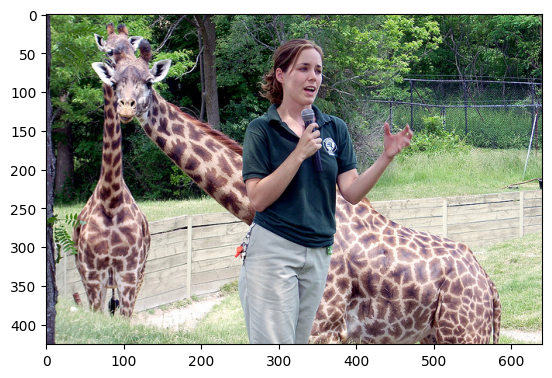

a giraffe standing in a field with a tree


'a giraffe standing in a field with a tree'

In [ ]:
import matplotlib.pyplot as plt

# Generate a caption given a path
def generate_caption(photo, max_len=maxlen):
    caption = ['startseq']

    for _ in range(max_len):
        tokens = [wordtoix[word] for word in caption if word in wordtoix]
        tokens_padded = pad_sequences([tokens], maxlen=max_len)
        predicted_word_index = np.argmax(model.predict([photo, tokens_padded], verbose=0))
        predicted_word = ixtoword[predicted_word_index]
        if predicted_word == 'endseq':
            break
        caption.append(predicted_word)
    processed_caption = caption[1:]
    if 'endseq' in processed_caption:
        processed_caption.remove('endseq')
    return ' '.join(processed_caption)

# Get a caption given a path
def get_caption(im_path):
    image = fetch_encoding(im_path)
    image = image.reshape((1, 2048))
    x=plt.imread(im_path)
    plt.imshow(x)
    plt.show()
    print(generate_caption(image))
    return generate_caption(image)

# Get example image
get_caption('/content/drive/MyDrive/TrainingImgs/000000266677.jpg')

In [ ]:
!unzip -j /content/drive/MyDrive/Image_Captioning/Dataset/coco-2017-dataset.zip 'coco2017/val2017/*' -d /content/drive/MyDrive/valImgs

In [ ]:
pip install pycocoevalcap

Testing the model with validation dataset and analyzing the metrics

In [ ]:
from pycocotools.coco import COCO
from pycocoevalcap.eval import COCOEvalCap

# Defining the directory path for validation images
folder_path = '/content/drive/MyDrive/valImgs'
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Constructing the full path for each image file
for image_file in image_files:
    image_path = os.path.join(folder_path, image_file)

# List to store generated captions for each image
all_captions = []

# Processing each image to generate captions
for image_file in tqdm(image_files):
    image_path = os.path.join(folder_path, image_file)
    temp_dict = dict()

    # Extracting image ID and encoding from image path
    image_id = int(str(image_path).split('.')[0].split('/')[-1].lstrip('0'))
    image = fetch_encoding(image_path)
    image = image.reshape((1, 2048))

    # Generating caption for the image
    image_caption = generate_caption(image)
    temp_dict["image_id"] = image_id
    temp_dict["caption"] = image_caption
    all_captions.append(temp_dict)

# Saving all generated captions to a JSON file
try:
    with open('/content/drive/MyDrive/results.json', 'w') as f:
        json.dump(all_captions, f)
except:
    pass

# Defining paths for annotation and results files
annotation_file = '/content/drive/MyDrive/captions_train2017.json'
results_file = '/content/drive/MyDrive/results.json'

# Evaluating generated captions against ground truth using COCO tools
coco = COCO(annotation_file)
coco_result = coco.loadRes(results_file)
coco_eval = COCOEvalCap(coco, coco_result)
coco_eval.evaluate()

# Displaying evaluation scores for various metrics
for metric, score in coco_eval.eval.items():
    print(f'{metric}: {score:.3f}')


In [ ]:
with open(results_file, 'r') as result:
    result_json=json.load(result)

Using cocoevalcap for evalution of generated captions

In [ ]:
# Defining paths for annotation and results files
annotation_file = '/content/drive/MyDrive/captions_val2017.json'
results_file = '/content/drive/MyDrive/results.json'

# Evaluating generated captions against ground truth using COCO tools
coco = COCO(annotation_file)
coco_result = coco.loadRes(results_file)
coco_eval = COCOEvalCap(coco, coco_result)
coco_eval.evaluate()

# Displaying evaluation scores for various metrics
for metric, score in coco_eval.eval.items():
    print(f'{metric}: {score:.3f}')

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
tokenization...
setting up scorers...
Progress: 384.5M / 384.5M (100.0%)
Extracting stanford-corenlp-3.6.0 ...
Done.
computing Bleu score...
{'testlen': 49604, 'reflen': 48801, 'guess': [49604, 44604, 39604, 34604], 'correct': [29693, 11759, 3997, 1375]}
ratio: 1.0164545808487324
Bleu_1: 0.599
Bleu_2: 0.397
Bleu_3: 0.252
Bleu_4: 0.159
computing METEOR score...
METEOR: 0.182
computing Rouge score...
ROUGE_L: 0.436
computing CIDEr score...
CIDEr: 0.494
computing SPICE score...
SPICE: 0.108
Bleu_1: 0.599
Bleu_2: 0.397
Bleu_3: 0.252
Bleu_4: 0.159
METEOR: 0.182
ROUGE_L: 0.436
CIDEr: 0.494
SPICE: 0.108
